In [1]:
import tensorflow as tf
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
    except RuntimeError as e:
        print(e)



tf.config.experimental.set_virtual_device_configuration(
    gpus[0],
    [tf.config.experimental.VirtualDeviceConfiguration(memory_limit=12288)])  # 12GB


2024-11-21 21:38:34.852770: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-11-21 21:38:34.867621: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1732192714.884203  112467 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1732192714.888817  112467 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-21 21:38:34.906979: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instr

In [2]:
# importing modules
import os
import gc
import PIL
import cv2
import uuid
import shutil
import glob as gb
import numpy as np
import pandas as pd
from tqdm import tqdm  # Progress bar
import matplotlib.pyplot as plt
%matplotlib inline


import keras
from sklearn.utils import shuffle
from keras.optimizers import Adam
from keras.regularizers import l1_l2
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from keras.models import Sequential, Model
from keras.layers import Dense, Dropout, Input
from keras.layers import GlobalAveragePooling2D
from keras.callbacks import LearningRateScheduler
from keras.layers import Conv2D, MaxPool2D, BatchNormalization
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import random

from sklearn.model_selection import train_test_split

random.seed(100)

In [3]:
#loading CBIS-DDSM dataset

dicom_df = pd.read_csv("/home/user/Desktop/CNN_Breast_Cancer/CBIS-DDSM/csv/dicom_info.csv")

In [4]:
#viewing cropped images
cropped_images = dicom_df[dicom_df.SeriesDescription=="cropped images"].image_path
cropped_images.head()

0     CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.129308...
3     CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.381187...
6     CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.153339...
7     CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.178994...
10    CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.411833...
Name: image_path, dtype: object

In [5]:
#viewing paths of full mammogram images
full_mammogram = dicom_df[dicom_df.SeriesDescription=="full mammogram images"].image_path
full_mammogram.head()

1     CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.248386...
2     CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.267213...
11    CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.210396...
12    CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.749566...
15    CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.987658...
Name: image_path, dtype: object

In [6]:
#viewing region of interest masks paths
roi_mask = dicom_df[dicom_df.SeriesDescription=="ROI mask images"].image_path
roi_mask.head()

5     CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.153339...
8     CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.178994...
9     CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.411833...
14    CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.236373...
20    CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.357008...
Name: image_path, dtype: object

In [7]:
def replace_path(sample, old_path, new_path):
    return sample.replace(old_path, new_path, regex=True)

In [8]:
def plot_smaples(sample, row=15, col=15):
    plt.figure(figsize=(row, col))
    for i, file in enumerate(sample[0:5]):
        cropped_images_show = PIL.Image.open(file)
        gray_img= cropped_images_show.convert("L")
        plt.subplot(1,5,i+1)
        plt.imshow(gray_img, cmap='gray')
        plt.axis('off')
    plt.show()

In [9]:
correct_dir = "/home/user/Desktop/CNN_Breast_Cancer/CBIS-DDSM/jpeg"

In [10]:
cropped_images = replace_path(cropped_images, "CBIS-DDSM/jpeg", correct_dir)
print('Cropped Images paths:')
print(cropped_images.iloc[0])

Cropped Images paths:
/home/user/Desktop/CNN_Breast_Cancer/CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.129308726812851964007517874181459556304/1-172.jpg


In [11]:
full_mammogram = replace_path(full_mammogram, "CBIS-DDSM/jpeg", correct_dir)
print('\nFull mammo Images paths:')
print(full_mammogram.iloc[0])


Full mammo Images paths:
/home/user/Desktop/CNN_Breast_Cancer/CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.248386742010678582309005372213277814849/1-249.jpg


In [12]:
roi_mask = replace_path(roi_mask, "CBIS-DDSM/jpeg", correct_dir)
print('\nROI Mask Images paths:')
print(roi_mask.iloc[0])


ROI Mask Images paths:
/home/user/Desktop/CNN_Breast_Cancer/CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.153339052913121382622526066491844156138/2-270.jpg


In [13]:
def get_image_file_name(data, new_dict):
    """
    /kaggle
    /input
    /cbis-ddsm-breast-cancer-image-dataset
    /jpeg
    /1.3.6.1.4.1.9590.100.1.2.129308726812851964007517874181459556304 [5]
    /1-172.jpg
    
    return path at index [9] after split depends on split('\')
    """
    for dicom in data:
        key = dicom.split('/')[8]
#         print(key)
        new_dict[key] = dicom
    print(f"the length of dataset ==> {len(new_dict.keys())}")

In [14]:
cropped_images_dict = dict()
full_mammo_dict = dict()
roi_img_dict = dict()

get_image_file_name(cropped_images, cropped_images_dict)
get_image_file_name(full_mammogram, full_mammo_dict)
get_image_file_name(roi_mask, roi_img_dict)

the length of dataset ==> 571
the length of dataset ==> 300
the length of dataset ==> 582


In [15]:
def fix_image_path(data):
    """Correct dicom paths to correct image paths."""
    for indx, image in enumerate(data.values):
#         print(f"Image Path: {image[11]}")

        img_name = image[11].split('/')[2]
#         print(f"Looking for key: {img_name}")  # Debugging step

        if img_name in full_mammo_dict:
            data.iloc[indx, 11] = full_mammo_dict[img_name]
        else:
            data.iloc[indx, 11] = None
#             print(f"KeyError: '{img_name}' not found in full_mammo_dict")  # Debugging step
        
        img_name = image[12].split('/')[2]
        if img_name in cropped_images_dict:
            data.iloc[indx, 12] = cropped_images_dict[img_name]
        else:
            data.iloc[indx, 12] = None
#             print(f"KeyError: '{img_name}' not found in cropped_images_dict")  # Debugging step

In [16]:
mass_train = pd.read_csv("/home/user/Desktop/CNN_Breast_Cancer/CBIS-DDSM/csv/mass_case_description_train_set.csv")
mass_test  = pd.read_csv("/home/user/Desktop/CNN_Breast_Cancer/CBIS-DDSM/csv/mass_case_description_test_set.csv")

In [17]:
fix_image_path(mass_train)

In [18]:
mass_train = mass_train.rename(columns={'left or right breast': 'left_or_right_breast',
                                        'image view': 'image_view',
                                        'abnormality id': 'abnormality_id',
                                        'abnormality type': 'abnormality_type',
                                        'mass shape': 'mass_shape',
                                        'mass margins': 'mass_margins',
                                        'image file path': 'image_file_path',
                                        'cropped image file path': 'cropped_image_file_path',
                                        'ROI mask file path': 'ROI_mask_file_path'})


In [19]:
fix_image_path(mass_test)

In [20]:
mass_test = mass_test.rename(columns={'left or right breast': 'left_or_right_breast',
                                      'image view': 'image_view',
                                      'abnormality id': 'abnormality_id',
                                      'abnormality type': 'abnormality_type',
                                      'mass shape': 'mass_shape',
                                      'mass margins': 'mass_margins',
                                      'image file path': 'image_file_path',
                                      'cropped image file path': 'cropped_image_file_path',
                                      'ROI mask file path': 'ROI_mask_file_path'})



In [21]:
print(f'Shape of mass_train: {mass_train.shape}')
print(f'Shape of mass_test: {mass_test.shape}')

Shape of mass_train: (1318, 14)
Shape of mass_test: (378, 14)


In [22]:
calc_train = pd.read_csv("/home/user/Desktop/CNN_Breast_Cancer/CBIS-DDSM/csv/calc_case_description_train_set.csv")
calc_test  = pd.read_csv("/home/user/Desktop/CNN_Breast_Cancer/CBIS-DDSM/csv/calc_case_description_test_set.csv")

In [23]:
calc_train = calc_train.rename(columns={'left or right breast': 'left_or_right_breast',
                                        'image view': 'image_view',
                                        'abnormality id': 'abnormality_id',
                                        'abnormality type': 'abnormality_type',
                                        'mass shape': 'mass_shape',
                                        'mass margins': 'mass_margins',
                                        'image file path': 'image_file_path',
                                        'cropped image file path': 'cropped_image_file_path',
                                        'ROI mask file path': 'ROI_mask_file_path'})

In [24]:
fix_image_path(calc_train)

In [25]:
calc_test = calc_test.rename(columns={'left or right breast': 'left_or_right_breast',
                                      'image view': 'image_view',
                                      'abnormality id': 'abnormality_id',
                                      'abnormality type': 'abnormality_type',
                                      'mass shape': 'mass_shape',
                                      'mass margins': 'mass_margins',
                                      'image file path': 'image_file_path',
                                      'cropped image file path': 'cropped_image_file_path',
                                      'ROI mask file path': 'ROI_mask_file_path'})

In [26]:
fix_image_path(calc_test)

In [27]:
print(f'Shape of mass_train: {calc_train.shape}')
print(f'Shape of mass_test: {calc_test.shape}')

Shape of mass_train: (1546, 14)
Shape of mass_test: (326, 14)


In [28]:
full_dataset = pd.concat([mass_train, mass_test, calc_train, calc_test], axis=0)

In [29]:
class_mapper = {'MALIGNANT': 1, 'BENIGN': 0, 'BENIGN_WITHOUT_CALLBACK': 0} 

In [30]:
target_size = (112, 112, 3) #112

In [31]:
# Apply class mapper to pathology column
full_dataset['labels'] = full_dataset['pathology'].replace(class_mapper).infer_objects(copy=False)

full_images = np.array(full_dataset[full_dataset["image_file_path"].notna()]["image_file_path"].tolist())
full_labels = np.array(full_dataset[full_dataset["image_file_path"].notna()]["labels"].tolist())

/tmp/ipykernel_112467/614134976.py:2: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  full_dataset['labels'] = full_dataset['pathology'].replace(class_mapper).infer_objects(copy=False)


In [32]:
num_classes = len(full_dataset['labels'].unique())
num_classes

2

In [33]:
class_names = ['Benign', 'Malignant']

In [34]:
# Check the distribution of labels
label_counts = full_dataset['labels'].value_counts()
print(label_counts)

labels
0    2111
1    1457
Name: count, dtype: int64


In [35]:
def copy_images_with_unique_filenames(source_images, source_labels, destination_dir):
    """
    Copy images from source to destination_dir in subfolders '0' and '1', ensuring unique filenames.
    """
    benign_images = 0
    malignant_images = 0
    skipped_images = []

    # Create the destination subfolders '0' and '1'
    category_dest_dir_zero = os.path.join(destination_dir, '0')
    os.makedirs(category_dest_dir_zero, exist_ok=True)
    
    category_dest_dir_one = os.path.join(destination_dir, '1')
    os.makedirs(category_dest_dir_one, exist_ok=True)

    # Copy all images to the appropriate folder based on the label
    for idx, (source, label) in enumerate(zip(source_images, source_labels)):
        if os.path.exists(source):
            try:
                # Generate a unique filename
                filename = os.path.basename(source)
                unique_filename = f"{uuid.uuid4().hex}_{filename}"
                
                if label == 0:
                    shutil.copy(source, os.path.join(category_dest_dir_zero, unique_filename))
                    benign_images += 1
                elif label == 1:
                    shutil.copy(source, os.path.join(category_dest_dir_one, unique_filename))
                    malignant_images += 1
                
#                 print(f"Copied image {idx + 1}/{len(source_images)} to class {label}")
            except Exception as e:
                print(f"Error copying image {source}: {e}")
                skipped_images.append(source)
        else:
            print(f"Image not found: {source}")
            skipped_images.append(source)

    # After running the function
    print(f"\nCopying complete.")
    print(f"Benign images copied (label 0): {benign_images}")
    print(f"Malignant images copied (label 1): {malignant_images}")
    print(f"Total skipped images: {len(skipped_images)}")
    if skipped_images:
        print("Skipped images:")
        for img in skipped_images:
            print(img)

In [36]:
destination_dir = "D:/ASMA/CNN_Breast Cancer/CBIS-DDSM/marged_images"  # Update this path as needed

copy_images_with_unique_filenames(full_images, full_labels, destination_dir)


Copying complete.
Benign images copied (label 0): 1931
Malignant images copied (label 1): 1355
Total skipped images: 0


In [37]:
def copy_images_to_destination(source_dir, destination_dir):
    """
    Move or copy images from source_dir to destination_dir in subfolders '0' and '1'.
    """
    # Define the categories (class labels) as '0' and '1'
    categories = ['0', '1']
    
    for category in categories:
        # Create the destination subfolder (e.g., '0' or '1') if it doesn't exist
        category_dest_dir = os.path.join(destination_dir, category)
        os.makedirs(category_dest_dir, exist_ok=True)
        
        # Path to the current category folder in the source directory
        category_source_dir = os.path.join(source_dir, category)
        
        # Move or copy all images from the source category folder to the destination folder
        for img_name in os.listdir(category_source_dir):
            # Construct full file paths
            img_source_path = os.path.join(category_source_dir, img_name)
            img_dest_path = os.path.join(category_dest_dir, img_name)
            
            # Copy the image to the destination folder (you can use shutil.move to move instead of copy)
            shutil.copy(img_source_path, img_dest_path)
            
            # Optionally, print the status
#             print(f"Copied {img_source_path} to {img_dest_path}")


In [38]:
# Define the paths to your dataset folders
test = "D:/ASMA/CNN_Breast Cancer/archive/test"
train = "D:/ASMA/CNN_Breast Cancer/archive/train"
valid = "D:/ASMA/CNN_Breast Cancer/archive/valid"

# Destination directory for the unified dataset
destination_dir = "D:/ASMA/CNN_Breast Cancer/CBIS-DDSM/marged_images"  # Update this path as needed

In [39]:
# Apply the function to each of the dataset folders (test, train, valid)
copy_images_to_destination(test, destination_dir)
copy_images_to_destination(train, destination_dir)
copy_images_to_destination(valid, destination_dir)

In [40]:
def image_processor(image_path, target_size):
    """Preprocess images for CNN model"""
    if image_path:
#         absolute_image_path = os.path.abspath(image_path)
        image = cv2.imread(image_path)
        
        # Check if the image was loaded successfully
        if image is None:
#             print(f"Warning: Failed to load image at {absolute_image_path}. Skipping this file.")
            return None

        # Resize the image and normalize it
        image = cv2.resize(image, (target_size[0], target_size[1]))
        image_array = image / 255.0  # Normalize the image to range [0, 1]
        return image_array
    else:
        return None

In [42]:
import os
import cv2
import numpy as np
from concurrent.futures import ThreadPoolExecutor

def image_processor(image_path, target_size):
    """Preprocess images for CNN model."""
    image = cv2.imread(image_path)
    
    # Check if the image was loaded successfully
    if image is None:
        return None
    
    # Resize and normalize the image
    image = cv2.resize(image, target_size)
    return image

def load_images_from_directory(directory, target_size, label):
    """Load and preprocess images from a directory."""
    image_files = [entry.path for entry in os.scandir(directory) if entry.is_file()]
    
    with ThreadPoolExecutor() as executor:
        images = list(executor.map(lambda img: image_processor(img, target_size), image_files))
    
    # Filter out None values in case some images failed to load
    images = np.array([img for img in images if img is not None])
    labels = np.full(len(images), label)
    
    return images, labels

# Define paths and target size
path_zero = 'D:/ASMA/CNN_Breast Cancer/CBIS-DDSM/marged_images/0'
path_one  = 'D:/ASMA/CNN_Breast Cancer/CBIS-DDSM/marged_images/1'
target_size = (112, 112)

# Load benign and malignant images
benign_images, benign_labels = load_images_from_directory(path_zero, target_size, label=0)
malignant_images, malignant_labels = load_images_from_directory(path_one, target_size, label=1)


In [43]:
print(f"The Count of 0 is: {benign_images.shape}")
print()
print(f"The count of 0 label is: {benign_labels.shape}")
print()
print(f"The count of 1 is: {malignant_images.shape}")
print()
print(f"The count of 1 label is: {malignant_labels.shape}")

The Count of 0 is: (40845, 112, 112, 3)

The count of 0 label is: (40845,)

The count of 1 is: (28258, 112, 112, 3)

The count of 1 label is: (28258,)


In [44]:
# Concatenate images and labels
full_images = np.concatenate([benign_images, malignant_images])
full_labels = np.concatenate([benign_labels, malignant_labels])
print("Preprocessing complete. Images and labels combined.")

Preprocessing complete. Images and labels combined.


In [45]:
# Shuffle the dataset (images and labels in unison)
full_images, full_labels = shuffle(full_images, full_labels, random_state=42)

In [46]:
train_images, valid_images, train_labels, valid_labels = train_test_split(full_images, full_labels,test_size=0.2,random_state=40)
valid_images, test_images, valid_labels, test_labels = train_test_split(valid_images, valid_labels,test_size=0.5,random_state=40)

In [47]:
print("Train:")
print(train_images.shape)
print(train_labels.shape)
print("Valid:")
print(valid_images.shape)
print(valid_labels.shape)
print("Test:")
print(test_images.shape)
print(test_labels.shape)

Train:
(55282, 112, 112, 3)
(55282,)
Valid:
(6910, 112, 112, 3)
(6910,)
Test:
(6911, 112, 112, 3)
(6911,)


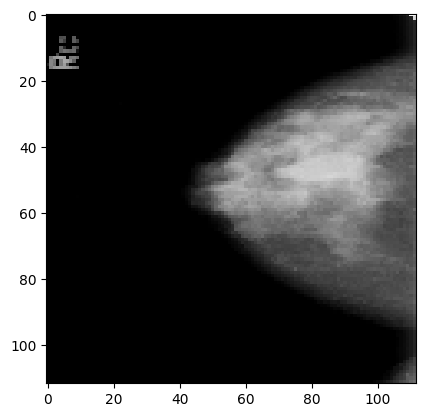

In [48]:
plt.imshow(train_images[10])
plt.show()

In [49]:
num_classes = 2

train_labels = to_categorical(train_labels, num_classes)
test_labels  = to_categorical(test_labels, num_classes)
valid_labels = to_categorical(valid_labels, num_classes)

#### Data Augmentation

In [112]:
import os
import tensorflow as tf
# import keras_cv
import numpy as np
import cv2
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical


# HyperColumn Simulation (Combining features for augmentation purposes)
def apply_hypercolumn(images, labels):
    # Apply a hypothetical hypercolumn-style augmentation
    images = tf.image.resize(images, [112, 112])  # Ensure initial resize to match other augmentations
    images = tf.image.central_crop(images, central_fraction=0.75)  # Apply cropping
    images = tf.image.resize(images, [112, 112])  # Resize back to ensure consistent output shape
    return images, labels


def apply_no_augmentation(images, labels):
    """Return the images and labels without any augmentation."""
    return images, labels


def apply_contrast_stretching(images, labels):
    def contrast_stretch(image):
        image = tf.image.convert_image_dtype(image, dtype=tf.float32)
        min_val = tf.reduce_min(image)
        max_val = tf.reduce_max(image)
        epsilon = 1e-5
        stretched = (image - min_val) / (max_val - min_val + epsilon)
        stretched = tf.clip_by_value(stretched * 255.0, 0, 255)
        return tf.cast(stretched, tf.float32) / 255.0

    images = tf.map_fn(contrast_stretch, images, dtype=tf.float32)
    return images, labels

def apply_clahe(images, labels):
    def clahe_fn(img):
        img = tf.cast(img, tf.uint8).numpy()
        if img.ndim == 3 and img.shape[-1] == 3:
            img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        else:
            img_gray = img
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
        img_clahe = clahe.apply(img_gray)
        if img.ndim == 3 and img.shape[-1] == 3:
            img_clahe = cv2.cvtColor(img_clahe, cv2.COLOR_GRAY2RGB)
        return img_clahe

    def py_func_clahe(images):
        return tf.map_fn(
            lambda img: tf.py_function(func=clahe_fn, inp=[img], Tout=tf.uint8),
            images
        )

    images = tf.image.convert_image_dtype(images, dtype=tf.uint8)
    images = py_func_clahe(images)
    images = tf.image.convert_image_dtype(images, dtype=tf.float32)
    return images, labels


# Elastic Deformation
def apply_elastic_deformation(images, labels, alpha=34, sigma=4):
    """
    Applies elastic deformation to images.
    alpha: Scaling factor for intensity of the deformation.
    sigma: Gaussian filter standard deviation.
    """
    def elastic_transform(image):
        shape = image.shape[:2]
        dx = cv2.GaussianBlur(np.random.uniform(-1, 1, shape), (17, 17), sigma) * alpha
        dy = cv2.GaussianBlur(np.random.uniform(-1, 1, shape), (17, 17), sigma) * alpha
        x, y = np.meshgrid(np.arange(shape[1]), np.arange(shape[0]))
        map_x = np.float32(x + dx)
        map_y = np.float32(y + dy)
        return cv2.remap(image, map_x, map_y, interpolation=cv2.INTER_LINEAR)

    # Apply elastic deformation to all images
    images = np.array([elastic_transform(img) for img in images])  # No `.numpy()` call here
    return tf.convert_to_tensor(images, dtype=tf.float32), labels

# Random Cut-and-Paste
def apply_random_cut_and_paste(images, labels):
    def cut_and_paste(img1, img2):
        h, w = img1.shape[:2]
        y1, x1 = np.random.randint(h // 2), np.random.randint(w // 2)
        y2, x2 = y1 + h // 4, x1 + w // 4
        img1[y1:y2, x1:x2] = img2[y1:y2, x1:x2]
        return img1

    indices = np.random.permutation(len(images))
    images = np.array([cut_and_paste(images[i].numpy(), images[j].numpy()) for i, j in enumerate(indices)])
    return tf.convert_to_tensor(images, dtype=tf.float32), labels


def apply_grid_masking(images, labels, grid_size=3):
    def grid_mask_single(img):
        h, w = img.shape[:2]
        grid_h = h // grid_size
        grid_w = w // grid_size
        mask = np.ones((h, w), np.float32)
        for i in range(0, h, grid_h * 2):
            for j in range(0, w, grid_w * 2):
                mask[i:i + grid_h, j:j + grid_w] = 0
        return img * mask[..., None]

    # Check if images are already numpy arrays
    if isinstance(images, np.ndarray):
        images = np.array([grid_mask_single(img) for img in images])
    else:  # If images are tensors, convert them to numpy first
        images = np.array([grid_mask_single(img.numpy()) for img in images])
    
    return tf.convert_to_tensor(images, dtype=tf.float32), labels

# Sobel Edge Detection
def apply_sobel_edge_detection(images, labels):
    """
    Apply Sobel edge detection to each image in the batch.
    """
    def sobel_filter(img):
        # Convert RGB image to grayscale
        img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        # Apply Sobel filters to detect edges
        sobelx = cv2.Sobel(img_gray, cv2.CV_64F, 1, 0, ksize=3)
        sobely = cv2.Sobel(img_gray, cv2.CV_64F, 0, 1, ksize=3)
        sobel = cv2.magnitude(sobelx, sobely)
        # Normalize Sobel output to [0, 255] and convert to uint8
        sobel = np.uint8(255 * sobel / np.max(sobel))
        # Convert grayscale back to RGB
        return cv2.cvtColor(sobel, cv2.COLOR_GRAY2RGB)

    # Apply Sobel filter to each image
    images = np.array([sobel_filter(img) for img in images])  # No .numpy() calls
    return tf.convert_to_tensor(images, dtype=tf.float32), labels

# Channel Shuffle
def apply_channel_shuffle(images, labels):
    def shuffle_channels(img):
        channels = [0, 1, 2]  # RGB channels
        np.random.shuffle(channels)  # Shuffle the channel order
        return img[..., channels]  # Reorder the channels

    # Apply channel shuffle to all images
    images = np.array([shuffle_channels(img) for img in images])  # No `.numpy()` call here
    return tf.convert_to_tensor(images, dtype=tf.float32), labels

# Cutout (Random Erasing)
def apply_cutout(images, labels, mask_size=50):
    def cutout_single(img):
        h, w = img.shape[:2]
        mask = np.ones((h, w), np.float32)
        y = np.random.randint(h)
        x = np.random.randint(w)
        y1 = np.clip(y - mask_size // 2, 0, h)
        y2 = np.clip(y + mask_size // 2, 0, h)
        x1 = np.clip(x - mask_size // 2, 0, w)
        x2 = np.clip(x + mask_size // 2, 0, w)
        mask[y1:y2, x1:x2] = 0
        return img * mask[..., None]  # Apply the mask to all channels

    # Apply cutout to all images
    images = np.array([cutout_single(img) for img in images])  # No `.numpy()` call here
    return tf.convert_to_tensor(images, dtype=tf.float32), labels


# Define the custom augmentation functions
def get_custom_augmentation():
    return tf.keras.Sequential([
        tf.keras.layers.RandomFlip("horizontal"),
        tf.keras.layers.RandomRotation(0.1),
        tf.keras.layers.RandomZoom(0.5, 0.2),
    ])

# Randomly apply augmentations
def apply_random_augmentation(images, labels, debug=False):
    """Randomly apply one augmentation or return the original images."""
    augmentation_functions = [
        lambda x, y: (get_custom_augmentation()(x), y),
        apply_random_cut_and_paste,
        apply_cutout,
        apply_sobel_edge_detection,
        apply_grid_masking,
#         apply_cut_mix,
#         apply_randaug,
        apply_clahe,
#         apply_mixup,
        apply_contrast_stretching,
        apply_elastic_deformation,
        apply_channel_shuffle,
        apply_hypercolumn,
        apply_no_augmentation,  # No augmentation option
    ]
    # Randomly select an augmentation function
    choice = np.random.choice(len(augmentation_functions))
    augmented_images, augmented_labels = augmentation_functions[choice](images, labels)

    if debug:
        print(f"Applied Augmentation: {augmentation_functions[choice].__name__}")

    return augmented_images, augmented_labels

class CustomDataLoader:
    def __init__(self, images, labels, batch_size, augment=False, debug=False):
        self.images = images  # Keep images as numpy arrays to handle CPU-based augmentations
        self.labels = labels  # Labels are also numpy arrays
        self.batch_size = batch_size
        self.augment = augment
        self.debug = debug
        self.num_samples = len(images)
        self.indices = np.arange(self.num_samples)

    def __len__(self):
        return self.num_samples // self.batch_size

    def __iter__(self):
        np.random.shuffle(self.indices)
        for i in range(0, self.num_samples, self.batch_size):
            batch_indices = self.indices[i:i + self.batch_size]
            batch_images = self.images[batch_indices]
            batch_labels = self.labels[batch_indices]

            if self.augment:
                with tf.device('/CPU:0'):  # Perform augmentation on CPU
                    batch_images, batch_labels = apply_random_augmentation(batch_images, batch_labels, debug=self.debug)
            batch_images = tf.convert_to_tensor(batch_images, dtype=tf.float32)  # Convert to TensorFlow tensors
            batch_labels = tf.convert_to_tensor(batch_labels, dtype=tf.float32)

            yield batch_images, batch_labels
            
# Visualize a batch
def visualize_batch(images, labels, class_names):
    plt.figure(figsize=(12, 6))
    for i in range(min(len(images), 8)):  # Show up to 8 images
        plt.subplot(2, 4, i + 1)
        plt.imshow(images[i])
        plt.title(f"Class: {class_names[np.argmax(labels[i])]}")
        plt.axis("off")
    plt.tight_layout()
    plt.show()



In [113]:
# Augment the training set
batch_size = 16
train_loader = CustomDataLoader(train_images, train_labels, batch_size, augment=True)
val_loader = CustomDataLoader(valid_images, valid_labels, batch_size, augment=True)
test_loader = CustomDataLoader(test_images, test_labels, batch_size, augment=True)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..249.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..198.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


Visualizing Batch 1/20


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..231.0].


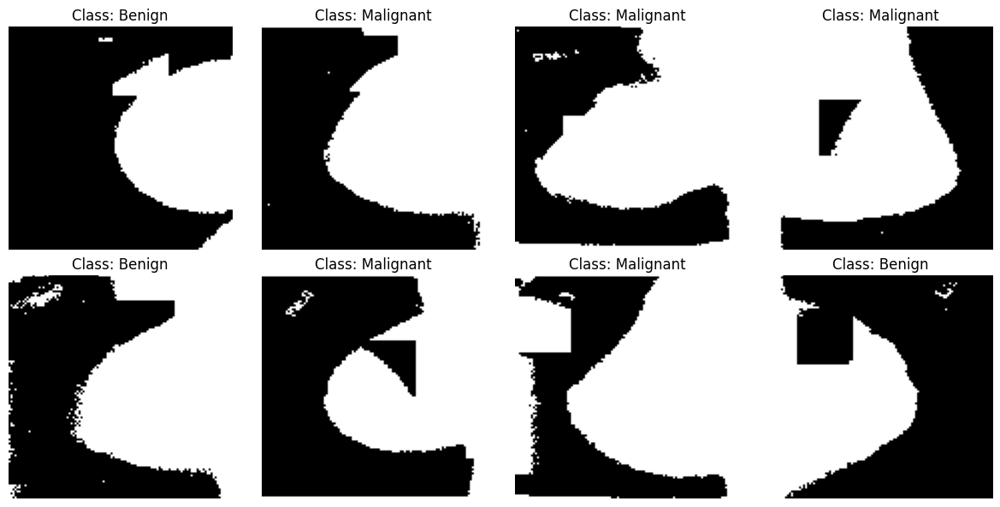

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..254.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..191.0].
Clipping input data to the valid range for imshow with RGB dat

Visualizing Batch 2/20


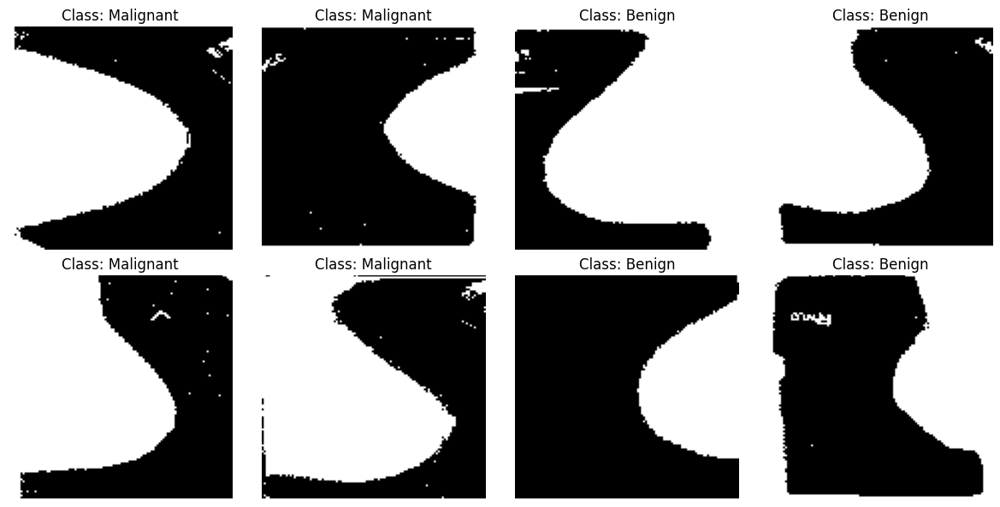

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..207.09375].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..208.75].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..204.375].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..242.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..215.5].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..215.25].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..199.6875].
Clipping input data to the valid range for imshow w

Visualizing Batch 3/20


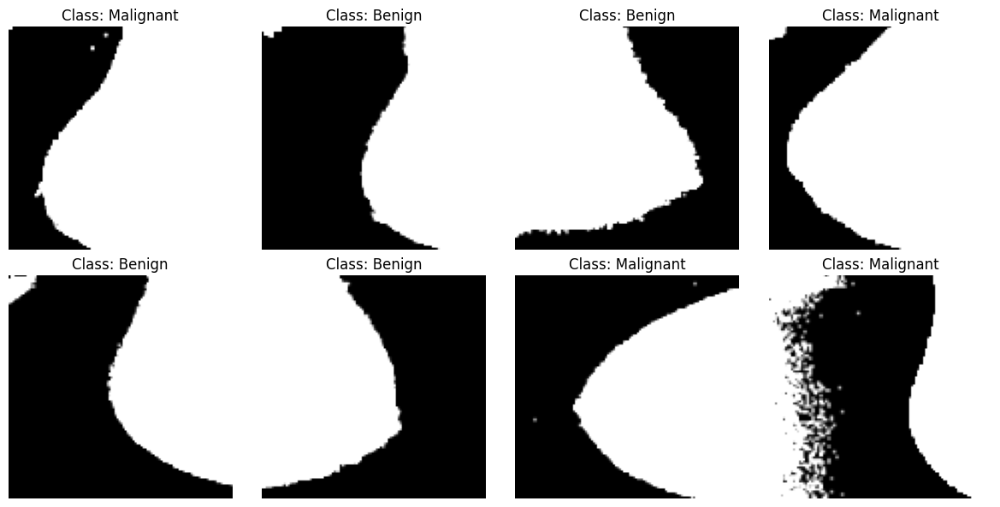

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..219.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..249.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..248.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..203.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..199.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB dat

Visualizing Batch 4/20


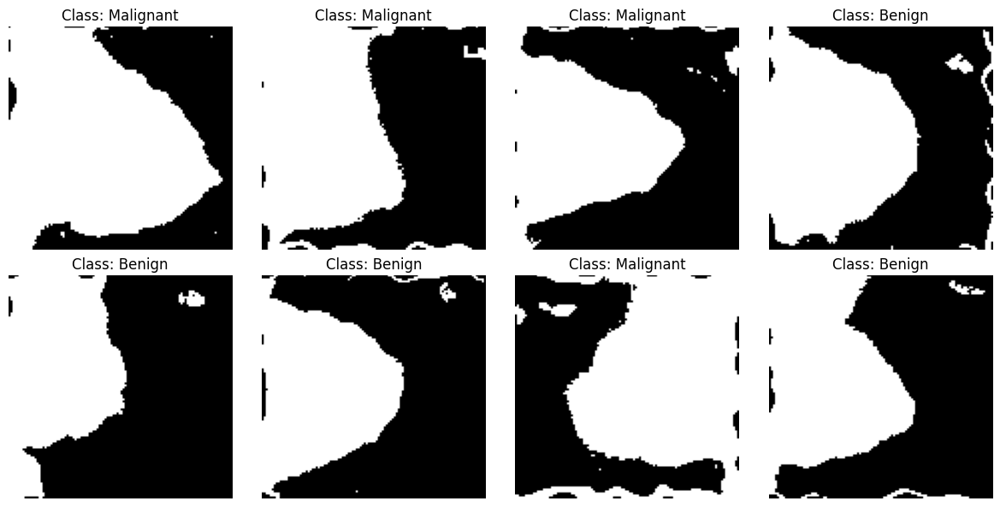

Visualizing Batch 5/20


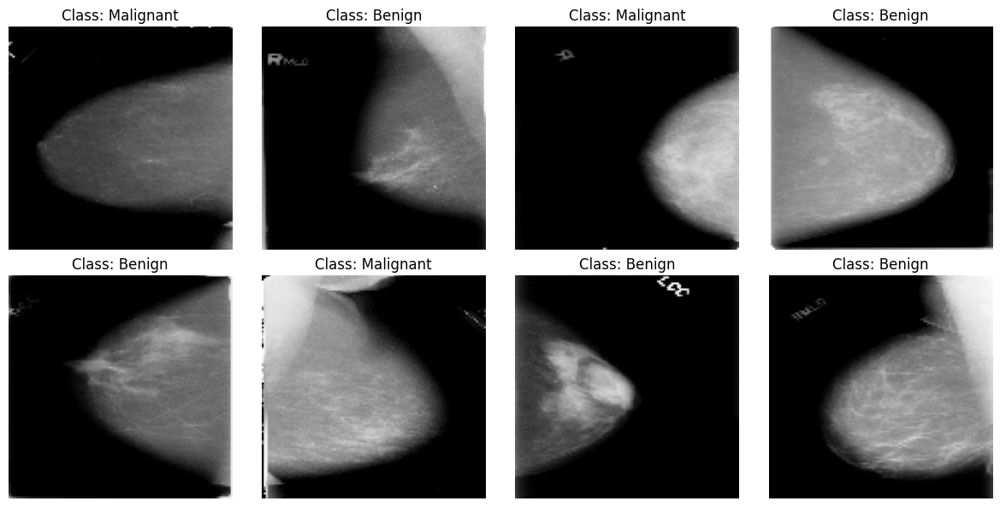

Visualizing Batch 6/20


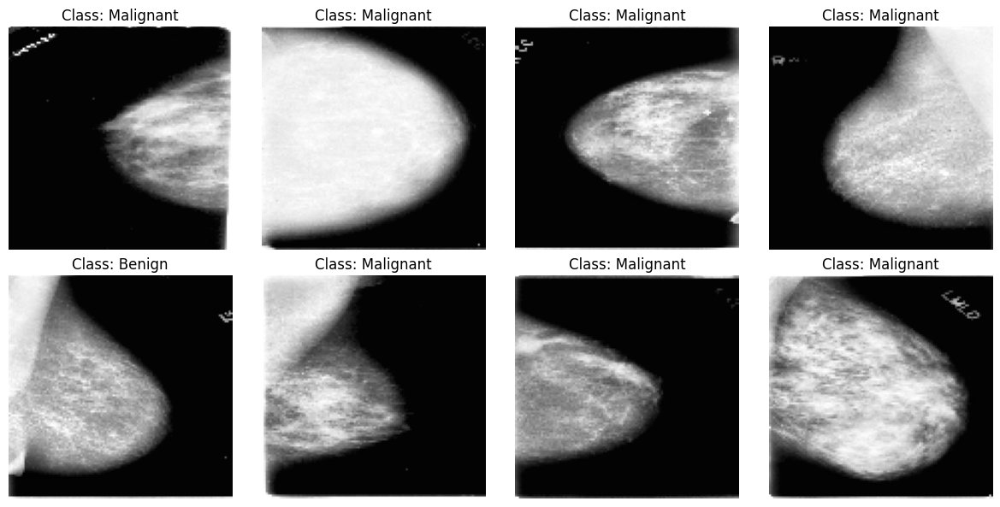

Visualizing Batch 7/20


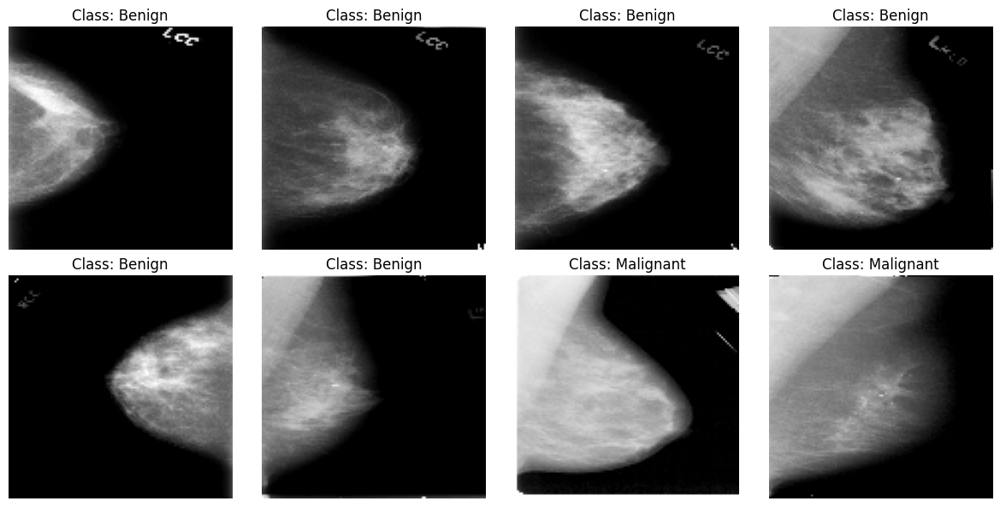

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


Visualizing Batch 8/20


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..254.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


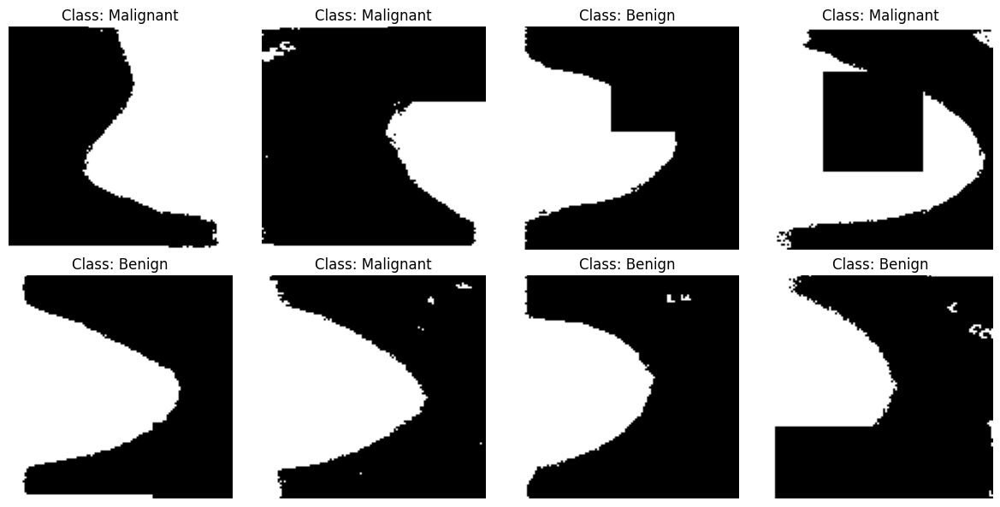

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..227.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..228.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..252.0].
Clipping input data to the valid range for imshow with RGB dat

Visualizing Batch 9/20


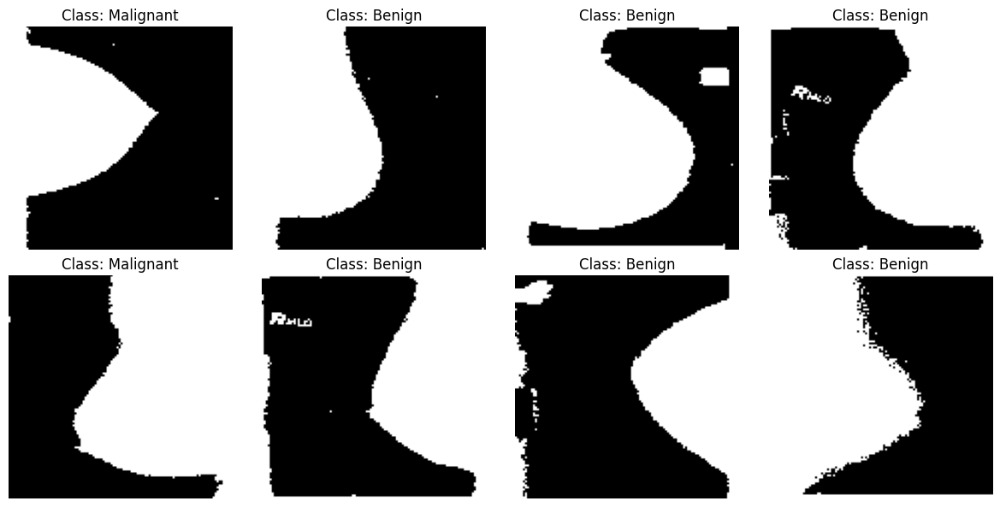

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..220.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB dat

Visualizing Batch 10/20


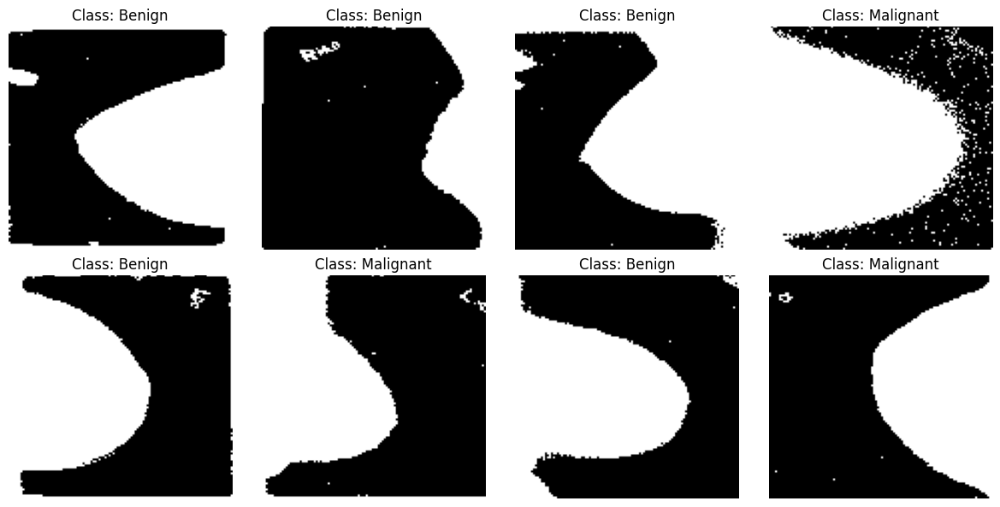

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB dat

Visualizing Batch 11/20


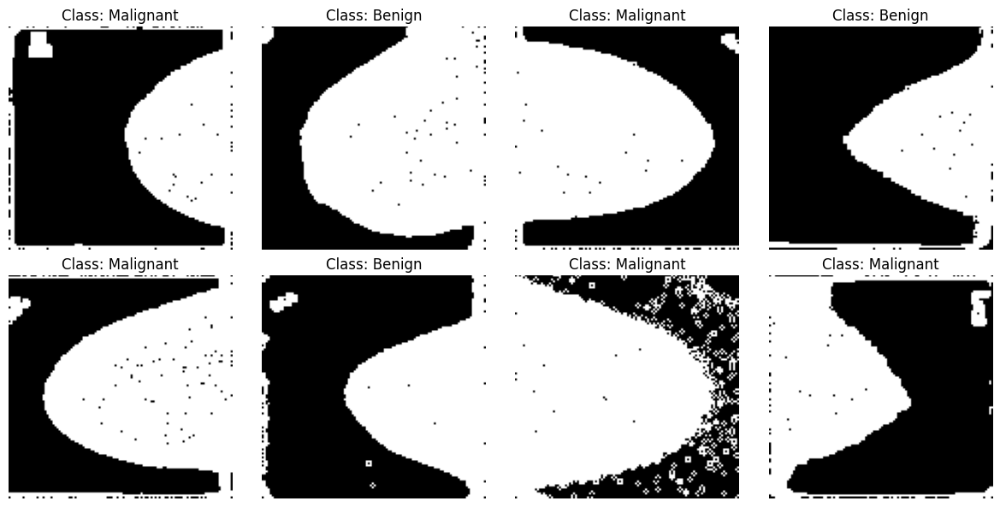

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..244.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..252.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..240.0].
Clipping input data to the valid range for imshow with RGB dat

Visualizing Batch 12/20


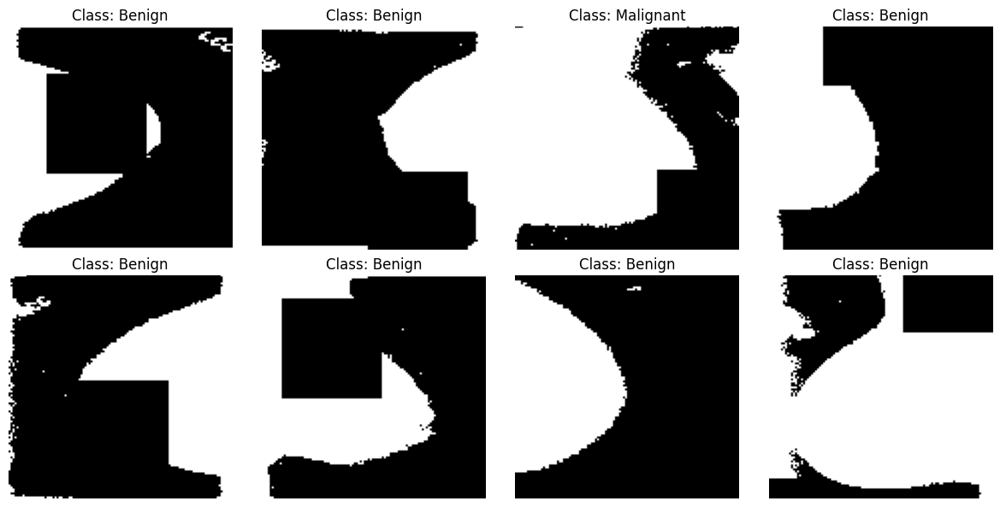

Visualizing Batch 13/20


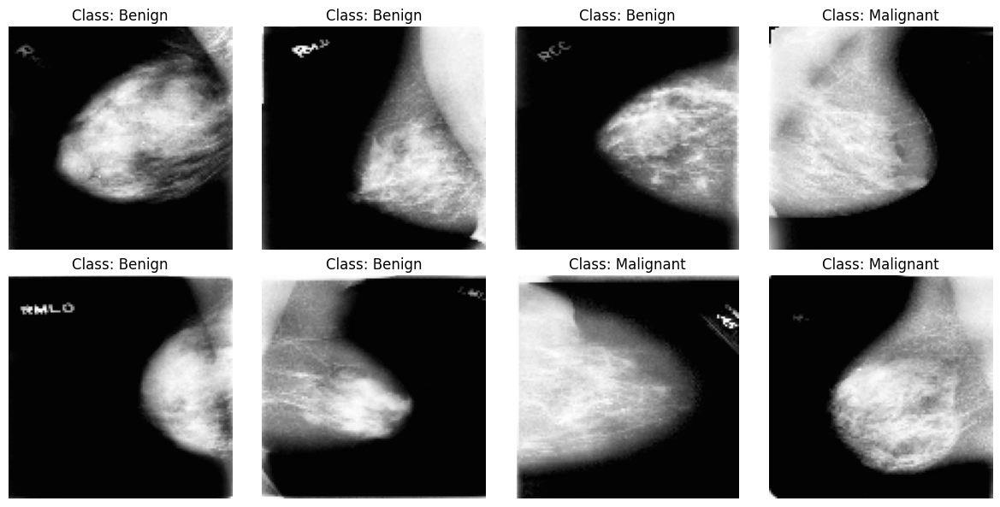

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..219.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..254.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..253.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..230.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..249.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..254.0].
Clipping input data to the valid range for imshow with RGB dat

Visualizing Batch 14/20


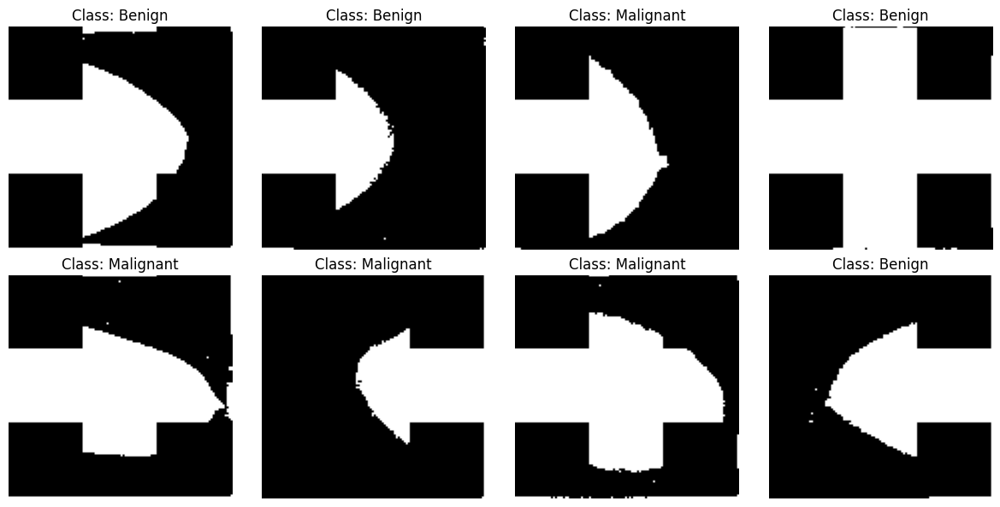

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..244.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..230.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..190.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..211.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..184.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..237.0].
Clipping input data to the valid range for imshow with RGB dat

Visualizing Batch 15/20


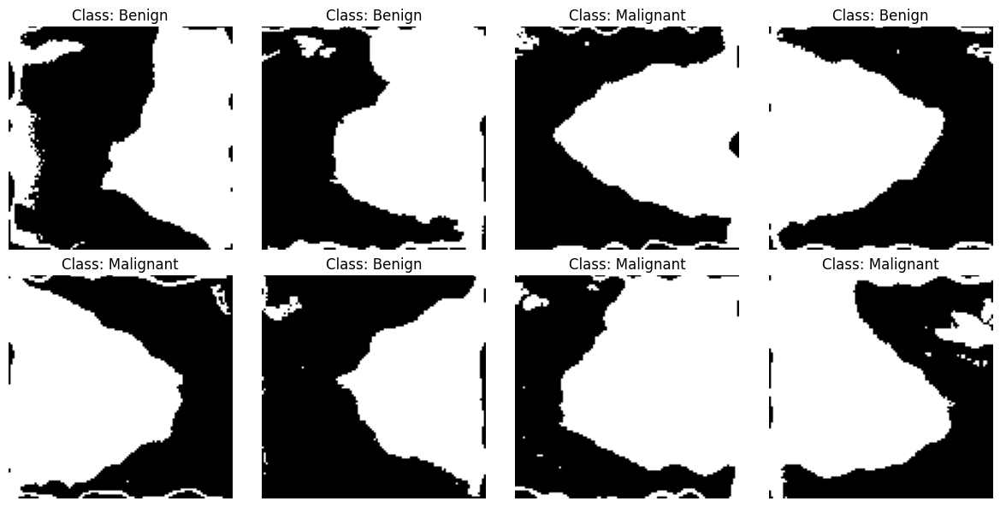

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..192.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..227.0].
Clipping input data to the valid range for imshow with RGB dat

Visualizing Batch 16/20


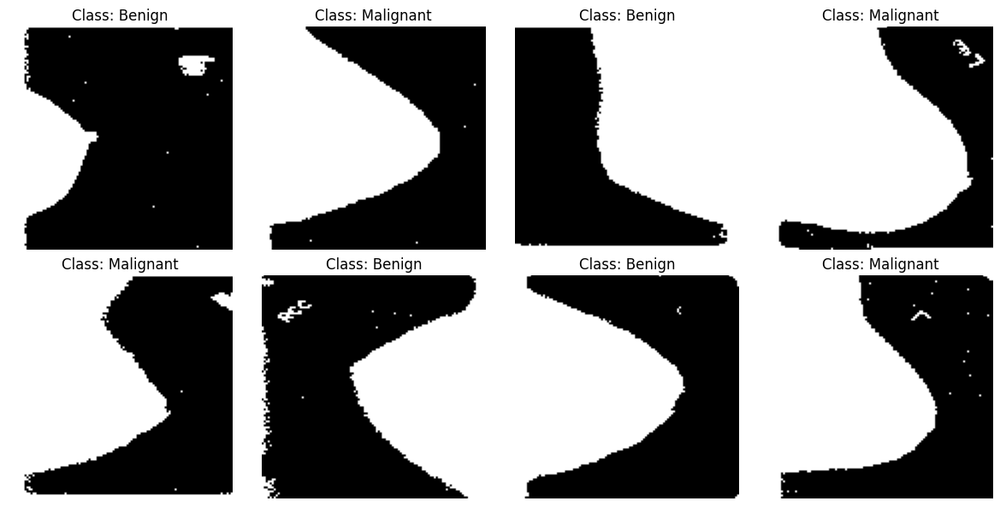

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..230.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..135.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


Visualizing Batch 17/20


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..213.0].


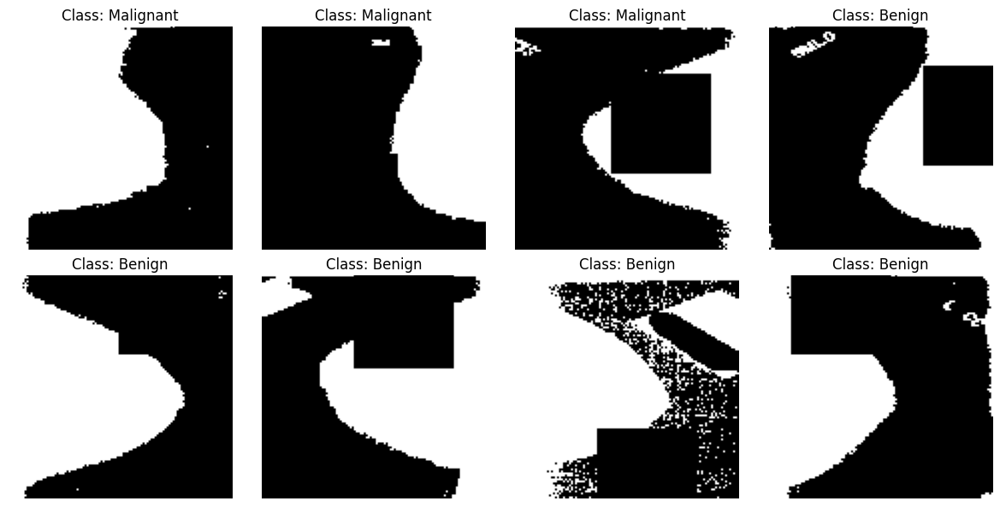

Visualizing Batch 18/20


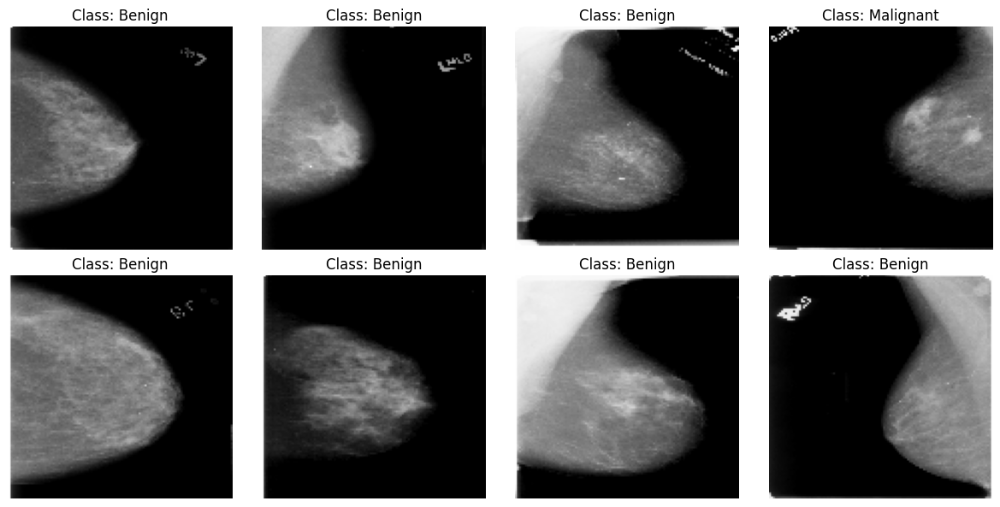

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..167.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..216.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB dat

Visualizing Batch 19/20


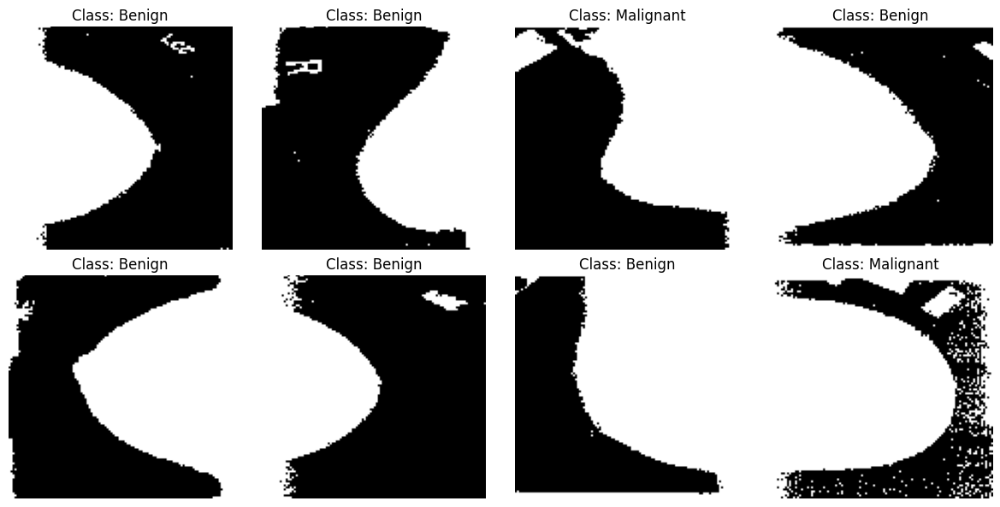

Visualizing Batch 20/20


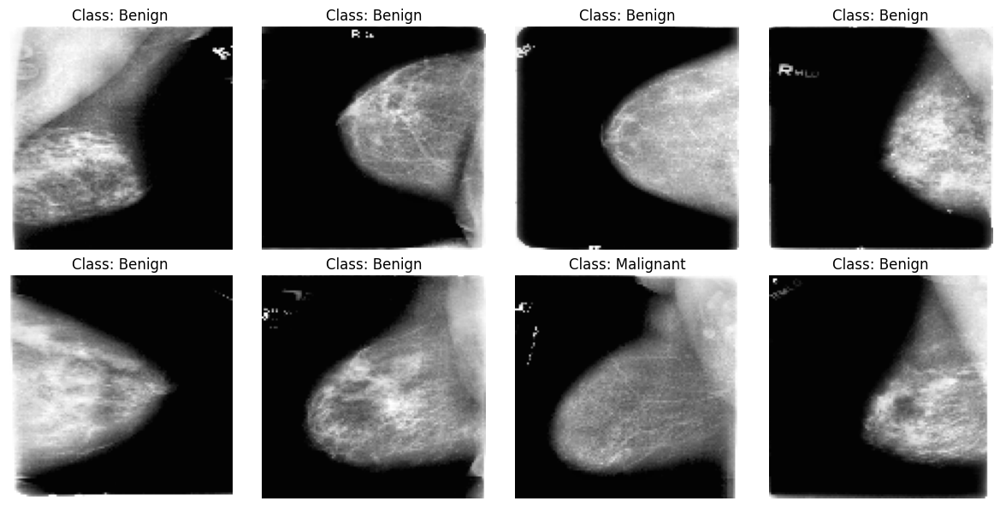

In [116]:
    
# Visualize a certain number of batches from the train loader
    num_batches_to_visualize = 20
    for batch_index, (batch_images, batch_labels) in enumerate(train_loader):
        print(f"Visualizing Batch {batch_index + 1}/{num_batches_to_visualize}")
        visualize_batch(batch_images, batch_labels, class_names)
#         visualize_batch(batch_images.numpy(), batch_labels.numpy(), class_names)
        if batch_index + 1 >= num_batches_to_visualize:
            break


In [117]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, Reshape, Dense, Dropout, LayerNormalization, Embedding, MultiHeadAttention, Add
from tensorflow.keras.models import Model
from keras.layers import Concatenate

# Configuration dictionary
config = {
    "num_layers": 6,
    "hidden_dim": 64,
    "mlp_dim": 128,
    "num_heads": 2,
    "dropout_rate": 0.1,
    "image_size": 112,
    "patch_size": 8,
    "num_channels": 3,
    "num_classes": 2,  # Define your number of classes here
    "trainable_backbone": False  # Set to True to make CNN layers trainable
}

# Class token for Vision Transformer
class ClassToken(tf.keras.layers.Layer):
    def __init__(self):
        super().__init__()

    def build(self, input_shape):
        w_init = tf.random_uniform_initializer()
        self.w = tf.Variable(
            initial_value=w_init(shape=(1, 1, input_shape[-1]), dtype="float32"),
            trainable=True
        )

    def call(self, inputs):
        batch_size = tf.shape(inputs)[0]
        hidden_dim = self.w.shape[-1]
        cls = tf.broadcast_to(self.w, [batch_size, 1, hidden_dim])
        cls = tf.cast(cls, dtype=inputs.dtype)
        return cls

# Transformer Encoder
def transformer_encoder(x, cf):
    skip_1 = x
    x = LayerNormalization()(x)
    x = MultiHeadAttention(
        num_heads=cf["num_heads"], key_dim=cf["hidden_dim"]
    )(x, x)
    x = Add()([x, skip_1])

    skip_2 = x
    x = LayerNormalization()(x)
    x = mlp(x, cf)
    x = Add()([x, skip_2])
    return x

# MLP block
def mlp(x, cf):
    x = Dense(cf["mlp_dim"], activation="gelu")(x)
    x = Dropout(cf["dropout_rate"])(x)
    x = Dense(cf["hidden_dim"])(x)
    x = Dropout(cf["dropout_rate"])(x)
    return x

# Xception-based Vision Transformer model
def CNNViT(cf):
    inputs = Input((cf["image_size"], cf["image_size"], cf["num_channels"]))
    
    # Load pre-trained Xception model
    cnn = tf.keras.applications.EfficientNetB0(include_top=False, weights="imagenet", input_tensor=inputs)
    
    # Optionally make CNN layers trainable
    for layer in cnn.layers:
        layer.trainable = cf["trainable_backbone"]
    
    # Extract output from the CNN backbone
    output = cnn.output
    
    # Patch embedding
    patch_embed = Conv2D(cf["hidden_dim"], kernel_size=cf["patch_size"], padding="same")(output)
    _, h, w, f = patch_embed.shape
    patch_embed = Reshape((h * w, f))(patch_embed)

    # Positional embedding
    positions = tf.range(start=0, limit=h * w, delta=1)
    pos_embed = Embedding(input_dim=h * w, output_dim=cf["hidden_dim"])(positions)
    embed = patch_embed + pos_embed

    # Add the class token for transformer processing
    token = ClassToken()(embed)
    x = Concatenate(axis=1)([token, embed])

    # Apply transformer encoders
    for _ in range(cf["num_layers"]):
        x = transformer_encoder(x, cf)

    # Layer normalization before classification
    x = LayerNormalization()(x)
    x = x[:, 0, :]  # Use the output from the class token
    x = Dense(cf["num_classes"], activation="softmax")(x)

    # Create model
    model = Model(inputs, x)
    return model

# Build the model with trainable CNN layers set to False (or True as needed)
model = CNNViT(config)
model.summary()


Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 112, 112, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling_2 (Rescaling)        (None, 112, 112, 3)  0           ['input_2[0][0]']                
                                                                                                  
 normalization_1 (Normalization  (None, 112, 112, 3)  7          ['rescaling_2[0][0]']            
 )                                                                                                
                                                                                            

                                                                                                  
 block2b_expand_conv (Conv2D)   (None, 28, 28, 144)  3456        ['block2a_project_bn[0][0]']     
                                                                                                  
 block2b_expand_bn (BatchNormal  (None, 28, 28, 144)  576        ['block2b_expand_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 block2b_expand_activation (Act  (None, 28, 28, 144)  0          ['block2b_expand_bn[0][0]']      
 ivation)                                                                                         
                                                                                                  
 block2b_dwconv (DepthwiseConv2  (None, 28, 28, 144)  1296       ['block2b_expand_activation[0][0]
 D)       

 ivation)                                                                                         
                                                                                                  
 block3b_dwconv (DepthwiseConv2  (None, 14, 14, 240)  6000       ['block3b_expand_activation[0][0]
 D)                                                              ']                               
                                                                                                  
 block3b_bn (BatchNormalization  (None, 14, 14, 240)  960        ['block3b_dwconv[0][0]']         
 )                                                                                                
                                                                                                  
 block3b_activation (Activation  (None, 14, 14, 240)  0          ['block3b_bn[0][0]']             
 )                                                                                                
          

                                                                                                  
 block4b_activation (Activation  (None, 7, 7, 480)   0           ['block4b_bn[0][0]']             
 )                                                                                                
                                                                                                  
 block4b_se_squeeze (GlobalAver  (None, 480)         0           ['block4b_activation[0][0]']     
 agePooling2D)                                                                                    
                                                                                                  
 block4b_se_reshape (Reshape)   (None, 1, 1, 480)    0           ['block4b_se_squeeze[0][0]']     
                                                                                                  
 block4b_se_reduce (Conv2D)     (None, 1, 1, 20)     9620        ['block4b_se_reshape[0][0]']     
          

 agePooling2D)                                                                                    
                                                                                                  
 block5a_se_reshape (Reshape)   (None, 1, 1, 480)    0           ['block5a_se_squeeze[0][0]']     
                                                                                                  
 block5a_se_reduce (Conv2D)     (None, 1, 1, 20)     9620        ['block5a_se_reshape[0][0]']     
                                                                                                  
 block5a_se_expand (Conv2D)     (None, 1, 1, 480)    10080       ['block5a_se_reduce[0][0]']      
                                                                                                  
 block5a_se_excite (Multiply)   (None, 7, 7, 480)    0           ['block5a_activation[0][0]',     
                                                                  'block5a_se_expand[0][0]']      
          

                                                                                                  
 block5c_project_conv (Conv2D)  (None, 7, 7, 112)    75264       ['block5c_se_excite[0][0]']      
                                                                                                  
 block5c_project_bn (BatchNorma  (None, 7, 7, 112)   448         ['block5c_project_conv[0][0]']   
 lization)                                                                                        
                                                                                                  
 block5c_drop (Dropout)         (None, 7, 7, 112)    0           ['block5c_project_bn[0][0]']     
                                                                                                  
 block5c_add (Add)              (None, 7, 7, 112)    0           ['block5c_drop[0][0]',           
                                                                  'block5b_add[0][0]']            
          

                                                                                                  
 block6b_add (Add)              (None, 4, 4, 192)    0           ['block6b_drop[0][0]',           
                                                                  'block6a_project_bn[0][0]']     
                                                                                                  
 block6c_expand_conv (Conv2D)   (None, 4, 4, 1152)   221184      ['block6b_add[0][0]']            
                                                                                                  
 block6c_expand_bn (BatchNormal  (None, 4, 4, 1152)  4608        ['block6c_expand_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 block6c_expand_activation (Act  (None, 4, 4, 1152)  0           ['block6c_expand_bn[0][0]']      
 ivation) 

                                                                                                  
 block7a_expand_bn (BatchNormal  (None, 4, 4, 1152)  4608        ['block7a_expand_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 block7a_expand_activation (Act  (None, 4, 4, 1152)  0           ['block7a_expand_bn[0][0]']      
 ivation)                                                                                         
                                                                                                  
 block7a_dwconv (DepthwiseConv2  (None, 4, 4, 1152)  10368       ['block7a_expand_activation[0][0]
 D)                                                              ']                               
                                                                                                  
 block7a_b

 layer_normalization_16 (LayerN  (None, 17, 64)      128         ['add_14[0][0]']                 
 ormalization)                                                                                    
                                                                                                  
 dense_15 (Dense)               (None, 17, 128)      8320        ['layer_normalization_16[0][0]'] 
                                                                                                  
 dropout_14 (Dropout)           (None, 17, 128)      0           ['dense_15[0][0]']               
                                                                                                  
 dense_16 (Dense)               (None, 17, 64)       8256        ['dropout_14[0][0]']             
                                                                                                  
 dropout_15 (Dropout)           (None, 17, 64)       0           ['dense_16[0][0]']               
          

 layer_normalization_23 (LayerN  (None, 17, 64)      128         ['add_21[0][0]']                 
 ormalization)                                                                                    
                                                                                                  
 multi_head_attention_11 (Multi  (None, 17, 64)      33216       ['layer_normalization_23[0][0]', 
 HeadAttention)                                                   'layer_normalization_23[0][0]'] 
                                                                                                  
 add_22 (Add)                   (None, 17, 64)       0           ['multi_head_attention_11[0][0]',
                                                                  'add_21[0][0]']                 
                                                                                                  
 layer_normalization_24 (LayerN  (None, 17, 64)      128         ['add_22[0][0]']                 
 ormalizat

In [118]:
import time

def train_model(model, train_loader, val_loader, epochs):
    optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001)
    loss_fn = tf.keras.losses.CategoricalCrossentropy()
    train_metric = tf.keras.metrics.CategoricalAccuracy()
    val_metric = tf.keras.metrics.CategoricalAccuracy()

    # Custom learning rate reduction
    patience = 5
    min_lr = 1e-7
    factor = 0.1
    wait = 0
    best_val_loss = float('inf')

    # Early stopping variables
    early_stopping_patience = 10
    early_stopping_wait = 0
    early_stopping_best_loss = float('inf')

    # Training Loop
    for epoch in range(epochs):
        print(f"\nEpoch {epoch + 1}/{epochs}")

        # Training Phase
        train_metric.reset_state()
        for step, (batch_images, batch_labels) in enumerate(train_loader):
            with tf.GradientTape() as tape:
                predictions = model(batch_images, training=True)
                loss = loss_fn(batch_labels, predictions)
            gradients = tape.gradient(loss, model.trainable_weights)
            optimizer.apply_gradients(zip(gradients, model.trainable_weights))
            train_metric.update_state(batch_labels, predictions)
            #print(f"Step {step + 1}: Loss = {loss.numpy():.4f}, Accuracy = {train_metric.result().numpy():.4f}")

        # Validation Phase
        val_metric.reset_state()
        val_loss = 0
        for step, (batch_images, batch_labels) in enumerate(val_loader):
            predictions = model(batch_images, training=False)
            loss = loss_fn(batch_labels, predictions)
            val_metric.update_state(batch_labels, predictions)
            val_loss += loss.numpy()

        val_loss /= (step + 1)
        val_accuracy = val_metric.result().numpy()

        # Print epoch summary
        print(f"Epoch {epoch + 1} Summary: Loss = {loss.numpy():.4f}, "
              f"Accuracy = {train_metric.result().numpy():.4f}, "
              f"Val Loss = {val_loss:.4f}, Val Accuracy = {val_accuracy:.4f}")

        # Learning rate reduction logic
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            wait = 0  # Reset the patience counter
        else:
            wait += 1
            if wait >= patience:
                new_lr = optimizer.learning_rate.numpy() * factor
                if new_lr >= min_lr:
                    optimizer.learning_rate.assign(new_lr)
                    print(f"Reducing learning rate to {new_lr:.7f}")
                    wait = 0  # Reset wait after reducing learning rate
                else:
                    print("Learning rate already at minimum. Stopping training.")
                    break

        # Early stopping logic
        if val_loss < early_stopping_best_loss:
            early_stopping_best_loss = val_loss
            early_stopping_wait = 0
        else:
            early_stopping_wait += 1
            if early_stopping_wait >= early_stopping_patience:
                print("Early stopping triggered.")
                break

    print("Training Completed!")


In [119]:
# Start timer
start_time = time.time()

# Run the custom training loop
train_model(model, train_loader, val_loader, epochs=1000)

# Stop timer
end_time = time.time()
training_time = end_time - start_time

# Print training time
hours, rem = divmod(training_time, 3600)
minutes, seconds = divmod(rem, 60)
print(f"Training Time: {int(hours)} hours, {int(minutes)} minutes, and {int(seconds)} seconds.")

print("This is the End!!!")


Epoch 1/1000
Step 1: Loss = 0.9118, Accuracy = 0.6250
Step 2: Loss = 1.1594, Accuracy = 0.5938
Step 3: Loss = 1.0483, Accuracy = 0.6042
Step 4: Loss = 1.0928, Accuracy = 0.5625
Step 5: Loss = 0.8064, Accuracy = 0.5750
Step 6: Loss = 0.7565, Accuracy = 0.5729
Step 7: Loss = 1.2161, Accuracy = 0.5268
Step 8: Loss = 0.9405, Accuracy = 0.5234
Step 9: Loss = 0.7413, Accuracy = 0.5208
Step 10: Loss = 0.7721, Accuracy = 0.5312
Step 11: Loss = 0.8080, Accuracy = 0.5227
Step 12: Loss = 0.7364, Accuracy = 0.5208
Step 13: Loss = 0.7443, Accuracy = 0.5192
Step 14: Loss = 0.9472, Accuracy = 0.5089
Step 15: Loss = 0.7864, Accuracy = 0.5125
Step 16: Loss = 0.6501, Accuracy = 0.5156
Step 17: Loss = 0.8497, Accuracy = 0.5184
Step 18: Loss = 0.6974, Accuracy = 0.5208
Step 19: Loss = 0.8159, Accuracy = 0.5197
Step 20: Loss = 0.7940, Accuracy = 0.5219
Step 21: Loss = 0.7143, Accuracy = 0.5208
Step 22: Loss = 0.6819, Accuracy = 0.5284
Step 23: Loss = 0.7888, Accuracy = 0.5299
Step 24: Loss = 0.5742, Accur

Step 194: Loss = 0.6931, Accuracy = 0.5554
Step 195: Loss = 0.7022, Accuracy = 0.5554
Step 196: Loss = 0.7209, Accuracy = 0.5558
Step 197: Loss = 0.6771, Accuracy = 0.5562
Step 198: Loss = 0.7138, Accuracy = 0.5559
Step 199: Loss = 0.5633, Accuracy = 0.5568
Step 200: Loss = 0.7457, Accuracy = 0.5562
Step 201: Loss = 0.6779, Accuracy = 0.5563
Step 202: Loss = 0.7881, Accuracy = 0.5554
Step 203: Loss = 0.6254, Accuracy = 0.5563
Step 204: Loss = 0.7393, Accuracy = 0.5561
Step 205: Loss = 0.6631, Accuracy = 0.5570
Step 206: Loss = 0.7517, Accuracy = 0.5564
Step 207: Loss = 0.6297, Accuracy = 0.5565
Step 208: Loss = 0.5983, Accuracy = 0.5571
Step 209: Loss = 0.6128, Accuracy = 0.5580
Step 210: Loss = 0.7023, Accuracy = 0.5580
Step 211: Loss = 0.9117, Accuracy = 0.5569
Step 212: Loss = 0.7931, Accuracy = 0.5569
Step 213: Loss = 0.6117, Accuracy = 0.5575
Step 214: Loss = 0.7048, Accuracy = 0.5578
Step 215: Loss = 0.6508, Accuracy = 0.5581
Step 216: Loss = 0.5783, Accuracy = 0.5593
Step 217: L

Step 385: Loss = 0.6810, Accuracy = 0.5612
Step 386: Loss = 0.5988, Accuracy = 0.5619
Step 387: Loss = 0.5981, Accuracy = 0.5622
Step 388: Loss = 0.7137, Accuracy = 0.5620
Step 389: Loss = 0.7157, Accuracy = 0.5619
Step 390: Loss = 0.6615, Accuracy = 0.5620
Step 391: Loss = 0.6302, Accuracy = 0.5623
Step 392: Loss = 0.7132, Accuracy = 0.5623
Step 393: Loss = 0.7724, Accuracy = 0.5623
Step 394: Loss = 0.8484, Accuracy = 0.5620
Step 395: Loss = 0.8046, Accuracy = 0.5619
Step 396: Loss = 0.7745, Accuracy = 0.5619
Step 397: Loss = 0.8159, Accuracy = 0.5614
Step 398: Loss = 0.7045, Accuracy = 0.5614
Step 399: Loss = 0.6601, Accuracy = 0.5617
Step 400: Loss = 0.6893, Accuracy = 0.5617
Step 401: Loss = 0.6094, Accuracy = 0.5623
Step 402: Loss = 0.5436, Accuracy = 0.5630
Step 403: Loss = 0.6437, Accuracy = 0.5631
Step 404: Loss = 0.6186, Accuracy = 0.5634
Step 405: Loss = 0.6271, Accuracy = 0.5639
Step 406: Loss = 0.6773, Accuracy = 0.5639
Step 407: Loss = 0.7015, Accuracy = 0.5637
Step 408: L

Step 576: Loss = 0.6236, Accuracy = 0.5715
Step 577: Loss = 0.7481, Accuracy = 0.5713
Step 578: Loss = 0.8622, Accuracy = 0.5709
Step 579: Loss = 0.6744, Accuracy = 0.5710
Step 580: Loss = 0.6031, Accuracy = 0.5713
Step 581: Loss = 0.6166, Accuracy = 0.5716
Step 582: Loss = 0.7355, Accuracy = 0.5712
Step 583: Loss = 0.6520, Accuracy = 0.5713
Step 584: Loss = 0.8379, Accuracy = 0.5708
Step 585: Loss = 0.7313, Accuracy = 0.5706
Step 586: Loss = 0.6882, Accuracy = 0.5707
Step 587: Loss = 0.6458, Accuracy = 0.5709
Step 588: Loss = 0.7310, Accuracy = 0.5708
Step 589: Loss = 0.7594, Accuracy = 0.5705
Step 590: Loss = 0.7382, Accuracy = 0.5702
Step 591: Loss = 0.7282, Accuracy = 0.5700
Step 592: Loss = 0.6589, Accuracy = 0.5703
Step 593: Loss = 0.7191, Accuracy = 0.5703
Step 594: Loss = 0.6359, Accuracy = 0.5703
Step 595: Loss = 0.6563, Accuracy = 0.5703
Step 596: Loss = 0.6892, Accuracy = 0.5703
Step 597: Loss = 0.7836, Accuracy = 0.5700
Step 598: Loss = 0.7484, Accuracy = 0.5698
Step 599: L

Step 767: Loss = 0.7376, Accuracy = 0.5729
Step 768: Loss = 0.6961, Accuracy = 0.5730
Step 769: Loss = 0.6958, Accuracy = 0.5731
Step 770: Loss = 0.6415, Accuracy = 0.5731
Step 771: Loss = 0.6735, Accuracy = 0.5729
Step 772: Loss = 0.7045, Accuracy = 0.5729
Step 773: Loss = 0.7047, Accuracy = 0.5729
Step 774: Loss = 0.6679, Accuracy = 0.5729
Step 775: Loss = 0.6446, Accuracy = 0.5729
Step 776: Loss = 0.7615, Accuracy = 0.5728
Step 777: Loss = 0.6661, Accuracy = 0.5729
Step 778: Loss = 0.6239, Accuracy = 0.5731
Step 779: Loss = 0.6108, Accuracy = 0.5734
Step 780: Loss = 0.7138, Accuracy = 0.5732
Step 781: Loss = 0.5525, Accuracy = 0.5735
Step 782: Loss = 0.5932, Accuracy = 0.5734
Step 783: Loss = 0.6766, Accuracy = 0.5734
Step 784: Loss = 0.5516, Accuracy = 0.5734
Step 785: Loss = 0.6401, Accuracy = 0.5734
Step 786: Loss = 0.8454, Accuracy = 0.5732
Step 787: Loss = 0.5627, Accuracy = 0.5733
Step 788: Loss = 0.6178, Accuracy = 0.5731
Step 789: Loss = 0.5807, Accuracy = 0.5734
Step 790: L

Step 958: Loss = 0.6587, Accuracy = 0.5771
Step 959: Loss = 0.7158, Accuracy = 0.5772
Step 960: Loss = 0.6808, Accuracy = 0.5771
Step 961: Loss = 0.6959, Accuracy = 0.5771
Step 962: Loss = 0.5181, Accuracy = 0.5774
Step 963: Loss = 0.7146, Accuracy = 0.5772
Step 964: Loss = 0.7355, Accuracy = 0.5771
Step 965: Loss = 0.6005, Accuracy = 0.5773
Step 966: Loss = 0.5821, Accuracy = 0.5774
Step 967: Loss = 0.6228, Accuracy = 0.5775
Step 968: Loss = 0.6333, Accuracy = 0.5775
Step 969: Loss = 0.5625, Accuracy = 0.5777
Step 970: Loss = 0.6848, Accuracy = 0.5777
Step 971: Loss = 0.6424, Accuracy = 0.5778
Step 972: Loss = 0.7004, Accuracy = 0.5777
Step 973: Loss = 0.6133, Accuracy = 0.5778
Step 974: Loss = 0.7395, Accuracy = 0.5778
Step 975: Loss = 0.4781, Accuracy = 0.5780
Step 976: Loss = 0.7350, Accuracy = 0.5779
Step 977: Loss = 0.6887, Accuracy = 0.5780
Step 978: Loss = 0.6761, Accuracy = 0.5780
Step 979: Loss = 0.5939, Accuracy = 0.5781
Step 980: Loss = 0.6703, Accuracy = 0.5781
Step 981: L

Step 1146: Loss = 0.5695, Accuracy = 0.5822
Step 1147: Loss = 0.4901, Accuracy = 0.5824
Step 1148: Loss = 0.8176, Accuracy = 0.5823
Step 1149: Loss = 0.6353, Accuracy = 0.5823
Step 1150: Loss = 0.5759, Accuracy = 0.5824
Step 1151: Loss = 0.7782, Accuracy = 0.5823
Step 1152: Loss = 0.5311, Accuracy = 0.5824
Step 1153: Loss = 0.5928, Accuracy = 0.5824
Step 1154: Loss = 0.4618, Accuracy = 0.5826
Step 1155: Loss = 0.6233, Accuracy = 0.5827
Step 1156: Loss = 0.6554, Accuracy = 0.5827
Step 1157: Loss = 0.7577, Accuracy = 0.5826
Step 1158: Loss = 0.6305, Accuracy = 0.5827
Step 1159: Loss = 0.5214, Accuracy = 0.5828
Step 1160: Loss = 0.9377, Accuracy = 0.5826
Step 1161: Loss = 0.5566, Accuracy = 0.5827
Step 1162: Loss = 0.6515, Accuracy = 0.5827
Step 1163: Loss = 0.5164, Accuracy = 0.5828
Step 1164: Loss = 0.5453, Accuracy = 0.5830
Step 1165: Loss = 0.6720, Accuracy = 0.5830
Step 1166: Loss = 0.6208, Accuracy = 0.5831
Step 1167: Loss = 0.6803, Accuracy = 0.5831
Step 1168: Loss = 0.6724, Accura

Step 1333: Loss = 0.6916, Accuracy = 0.5857
Step 1334: Loss = 0.6094, Accuracy = 0.5857
Step 1335: Loss = 0.8043, Accuracy = 0.5856
Step 1336: Loss = 0.7002, Accuracy = 0.5856
Step 1337: Loss = 0.7364, Accuracy = 0.5855
Step 1338: Loss = 0.6087, Accuracy = 0.5855
Step 1339: Loss = 0.5606, Accuracy = 0.5857
Step 1340: Loss = 0.6765, Accuracy = 0.5856
Step 1341: Loss = 0.7614, Accuracy = 0.5854
Step 1342: Loss = 0.6717, Accuracy = 0.5854
Step 1343: Loss = 0.7247, Accuracy = 0.5853
Step 1344: Loss = 0.6058, Accuracy = 0.5853
Step 1345: Loss = 0.6945, Accuracy = 0.5852
Step 1346: Loss = 0.6481, Accuracy = 0.5853
Step 1347: Loss = 0.6691, Accuracy = 0.5853
Step 1348: Loss = 0.6560, Accuracy = 0.5853
Step 1349: Loss = 0.6214, Accuracy = 0.5854
Step 1350: Loss = 0.5616, Accuracy = 0.5854
Step 1351: Loss = 0.6653, Accuracy = 0.5854
Step 1352: Loss = 0.5842, Accuracy = 0.5855
Step 1353: Loss = 0.5874, Accuracy = 0.5856
Step 1354: Loss = 0.6679, Accuracy = 0.5856
Step 1355: Loss = 0.6577, Accura

Step 1520: Loss = 0.5658, Accuracy = 0.5907
Step 1521: Loss = 0.6000, Accuracy = 0.5909
Step 1522: Loss = 0.5848, Accuracy = 0.5910
Step 1523: Loss = 0.6942, Accuracy = 0.5911
Step 1524: Loss = 0.7512, Accuracy = 0.5910
Step 1525: Loss = 0.5722, Accuracy = 0.5911
Step 1526: Loss = 0.6853, Accuracy = 0.5911
Step 1527: Loss = 0.6362, Accuracy = 0.5912
Step 1528: Loss = 0.5009, Accuracy = 0.5913
Step 1529: Loss = 0.7269, Accuracy = 0.5912
Step 1530: Loss = 0.6186, Accuracy = 0.5912
Step 1531: Loss = 0.6756, Accuracy = 0.5912
Step 1532: Loss = 0.5983, Accuracy = 0.5913
Step 1533: Loss = 0.8469, Accuracy = 0.5911
Step 1534: Loss = 0.6559, Accuracy = 0.5912
Step 1535: Loss = 0.6757, Accuracy = 0.5912
Step 1536: Loss = 0.6853, Accuracy = 0.5911
Step 1537: Loss = 0.6581, Accuracy = 0.5910
Step 1538: Loss = 0.4840, Accuracy = 0.5911
Step 1539: Loss = 0.6609, Accuracy = 0.5911
Step 1540: Loss = 0.8052, Accuracy = 0.5910
Step 1541: Loss = 0.6003, Accuracy = 0.5911
Step 1542: Loss = 0.7401, Accura

Step 1707: Loss = 0.4896, Accuracy = 0.5943
Step 1708: Loss = 0.5867, Accuracy = 0.5943
Step 1709: Loss = 0.5362, Accuracy = 0.5944
Step 1710: Loss = 0.6491, Accuracy = 0.5944
Step 1711: Loss = 0.6346, Accuracy = 0.5944
Step 1712: Loss = 0.5598, Accuracy = 0.5945
Step 1713: Loss = 0.5358, Accuracy = 0.5946
Step 1714: Loss = 0.6770, Accuracy = 0.5945
Step 1715: Loss = 0.6103, Accuracy = 0.5945
Step 1716: Loss = 0.6290, Accuracy = 0.5945
Step 1717: Loss = 0.5474, Accuracy = 0.5945
Step 1718: Loss = 0.5880, Accuracy = 0.5945
Step 1719: Loss = 0.6662, Accuracy = 0.5946
Step 1720: Loss = 0.6679, Accuracy = 0.5945
Step 1721: Loss = 0.4729, Accuracy = 0.5946
Step 1722: Loss = 0.5774, Accuracy = 0.5947
Step 1723: Loss = 0.5067, Accuracy = 0.5947
Step 1724: Loss = 0.5067, Accuracy = 0.5949
Step 1725: Loss = 0.5311, Accuracy = 0.5950
Step 1726: Loss = 0.5015, Accuracy = 0.5950
Step 1727: Loss = 0.6100, Accuracy = 0.5951
Step 1728: Loss = 0.6993, Accuracy = 0.5951
Step 1729: Loss = 0.4641, Accura

Step 1894: Loss = 0.5638, Accuracy = 0.5978
Step 1895: Loss = 0.6909, Accuracy = 0.5978
Step 1896: Loss = 0.6794, Accuracy = 0.5979
Step 1897: Loss = 0.6074, Accuracy = 0.5979
Step 1898: Loss = 0.7674, Accuracy = 0.5978
Step 1899: Loss = 0.8386, Accuracy = 0.5977
Step 1900: Loss = 0.5857, Accuracy = 0.5978
Step 1901: Loss = 0.6611, Accuracy = 0.5978
Step 1902: Loss = 0.6266, Accuracy = 0.5978
Step 1903: Loss = 0.4607, Accuracy = 0.5980
Step 1904: Loss = 0.7864, Accuracy = 0.5980
Step 1905: Loss = 0.7025, Accuracy = 0.5979
Step 1906: Loss = 0.7579, Accuracy = 0.5979
Step 1907: Loss = 0.7568, Accuracy = 0.5979
Step 1908: Loss = 0.4480, Accuracy = 0.5980
Step 1909: Loss = 0.6806, Accuracy = 0.5980
Step 1910: Loss = 0.5657, Accuracy = 0.5981
Step 1911: Loss = 0.7537, Accuracy = 0.5980
Step 1912: Loss = 0.5846, Accuracy = 0.5981
Step 1913: Loss = 0.6116, Accuracy = 0.5981
Step 1914: Loss = 0.6134, Accuracy = 0.5982
Step 1915: Loss = 0.6070, Accuracy = 0.5983
Step 1916: Loss = 0.6189, Accura

Step 2081: Loss = 0.6554, Accuracy = 0.6011
Step 2082: Loss = 0.5519, Accuracy = 0.6012
Step 2083: Loss = 0.6265, Accuracy = 0.6012
Step 2084: Loss = 0.6538, Accuracy = 0.6012
Step 2085: Loss = 0.6636, Accuracy = 0.6012
Step 2086: Loss = 0.6137, Accuracy = 0.6013
Step 2087: Loss = 0.6593, Accuracy = 0.6013
Step 2088: Loss = 0.6110, Accuracy = 0.6014
Step 2089: Loss = 0.5037, Accuracy = 0.6015
Step 2090: Loss = 0.5416, Accuracy = 0.6015
Step 2091: Loss = 0.4891, Accuracy = 0.6016
Step 2092: Loss = 0.7190, Accuracy = 0.6016
Step 2093: Loss = 0.6801, Accuracy = 0.6016
Step 2094: Loss = 0.7067, Accuracy = 0.6015
Step 2095: Loss = 0.6890, Accuracy = 0.6016
Step 2096: Loss = 0.5670, Accuracy = 0.6016
Step 2097: Loss = 0.5651, Accuracy = 0.6017
Step 2098: Loss = 0.4763, Accuracy = 0.6018
Step 2099: Loss = 0.5887, Accuracy = 0.6018
Step 2100: Loss = 0.6124, Accuracy = 0.6018
Step 2101: Loss = 0.7038, Accuracy = 0.6017
Step 2102: Loss = 0.8493, Accuracy = 0.6016
Step 2103: Loss = 0.7067, Accura

Step 2268: Loss = 0.6134, Accuracy = 0.6046
Step 2269: Loss = 0.6154, Accuracy = 0.6046
Step 2270: Loss = 0.4163, Accuracy = 0.6047
Step 2271: Loss = 0.7017, Accuracy = 0.6046
Step 2272: Loss = 0.7124, Accuracy = 0.6046
Step 2273: Loss = 0.5841, Accuracy = 0.6046
Step 2274: Loss = 0.5235, Accuracy = 0.6047
Step 2275: Loss = 0.4431, Accuracy = 0.6048
Step 2276: Loss = 0.6213, Accuracy = 0.6047
Step 2277: Loss = 0.6126, Accuracy = 0.6047
Step 2278: Loss = 0.5427, Accuracy = 0.6048
Step 2279: Loss = 0.7086, Accuracy = 0.6047
Step 2280: Loss = 0.6168, Accuracy = 0.6047
Step 2281: Loss = 0.6832, Accuracy = 0.6047
Step 2282: Loss = 0.6636, Accuracy = 0.6047
Step 2283: Loss = 0.5033, Accuracy = 0.6048
Step 2284: Loss = 0.6623, Accuracy = 0.6048
Step 2285: Loss = 0.7393, Accuracy = 0.6048
Step 2286: Loss = 0.5850, Accuracy = 0.6048
Step 2287: Loss = 0.6471, Accuracy = 0.6049
Step 2288: Loss = 0.5687, Accuracy = 0.6049
Step 2289: Loss = 0.5009, Accuracy = 0.6049
Step 2290: Loss = 0.6965, Accura

Step 2455: Loss = 0.7688, Accuracy = 0.6078
Step 2456: Loss = 0.5208, Accuracy = 0.6079
Step 2457: Loss = 0.6040, Accuracy = 0.6079
Step 2458: Loss = 0.7403, Accuracy = 0.6078
Step 2459: Loss = 0.6812, Accuracy = 0.6078
Step 2460: Loss = 0.6602, Accuracy = 0.6078
Step 2461: Loss = 0.5460, Accuracy = 0.6079
Step 2462: Loss = 0.7464, Accuracy = 0.6078
Step 2463: Loss = 0.5801, Accuracy = 0.6079
Step 2464: Loss = 0.6322, Accuracy = 0.6079
Step 2465: Loss = 0.4470, Accuracy = 0.6079
Step 2466: Loss = 0.4661, Accuracy = 0.6080
Step 2467: Loss = 0.6730, Accuracy = 0.6080
Step 2468: Loss = 0.6874, Accuracy = 0.6080
Step 2469: Loss = 0.6258, Accuracy = 0.6080
Step 2470: Loss = 0.5286, Accuracy = 0.6080
Step 2471: Loss = 0.5760, Accuracy = 0.6080
Step 2472: Loss = 0.7242, Accuracy = 0.6080
Step 2473: Loss = 0.5609, Accuracy = 0.6080
Step 2474: Loss = 0.5685, Accuracy = 0.6081
Step 2475: Loss = 0.5514, Accuracy = 0.6082
Step 2476: Loss = 0.5980, Accuracy = 0.6082
Step 2477: Loss = 0.3256, Accura

Step 2642: Loss = 0.4616, Accuracy = 0.6102
Step 2643: Loss = 0.7293, Accuracy = 0.6102
Step 2644: Loss = 0.5976, Accuracy = 0.6102
Step 2645: Loss = 0.6635, Accuracy = 0.6102
Step 2646: Loss = 0.6223, Accuracy = 0.6102
Step 2647: Loss = 0.4573, Accuracy = 0.6103
Step 2648: Loss = 0.5524, Accuracy = 0.6104
Step 2649: Loss = 0.6646, Accuracy = 0.6104
Step 2650: Loss = 0.5940, Accuracy = 0.6104
Step 2651: Loss = 0.6102, Accuracy = 0.6104
Step 2652: Loss = 0.7543, Accuracy = 0.6103
Step 2653: Loss = 0.6556, Accuracy = 0.6103
Step 2654: Loss = 0.5984, Accuracy = 0.6104
Step 2655: Loss = 0.6571, Accuracy = 0.6104
Step 2656: Loss = 0.5955, Accuracy = 0.6104
Step 2657: Loss = 0.6355, Accuracy = 0.6104
Step 2658: Loss = 0.3984, Accuracy = 0.6105
Step 2659: Loss = 0.7498, Accuracy = 0.6105
Step 2660: Loss = 0.6212, Accuracy = 0.6105
Step 2661: Loss = 0.5130, Accuracy = 0.6106
Step 2662: Loss = 0.5649, Accuracy = 0.6106
Step 2663: Loss = 0.4706, Accuracy = 0.6107
Step 2664: Loss = 0.5812, Accura

Step 2829: Loss = 0.6167, Accuracy = 0.6130
Step 2830: Loss = 0.5747, Accuracy = 0.6129
Step 2831: Loss = 0.7427, Accuracy = 0.6129
Step 2832: Loss = 0.5626, Accuracy = 0.6129
Step 2833: Loss = 0.7340, Accuracy = 0.6129
Step 2834: Loss = 0.4506, Accuracy = 0.6130
Step 2835: Loss = 0.5808, Accuracy = 0.6131
Step 2836: Loss = 0.6187, Accuracy = 0.6130
Step 2837: Loss = 0.5842, Accuracy = 0.6131
Step 2838: Loss = 0.8313, Accuracy = 0.6130
Step 2839: Loss = 0.4848, Accuracy = 0.6131
Step 2840: Loss = 0.5611, Accuracy = 0.6132
Step 2841: Loss = 0.7053, Accuracy = 0.6131
Step 2842: Loss = 0.7421, Accuracy = 0.6131
Step 2843: Loss = 0.6106, Accuracy = 0.6131
Step 2844: Loss = 0.6374, Accuracy = 0.6132
Step 2845: Loss = 0.6329, Accuracy = 0.6132
Step 2846: Loss = 0.6742, Accuracy = 0.6132
Step 2847: Loss = 0.6565, Accuracy = 0.6132
Step 2848: Loss = 0.5809, Accuracy = 0.6133
Step 2849: Loss = 0.5156, Accuracy = 0.6133
Step 2850: Loss = 0.5656, Accuracy = 0.6133
Step 2851: Loss = 0.5834, Accura

Step 3016: Loss = 0.6396, Accuracy = 0.6162
Step 3017: Loss = 0.4191, Accuracy = 0.6163
Step 3018: Loss = 0.6455, Accuracy = 0.6163
Step 3019: Loss = 0.7788, Accuracy = 0.6162
Step 3020: Loss = 0.6964, Accuracy = 0.6162
Step 3021: Loss = 0.6161, Accuracy = 0.6162
Step 3022: Loss = 0.6190, Accuracy = 0.6162
Step 3023: Loss = 0.5049, Accuracy = 0.6162
Step 3024: Loss = 0.6457, Accuracy = 0.6162
Step 3025: Loss = 0.5858, Accuracy = 0.6162
Step 3026: Loss = 0.4657, Accuracy = 0.6162
Step 3027: Loss = 0.4549, Accuracy = 0.6163
Step 3028: Loss = 0.7334, Accuracy = 0.6162
Step 3029: Loss = 0.4800, Accuracy = 0.6163
Step 3030: Loss = 0.6377, Accuracy = 0.6163
Step 3031: Loss = 0.4995, Accuracy = 0.6163
Step 3032: Loss = 0.6047, Accuracy = 0.6163
Step 3033: Loss = 0.7182, Accuracy = 0.6163
Step 3034: Loss = 0.4544, Accuracy = 0.6164
Step 3035: Loss = 0.6251, Accuracy = 0.6164
Step 3036: Loss = 0.6284, Accuracy = 0.6164
Step 3037: Loss = 0.6500, Accuracy = 0.6165
Step 3038: Loss = 0.6915, Accura

Step 3203: Loss = 0.5972, Accuracy = 0.6177
Step 3204: Loss = 0.5843, Accuracy = 0.6177
Step 3205: Loss = 0.4700, Accuracy = 0.6178
Step 3206: Loss = 0.6675, Accuracy = 0.6178
Step 3207: Loss = 0.7042, Accuracy = 0.6178
Step 3208: Loss = 0.5979, Accuracy = 0.6178
Step 3209: Loss = 0.4924, Accuracy = 0.6179
Step 3210: Loss = 0.5997, Accuracy = 0.6179
Step 3211: Loss = 0.5793, Accuracy = 0.6179
Step 3212: Loss = 0.5893, Accuracy = 0.6179
Step 3213: Loss = 0.6040, Accuracy = 0.6179
Step 3214: Loss = 0.4581, Accuracy = 0.6180
Step 3215: Loss = 0.5694, Accuracy = 0.6181
Step 3216: Loss = 0.6561, Accuracy = 0.6180
Step 3217: Loss = 0.6772, Accuracy = 0.6181
Step 3218: Loss = 0.7023, Accuracy = 0.6181
Step 3219: Loss = 0.6039, Accuracy = 0.6181
Step 3220: Loss = 0.4530, Accuracy = 0.6181
Step 3221: Loss = 0.4148, Accuracy = 0.6182
Step 3222: Loss = 0.4979, Accuracy = 0.6182
Step 3223: Loss = 0.4870, Accuracy = 0.6183
Step 3224: Loss = 0.5186, Accuracy = 0.6183
Step 3225: Loss = 0.5555, Accura

Step 3390: Loss = 0.6400, Accuracy = 0.6188
Step 3391: Loss = 0.4099, Accuracy = 0.6188
Step 3392: Loss = 0.6636, Accuracy = 0.6188
Step 3393: Loss = 0.4730, Accuracy = 0.6188
Step 3394: Loss = 0.4887, Accuracy = 0.6188
Step 3395: Loss = 0.6659, Accuracy = 0.6189
Step 3396: Loss = 0.6545, Accuracy = 0.6189
Step 3397: Loss = 0.7117, Accuracy = 0.6188
Step 3398: Loss = 0.7458, Accuracy = 0.6188
Step 3399: Loss = 0.5639, Accuracy = 0.6188
Step 3400: Loss = 0.8036, Accuracy = 0.6187
Step 3401: Loss = 0.5610, Accuracy = 0.6188
Step 3402: Loss = 0.6568, Accuracy = 0.6188
Step 3403: Loss = 0.6288, Accuracy = 0.6187
Step 3404: Loss = 0.5985, Accuracy = 0.6188
Step 3405: Loss = 0.6911, Accuracy = 0.6187
Step 3406: Loss = 0.6883, Accuracy = 0.6187
Step 3407: Loss = 0.4504, Accuracy = 0.6188
Step 3408: Loss = 0.5708, Accuracy = 0.6188
Step 3409: Loss = 0.5741, Accuracy = 0.6188
Step 3410: Loss = 0.5730, Accuracy = 0.6189
Step 3411: Loss = 0.4499, Accuracy = 0.6189
Step 3412: Loss = 0.6661, Accura

Step 124: Loss = 0.6824, Accuracy = 0.6502
Step 125: Loss = 0.5316, Accuracy = 0.6510
Step 126: Loss = 0.5824, Accuracy = 0.6508
Step 127: Loss = 0.5944, Accuracy = 0.6511
Step 128: Loss = 0.6976, Accuracy = 0.6509
Step 129: Loss = 0.7089, Accuracy = 0.6502
Step 130: Loss = 0.6239, Accuracy = 0.6500
Step 131: Loss = 0.6620, Accuracy = 0.6493
Step 132: Loss = 0.4112, Accuracy = 0.6501
Step 133: Loss = 0.4160, Accuracy = 0.6513
Step 134: Loss = 0.5460, Accuracy = 0.6521
Step 135: Loss = 0.6679, Accuracy = 0.6519
Step 136: Loss = 0.5759, Accuracy = 0.6521
Step 137: Loss = 0.7599, Accuracy = 0.6515
Step 138: Loss = 0.6503, Accuracy = 0.6513
Step 139: Loss = 0.7145, Accuracy = 0.6502
Step 140: Loss = 0.5440, Accuracy = 0.6504
Step 141: Loss = 0.4908, Accuracy = 0.6507
Step 142: Loss = 0.6131, Accuracy = 0.6510
Step 143: Loss = 0.4168, Accuracy = 0.6521
Step 144: Loss = 0.7268, Accuracy = 0.6510
Step 145: Loss = 0.5388, Accuracy = 0.6513
Step 146: Loss = 0.6679, Accuracy = 0.6511
Step 147: L

Step 315: Loss = 0.7230, Accuracy = 0.6653
Step 316: Loss = 0.6226, Accuracy = 0.6646
Step 317: Loss = 0.6436, Accuracy = 0.6646
Step 318: Loss = 0.5368, Accuracy = 0.6651
Step 319: Loss = 0.6842, Accuracy = 0.6648
Step 320: Loss = 0.5686, Accuracy = 0.6648
Step 321: Loss = 0.4528, Accuracy = 0.6655
Step 322: Loss = 0.4665, Accuracy = 0.6661
Step 323: Loss = 0.6661, Accuracy = 0.6658
Step 324: Loss = 0.5690, Accuracy = 0.6659
Step 325: Loss = 0.6390, Accuracy = 0.6658
Step 326: Loss = 0.6111, Accuracy = 0.6660
Step 327: Loss = 0.7054, Accuracy = 0.6651
Step 328: Loss = 0.6297, Accuracy = 0.6646
Step 329: Loss = 0.4882, Accuracy = 0.6653
Step 330: Loss = 0.6946, Accuracy = 0.6646
Step 331: Loss = 0.7629, Accuracy = 0.6639
Step 332: Loss = 0.6094, Accuracy = 0.6638
Step 333: Loss = 0.5066, Accuracy = 0.6642
Step 334: Loss = 0.5444, Accuracy = 0.6641
Step 335: Loss = 0.4617, Accuracy = 0.6640
Step 336: Loss = 0.5411, Accuracy = 0.6642
Step 337: Loss = 0.7694, Accuracy = 0.6639
Step 338: L

Step 506: Loss = 0.4969, Accuracy = 0.6690
Step 507: Loss = 0.5590, Accuracy = 0.6689
Step 508: Loss = 0.8322, Accuracy = 0.6683
Step 509: Loss = 0.5162, Accuracy = 0.6686
Step 510: Loss = 0.7729, Accuracy = 0.6681
Step 511: Loss = 0.7110, Accuracy = 0.6679
Step 512: Loss = 0.4663, Accuracy = 0.6682
Step 513: Loss = 0.5705, Accuracy = 0.6681
Step 514: Loss = 0.5762, Accuracy = 0.6680
Step 515: Loss = 0.6342, Accuracy = 0.6681
Step 516: Loss = 0.6620, Accuracy = 0.6681
Step 517: Loss = 0.4277, Accuracy = 0.6684
Step 518: Loss = 0.4700, Accuracy = 0.6687
Step 519: Loss = 0.4775, Accuracy = 0.6688
Step 520: Loss = 0.4224, Accuracy = 0.6692
Step 521: Loss = 0.7030, Accuracy = 0.6690
Step 522: Loss = 0.6572, Accuracy = 0.6687
Step 523: Loss = 0.7297, Accuracy = 0.6683
Step 524: Loss = 0.6763, Accuracy = 0.6679
Step 525: Loss = 0.4914, Accuracy = 0.6680
Step 526: Loss = 0.6003, Accuracy = 0.6681
Step 527: Loss = 0.3821, Accuracy = 0.6684
Step 528: Loss = 0.7055, Accuracy = 0.6683
Step 529: L

Step 697: Loss = 0.5354, Accuracy = 0.6663
Step 698: Loss = 0.5090, Accuracy = 0.6665
Step 699: Loss = 0.7188, Accuracy = 0.6662
Step 700: Loss = 0.4644, Accuracy = 0.6664
Step 701: Loss = 0.7150, Accuracy = 0.6661
Step 702: Loss = 0.4366, Accuracy = 0.6662
Step 703: Loss = 0.6662, Accuracy = 0.6662
Step 704: Loss = 0.6967, Accuracy = 0.6659
Step 705: Loss = 0.5834, Accuracy = 0.6660
Step 706: Loss = 0.5046, Accuracy = 0.6660
Step 707: Loss = 0.6516, Accuracy = 0.6659
Step 708: Loss = 0.6403, Accuracy = 0.6660
Step 709: Loss = 0.6528, Accuracy = 0.6659
Step 710: Loss = 0.4980, Accuracy = 0.6661
Step 711: Loss = 0.5504, Accuracy = 0.6662
Step 712: Loss = 0.6688, Accuracy = 0.6660
Step 713: Loss = 0.7119, Accuracy = 0.6658
Step 714: Loss = 0.7803, Accuracy = 0.6654
Step 715: Loss = 0.7006, Accuracy = 0.6652
Step 716: Loss = 0.5900, Accuracy = 0.6652
Step 717: Loss = 0.6946, Accuracy = 0.6651
Step 718: Loss = 0.5366, Accuracy = 0.6651
Step 719: Loss = 0.6229, Accuracy = 0.6651
Step 720: L

Step 888: Loss = 0.6605, Accuracy = 0.6613
Step 889: Loss = 0.5770, Accuracy = 0.6615
Step 890: Loss = 0.7241, Accuracy = 0.6613
Step 891: Loss = 0.4659, Accuracy = 0.6613
Step 892: Loss = 0.5735, Accuracy = 0.6614
Step 893: Loss = 0.7179, Accuracy = 0.6613
Step 894: Loss = 0.6186, Accuracy = 0.6614
Step 895: Loss = 0.5176, Accuracy = 0.6615
Step 896: Loss = 0.5775, Accuracy = 0.6617
Step 897: Loss = 0.6441, Accuracy = 0.6617
Step 898: Loss = 0.7550, Accuracy = 0.6616
Step 899: Loss = 0.6242, Accuracy = 0.6614
Step 900: Loss = 0.5476, Accuracy = 0.6614
Step 901: Loss = 0.4564, Accuracy = 0.6615
Step 902: Loss = 0.5644, Accuracy = 0.6613
Step 903: Loss = 0.4794, Accuracy = 0.6614
Step 904: Loss = 0.6109, Accuracy = 0.6612
Step 905: Loss = 0.6408, Accuracy = 0.6612
Step 906: Loss = 0.5760, Accuracy = 0.6613
Step 907: Loss = 0.5671, Accuracy = 0.6611
Step 908: Loss = 0.6009, Accuracy = 0.6611
Step 909: Loss = 0.5466, Accuracy = 0.6611
Step 910: Loss = 0.3164, Accuracy = 0.6615
Step 911: L

Step 1077: Loss = 0.5375, Accuracy = 0.6656
Step 1078: Loss = 0.6723, Accuracy = 0.6656
Step 1079: Loss = 0.5104, Accuracy = 0.6656
Step 1080: Loss = 0.7324, Accuracy = 0.6656
Step 1081: Loss = 0.4749, Accuracy = 0.6655
Step 1082: Loss = 0.4940, Accuracy = 0.6655
Step 1083: Loss = 0.6932, Accuracy = 0.6655
Step 1084: Loss = 0.7954, Accuracy = 0.6652
Step 1085: Loss = 0.4929, Accuracy = 0.6653
Step 1086: Loss = 0.6852, Accuracy = 0.6651
Step 1087: Loss = 0.5833, Accuracy = 0.6651
Step 1088: Loss = 0.7027, Accuracy = 0.6649
Step 1089: Loss = 0.7276, Accuracy = 0.6648
Step 1090: Loss = 0.6349, Accuracy = 0.6649
Step 1091: Loss = 0.6646, Accuracy = 0.6649
Step 1092: Loss = 0.4788, Accuracy = 0.6649
Step 1093: Loss = 0.4852, Accuracy = 0.6650
Step 1094: Loss = 0.7089, Accuracy = 0.6649
Step 1095: Loss = 0.5130, Accuracy = 0.6650
Step 1096: Loss = 0.4246, Accuracy = 0.6651
Step 1097: Loss = 0.5909, Accuracy = 0.6652
Step 1098: Loss = 0.4107, Accuracy = 0.6653
Step 1099: Loss = 0.3461, Accura

Step 1264: Loss = 0.5878, Accuracy = 0.6672
Step 1265: Loss = 0.6089, Accuracy = 0.6673
Step 1266: Loss = 0.4914, Accuracy = 0.6674
Step 1267: Loss = 0.4621, Accuracy = 0.6675
Step 1268: Loss = 0.5592, Accuracy = 0.6674
Step 1269: Loss = 0.6720, Accuracy = 0.6674
Step 1270: Loss = 0.6939, Accuracy = 0.6673
Step 1271: Loss = 0.6669, Accuracy = 0.6673
Step 1272: Loss = 0.3720, Accuracy = 0.6675
Step 1273: Loss = 0.7148, Accuracy = 0.6673
Step 1274: Loss = 0.3400, Accuracy = 0.6675
Step 1275: Loss = 0.3530, Accuracy = 0.6676
Step 1276: Loss = 0.7364, Accuracy = 0.6674
Step 1277: Loss = 0.3966, Accuracy = 0.6675
Step 1278: Loss = 0.6708, Accuracy = 0.6674
Step 1279: Loss = 0.4627, Accuracy = 0.6675
Step 1280: Loss = 0.6819, Accuracy = 0.6674
Step 1281: Loss = 0.6754, Accuracy = 0.6673
Step 1282: Loss = 0.2810, Accuracy = 0.6676
Step 1283: Loss = 0.4378, Accuracy = 0.6675
Step 1284: Loss = 0.7050, Accuracy = 0.6674
Step 1285: Loss = 0.6142, Accuracy = 0.6674
Step 1286: Loss = 0.6816, Accura

Step 1451: Loss = 0.4160, Accuracy = 0.6679
Step 1452: Loss = 0.3323, Accuracy = 0.6681
Step 1453: Loss = 0.6524, Accuracy = 0.6680
Step 1454: Loss = 0.3972, Accuracy = 0.6681
Step 1455: Loss = 0.3602, Accuracy = 0.6682
Step 1456: Loss = 0.8448, Accuracy = 0.6681
Step 1457: Loss = 0.6149, Accuracy = 0.6680
Step 1458: Loss = 0.6863, Accuracy = 0.6680
Step 1459: Loss = 0.4328, Accuracy = 0.6681
Step 1460: Loss = 0.4831, Accuracy = 0.6682
Step 1461: Loss = 0.3141, Accuracy = 0.6683
Step 1462: Loss = 0.5757, Accuracy = 0.6683
Step 1463: Loss = 0.6148, Accuracy = 0.6684
Step 1464: Loss = 0.6401, Accuracy = 0.6684
Step 1465: Loss = 0.6897, Accuracy = 0.6683
Step 1466: Loss = 0.6728, Accuracy = 0.6682
Step 1467: Loss = 0.5620, Accuracy = 0.6682
Step 1468: Loss = 0.3911, Accuracy = 0.6683
Step 1469: Loss = 0.5718, Accuracy = 0.6684
Step 1470: Loss = 0.5764, Accuracy = 0.6685
Step 1471: Loss = 0.5475, Accuracy = 0.6686
Step 1472: Loss = 0.5244, Accuracy = 0.6686
Step 1473: Loss = 0.7541, Accura

Step 1638: Loss = 0.5900, Accuracy = 0.6709
Step 1639: Loss = 0.4255, Accuracy = 0.6710
Step 1640: Loss = 0.3329, Accuracy = 0.6711
Step 1641: Loss = 0.4851, Accuracy = 0.6712
Step 1642: Loss = 0.7039, Accuracy = 0.6711
Step 1643: Loss = 0.3664, Accuracy = 0.6713
Step 1644: Loss = 0.6784, Accuracy = 0.6712
Step 1645: Loss = 0.4203, Accuracy = 0.6712
Step 1646: Loss = 0.4685, Accuracy = 0.6713
Step 1647: Loss = 0.5544, Accuracy = 0.6714
Step 1648: Loss = 0.3942, Accuracy = 0.6715
Step 1649: Loss = 0.4502, Accuracy = 0.6715
Step 1650: Loss = 0.5953, Accuracy = 0.6716
Step 1651: Loss = 0.8100, Accuracy = 0.6714
Step 1652: Loss = 0.5562, Accuracy = 0.6715
Step 1653: Loss = 0.6686, Accuracy = 0.6715
Step 1654: Loss = 0.5082, Accuracy = 0.6717
Step 1655: Loss = 0.6253, Accuracy = 0.6716
Step 1656: Loss = 0.6405, Accuracy = 0.6716
Step 1657: Loss = 0.6612, Accuracy = 0.6716
Step 1658: Loss = 0.6348, Accuracy = 0.6716
Step 1659: Loss = 0.4443, Accuracy = 0.6717
Step 1660: Loss = 0.5553, Accura

Step 1825: Loss = 0.6550, Accuracy = 0.6735
Step 1826: Loss = 0.7028, Accuracy = 0.6734
Step 1827: Loss = 0.7315, Accuracy = 0.6733
Step 1828: Loss = 0.6256, Accuracy = 0.6733
Step 1829: Loss = 0.4271, Accuracy = 0.6734
Step 1830: Loss = 0.6954, Accuracy = 0.6733
Step 1831: Loss = 0.7256, Accuracy = 0.6733
Step 1832: Loss = 0.8455, Accuracy = 0.6733
Step 1833: Loss = 0.5838, Accuracy = 0.6733
Step 1834: Loss = 0.5109, Accuracy = 0.6733
Step 1835: Loss = 0.7432, Accuracy = 0.6733
Step 1836: Loss = 0.3428, Accuracy = 0.6734
Step 1837: Loss = 0.5206, Accuracy = 0.6734
Step 1838: Loss = 0.4851, Accuracy = 0.6735
Step 1839: Loss = 0.4268, Accuracy = 0.6736
Step 1840: Loss = 0.6311, Accuracy = 0.6736
Step 1841: Loss = 0.4577, Accuracy = 0.6736
Step 1842: Loss = 0.6757, Accuracy = 0.6735
Step 1843: Loss = 0.6732, Accuracy = 0.6735
Step 1844: Loss = 0.6752, Accuracy = 0.6735
Step 1845: Loss = 0.6481, Accuracy = 0.6735
Step 1846: Loss = 0.4749, Accuracy = 0.6736
Step 1847: Loss = 0.7077, Accura

Step 2012: Loss = 0.7324, Accuracy = 0.6753
Step 2013: Loss = 0.4085, Accuracy = 0.6753
Step 2014: Loss = 0.4685, Accuracy = 0.6754
Step 2015: Loss = 0.6251, Accuracy = 0.6753
Step 2016: Loss = 0.3638, Accuracy = 0.6754
Step 2017: Loss = 0.6393, Accuracy = 0.6753
Step 2018: Loss = 0.3949, Accuracy = 0.6754
Step 2019: Loss = 0.5087, Accuracy = 0.6754
Step 2020: Loss = 0.4959, Accuracy = 0.6755
Step 2021: Loss = 0.6310, Accuracy = 0.6753
Step 2022: Loss = 0.6433, Accuracy = 0.6754
Step 2023: Loss = 0.4517, Accuracy = 0.6754
Step 2024: Loss = 0.6430, Accuracy = 0.6754
Step 2025: Loss = 0.5689, Accuracy = 0.6753
Step 2026: Loss = 0.4625, Accuracy = 0.6753
Step 2027: Loss = 0.4029, Accuracy = 0.6754
Step 2028: Loss = 0.5935, Accuracy = 0.6754
Step 2029: Loss = 0.6406, Accuracy = 0.6754
Step 2030: Loss = 0.6538, Accuracy = 0.6754
Step 2031: Loss = 0.6805, Accuracy = 0.6754
Step 2032: Loss = 0.6265, Accuracy = 0.6753
Step 2033: Loss = 0.5145, Accuracy = 0.6753
Step 2034: Loss = 0.6810, Accura

Step 2199: Loss = 0.4696, Accuracy = 0.6766
Step 2200: Loss = 0.6527, Accuracy = 0.6766
Step 2201: Loss = 0.3907, Accuracy = 0.6766
Step 2202: Loss = 0.6577, Accuracy = 0.6766
Step 2203: Loss = 0.4100, Accuracy = 0.6766
Step 2204: Loss = 0.5276, Accuracy = 0.6767
Step 2205: Loss = 0.5525, Accuracy = 0.6768
Step 2206: Loss = 0.5361, Accuracy = 0.6768
Step 2207: Loss = 0.5132, Accuracy = 0.6768
Step 2208: Loss = 0.4139, Accuracy = 0.6768
Step 2209: Loss = 0.6780, Accuracy = 0.6768
Step 2210: Loss = 0.5940, Accuracy = 0.6768
Step 2211: Loss = 0.7964, Accuracy = 0.6768
Step 2212: Loss = 0.5424, Accuracy = 0.6768
Step 2213: Loss = 0.4320, Accuracy = 0.6768
Step 2214: Loss = 0.4872, Accuracy = 0.6768
Step 2215: Loss = 0.5399, Accuracy = 0.6769
Step 2216: Loss = 0.6480, Accuracy = 0.6769
Step 2217: Loss = 0.7582, Accuracy = 0.6768
Step 2218: Loss = 0.2770, Accuracy = 0.6769
Step 2219: Loss = 0.5260, Accuracy = 0.6769
Step 2220: Loss = 0.7085, Accuracy = 0.6769
Step 2221: Loss = 0.7505, Accura

Step 2386: Loss = 0.6991, Accuracy = 0.6777
Step 2387: Loss = 0.4032, Accuracy = 0.6778
Step 2388: Loss = 0.4764, Accuracy = 0.6778
Step 2389: Loss = 0.3328, Accuracy = 0.6779
Step 2390: Loss = 0.7254, Accuracy = 0.6778
Step 2391: Loss = 0.3204, Accuracy = 0.6779
Step 2392: Loss = 0.4574, Accuracy = 0.6779
Step 2393: Loss = 0.6951, Accuracy = 0.6779
Step 2394: Loss = 0.6925, Accuracy = 0.6778
Step 2395: Loss = 0.4308, Accuracy = 0.6779
Step 2396: Loss = 0.6628, Accuracy = 0.6779
Step 2397: Loss = 0.4503, Accuracy = 0.6779
Step 2398: Loss = 0.4028, Accuracy = 0.6780
Step 2399: Loss = 0.4914, Accuracy = 0.6780
Step 2400: Loss = 0.6555, Accuracy = 0.6779
Step 2401: Loss = 0.3105, Accuracy = 0.6780
Step 2402: Loss = 0.5338, Accuracy = 0.6780
Step 2403: Loss = 0.6234, Accuracy = 0.6780
Step 2404: Loss = 0.4131, Accuracy = 0.6780
Step 2405: Loss = 0.6627, Accuracy = 0.6780
Step 2406: Loss = 0.5232, Accuracy = 0.6780
Step 2407: Loss = 0.4813, Accuracy = 0.6780
Step 2408: Loss = 0.3959, Accura

Step 2573: Loss = 0.2626, Accuracy = 0.6785
Step 2574: Loss = 0.7063, Accuracy = 0.6784
Step 2575: Loss = 0.6579, Accuracy = 0.6784
Step 2576: Loss = 0.3633, Accuracy = 0.6785
Step 2577: Loss = 0.4827, Accuracy = 0.6785
Step 2578: Loss = 0.5890, Accuracy = 0.6785
Step 2579: Loss = 0.5083, Accuracy = 0.6785
Step 2580: Loss = 0.4874, Accuracy = 0.6785
Step 2581: Loss = 0.5438, Accuracy = 0.6786
Step 2582: Loss = 0.4095, Accuracy = 0.6786
Step 2583: Loss = 0.3965, Accuracy = 0.6786
Step 2584: Loss = 0.6551, Accuracy = 0.6786
Step 2585: Loss = 0.6524, Accuracy = 0.6786
Step 2586: Loss = 0.8164, Accuracy = 0.6784
Step 2587: Loss = 0.5376, Accuracy = 0.6785
Step 2588: Loss = 0.5387, Accuracy = 0.6785
Step 2589: Loss = 0.7749, Accuracy = 0.6784
Step 2590: Loss = 0.6391, Accuracy = 0.6785
Step 2591: Loss = 0.6648, Accuracy = 0.6785
Step 2592: Loss = 0.2866, Accuracy = 0.6785
Step 2593: Loss = 0.6182, Accuracy = 0.6785
Step 2594: Loss = 0.6889, Accuracy = 0.6785
Step 2595: Loss = 0.7395, Accura

Step 2760: Loss = 0.2999, Accuracy = 0.6798
Step 2761: Loss = 0.5076, Accuracy = 0.6798
Step 2762: Loss = 0.3330, Accuracy = 0.6799
Step 2763: Loss = 0.4604, Accuracy = 0.6799
Step 2764: Loss = 0.2283, Accuracy = 0.6800
Step 2765: Loss = 0.6162, Accuracy = 0.6800
Step 2766: Loss = 0.4212, Accuracy = 0.6801
Step 2767: Loss = 0.6427, Accuracy = 0.6801
Step 2768: Loss = 0.4634, Accuracy = 0.6802
Step 2769: Loss = 0.3005, Accuracy = 0.6803
Step 2770: Loss = 0.7408, Accuracy = 0.6802
Step 2771: Loss = 0.5096, Accuracy = 0.6802
Step 2772: Loss = 1.0000, Accuracy = 0.6802
Step 2773: Loss = 0.6606, Accuracy = 0.6802
Step 2774: Loss = 0.3772, Accuracy = 0.6802
Step 2775: Loss = 0.7558, Accuracy = 0.6801
Step 2776: Loss = 0.5320, Accuracy = 0.6801
Step 2777: Loss = 0.6413, Accuracy = 0.6801
Step 2778: Loss = 0.7061, Accuracy = 0.6801
Step 2779: Loss = 0.7222, Accuracy = 0.6800
Step 2780: Loss = 0.6507, Accuracy = 0.6799
Step 2781: Loss = 0.7260, Accuracy = 0.6799
Step 2782: Loss = 0.3731, Accura

Step 2947: Loss = 0.5906, Accuracy = 0.6802
Step 2948: Loss = 0.4769, Accuracy = 0.6802
Step 2949: Loss = 0.4458, Accuracy = 0.6802
Step 2950: Loss = 0.3748, Accuracy = 0.6803
Step 2951: Loss = 0.4667, Accuracy = 0.6803
Step 2952: Loss = 0.5672, Accuracy = 0.6803
Step 2953: Loss = 0.4412, Accuracy = 0.6803
Step 2954: Loss = 0.8397, Accuracy = 0.6803
Step 2955: Loss = 0.4534, Accuracy = 0.6803
Step 2956: Loss = 0.3278, Accuracy = 0.6804
Step 2957: Loss = 0.3631, Accuracy = 0.6804
Step 2958: Loss = 0.6491, Accuracy = 0.6804
Step 2959: Loss = 0.4045, Accuracy = 0.6804
Step 2960: Loss = 0.4959, Accuracy = 0.6804
Step 2961: Loss = 0.5959, Accuracy = 0.6804
Step 2962: Loss = 0.4360, Accuracy = 0.6805
Step 2963: Loss = 0.4804, Accuracy = 0.6805
Step 2964: Loss = 0.5033, Accuracy = 0.6805
Step 2965: Loss = 0.6395, Accuracy = 0.6805
Step 2966: Loss = 0.2667, Accuracy = 0.6805
Step 2967: Loss = 0.3331, Accuracy = 0.6806
Step 2968: Loss = 0.7525, Accuracy = 0.6805
Step 2969: Loss = 0.5072, Accura

Step 3134: Loss = 0.4630, Accuracy = 0.6828
Step 3135: Loss = 0.6975, Accuracy = 0.6827
Step 3136: Loss = 0.5715, Accuracy = 0.6828
Step 3137: Loss = 0.6583, Accuracy = 0.6828
Step 3138: Loss = 0.6717, Accuracy = 0.6828
Step 3139: Loss = 0.1968, Accuracy = 0.6829
Step 3140: Loss = 0.5129, Accuracy = 0.6829
Step 3141: Loss = 0.6117, Accuracy = 0.6829
Step 3142: Loss = 0.8503, Accuracy = 0.6829
Step 3143: Loss = 0.4828, Accuracy = 0.6829
Step 3144: Loss = 0.7585, Accuracy = 0.6829
Step 3145: Loss = 0.4039, Accuracy = 0.6829
Step 3146: Loss = 0.3608, Accuracy = 0.6830
Step 3147: Loss = 0.5392, Accuracy = 0.6830
Step 3148: Loss = 0.4530, Accuracy = 0.6830
Step 3149: Loss = 0.7022, Accuracy = 0.6830
Step 3150: Loss = 0.4561, Accuracy = 0.6831
Step 3151: Loss = 0.2446, Accuracy = 0.6831
Step 3152: Loss = 0.4869, Accuracy = 0.6832
Step 3153: Loss = 0.6508, Accuracy = 0.6832
Step 3154: Loss = 0.4716, Accuracy = 0.6832
Step 3155: Loss = 0.6717, Accuracy = 0.6831
Step 3156: Loss = 0.3578, Accura

Step 3321: Loss = 0.7218, Accuracy = 0.6844
Step 3322: Loss = 0.6678, Accuracy = 0.6843
Step 3323: Loss = 0.7348, Accuracy = 0.6843
Step 3324: Loss = 0.5411, Accuracy = 0.6843
Step 3325: Loss = 0.5431, Accuracy = 0.6843
Step 3326: Loss = 0.6351, Accuracy = 0.6843
Step 3327: Loss = 0.3536, Accuracy = 0.6844
Step 3328: Loss = 0.4717, Accuracy = 0.6844
Step 3329: Loss = 0.3055, Accuracy = 0.6844
Step 3330: Loss = 0.4628, Accuracy = 0.6844
Step 3331: Loss = 0.5398, Accuracy = 0.6845
Step 3332: Loss = 0.3484, Accuracy = 0.6845
Step 3333: Loss = 0.4079, Accuracy = 0.6846
Step 3334: Loss = 0.4656, Accuracy = 0.6846
Step 3335: Loss = 0.4609, Accuracy = 0.6846
Step 3336: Loss = 0.9832, Accuracy = 0.6845
Step 3337: Loss = 0.3843, Accuracy = 0.6846
Step 3338: Loss = 0.7341, Accuracy = 0.6845
Step 3339: Loss = 0.2288, Accuracy = 0.6846
Step 3340: Loss = 0.6034, Accuracy = 0.6846
Step 3341: Loss = 0.7292, Accuracy = 0.6845
Step 3342: Loss = 0.3024, Accuracy = 0.6846
Step 3343: Loss = 0.6040, Accura

Step 52: Loss = 0.7204, Accuracy = 0.6971
Step 53: Loss = 0.4438, Accuracy = 0.6981
Step 54: Loss = 0.6460, Accuracy = 0.6991
Step 55: Loss = 0.4675, Accuracy = 0.7000
Step 56: Loss = 0.4833, Accuracy = 0.6998
Step 57: Loss = 0.3632, Accuracy = 0.7007
Step 58: Loss = 0.5814, Accuracy = 0.6994
Step 59: Loss = 0.7114, Accuracy = 0.6960
Step 60: Loss = 0.7164, Accuracy = 0.6927
Step 61: Loss = 0.3956, Accuracy = 0.6967
Step 62: Loss = 0.3171, Accuracy = 0.6996
Step 63: Loss = 0.4724, Accuracy = 0.7004
Step 64: Loss = 0.5715, Accuracy = 0.7012
Step 65: Loss = 0.4090, Accuracy = 0.7029
Step 66: Loss = 0.8763, Accuracy = 0.6989
Step 67: Loss = 0.9076, Accuracy = 0.6922
Step 68: Loss = 0.7399, Accuracy = 0.6884
Step 69: Loss = 0.6603, Accuracy = 0.6857
Step 70: Loss = 0.5193, Accuracy = 0.6866
Step 71: Loss = 0.6892, Accuracy = 0.6840
Step 72: Loss = 0.5645, Accuracy = 0.6840
Step 73: Loss = 0.6656, Accuracy = 0.6849
Step 74: Loss = 0.7080, Accuracy = 0.6799
Step 75: Loss = 0.6997, Accuracy =

Step 244: Loss = 0.7594, Accuracy = 0.6929
Step 245: Loss = 0.4681, Accuracy = 0.6936
Step 246: Loss = 0.6789, Accuracy = 0.6939
Step 247: Loss = 0.5517, Accuracy = 0.6936
Step 248: Loss = 0.5658, Accuracy = 0.6941
Step 249: Loss = 0.6199, Accuracy = 0.6938
Step 250: Loss = 0.6121, Accuracy = 0.6935
Step 251: Loss = 0.6115, Accuracy = 0.6930
Step 252: Loss = 0.4701, Accuracy = 0.6935
Step 253: Loss = 0.3553, Accuracy = 0.6937
Step 254: Loss = 0.5973, Accuracy = 0.6937
Step 255: Loss = 0.4791, Accuracy = 0.6936
Step 256: Loss = 0.6001, Accuracy = 0.6936
Step 257: Loss = 0.5886, Accuracy = 0.6931
Step 258: Loss = 0.4122, Accuracy = 0.6933
Step 259: Loss = 0.6384, Accuracy = 0.6933
Step 260: Loss = 0.4150, Accuracy = 0.6935
Step 261: Loss = 0.3530, Accuracy = 0.6942
Step 262: Loss = 0.6536, Accuracy = 0.6942
Step 263: Loss = 0.5265, Accuracy = 0.6942
Step 264: Loss = 0.6639, Accuracy = 0.6934
Step 265: Loss = 0.3884, Accuracy = 0.6941
Step 266: Loss = 0.4120, Accuracy = 0.6948
Step 267: L

Step 435: Loss = 0.5870, Accuracy = 0.7017
Step 436: Loss = 0.6232, Accuracy = 0.7014
Step 437: Loss = 0.8821, Accuracy = 0.7014
Step 438: Loss = 0.6501, Accuracy = 0.7012
Step 439: Loss = 0.6473, Accuracy = 0.7012
Step 440: Loss = 0.6980, Accuracy = 0.7010
Step 441: Loss = 0.4774, Accuracy = 0.7011
Step 442: Loss = 0.4780, Accuracy = 0.7012
Step 443: Loss = 0.6168, Accuracy = 0.7009
Step 444: Loss = 0.5568, Accuracy = 0.7010
Step 445: Loss = 0.3645, Accuracy = 0.7014
Step 446: Loss = 0.4075, Accuracy = 0.7015
Step 447: Loss = 0.5581, Accuracy = 0.7016
Step 448: Loss = 0.6431, Accuracy = 0.7015
Step 449: Loss = 0.1910, Accuracy = 0.7020
Step 450: Loss = 0.3977, Accuracy = 0.7021
Step 451: Loss = 0.6550, Accuracy = 0.7018
Step 452: Loss = 0.4893, Accuracy = 0.7020
Step 453: Loss = 0.5235, Accuracy = 0.7020
Step 454: Loss = 0.3891, Accuracy = 0.7022
Step 455: Loss = 0.8504, Accuracy = 0.7015
Step 456: Loss = 0.8813, Accuracy = 0.7008
Step 457: Loss = 0.7099, Accuracy = 0.7005
Step 458: L

Step 626: Loss = 0.5481, Accuracy = 0.7053
Step 627: Loss = 0.6574, Accuracy = 0.7052
Step 628: Loss = 0.3260, Accuracy = 0.7056
Step 629: Loss = 0.6578, Accuracy = 0.7056
Step 630: Loss = 0.3498, Accuracy = 0.7057
Step 631: Loss = 0.4480, Accuracy = 0.7059
Step 632: Loss = 0.6096, Accuracy = 0.7060
Step 633: Loss = 0.2595, Accuracy = 0.7063
Step 634: Loss = 0.4362, Accuracy = 0.7063
Step 635: Loss = 0.3902, Accuracy = 0.7066
Step 636: Loss = 0.7280, Accuracy = 0.7063
Step 637: Loss = 0.5963, Accuracy = 0.7062
Step 638: Loss = 0.5554, Accuracy = 0.7063
Step 639: Loss = 0.5344, Accuracy = 0.7063
Step 640: Loss = 0.5574, Accuracy = 0.7064
Step 641: Loss = 0.4150, Accuracy = 0.7066
Step 642: Loss = 0.6254, Accuracy = 0.7066
Step 643: Loss = 0.6363, Accuracy = 0.7066
Step 644: Loss = 0.2713, Accuracy = 0.7068
Step 645: Loss = 0.5549, Accuracy = 0.7067
Step 646: Loss = 0.7267, Accuracy = 0.7063
Step 647: Loss = 0.6937, Accuracy = 0.7060
Step 648: Loss = 0.6397, Accuracy = 0.7059
Step 649: L

Step 817: Loss = 0.8035, Accuracy = 0.7092
Step 818: Loss = 0.7200, Accuracy = 0.7090
Step 819: Loss = 0.7316, Accuracy = 0.7086
Step 820: Loss = 0.7017, Accuracy = 0.7084
Step 821: Loss = 0.4889, Accuracy = 0.7084
Step 822: Loss = 0.4105, Accuracy = 0.7085
Step 823: Loss = 0.6036, Accuracy = 0.7084
Step 824: Loss = 0.6829, Accuracy = 0.7084
Step 825: Loss = 0.6545, Accuracy = 0.7083
Step 826: Loss = 0.3992, Accuracy = 0.7083
Step 827: Loss = 0.4858, Accuracy = 0.7084
Step 828: Loss = 0.7694, Accuracy = 0.7083
Step 829: Loss = 0.2935, Accuracy = 0.7084
Step 830: Loss = 0.4238, Accuracy = 0.7084
Step 831: Loss = 0.3779, Accuracy = 0.7086
Step 832: Loss = 0.3843, Accuracy = 0.7088
Step 833: Loss = 0.5467, Accuracy = 0.7088
Step 834: Loss = 0.5344, Accuracy = 0.7088
Step 835: Loss = 0.5113, Accuracy = 0.7088
Step 836: Loss = 0.4031, Accuracy = 0.7089
Step 837: Loss = 0.6077, Accuracy = 0.7086
Step 838: Loss = 0.5538, Accuracy = 0.7086
Step 839: Loss = 0.7351, Accuracy = 0.7086
Step 840: L

Step 1008: Loss = 0.4786, Accuracy = 0.7130
Step 1009: Loss = 0.4300, Accuracy = 0.7131
Step 1010: Loss = 0.8889, Accuracy = 0.7130
Step 1011: Loss = 0.3117, Accuracy = 0.7132
Step 1012: Loss = 0.3428, Accuracy = 0.7134
Step 1013: Loss = 0.6839, Accuracy = 0.7132
Step 1014: Loss = 0.2146, Accuracy = 0.7134
Step 1015: Loss = 0.6777, Accuracy = 0.7133
Step 1016: Loss = 0.3098, Accuracy = 0.7135
Step 1017: Loss = 0.4237, Accuracy = 0.7136
Step 1018: Loss = 0.5386, Accuracy = 0.7135
Step 1019: Loss = 0.2210, Accuracy = 0.7138
Step 1020: Loss = 0.6090, Accuracy = 0.7138
Step 1021: Loss = 0.3402, Accuracy = 0.7139
Step 1022: Loss = 0.5170, Accuracy = 0.7139
Step 1023: Loss = 0.4512, Accuracy = 0.7140
Step 1024: Loss = 0.5601, Accuracy = 0.7139
Step 1025: Loss = 0.6735, Accuracy = 0.7139
Step 1026: Loss = 0.7049, Accuracy = 0.7137
Step 1027: Loss = 0.8116, Accuracy = 0.7136
Step 1028: Loss = 0.5828, Accuracy = 0.7135
Step 1029: Loss = 0.4854, Accuracy = 0.7135
Step 1030: Loss = 0.3311, Accura

Step 1195: Loss = 0.3725, Accuracy = 0.7143
Step 1196: Loss = 0.4825, Accuracy = 0.7144
Step 1197: Loss = 0.2482, Accuracy = 0.7145
Step 1198: Loss = 0.3828, Accuracy = 0.7146
Step 1199: Loss = 0.7765, Accuracy = 0.7146
Step 1200: Loss = 0.6451, Accuracy = 0.7145
Step 1201: Loss = 0.2203, Accuracy = 0.7147
Step 1202: Loss = 0.5796, Accuracy = 0.7146
Step 1203: Loss = 0.6687, Accuracy = 0.7145
Step 1204: Loss = 0.5346, Accuracy = 0.7145
Step 1205: Loss = 0.5383, Accuracy = 0.7145
Step 1206: Loss = 0.5375, Accuracy = 0.7146
Step 1207: Loss = 0.7604, Accuracy = 0.7146
Step 1208: Loss = 0.4767, Accuracy = 0.7147
Step 1209: Loss = 0.3778, Accuracy = 0.7147
Step 1210: Loss = 0.3990, Accuracy = 0.7148
Step 1211: Loss = 0.3753, Accuracy = 0.7149
Step 1212: Loss = 0.6613, Accuracy = 0.7148
Step 1213: Loss = 0.2660, Accuracy = 0.7150
Step 1214: Loss = 0.3290, Accuracy = 0.7151
Step 1215: Loss = 0.6129, Accuracy = 0.7151
Step 1216: Loss = 0.5327, Accuracy = 0.7151
Step 1217: Loss = 0.4841, Accura

Step 1382: Loss = 0.7773, Accuracy = 0.7136
Step 1383: Loss = 0.1809, Accuracy = 0.7138
Step 1384: Loss = 0.2358, Accuracy = 0.7139
Step 1385: Loss = 0.8498, Accuracy = 0.7138
Step 1386: Loss = 0.2562, Accuracy = 0.7140
Step 1387: Loss = 0.6076, Accuracy = 0.7140
Step 1388: Loss = 0.4822, Accuracy = 0.7140
Step 1389: Loss = 0.5551, Accuracy = 0.7140
Step 1390: Loss = 0.6954, Accuracy = 0.7139
Step 1391: Loss = 0.6324, Accuracy = 0.7139
Step 1392: Loss = 0.3623, Accuracy = 0.7140
Step 1393: Loss = 0.6140, Accuracy = 0.7139
Step 1394: Loss = 0.6929, Accuracy = 0.7138
Step 1395: Loss = 0.4380, Accuracy = 0.7138
Step 1396: Loss = 0.5850, Accuracy = 0.7138
Step 1397: Loss = 0.6011, Accuracy = 0.7137
Step 1398: Loss = 0.3851, Accuracy = 0.7138
Step 1399: Loss = 0.5345, Accuracy = 0.7138
Step 1400: Loss = 0.4412, Accuracy = 0.7138
Step 1401: Loss = 0.3866, Accuracy = 0.7140
Step 1402: Loss = 0.4477, Accuracy = 0.7141
Step 1403: Loss = 0.5798, Accuracy = 0.7140
Step 1404: Loss = 0.4055, Accura

Step 1569: Loss = 0.5426, Accuracy = 0.7150
Step 1570: Loss = 0.5904, Accuracy = 0.7150
Step 1571: Loss = 0.5409, Accuracy = 0.7151
Step 1572: Loss = 0.7088, Accuracy = 0.7151
Step 1573: Loss = 0.3460, Accuracy = 0.7151
Step 1574: Loss = 0.4510, Accuracy = 0.7151
Step 1575: Loss = 0.5300, Accuracy = 0.7150
Step 1576: Loss = 0.4074, Accuracy = 0.7151
Step 1577: Loss = 0.2662, Accuracy = 0.7152
Step 1578: Loss = 0.7110, Accuracy = 0.7151
Step 1579: Loss = 0.1796, Accuracy = 0.7152
Step 1580: Loss = 0.6266, Accuracy = 0.7152
Step 1581: Loss = 0.6543, Accuracy = 0.7151
Step 1582: Loss = 0.3009, Accuracy = 0.7151
Step 1583: Loss = 0.3764, Accuracy = 0.7152
Step 1584: Loss = 0.5213, Accuracy = 0.7152
Step 1585: Loss = 0.6491, Accuracy = 0.7151
Step 1586: Loss = 0.5719, Accuracy = 0.7152
Step 1587: Loss = 0.2806, Accuracy = 0.7153
Step 1588: Loss = 0.4907, Accuracy = 0.7154
Step 1589: Loss = 0.5118, Accuracy = 0.7154
Step 1590: Loss = 0.3192, Accuracy = 0.7155
Step 1591: Loss = 0.5376, Accura

Step 1756: Loss = 0.6343, Accuracy = 0.7176
Step 1757: Loss = 0.4426, Accuracy = 0.7176
Step 1758: Loss = 0.6315, Accuracy = 0.7176
Step 1759: Loss = 0.4914, Accuracy = 0.7177
Step 1760: Loss = 0.8507, Accuracy = 0.7174
Step 1761: Loss = 0.3089, Accuracy = 0.7175
Step 1762: Loss = 0.5424, Accuracy = 0.7174
Step 1763: Loss = 0.5958, Accuracy = 0.7174
Step 1764: Loss = 0.6669, Accuracy = 0.7173
Step 1765: Loss = 0.6704, Accuracy = 0.7173
Step 1766: Loss = 0.3075, Accuracy = 0.7174
Step 1767: Loss = 0.6973, Accuracy = 0.7172
Step 1768: Loss = 0.7354, Accuracy = 0.7170
Step 1769: Loss = 0.3390, Accuracy = 0.7171
Step 1770: Loss = 0.3989, Accuracy = 0.7171
Step 1771: Loss = 0.2227, Accuracy = 0.7173
Step 1772: Loss = 0.4554, Accuracy = 0.7173
Step 1773: Loss = 0.5437, Accuracy = 0.7173
Step 1774: Loss = 0.6791, Accuracy = 0.7171
Step 1775: Loss = 0.6813, Accuracy = 0.7171
Step 1776: Loss = 0.1797, Accuracy = 0.7172
Step 1777: Loss = 0.5432, Accuracy = 0.7172
Step 1778: Loss = 0.2271, Accura

Step 1943: Loss = 0.4378, Accuracy = 0.7186
Step 1944: Loss = 0.6230, Accuracy = 0.7187
Step 1945: Loss = 0.3084, Accuracy = 0.7187
Step 1946: Loss = 0.8213, Accuracy = 0.7186
Step 1947: Loss = 0.3622, Accuracy = 0.7186
Step 1948: Loss = 0.6658, Accuracy = 0.7186
Step 1949: Loss = 0.4932, Accuracy = 0.7185
Step 1950: Loss = 0.5445, Accuracy = 0.7186
Step 1951: Loss = 0.6126, Accuracy = 0.7185
Step 1952: Loss = 0.5544, Accuracy = 0.7185
Step 1953: Loss = 0.5468, Accuracy = 0.7186
Step 1954: Loss = 0.4153, Accuracy = 0.7186
Step 1955: Loss = 0.4368, Accuracy = 0.7186
Step 1956: Loss = 0.4581, Accuracy = 0.7187
Step 1957: Loss = 0.5366, Accuracy = 0.7186
Step 1958: Loss = 0.4478, Accuracy = 0.7186
Step 1959: Loss = 0.3768, Accuracy = 0.7186
Step 1960: Loss = 0.6946, Accuracy = 0.7186
Step 1961: Loss = 0.6030, Accuracy = 0.7186
Step 1962: Loss = 0.3861, Accuracy = 0.7187
Step 1963: Loss = 0.6806, Accuracy = 0.7186
Step 1964: Loss = 0.6709, Accuracy = 0.7185
Step 1965: Loss = 0.1660, Accura

Step 2130: Loss = 0.1581, Accuracy = 0.7199
Step 2131: Loss = 0.8331, Accuracy = 0.7198
Step 2132: Loss = 0.2296, Accuracy = 0.7199
Step 2133: Loss = 0.8449, Accuracy = 0.7198
Step 2134: Loss = 0.7023, Accuracy = 0.7197
Step 2135: Loss = 0.1871, Accuracy = 0.7198
Step 2136: Loss = 0.5265, Accuracy = 0.7198
Step 2137: Loss = 0.2889, Accuracy = 0.7199
Step 2138: Loss = 0.6352, Accuracy = 0.7198
Step 2139: Loss = 0.3633, Accuracy = 0.7199
Step 2140: Loss = 0.5630, Accuracy = 0.7199
Step 2141: Loss = 0.3475, Accuracy = 0.7200
Step 2142: Loss = 0.8261, Accuracy = 0.7198
Step 2143: Loss = 0.7801, Accuracy = 0.7197
Step 2144: Loss = 0.4322, Accuracy = 0.7198
Step 2145: Loss = 0.3979, Accuracy = 0.7198
Step 2146: Loss = 0.5107, Accuracy = 0.7198
Step 2147: Loss = 0.5198, Accuracy = 0.7198
Step 2148: Loss = 0.3087, Accuracy = 0.7199
Step 2149: Loss = 0.3148, Accuracy = 0.7200
Step 2150: Loss = 0.1577, Accuracy = 0.7201
Step 2151: Loss = 0.3195, Accuracy = 0.7201
Step 2152: Loss = 0.6625, Accura

Step 2317: Loss = 0.3290, Accuracy = 0.7216
Step 2318: Loss = 0.7138, Accuracy = 0.7215
Step 2319: Loss = 0.5627, Accuracy = 0.7215
Step 2320: Loss = 0.2888, Accuracy = 0.7215
Step 2321: Loss = 0.4716, Accuracy = 0.7215
Step 2322: Loss = 0.5297, Accuracy = 0.7215
Step 2323: Loss = 0.7167, Accuracy = 0.7214
Step 2324: Loss = 0.2749, Accuracy = 0.7215
Step 2325: Loss = 0.2823, Accuracy = 0.7215
Step 2326: Loss = 0.3937, Accuracy = 0.7215
Step 2327: Loss = 0.5729, Accuracy = 0.7216
Step 2328: Loss = 0.3404, Accuracy = 0.7216
Step 2329: Loss = 0.3860, Accuracy = 0.7216
Step 2330: Loss = 0.6181, Accuracy = 0.7216
Step 2331: Loss = 0.5714, Accuracy = 0.7217
Step 2332: Loss = 0.4591, Accuracy = 0.7217
Step 2333: Loss = 0.4875, Accuracy = 0.7217
Step 2334: Loss = 0.4194, Accuracy = 0.7217
Step 2335: Loss = 0.4080, Accuracy = 0.7217
Step 2336: Loss = 0.4625, Accuracy = 0.7218
Step 2337: Loss = 0.7021, Accuracy = 0.7218
Step 2338: Loss = 0.4441, Accuracy = 0.7218
Step 2339: Loss = 0.5690, Accura

Step 2504: Loss = 0.6443, Accuracy = 0.7222
Step 2505: Loss = 0.6007, Accuracy = 0.7222
Step 2506: Loss = 0.7739, Accuracy = 0.7221
Step 2507: Loss = 0.4365, Accuracy = 0.7221
Step 2508: Loss = 0.5834, Accuracy = 0.7221
Step 2509: Loss = 0.4300, Accuracy = 0.7221
Step 2510: Loss = 0.4576, Accuracy = 0.7222
Step 2511: Loss = 0.2973, Accuracy = 0.7222
Step 2512: Loss = 0.8039, Accuracy = 0.7221
Step 2513: Loss = 0.5349, Accuracy = 0.7221
Step 2514: Loss = 0.5384, Accuracy = 0.7222
Step 2515: Loss = 0.6693, Accuracy = 0.7221
Step 2516: Loss = 0.2756, Accuracy = 0.7222
Step 2517: Loss = 0.4246, Accuracy = 0.7222
Step 2518: Loss = 0.7480, Accuracy = 0.7221
Step 2519: Loss = 0.4606, Accuracy = 0.7222
Step 2520: Loss = 0.5891, Accuracy = 0.7222
Step 2521: Loss = 0.2045, Accuracy = 0.7223
Step 2522: Loss = 0.6224, Accuracy = 0.7223
Step 2523: Loss = 0.3641, Accuracy = 0.7223
Step 2524: Loss = 0.3284, Accuracy = 0.7223
Step 2525: Loss = 0.4939, Accuracy = 0.7223
Step 2526: Loss = 0.1936, Accura

Step 2691: Loss = 0.1619, Accuracy = 0.7227
Step 2692: Loss = 0.3219, Accuracy = 0.7227
Step 2693: Loss = 0.5903, Accuracy = 0.7228
Step 2694: Loss = 0.6701, Accuracy = 0.7228
Step 2695: Loss = 0.6236, Accuracy = 0.7228
Step 2696: Loss = 0.7325, Accuracy = 0.7227
Step 2697: Loss = 0.4148, Accuracy = 0.7227
Step 2698: Loss = 0.4798, Accuracy = 0.7228
Step 2699: Loss = 0.4343, Accuracy = 0.7228
Step 2700: Loss = 0.6443, Accuracy = 0.7228
Step 2701: Loss = 0.2692, Accuracy = 0.7229
Step 2702: Loss = 0.5635, Accuracy = 0.7229
Step 2703: Loss = 0.6582, Accuracy = 0.7228
Step 2704: Loss = 0.3666, Accuracy = 0.7229
Step 2705: Loss = 0.2400, Accuracy = 0.7229
Step 2706: Loss = 0.6401, Accuracy = 0.7229
Step 2707: Loss = 0.3853, Accuracy = 0.7229
Step 2708: Loss = 0.6546, Accuracy = 0.7229
Step 2709: Loss = 0.6232, Accuracy = 0.7229
Step 2710: Loss = 0.1352, Accuracy = 0.7229
Step 2711: Loss = 0.6241, Accuracy = 0.7229
Step 2712: Loss = 0.6553, Accuracy = 0.7229
Step 2713: Loss = 0.7871, Accura

Step 2878: Loss = 0.6955, Accuracy = 0.7229
Step 2879: Loss = 0.6496, Accuracy = 0.7229
Step 2880: Loss = 0.3278, Accuracy = 0.7230
Step 2881: Loss = 0.1496, Accuracy = 0.7231
Step 2882: Loss = 0.6712, Accuracy = 0.7230
Step 2883: Loss = 0.5492, Accuracy = 0.7231
Step 2884: Loss = 0.4177, Accuracy = 0.7231
Step 2885: Loss = 0.3924, Accuracy = 0.7231
Step 2886: Loss = 0.4835, Accuracy = 0.7231
Step 2887: Loss = 0.3821, Accuracy = 0.7231
Step 2888: Loss = 0.4658, Accuracy = 0.7231
Step 2889: Loss = 0.3658, Accuracy = 0.7232
Step 2890: Loss = 0.6626, Accuracy = 0.7231
Step 2891: Loss = 0.5302, Accuracy = 0.7232
Step 2892: Loss = 0.5416, Accuracy = 0.7232
Step 2893: Loss = 0.5975, Accuracy = 0.7232
Step 2894: Loss = 0.2504, Accuracy = 0.7232
Step 2895: Loss = 0.1935, Accuracy = 0.7233
Step 2896: Loss = 0.4887, Accuracy = 0.7233
Step 2897: Loss = 0.6850, Accuracy = 0.7233
Step 2898: Loss = 0.6470, Accuracy = 0.7233
Step 2899: Loss = 0.7551, Accuracy = 0.7232
Step 2900: Loss = 0.4926, Accura

Step 3065: Loss = 0.2374, Accuracy = 0.7242
Step 3066: Loss = 0.6909, Accuracy = 0.7242
Step 3067: Loss = 0.5438, Accuracy = 0.7241
Step 3068: Loss = 0.6588, Accuracy = 0.7241
Step 3069: Loss = 0.2716, Accuracy = 0.7242
Step 3070: Loss = 0.2399, Accuracy = 0.7242
Step 3071: Loss = 0.6294, Accuracy = 0.7242
Step 3072: Loss = 0.3979, Accuracy = 0.7242
Step 3073: Loss = 0.4544, Accuracy = 0.7243
Step 3074: Loss = 0.6801, Accuracy = 0.7242
Step 3075: Loss = 0.2472, Accuracy = 0.7242
Step 3076: Loss = 0.2440, Accuracy = 0.7243
Step 3077: Loss = 0.5612, Accuracy = 0.7243
Step 3078: Loss = 0.6943, Accuracy = 0.7242
Step 3079: Loss = 0.6346, Accuracy = 0.7242
Step 3080: Loss = 0.4580, Accuracy = 0.7243
Step 3081: Loss = 0.5177, Accuracy = 0.7243
Step 3082: Loss = 0.6661, Accuracy = 0.7242
Step 3083: Loss = 0.4279, Accuracy = 0.7243
Step 3084: Loss = 0.3697, Accuracy = 0.7243
Step 3085: Loss = 0.5844, Accuracy = 0.7244
Step 3086: Loss = 0.6291, Accuracy = 0.7244
Step 3087: Loss = 0.3158, Accura

Step 3252: Loss = 0.4878, Accuracy = 0.7256
Step 3253: Loss = 0.7309, Accuracy = 0.7256
Step 3254: Loss = 0.4990, Accuracy = 0.7256
Step 3255: Loss = 0.5771, Accuracy = 0.7256
Step 3256: Loss = 0.4672, Accuracy = 0.7256
Step 3257: Loss = 0.6282, Accuracy = 0.7256
Step 3258: Loss = 0.4669, Accuracy = 0.7256
Step 3259: Loss = 0.1199, Accuracy = 0.7257
Step 3260: Loss = 0.5244, Accuracy = 0.7257
Step 3261: Loss = 0.5886, Accuracy = 0.7257
Step 3262: Loss = 0.2860, Accuracy = 0.7258
Step 3263: Loss = 0.8057, Accuracy = 0.7257
Step 3264: Loss = 0.7136, Accuracy = 0.7256
Step 3265: Loss = 0.6283, Accuracy = 0.7256
Step 3266: Loss = 0.4066, Accuracy = 0.7257
Step 3267: Loss = 0.5418, Accuracy = 0.7257
Step 3268: Loss = 0.5072, Accuracy = 0.7257
Step 3269: Loss = 0.6224, Accuracy = 0.7257
Step 3270: Loss = 0.4850, Accuracy = 0.7257
Step 3271: Loss = 0.1600, Accuracy = 0.7258
Step 3272: Loss = 0.3951, Accuracy = 0.7258
Step 3273: Loss = 0.4301, Accuracy = 0.7258
Step 3274: Loss = 0.6103, Accura

Step 3439: Loss = 0.4385, Accuracy = 0.7259
Step 3440: Loss = 0.5673, Accuracy = 0.7259
Step 3441: Loss = 0.4161, Accuracy = 0.7259
Step 3442: Loss = 0.4463, Accuracy = 0.7260
Step 3443: Loss = 0.6776, Accuracy = 0.7259
Step 3444: Loss = 0.6145, Accuracy = 0.7259
Step 3445: Loss = 0.3213, Accuracy = 0.7260
Step 3446: Loss = 0.4740, Accuracy = 0.7260
Step 3447: Loss = 0.7173, Accuracy = 0.7259
Step 3448: Loss = 0.2866, Accuracy = 0.7260
Step 3449: Loss = 0.5885, Accuracy = 0.7260
Step 3450: Loss = 0.8221, Accuracy = 0.7258
Step 3451: Loss = 0.7295, Accuracy = 0.7257
Step 3452: Loss = 0.4339, Accuracy = 0.7258
Step 3453: Loss = 0.6310, Accuracy = 0.7257
Step 3454: Loss = 0.6427, Accuracy = 0.7257
Step 3455: Loss = 0.3218, Accuracy = 0.7257
Step 3456: Loss = 1.7020, Accuracy = 0.7257
Epoch 3 Summary: Loss = 0.3220, Accuracy = 0.7257, Val Loss = 0.2415, Val Accuracy = 0.8918

Epoch 4/1000
Step 1: Loss = 0.5097, Accuracy = 0.7500
Step 2: Loss = 0.3822, Accuracy = 0.8125
Step 3: Loss = 0.699

Step 174: Loss = 0.3389, Accuracy = 0.7220
Step 175: Loss = 0.6637, Accuracy = 0.7218
Step 176: Loss = 0.4559, Accuracy = 0.7216
Step 177: Loss = 0.6829, Accuracy = 0.7207
Step 178: Loss = 0.3643, Accuracy = 0.7209
Step 179: Loss = 0.4809, Accuracy = 0.7217
Step 180: Loss = 0.6317, Accuracy = 0.7219
Step 181: Loss = 0.4025, Accuracy = 0.7224
Step 182: Loss = 0.3452, Accuracy = 0.7229
Step 183: Loss = 0.1751, Accuracy = 0.7240
Step 184: Loss = 0.3715, Accuracy = 0.7249
Step 185: Loss = 0.7072, Accuracy = 0.7240
Step 186: Loss = 0.2871, Accuracy = 0.7251
Step 187: Loss = 0.7310, Accuracy = 0.7239
Step 188: Loss = 0.7178, Accuracy = 0.7234
Step 189: Loss = 0.6211, Accuracy = 0.7226
Step 190: Loss = 0.8116, Accuracy = 0.7204
Step 191: Loss = 0.6613, Accuracy = 0.7199
Step 192: Loss = 0.2768, Accuracy = 0.7210
Step 193: Loss = 0.5878, Accuracy = 0.7209
Step 194: Loss = 0.4275, Accuracy = 0.7210
Step 195: Loss = 0.5743, Accuracy = 0.7212
Step 196: Loss = 0.6076, Accuracy = 0.7207
Step 197: L

Step 365: Loss = 0.2477, Accuracy = 0.7122
Step 366: Loss = 0.3344, Accuracy = 0.7124
Step 367: Loss = 0.7433, Accuracy = 0.7124
Step 368: Loss = 0.4687, Accuracy = 0.7121
Step 369: Loss = 0.1593, Accuracy = 0.7127
Step 370: Loss = 0.7085, Accuracy = 0.7123
Step 371: Loss = 0.6493, Accuracy = 0.7124
Step 372: Loss = 0.1557, Accuracy = 0.7132
Step 373: Loss = 0.5363, Accuracy = 0.7131
Step 374: Loss = 0.4265, Accuracy = 0.7136
Step 375: Loss = 0.6169, Accuracy = 0.7138
Step 376: Loss = 0.6707, Accuracy = 0.7136
Step 377: Loss = 0.4441, Accuracy = 0.7140
Step 378: Loss = 0.4894, Accuracy = 0.7140
Step 379: Loss = 0.6605, Accuracy = 0.7137
Step 380: Loss = 0.2427, Accuracy = 0.7141
Step 381: Loss = 0.1858, Accuracy = 0.7147
Step 382: Loss = 0.1782, Accuracy = 0.7153
Step 383: Loss = 0.4734, Accuracy = 0.7157
Step 384: Loss = 0.1856, Accuracy = 0.7163
Step 385: Loss = 0.3220, Accuracy = 0.7167
Step 386: Loss = 0.4213, Accuracy = 0.7171
Step 387: Loss = 0.2962, Accuracy = 0.7174
Step 388: L

Step 556: Loss = 0.6582, Accuracy = 0.7339
Step 557: Loss = 0.6150, Accuracy = 0.7338
Step 558: Loss = 0.5432, Accuracy = 0.7338
Step 559: Loss = 0.3791, Accuracy = 0.7340
Step 560: Loss = 0.6689, Accuracy = 0.7338
Step 561: Loss = 0.2229, Accuracy = 0.7342
Step 562: Loss = 0.6239, Accuracy = 0.7342
Step 563: Loss = 0.4157, Accuracy = 0.7343
Step 564: Loss = 0.4688, Accuracy = 0.7343
Step 565: Loss = 0.6609, Accuracy = 0.7341
Step 566: Loss = 0.6876, Accuracy = 0.7339
Step 567: Loss = 0.7412, Accuracy = 0.7334
Step 568: Loss = 0.4427, Accuracy = 0.7334
Step 569: Loss = 0.5383, Accuracy = 0.7334
Step 570: Loss = 0.6782, Accuracy = 0.7332
Step 571: Loss = 0.3598, Accuracy = 0.7334
Step 572: Loss = 0.3006, Accuracy = 0.7336
Step 573: Loss = 0.2465, Accuracy = 0.7339
Step 574: Loss = 0.6909, Accuracy = 0.7336
Step 575: Loss = 0.2244, Accuracy = 0.7338
Step 576: Loss = 0.6103, Accuracy = 0.7336
Step 577: Loss = 0.4301, Accuracy = 0.7338
Step 578: Loss = 0.5633, Accuracy = 0.7338
Step 579: L

Step 747: Loss = 0.2814, Accuracy = 0.7377
Step 748: Loss = 0.1652, Accuracy = 0.7380
Step 749: Loss = 0.6911, Accuracy = 0.7378
Step 750: Loss = 0.6647, Accuracy = 0.7377
Step 751: Loss = 0.4743, Accuracy = 0.7378
Step 752: Loss = 0.2187, Accuracy = 0.7381
Step 753: Loss = 0.4089, Accuracy = 0.7382
Step 754: Loss = 0.4667, Accuracy = 0.7381
Step 755: Loss = 0.1422, Accuracy = 0.7384
Step 756: Loss = 0.6448, Accuracy = 0.7382
Step 757: Loss = 0.3763, Accuracy = 0.7382
Step 758: Loss = 0.7138, Accuracy = 0.7379
Step 759: Loss = 0.6531, Accuracy = 0.7378
Step 760: Loss = 0.5708, Accuracy = 0.7380
Step 761: Loss = 0.4739, Accuracy = 0.7380
Step 762: Loss = 0.3782, Accuracy = 0.7382
Step 763: Loss = 0.4891, Accuracy = 0.7383
Step 764: Loss = 0.6421, Accuracy = 0.7382
Step 765: Loss = 0.2265, Accuracy = 0.7383
Step 766: Loss = 0.4966, Accuracy = 0.7383
Step 767: Loss = 0.7667, Accuracy = 0.7383
Step 768: Loss = 0.6142, Accuracy = 0.7383
Step 769: Loss = 0.2945, Accuracy = 0.7385
Step 770: L

Step 938: Loss = 0.4449, Accuracy = 0.7431
Step 939: Loss = 0.3075, Accuracy = 0.7431
Step 940: Loss = 0.6630, Accuracy = 0.7430
Step 941: Loss = 0.5432, Accuracy = 0.7429
Step 942: Loss = 0.7179, Accuracy = 0.7426
Step 943: Loss = 0.6730, Accuracy = 0.7424
Step 944: Loss = 0.4763, Accuracy = 0.7424
Step 945: Loss = 0.4983, Accuracy = 0.7423
Step 946: Loss = 0.6546, Accuracy = 0.7423
Step 947: Loss = 0.4043, Accuracy = 0.7421
Step 948: Loss = 0.4561, Accuracy = 0.7422
Step 949: Loss = 0.6524, Accuracy = 0.7422
Step 950: Loss = 0.4663, Accuracy = 0.7422
Step 951: Loss = 0.2966, Accuracy = 0.7424
Step 952: Loss = 0.2596, Accuracy = 0.7426
Step 953: Loss = 0.4025, Accuracy = 0.7427
Step 954: Loss = 0.4483, Accuracy = 0.7427
Step 955: Loss = 0.1639, Accuracy = 0.7429
Step 956: Loss = 0.3608, Accuracy = 0.7431
Step 957: Loss = 0.2331, Accuracy = 0.7432
Step 958: Loss = 0.6647, Accuracy = 0.7432
Step 959: Loss = 0.3711, Accuracy = 0.7434
Step 960: Loss = 0.7565, Accuracy = 0.7431
Step 961: L

Step 1126: Loss = 0.7592, Accuracy = 0.7452
Step 1127: Loss = 0.6685, Accuracy = 0.7450
Step 1128: Loss = 0.6713, Accuracy = 0.7451
Step 1129: Loss = 0.6317, Accuracy = 0.7451
Step 1130: Loss = 0.2349, Accuracy = 0.7452
Step 1131: Loss = 0.6022, Accuracy = 0.7452
Step 1132: Loss = 0.5782, Accuracy = 0.7451
Step 1133: Loss = 0.2652, Accuracy = 0.7453
Step 1134: Loss = 0.5533, Accuracy = 0.7453
Step 1135: Loss = 0.6942, Accuracy = 0.7451
Step 1136: Loss = 0.2803, Accuracy = 0.7453
Step 1137: Loss = 0.5301, Accuracy = 0.7453
Step 1138: Loss = 0.7843, Accuracy = 0.7450
Step 1139: Loss = 0.4245, Accuracy = 0.7451
Step 1140: Loss = 0.5748, Accuracy = 0.7450
Step 1141: Loss = 0.3472, Accuracy = 0.7450
Step 1142: Loss = 0.5318, Accuracy = 0.7449
Step 1143: Loss = 0.6070, Accuracy = 0.7449
Step 1144: Loss = 0.6332, Accuracy = 0.7448
Step 1145: Loss = 0.4356, Accuracy = 0.7448
Step 1146: Loss = 0.2820, Accuracy = 0.7449
Step 1147: Loss = 0.8111, Accuracy = 0.7447
Step 1148: Loss = 0.6134, Accura

Step 1313: Loss = 0.2881, Accuracy = 0.7445
Step 1314: Loss = 0.6585, Accuracy = 0.7444
Step 1315: Loss = 0.7041, Accuracy = 0.7443
Step 1316: Loss = 0.2666, Accuracy = 0.7444
Step 1317: Loss = 0.5352, Accuracy = 0.7444
Step 1318: Loss = 0.6007, Accuracy = 0.7443
Step 1319: Loss = 0.5434, Accuracy = 0.7442
Step 1320: Loss = 0.1978, Accuracy = 0.7444
Step 1321: Loss = 0.4205, Accuracy = 0.7445
Step 1322: Loss = 0.1309, Accuracy = 0.7447
Step 1323: Loss = 0.1079, Accuracy = 0.7448
Step 1324: Loss = 0.5570, Accuracy = 0.7448
Step 1325: Loss = 0.8189, Accuracy = 0.7445
Step 1326: Loss = 0.5595, Accuracy = 0.7445
Step 1327: Loss = 0.2788, Accuracy = 0.7446
Step 1328: Loss = 0.5342, Accuracy = 0.7446
Step 1329: Loss = 0.4160, Accuracy = 0.7447
Step 1330: Loss = 0.4741, Accuracy = 0.7447
Step 1331: Loss = 0.2595, Accuracy = 0.7448
Step 1332: Loss = 0.1207, Accuracy = 0.7450
Step 1333: Loss = 0.1806, Accuracy = 0.7452
Step 1334: Loss = 0.2494, Accuracy = 0.7453
Step 1335: Loss = 0.6755, Accura

Step 1500: Loss = 0.2660, Accuracy = 0.7468
Step 1501: Loss = 0.7260, Accuracy = 0.7466
Step 1502: Loss = 0.4858, Accuracy = 0.7466
Step 1503: Loss = 0.1833, Accuracy = 0.7467
Step 1504: Loss = 0.4859, Accuracy = 0.7467
Step 1505: Loss = 0.3550, Accuracy = 0.7468
Step 1506: Loss = 0.3259, Accuracy = 0.7468
Step 1507: Loss = 0.7058, Accuracy = 0.7465
Step 1508: Loss = 0.3013, Accuracy = 0.7466
Step 1509: Loss = 0.7137, Accuracy = 0.7463
Step 1510: Loss = 0.6901, Accuracy = 0.7462
Step 1511: Loss = 0.7079, Accuracy = 0.7459
Step 1512: Loss = 0.1918, Accuracy = 0.7460
Step 1513: Loss = 0.3762, Accuracy = 0.7461
Step 1514: Loss = 0.3862, Accuracy = 0.7461
Step 1515: Loss = 0.1581, Accuracy = 0.7463
Step 1516: Loss = 0.4701, Accuracy = 0.7464
Step 1517: Loss = 0.2541, Accuracy = 0.7465
Step 1518: Loss = 0.4335, Accuracy = 0.7465
Step 1519: Loss = 0.6469, Accuracy = 0.7464
Step 1520: Loss = 0.5816, Accuracy = 0.7464
Step 1521: Loss = 0.6467, Accuracy = 0.7463
Step 1522: Loss = 0.2285, Accura

Step 1687: Loss = 0.3051, Accuracy = 0.7475
Step 1688: Loss = 0.4469, Accuracy = 0.7475
Step 1689: Loss = 0.1827, Accuracy = 0.7476
Step 1690: Loss = 0.2504, Accuracy = 0.7477
Step 1691: Loss = 0.7386, Accuracy = 0.7476
Step 1692: Loss = 0.2840, Accuracy = 0.7477
Step 1693: Loss = 0.4745, Accuracy = 0.7477
Step 1694: Loss = 0.5557, Accuracy = 0.7478
Step 1695: Loss = 0.4710, Accuracy = 0.7478
Step 1696: Loss = 0.2694, Accuracy = 0.7479
Step 1697: Loss = 0.2057, Accuracy = 0.7480
Step 1698: Loss = 0.5019, Accuracy = 0.7480
Step 1699: Loss = 0.7789, Accuracy = 0.7479
Step 1700: Loss = 0.6600, Accuracy = 0.7478
Step 1701: Loss = 0.3574, Accuracy = 0.7478
Step 1702: Loss = 0.2661, Accuracy = 0.7479
Step 1703: Loss = 0.3606, Accuracy = 0.7480
Step 1704: Loss = 0.2097, Accuracy = 0.7481
Step 1705: Loss = 0.3166, Accuracy = 0.7482
Step 1706: Loss = 0.6866, Accuracy = 0.7481
Step 1707: Loss = 0.5233, Accuracy = 0.7481
Step 1708: Loss = 0.7065, Accuracy = 0.7480
Step 1709: Loss = 0.4820, Accura

Step 1874: Loss = 0.7164, Accuracy = 0.7485
Step 1875: Loss = 0.3786, Accuracy = 0.7486
Step 1876: Loss = 0.4406, Accuracy = 0.7486
Step 1877: Loss = 0.2533, Accuracy = 0.7487
Step 1878: Loss = 0.4331, Accuracy = 0.7487
Step 1879: Loss = 0.5421, Accuracy = 0.7487
Step 1880: Loss = 0.5832, Accuracy = 0.7487
Step 1881: Loss = 0.5403, Accuracy = 0.7487
Step 1882: Loss = 0.4404, Accuracy = 0.7487
Step 1883: Loss = 0.7426, Accuracy = 0.7486
Step 1884: Loss = 0.4452, Accuracy = 0.7486
Step 1885: Loss = 0.2352, Accuracy = 0.7486
Step 1886: Loss = 0.6767, Accuracy = 0.7485
Step 1887: Loss = 0.6862, Accuracy = 0.7485
Step 1888: Loss = 0.3239, Accuracy = 0.7485
Step 1889: Loss = 0.4634, Accuracy = 0.7486
Step 1890: Loss = 0.4068, Accuracy = 0.7487
Step 1891: Loss = 0.4441, Accuracy = 0.7487
Step 1892: Loss = 0.7009, Accuracy = 0.7485
Step 1893: Loss = 0.3073, Accuracy = 0.7486
Step 1894: Loss = 0.7229, Accuracy = 0.7484
Step 1895: Loss = 0.3592, Accuracy = 0.7484
Step 1896: Loss = 0.4001, Accura

Step 2061: Loss = 0.6286, Accuracy = 0.7490
Step 2062: Loss = 0.2674, Accuracy = 0.7490
Step 2063: Loss = 0.3172, Accuracy = 0.7491
Step 2064: Loss = 0.4918, Accuracy = 0.7492
Step 2065: Loss = 0.7268, Accuracy = 0.7491
Step 2066: Loss = 0.3205, Accuracy = 0.7491
Step 2067: Loss = 0.5504, Accuracy = 0.7491
Step 2068: Loss = 0.7238, Accuracy = 0.7489
Step 2069: Loss = 0.3671, Accuracy = 0.7490
Step 2070: Loss = 0.4732, Accuracy = 0.7490
Step 2071: Loss = 0.3905, Accuracy = 0.7491
Step 2072: Loss = 0.6810, Accuracy = 0.7490
Step 2073: Loss = 0.6346, Accuracy = 0.7489
Step 2074: Loss = 0.6913, Accuracy = 0.7487
Step 2075: Loss = 0.5181, Accuracy = 0.7487
Step 2076: Loss = 0.5037, Accuracy = 0.7488
Step 2077: Loss = 0.5505, Accuracy = 0.7487
Step 2078: Loss = 0.2712, Accuracy = 0.7488
Step 2079: Loss = 0.4191, Accuracy = 0.7489
Step 2080: Loss = 0.6760, Accuracy = 0.7488
Step 2081: Loss = 0.4794, Accuracy = 0.7488
Step 2082: Loss = 0.4630, Accuracy = 0.7489
Step 2083: Loss = 0.5774, Accura

Step 2248: Loss = 0.7984, Accuracy = 0.7515
Step 2249: Loss = 0.1650, Accuracy = 0.7516
Step 2250: Loss = 0.7223, Accuracy = 0.7515
Step 2251: Loss = 0.7014, Accuracy = 0.7514
Step 2252: Loss = 0.6832, Accuracy = 0.7514
Step 2253: Loss = 0.2216, Accuracy = 0.7514
Step 2254: Loss = 0.4673, Accuracy = 0.7514
Step 2255: Loss = 0.3638, Accuracy = 0.7514
Step 2256: Loss = 0.1629, Accuracy = 0.7515
Step 2257: Loss = 0.5986, Accuracy = 0.7515
Step 2258: Loss = 0.2472, Accuracy = 0.7516
Step 2259: Loss = 0.5954, Accuracy = 0.7515
Step 2260: Loss = 0.4615, Accuracy = 0.7515
Step 2261: Loss = 0.5015, Accuracy = 0.7515
Step 2262: Loss = 0.5432, Accuracy = 0.7515
Step 2263: Loss = 0.2646, Accuracy = 0.7516
Step 2264: Loss = 0.7034, Accuracy = 0.7515
Step 2265: Loss = 0.1773, Accuracy = 0.7515
Step 2266: Loss = 0.1999, Accuracy = 0.7516
Step 2267: Loss = 0.3801, Accuracy = 0.7517
Step 2268: Loss = 0.7175, Accuracy = 0.7515
Step 2269: Loss = 0.1932, Accuracy = 0.7516
Step 2270: Loss = 0.6520, Accura

Step 2435: Loss = 0.7805, Accuracy = 0.7530
Step 2436: Loss = 0.6580, Accuracy = 0.7530
Step 2437: Loss = 0.5469, Accuracy = 0.7529
Step 2438: Loss = 0.2827, Accuracy = 0.7530
Step 2439: Loss = 0.6421, Accuracy = 0.7529
Step 2440: Loss = 0.4035, Accuracy = 0.7529
Step 2441: Loss = 0.3370, Accuracy = 0.7530
Step 2442: Loss = 0.5803, Accuracy = 0.7530
Step 2443: Loss = 0.6621, Accuracy = 0.7530
Step 2444: Loss = 0.6607, Accuracy = 0.7529
Step 2445: Loss = 0.6611, Accuracy = 0.7528
Step 2446: Loss = 0.4126, Accuracy = 0.7529
Step 2447: Loss = 0.3137, Accuracy = 0.7529
Step 2448: Loss = 0.4347, Accuracy = 0.7530
Step 2449: Loss = 0.3322, Accuracy = 0.7530
Step 2450: Loss = 0.6970, Accuracy = 0.7529
Step 2451: Loss = 0.1636, Accuracy = 0.7530
Step 2452: Loss = 0.2024, Accuracy = 0.7531
Step 2453: Loss = 0.4064, Accuracy = 0.7531
Step 2454: Loss = 0.4239, Accuracy = 0.7532
Step 2455: Loss = 0.5770, Accuracy = 0.7531
Step 2456: Loss = 0.5840, Accuracy = 0.7531
Step 2457: Loss = 0.3154, Accura

Step 2622: Loss = 0.5133, Accuracy = 0.7545
Step 2623: Loss = 0.6537, Accuracy = 0.7545
Step 2624: Loss = 0.2816, Accuracy = 0.7545
Step 2625: Loss = 0.6630, Accuracy = 0.7545
Step 2626: Loss = 0.1485, Accuracy = 0.7546
Step 2627: Loss = 0.8218, Accuracy = 0.7546
Step 2628: Loss = 1.1465, Accuracy = 0.7545
Step 2629: Loss = 0.6601, Accuracy = 0.7544
Step 2630: Loss = 0.0167, Accuracy = 0.7545
Step 2631: Loss = 0.3436, Accuracy = 0.7546
Step 2632: Loss = 0.5237, Accuracy = 0.7546
Step 2633: Loss = 0.4805, Accuracy = 0.7546
Step 2634: Loss = 0.4914, Accuracy = 0.7546
Step 2635: Loss = 0.2829, Accuracy = 0.7546
Step 2636: Loss = 0.6023, Accuracy = 0.7546
Step 2637: Loss = 0.7420, Accuracy = 0.7545
Step 2638: Loss = 0.2203, Accuracy = 0.7545
Step 2639: Loss = 0.1372, Accuracy = 0.7546
Step 2640: Loss = 0.7065, Accuracy = 0.7545
Step 2641: Loss = 0.1470, Accuracy = 0.7546
Step 2642: Loss = 0.6258, Accuracy = 0.7546
Step 2643: Loss = 0.1714, Accuracy = 0.7547
Step 2644: Loss = 0.3676, Accura

Step 2809: Loss = 0.1283, Accuracy = 0.7543
Step 2810: Loss = 0.7078, Accuracy = 0.7541
Step 2811: Loss = 0.5488, Accuracy = 0.7541
Step 2812: Loss = 0.2727, Accuracy = 0.7542
Step 2813: Loss = 0.3769, Accuracy = 0.7542
Step 2814: Loss = 0.6484, Accuracy = 0.7542
Step 2815: Loss = 0.2757, Accuracy = 0.7542
Step 2816: Loss = 0.4244, Accuracy = 0.7542
Step 2817: Loss = 0.2107, Accuracy = 0.7543
Step 2818: Loss = 0.5668, Accuracy = 0.7542
Step 2819: Loss = 0.4259, Accuracy = 0.7543
Step 2820: Loss = 0.6997, Accuracy = 0.7541
Step 2821: Loss = 0.6881, Accuracy = 0.7541
Step 2822: Loss = 0.6838, Accuracy = 0.7541
Step 2823: Loss = 0.2626, Accuracy = 0.7541
Step 2824: Loss = 0.1220, Accuracy = 0.7542
Step 2825: Loss = 0.0779, Accuracy = 0.7543
Step 2826: Loss = 0.6882, Accuracy = 0.7542
Step 2827: Loss = 0.1936, Accuracy = 0.7542
Step 2828: Loss = 0.6775, Accuracy = 0.7542
Step 2829: Loss = 0.6742, Accuracy = 0.7542
Step 2830: Loss = 0.7651, Accuracy = 0.7540
Step 2831: Loss = 0.5295, Accura

Step 2996: Loss = 0.1817, Accuracy = 0.7550
Step 2997: Loss = 0.6635, Accuracy = 0.7550
Step 2998: Loss = 0.2066, Accuracy = 0.7551
Step 2999: Loss = 0.5522, Accuracy = 0.7550
Step 3000: Loss = 0.4024, Accuracy = 0.7550
Step 3001: Loss = 0.6546, Accuracy = 0.7550
Step 3002: Loss = 0.3053, Accuracy = 0.7550
Step 3003: Loss = 0.1867, Accuracy = 0.7551
Step 3004: Loss = 0.6830, Accuracy = 0.7550
Step 3005: Loss = 0.3520, Accuracy = 0.7551
Step 3006: Loss = 0.5728, Accuracy = 0.7550
Step 3007: Loss = 0.6540, Accuracy = 0.7550
Step 3008: Loss = 0.0313, Accuracy = 0.7550
Step 3009: Loss = 0.4139, Accuracy = 0.7550
Step 3010: Loss = 0.5219, Accuracy = 0.7550
Step 3011: Loss = 0.4004, Accuracy = 0.7550
Step 3012: Loss = 0.4553, Accuracy = 0.7550
Step 3013: Loss = 0.2453, Accuracy = 0.7551
Step 3014: Loss = 0.0955, Accuracy = 0.7552
Step 3015: Loss = 0.4194, Accuracy = 0.7552
Step 3016: Loss = 0.7592, Accuracy = 0.7552
Step 3017: Loss = 0.6154, Accuracy = 0.7552
Step 3018: Loss = 0.5706, Accura

Step 3183: Loss = 0.3263, Accuracy = 0.7570
Step 3184: Loss = 0.6926, Accuracy = 0.7569
Step 3185: Loss = 0.6455, Accuracy = 0.7569
Step 3186: Loss = 0.2162, Accuracy = 0.7569
Step 3187: Loss = 0.1626, Accuracy = 0.7570
Step 3188: Loss = 0.0848, Accuracy = 0.7571
Step 3189: Loss = 0.4031, Accuracy = 0.7571
Step 3190: Loss = 0.7032, Accuracy = 0.7571
Step 3191: Loss = 0.3422, Accuracy = 0.7571
Step 3192: Loss = 0.6158, Accuracy = 0.7571
Step 3193: Loss = 0.1056, Accuracy = 0.7571
Step 3194: Loss = 0.2661, Accuracy = 0.7572
Step 3195: Loss = 0.6262, Accuracy = 0.7571
Step 3196: Loss = 0.6880, Accuracy = 0.7571
Step 3197: Loss = 0.0884, Accuracy = 0.7572
Step 3198: Loss = 0.6878, Accuracy = 0.7571
Step 3199: Loss = 0.1199, Accuracy = 0.7572
Step 3200: Loss = 0.7933, Accuracy = 0.7571
Step 3201: Loss = 0.0804, Accuracy = 0.7571
Step 3202: Loss = 0.4426, Accuracy = 0.7571
Step 3203: Loss = 0.4567, Accuracy = 0.7572
Step 3204: Loss = 0.3523, Accuracy = 0.7572
Step 3205: Loss = 0.7099, Accura

Step 3370: Loss = 0.4651, Accuracy = 0.7585
Step 3371: Loss = 0.2607, Accuracy = 0.7585
Step 3372: Loss = 0.1575, Accuracy = 0.7585
Step 3373: Loss = 0.2031, Accuracy = 0.7586
Step 3374: Loss = 0.3767, Accuracy = 0.7586
Step 3375: Loss = 0.0621, Accuracy = 0.7587
Step 3376: Loss = 0.4662, Accuracy = 0.7587
Step 3377: Loss = 0.1424, Accuracy = 0.7587
Step 3378: Loss = 0.3694, Accuracy = 0.7588
Step 3379: Loss = 0.6977, Accuracy = 0.7587
Step 3380: Loss = 0.2415, Accuracy = 0.7588
Step 3381: Loss = 0.4486, Accuracy = 0.7588
Step 3382: Loss = 0.2454, Accuracy = 0.7588
Step 3383: Loss = 0.5744, Accuracy = 0.7588
Step 3384: Loss = 0.7051, Accuracy = 0.7588
Step 3385: Loss = 0.1305, Accuracy = 0.7588
Step 3386: Loss = 0.2548, Accuracy = 0.7589
Step 3387: Loss = 0.6927, Accuracy = 0.7588
Step 3388: Loss = 0.6869, Accuracy = 0.7587
Step 3389: Loss = 0.5829, Accuracy = 0.7587
Step 3390: Loss = 0.2509, Accuracy = 0.7588
Step 3391: Loss = 0.3298, Accuracy = 0.7588
Step 3392: Loss = 0.1840, Accura

Step 103: Loss = 0.2146, Accuracy = 0.7979
Step 104: Loss = 0.2899, Accuracy = 0.7975
Step 105: Loss = 0.7649, Accuracy = 0.7946
Step 106: Loss = 0.5813, Accuracy = 0.7942
Step 107: Loss = 0.4357, Accuracy = 0.7944
Step 108: Loss = 0.5709, Accuracy = 0.7940
Step 109: Loss = 0.3521, Accuracy = 0.7936
Step 110: Loss = 0.1476, Accuracy = 0.7955
Step 111: Loss = 0.4366, Accuracy = 0.7950
Step 112: Loss = 0.5767, Accuracy = 0.7952
Step 113: Loss = 0.3951, Accuracy = 0.7948
Step 114: Loss = 0.6483, Accuracy = 0.7939
Step 115: Loss = 0.0922, Accuracy = 0.7951
Step 116: Loss = 0.3672, Accuracy = 0.7958
Step 117: Loss = 0.6791, Accuracy = 0.7943
Step 118: Loss = 0.6003, Accuracy = 0.7945
Step 119: Loss = 0.6006, Accuracy = 0.7936
Step 120: Loss = 0.5990, Accuracy = 0.7932
Step 121: Loss = 0.6995, Accuracy = 0.7913
Step 122: Loss = 0.2748, Accuracy = 0.7925
Step 123: Loss = 0.6050, Accuracy = 0.7912
Step 124: Loss = 0.7354, Accuracy = 0.7888
Step 125: Loss = 0.5858, Accuracy = 0.7885
Step 126: L

Step 294: Loss = 0.2287, Accuracy = 0.7827
Step 295: Loss = 0.1106, Accuracy = 0.7835
Step 296: Loss = 0.5807, Accuracy = 0.7834
Step 297: Loss = 0.0940, Accuracy = 0.7841
Step 298: Loss = 0.0380, Accuracy = 0.7848
Step 299: Loss = 0.6559, Accuracy = 0.7843
Step 300: Loss = 0.5963, Accuracy = 0.7837
Step 301: Loss = 0.1706, Accuracy = 0.7843
Step 302: Loss = 0.5811, Accuracy = 0.7844
Step 303: Loss = 0.5504, Accuracy = 0.7844
Step 304: Loss = 0.3604, Accuracy = 0.7845
Step 305: Loss = 0.1231, Accuracy = 0.7850
Step 306: Loss = 0.2080, Accuracy = 0.7855
Step 307: Loss = 0.1437, Accuracy = 0.7860
Step 308: Loss = 0.1003, Accuracy = 0.7865
Step 309: Loss = 0.5474, Accuracy = 0.7866
Step 310: Loss = 0.2368, Accuracy = 0.7871
Step 311: Loss = 0.7429, Accuracy = 0.7862
Step 312: Loss = 0.2476, Accuracy = 0.7865
Step 313: Loss = 0.3947, Accuracy = 0.7861
Step 314: Loss = 0.1198, Accuracy = 0.7868
Step 315: Loss = 0.5131, Accuracy = 0.7865
Step 316: Loss = 0.2941, Accuracy = 0.7870
Step 317: L

Step 485: Loss = 0.4638, Accuracy = 0.7790
Step 486: Loss = 0.4380, Accuracy = 0.7791
Step 487: Loss = 0.6168, Accuracy = 0.7789
Step 488: Loss = 0.2330, Accuracy = 0.7791
Step 489: Loss = 0.3151, Accuracy = 0.7793
Step 490: Loss = 0.3903, Accuracy = 0.7793
Step 491: Loss = 0.6499, Accuracy = 0.7790
Step 492: Loss = 0.5666, Accuracy = 0.7787
Step 493: Loss = 0.7778, Accuracy = 0.7779
Step 494: Loss = 0.3756, Accuracy = 0.7781
Step 495: Loss = 0.2863, Accuracy = 0.7783
Step 496: Loss = 0.3800, Accuracy = 0.7782
Step 497: Loss = 0.4720, Accuracy = 0.7782
Step 498: Loss = 0.7298, Accuracy = 0.7777
Step 499: Loss = 0.3974, Accuracy = 0.7779
Step 500: Loss = 0.6229, Accuracy = 0.7779
Step 501: Loss = 0.4767, Accuracy = 0.7779
Step 502: Loss = 0.2966, Accuracy = 0.7781
Step 503: Loss = 0.6668, Accuracy = 0.7778
Step 504: Loss = 0.5944, Accuracy = 0.7777
Step 505: Loss = 0.4337, Accuracy = 0.7776
Step 506: Loss = 0.6155, Accuracy = 0.7775
Step 507: Loss = 0.5961, Accuracy = 0.7776
Step 508: L

Step 676: Loss = 0.4863, Accuracy = 0.7727
Step 677: Loss = 0.6045, Accuracy = 0.7725
Step 678: Loss = 0.4408, Accuracy = 0.7727
Step 679: Loss = 0.5312, Accuracy = 0.7727
Step 680: Loss = 0.6410, Accuracy = 0.7726
Step 681: Loss = 0.4269, Accuracy = 0.7727
Step 682: Loss = 0.4742, Accuracy = 0.7727
Step 683: Loss = 0.6743, Accuracy = 0.7724
Step 684: Loss = 0.6315, Accuracy = 0.7723
Step 685: Loss = 0.1202, Accuracy = 0.7725
Step 686: Loss = 0.4707, Accuracy = 0.7725
Step 687: Loss = 0.4911, Accuracy = 0.7726
Step 688: Loss = 0.4027, Accuracy = 0.7726
Step 689: Loss = 0.2087, Accuracy = 0.7729
Step 690: Loss = 0.6953, Accuracy = 0.7726
Step 691: Loss = 0.2974, Accuracy = 0.7726
Step 692: Loss = 0.6728, Accuracy = 0.7724
Step 693: Loss = 0.3140, Accuracy = 0.7725
Step 694: Loss = 0.4765, Accuracy = 0.7726
Step 695: Loss = 0.3388, Accuracy = 0.7728
Step 696: Loss = 0.6687, Accuracy = 0.7728
Step 697: Loss = 0.0409, Accuracy = 0.7731
Step 698: Loss = 0.5375, Accuracy = 0.7730
Step 699: L

Step 867: Loss = 0.6754, Accuracy = 0.7745
Step 868: Loss = 0.6195, Accuracy = 0.7745
Step 869: Loss = 0.2394, Accuracy = 0.7746
Step 870: Loss = 0.3363, Accuracy = 0.7746
Step 871: Loss = 0.7602, Accuracy = 0.7742
Step 872: Loss = 0.1973, Accuracy = 0.7744
Step 873: Loss = 0.7300, Accuracy = 0.7739
Step 874: Loss = 0.6471, Accuracy = 0.7739
Step 875: Loss = 0.4303, Accuracy = 0.7739
Step 876: Loss = 0.2632, Accuracy = 0.7741
Step 877: Loss = 0.3485, Accuracy = 0.7741
Step 878: Loss = 0.3197, Accuracy = 0.7742
Step 879: Loss = 0.4717, Accuracy = 0.7742
Step 880: Loss = 0.5296, Accuracy = 0.7741
Step 881: Loss = 0.4342, Accuracy = 0.7741
Step 882: Loss = 0.4336, Accuracy = 0.7742
Step 883: Loss = 0.4143, Accuracy = 0.7742
Step 884: Loss = 0.5658, Accuracy = 0.7742
Step 885: Loss = 0.2645, Accuracy = 0.7743
Step 886: Loss = 0.4990, Accuracy = 0.7743
Step 887: Loss = 0.4856, Accuracy = 0.7742
Step 888: Loss = 0.4332, Accuracy = 0.7742
Step 889: Loss = 0.7034, Accuracy = 0.7739
Step 890: L

Step 1057: Loss = 0.0411, Accuracy = 0.7735
Step 1058: Loss = 0.6111, Accuracy = 0.7735
Step 1059: Loss = 0.4981, Accuracy = 0.7735
Step 1060: Loss = 0.0647, Accuracy = 0.7737
Step 1061: Loss = 0.1020, Accuracy = 0.7739
Step 1062: Loss = 0.4813, Accuracy = 0.7738
Step 1063: Loss = 0.0239, Accuracy = 0.7740
Step 1064: Loss = 0.1870, Accuracy = 0.7741
Step 1065: Loss = 0.4304, Accuracy = 0.7743
Step 1066: Loss = 0.5644, Accuracy = 0.7742
Step 1067: Loss = 0.1753, Accuracy = 0.7744
Step 1068: Loss = 0.5985, Accuracy = 0.7743
Step 1069: Loss = 0.1823, Accuracy = 0.7744
Step 1070: Loss = 0.1202, Accuracy = 0.7746
Step 1071: Loss = 0.7428, Accuracy = 0.7742
Step 1072: Loss = 0.7453, Accuracy = 0.7739
Step 1073: Loss = 0.7158, Accuracy = 0.7736
Step 1074: Loss = 0.4497, Accuracy = 0.7736
Step 1075: Loss = 0.4322, Accuracy = 0.7736
Step 1076: Loss = 0.1622, Accuracy = 0.7738
Step 1077: Loss = 0.6529, Accuracy = 0.7737
Step 1078: Loss = 0.1115, Accuracy = 0.7738
Step 1079: Loss = 0.5204, Accura

Step 1244: Loss = 0.5166, Accuracy = 0.7729
Step 1245: Loss = 0.6886, Accuracy = 0.7727
Step 1246: Loss = 0.2221, Accuracy = 0.7728
Step 1247: Loss = 0.2564, Accuracy = 0.7729
Step 1248: Loss = 0.1833, Accuracy = 0.7730
Step 1249: Loss = 0.3930, Accuracy = 0.7730
Step 1250: Loss = 0.5280, Accuracy = 0.7730
Step 1251: Loss = 0.4895, Accuracy = 0.7729
Step 1252: Loss = 0.3335, Accuracy = 0.7731
Step 1253: Loss = 0.6533, Accuracy = 0.7729
Step 1254: Loss = 0.0900, Accuracy = 0.7731
Step 1255: Loss = 0.5569, Accuracy = 0.7731
Step 1256: Loss = 0.4595, Accuracy = 0.7731
Step 1257: Loss = 0.6149, Accuracy = 0.7731
Step 1258: Loss = 0.2738, Accuracy = 0.7732
Step 1259: Loss = 0.2303, Accuracy = 0.7733
Step 1260: Loss = 0.4751, Accuracy = 0.7734
Step 1261: Loss = 0.1758, Accuracy = 0.7735
Step 1262: Loss = 0.1587, Accuracy = 0.7736
Step 1263: Loss = 0.6769, Accuracy = 0.7735
Step 1264: Loss = 0.6660, Accuracy = 0.7733
Step 1265: Loss = 0.2713, Accuracy = 0.7734
Step 1266: Loss = 0.1226, Accura

Step 1431: Loss = 0.4695, Accuracy = 0.7740
Step 1432: Loss = 0.0887, Accuracy = 0.7741
Step 1433: Loss = 0.2172, Accuracy = 0.7742
Step 1434: Loss = 0.6853, Accuracy = 0.7742
Step 1435: Loss = 0.5490, Accuracy = 0.7741
Step 1436: Loss = 0.5630, Accuracy = 0.7741
Step 1437: Loss = 0.2926, Accuracy = 0.7741
Step 1438: Loss = 0.5312, Accuracy = 0.7740
Step 1439: Loss = 0.3774, Accuracy = 0.7741
Step 1440: Loss = 0.2740, Accuracy = 0.7742
Step 1441: Loss = 0.0640, Accuracy = 0.7744
Step 1442: Loss = 0.1150, Accuracy = 0.7745
Step 1443: Loss = 0.3268, Accuracy = 0.7746
Step 1444: Loss = 0.4378, Accuracy = 0.7746
Step 1445: Loss = 0.2717, Accuracy = 0.7747
Step 1446: Loss = 0.3427, Accuracy = 0.7748
Step 1447: Loss = 0.1257, Accuracy = 0.7749
Step 1448: Loss = 0.7175, Accuracy = 0.7747
Step 1449: Loss = 0.3312, Accuracy = 0.7748
Step 1450: Loss = 0.6622, Accuracy = 0.7747
Step 1451: Loss = 0.2451, Accuracy = 0.7747
Step 1452: Loss = 0.1670, Accuracy = 0.7748
Step 1453: Loss = 0.5446, Accura

Step 1618: Loss = 0.6571, Accuracy = 0.7749
Step 1619: Loss = 0.1953, Accuracy = 0.7751
Step 1620: Loss = 0.5917, Accuracy = 0.7750
Step 1621: Loss = 0.3357, Accuracy = 0.7751
Step 1622: Loss = 0.5811, Accuracy = 0.7750
Step 1623: Loss = 0.6938, Accuracy = 0.7748
Step 1624: Loss = 0.7515, Accuracy = 0.7746
Step 1625: Loss = 0.2385, Accuracy = 0.7746
Step 1626: Loss = 0.4409, Accuracy = 0.7746
Step 1627: Loss = 0.4351, Accuracy = 0.7746
Step 1628: Loss = 0.7282, Accuracy = 0.7744
Step 1629: Loss = 0.5157, Accuracy = 0.7744
Step 1630: Loss = 0.4157, Accuracy = 0.7743
Step 1631: Loss = 0.4217, Accuracy = 0.7744
Step 1632: Loss = 0.3640, Accuracy = 0.7744
Step 1633: Loss = 0.4542, Accuracy = 0.7744
Step 1634: Loss = 0.0269, Accuracy = 0.7746
Step 1635: Loss = 0.6522, Accuracy = 0.7745
Step 1636: Loss = 0.4066, Accuracy = 0.7745
Step 1637: Loss = 0.3854, Accuracy = 0.7745
Step 1638: Loss = 0.2729, Accuracy = 0.7745
Step 1639: Loss = 0.3229, Accuracy = 0.7746
Step 1640: Loss = 0.2004, Accura

Step 1805: Loss = 0.0896, Accuracy = 0.7736
Step 1806: Loss = 0.2270, Accuracy = 0.7737
Step 1807: Loss = 0.3089, Accuracy = 0.7738
Step 1808: Loss = 0.2516, Accuracy = 0.7739
Step 1809: Loss = 0.7415, Accuracy = 0.7737
Step 1810: Loss = 0.5648, Accuracy = 0.7738
Step 1811: Loss = 0.3271, Accuracy = 0.7737
Step 1812: Loss = 0.6495, Accuracy = 0.7737
Step 1813: Loss = 0.2273, Accuracy = 0.7738
Step 1814: Loss = 0.2393, Accuracy = 0.7738
Step 1815: Loss = 0.1196, Accuracy = 0.7739
Step 1816: Loss = 0.8063, Accuracy = 0.7737
Step 1817: Loss = 0.2363, Accuracy = 0.7738
Step 1818: Loss = 0.2323, Accuracy = 0.7739
Step 1819: Loss = 0.0818, Accuracy = 0.7740
Step 1820: Loss = 0.0615, Accuracy = 0.7741
Step 1821: Loss = 0.0482, Accuracy = 0.7742
Step 1822: Loss = 0.1280, Accuracy = 0.7743
Step 1823: Loss = 0.3466, Accuracy = 0.7743
Step 1824: Loss = 0.4176, Accuracy = 0.7743
Step 1825: Loss = 0.7224, Accuracy = 0.7742
Step 1826: Loss = 0.3358, Accuracy = 0.7742
Step 1827: Loss = 0.3058, Accura

Step 1992: Loss = 0.4721, Accuracy = 0.7747
Step 1993: Loss = 0.6585, Accuracy = 0.7746
Step 1994: Loss = 0.6881, Accuracy = 0.7745
Step 1995: Loss = 0.6087, Accuracy = 0.7745
Step 1996: Loss = 0.7468, Accuracy = 0.7743
Step 1997: Loss = 0.2568, Accuracy = 0.7744
Step 1998: Loss = 0.1803, Accuracy = 0.7746
Step 1999: Loss = 0.6489, Accuracy = 0.7745
Step 2000: Loss = 0.2818, Accuracy = 0.7745
Step 2001: Loss = 0.7981, Accuracy = 0.7744
Step 2002: Loss = 0.4730, Accuracy = 0.7744
Step 2003: Loss = 0.5985, Accuracy = 0.7743
Step 2004: Loss = 0.3391, Accuracy = 0.7744
Step 2005: Loss = 0.1191, Accuracy = 0.7745
Step 2006: Loss = 0.1052, Accuracy = 0.7746
Step 2007: Loss = 0.5978, Accuracy = 0.7745
Step 2008: Loss = 0.6112, Accuracy = 0.7745
Step 2009: Loss = 0.5085, Accuracy = 0.7745
Step 2010: Loss = 0.0845, Accuracy = 0.7746
Step 2011: Loss = 0.1674, Accuracy = 0.7746
Step 2012: Loss = 0.9433, Accuracy = 0.7745
Step 2013: Loss = 0.3489, Accuracy = 0.7746
Step 2014: Loss = 0.8406, Accura

Step 2179: Loss = 0.1048, Accuracy = 0.7759
Step 2180: Loss = 0.0968, Accuracy = 0.7760
Step 2181: Loss = 0.6707, Accuracy = 0.7760
Step 2182: Loss = 0.1826, Accuracy = 0.7760
Step 2183: Loss = 0.6669, Accuracy = 0.7760
Step 2184: Loss = 0.4554, Accuracy = 0.7760
Step 2185: Loss = 0.5651, Accuracy = 0.7760
Step 2186: Loss = 0.2318, Accuracy = 0.7760
Step 2187: Loss = 0.4419, Accuracy = 0.7760
Step 2188: Loss = 1.1542, Accuracy = 0.7758
Step 2189: Loss = 0.5455, Accuracy = 0.7758
Step 2190: Loss = 0.7860, Accuracy = 0.7757
Step 2191: Loss = 0.6309, Accuracy = 0.7756
Step 2192: Loss = 0.4762, Accuracy = 0.7755
Step 2193: Loss = 0.4327, Accuracy = 0.7755
Step 2194: Loss = 0.2394, Accuracy = 0.7756
Step 2195: Loss = 0.7121, Accuracy = 0.7754
Step 2196: Loss = 0.5019, Accuracy = 0.7754
Step 2197: Loss = 0.6951, Accuracy = 0.7753
Step 2198: Loss = 0.7062, Accuracy = 0.7751
Step 2199: Loss = 0.8307, Accuracy = 0.7750
Step 2200: Loss = 0.9276, Accuracy = 0.7748
Step 2201: Loss = 0.6381, Accura

Step 2366: Loss = 0.6875, Accuracy = 0.7746
Step 2367: Loss = 0.3273, Accuracy = 0.7746
Step 2368: Loss = 0.3274, Accuracy = 0.7747
Step 2369: Loss = 0.2241, Accuracy = 0.7747
Step 2370: Loss = 0.4085, Accuracy = 0.7747
Step 2371: Loss = 0.6119, Accuracy = 0.7747
Step 2372: Loss = 0.7301, Accuracy = 0.7747
Step 2373: Loss = 0.2770, Accuracy = 0.7747
Step 2374: Loss = 0.6345, Accuracy = 0.7747
Step 2375: Loss = 0.5771, Accuracy = 0.7747
Step 2376: Loss = 0.6561, Accuracy = 0.7746
Step 2377: Loss = 0.4501, Accuracy = 0.7746
Step 2378: Loss = 0.1084, Accuracy = 0.7747
Step 2379: Loss = 0.6499, Accuracy = 0.7746
Step 2380: Loss = 0.6659, Accuracy = 0.7745
Step 2381: Loss = 0.5132, Accuracy = 0.7745
Step 2382: Loss = 0.2959, Accuracy = 0.7745
Step 2383: Loss = 0.2208, Accuracy = 0.7746
Step 2384: Loss = 0.5995, Accuracy = 0.7746
Step 2385: Loss = 0.2458, Accuracy = 0.7746
Step 2386: Loss = 0.0938, Accuracy = 0.7747
Step 2387: Loss = 0.6567, Accuracy = 0.7747
Step 2388: Loss = 0.3499, Accura

Step 2553: Loss = 0.1800, Accuracy = 0.7759
Step 2554: Loss = 0.6370, Accuracy = 0.7758
Step 2555: Loss = 0.5741, Accuracy = 0.7758
Step 2556: Loss = 0.2292, Accuracy = 0.7758
Step 2557: Loss = 0.1374, Accuracy = 0.7759
Step 2558: Loss = 0.6303, Accuracy = 0.7759
Step 2559: Loss = 0.7400, Accuracy = 0.7757
Step 2560: Loss = 0.4844, Accuracy = 0.7758
Step 2561: Loss = 0.5481, Accuracy = 0.7757
Step 2562: Loss = 0.3137, Accuracy = 0.7757
Step 2563: Loss = 0.3155, Accuracy = 0.7757
Step 2564: Loss = 0.7117, Accuracy = 0.7756
Step 2565: Loss = 0.5057, Accuracy = 0.7756
Step 2566: Loss = 0.7535, Accuracy = 0.7755
Step 2567: Loss = 0.3992, Accuracy = 0.7756
Step 2568: Loss = 0.3577, Accuracy = 0.7756
Step 2569: Loss = 0.7112, Accuracy = 0.7755
Step 2570: Loss = 0.6351, Accuracy = 0.7755
Step 2571: Loss = 0.6031, Accuracy = 0.7755
Step 2572: Loss = 0.3732, Accuracy = 0.7755
Step 2573: Loss = 0.3744, Accuracy = 0.7756
Step 2574: Loss = 0.5397, Accuracy = 0.7755
Step 2575: Loss = 0.3596, Accura

Step 2740: Loss = 0.6233, Accuracy = 0.7758
Step 2741: Loss = 0.2493, Accuracy = 0.7758
Step 2742: Loss = 0.1691, Accuracy = 0.7758
Step 2743: Loss = 0.6903, Accuracy = 0.7757
Step 2744: Loss = 0.6730, Accuracy = 0.7757
Step 2745: Loss = 0.4645, Accuracy = 0.7756
Step 2746: Loss = 0.6391, Accuracy = 0.7756
Step 2747: Loss = 0.6397, Accuracy = 0.7755
Step 2748: Loss = 0.3162, Accuracy = 0.7755
Step 2749: Loss = 0.6481, Accuracy = 0.7755
Step 2750: Loss = 0.6501, Accuracy = 0.7755
Step 2751: Loss = 0.4310, Accuracy = 0.7755
Step 2752: Loss = 0.1831, Accuracy = 0.7755
Step 2753: Loss = 0.7008, Accuracy = 0.7754
Step 2754: Loss = 0.4351, Accuracy = 0.7755
Step 2755: Loss = 0.4773, Accuracy = 0.7755
Step 2756: Loss = 0.2645, Accuracy = 0.7755
Step 2757: Loss = 0.5243, Accuracy = 0.7755
Step 2758: Loss = 0.4737, Accuracy = 0.7755
Step 2759: Loss = 0.3224, Accuracy = 0.7755
Step 2760: Loss = 0.6809, Accuracy = 0.7754
Step 2761: Loss = 0.4599, Accuracy = 0.7754
Step 2762: Loss = 0.5364, Accura

Step 2927: Loss = 0.3446, Accuracy = 0.7765
Step 2928: Loss = 0.6963, Accuracy = 0.7764
Step 2929: Loss = 0.3318, Accuracy = 0.7764
Step 2930: Loss = 0.0952, Accuracy = 0.7765
Step 2931: Loss = 0.7539, Accuracy = 0.7764
Step 2932: Loss = 0.3947, Accuracy = 0.7764
Step 2933: Loss = 0.5391, Accuracy = 0.7764
Step 2934: Loss = 0.2125, Accuracy = 0.7764
Step 2935: Loss = 0.3571, Accuracy = 0.7765
Step 2936: Loss = 0.4802, Accuracy = 0.7765
Step 2937: Loss = 0.1966, Accuracy = 0.7765
Step 2938: Loss = 0.7643, Accuracy = 0.7764
Step 2939: Loss = 0.5283, Accuracy = 0.7764
Step 2940: Loss = 0.7377, Accuracy = 0.7763
Step 2941: Loss = 0.6425, Accuracy = 0.7763
Step 2942: Loss = 0.5291, Accuracy = 0.7762
Step 2943: Loss = 0.1463, Accuracy = 0.7763
Step 2944: Loss = 0.6942, Accuracy = 0.7762
Step 2945: Loss = 0.6322, Accuracy = 0.7761
Step 2946: Loss = 0.2601, Accuracy = 0.7762
Step 2947: Loss = 0.0931, Accuracy = 0.7763
Step 2948: Loss = 0.3161, Accuracy = 0.7763
Step 2949: Loss = 0.5167, Accura

Step 3114: Loss = 0.5257, Accuracy = 0.7775
Step 3115: Loss = 0.6342, Accuracy = 0.7774
Step 3116: Loss = 0.6134, Accuracy = 0.7774
Step 3117: Loss = 0.6235, Accuracy = 0.7774
Step 3118: Loss = 0.4036, Accuracy = 0.7774
Step 3119: Loss = 0.0555, Accuracy = 0.7774
Step 3120: Loss = 0.5751, Accuracy = 0.7774
Step 3121: Loss = 0.7739, Accuracy = 0.7773
Step 3122: Loss = 0.3508, Accuracy = 0.7773
Step 3123: Loss = 0.6729, Accuracy = 0.7773
Step 3124: Loss = 0.1249, Accuracy = 0.7773
Step 3125: Loss = 0.2600, Accuracy = 0.7774
Step 3126: Loss = 0.3153, Accuracy = 0.7774
Step 3127: Loss = 0.4521, Accuracy = 0.7774
Step 3128: Loss = 0.7536, Accuracy = 0.7774
Step 3129: Loss = 0.1122, Accuracy = 0.7774
Step 3130: Loss = 0.7601, Accuracy = 0.7773
Step 3131: Loss = 0.7114, Accuracy = 0.7773
Step 3132: Loss = 0.2871, Accuracy = 0.7773
Step 3133: Loss = 0.7790, Accuracy = 0.7772
Step 3134: Loss = 0.6915, Accuracy = 0.7771
Step 3135: Loss = 0.0872, Accuracy = 0.7772
Step 3136: Loss = 0.5138, Accura

Step 3301: Loss = 0.1469, Accuracy = 0.7780
Step 3302: Loss = 0.1443, Accuracy = 0.7781
Step 3303: Loss = 0.1352, Accuracy = 0.7781
Step 3304: Loss = 0.5045, Accuracy = 0.7781
Step 3305: Loss = 0.5446, Accuracy = 0.7781
Step 3306: Loss = 0.4674, Accuracy = 0.7781
Step 3307: Loss = 0.3356, Accuracy = 0.7781
Step 3308: Loss = 0.3529, Accuracy = 0.7781
Step 3309: Loss = 0.3746, Accuracy = 0.7781
Step 3310: Loss = 0.7615, Accuracy = 0.7780
Step 3311: Loss = 0.4309, Accuracy = 0.7780
Step 3312: Loss = 0.0565, Accuracy = 0.7781
Step 3313: Loss = 0.2181, Accuracy = 0.7781
Step 3314: Loss = 0.5658, Accuracy = 0.7781
Step 3315: Loss = 0.4208, Accuracy = 0.7781
Step 3316: Loss = 0.5299, Accuracy = 0.7781
Step 3317: Loss = 0.1460, Accuracy = 0.7781
Step 3318: Loss = 0.1280, Accuracy = 0.7782
Step 3319: Loss = 0.4865, Accuracy = 0.7782
Step 3320: Loss = 0.3287, Accuracy = 0.7782
Step 3321: Loss = 0.0828, Accuracy = 0.7782
Step 3322: Loss = 0.4642, Accuracy = 0.7782
Step 3323: Loss = 0.2869, Accura

Step 31: Loss = 0.4408, Accuracy = 0.7802
Step 32: Loss = 0.7243, Accuracy = 0.7715
Step 33: Loss = 0.4673, Accuracy = 0.7708
Step 34: Loss = 0.5356, Accuracy = 0.7684
Step 35: Loss = 0.7381, Accuracy = 0.7589
Step 36: Loss = 0.3068, Accuracy = 0.7622
Step 37: Loss = 0.4837, Accuracy = 0.7635
Step 38: Loss = 0.1929, Accuracy = 0.7681
Step 39: Loss = 0.7169, Accuracy = 0.7660
Step 40: Loss = 0.6388, Accuracy = 0.7656
Step 41: Loss = 0.4618, Accuracy = 0.7668
Step 42: Loss = 0.1087, Accuracy = 0.7708
Step 43: Loss = 0.2492, Accuracy = 0.7733
Step 44: Loss = 0.6761, Accuracy = 0.7685
Step 45: Loss = 0.6465, Accuracy = 0.7653
Step 46: Loss = 0.6738, Accuracy = 0.7609
Step 47: Loss = 0.6687, Accuracy = 0.7580
Step 48: Loss = 0.3862, Accuracy = 0.7578
Step 49: Loss = 0.4873, Accuracy = 0.7577
Step 50: Loss = 0.7213, Accuracy = 0.7525
Step 51: Loss = 0.6230, Accuracy = 0.7475
Step 52: Loss = 0.6516, Accuracy = 0.7464
Step 53: Loss = 0.4187, Accuracy = 0.7465
Step 54: Loss = 0.1322, Accuracy =

Step 224: Loss = 0.5803, Accuracy = 0.7715
Step 225: Loss = 0.7889, Accuracy = 0.7714
Step 226: Loss = 0.2779, Accuracy = 0.7718
Step 227: Loss = 0.6590, Accuracy = 0.7712
Step 228: Loss = 0.3361, Accuracy = 0.7717
Step 229: Loss = 0.4823, Accuracy = 0.7718
Step 230: Loss = 0.6804, Accuracy = 0.7709
Step 231: Loss = 0.2541, Accuracy = 0.7714
Step 232: Loss = 0.6531, Accuracy = 0.7707
Step 233: Loss = 0.2599, Accuracy = 0.7712
Step 234: Loss = 0.6672, Accuracy = 0.7706
Step 235: Loss = 0.0853, Accuracy = 0.7715
Step 236: Loss = 0.3999, Accuracy = 0.7709
Step 237: Loss = 0.4143, Accuracy = 0.7714
Step 238: Loss = 0.6058, Accuracy = 0.7713
Step 239: Loss = 0.6308, Accuracy = 0.7709
Step 240: Loss = 0.7867, Accuracy = 0.7708
Step 241: Loss = 0.6976, Accuracy = 0.7700
Step 242: Loss = 0.6984, Accuracy = 0.7691
Step 243: Loss = 0.6228, Accuracy = 0.7688
Step 244: Loss = 0.6593, Accuracy = 0.7682
Step 245: Loss = 0.4242, Accuracy = 0.7686
Step 246: Loss = 0.1293, Accuracy = 0.7696
Step 247: L

Step 415: Loss = 0.5158, Accuracy = 0.7800
Step 416: Loss = 0.3848, Accuracy = 0.7800
Step 417: Loss = 0.2527, Accuracy = 0.7803
Step 418: Loss = 0.1864, Accuracy = 0.7805
Step 419: Loss = 0.6902, Accuracy = 0.7800
Step 420: Loss = 0.2745, Accuracy = 0.7804
Step 421: Loss = 0.4218, Accuracy = 0.7804
Step 422: Loss = 0.6753, Accuracy = 0.7802
Step 423: Loss = 0.2219, Accuracy = 0.7804
Step 424: Loss = 0.0466, Accuracy = 0.7810
Step 425: Loss = 0.6776, Accuracy = 0.7806
Step 426: Loss = 0.1606, Accuracy = 0.7810
Step 427: Loss = 0.3831, Accuracy = 0.7810
Step 428: Loss = 0.5886, Accuracy = 0.7808
Step 429: Loss = 0.3379, Accuracy = 0.7809
Step 430: Loss = 0.4444, Accuracy = 0.7805
Step 431: Loss = 0.2646, Accuracy = 0.7809
Step 432: Loss = 0.4560, Accuracy = 0.7808
Step 433: Loss = 0.0415, Accuracy = 0.7813
Step 434: Loss = 0.8326, Accuracy = 0.7802
Step 435: Loss = 0.2594, Accuracy = 0.7805
Step 436: Loss = 0.1242, Accuracy = 0.7808
Step 437: Loss = 0.6651, Accuracy = 0.7805
Step 438: L

Step 606: Loss = 0.4328, Accuracy = 0.7783
Step 607: Loss = 0.6294, Accuracy = 0.7781
Step 608: Loss = 0.1074, Accuracy = 0.7785
Step 609: Loss = 0.1564, Accuracy = 0.7787
Step 610: Loss = 0.5923, Accuracy = 0.7786
Step 611: Loss = 0.5918, Accuracy = 0.7784
Step 612: Loss = 0.5457, Accuracy = 0.7783
Step 613: Loss = 0.0182, Accuracy = 0.7787
Step 614: Loss = 0.8770, Accuracy = 0.7784
Step 615: Loss = 0.6961, Accuracy = 0.7780
Step 616: Loss = 0.2926, Accuracy = 0.7783
Step 617: Loss = 0.3386, Accuracy = 0.7784
Step 618: Loss = 0.7768, Accuracy = 0.7783
Step 619: Loss = 0.5739, Accuracy = 0.7782
Step 620: Loss = 0.4491, Accuracy = 0.7781
Step 621: Loss = 0.1091, Accuracy = 0.7785
Step 622: Loss = 0.9354, Accuracy = 0.7778
Step 623: Loss = 0.7455, Accuracy = 0.7779
Step 624: Loss = 0.7172, Accuracy = 0.7774
Step 625: Loss = 0.3484, Accuracy = 0.7776
Step 626: Loss = 0.4027, Accuracy = 0.7777
Step 627: Loss = 0.4010, Accuracy = 0.7776
Step 628: Loss = 0.2720, Accuracy = 0.7779
Step 629: L

Step 797: Loss = 0.6644, Accuracy = 0.7803
Step 798: Loss = 0.6121, Accuracy = 0.7802
Step 799: Loss = 0.6262, Accuracy = 0.7800
Step 800: Loss = 0.1698, Accuracy = 0.7802
Step 801: Loss = 0.2796, Accuracy = 0.7804
Step 802: Loss = 0.5893, Accuracy = 0.7802
Step 803: Loss = 0.4397, Accuracy = 0.7802
Step 804: Loss = 0.5730, Accuracy = 0.7802
Step 805: Loss = 0.1198, Accuracy = 0.7804
Step 806: Loss = 0.1477, Accuracy = 0.7806
Step 807: Loss = 0.3502, Accuracy = 0.7806
Step 808: Loss = 0.2688, Accuracy = 0.7806
Step 809: Loss = 0.2727, Accuracy = 0.7807
Step 810: Loss = 0.0601, Accuracy = 0.7809
Step 811: Loss = 0.3432, Accuracy = 0.7811
Step 812: Loss = 0.4237, Accuracy = 0.7810
Step 813: Loss = 0.4638, Accuracy = 0.7811
Step 814: Loss = 0.4695, Accuracy = 0.7809
Step 815: Loss = 0.1181, Accuracy = 0.7811
Step 816: Loss = 0.4825, Accuracy = 0.7811
Step 817: Loss = 0.0676, Accuracy = 0.7813
Step 818: Loss = 0.6824, Accuracy = 0.7811
Step 819: Loss = 0.3939, Accuracy = 0.7811
Step 820: L

Step 988: Loss = 0.5240, Accuracy = 0.7825
Step 989: Loss = 0.3599, Accuracy = 0.7825
Step 990: Loss = 0.4716, Accuracy = 0.7824
Step 991: Loss = 0.1351, Accuracy = 0.7827
Step 992: Loss = 0.2691, Accuracy = 0.7828
Step 993: Loss = 0.3426, Accuracy = 0.7829
Step 994: Loss = 0.5687, Accuracy = 0.7829
Step 995: Loss = 0.0812, Accuracy = 0.7831
Step 996: Loss = 0.0414, Accuracy = 0.7833
Step 997: Loss = 0.7123, Accuracy = 0.7831
Step 998: Loss = 0.4096, Accuracy = 0.7831
Step 999: Loss = 0.3732, Accuracy = 0.7831
Step 1000: Loss = 0.3585, Accuracy = 0.7831
Step 1001: Loss = 0.5410, Accuracy = 0.7832
Step 1002: Loss = 0.5944, Accuracy = 0.7831
Step 1003: Loss = 0.7840, Accuracy = 0.7827
Step 1004: Loss = 0.3332, Accuracy = 0.7829
Step 1005: Loss = 0.5297, Accuracy = 0.7830
Step 1006: Loss = 0.2360, Accuracy = 0.7830
Step 1007: Loss = 0.1941, Accuracy = 0.7831
Step 1008: Loss = 0.4111, Accuracy = 0.7831
Step 1009: Loss = 0.6292, Accuracy = 0.7830
Step 1010: Loss = 0.7586, Accuracy = 0.7827


Step 1175: Loss = 0.6572, Accuracy = 0.7852
Step 1176: Loss = 0.7538, Accuracy = 0.7850
Step 1177: Loss = 0.6428, Accuracy = 0.7849
Step 1178: Loss = 0.8594, Accuracy = 0.7845
Step 1179: Loss = 0.5490, Accuracy = 0.7845
Step 1180: Loss = 0.3926, Accuracy = 0.7845
Step 1181: Loss = 0.3837, Accuracy = 0.7844
Step 1182: Loss = 0.5366, Accuracy = 0.7843
Step 1183: Loss = 0.5614, Accuracy = 0.7842
Step 1184: Loss = 0.0518, Accuracy = 0.7844
Step 1185: Loss = 0.1468, Accuracy = 0.7845
Step 1186: Loss = 0.1731, Accuracy = 0.7847
Step 1187: Loss = 0.5479, Accuracy = 0.7845
Step 1188: Loss = 0.2704, Accuracy = 0.7846
Step 1189: Loss = 0.5985, Accuracy = 0.7846
Step 1190: Loss = 0.6613, Accuracy = 0.7845
Step 1191: Loss = 0.6568, Accuracy = 0.7843
Step 1192: Loss = 0.2088, Accuracy = 0.7844
Step 1193: Loss = 0.7030, Accuracy = 0.7842
Step 1194: Loss = 0.7478, Accuracy = 0.7840
Step 1195: Loss = 0.7065, Accuracy = 0.7838
Step 1196: Loss = 0.7067, Accuracy = 0.7836
Step 1197: Loss = 0.6628, Accura

Step 1362: Loss = 0.6487, Accuracy = 0.7868
Step 1363: Loss = 0.6194, Accuracy = 0.7866
Step 1364: Loss = 0.6892, Accuracy = 0.7864
Step 1365: Loss = 0.0710, Accuracy = 0.7865
Step 1366: Loss = 0.5811, Accuracy = 0.7864
Step 1367: Loss = 0.2681, Accuracy = 0.7864
Step 1368: Loss = 0.6710, Accuracy = 0.7863
Step 1369: Loss = 0.7267, Accuracy = 0.7861
Step 1370: Loss = 0.0625, Accuracy = 0.7863
Step 1371: Loss = 0.6977, Accuracy = 0.7861
Step 1372: Loss = 0.5103, Accuracy = 0.7860
Step 1373: Loss = 0.5396, Accuracy = 0.7860
Step 1374: Loss = 0.2287, Accuracy = 0.7861
Step 1375: Loss = 0.4024, Accuracy = 0.7861
Step 1376: Loss = 0.6812, Accuracy = 0.7859
Step 1377: Loss = 0.1808, Accuracy = 0.7860
Step 1378: Loss = 0.0819, Accuracy = 0.7861
Step 1379: Loss = 0.6352, Accuracy = 0.7860
Step 1380: Loss = 0.4328, Accuracy = 0.7861
Step 1381: Loss = 0.3196, Accuracy = 0.7861
Step 1382: Loss = 0.3011, Accuracy = 0.7862
Step 1383: Loss = 0.5513, Accuracy = 0.7862
Step 1384: Loss = 0.3233, Accura

Step 1549: Loss = 0.6335, Accuracy = 0.7868
Step 1550: Loss = 0.2977, Accuracy = 0.7869
Step 1551: Loss = 0.4608, Accuracy = 0.7868
Step 1552: Loss = 0.2242, Accuracy = 0.7869
Step 1553: Loss = 0.4061, Accuracy = 0.7869
Step 1554: Loss = 0.7089, Accuracy = 0.7868
Step 1555: Loss = 0.6524, Accuracy = 0.7867
Step 1556: Loss = 0.1854, Accuracy = 0.7868
Step 1557: Loss = 0.2690, Accuracy = 0.7868
Step 1558: Loss = 0.1979, Accuracy = 0.7869
Step 1559: Loss = 0.4932, Accuracy = 0.7869
Step 1560: Loss = 0.1497, Accuracy = 0.7870
Step 1561: Loss = 0.2804, Accuracy = 0.7871
Step 1562: Loss = 0.5410, Accuracy = 0.7870
Step 1563: Loss = 0.6122, Accuracy = 0.7870
Step 1564: Loss = 0.1912, Accuracy = 0.7870
Step 1565: Loss = 0.4833, Accuracy = 0.7870
Step 1566: Loss = 0.3085, Accuracy = 0.7870
Step 1567: Loss = 0.6675, Accuracy = 0.7869
Step 1568: Loss = 0.6987, Accuracy = 0.7868
Step 1569: Loss = 0.4238, Accuracy = 0.7867
Step 1570: Loss = 0.3458, Accuracy = 0.7867
Step 1571: Loss = 0.4274, Accura

Step 1736: Loss = 0.0444, Accuracy = 0.7867
Step 1737: Loss = 0.2298, Accuracy = 0.7867
Step 1738: Loss = 0.1824, Accuracy = 0.7868
Step 1739: Loss = 0.3556, Accuracy = 0.7868
Step 1740: Loss = 0.0535, Accuracy = 0.7870
Step 1741: Loss = 0.9419, Accuracy = 0.7869
Step 1742: Loss = 0.6827, Accuracy = 0.7868
Step 1743: Loss = 0.2938, Accuracy = 0.7868
Step 1744: Loss = 0.1821, Accuracy = 0.7869
Step 1745: Loss = 0.2235, Accuracy = 0.7869
Step 1746: Loss = 0.6236, Accuracy = 0.7869
Step 1747: Loss = 0.3449, Accuracy = 0.7870
Step 1748: Loss = 0.0206, Accuracy = 0.7871
Step 1749: Loss = 0.6670, Accuracy = 0.7870
Step 1750: Loss = 0.6740, Accuracy = 0.7869
Step 1751: Loss = 0.3760, Accuracy = 0.7870
Step 1752: Loss = 0.2275, Accuracy = 0.7870
Step 1753: Loss = 0.3096, Accuracy = 0.7871
Step 1754: Loss = 0.0672, Accuracy = 0.7872
Step 1755: Loss = 0.2342, Accuracy = 0.7873
Step 1756: Loss = 0.2883, Accuracy = 0.7873
Step 1757: Loss = 0.0811, Accuracy = 0.7874
Step 1758: Loss = 0.6558, Accura

Step 1923: Loss = 0.1839, Accuracy = 0.7870
Step 1924: Loss = 0.7071, Accuracy = 0.7868
Step 1925: Loss = 0.3332, Accuracy = 0.7869
Step 1926: Loss = 0.5920, Accuracy = 0.7868
Step 1927: Loss = 0.6094, Accuracy = 0.7868
Step 1928: Loss = 0.5869, Accuracy = 0.7868
Step 1929: Loss = 0.1359, Accuracy = 0.7869
Step 1930: Loss = 0.6961, Accuracy = 0.7867
Step 1931: Loss = 0.1818, Accuracy = 0.7868
Step 1932: Loss = 0.6192, Accuracy = 0.7867
Step 1933: Loss = 0.3146, Accuracy = 0.7867
Step 1934: Loss = 0.1016, Accuracy = 0.7868
Step 1935: Loss = 0.6928, Accuracy = 0.7867
Step 1936: Loss = 0.5007, Accuracy = 0.7867
Step 1937: Loss = 0.4634, Accuracy = 0.7867
Step 1938: Loss = 0.4692, Accuracy = 0.7866
Step 1939: Loss = 0.6893, Accuracy = 0.7865
Step 1940: Loss = 0.4379, Accuracy = 0.7865
Step 1941: Loss = 0.3435, Accuracy = 0.7865
Step 1942: Loss = 0.1126, Accuracy = 0.7867
Step 1943: Loss = 0.3232, Accuracy = 0.7867
Step 1944: Loss = 0.6617, Accuracy = 0.7867
Step 1945: Loss = 0.2145, Accura

Step 2110: Loss = 0.1159, Accuracy = 0.7880
Step 2111: Loss = 0.5467, Accuracy = 0.7880
Step 2112: Loss = 0.2968, Accuracy = 0.7880
Step 2113: Loss = 0.0822, Accuracy = 0.7881
Step 2114: Loss = 0.4295, Accuracy = 0.7881
Step 2115: Loss = 0.3574, Accuracy = 0.7881
Step 2116: Loss = 0.2104, Accuracy = 0.7882
Step 2117: Loss = 0.3778, Accuracy = 0.7882
Step 2118: Loss = 0.5317, Accuracy = 0.7882
Step 2119: Loss = 0.8155, Accuracy = 0.7880
Step 2120: Loss = 0.5279, Accuracy = 0.7879
Step 2121: Loss = 0.4117, Accuracy = 0.7879
Step 2122: Loss = 0.4132, Accuracy = 0.7879
Step 2123: Loss = 0.0770, Accuracy = 0.7880
Step 2124: Loss = 0.6941, Accuracy = 0.7879
Step 2125: Loss = 0.7373, Accuracy = 0.7878
Step 2126: Loss = 0.5513, Accuracy = 0.7878
Step 2127: Loss = 0.5233, Accuracy = 0.7878
Step 2128: Loss = 0.1706, Accuracy = 0.7878
Step 2129: Loss = 0.6546, Accuracy = 0.7878
Step 2130: Loss = 0.3361, Accuracy = 0.7879
Step 2131: Loss = 0.5972, Accuracy = 0.7878
Step 2132: Loss = 0.4195, Accura

Step 2297: Loss = 0.5384, Accuracy = 0.7883
Step 2298: Loss = 0.1601, Accuracy = 0.7884
Step 2299: Loss = 0.1918, Accuracy = 0.7884
Step 2300: Loss = 0.4449, Accuracy = 0.7884
Step 2301: Loss = 0.6957, Accuracy = 0.7883
Step 2302: Loss = 0.5162, Accuracy = 0.7883
Step 2303: Loss = 0.4659, Accuracy = 0.7882
Step 2304: Loss = 0.5595, Accuracy = 0.7882
Step 2305: Loss = 0.1137, Accuracy = 0.7883
Step 2306: Loss = 0.4116, Accuracy = 0.7883
Step 2307: Loss = 0.0742, Accuracy = 0.7884
Step 2308: Loss = 0.2407, Accuracy = 0.7884
Step 2309: Loss = 0.5040, Accuracy = 0.7884
Step 2310: Loss = 0.6965, Accuracy = 0.7883
Step 2311: Loss = 0.0582, Accuracy = 0.7884
Step 2312: Loss = 0.2426, Accuracy = 0.7884
Step 2313: Loss = 0.3679, Accuracy = 0.7884
Step 2314: Loss = 0.6948, Accuracy = 0.7883
Step 2315: Loss = 0.3478, Accuracy = 0.7883
Step 2316: Loss = 0.7879, Accuracy = 0.7883
Step 2317: Loss = 0.1079, Accuracy = 0.7884
Step 2318: Loss = 0.6640, Accuracy = 0.7884
Step 2319: Loss = 0.1243, Accura

Step 2484: Loss = 0.6828, Accuracy = 0.7904
Step 2485: Loss = 0.1919, Accuracy = 0.7904
Step 2486: Loss = 0.3954, Accuracy = 0.7905
Step 2487: Loss = 0.5807, Accuracy = 0.7905
Step 2488: Loss = 0.6826, Accuracy = 0.7904
Step 2489: Loss = 0.2034, Accuracy = 0.7905
Step 2490: Loss = 0.6794, Accuracy = 0.7905
Step 2491: Loss = 0.1615, Accuracy = 0.7905
Step 2492: Loss = 0.3211, Accuracy = 0.7906
Step 2493: Loss = 0.3848, Accuracy = 0.7906
Step 2494: Loss = 0.2132, Accuracy = 0.7906
Step 2495: Loss = 0.0911, Accuracy = 0.7907
Step 2496: Loss = 0.1056, Accuracy = 0.7908
Step 2497: Loss = 0.7132, Accuracy = 0.7906
Step 2498: Loss = 0.6808, Accuracy = 0.7905
Step 2499: Loss = 0.4757, Accuracy = 0.7906
Step 2500: Loss = 0.4393, Accuracy = 0.7905
Step 2501: Loss = 0.3569, Accuracy = 0.7906
Step 2502: Loss = 0.6974, Accuracy = 0.7905
Step 2503: Loss = 0.6684, Accuracy = 0.7905
Step 2504: Loss = 0.1499, Accuracy = 0.7905
Step 2505: Loss = 0.6970, Accuracy = 0.7904
Step 2506: Loss = 0.6687, Accura

Step 2671: Loss = 0.3798, Accuracy = 0.7903
Step 2672: Loss = 0.6830, Accuracy = 0.7903
Step 2673: Loss = 0.3626, Accuracy = 0.7903
Step 2674: Loss = 0.5029, Accuracy = 0.7902
Step 2675: Loss = 0.0621, Accuracy = 0.7903
Step 2676: Loss = 0.0107, Accuracy = 0.7904
Step 2677: Loss = 0.3247, Accuracy = 0.7904
Step 2678: Loss = 0.5080, Accuracy = 0.7904
Step 2679: Loss = 0.4816, Accuracy = 0.7904
Step 2680: Loss = 0.3710, Accuracy = 0.7904
Step 2681: Loss = 0.3827, Accuracy = 0.7904
Step 2682: Loss = 0.7109, Accuracy = 0.7903
Step 2683: Loss = 0.2102, Accuracy = 0.7903
Step 2684: Loss = 0.3081, Accuracy = 0.7904
Step 2685: Loss = 0.5519, Accuracy = 0.7903
Step 2686: Loss = 0.4203, Accuracy = 0.7903
Step 2687: Loss = 0.3956, Accuracy = 0.7904
Step 2688: Loss = 0.1559, Accuracy = 0.7904
Step 2689: Loss = 0.3889, Accuracy = 0.7904
Step 2690: Loss = 0.3035, Accuracy = 0.7904
Step 2691: Loss = 0.6460, Accuracy = 0.7904
Step 2692: Loss = 0.4593, Accuracy = 0.7904
Step 2693: Loss = 0.7121, Accura

Step 2858: Loss = 0.2183, Accuracy = 0.7918
Step 2859: Loss = 0.7614, Accuracy = 0.7917
Step 2860: Loss = 0.3658, Accuracy = 0.7917
Step 2861: Loss = 0.4433, Accuracy = 0.7917
Step 2862: Loss = 0.0782, Accuracy = 0.7918
Step 2863: Loss = 0.2542, Accuracy = 0.7918
Step 2864: Loss = 0.6870, Accuracy = 0.7917
Step 2865: Loss = 0.3242, Accuracy = 0.7917
Step 2866: Loss = 0.3762, Accuracy = 0.7917
Step 2867: Loss = 0.0823, Accuracy = 0.7918
Step 2868: Loss = 0.4870, Accuracy = 0.7918
Step 2869: Loss = 0.2062, Accuracy = 0.7918
Step 2870: Loss = 0.4676, Accuracy = 0.7918
Step 2871: Loss = 0.7093, Accuracy = 0.7917
Step 2872: Loss = 0.7013, Accuracy = 0.7916
Step 2873: Loss = 0.6484, Accuracy = 0.7916
Step 2874: Loss = 0.5706, Accuracy = 0.7915
Step 2875: Loss = 0.5095, Accuracy = 0.7915
Step 2876: Loss = 0.3342, Accuracy = 0.7915
Step 2877: Loss = 0.6800, Accuracy = 0.7915
Step 2878: Loss = 0.6589, Accuracy = 0.7914
Step 2879: Loss = 0.3184, Accuracy = 0.7915
Step 2880: Loss = 0.1047, Accura

Step 3045: Loss = 0.0860, Accuracy = 0.7920
Step 3046: Loss = 0.2713, Accuracy = 0.7920
Step 3047: Loss = 0.7082, Accuracy = 0.7919
Step 3048: Loss = 0.6878, Accuracy = 0.7919
Step 3049: Loss = 0.1405, Accuracy = 0.7919
Step 3050: Loss = 0.6235, Accuracy = 0.7919
Step 3051: Loss = 0.6334, Accuracy = 0.7919
Step 3052: Loss = 0.6937, Accuracy = 0.7918
Step 3053: Loss = 0.5604, Accuracy = 0.7918
Step 3054: Loss = 0.3823, Accuracy = 0.7918
Step 3055: Loss = 0.3050, Accuracy = 0.7919
Step 3056: Loss = 0.3724, Accuracy = 0.7919
Step 3057: Loss = 0.5576, Accuracy = 0.7919
Step 3058: Loss = 0.2787, Accuracy = 0.7919
Step 3059: Loss = 0.2021, Accuracy = 0.7919
Step 3060: Loss = 0.6563, Accuracy = 0.7919
Step 3061: Loss = 0.1695, Accuracy = 0.7919
Step 3062: Loss = 0.0746, Accuracy = 0.7920
Step 3063: Loss = 0.3206, Accuracy = 0.7920
Step 3064: Loss = 0.3702, Accuracy = 0.7920
Step 3065: Loss = 0.6626, Accuracy = 0.7919
Step 3066: Loss = 0.0218, Accuracy = 0.7920
Step 3067: Loss = 0.3619, Accura

Step 3232: Loss = 0.2769, Accuracy = 0.7933
Step 3233: Loss = 0.4724, Accuracy = 0.7933
Step 3234: Loss = 0.3007, Accuracy = 0.7933
Step 3235: Loss = 0.5011, Accuracy = 0.7932
Step 3236: Loss = 0.1024, Accuracy = 0.7933
Step 3237: Loss = 0.2577, Accuracy = 0.7933
Step 3238: Loss = 0.4332, Accuracy = 0.7933
Step 3239: Loss = 0.5835, Accuracy = 0.7933
Step 3240: Loss = 0.7037, Accuracy = 0.7932
Step 3241: Loss = 0.7513, Accuracy = 0.7931
Step 3242: Loss = 0.2486, Accuracy = 0.7931
Step 3243: Loss = 0.4684, Accuracy = 0.7931
Step 3244: Loss = 0.3995, Accuracy = 0.7931
Step 3245: Loss = 0.2419, Accuracy = 0.7932
Step 3246: Loss = 0.1609, Accuracy = 0.7932
Step 3247: Loss = 0.4204, Accuracy = 0.7933
Step 3248: Loss = 0.2429, Accuracy = 0.7933
Step 3249: Loss = 0.0765, Accuracy = 0.7934
Step 3250: Loss = 0.4018, Accuracy = 0.7934
Step 3251: Loss = 0.7654, Accuracy = 0.7933
Step 3252: Loss = 0.1522, Accuracy = 0.7934
Step 3253: Loss = 0.4804, Accuracy = 0.7934
Step 3254: Loss = 0.4653, Accura

Step 3419: Loss = 0.4519, Accuracy = 0.7940
Step 3420: Loss = 0.0324, Accuracy = 0.7940
Step 3421: Loss = 0.2935, Accuracy = 0.7940
Step 3422: Loss = 0.3961, Accuracy = 0.7940
Step 3423: Loss = 0.5871, Accuracy = 0.7940
Step 3424: Loss = 0.7911, Accuracy = 0.7939
Step 3425: Loss = 0.1629, Accuracy = 0.7940
Step 3426: Loss = 0.5006, Accuracy = 0.7939
Step 3427: Loss = 0.4694, Accuracy = 0.7940
Step 3428: Loss = 0.1598, Accuracy = 0.7940
Step 3429: Loss = 0.3895, Accuracy = 0.7940
Step 3430: Loss = 0.5616, Accuracy = 0.7940
Step 3431: Loss = 0.2558, Accuracy = 0.7940
Step 3432: Loss = 0.2403, Accuracy = 0.7940
Step 3433: Loss = 0.0457, Accuracy = 0.7941
Step 3434: Loss = 0.6446, Accuracy = 0.7941
Step 3435: Loss = 0.7049, Accuracy = 0.7940
Step 3436: Loss = 0.6913, Accuracy = 0.7939
Step 3437: Loss = 0.6596, Accuracy = 0.7939
Step 3438: Loss = 0.3940, Accuracy = 0.7939
Step 3439: Loss = 0.6053, Accuracy = 0.7940
Step 3440: Loss = 0.2772, Accuracy = 0.7940
Step 3441: Loss = 0.3197, Accura

Step 153: Loss = 0.7121, Accuracy = 0.7990
Step 154: Loss = 0.3037, Accuracy = 0.7991
Step 155: Loss = 0.1626, Accuracy = 0.8000
Step 156: Loss = 0.0597, Accuracy = 0.8013
Step 157: Loss = 0.6005, Accuracy = 0.8014
Step 158: Loss = 0.2454, Accuracy = 0.8022
Step 159: Loss = 0.6407, Accuracy = 0.8015
Step 160: Loss = 0.5876, Accuracy = 0.8016
Step 161: Loss = 0.5045, Accuracy = 0.8020
Step 162: Loss = 0.6608, Accuracy = 0.8009
Step 163: Loss = 0.6079, Accuracy = 0.8006
Step 164: Loss = 0.2316, Accuracy = 0.8014
Step 165: Loss = 0.5328, Accuracy = 0.8011
Step 166: Loss = 0.2530, Accuracy = 0.8016
Step 167: Loss = 0.5817, Accuracy = 0.8013
Step 168: Loss = 0.5845, Accuracy = 0.8010
Step 169: Loss = 0.0619, Accuracy = 0.8021
Step 170: Loss = 0.3109, Accuracy = 0.8022
Step 171: Loss = 0.2140, Accuracy = 0.8034
Step 172: Loss = 0.5324, Accuracy = 0.8027
Step 173: Loss = 0.6223, Accuracy = 0.8020
Step 174: Loss = 0.0752, Accuracy = 0.8032
Step 175: Loss = 0.3369, Accuracy = 0.8036
Step 176: L

Step 344: Loss = 0.1306, Accuracy = 0.7949
Step 345: Loss = 0.2529, Accuracy = 0.7951
Step 346: Loss = 0.3691, Accuracy = 0.7952
Step 347: Loss = 0.0862, Accuracy = 0.7957
Step 348: Loss = 0.3657, Accuracy = 0.7960
Step 349: Loss = 0.0108, Accuracy = 0.7966
Step 350: Loss = 0.4619, Accuracy = 0.7966
Step 351: Loss = 0.3106, Accuracy = 0.7970
Step 352: Loss = 0.5178, Accuracy = 0.7967
Step 353: Loss = 0.3829, Accuracy = 0.7969
Step 354: Loss = 0.1975, Accuracy = 0.7973
Step 355: Loss = 0.5260, Accuracy = 0.7974
Step 356: Loss = 0.4846, Accuracy = 0.7972
Step 357: Loss = 0.4625, Accuracy = 0.7973
Step 358: Loss = 0.3783, Accuracy = 0.7973
Step 359: Loss = 0.6939, Accuracy = 0.7967
Step 360: Loss = 0.3601, Accuracy = 0.7965
Step 361: Loss = 0.2579, Accuracy = 0.7967
Step 362: Loss = 0.0344, Accuracy = 0.7973
Step 363: Loss = 0.6775, Accuracy = 0.7967
Step 364: Loss = 0.6930, Accuracy = 0.7960
Step 365: Loss = 0.6306, Accuracy = 0.7959
Step 366: Loss = 0.6240, Accuracy = 0.7958
Step 367: L

Step 535: Loss = 0.5730, Accuracy = 0.7942
Step 536: Loss = 0.4509, Accuracy = 0.7941
Step 537: Loss = 0.7444, Accuracy = 0.7933
Step 538: Loss = 0.3661, Accuracy = 0.7931
Step 539: Loss = 0.2829, Accuracy = 0.7931
Step 540: Loss = 0.3793, Accuracy = 0.7932
Step 541: Loss = 0.6826, Accuracy = 0.7927
Step 542: Loss = 0.3361, Accuracy = 0.7928
Step 543: Loss = 0.4274, Accuracy = 0.7927
Step 544: Loss = 0.3288, Accuracy = 0.7929
Step 545: Loss = 0.2603, Accuracy = 0.7929
Step 546: Loss = 0.2949, Accuracy = 0.7930
Step 547: Loss = 0.7008, Accuracy = 0.7924
Step 548: Loss = 0.5521, Accuracy = 0.7923
Step 549: Loss = 0.1817, Accuracy = 0.7927
Step 550: Loss = 0.5941, Accuracy = 0.7925
Step 551: Loss = 0.3175, Accuracy = 0.7926
Step 552: Loss = 0.1946, Accuracy = 0.7929
Step 553: Loss = 0.2698, Accuracy = 0.7929
Step 554: Loss = 0.7279, Accuracy = 0.7922
Step 555: Loss = 0.5372, Accuracy = 0.7920
Step 556: Loss = 0.2630, Accuracy = 0.7922
Step 557: Loss = 0.1808, Accuracy = 0.7923
Step 558: L

Step 726: Loss = 0.3445, Accuracy = 0.7907
Step 727: Loss = 0.7521, Accuracy = 0.7906
Step 728: Loss = 0.3376, Accuracy = 0.7906
Step 729: Loss = 0.2627, Accuracy = 0.7908
Step 730: Loss = 0.0953, Accuracy = 0.7910
Step 731: Loss = 0.4917, Accuracy = 0.7910
Step 732: Loss = 0.0921, Accuracy = 0.7912
Step 733: Loss = 0.1230, Accuracy = 0.7914
Step 734: Loss = 0.3512, Accuracy = 0.7915
Step 735: Loss = 0.5732, Accuracy = 0.7913
Step 736: Loss = 0.6429, Accuracy = 0.7914
Step 737: Loss = 0.4772, Accuracy = 0.7914
Step 738: Loss = 0.2974, Accuracy = 0.7915
Step 739: Loss = 0.6591, Accuracy = 0.7913
Step 740: Loss = 0.4319, Accuracy = 0.7912
Step 741: Loss = 0.2926, Accuracy = 0.7912
Step 742: Loss = 0.6518, Accuracy = 0.7911
Step 743: Loss = 0.1334, Accuracy = 0.7913
Step 744: Loss = 0.1948, Accuracy = 0.7914
Step 745: Loss = 0.0208, Accuracy = 0.7917
Step 746: Loss = 0.7040, Accuracy = 0.7913
Step 747: Loss = 0.1920, Accuracy = 0.7914
Step 748: Loss = 0.4875, Accuracy = 0.7914
Step 749: L

Step 917: Loss = 0.1193, Accuracy = 0.7924
Step 918: Loss = 0.1127, Accuracy = 0.7926
Step 919: Loss = 0.3081, Accuracy = 0.7926
Step 920: Loss = 0.4085, Accuracy = 0.7925
Step 921: Loss = 0.3556, Accuracy = 0.7925
Step 922: Loss = 0.9330, Accuracy = 0.7923
Step 923: Loss = 0.1861, Accuracy = 0.7925
Step 924: Loss = 0.4890, Accuracy = 0.7923
Step 925: Loss = 0.6825, Accuracy = 0.7922
Step 926: Loss = 0.4107, Accuracy = 0.7922
Step 927: Loss = 0.2130, Accuracy = 0.7923
Step 928: Loss = 0.6931, Accuracy = 0.7921
Step 929: Loss = 0.1463, Accuracy = 0.7922
Step 930: Loss = 0.4863, Accuracy = 0.7922
Step 931: Loss = 0.6343, Accuracy = 0.7919
Step 932: Loss = 0.2752, Accuracy = 0.7920
Step 933: Loss = 0.0718, Accuracy = 0.7922
Step 934: Loss = 0.1252, Accuracy = 0.7924
Step 935: Loss = 0.2106, Accuracy = 0.7925
Step 936: Loss = 0.5288, Accuracy = 0.7923
Step 937: Loss = 0.4015, Accuracy = 0.7924
Step 938: Loss = 0.7347, Accuracy = 0.7920
Step 939: Loss = 0.4532, Accuracy = 0.7920
Step 940: L

Step 1106: Loss = 0.6880, Accuracy = 0.7936
Step 1107: Loss = 0.7659, Accuracy = 0.7932
Step 1108: Loss = 0.7499, Accuracy = 0.7929
Step 1109: Loss = 0.4641, Accuracy = 0.7928
Step 1110: Loss = 0.5232, Accuracy = 0.7928
Step 1111: Loss = 0.7897, Accuracy = 0.7924
Step 1112: Loss = 0.2698, Accuracy = 0.7924
Step 1113: Loss = 0.0430, Accuracy = 0.7926
Step 1114: Loss = 0.0922, Accuracy = 0.7927
Step 1115: Loss = 0.0580, Accuracy = 0.7929
Step 1116: Loss = 0.2806, Accuracy = 0.7930
Step 1117: Loss = 0.6693, Accuracy = 0.7929
Step 1118: Loss = 0.5373, Accuracy = 0.7929
Step 1119: Loss = 0.5870, Accuracy = 0.7927
Step 1120: Loss = 0.6837, Accuracy = 0.7925
Step 1121: Loss = 0.3639, Accuracy = 0.7925
Step 1122: Loss = 0.0893, Accuracy = 0.7927
Step 1123: Loss = 0.6099, Accuracy = 0.7926
Step 1124: Loss = 0.2981, Accuracy = 0.7926
Step 1125: Loss = 0.0649, Accuracy = 0.7928
Step 1126: Loss = 0.2541, Accuracy = 0.7930
Step 1127: Loss = 0.4292, Accuracy = 0.7930
Step 1128: Loss = 0.1529, Accura

Step 1293: Loss = 0.2466, Accuracy = 0.7936
Step 1294: Loss = 0.4476, Accuracy = 0.7936
Step 1295: Loss = 0.7212, Accuracy = 0.7932
Step 1296: Loss = 0.4231, Accuracy = 0.7933
Step 1297: Loss = 0.3342, Accuracy = 0.7932
Step 1298: Loss = 0.5543, Accuracy = 0.7932
Step 1299: Loss = 0.3129, Accuracy = 0.7933
Step 1300: Loss = 0.6776, Accuracy = 0.7931
Step 1301: Loss = 0.2157, Accuracy = 0.7932
Step 1302: Loss = 0.1109, Accuracy = 0.7933
Step 1303: Loss = 0.4589, Accuracy = 0.7934
Step 1304: Loss = 0.7226, Accuracy = 0.7930
Step 1305: Loss = 0.4669, Accuracy = 0.7931
Step 1306: Loss = 0.4058, Accuracy = 0.7931
Step 1307: Loss = 0.2025, Accuracy = 0.7932
Step 1308: Loss = 0.1792, Accuracy = 0.7933
Step 1309: Loss = 0.6271, Accuracy = 0.7933
Step 1310: Loss = 0.1109, Accuracy = 0.7934
Step 1311: Loss = 0.6487, Accuracy = 0.7932
Step 1312: Loss = 0.3441, Accuracy = 0.7932
Step 1313: Loss = 0.0291, Accuracy = 0.7934
Step 1314: Loss = 0.5630, Accuracy = 0.7934
Step 1315: Loss = 0.5865, Accura

Step 1480: Loss = 0.0601, Accuracy = 0.7925
Step 1481: Loss = 0.6560, Accuracy = 0.7924
Step 1482: Loss = 0.1502, Accuracy = 0.7925
Step 1483: Loss = 0.3199, Accuracy = 0.7925
Step 1484: Loss = 0.2756, Accuracy = 0.7925
Step 1485: Loss = 0.1502, Accuracy = 0.7926
Step 1486: Loss = 0.2040, Accuracy = 0.7927
Step 1487: Loss = 1.0737, Accuracy = 0.7927
Step 1488: Loss = 0.1741, Accuracy = 0.7928
Step 1489: Loss = 0.6599, Accuracy = 0.7926
Step 1490: Loss = 0.2705, Accuracy = 0.7927
Step 1491: Loss = 0.0364, Accuracy = 0.7928
Step 1492: Loss = 0.6087, Accuracy = 0.7928
Step 1493: Loss = 0.1782, Accuracy = 0.7929
Step 1494: Loss = 0.0760, Accuracy = 0.7930
Step 1495: Loss = 0.1578, Accuracy = 0.7931
Step 1496: Loss = 0.2214, Accuracy = 0.7932
Step 1497: Loss = 0.5185, Accuracy = 0.7931
Step 1498: Loss = 0.3845, Accuracy = 0.7932
Step 1499: Loss = 0.1096, Accuracy = 0.7933
Step 1500: Loss = 0.0415, Accuracy = 0.7934
Step 1501: Loss = 0.0929, Accuracy = 0.7935
Step 1502: Loss = 0.6690, Accura

Step 1667: Loss = 0.3110, Accuracy = 0.7921
Step 1668: Loss = 0.1067, Accuracy = 0.7922
Step 1669: Loss = 0.4959, Accuracy = 0.7921
Step 1670: Loss = 0.0837, Accuracy = 0.7922
Step 1671: Loss = 0.0751, Accuracy = 0.7923
Step 1672: Loss = 0.3152, Accuracy = 0.7924
Step 1673: Loss = 0.5461, Accuracy = 0.7923
Step 1674: Loss = 0.3192, Accuracy = 0.7924
Step 1675: Loss = 0.6621, Accuracy = 0.7923
Step 1676: Loss = 0.6652, Accuracy = 0.7922
Step 1677: Loss = 0.3304, Accuracy = 0.7922
Step 1678: Loss = 0.2998, Accuracy = 0.7922
Step 1679: Loss = 0.6914, Accuracy = 0.7921
Step 1680: Loss = 0.0414, Accuracy = 0.7922
Step 1681: Loss = 0.7266, Accuracy = 0.7921
Step 1682: Loss = 0.2981, Accuracy = 0.7921
Step 1683: Loss = 0.7669, Accuracy = 0.7920
Step 1684: Loss = 0.0400, Accuracy = 0.7922
Step 1685: Loss = 0.0864, Accuracy = 0.7923
Step 1686: Loss = 0.0405, Accuracy = 0.7924
Step 1687: Loss = 0.5595, Accuracy = 0.7923
Step 1688: Loss = 0.4692, Accuracy = 0.7923
Step 1689: Loss = 0.5923, Accura

Step 1854: Loss = 0.7183, Accuracy = 0.7928
Step 1855: Loss = 0.1213, Accuracy = 0.7929
Step 1856: Loss = 0.1038, Accuracy = 0.7930
Step 1857: Loss = 0.0150, Accuracy = 0.7931
Step 1858: Loss = 0.7210, Accuracy = 0.7929
Step 1859: Loss = 0.0559, Accuracy = 0.7930
Step 1860: Loss = 0.3781, Accuracy = 0.7930
Step 1861: Loss = 0.5977, Accuracy = 0.7929
Step 1862: Loss = 0.1093, Accuracy = 0.7930
Step 1863: Loss = 0.3308, Accuracy = 0.7930
Step 1864: Loss = 0.4213, Accuracy = 0.7931
Step 1865: Loss = 0.6929, Accuracy = 0.7930
Step 1866: Loss = 0.4196, Accuracy = 0.7930
Step 1867: Loss = 0.0948, Accuracy = 0.7931
Step 1868: Loss = 0.4219, Accuracy = 0.7931
Step 1869: Loss = 0.4662, Accuracy = 0.7931
Step 1870: Loss = 0.7038, Accuracy = 0.7929
Step 1871: Loss = 0.5390, Accuracy = 0.7928
Step 1872: Loss = 0.6433, Accuracy = 0.7927
Step 1873: Loss = 0.6222, Accuracy = 0.7926
Step 1874: Loss = 0.2440, Accuracy = 0.7926
Step 1875: Loss = 0.4787, Accuracy = 0.7926
Step 1876: Loss = 0.1218, Accura

Step 2041: Loss = 0.4547, Accuracy = 0.7938
Step 2042: Loss = 0.4632, Accuracy = 0.7938
Step 2043: Loss = 0.0084, Accuracy = 0.7939
Step 2044: Loss = 0.3602, Accuracy = 0.7939
Step 2045: Loss = 0.0586, Accuracy = 0.7940
Step 2046: Loss = 0.0490, Accuracy = 0.7941
Step 2047: Loss = 0.1153, Accuracy = 0.7942
Step 2048: Loss = 0.4957, Accuracy = 0.7942
Step 2049: Loss = 0.6153, Accuracy = 0.7941
Step 2050: Loss = 0.6484, Accuracy = 0.7941
Step 2051: Loss = 0.2891, Accuracy = 0.7941
Step 2052: Loss = 0.7139, Accuracy = 0.7940
Step 2053: Loss = 0.0530, Accuracy = 0.7941
Step 2054: Loss = 0.1286, Accuracy = 0.7941
Step 2055: Loss = 0.6592, Accuracy = 0.7940
Step 2056: Loss = 0.6864, Accuracy = 0.7940
Step 2057: Loss = 0.7487, Accuracy = 0.7938
Step 2058: Loss = 0.0758, Accuracy = 0.7939
Step 2059: Loss = 0.4378, Accuracy = 0.7939
Step 2060: Loss = 0.1596, Accuracy = 0.7940
Step 2061: Loss = 0.1115, Accuracy = 0.7941
Step 2062: Loss = 0.4522, Accuracy = 0.7941
Step 2063: Loss = 0.6155, Accura

Step 2228: Loss = 0.2325, Accuracy = 0.7948
Step 2229: Loss = 0.4318, Accuracy = 0.7948
Step 2230: Loss = 0.6693, Accuracy = 0.7947
Step 2231: Loss = 0.3004, Accuracy = 0.7948
Step 2232: Loss = 0.3662, Accuracy = 0.7948
Step 2233: Loss = 0.2683, Accuracy = 0.7948
Step 2234: Loss = 0.1793, Accuracy = 0.7949
Step 2235: Loss = 0.3360, Accuracy = 0.7949
Step 2236: Loss = 0.1278, Accuracy = 0.7950
Step 2237: Loss = 0.7712, Accuracy = 0.7948
Step 2238: Loss = 0.6164, Accuracy = 0.7948
Step 2239: Loss = 0.3245, Accuracy = 0.7948
Step 2240: Loss = 0.2025, Accuracy = 0.7949
Step 2241: Loss = 0.3585, Accuracy = 0.7949
Step 2242: Loss = 0.1042, Accuracy = 0.7949
Step 2243: Loss = 0.1682, Accuracy = 0.7950
Step 2244: Loss = 0.6864, Accuracy = 0.7949
Step 2245: Loss = 0.1901, Accuracy = 0.7950
Step 2246: Loss = 0.2674, Accuracy = 0.7950
Step 2247: Loss = 0.1751, Accuracy = 0.7950
Step 2248: Loss = 0.1491, Accuracy = 0.7951
Step 2249: Loss = 0.9355, Accuracy = 0.7950
Step 2250: Loss = 0.1982, Accura

Step 2415: Loss = 0.2390, Accuracy = 0.7955
Step 2416: Loss = 0.2044, Accuracy = 0.7956
Step 2417: Loss = 0.0181, Accuracy = 0.7956
Step 2418: Loss = 0.6587, Accuracy = 0.7956
Step 2419: Loss = 0.1463, Accuracy = 0.7956
Step 2420: Loss = 0.5075, Accuracy = 0.7956
Step 2421: Loss = 0.3969, Accuracy = 0.7956
Step 2422: Loss = 0.4858, Accuracy = 0.7955
Step 2423: Loss = 0.0459, Accuracy = 0.7956
Step 2424: Loss = 0.4765, Accuracy = 0.7956
Step 2425: Loss = 0.7208, Accuracy = 0.7955
Step 2426: Loss = 0.3857, Accuracy = 0.7955
Step 2427: Loss = 0.6636, Accuracy = 0.7954
Step 2428: Loss = 0.6752, Accuracy = 0.7953
Step 2429: Loss = 0.3614, Accuracy = 0.7952
Step 2430: Loss = 0.3228, Accuracy = 0.7952
Step 2431: Loss = 0.2908, Accuracy = 0.7953
Step 2432: Loss = 0.0458, Accuracy = 0.7954
Step 2433: Loss = 0.8131, Accuracy = 0.7954
Step 2434: Loss = 0.1817, Accuracy = 0.7954
Step 2435: Loss = 0.5521, Accuracy = 0.7954
Step 2436: Loss = 0.3275, Accuracy = 0.7954
Step 2437: Loss = 0.6406, Accura

Step 2602: Loss = 0.6828, Accuracy = 0.7958
Step 2603: Loss = 0.5146, Accuracy = 0.7958
Step 2604: Loss = 0.0444, Accuracy = 0.7958
Step 2605: Loss = 0.1234, Accuracy = 0.7959
Step 2606: Loss = 0.4184, Accuracy = 0.7959
Step 2607: Loss = 0.3575, Accuracy = 0.7959
Step 2608: Loss = 0.0815, Accuracy = 0.7960
Step 2609: Loss = 0.6407, Accuracy = 0.7959
Step 2610: Loss = 0.5875, Accuracy = 0.7960
Step 2611: Loss = 0.2388, Accuracy = 0.7960
Step 2612: Loss = 0.2732, Accuracy = 0.7960
Step 2613: Loss = 0.6981, Accuracy = 0.7959
Step 2614: Loss = 0.1974, Accuracy = 0.7960
Step 2615: Loss = 0.5010, Accuracy = 0.7959
Step 2616: Loss = 0.7015, Accuracy = 0.7958
Step 2617: Loss = 0.2561, Accuracy = 0.7959
Step 2618: Loss = 0.4260, Accuracy = 0.7958
Step 2619: Loss = 0.6610, Accuracy = 0.7958
Step 2620: Loss = 0.1449, Accuracy = 0.7958
Step 2621: Loss = 0.5317, Accuracy = 0.7958
Step 2622: Loss = 0.5938, Accuracy = 0.7957
Step 2623: Loss = 0.0911, Accuracy = 0.7958
Step 2624: Loss = 0.1572, Accura

Step 2789: Loss = 0.1036, Accuracy = 0.7959
Step 2790: Loss = 0.0691, Accuracy = 0.7960
Step 2791: Loss = 0.2941, Accuracy = 0.7960
Step 2792: Loss = 0.6931, Accuracy = 0.7959
Step 2793: Loss = 0.1575, Accuracy = 0.7960
Step 2794: Loss = 0.7111, Accuracy = 0.7958
Step 2795: Loss = 0.1061, Accuracy = 0.7959
Step 2796: Loss = 0.4291, Accuracy = 0.7959
Step 2797: Loss = 0.5740, Accuracy = 0.7959
Step 2798: Loss = 0.6785, Accuracy = 0.7958
Step 2799: Loss = 0.6834, Accuracy = 0.7957
Step 2800: Loss = 0.6704, Accuracy = 0.7956
Step 2801: Loss = 0.2092, Accuracy = 0.7956
Step 2802: Loss = 0.5295, Accuracy = 0.7955
Step 2803: Loss = 0.6657, Accuracy = 0.7955
Step 2804: Loss = 0.0925, Accuracy = 0.7956
Step 2805: Loss = 0.5807, Accuracy = 0.7956
Step 2806: Loss = 0.7417, Accuracy = 0.7956
Step 2807: Loss = 0.1344, Accuracy = 0.7956
Step 2808: Loss = 0.0786, Accuracy = 0.7957
Step 2809: Loss = 0.2588, Accuracy = 0.7957
Step 2810: Loss = 0.3886, Accuracy = 0.7957
Step 2811: Loss = 0.5023, Accura

Step 2976: Loss = 0.4450, Accuracy = 0.7963
Step 2977: Loss = 0.6875, Accuracy = 0.7962
Step 2978: Loss = 0.1694, Accuracy = 0.7963
Step 2979: Loss = 0.3989, Accuracy = 0.7963
Step 2980: Loss = 0.2691, Accuracy = 0.7963
Step 2981: Loss = 0.2481, Accuracy = 0.7963
Step 2982: Loss = 0.2116, Accuracy = 0.7964
Step 2983: Loss = 0.6322, Accuracy = 0.7963
Step 2984: Loss = 0.3553, Accuracy = 0.7964
Step 2985: Loss = 0.3632, Accuracy = 0.7964
Step 2986: Loss = 0.2538, Accuracy = 0.7964
Step 2987: Loss = 0.4112, Accuracy = 0.7964
Step 2988: Loss = 0.0702, Accuracy = 0.7964
Step 2989: Loss = 0.5790, Accuracy = 0.7965
Step 2990: Loss = 0.0581, Accuracy = 0.7965
Step 2991: Loss = 0.1509, Accuracy = 0.7966
Step 2992: Loss = 0.3251, Accuracy = 0.7966
Step 2993: Loss = 0.6624, Accuracy = 0.7965
Step 2994: Loss = 0.6092, Accuracy = 0.7965
Step 2995: Loss = 0.4405, Accuracy = 0.7965
Step 2996: Loss = 0.1753, Accuracy = 0.7966
Step 2997: Loss = 0.4115, Accuracy = 0.7966
Step 2998: Loss = 0.3077, Accura

Step 3163: Loss = 0.3673, Accuracy = 0.7982
Step 3164: Loss = 0.1019, Accuracy = 0.7982
Step 3165: Loss = 0.3769, Accuracy = 0.7983
Step 3166: Loss = 0.6072, Accuracy = 0.7982
Step 3167: Loss = 0.3131, Accuracy = 0.7983
Step 3168: Loss = 0.3122, Accuracy = 0.7983
Step 3169: Loss = 0.2208, Accuracy = 0.7983
Step 3170: Loss = 0.0536, Accuracy = 0.7984
Step 3171: Loss = 0.2594, Accuracy = 0.7984
Step 3172: Loss = 0.4520, Accuracy = 0.7984
Step 3173: Loss = 0.2322, Accuracy = 0.7985
Step 3174: Loss = 0.0238, Accuracy = 0.7985
Step 3175: Loss = 0.1476, Accuracy = 0.7986
Step 3176: Loss = 0.1209, Accuracy = 0.7986
Step 3177: Loss = 0.0634, Accuracy = 0.7987
Step 3178: Loss = 0.3673, Accuracy = 0.7987
Step 3179: Loss = 0.1927, Accuracy = 0.7987
Step 3180: Loss = 0.3617, Accuracy = 0.7987
Step 3181: Loss = 0.6128, Accuracy = 0.7987
Step 3182: Loss = 0.5649, Accuracy = 0.7987
Step 3183: Loss = 0.4227, Accuracy = 0.7987
Step 3184: Loss = 0.4515, Accuracy = 0.7987
Step 3185: Loss = 0.0111, Accura

Step 3350: Loss = 0.3975, Accuracy = 0.7993
Step 3351: Loss = 0.3422, Accuracy = 0.7993
Step 3352: Loss = 0.3665, Accuracy = 0.7993
Step 3353: Loss = 0.0650, Accuracy = 0.7994
Step 3354: Loss = 0.3678, Accuracy = 0.7994
Step 3355: Loss = 0.1689, Accuracy = 0.7994
Step 3356: Loss = 0.1162, Accuracy = 0.7995
Step 3357: Loss = 0.2340, Accuracy = 0.7995
Step 3358: Loss = 0.0429, Accuracy = 0.7996
Step 3359: Loss = 0.6695, Accuracy = 0.7995
Step 3360: Loss = 0.3636, Accuracy = 0.7995
Step 3361: Loss = 0.6943, Accuracy = 0.7995
Step 3362: Loss = 0.0429, Accuracy = 0.7995
Step 3363: Loss = 0.6997, Accuracy = 0.7995
Step 3364: Loss = 0.5863, Accuracy = 0.7994
Step 3365: Loss = 0.0737, Accuracy = 0.7995
Step 3366: Loss = 0.0791, Accuracy = 0.7995
Step 3367: Loss = 0.2409, Accuracy = 0.7996
Step 3368: Loss = 0.0700, Accuracy = 0.7996
Step 3369: Loss = 0.0206, Accuracy = 0.7997
Step 3370: Loss = 0.8058, Accuracy = 0.7996
Step 3371: Loss = 0.1811, Accuracy = 0.7996
Step 3372: Loss = 0.7252, Accura

Step 82: Loss = 0.6247, Accuracy = 0.7957
Step 83: Loss = 0.2768, Accuracy = 0.7967
Step 84: Loss = 0.6329, Accuracy = 0.7969
Step 85: Loss = 0.4226, Accuracy = 0.7971
Step 86: Loss = 0.1048, Accuracy = 0.7987
Step 87: Loss = 0.6972, Accuracy = 0.7960
Step 88: Loss = 0.0692, Accuracy = 0.7983
Step 89: Loss = 0.6858, Accuracy = 0.7949
Step 90: Loss = 0.1369, Accuracy = 0.7965
Step 91: Loss = 0.7056, Accuracy = 0.7933
Step 92: Loss = 0.3367, Accuracy = 0.7948
Step 93: Loss = 0.0661, Accuracy = 0.7970
Step 94: Loss = 0.0811, Accuracy = 0.7992
Step 95: Loss = 0.4488, Accuracy = 0.7987
Step 96: Loss = 0.4796, Accuracy = 0.7988
Step 97: Loss = 0.4149, Accuracy = 0.7990
Step 98: Loss = 0.2749, Accuracy = 0.7997
Step 99: Loss = 0.6236, Accuracy = 0.7992
Step 100: Loss = 0.6418, Accuracy = 0.7981
Step 101: Loss = 0.1078, Accuracy = 0.7995
Step 102: Loss = 0.1644, Accuracy = 0.8015
Step 103: Loss = 0.5641, Accuracy = 0.8016
Step 104: Loss = 0.6075, Accuracy = 0.8011
Step 105: Loss = 0.1680, Accu

Step 273: Loss = 0.3915, Accuracy = 0.8011
Step 274: Loss = 0.6578, Accuracy = 0.8006
Step 275: Loss = 0.7522, Accuracy = 0.7989
Step 276: Loss = 0.4763, Accuracy = 0.7987
Step 277: Loss = 0.6978, Accuracy = 0.7976
Step 278: Loss = 0.4888, Accuracy = 0.7972
Step 279: Loss = 0.6090, Accuracy = 0.7968
Step 280: Loss = 0.7095, Accuracy = 0.7958
Step 281: Loss = 0.4712, Accuracy = 0.7956
Step 282: Loss = 0.5200, Accuracy = 0.7957
Step 283: Loss = 0.1085, Accuracy = 0.7962
Step 284: Loss = 0.3272, Accuracy = 0.7967
Step 285: Loss = 0.0559, Accuracy = 0.7974
Step 286: Loss = 0.6851, Accuracy = 0.7968
Step 287: Loss = 0.6702, Accuracy = 0.7962
Step 288: Loss = 0.6600, Accuracy = 0.7960
Step 289: Loss = 0.3747, Accuracy = 0.7961
Step 290: Loss = 0.0500, Accuracy = 0.7968
Step 291: Loss = 0.1630, Accuracy = 0.7975
Step 292: Loss = 0.2060, Accuracy = 0.7982
Step 293: Loss = 0.6618, Accuracy = 0.7976
Step 294: Loss = 0.6679, Accuracy = 0.7970
Step 295: Loss = 0.4071, Accuracy = 0.7970
Step 296: L

Step 464: Loss = 0.0548, Accuracy = 0.7986
Step 465: Loss = 0.0612, Accuracy = 0.7991
Step 466: Loss = 0.3630, Accuracy = 0.7992
Step 467: Loss = 0.6437, Accuracy = 0.7991
Step 468: Loss = 0.4791, Accuracy = 0.7990
Step 469: Loss = 0.1308, Accuracy = 0.7993
Step 470: Loss = 0.5303, Accuracy = 0.7992
Step 471: Loss = 0.4661, Accuracy = 0.7992
Step 472: Loss = 0.3793, Accuracy = 0.7994
Step 473: Loss = 0.2589, Accuracy = 0.7997
Step 474: Loss = 0.2183, Accuracy = 0.8000
Step 475: Loss = 0.2133, Accuracy = 0.8001
Step 476: Loss = 0.1633, Accuracy = 0.8003
Step 477: Loss = 0.2881, Accuracy = 0.8004
Step 478: Loss = 0.6328, Accuracy = 0.8003
Step 479: Loss = 0.6819, Accuracy = 0.7998
Step 480: Loss = 0.4116, Accuracy = 0.7997
Step 481: Loss = 0.1508, Accuracy = 0.8000
Step 482: Loss = 0.2920, Accuracy = 0.8001
Step 483: Loss = 0.4128, Accuracy = 0.8001
Step 484: Loss = 0.5881, Accuracy = 0.8001
Step 485: Loss = 0.4441, Accuracy = 0.8000
Step 486: Loss = 0.0772, Accuracy = 0.8004
Step 487: L

Step 655: Loss = 0.3508, Accuracy = 0.8045
Step 656: Loss = 0.1075, Accuracy = 0.8047
Step 657: Loss = 0.1944, Accuracy = 0.8049
Step 658: Loss = 0.3805, Accuracy = 0.8049
Step 659: Loss = 0.4324, Accuracy = 0.8051
Step 660: Loss = 0.6740, Accuracy = 0.8048
Step 661: Loss = 0.5794, Accuracy = 0.8047
Step 662: Loss = 0.0698, Accuracy = 0.8049
Step 663: Loss = 0.3018, Accuracy = 0.8051
Step 664: Loss = 0.6887, Accuracy = 0.8048
Step 665: Loss = 0.2590, Accuracy = 0.8048
Step 666: Loss = 0.0710, Accuracy = 0.8051
Step 667: Loss = 0.1777, Accuracy = 0.8052
Step 668: Loss = 0.6997, Accuracy = 0.8048
Step 669: Loss = 0.0194, Accuracy = 0.8051
Step 670: Loss = 0.8044, Accuracy = 0.8044
Step 671: Loss = 0.2796, Accuracy = 0.8045
Step 672: Loss = 0.3822, Accuracy = 0.8046
Step 673: Loss = 0.4251, Accuracy = 0.8045
Step 674: Loss = 0.3095, Accuracy = 0.8045
Step 675: Loss = 0.0566, Accuracy = 0.8048
Step 676: Loss = 0.2372, Accuracy = 0.8049
Step 677: Loss = 0.2644, Accuracy = 0.8050
Step 678: L

Step 846: Loss = 0.6750, Accuracy = 0.8054
Step 847: Loss = 0.4913, Accuracy = 0.8053
Step 848: Loss = 0.2900, Accuracy = 0.8054
Step 849: Loss = 0.0908, Accuracy = 0.8056
Step 850: Loss = 0.2007, Accuracy = 0.8057
Step 851: Loss = 0.0620, Accuracy = 0.8059
Step 852: Loss = 0.2660, Accuracy = 0.8060
Step 853: Loss = 0.7562, Accuracy = 0.8055
Step 854: Loss = 0.4245, Accuracy = 0.8056
Step 855: Loss = 0.6771, Accuracy = 0.8054
Step 856: Loss = 0.0086, Accuracy = 0.8056
Step 857: Loss = 0.0836, Accuracy = 0.8058
Step 858: Loss = 0.1750, Accuracy = 0.8059
Step 859: Loss = 0.3632, Accuracy = 0.8060
Step 860: Loss = 0.6622, Accuracy = 0.8059
Step 861: Loss = 0.2040, Accuracy = 0.8060
Step 862: Loss = 0.0744, Accuracy = 0.8061
Step 863: Loss = 0.2396, Accuracy = 0.8062
Step 864: Loss = 0.3228, Accuracy = 0.8063
Step 865: Loss = 0.5871, Accuracy = 0.8061
Step 866: Loss = 0.6562, Accuracy = 0.8059
Step 867: Loss = 0.3830, Accuracy = 0.8059
Step 868: Loss = 0.2578, Accuracy = 0.8060
Step 869: L

Step 1036: Loss = 0.1052, Accuracy = 0.8095
Step 1037: Loss = 0.2064, Accuracy = 0.8096
Step 1038: Loss = 0.3057, Accuracy = 0.8097
Step 1039: Loss = 0.1830, Accuracy = 0.8098
Step 1040: Loss = 0.4769, Accuracy = 0.8097
Step 1041: Loss = 0.8770, Accuracy = 0.8091
Step 1042: Loss = 0.5728, Accuracy = 0.8091
Step 1043: Loss = 0.6357, Accuracy = 0.8090
Step 1044: Loss = 0.0385, Accuracy = 0.8092
Step 1045: Loss = 0.6309, Accuracy = 0.8090
Step 1046: Loss = 0.6897, Accuracy = 0.8088
Step 1047: Loss = 0.3950, Accuracy = 0.8087
Step 1048: Loss = 0.4938, Accuracy = 0.8087
Step 1049: Loss = 0.6417, Accuracy = 0.8086
Step 1050: Loss = 0.4605, Accuracy = 0.8086
Step 1051: Loss = 0.0490, Accuracy = 0.8088
Step 1052: Loss = 0.0242, Accuracy = 0.8090
Step 1053: Loss = 0.6664, Accuracy = 0.8088
Step 1054: Loss = 0.6908, Accuracy = 0.8086
Step 1055: Loss = 0.1357, Accuracy = 0.8087
Step 1056: Loss = 0.6951, Accuracy = 0.8084
Step 1057: Loss = 0.6935, Accuracy = 0.8081
Step 1058: Loss = 0.1766, Accura

Step 1223: Loss = 0.4730, Accuracy = 0.8089
Step 1224: Loss = 0.7473, Accuracy = 0.8086
Step 1225: Loss = 0.0150, Accuracy = 0.8088
Step 1226: Loss = 0.1569, Accuracy = 0.8089
Step 1227: Loss = 0.1247, Accuracy = 0.8090
Step 1228: Loss = 0.7033, Accuracy = 0.8088
Step 1229: Loss = 0.5226, Accuracy = 0.8088
Step 1230: Loss = 0.5010, Accuracy = 0.8088
Step 1231: Loss = 0.1375, Accuracy = 0.8089
Step 1232: Loss = 0.1850, Accuracy = 0.8089
Step 1233: Loss = 0.2139, Accuracy = 0.8091
Step 1234: Loss = 0.2479, Accuracy = 0.8091
Step 1235: Loss = 0.1437, Accuracy = 0.8092
Step 1236: Loss = 0.0198, Accuracy = 0.8094
Step 1237: Loss = 0.6582, Accuracy = 0.8092
Step 1238: Loss = 0.7051, Accuracy = 0.8090
Step 1239: Loss = 0.7315, Accuracy = 0.8088
Step 1240: Loss = 0.0652, Accuracy = 0.8089
Step 1241: Loss = 0.0997, Accuracy = 0.8090
Step 1242: Loss = 0.5633, Accuracy = 0.8089
Step 1243: Loss = 0.6055, Accuracy = 0.8089
Step 1244: Loss = 0.2981, Accuracy = 0.8088
Step 1245: Loss = 0.0739, Accura

Step 1410: Loss = 0.6620, Accuracy = 0.8116
Step 1411: Loss = 0.1446, Accuracy = 0.8116
Step 1412: Loss = 0.7147, Accuracy = 0.8116
Step 1413: Loss = 0.6579, Accuracy = 0.8114
Step 1414: Loss = 0.2748, Accuracy = 0.8115
Step 1415: Loss = 0.3265, Accuracy = 0.8115
Step 1416: Loss = 0.2416, Accuracy = 0.8116
Step 1417: Loss = 0.0725, Accuracy = 0.8117
Step 1418: Loss = 0.1186, Accuracy = 0.8118
Step 1419: Loss = 0.4106, Accuracy = 0.8118
Step 1420: Loss = 0.1357, Accuracy = 0.8118
Step 1421: Loss = 0.0267, Accuracy = 0.8120
Step 1422: Loss = 0.1893, Accuracy = 0.8121
Step 1423: Loss = 0.1895, Accuracy = 0.8121
Step 1424: Loss = 0.2419, Accuracy = 0.8122
Step 1425: Loss = 0.6306, Accuracy = 0.8121
Step 1426: Loss = 0.6693, Accuracy = 0.8120
Step 1427: Loss = 0.6939, Accuracy = 0.8118
Step 1428: Loss = 0.1278, Accuracy = 0.8119
Step 1429: Loss = 0.7187, Accuracy = 0.8117
Step 1430: Loss = 0.0883, Accuracy = 0.8118
Step 1431: Loss = 0.6979, Accuracy = 0.8117
Step 1432: Loss = 0.6286, Accura

Step 1597: Loss = 0.2074, Accuracy = 0.8124
Step 1598: Loss = 0.4129, Accuracy = 0.8123
Step 1599: Loss = 0.6583, Accuracy = 0.8122
Step 1600: Loss = 0.3257, Accuracy = 0.8123
Step 1601: Loss = 0.0841, Accuracy = 0.8123
Step 1602: Loss = 0.5655, Accuracy = 0.8122
Step 1603: Loss = 0.4314, Accuracy = 0.8122
Step 1604: Loss = 0.4022, Accuracy = 0.8122
Step 1605: Loss = 0.2163, Accuracy = 0.8123
Step 1606: Loss = 0.2915, Accuracy = 0.8123
Step 1607: Loss = 0.1254, Accuracy = 0.8124
Step 1608: Loss = 0.3206, Accuracy = 0.8125
Step 1609: Loss = 0.3645, Accuracy = 0.8125
Step 1610: Loss = 0.3674, Accuracy = 0.8125
Step 1611: Loss = 0.6366, Accuracy = 0.8124
Step 1612: Loss = 0.2732, Accuracy = 0.8124
Step 1613: Loss = 0.3630, Accuracy = 0.8125
Step 1614: Loss = 0.6235, Accuracy = 0.8124
Step 1615: Loss = 0.2353, Accuracy = 0.8125
Step 1616: Loss = 0.0861, Accuracy = 0.8126
Step 1617: Loss = 0.3756, Accuracy = 0.8125
Step 1618: Loss = 0.0414, Accuracy = 0.8127
Step 1619: Loss = 0.7144, Accura

Step 1784: Loss = 0.1887, Accuracy = 0.8129
Step 1785: Loss = 0.1166, Accuracy = 0.8130
Step 1786: Loss = 0.2390, Accuracy = 0.8131
Step 1787: Loss = 0.0694, Accuracy = 0.8132
Step 1788: Loss = 0.3290, Accuracy = 0.8132
Step 1789: Loss = 0.1606, Accuracy = 0.8132
Step 1790: Loss = 0.1400, Accuracy = 0.8133
Step 1791: Loss = 0.4732, Accuracy = 0.8132
Step 1792: Loss = 0.4403, Accuracy = 0.8132
Step 1793: Loss = 0.2803, Accuracy = 0.8133
Step 1794: Loss = 0.3835, Accuracy = 0.8133
Step 1795: Loss = 0.1593, Accuracy = 0.8134
Step 1796: Loss = 0.0621, Accuracy = 0.8135
Step 1797: Loss = 0.6819, Accuracy = 0.8134
Step 1798: Loss = 0.9029, Accuracy = 0.8132
Step 1799: Loss = 0.2250, Accuracy = 0.8133
Step 1800: Loss = 0.3077, Accuracy = 0.8133
Step 1801: Loss = 0.3067, Accuracy = 0.8134
Step 1802: Loss = 0.3750, Accuracy = 0.8134
Step 1803: Loss = 0.7254, Accuracy = 0.8132
Step 1804: Loss = 0.3894, Accuracy = 0.8132
Step 1805: Loss = 0.0582, Accuracy = 0.8133
Step 1806: Loss = 0.3209, Accura

Step 1971: Loss = 0.0154, Accuracy = 0.8129
Step 1972: Loss = 0.2594, Accuracy = 0.8130
Step 1973: Loss = 0.1712, Accuracy = 0.8130
Step 1974: Loss = 0.2147, Accuracy = 0.8131
Step 1975: Loss = 0.4089, Accuracy = 0.8131
Step 1976: Loss = 0.9028, Accuracy = 0.8130
Step 1977: Loss = 0.3939, Accuracy = 0.8130
Step 1978: Loss = 0.3130, Accuracy = 0.8130
Step 1979: Loss = 0.2118, Accuracy = 0.8131
Step 1980: Loss = 0.6598, Accuracy = 0.8130
Step 1981: Loss = 0.1252, Accuracy = 0.8131
Step 1982: Loss = 0.0830, Accuracy = 0.8132
Step 1983: Loss = 0.2821, Accuracy = 0.8132
Step 1984: Loss = 0.6143, Accuracy = 0.8132
Step 1985: Loss = 0.6622, Accuracy = 0.8131
Step 1986: Loss = 0.6508, Accuracy = 0.8130
Step 1987: Loss = 0.3732, Accuracy = 0.8131
Step 1988: Loss = 0.6996, Accuracy = 0.8129
Step 1989: Loss = 0.3285, Accuracy = 0.8129
Step 1990: Loss = 0.4659, Accuracy = 0.8129
Step 1991: Loss = 0.6655, Accuracy = 0.8128
Step 1992: Loss = 0.6397, Accuracy = 0.8127
Step 1993: Loss = 0.3265, Accura

Step 2158: Loss = 0.1236, Accuracy = 0.8133
Step 2159: Loss = 0.2902, Accuracy = 0.8133
Step 2160: Loss = 0.3183, Accuracy = 0.8134
Step 2161: Loss = 0.3140, Accuracy = 0.8134
Step 2162: Loss = 0.6723, Accuracy = 0.8133
Step 2163: Loss = 0.5152, Accuracy = 0.8132
Step 2164: Loss = 0.2517, Accuracy = 0.8133
Step 2165: Loss = 0.1788, Accuracy = 0.8133
Step 2166: Loss = 0.2737, Accuracy = 0.8134
Step 2167: Loss = 0.7213, Accuracy = 0.8132
Step 2168: Loss = 0.2429, Accuracy = 0.8132
Step 2169: Loss = 0.0692, Accuracy = 0.8133
Step 2170: Loss = 0.7083, Accuracy = 0.8131
Step 2171: Loss = 0.6876, Accuracy = 0.8130
Step 2172: Loss = 0.4760, Accuracy = 0.8130
Step 2173: Loss = 0.3285, Accuracy = 0.8130
Step 2174: Loss = 0.3863, Accuracy = 0.8129
Step 2175: Loss = 0.6927, Accuracy = 0.8128
Step 2176: Loss = 0.6877, Accuracy = 0.8127
Step 2177: Loss = 0.7051, Accuracy = 0.8125
Step 2178: Loss = 0.2409, Accuracy = 0.8126
Step 2179: Loss = 0.5299, Accuracy = 0.8125
Step 2180: Loss = 0.1033, Accura

Step 2345: Loss = 0.0256, Accuracy = 0.8103
Step 2346: Loss = 0.3240, Accuracy = 0.8104
Step 2347: Loss = 0.6458, Accuracy = 0.8104
Step 2348: Loss = 0.1077, Accuracy = 0.8105
Step 2349: Loss = 0.1117, Accuracy = 0.8105
Step 2350: Loss = 0.0171, Accuracy = 0.8106
Step 2351: Loss = 0.3236, Accuracy = 0.8106
Step 2352: Loss = 0.7011, Accuracy = 0.8105
Step 2353: Loss = 0.5183, Accuracy = 0.8105
Step 2354: Loss = 0.4916, Accuracy = 0.8104
Step 2355: Loss = 0.3838, Accuracy = 0.8104
Step 2356: Loss = 0.3951, Accuracy = 0.8104
Step 2357: Loss = 0.3241, Accuracy = 0.8104
Step 2358: Loss = 0.0703, Accuracy = 0.8105
Step 2359: Loss = 0.1722, Accuracy = 0.8105
Step 2360: Loss = 0.7123, Accuracy = 0.8104
Step 2361: Loss = 0.7141, Accuracy = 0.8102
Step 2362: Loss = 0.2974, Accuracy = 0.8103
Step 2363: Loss = 0.2576, Accuracy = 0.8103
Step 2364: Loss = 0.1838, Accuracy = 0.8104
Step 2365: Loss = 0.7317, Accuracy = 0.8102
Step 2366: Loss = 0.2677, Accuracy = 0.8102
Step 2367: Loss = 0.0197, Accura

Step 2532: Loss = 0.4467, Accuracy = 0.8091
Step 2533: Loss = 0.0300, Accuracy = 0.8091
Step 2534: Loss = 0.5842, Accuracy = 0.8091
Step 2535: Loss = 0.3706, Accuracy = 0.8091
Step 2536: Loss = 0.5870, Accuracy = 0.8091
Step 2537: Loss = 0.6287, Accuracy = 0.8090
Step 2538: Loss = 0.4281, Accuracy = 0.8090
Step 2539: Loss = 0.2874, Accuracy = 0.8090
Step 2540: Loss = 0.1960, Accuracy = 0.8090
Step 2541: Loss = 0.2776, Accuracy = 0.8090
Step 2542: Loss = 0.3226, Accuracy = 0.8090
Step 2543: Loss = 0.1643, Accuracy = 0.8091
Step 2544: Loss = 0.1764, Accuracy = 0.8091
Step 2545: Loss = 0.4388, Accuracy = 0.8091
Step 2546: Loss = 0.2336, Accuracy = 0.8091
Step 2547: Loss = 0.6371, Accuracy = 0.8091
Step 2548: Loss = 0.4774, Accuracy = 0.8090
Step 2549: Loss = 0.4037, Accuracy = 0.8090
Step 2550: Loss = 0.1725, Accuracy = 0.8090
Step 2551: Loss = 0.4016, Accuracy = 0.8090
Step 2552: Loss = 0.5725, Accuracy = 0.8089
Step 2553: Loss = 0.6948, Accuracy = 0.8089
Step 2554: Loss = 0.6276, Accura

Step 2719: Loss = 0.6823, Accuracy = 0.8094
Step 2720: Loss = 0.4713, Accuracy = 0.8094
Step 2721: Loss = 0.6851, Accuracy = 0.8093
Step 2722: Loss = 0.4414, Accuracy = 0.8093
Step 2723: Loss = 0.3216, Accuracy = 0.8093
Step 2724: Loss = 0.1265, Accuracy = 0.8093
Step 2725: Loss = 0.0559, Accuracy = 0.8094
Step 2726: Loss = 0.3806, Accuracy = 0.8094
Step 2727: Loss = 0.5031, Accuracy = 0.8094
Step 2728: Loss = 0.1282, Accuracy = 0.8094
Step 2729: Loss = 0.6648, Accuracy = 0.8094
Step 2730: Loss = 0.6778, Accuracy = 0.8093
Step 2731: Loss = 0.1946, Accuracy = 0.8093
Step 2732: Loss = 0.3635, Accuracy = 0.8093
Step 2733: Loss = 0.4283, Accuracy = 0.8093
Step 2734: Loss = 0.1849, Accuracy = 0.8093
Step 2735: Loss = 0.7539, Accuracy = 0.8092
Step 2736: Loss = 0.6648, Accuracy = 0.8092
Step 2737: Loss = 0.7128, Accuracy = 0.8091
Step 2738: Loss = 0.2020, Accuracy = 0.8091
Step 2739: Loss = 0.3976, Accuracy = 0.8091
Step 2740: Loss = 0.4130, Accuracy = 0.8091
Step 2741: Loss = 0.2728, Accura

Step 2906: Loss = 0.6451, Accuracy = 0.8089
Step 2907: Loss = 0.2596, Accuracy = 0.8089
Step 2908: Loss = 0.1562, Accuracy = 0.8090
Step 2909: Loss = 0.7002, Accuracy = 0.8089
Step 2910: Loss = 0.3048, Accuracy = 0.8089
Step 2911: Loss = 0.3046, Accuracy = 0.8089
Step 2912: Loss = 0.2341, Accuracy = 0.8089
Step 2913: Loss = 0.4574, Accuracy = 0.8089
Step 2914: Loss = 0.3044, Accuracy = 0.8089
Step 2915: Loss = 0.5228, Accuracy = 0.8089
Step 2916: Loss = 0.6375, Accuracy = 0.8089
Step 2917: Loss = 0.2890, Accuracy = 0.8089
Step 2918: Loss = 0.1705, Accuracy = 0.8090
Step 2919: Loss = 0.1477, Accuracy = 0.8090
Step 2920: Loss = 0.6910, Accuracy = 0.8089
Step 2921: Loss = 0.1144, Accuracy = 0.8090
Step 2922: Loss = 0.1882, Accuracy = 0.8090
Step 2923: Loss = 0.3989, Accuracy = 0.8090
Step 2924: Loss = 0.0627, Accuracy = 0.8091
Step 2925: Loss = 0.1622, Accuracy = 0.8091
Step 2926: Loss = 0.7022, Accuracy = 0.8090
Step 2927: Loss = 0.6901, Accuracy = 0.8090
Step 2928: Loss = 0.0884, Accura

Step 3093: Loss = 0.3037, Accuracy = 0.8097
Step 3094: Loss = 0.5056, Accuracy = 0.8097
Step 3095: Loss = 0.1184, Accuracy = 0.8097
Step 3096: Loss = 0.0212, Accuracy = 0.8098
Step 3097: Loss = 0.6809, Accuracy = 0.8097
Step 3098: Loss = 0.0657, Accuracy = 0.8098
Step 3099: Loss = 0.1585, Accuracy = 0.8098
Step 3100: Loss = 0.1342, Accuracy = 0.8099
Step 3101: Loss = 0.2429, Accuracy = 0.8099
Step 3102: Loss = 0.0266, Accuracy = 0.8100
Step 3103: Loss = 0.0749, Accuracy = 0.8100
Step 3104: Loss = 0.4829, Accuracy = 0.8100
Step 3105: Loss = 0.7318, Accuracy = 0.8099
Step 3106: Loss = 0.1856, Accuracy = 0.8100
Step 3107: Loss = 0.6248, Accuracy = 0.8100
Step 3108: Loss = 0.4149, Accuracy = 0.8100
Step 3109: Loss = 0.3098, Accuracy = 0.8100
Step 3110: Loss = 0.3426, Accuracy = 0.8100
Step 3111: Loss = 0.2152, Accuracy = 0.8100
Step 3112: Loss = 0.7552, Accuracy = 0.8099
Step 3113: Loss = 0.0270, Accuracy = 0.8100
Step 3114: Loss = 0.3433, Accuracy = 0.8101
Step 3115: Loss = 0.5595, Accura

Step 3280: Loss = 0.7147, Accuracy = 0.8106
Step 3281: Loss = 0.6540, Accuracy = 0.8105
Step 3282: Loss = 0.0895, Accuracy = 0.8106
Step 3283: Loss = 0.4659, Accuracy = 0.8105
Step 3284: Loss = 0.4751, Accuracy = 0.8105
Step 3285: Loss = 0.5600, Accuracy = 0.8105
Step 3286: Loss = 0.0838, Accuracy = 0.8105
Step 3287: Loss = 0.6662, Accuracy = 0.8104
Step 3288: Loss = 0.1758, Accuracy = 0.8105
Step 3289: Loss = 0.1527, Accuracy = 0.8105
Step 3290: Loss = 0.6780, Accuracy = 0.8104
Step 3291: Loss = 0.7390, Accuracy = 0.8103
Step 3292: Loss = 0.3967, Accuracy = 0.8103
Step 3293: Loss = 0.6703, Accuracy = 0.8103
Step 3294: Loss = 0.2602, Accuracy = 0.8103
Step 3295: Loss = 0.4950, Accuracy = 0.8102
Step 3296: Loss = 0.2657, Accuracy = 0.8103
Step 3297: Loss = 0.0333, Accuracy = 0.8103
Step 3298: Loss = 0.3153, Accuracy = 0.8103
Step 3299: Loss = 0.1451, Accuracy = 0.8104
Step 3300: Loss = 0.0898, Accuracy = 0.8104
Step 3301: Loss = 0.6494, Accuracy = 0.8104
Step 3302: Loss = 0.2959, Accura

Step 9: Loss = 0.1489, Accuracy = 0.7292
Step 10: Loss = 0.1368, Accuracy = 0.7500
Step 11: Loss = 0.7332, Accuracy = 0.7273
Step 12: Loss = 0.2217, Accuracy = 0.7448
Step 13: Loss = 0.4909, Accuracy = 0.7500
Step 14: Loss = 0.3497, Accuracy = 0.7500
Step 15: Loss = 0.2450, Accuracy = 0.7625
Step 16: Loss = 0.6965, Accuracy = 0.7500
Step 17: Loss = 0.1284, Accuracy = 0.7610
Step 18: Loss = 0.6948, Accuracy = 0.7500
Step 19: Loss = 0.7281, Accuracy = 0.7368
Step 20: Loss = 0.3384, Accuracy = 0.7406
Step 21: Loss = 0.4300, Accuracy = 0.7470
Step 22: Loss = 0.1460, Accuracy = 0.7528
Step 23: Loss = 0.6049, Accuracy = 0.7527
Step 24: Loss = 0.0921, Accuracy = 0.7604
Step 25: Loss = 0.2437, Accuracy = 0.7650
Step 26: Loss = 0.7649, Accuracy = 0.7500
Step 27: Loss = 0.1682, Accuracy = 0.7546
Step 28: Loss = 0.3235, Accuracy = 0.7589
Step 29: Loss = 0.0887, Accuracy = 0.7651
Step 30: Loss = 0.6329, Accuracy = 0.7604
Step 31: Loss = 0.0984, Accuracy = 0.7661
Step 32: Loss = 0.7357, Accuracy = 

Step 202: Loss = 0.2580, Accuracy = 0.8038
Step 203: Loss = 0.1839, Accuracy = 0.8045
Step 204: Loss = 0.6323, Accuracy = 0.8039
Step 205: Loss = 0.2585, Accuracy = 0.8043
Step 206: Loss = 0.1661, Accuracy = 0.8046
Step 207: Loss = 0.4782, Accuracy = 0.8043
Step 208: Loss = 0.1295, Accuracy = 0.8050
Step 209: Loss = 0.0713, Accuracy = 0.8056
Step 210: Loss = 0.4916, Accuracy = 0.8054
Step 211: Loss = 0.6333, Accuracy = 0.8048
Step 212: Loss = 0.5151, Accuracy = 0.8042
Step 213: Loss = 0.3283, Accuracy = 0.8040
Step 214: Loss = 0.1721, Accuracy = 0.8046
Step 215: Loss = 0.3231, Accuracy = 0.8044
Step 216: Loss = 0.0791, Accuracy = 0.8050
Step 217: Loss = 0.3418, Accuracy = 0.8050
Step 218: Loss = 0.0508, Accuracy = 0.8059
Step 219: Loss = 0.1252, Accuracy = 0.8065
Step 220: Loss = 0.3999, Accuracy = 0.8068
Step 221: Loss = 0.2564, Accuracy = 0.8071
Step 222: Loss = 0.1978, Accuracy = 0.8074
Step 223: Loss = 0.3043, Accuracy = 0.8075
Step 224: Loss = 0.3056, Accuracy = 0.8075
Step 225: L

Step 393: Loss = 0.1444, Accuracy = 0.8158
Step 394: Loss = 0.5153, Accuracy = 0.8158
Step 395: Loss = 0.1640, Accuracy = 0.8161
Step 396: Loss = 0.4393, Accuracy = 0.8160
Step 397: Loss = 0.4265, Accuracy = 0.8158
Step 398: Loss = 0.4180, Accuracy = 0.8156
Step 399: Loss = 0.6882, Accuracy = 0.8150
Step 400: Loss = 0.1819, Accuracy = 0.8152
Step 401: Loss = 0.1655, Accuracy = 0.8153
Step 402: Loss = 0.6250, Accuracy = 0.8150
Step 403: Loss = 0.5827, Accuracy = 0.8147
Step 404: Loss = 0.2530, Accuracy = 0.8150
Step 405: Loss = 0.6215, Accuracy = 0.8148
Step 406: Loss = 0.2298, Accuracy = 0.8151
Step 407: Loss = 0.2268, Accuracy = 0.8153
Step 408: Loss = 0.3652, Accuracy = 0.8154
Step 409: Loss = 0.6987, Accuracy = 0.8148
Step 410: Loss = 0.1957, Accuracy = 0.8149
Step 411: Loss = 0.3301, Accuracy = 0.8149
Step 412: Loss = 0.3527, Accuracy = 0.8149
Step 413: Loss = 0.6027, Accuracy = 0.8142
Step 414: Loss = 0.5749, Accuracy = 0.8143
Step 415: Loss = 0.5871, Accuracy = 0.8140
Step 416: L

Step 584: Loss = 0.2382, Accuracy = 0.8057
Step 585: Loss = 0.6062, Accuracy = 0.8054
Step 586: Loss = 0.1052, Accuracy = 0.8057
Step 587: Loss = 0.1447, Accuracy = 0.8059
Step 588: Loss = 0.3514, Accuracy = 0.8058
Step 589: Loss = 0.6938, Accuracy = 0.8051
Step 590: Loss = 0.0849, Accuracy = 0.8053
Step 591: Loss = 0.1006, Accuracy = 0.8055
Step 592: Loss = 0.6724, Accuracy = 0.8053
Step 593: Loss = 0.1567, Accuracy = 0.8055
Step 594: Loss = 0.0740, Accuracy = 0.8058
Step 595: Loss = 0.8529, Accuracy = 0.8054
Step 596: Loss = 0.0492, Accuracy = 0.8057
Step 597: Loss = 0.3698, Accuracy = 0.8056
Step 598: Loss = 0.6465, Accuracy = 0.8054
Step 599: Loss = 0.1128, Accuracy = 0.8057
Step 600: Loss = 0.1214, Accuracy = 0.8059
Step 601: Loss = 0.1944, Accuracy = 0.8062
Step 602: Loss = 0.2340, Accuracy = 0.8064
Step 603: Loss = 0.4041, Accuracy = 0.8064
Step 604: Loss = 0.1050, Accuracy = 0.8066
Step 605: Loss = 0.2341, Accuracy = 0.8068
Step 606: Loss = 0.0629, Accuracy = 0.8071
Step 607: L

Step 775: Loss = 0.2877, Accuracy = 0.8127
Step 776: Loss = 0.4849, Accuracy = 0.8127
Step 777: Loss = 0.7378, Accuracy = 0.8122
Step 778: Loss = 0.6500, Accuracy = 0.8120
Step 779: Loss = 0.0476, Accuracy = 0.8123
Step 780: Loss = 0.6650, Accuracy = 0.8120
Step 781: Loss = 0.6881, Accuracy = 0.8117
Step 782: Loss = 0.6146, Accuracy = 0.8114
Step 783: Loss = 0.4896, Accuracy = 0.8112
Step 784: Loss = 0.1825, Accuracy = 0.8113
Step 785: Loss = 0.3025, Accuracy = 0.8115
Step 786: Loss = 0.0705, Accuracy = 0.8117
Step 787: Loss = 0.0285, Accuracy = 0.8119
Step 788: Loss = 0.1046, Accuracy = 0.8122
Step 789: Loss = 0.1291, Accuracy = 0.8124
Step 790: Loss = 0.2316, Accuracy = 0.8125
Step 791: Loss = 0.0200, Accuracy = 0.8127
Step 792: Loss = 0.2279, Accuracy = 0.8128
Step 793: Loss = 0.6414, Accuracy = 0.8127
Step 794: Loss = 0.7045, Accuracy = 0.8123
Step 795: Loss = 0.3471, Accuracy = 0.8123
Step 796: Loss = 0.4468, Accuracy = 0.8122
Step 797: Loss = 0.0214, Accuracy = 0.8124
Step 798: L

Step 966: Loss = 0.3054, Accuracy = 0.8117
Step 967: Loss = 0.5703, Accuracy = 0.8117
Step 968: Loss = 0.2315, Accuracy = 0.8117
Step 969: Loss = 0.1822, Accuracy = 0.8119
Step 970: Loss = 0.1854, Accuracy = 0.8120
Step 971: Loss = 0.3214, Accuracy = 0.8120
Step 972: Loss = 0.6444, Accuracy = 0.8119
Step 973: Loss = 0.0439, Accuracy = 0.8121
Step 974: Loss = 0.1771, Accuracy = 0.8123
Step 975: Loss = 0.5696, Accuracy = 0.8124
Step 976: Loss = 0.5734, Accuracy = 0.8124
Step 977: Loss = 0.4036, Accuracy = 0.8124
Step 978: Loss = 0.4049, Accuracy = 0.8124
Step 979: Loss = 0.6572, Accuracy = 0.8121
Step 980: Loss = 0.0103, Accuracy = 0.8123
Step 981: Loss = 0.5828, Accuracy = 0.8123
Step 982: Loss = 0.3566, Accuracy = 0.8124
Step 983: Loss = 0.0933, Accuracy = 0.8125
Step 984: Loss = 0.0161, Accuracy = 0.8127
Step 985: Loss = 0.2594, Accuracy = 0.8128
Step 986: Loss = 0.3296, Accuracy = 0.8129
Step 987: Loss = 0.6234, Accuracy = 0.8128
Step 988: Loss = 0.7205, Accuracy = 0.8125
Step 989: L

Step 1153: Loss = 0.1566, Accuracy = 0.8136
Step 1154: Loss = 0.0055, Accuracy = 0.8137
Step 1155: Loss = 0.1698, Accuracy = 0.8139
Step 1156: Loss = 0.6115, Accuracy = 0.8138
Step 1157: Loss = 0.0368, Accuracy = 0.8140
Step 1158: Loss = 0.6548, Accuracy = 0.8138
Step 1159: Loss = 0.3553, Accuracy = 0.8137
Step 1160: Loss = 0.5810, Accuracy = 0.8137
Step 1161: Loss = 0.2339, Accuracy = 0.8137
Step 1162: Loss = 0.6019, Accuracy = 0.8137
Step 1163: Loss = 0.6625, Accuracy = 0.8135
Step 1164: Loss = 0.4748, Accuracy = 0.8134
Step 1165: Loss = 0.5723, Accuracy = 0.8132
Step 1166: Loss = 0.4098, Accuracy = 0.8132
Step 1167: Loss = 0.7156, Accuracy = 0.8130
Step 1168: Loss = 0.0678, Accuracy = 0.8131
Step 1169: Loss = 0.6709, Accuracy = 0.8130
Step 1170: Loss = 0.1892, Accuracy = 0.8131
Step 1171: Loss = 0.3615, Accuracy = 0.8131
Step 1172: Loss = 0.6234, Accuracy = 0.8130
Step 1173: Loss = 0.0340, Accuracy = 0.8132
Step 1174: Loss = 0.5343, Accuracy = 0.8132
Step 1175: Loss = 0.1661, Accura

Step 1340: Loss = 0.2823, Accuracy = 0.8142
Step 1341: Loss = 0.6778, Accuracy = 0.8141
Step 1342: Loss = 0.2051, Accuracy = 0.8142
Step 1343: Loss = 0.1175, Accuracy = 0.8143
Step 1344: Loss = 0.1909, Accuracy = 0.8144
Step 1345: Loss = 0.7358, Accuracy = 0.8140
Step 1346: Loss = 0.1322, Accuracy = 0.8141
Step 1347: Loss = 0.6477, Accuracy = 0.8140
Step 1348: Loss = 0.2200, Accuracy = 0.8141
Step 1349: Loss = 0.7290, Accuracy = 0.8137
Step 1350: Loss = 0.4807, Accuracy = 0.8136
Step 1351: Loss = 0.2154, Accuracy = 0.8136
Step 1352: Loss = 0.6940, Accuracy = 0.8134
Step 1353: Loss = 0.5422, Accuracy = 0.8133
Step 1354: Loss = 0.0350, Accuracy = 0.8135
Step 1355: Loss = 0.0553, Accuracy = 0.8136
Step 1356: Loss = 0.3989, Accuracy = 0.8136
Step 1357: Loss = 0.2515, Accuracy = 0.8137
Step 1358: Loss = 0.0755, Accuracy = 0.8137
Step 1359: Loss = 0.4695, Accuracy = 0.8137
Step 1360: Loss = 0.4530, Accuracy = 0.8136
Step 1361: Loss = 0.1977, Accuracy = 0.8137
Step 1362: Loss = 0.1251, Accura

Step 1527: Loss = 0.7092, Accuracy = 0.8146
Step 1528: Loss = 0.0111, Accuracy = 0.8147
Step 1529: Loss = 0.4562, Accuracy = 0.8147
Step 1530: Loss = 0.3355, Accuracy = 0.8147
Step 1531: Loss = 0.6311, Accuracy = 0.8146
Step 1532: Loss = 0.1520, Accuracy = 0.8147
Step 1533: Loss = 0.4828, Accuracy = 0.8147
Step 1534: Loss = 0.4010, Accuracy = 0.8147
Step 1535: Loss = 0.4617, Accuracy = 0.8147
Step 1536: Loss = 0.0830, Accuracy = 0.8148
Step 1537: Loss = 0.2739, Accuracy = 0.8148
Step 1538: Loss = 0.2780, Accuracy = 0.8148
Step 1539: Loss = 0.7295, Accuracy = 0.8148
Step 1540: Loss = 0.2534, Accuracy = 0.8149
Step 1541: Loss = 0.2247, Accuracy = 0.8149
Step 1542: Loss = 0.1071, Accuracy = 0.8150
Step 1543: Loss = 0.3744, Accuracy = 0.8151
Step 1544: Loss = 0.2475, Accuracy = 0.8151
Step 1545: Loss = 0.0466, Accuracy = 0.8153
Step 1546: Loss = 0.6201, Accuracy = 0.8152
Step 1547: Loss = 0.1602, Accuracy = 0.8153
Step 1548: Loss = 0.3174, Accuracy = 0.8153
Step 1549: Loss = 0.0334, Accura

Step 1714: Loss = 0.1337, Accuracy = 0.8153
Step 1715: Loss = 0.6250, Accuracy = 0.8153
Step 1716: Loss = 0.0661, Accuracy = 0.8153
Step 1717: Loss = 0.4212, Accuracy = 0.8154
Step 1718: Loss = 0.0520, Accuracy = 0.8155
Step 1719: Loss = 0.3902, Accuracy = 0.8154
Step 1720: Loss = 0.3571, Accuracy = 0.8155
Step 1721: Loss = 0.1760, Accuracy = 0.8156
Step 1722: Loss = 0.1614, Accuracy = 0.8156
Step 1723: Loss = 0.1700, Accuracy = 0.8157
Step 1724: Loss = 0.6886, Accuracy = 0.8155
Step 1725: Loss = 0.1650, Accuracy = 0.8156
Step 1726: Loss = 0.7501, Accuracy = 0.8154
Step 1727: Loss = 0.2731, Accuracy = 0.8155
Step 1728: Loss = 0.2357, Accuracy = 0.8155
Step 1729: Loss = 0.6672, Accuracy = 0.8154
Step 1730: Loss = 0.0744, Accuracy = 0.8155
Step 1731: Loss = 0.0870, Accuracy = 0.8156
Step 1732: Loss = 0.2295, Accuracy = 0.8157
Step 1733: Loss = 0.1631, Accuracy = 0.8157
Step 1734: Loss = 0.0960, Accuracy = 0.8158
Step 1735: Loss = 0.5274, Accuracy = 0.8158
Step 1736: Loss = 0.3736, Accura

Step 1901: Loss = 0.6510, Accuracy = 0.8148
Step 1902: Loss = 0.2519, Accuracy = 0.8148
Step 1903: Loss = 0.1169, Accuracy = 0.8149
Step 1904: Loss = 0.0972, Accuracy = 0.8149
Step 1905: Loss = 0.1694, Accuracy = 0.8150
Step 1906: Loss = 0.5248, Accuracy = 0.8150
Step 1907: Loss = 0.1297, Accuracy = 0.8151
Step 1908: Loss = 0.0681, Accuracy = 0.8152
Step 1909: Loss = 0.6733, Accuracy = 0.8151
Step 1910: Loss = 0.6140, Accuracy = 0.8150
Step 1911: Loss = 0.4475, Accuracy = 0.8150
Step 1912: Loss = 0.6318, Accuracy = 0.8149
Step 1913: Loss = 0.4205, Accuracy = 0.8150
Step 1914: Loss = 0.1940, Accuracy = 0.8150
Step 1915: Loss = 0.3338, Accuracy = 0.8150
Step 1916: Loss = 0.0877, Accuracy = 0.8151
Step 1917: Loss = 0.0202, Accuracy = 0.8152
Step 1918: Loss = 0.1848, Accuracy = 0.8152
Step 1919: Loss = 0.5548, Accuracy = 0.8152
Step 1920: Loss = 0.0063, Accuracy = 0.8153
Step 1921: Loss = 0.2913, Accuracy = 0.8154
Step 1922: Loss = 0.2406, Accuracy = 0.8154
Step 1923: Loss = 0.2783, Accura

Step 2088: Loss = 0.5618, Accuracy = 0.8149
Step 2089: Loss = 0.2734, Accuracy = 0.8150
Step 2090: Loss = 0.4820, Accuracy = 0.8149
Step 2091: Loss = 0.4725, Accuracy = 0.8149
Step 2092: Loss = 0.4590, Accuracy = 0.8149
Step 2093: Loss = 0.1960, Accuracy = 0.8149
Step 2094: Loss = 0.0702, Accuracy = 0.8150
Step 2095: Loss = 0.0705, Accuracy = 0.8151
Step 2096: Loss = 0.4217, Accuracy = 0.8151
Step 2097: Loss = 0.6645, Accuracy = 0.8150
Step 2098: Loss = 0.3134, Accuracy = 0.8150
Step 2099: Loss = 0.0652, Accuracy = 0.8151
Step 2100: Loss = 0.4842, Accuracy = 0.8151
Step 2101: Loss = 0.3594, Accuracy = 0.8151
Step 2102: Loss = 0.6547, Accuracy = 0.8150
Step 2103: Loss = 0.6955, Accuracy = 0.8149
Step 2104: Loss = 0.0342, Accuracy = 0.8150
Step 2105: Loss = 0.0411, Accuracy = 0.8151
Step 2106: Loss = 0.3139, Accuracy = 0.8151
Step 2107: Loss = 0.0314, Accuracy = 0.8152
Step 2108: Loss = 0.3432, Accuracy = 0.8152
Step 2109: Loss = 0.4269, Accuracy = 0.8152
Step 2110: Loss = 0.0533, Accura

Step 2275: Loss = 0.0998, Accuracy = 0.8159
Step 2276: Loss = 0.6598, Accuracy = 0.8158
Step 2277: Loss = 0.0226, Accuracy = 0.8159
Step 2278: Loss = 0.4021, Accuracy = 0.8159
Step 2279: Loss = 0.6637, Accuracy = 0.8158
Step 2280: Loss = 0.3430, Accuracy = 0.8158
Step 2281: Loss = 0.6789, Accuracy = 0.8157
Step 2282: Loss = 0.0754, Accuracy = 0.8158
Step 2283: Loss = 0.3304, Accuracy = 0.8158
Step 2284: Loss = 0.6072, Accuracy = 0.8158
Step 2285: Loss = 0.2894, Accuracy = 0.8158
Step 2286: Loss = 0.0101, Accuracy = 0.8159
Step 2287: Loss = 0.2813, Accuracy = 0.8159
Step 2288: Loss = 0.5976, Accuracy = 0.8158
Step 2289: Loss = 0.3637, Accuracy = 0.8158
Step 2290: Loss = 0.4176, Accuracy = 0.8157
Step 2291: Loss = 0.0514, Accuracy = 0.8158
Step 2292: Loss = 0.3193, Accuracy = 0.8158
Step 2293: Loss = 0.4737, Accuracy = 0.8158
Step 2294: Loss = 0.7896, Accuracy = 0.8156
Step 2295: Loss = 0.2304, Accuracy = 0.8156
Step 2296: Loss = 0.2599, Accuracy = 0.8156
Step 2297: Loss = 0.0249, Accura

Step 2462: Loss = 0.6955, Accuracy = 0.8167
Step 2463: Loss = 0.3125, Accuracy = 0.8167
Step 2464: Loss = 0.3575, Accuracy = 0.8167
Step 2465: Loss = 0.2463, Accuracy = 0.8167
Step 2466: Loss = 0.5860, Accuracy = 0.8167
Step 2467: Loss = 0.0871, Accuracy = 0.8168
Step 2468: Loss = 0.3301, Accuracy = 0.8168
Step 2469: Loss = 0.6720, Accuracy = 0.8167
Step 2470: Loss = 0.0012, Accuracy = 0.8168
Step 2471: Loss = 0.4521, Accuracy = 0.8167
Step 2472: Loss = 0.2041, Accuracy = 0.8168
Step 2473: Loss = 0.1041, Accuracy = 0.8169
Step 2474: Loss = 0.7374, Accuracy = 0.8168
Step 2475: Loss = 0.5150, Accuracy = 0.8168
Step 2476: Loss = 0.7133, Accuracy = 0.8167
Step 2477: Loss = 0.6252, Accuracy = 0.8167
Step 2478: Loss = 0.2357, Accuracy = 0.8167
Step 2479: Loss = 0.3646, Accuracy = 0.8167
Step 2480: Loss = 0.4316, Accuracy = 0.8167
Step 2481: Loss = 0.4788, Accuracy = 0.8167
Step 2482: Loss = 0.6493, Accuracy = 0.8166
Step 2483: Loss = 0.0238, Accuracy = 0.8167
Step 2484: Loss = 0.2192, Accura

Step 2649: Loss = 0.0770, Accuracy = 0.8160
Step 2650: Loss = 0.6455, Accuracy = 0.8160
Step 2651: Loss = 0.1238, Accuracy = 0.8160
Step 2652: Loss = 0.2449, Accuracy = 0.8160
Step 2653: Loss = 0.7146, Accuracy = 0.8160
Step 2654: Loss = 0.6750, Accuracy = 0.8159
Step 2655: Loss = 0.2164, Accuracy = 0.8159
Step 2656: Loss = 0.1251, Accuracy = 0.8160
Step 2657: Loss = 0.1069, Accuracy = 0.8160
Step 2658: Loss = 0.3151, Accuracy = 0.8161
Step 2659: Loss = 0.6155, Accuracy = 0.8160
Step 2660: Loss = 0.5094, Accuracy = 0.8160
Step 2661: Loss = 0.4978, Accuracy = 0.8160
Step 2662: Loss = 0.0533, Accuracy = 0.8161
Step 2663: Loss = 0.6112, Accuracy = 0.8160
Step 2664: Loss = 0.1027, Accuracy = 0.8161
Step 2665: Loss = 0.6677, Accuracy = 0.8160
Step 2666: Loss = 0.5373, Accuracy = 0.8159
Step 2667: Loss = 0.2979, Accuracy = 0.8160
Step 2668: Loss = 0.0702, Accuracy = 0.8160
Step 2669: Loss = 0.6250, Accuracy = 0.8160
Step 2670: Loss = 0.4702, Accuracy = 0.8160
Step 2671: Loss = 0.0628, Accura

Step 2836: Loss = 0.3962, Accuracy = 0.8152
Step 2837: Loss = 0.4861, Accuracy = 0.8152
Step 2838: Loss = 0.2664, Accuracy = 0.8152
Step 2839: Loss = 0.4605, Accuracy = 0.8151
Step 2840: Loss = 0.1606, Accuracy = 0.8152
Step 2841: Loss = 0.6462, Accuracy = 0.8151
Step 2842: Loss = 0.6905, Accuracy = 0.8150
Step 2843: Loss = 0.2773, Accuracy = 0.8150
Step 2844: Loss = 0.6725, Accuracy = 0.8149
Step 2845: Loss = 0.4335, Accuracy = 0.8149
Step 2846: Loss = 0.2918, Accuracy = 0.8148
Step 2847: Loss = 0.5993, Accuracy = 0.8148
Step 2848: Loss = 0.3335, Accuracy = 0.8148
Step 2849: Loss = 0.3312, Accuracy = 0.8148
Step 2850: Loss = 0.0490, Accuracy = 0.8149
Step 2851: Loss = 0.5187, Accuracy = 0.8149
Step 2852: Loss = 0.7030, Accuracy = 0.8147
Step 2853: Loss = 0.2852, Accuracy = 0.8147
Step 2854: Loss = 0.0212, Accuracy = 0.8148
Step 2855: Loss = 0.3801, Accuracy = 0.8148
Step 2856: Loss = 0.0723, Accuracy = 0.8148
Step 2857: Loss = 0.6988, Accuracy = 0.8147
Step 2858: Loss = 0.0621, Accura

Step 3023: Loss = 0.0618, Accuracy = 0.8165
Step 3024: Loss = 0.2461, Accuracy = 0.8165
Step 3025: Loss = 0.4175, Accuracy = 0.8165
Step 3026: Loss = 0.4643, Accuracy = 0.8164
Step 3027: Loss = 0.1935, Accuracy = 0.8165
Step 3028: Loss = 0.3660, Accuracy = 0.8165
Step 3029: Loss = 0.6064, Accuracy = 0.8164
Step 3030: Loss = 0.3867, Accuracy = 0.8164
Step 3031: Loss = 0.0806, Accuracy = 0.8165
Step 3032: Loss = 0.2846, Accuracy = 0.8165
Step 3033: Loss = 0.4942, Accuracy = 0.8165
Step 3034: Loss = 0.1201, Accuracy = 0.8165
Step 3035: Loss = 0.4832, Accuracy = 0.8165
Step 3036: Loss = 0.2442, Accuracy = 0.8165
Step 3037: Loss = 0.6612, Accuracy = 0.8165
Step 3038: Loss = 0.4178, Accuracy = 0.8164
Step 3039: Loss = 0.0220, Accuracy = 0.8165
Step 3040: Loss = 0.7699, Accuracy = 0.8164
Step 3041: Loss = 0.0756, Accuracy = 0.8164
Step 3042: Loss = 0.4902, Accuracy = 0.8164
Step 3043: Loss = 0.0997, Accuracy = 0.8165
Step 3044: Loss = 0.0196, Accuracy = 0.8165
Step 3045: Loss = 0.3485, Accura

Step 3210: Loss = 0.1241, Accuracy = 0.8169
Step 3211: Loss = 0.1949, Accuracy = 0.8169
Step 3212: Loss = 0.2083, Accuracy = 0.8170
Step 3213: Loss = 0.5366, Accuracy = 0.8169
Step 3214: Loss = 0.3728, Accuracy = 0.8169
Step 3215: Loss = 0.8420, Accuracy = 0.8168
Step 3216: Loss = 0.8032, Accuracy = 0.8167
Step 3217: Loss = 0.1702, Accuracy = 0.8168
Step 3218: Loss = 0.3646, Accuracy = 0.8168
Step 3219: Loss = 0.0488, Accuracy = 0.8168
Step 3220: Loss = 0.2712, Accuracy = 0.8168
Step 3221: Loss = 0.5412, Accuracy = 0.8168
Step 3222: Loss = 0.6660, Accuracy = 0.8167
Step 3223: Loss = 0.2500, Accuracy = 0.8167
Step 3224: Loss = 0.0932, Accuracy = 0.8168
Step 3225: Loss = 0.6502, Accuracy = 0.8167
Step 3226: Loss = 0.6433, Accuracy = 0.8167
Step 3227: Loss = 0.2594, Accuracy = 0.8167
Step 3228: Loss = 0.0234, Accuracy = 0.8168
Step 3229: Loss = 0.3266, Accuracy = 0.8168
Step 3230: Loss = 0.1141, Accuracy = 0.8168
Step 3231: Loss = 0.4393, Accuracy = 0.8168
Step 3232: Loss = 0.2489, Accura

Step 3397: Loss = 0.4059, Accuracy = 0.8173
Step 3398: Loss = 0.6807, Accuracy = 0.8172
Step 3399: Loss = 0.3084, Accuracy = 0.8172
Step 3400: Loss = 0.7283, Accuracy = 0.8171
Step 3401: Loss = 0.3697, Accuracy = 0.8171
Step 3402: Loss = 0.4490, Accuracy = 0.8171
Step 3403: Loss = 0.5998, Accuracy = 0.8171
Step 3404: Loss = 0.5707, Accuracy = 0.8171
Step 3405: Loss = 0.4051, Accuracy = 0.8171
Step 3406: Loss = 0.5401, Accuracy = 0.8171
Step 3407: Loss = 0.4771, Accuracy = 0.8170
Step 3408: Loss = 0.3718, Accuracy = 0.8170
Step 3409: Loss = 0.1344, Accuracy = 0.8171
Step 3410: Loss = 0.7026, Accuracy = 0.8170
Step 3411: Loss = 0.4040, Accuracy = 0.8170
Step 3412: Loss = 0.1744, Accuracy = 0.8170
Step 3413: Loss = 0.3062, Accuracy = 0.8170
Step 3414: Loss = 0.3547, Accuracy = 0.8171
Step 3415: Loss = 0.7050, Accuracy = 0.8170
Step 3416: Loss = 0.0234, Accuracy = 0.8170
Step 3417: Loss = 0.3410, Accuracy = 0.8171
Step 3418: Loss = 0.2945, Accuracy = 0.8171
Step 3419: Loss = 0.2879, Accura

Step 131: Loss = 0.3027, Accuracy = 0.8316
Step 132: Loss = 0.0027, Accuracy = 0.8329
Step 133: Loss = 0.3460, Accuracy = 0.8327
Step 134: Loss = 0.2835, Accuracy = 0.8330
Step 135: Loss = 0.1893, Accuracy = 0.8333
Step 136: Loss = 0.0897, Accuracy = 0.8346
Step 137: Loss = 0.1163, Accuracy = 0.8353
Step 138: Loss = 0.3848, Accuracy = 0.8347
Step 139: Loss = 0.7511, Accuracy = 0.8323
Step 140: Loss = 0.3835, Accuracy = 0.8313
Step 141: Loss = 0.6885, Accuracy = 0.8293
Step 142: Loss = 0.5998, Accuracy = 0.8288
Step 143: Loss = 0.3196, Accuracy = 0.8291
Step 144: Loss = 0.0566, Accuracy = 0.8303
Step 145: Loss = 0.2701, Accuracy = 0.8306
Step 146: Loss = 0.1598, Accuracy = 0.8318
Step 147: Loss = 0.1907, Accuracy = 0.8321
Step 148: Loss = 0.0245, Accuracy = 0.8332
Step 149: Loss = 0.5533, Accuracy = 0.8322
Step 150: Loss = 0.7795, Accuracy = 0.8292
Step 151: Loss = 0.3165, Accuracy = 0.8295
Step 152: Loss = 0.2007, Accuracy = 0.8298
Step 153: Loss = 0.0904, Accuracy = 0.8305
Step 154: L

Step 322: Loss = 0.7567, Accuracy = 0.8257
Step 323: Loss = 0.3063, Accuracy = 0.8257
Step 324: Loss = 0.4997, Accuracy = 0.8254
Step 325: Loss = 0.3508, Accuracy = 0.8256
Step 326: Loss = 0.2070, Accuracy = 0.8257
Step 327: Loss = 0.2093, Accuracy = 0.8259
Step 328: Loss = 0.0165, Accuracy = 0.8264
Step 329: Loss = 0.3843, Accuracy = 0.8262
Step 330: Loss = 0.0318, Accuracy = 0.8267
Step 331: Loss = 0.6391, Accuracy = 0.8263
Step 332: Loss = 0.2197, Accuracy = 0.8266
Step 333: Loss = 0.3208, Accuracy = 0.8266
Step 334: Loss = 0.5915, Accuracy = 0.8262
Step 335: Loss = 0.2511, Accuracy = 0.8259
Step 336: Loss = 0.2294, Accuracy = 0.8263
Step 337: Loss = 0.0456, Accuracy = 0.8268
Step 338: Loss = 0.2967, Accuracy = 0.8269
Step 339: Loss = 0.0788, Accuracy = 0.8272
Step 340: Loss = 0.6611, Accuracy = 0.8267
Step 341: Loss = 0.2414, Accuracy = 0.8268
Step 342: Loss = 0.4928, Accuracy = 0.8262
Step 343: Loss = 0.7279, Accuracy = 0.8253
Step 344: Loss = 0.0802, Accuracy = 0.8256
Step 345: L

Step 513: Loss = 0.5413, Accuracy = 0.8268
Step 514: Loss = 0.0879, Accuracy = 0.8270
Step 515: Loss = 0.6267, Accuracy = 0.8268
Step 516: Loss = 0.3514, Accuracy = 0.8267
Step 517: Loss = 0.4593, Accuracy = 0.8263
Step 518: Loss = 0.3538, Accuracy = 0.8263
Step 519: Loss = 0.0719, Accuracy = 0.8266
Step 520: Loss = 0.3082, Accuracy = 0.8267
Step 521: Loss = 0.3340, Accuracy = 0.8268
Step 522: Loss = 0.0496, Accuracy = 0.8271
Step 523: Loss = 0.6014, Accuracy = 0.8271
Step 524: Loss = 0.1305, Accuracy = 0.8273
Step 525: Loss = 0.3516, Accuracy = 0.8274
Step 526: Loss = 0.3479, Accuracy = 0.8274
Step 527: Loss = 0.4989, Accuracy = 0.8272
Step 528: Loss = 0.0463, Accuracy = 0.8275
Step 529: Loss = 0.1530, Accuracy = 0.8276
Step 530: Loss = 0.6371, Accuracy = 0.8274
Step 531: Loss = 0.0836, Accuracy = 0.8276
Step 532: Loss = 0.6620, Accuracy = 0.8272
Step 533: Loss = 0.3646, Accuracy = 0.8272
Step 534: Loss = 0.7204, Accuracy = 0.8265
Step 535: Loss = 0.3032, Accuracy = 0.8268
Step 536: L

Step 704: Loss = 0.1394, Accuracy = 0.8270
Step 705: Loss = 0.6681, Accuracy = 0.8266
Step 706: Loss = 0.2187, Accuracy = 0.8268
Step 707: Loss = 0.3584, Accuracy = 0.8267
Step 708: Loss = 0.0324, Accuracy = 0.8270
Step 709: Loss = 0.3226, Accuracy = 0.8270
Step 710: Loss = 0.0322, Accuracy = 0.8273
Step 711: Loss = 0.6279, Accuracy = 0.8273
Step 712: Loss = 0.1708, Accuracy = 0.8274
Step 713: Loss = 0.3447, Accuracy = 0.8274
Step 714: Loss = 0.1508, Accuracy = 0.8276
Step 715: Loss = 0.0257, Accuracy = 0.8278
Step 716: Loss = 0.3232, Accuracy = 0.8280
Step 717: Loss = 0.5888, Accuracy = 0.8280
Step 718: Loss = 0.2220, Accuracy = 0.8282
Step 719: Loss = 0.6864, Accuracy = 0.8278
Step 720: Loss = 0.1718, Accuracy = 0.8280
Step 721: Loss = 0.0881, Accuracy = 0.8281
Step 722: Loss = 0.3644, Accuracy = 0.8281
Step 723: Loss = 0.2435, Accuracy = 0.8281
Step 724: Loss = 0.3114, Accuracy = 0.8283
Step 725: Loss = 0.2189, Accuracy = 0.8284
Step 726: Loss = 0.1783, Accuracy = 0.8286
Step 727: L

Step 895: Loss = 0.7464, Accuracy = 0.8259
Step 896: Loss = 0.2673, Accuracy = 0.8260
Step 897: Loss = 0.3300, Accuracy = 0.8260
Step 898: Loss = 0.0392, Accuracy = 0.8262
Step 899: Loss = 0.2218, Accuracy = 0.8263
Step 900: Loss = 0.0855, Accuracy = 0.8265
Step 901: Loss = 0.0947, Accuracy = 0.8267
Step 902: Loss = 0.2968, Accuracy = 0.8267
Step 903: Loss = 0.6749, Accuracy = 0.8265
Step 904: Loss = 0.0558, Accuracy = 0.8267
Step 905: Loss = 0.4565, Accuracy = 0.8266
Step 906: Loss = 0.0403, Accuracy = 0.8268
Step 907: Loss = 0.4486, Accuracy = 0.8267
Step 908: Loss = 0.4462, Accuracy = 0.8267
Step 909: Loss = 0.2489, Accuracy = 0.8268
Step 910: Loss = 0.0092, Accuracy = 0.8270
Step 911: Loss = 0.6704, Accuracy = 0.8268
Step 912: Loss = 0.0478, Accuracy = 0.8270
Step 913: Loss = 0.2227, Accuracy = 0.8271
Step 914: Loss = 0.2042, Accuracy = 0.8271
Step 915: Loss = 0.1586, Accuracy = 0.8273
Step 916: Loss = 0.2006, Accuracy = 0.8273
Step 917: Loss = 0.3212, Accuracy = 0.8274
Step 918: L

Step 1084: Loss = 0.6483, Accuracy = 0.8269
Step 1085: Loss = 0.1988, Accuracy = 0.8270
Step 1086: Loss = 0.2656, Accuracy = 0.8270
Step 1087: Loss = 0.2895, Accuracy = 0.8270
Step 1088: Loss = 0.1929, Accuracy = 0.8271
Step 1089: Loss = 0.6077, Accuracy = 0.8270
Step 1090: Loss = 0.6341, Accuracy = 0.8269
Step 1091: Loss = 0.0144, Accuracy = 0.8271
Step 1092: Loss = 0.0661, Accuracy = 0.8272
Step 1093: Loss = 0.4301, Accuracy = 0.8273
Step 1094: Loss = 0.3634, Accuracy = 0.8272
Step 1095: Loss = 0.6000, Accuracy = 0.8271
Step 1096: Loss = 0.3495, Accuracy = 0.8271
Step 1097: Loss = 0.0303, Accuracy = 0.8273
Step 1098: Loss = 0.3384, Accuracy = 0.8273
Step 1099: Loss = 0.7968, Accuracy = 0.8269
Step 1100: Loss = 0.4768, Accuracy = 0.8269
Step 1101: Loss = 0.3170, Accuracy = 0.8269
Step 1102: Loss = 0.2380, Accuracy = 0.8270
Step 1103: Loss = 0.4554, Accuracy = 0.8269
Step 1104: Loss = 0.6345, Accuracy = 0.8268
Step 1105: Loss = 0.0654, Accuracy = 0.8269
Step 1106: Loss = 0.3589, Accura

Step 1271: Loss = 0.6031, Accuracy = 0.8263
Step 1272: Loss = 0.3703, Accuracy = 0.8263
Step 1273: Loss = 0.5264, Accuracy = 0.8262
Step 1274: Loss = 0.3207, Accuracy = 0.8263
Step 1275: Loss = 0.4690, Accuracy = 0.8263
Step 1276: Loss = 0.1008, Accuracy = 0.8264
Step 1277: Loss = 0.2371, Accuracy = 0.8264
Step 1278: Loss = 0.1864, Accuracy = 0.8265
Step 1279: Loss = 0.7210, Accuracy = 0.8262
Step 1280: Loss = 0.4496, Accuracy = 0.8263
Step 1281: Loss = 0.0563, Accuracy = 0.8264
Step 1282: Loss = 0.6190, Accuracy = 0.8262
Step 1283: Loss = 0.6909, Accuracy = 0.8260
Step 1284: Loss = 0.2073, Accuracy = 0.8261
Step 1285: Loss = 0.5506, Accuracy = 0.8261
Step 1286: Loss = 0.3933, Accuracy = 0.8261
Step 1287: Loss = 0.6406, Accuracy = 0.8260
Step 1288: Loss = 0.5489, Accuracy = 0.8259
Step 1289: Loss = 0.4399, Accuracy = 0.8258
Step 1290: Loss = 0.6913, Accuracy = 0.8256
Step 1291: Loss = 0.5184, Accuracy = 0.8254
Step 1292: Loss = 0.1019, Accuracy = 0.8255
Step 1293: Loss = 0.0799, Accura

Step 1458: Loss = 0.2488, Accuracy = 0.8230
Step 1459: Loss = 0.6451, Accuracy = 0.8229
Step 1460: Loss = 0.2184, Accuracy = 0.8229
Step 1461: Loss = 0.6879, Accuracy = 0.8228
Step 1462: Loss = 0.2765, Accuracy = 0.8228
Step 1463: Loss = 0.0336, Accuracy = 0.8230
Step 1464: Loss = 0.3922, Accuracy = 0.8229
Step 1465: Loss = 0.4977, Accuracy = 0.8228
Step 1466: Loss = 0.2123, Accuracy = 0.8229
Step 1467: Loss = 0.0199, Accuracy = 0.8230
Step 1468: Loss = 0.3633, Accuracy = 0.8230
Step 1469: Loss = 0.2992, Accuracy = 0.8231
Step 1470: Loss = 0.4246, Accuracy = 0.8230
Step 1471: Loss = 0.0708, Accuracy = 0.8231
Step 1472: Loss = 0.0501, Accuracy = 0.8232
Step 1473: Loss = 0.2308, Accuracy = 0.8233
Step 1474: Loss = 0.3387, Accuracy = 0.8233
Step 1475: Loss = 0.2817, Accuracy = 0.8233
Step 1476: Loss = 0.4400, Accuracy = 0.8233
Step 1477: Loss = 0.0233, Accuracy = 0.8235
Step 1478: Loss = 0.5773, Accuracy = 0.8234
Step 1479: Loss = 0.3058, Accuracy = 0.8234
Step 1480: Loss = 0.2069, Accura

Step 1645: Loss = 0.6166, Accuracy = 0.8235
Step 1646: Loss = 0.3289, Accuracy = 0.8235
Step 1647: Loss = 0.7022, Accuracy = 0.8234
Step 1648: Loss = 0.1102, Accuracy = 0.8234
Step 1649: Loss = 0.0646, Accuracy = 0.8235
Step 1650: Loss = 0.1356, Accuracy = 0.8236
Step 1651: Loss = 0.7824, Accuracy = 0.8234
Step 1652: Loss = 0.4036, Accuracy = 0.8234
Step 1653: Loss = 0.5587, Accuracy = 0.8233
Step 1654: Loss = 0.3639, Accuracy = 0.8233
Step 1655: Loss = 0.6940, Accuracy = 0.8232
Step 1656: Loss = 0.3815, Accuracy = 0.8232
Step 1657: Loss = 0.3612, Accuracy = 0.8231
Step 1658: Loss = 0.5126, Accuracy = 0.8231
Step 1659: Loss = 0.0182, Accuracy = 0.8232
Step 1660: Loss = 0.3096, Accuracy = 0.8232
Step 1661: Loss = 0.7225, Accuracy = 0.8230
Step 1662: Loss = 0.1807, Accuracy = 0.8231
Step 1663: Loss = 0.0280, Accuracy = 0.8232
Step 1664: Loss = 0.3353, Accuracy = 0.8232
Step 1665: Loss = 0.3084, Accuracy = 0.8232
Step 1666: Loss = 0.1993, Accuracy = 0.8233
Step 1667: Loss = 0.6303, Accura

Step 1832: Loss = 0.3239, Accuracy = 0.8225
Step 1833: Loss = 0.0943, Accuracy = 0.8225
Step 1834: Loss = 0.6570, Accuracy = 0.8225
Step 1835: Loss = 0.2757, Accuracy = 0.8225
Step 1836: Loss = 0.2671, Accuracy = 0.8225
Step 1837: Loss = 0.0825, Accuracy = 0.8226
Step 1838: Loss = 0.6896, Accuracy = 0.8225
Step 1839: Loss = 0.6404, Accuracy = 0.8225
Step 1840: Loss = 0.1083, Accuracy = 0.8226
Step 1841: Loss = 0.3192, Accuracy = 0.8225
Step 1842: Loss = 0.3623, Accuracy = 0.8225
Step 1843: Loss = 0.4304, Accuracy = 0.8226
Step 1844: Loss = 0.2439, Accuracy = 0.8226
Step 1845: Loss = 0.6894, Accuracy = 0.8225
Step 1846: Loss = 0.0634, Accuracy = 0.8225
Step 1847: Loss = 0.6215, Accuracy = 0.8224
Step 1848: Loss = 0.1230, Accuracy = 0.8225
Step 1849: Loss = 0.2125, Accuracy = 0.8225
Step 1850: Loss = 0.2010, Accuracy = 0.8226
Step 1851: Loss = 0.0196, Accuracy = 0.8227
Step 1852: Loss = 0.4567, Accuracy = 0.8227
Step 1853: Loss = 0.6998, Accuracy = 0.8225
Step 1854: Loss = 0.1728, Accura

Step 2019: Loss = 0.4330, Accuracy = 0.8226
Step 2020: Loss = 0.0538, Accuracy = 0.8226
Step 2021: Loss = 0.0093, Accuracy = 0.8227
Step 2022: Loss = 0.2162, Accuracy = 0.8228
Step 2023: Loss = 0.7178, Accuracy = 0.8226
Step 2024: Loss = 0.7292, Accuracy = 0.8224
Step 2025: Loss = 0.1903, Accuracy = 0.8224
Step 2026: Loss = 0.6332, Accuracy = 0.8224
Step 2027: Loss = 0.1579, Accuracy = 0.8224
Step 2028: Loss = 0.0154, Accuracy = 0.8225
Step 2029: Loss = 0.1183, Accuracy = 0.8225
Step 2030: Loss = 0.1634, Accuracy = 0.8226
Step 2031: Loss = 0.6796, Accuracy = 0.8225
Step 2032: Loss = 0.1674, Accuracy = 0.8226
Step 2033: Loss = 0.0835, Accuracy = 0.8226
Step 2034: Loss = 0.1789, Accuracy = 0.8227
Step 2035: Loss = 0.5159, Accuracy = 0.8226
Step 2036: Loss = 0.6828, Accuracy = 0.8225
Step 2037: Loss = 0.0646, Accuracy = 0.8226
Step 2038: Loss = 0.3833, Accuracy = 0.8226
Step 2039: Loss = 0.0858, Accuracy = 0.8227
Step 2040: Loss = 0.0257, Accuracy = 0.8228
Step 2041: Loss = 0.5317, Accura

Step 2206: Loss = 0.5661, Accuracy = 0.8234
Step 2207: Loss = 0.3459, Accuracy = 0.8234
Step 2208: Loss = 0.7010, Accuracy = 0.8232
Step 2209: Loss = 0.7147, Accuracy = 0.8231
Step 2210: Loss = 0.6316, Accuracy = 0.8231
Step 2211: Loss = 0.0286, Accuracy = 0.8232
Step 2212: Loss = 0.4175, Accuracy = 0.8232
Step 2213: Loss = 0.2678, Accuracy = 0.8232
Step 2214: Loss = 0.4161, Accuracy = 0.8232
Step 2215: Loss = 0.0537, Accuracy = 0.8233
Step 2216: Loss = 0.0384, Accuracy = 0.8234
Step 2217: Loss = 0.0456, Accuracy = 0.8234
Step 2218: Loss = 0.6311, Accuracy = 0.8234
Step 2219: Loss = 0.3858, Accuracy = 0.8234
Step 2220: Loss = 0.3721, Accuracy = 0.8234
Step 2221: Loss = 0.1535, Accuracy = 0.8234
Step 2222: Loss = 0.2241, Accuracy = 0.8235
Step 2223: Loss = 0.2844, Accuracy = 0.8235
Step 2224: Loss = 0.6850, Accuracy = 0.8234
Step 2225: Loss = 0.0075, Accuracy = 0.8235
Step 2226: Loss = 0.0257, Accuracy = 0.8235
Step 2227: Loss = 0.0289, Accuracy = 0.8236
Step 2228: Loss = 0.1938, Accura

Step 2393: Loss = 0.0997, Accuracy = 0.8238
Step 2394: Loss = 0.4565, Accuracy = 0.8238
Step 2395: Loss = 0.1981, Accuracy = 0.8238
Step 2396: Loss = 0.2127, Accuracy = 0.8238
Step 2397: Loss = 0.3762, Accuracy = 0.8239
Step 2398: Loss = 0.4668, Accuracy = 0.8238
Step 2399: Loss = 0.7210, Accuracy = 0.8236
Step 2400: Loss = 0.1970, Accuracy = 0.8236
Step 2401: Loss = 0.6971, Accuracy = 0.8235
Step 2402: Loss = 0.6626, Accuracy = 0.8235
Step 2403: Loss = 0.5763, Accuracy = 0.8234
Step 2404: Loss = 0.5085, Accuracy = 0.8234
Step 2405: Loss = 0.1474, Accuracy = 0.8235
Step 2406: Loss = 0.1707, Accuracy = 0.8235
Step 2407: Loss = 0.7559, Accuracy = 0.8234
Step 2408: Loss = 0.3592, Accuracy = 0.8235
Step 2409: Loss = 0.4240, Accuracy = 0.8235
Step 2410: Loss = 0.6804, Accuracy = 0.8234
Step 2411: Loss = 0.4235, Accuracy = 0.8233
Step 2412: Loss = 0.7294, Accuracy = 0.8232
Step 2413: Loss = 0.3586, Accuracy = 0.8232
Step 2414: Loss = 0.2807, Accuracy = 0.8232
Step 2415: Loss = 0.4165, Accura

Step 2580: Loss = 0.2695, Accuracy = 0.8229
Step 2581: Loss = 0.0719, Accuracy = 0.8230
Step 2582: Loss = 0.1732, Accuracy = 0.8230
Step 2583: Loss = 0.1188, Accuracy = 0.8230
Step 2584: Loss = 0.4099, Accuracy = 0.8230
Step 2585: Loss = 0.1176, Accuracy = 0.8230
Step 2586: Loss = 0.4748, Accuracy = 0.8230
Step 2587: Loss = 0.6928, Accuracy = 0.8229
Step 2588: Loss = 0.6691, Accuracy = 0.8228
Step 2589: Loss = 0.7626, Accuracy = 0.8227
Step 2590: Loss = 0.7266, Accuracy = 0.8226
Step 2591: Loss = 0.4740, Accuracy = 0.8226
Step 2592: Loss = 0.3323, Accuracy = 0.8227
Step 2593: Loss = 0.0374, Accuracy = 0.8227
Step 2594: Loss = 0.2538, Accuracy = 0.8227
Step 2595: Loss = 0.7126, Accuracy = 0.8226
Step 2596: Loss = 0.5158, Accuracy = 0.8226
Step 2597: Loss = 0.2663, Accuracy = 0.8226
Step 2598: Loss = 0.1980, Accuracy = 0.8226
Step 2599: Loss = 0.6985, Accuracy = 0.8225
Step 2600: Loss = 0.6544, Accuracy = 0.8225
Step 2601: Loss = 0.6510, Accuracy = 0.8224
Step 2602: Loss = 0.3577, Accura

Step 2767: Loss = 0.6749, Accuracy = 0.8214
Step 2768: Loss = 0.3771, Accuracy = 0.8214
Step 2769: Loss = 0.4096, Accuracy = 0.8214
Step 2770: Loss = 0.3168, Accuracy = 0.8214
Step 2771: Loss = 0.2259, Accuracy = 0.8215
Step 2772: Loss = 0.0275, Accuracy = 0.8215
Step 2773: Loss = 0.3444, Accuracy = 0.8215
Step 2774: Loss = 0.1804, Accuracy = 0.8215
Step 2775: Loss = 0.3003, Accuracy = 0.8215
Step 2776: Loss = 0.6652, Accuracy = 0.8215
Step 2777: Loss = 0.0515, Accuracy = 0.8215
Step 2778: Loss = 0.0927, Accuracy = 0.8216
Step 2779: Loss = 0.5955, Accuracy = 0.8216
Step 2780: Loss = 0.2405, Accuracy = 0.8216
Step 2781: Loss = 0.6754, Accuracy = 0.8215
Step 2782: Loss = 0.1937, Accuracy = 0.8216
Step 2783: Loss = 0.0178, Accuracy = 0.8216
Step 2784: Loss = 0.6676, Accuracy = 0.8215
Step 2785: Loss = 0.1408, Accuracy = 0.8216
Step 2786: Loss = 0.5691, Accuracy = 0.8216
Step 2787: Loss = 0.0329, Accuracy = 0.8216
Step 2788: Loss = 0.4328, Accuracy = 0.8216
Step 2789: Loss = 0.2750, Accura

Step 2954: Loss = 0.0199, Accuracy = 0.8219
Step 2955: Loss = 0.6809, Accuracy = 0.8218
Step 2956: Loss = 0.1865, Accuracy = 0.8218
Step 2957: Loss = 0.7246, Accuracy = 0.8217
Step 2958: Loss = 0.4942, Accuracy = 0.8217
Step 2959: Loss = 0.5027, Accuracy = 0.8216
Step 2960: Loss = 0.6780, Accuracy = 0.8216
Step 2961: Loss = 0.2714, Accuracy = 0.8217
Step 2962: Loss = 0.0253, Accuracy = 0.8217
Step 2963: Loss = 0.0609, Accuracy = 0.8218
Step 2964: Loss = 0.2251, Accuracy = 0.8218
Step 2965: Loss = 0.2172, Accuracy = 0.8219
Step 2966: Loss = 0.6077, Accuracy = 0.8218
Step 2967: Loss = 0.7910, Accuracy = 0.8217
Step 2968: Loss = 0.4348, Accuracy = 0.8217
Step 2969: Loss = 0.6339, Accuracy = 0.8216
Step 2970: Loss = 0.6865, Accuracy = 0.8216
Step 2971: Loss = 0.6695, Accuracy = 0.8215
Step 2972: Loss = 0.0581, Accuracy = 0.8216
Step 2973: Loss = 0.6649, Accuracy = 0.8215
Step 2974: Loss = 0.2280, Accuracy = 0.8215
Step 2975: Loss = 0.1355, Accuracy = 0.8215
Step 2976: Loss = 0.4195, Accura

Step 3141: Loss = 0.0681, Accuracy = 0.8212
Step 3142: Loss = 0.4203, Accuracy = 0.8213
Step 3143: Loss = 0.6826, Accuracy = 0.8212
Step 3144: Loss = 0.7005, Accuracy = 0.8211
Step 3145: Loss = 0.4486, Accuracy = 0.8211
Step 3146: Loss = 0.1553, Accuracy = 0.8211
Step 3147: Loss = 0.4640, Accuracy = 0.8211
Step 3148: Loss = 0.6722, Accuracy = 0.8211
Step 3149: Loss = 0.2580, Accuracy = 0.8211
Step 3150: Loss = 0.3158, Accuracy = 0.8211
Step 3151: Loss = 0.2368, Accuracy = 0.8211
Step 3152: Loss = 0.3656, Accuracy = 0.8211
Step 3153: Loss = 0.0123, Accuracy = 0.8211
Step 3154: Loss = 0.6973, Accuracy = 0.8211
Step 3155: Loss = 0.0679, Accuracy = 0.8211
Step 3156: Loss = 0.0401, Accuracy = 0.8212
Step 3157: Loss = 0.3557, Accuracy = 0.8212
Step 3158: Loss = 0.2594, Accuracy = 0.8212
Step 3159: Loss = 0.6707, Accuracy = 0.8212
Step 3160: Loss = 0.0806, Accuracy = 0.8212
Step 3161: Loss = 0.3079, Accuracy = 0.8212
Step 3162: Loss = 0.5308, Accuracy = 0.8212
Step 3163: Loss = 0.0352, Accura

Step 3328: Loss = 0.1306, Accuracy = 0.8210
Step 3329: Loss = 0.1343, Accuracy = 0.8210
Step 3330: Loss = 0.3756, Accuracy = 0.8210
Step 3331: Loss = 0.2952, Accuracy = 0.8210
Step 3332: Loss = 0.2394, Accuracy = 0.8211
Step 3333: Loss = 0.3841, Accuracy = 0.8210
Step 3334: Loss = 0.3794, Accuracy = 0.8210
Step 3335: Loss = 0.6692, Accuracy = 0.8210
Step 3336: Loss = 0.6941, Accuracy = 0.8209
Step 3337: Loss = 0.5771, Accuracy = 0.8209
Step 3338: Loss = 0.4240, Accuracy = 0.8208
Step 3339: Loss = 0.5584, Accuracy = 0.8208
Step 3340: Loss = 0.4624, Accuracy = 0.8208
Step 3341: Loss = 0.2235, Accuracy = 0.8208
Step 3342: Loss = 0.1175, Accuracy = 0.8209
Step 3343: Loss = 0.0549, Accuracy = 0.8209
Step 3344: Loss = 0.1941, Accuracy = 0.8210
Step 3345: Loss = 0.1653, Accuracy = 0.8210
Step 3346: Loss = 0.6929, Accuracy = 0.8209
Step 3347: Loss = 0.3319, Accuracy = 0.8209
Step 3348: Loss = 0.2451, Accuracy = 0.8209
Step 3349: Loss = 0.2839, Accuracy = 0.8209
Step 3350: Loss = 0.6927, Accura

Step 59: Loss = 0.1555, Accuracy = 0.8125
Step 60: Loss = 0.5235, Accuracy = 0.8094
Step 61: Loss = 0.1056, Accuracy = 0.8115
Step 62: Loss = 0.4637, Accuracy = 0.8105
Step 63: Loss = 0.2764, Accuracy = 0.8105
Step 64: Loss = 0.1277, Accuracy = 0.8125
Step 65: Loss = 0.0611, Accuracy = 0.8154
Step 66: Loss = 0.7020, Accuracy = 0.8116
Step 67: Loss = 0.0694, Accuracy = 0.8144
Step 68: Loss = 0.0044, Accuracy = 0.8171
Step 69: Loss = 0.0233, Accuracy = 0.8197
Step 70: Loss = 0.3347, Accuracy = 0.8196
Step 71: Loss = 0.0031, Accuracy = 0.8222
Step 72: Loss = 0.4870, Accuracy = 0.8220
Step 73: Loss = 0.2079, Accuracy = 0.8245
Step 74: Loss = 0.7595, Accuracy = 0.8193
Step 75: Loss = 0.2026, Accuracy = 0.8208
Step 76: Loss = 0.1567, Accuracy = 0.8224
Step 77: Loss = 0.2899, Accuracy = 0.8231
Step 78: Loss = 0.2861, Accuracy = 0.8229
Step 79: Loss = 0.1741, Accuracy = 0.8244
Step 80: Loss = 0.3705, Accuracy = 0.8242
Step 81: Loss = 0.1251, Accuracy = 0.8256
Step 82: Loss = 0.6708, Accuracy =

Step 251: Loss = 0.0331, Accuracy = 0.8319
Step 252: Loss = 0.2584, Accuracy = 0.8318
Step 253: Loss = 0.6122, Accuracy = 0.8310
Step 254: Loss = 0.0717, Accuracy = 0.8314
Step 255: Loss = 0.1811, Accuracy = 0.8319
Step 256: Loss = 0.1100, Accuracy = 0.8323
Step 257: Loss = 0.2827, Accuracy = 0.8322
Step 258: Loss = 0.3117, Accuracy = 0.8326
Step 259: Loss = 0.0249, Accuracy = 0.8333
Step 260: Loss = 0.0993, Accuracy = 0.8337
Step 261: Loss = 0.0651, Accuracy = 0.8341
Step 262: Loss = 0.5927, Accuracy = 0.8342
Step 263: Loss = 0.1175, Accuracy = 0.8346
Step 264: Loss = 0.5191, Accuracy = 0.8345
Step 265: Loss = 0.2684, Accuracy = 0.8347
Step 266: Loss = 0.2297, Accuracy = 0.8351
Step 267: Loss = 0.8190, Accuracy = 0.8331
Step 268: Loss = 0.1088, Accuracy = 0.8335
Step 269: Loss = 0.4459, Accuracy = 0.8332
Step 270: Loss = 0.0649, Accuracy = 0.8336
Step 271: Loss = 0.1442, Accuracy = 0.8339
Step 272: Loss = 0.5156, Accuracy = 0.8339
Step 273: Loss = 0.4851, Accuracy = 0.8336
Step 274: L

Step 442: Loss = 0.6632, Accuracy = 0.8368
Step 443: Loss = 0.3406, Accuracy = 0.8369
Step 444: Loss = 0.2498, Accuracy = 0.8371
Step 445: Loss = 0.3132, Accuracy = 0.8371
Step 446: Loss = 0.7254, Accuracy = 0.8362
Step 447: Loss = 0.6607, Accuracy = 0.8357
Step 448: Loss = 0.6285, Accuracy = 0.8355
Step 449: Loss = 0.3541, Accuracy = 0.8355
Step 450: Loss = 0.0135, Accuracy = 0.8358
Step 451: Loss = 0.1927, Accuracy = 0.8359
Step 452: Loss = 0.0814, Accuracy = 0.8363
Step 453: Loss = 0.3463, Accuracy = 0.8364
Step 454: Loss = 0.7709, Accuracy = 0.8360
Step 455: Loss = 0.1525, Accuracy = 0.8363
Step 456: Loss = 0.0293, Accuracy = 0.8366
Step 457: Loss = 0.0356, Accuracy = 0.8370
Step 458: Loss = 0.6523, Accuracy = 0.8367
Step 459: Loss = 0.2049, Accuracy = 0.8367
Step 460: Loss = 0.1007, Accuracy = 0.8370
Step 461: Loss = 0.3163, Accuracy = 0.8370
Step 462: Loss = 0.1377, Accuracy = 0.8374
Step 463: Loss = 0.1226, Accuracy = 0.8376
Step 464: Loss = 0.1177, Accuracy = 0.8380
Step 465: L

Step 633: Loss = 0.0672, Accuracy = 0.8307
Step 634: Loss = 0.1986, Accuracy = 0.8308
Step 635: Loss = 0.4919, Accuracy = 0.8307
Step 636: Loss = 0.3963, Accuracy = 0.8308
Step 637: Loss = 0.5180, Accuracy = 0.8308
Step 638: Loss = 0.2567, Accuracy = 0.8309
Step 639: Loss = 0.2891, Accuracy = 0.8310
Step 640: Loss = 0.1267, Accuracy = 0.8312
Step 641: Loss = 0.2934, Accuracy = 0.8313
Step 642: Loss = 0.4306, Accuracy = 0.8315
Step 643: Loss = 0.4594, Accuracy = 0.8315
Step 644: Loss = 0.8003, Accuracy = 0.8306
Step 645: Loss = 0.3428, Accuracy = 0.8306
Step 646: Loss = 0.4204, Accuracy = 0.8306
Step 647: Loss = 0.3920, Accuracy = 0.8305
Step 648: Loss = 0.4247, Accuracy = 0.8304
Step 649: Loss = 0.7305, Accuracy = 0.8298
Step 650: Loss = 0.3000, Accuracy = 0.8299
Step 651: Loss = 0.0396, Accuracy = 0.8302
Step 652: Loss = 0.7223, Accuracy = 0.8297
Step 653: Loss = 0.6388, Accuracy = 0.8295
Step 654: Loss = 0.4556, Accuracy = 0.8295
Step 655: Loss = 0.2726, Accuracy = 0.8297
Step 656: L

Step 824: Loss = 0.6629, Accuracy = 0.8287
Step 825: Loss = 0.0189, Accuracy = 0.8289
Step 826: Loss = 0.3146, Accuracy = 0.8288
Step 827: Loss = 0.1198, Accuracy = 0.8289
Step 828: Loss = 0.6425, Accuracy = 0.8288
Step 829: Loss = 0.2210, Accuracy = 0.8289
Step 830: Loss = 0.0753, Accuracy = 0.8290
Step 831: Loss = 0.3195, Accuracy = 0.8290
Step 832: Loss = 0.1419, Accuracy = 0.8291
Step 833: Loss = 0.1397, Accuracy = 0.8292
Step 834: Loss = 0.7060, Accuracy = 0.8288
Step 835: Loss = 0.4635, Accuracy = 0.8287
Step 836: Loss = 0.2311, Accuracy = 0.8289
Step 837: Loss = 0.0957, Accuracy = 0.8291
Step 838: Loss = 0.0638, Accuracy = 0.8292
Step 839: Loss = 0.3754, Accuracy = 0.8292
Step 840: Loss = 0.0454, Accuracy = 0.8294
Step 841: Loss = 0.3019, Accuracy = 0.8294
Step 842: Loss = 0.0676, Accuracy = 0.8296
Step 843: Loss = 0.0157, Accuracy = 0.8298
Step 844: Loss = 0.1352, Accuracy = 0.8300
Step 845: Loss = 0.2783, Accuracy = 0.8300
Step 846: Loss = 0.3225, Accuracy = 0.8300
Step 847: L

Step 1015: Loss = 0.3223, Accuracy = 0.8270
Step 1016: Loss = 0.6683, Accuracy = 0.8268
Step 1017: Loss = 0.4960, Accuracy = 0.8268
Step 1018: Loss = 0.2344, Accuracy = 0.8269
Step 1019: Loss = 0.3690, Accuracy = 0.8269
Step 1020: Loss = 0.0770, Accuracy = 0.8270
Step 1021: Loss = 0.2880, Accuracy = 0.8270
Step 1022: Loss = 0.5177, Accuracy = 0.8269
Step 1023: Loss = 0.5672, Accuracy = 0.8267
Step 1024: Loss = 0.5335, Accuracy = 0.8267
Step 1025: Loss = 0.1119, Accuracy = 0.8268
Step 1026: Loss = 0.1139, Accuracy = 0.8269
Step 1027: Loss = 0.6872, Accuracy = 0.8267
Step 1028: Loss = 0.4585, Accuracy = 0.8267
Step 1029: Loss = 0.2547, Accuracy = 0.8268
Step 1030: Loss = 0.3571, Accuracy = 0.8268
Step 1031: Loss = 0.6954, Accuracy = 0.8264
Step 1032: Loss = 0.6703, Accuracy = 0.8262
Step 1033: Loss = 0.6966, Accuracy = 0.8259
Step 1034: Loss = 0.0619, Accuracy = 0.8261
Step 1035: Loss = 0.7093, Accuracy = 0.8258
Step 1036: Loss = 0.4258, Accuracy = 0.8257
Step 1037: Loss = 0.6893, Accura

Step 1202: Loss = 0.1984, Accuracy = 0.8278
Step 1203: Loss = 0.1288, Accuracy = 0.8278
Step 1204: Loss = 0.6352, Accuracy = 0.8278
Step 1205: Loss = 0.4042, Accuracy = 0.8278
Step 1206: Loss = 0.2241, Accuracy = 0.8278
Step 1207: Loss = 0.6821, Accuracy = 0.8276
Step 1208: Loss = 0.0690, Accuracy = 0.8278
Step 1209: Loss = 0.1677, Accuracy = 0.8279
Step 1210: Loss = 0.3207, Accuracy = 0.8278
Step 1211: Loss = 0.2179, Accuracy = 0.8279
Step 1212: Loss = 0.0660, Accuracy = 0.8280
Step 1213: Loss = 0.3324, Accuracy = 0.8281
Step 1214: Loss = 0.6900, Accuracy = 0.8278
Step 1215: Loss = 0.7802, Accuracy = 0.8277
Step 1216: Loss = 0.2435, Accuracy = 0.8278
Step 1217: Loss = 0.0594, Accuracy = 0.8279
Step 1218: Loss = 0.2224, Accuracy = 0.8280
Step 1219: Loss = 0.4689, Accuracy = 0.8279
Step 1220: Loss = 0.2148, Accuracy = 0.8280
Step 1221: Loss = 0.0721, Accuracy = 0.8282
Step 1222: Loss = 0.0194, Accuracy = 0.8283
Step 1223: Loss = 0.2897, Accuracy = 0.8283
Step 1224: Loss = 0.3606, Accura

Step 1389: Loss = 0.1525, Accuracy = 0.8316
Step 1390: Loss = 0.0176, Accuracy = 0.8317
Step 1391: Loss = 0.4013, Accuracy = 0.8317
Step 1392: Loss = 0.2306, Accuracy = 0.8318
Step 1393: Loss = 0.6550, Accuracy = 0.8317
Step 1394: Loss = 0.1862, Accuracy = 0.8317
Step 1395: Loss = 0.3644, Accuracy = 0.8317
Step 1396: Loss = 0.6215, Accuracy = 0.8316
Step 1397: Loss = 0.0489, Accuracy = 0.8317
Step 1398: Loss = 0.4312, Accuracy = 0.8316
Step 1399: Loss = 0.6169, Accuracy = 0.8315
Step 1400: Loss = 0.2277, Accuracy = 0.8315
Step 1401: Loss = 0.0788, Accuracy = 0.8316
Step 1402: Loss = 0.2617, Accuracy = 0.8316
Step 1403: Loss = 0.5424, Accuracy = 0.8316
Step 1404: Loss = 0.1735, Accuracy = 0.8316
Step 1405: Loss = 0.0497, Accuracy = 0.8318
Step 1406: Loss = 0.0094, Accuracy = 0.8319
Step 1407: Loss = 0.0279, Accuracy = 0.8320
Step 1408: Loss = 0.7857, Accuracy = 0.8317
Step 1409: Loss = 0.5206, Accuracy = 0.8317
Step 1410: Loss = 0.0338, Accuracy = 0.8318
Step 1411: Loss = 0.0986, Accura

Step 1576: Loss = 0.2714, Accuracy = 0.8300
Step 1577: Loss = 0.4817, Accuracy = 0.8300
Step 1578: Loss = 0.4804, Accuracy = 0.8300
Step 1579: Loss = 0.0499, Accuracy = 0.8300
Step 1580: Loss = 0.1513, Accuracy = 0.8301
Step 1581: Loss = 0.6836, Accuracy = 0.8300
Step 1582: Loss = 0.0295, Accuracy = 0.8301
Step 1583: Loss = 0.0242, Accuracy = 0.8302
Step 1584: Loss = 0.3740, Accuracy = 0.8302
Step 1585: Loss = 0.4065, Accuracy = 0.8302
Step 1586: Loss = 0.3428, Accuracy = 0.8302
Step 1587: Loss = 0.6753, Accuracy = 0.8301
Step 1588: Loss = 0.6073, Accuracy = 0.8301
Step 1589: Loss = 0.6213, Accuracy = 0.8301
Step 1590: Loss = 0.1573, Accuracy = 0.8301
Step 1591: Loss = 0.2826, Accuracy = 0.8301
Step 1592: Loss = 0.0657, Accuracy = 0.8302
Step 1593: Loss = 0.3850, Accuracy = 0.8302
Step 1594: Loss = 0.7071, Accuracy = 0.8300
Step 1595: Loss = 0.2895, Accuracy = 0.8301
Step 1596: Loss = 0.0888, Accuracy = 0.8302
Step 1597: Loss = 0.7870, Accuracy = 0.8298
Step 1598: Loss = 0.2500, Accura

Step 1763: Loss = 0.0978, Accuracy = 0.8293
Step 1764: Loss = 0.6626, Accuracy = 0.8292
Step 1765: Loss = 0.2930, Accuracy = 0.8292
Step 1766: Loss = 0.6777, Accuracy = 0.8291
Step 1767: Loss = 0.1045, Accuracy = 0.8292
Step 1768: Loss = 0.0562, Accuracy = 0.8292
Step 1769: Loss = 0.6982, Accuracy = 0.8290
Step 1770: Loss = 0.2564, Accuracy = 0.8291
Step 1771: Loss = 0.6692, Accuracy = 0.8289
Step 1772: Loss = 0.3878, Accuracy = 0.8290
Step 1773: Loss = 0.0895, Accuracy = 0.8291
Step 1774: Loss = 0.0530, Accuracy = 0.8292
Step 1775: Loss = 0.3253, Accuracy = 0.8292
Step 1776: Loss = 0.3475, Accuracy = 0.8292
Step 1777: Loss = 0.0794, Accuracy = 0.8292
Step 1778: Loss = 0.2943, Accuracy = 0.8292
Step 1779: Loss = 0.6939, Accuracy = 0.8290
Step 1780: Loss = 0.1015, Accuracy = 0.8291
Step 1781: Loss = 0.3275, Accuracy = 0.8291
Step 1782: Loss = 0.7123, Accuracy = 0.8289
Step 1783: Loss = 0.6621, Accuracy = 0.8288
Step 1784: Loss = 0.0323, Accuracy = 0.8289
Step 1785: Loss = 0.0427, Accura

Step 1950: Loss = 0.2792, Accuracy = 0.8316
Step 1951: Loss = 0.7049, Accuracy = 0.8314
Step 1952: Loss = 0.4189, Accuracy = 0.8314
Step 1953: Loss = 0.0106, Accuracy = 0.8314
Step 1954: Loss = 0.7225, Accuracy = 0.8313
Step 1955: Loss = 0.6773, Accuracy = 0.8311
Step 1956: Loss = 0.7037, Accuracy = 0.8310
Step 1957: Loss = 0.1842, Accuracy = 0.8310
Step 1958: Loss = 0.0293, Accuracy = 0.8311
Step 1959: Loss = 0.3288, Accuracy = 0.8311
Step 1960: Loss = 0.7110, Accuracy = 0.8310
Step 1961: Loss = 0.3532, Accuracy = 0.8310
Step 1962: Loss = 0.4372, Accuracy = 0.8309
Step 1963: Loss = 0.5204, Accuracy = 0.8309
Step 1964: Loss = 0.4054, Accuracy = 0.8309
Step 1965: Loss = 0.6695, Accuracy = 0.8308
Step 1966: Loss = 0.7149, Accuracy = 0.8306
Step 1967: Loss = 0.6483, Accuracy = 0.8305
Step 1968: Loss = 0.2515, Accuracy = 0.8306
Step 1969: Loss = 0.2911, Accuracy = 0.8306
Step 1970: Loss = 0.3724, Accuracy = 0.8306
Step 1971: Loss = 0.6983, Accuracy = 0.8304
Step 1972: Loss = 0.7124, Accura

Step 2137: Loss = 0.1190, Accuracy = 0.8302
Step 2138: Loss = 0.0061, Accuracy = 0.8303
Step 2139: Loss = 0.7001, Accuracy = 0.8301
Step 2140: Loss = 0.9072, Accuracy = 0.8300
Step 2141: Loss = 0.4634, Accuracy = 0.8300
Step 2142: Loss = 0.5960, Accuracy = 0.8299
Step 2143: Loss = 0.4998, Accuracy = 0.8300
Step 2144: Loss = 0.4009, Accuracy = 0.8299
Step 2145: Loss = 0.2014, Accuracy = 0.8300
Step 2146: Loss = 0.0500, Accuracy = 0.8300
Step 2147: Loss = 0.2990, Accuracy = 0.8301
Step 2148: Loss = 0.0083, Accuracy = 0.8301
Step 2149: Loss = 0.7012, Accuracy = 0.8300
Step 2150: Loss = 0.5791, Accuracy = 0.8300
Step 2151: Loss = 0.5337, Accuracy = 0.8300
Step 2152: Loss = 0.2103, Accuracy = 0.8300
Step 2153: Loss = 0.3211, Accuracy = 0.8300
Step 2154: Loss = 0.0403, Accuracy = 0.8301
Step 2155: Loss = 0.1654, Accuracy = 0.8301
Step 2156: Loss = 0.1961, Accuracy = 0.8302
Step 2157: Loss = 0.5945, Accuracy = 0.8301
Step 2158: Loss = 0.9445, Accuracy = 0.8299
Step 2159: Loss = 0.2214, Accura

Step 2324: Loss = 0.6885, Accuracy = 0.8308
Step 2325: Loss = 0.1577, Accuracy = 0.8309
Step 2326: Loss = 0.1043, Accuracy = 0.8309
Step 2327: Loss = 0.1204, Accuracy = 0.8309
Step 2328: Loss = 0.3124, Accuracy = 0.8309
Step 2329: Loss = 0.0272, Accuracy = 0.8310
Step 2330: Loss = 0.1201, Accuracy = 0.8310
Step 2331: Loss = 0.4987, Accuracy = 0.8310
Step 2332: Loss = 0.0528, Accuracy = 0.8310
Step 2333: Loss = 0.6867, Accuracy = 0.8310
Step 2334: Loss = 0.3786, Accuracy = 0.8310
Step 2335: Loss = 0.0173, Accuracy = 0.8310
Step 2336: Loss = 0.0916, Accuracy = 0.8311
Step 2337: Loss = 0.6937, Accuracy = 0.8309
Step 2338: Loss = 0.0294, Accuracy = 0.8310
Step 2339: Loss = 0.5643, Accuracy = 0.8309
Step 2340: Loss = 0.1743, Accuracy = 0.8309
Step 2341: Loss = 0.2806, Accuracy = 0.8309
Step 2342: Loss = 0.5445, Accuracy = 0.8309
Step 2343: Loss = 0.2587, Accuracy = 0.8310
Step 2344: Loss = 0.6692, Accuracy = 0.8310
Step 2345: Loss = 0.2704, Accuracy = 0.8310
Step 2346: Loss = 0.2986, Accura

Step 2511: Loss = 0.7058, Accuracy = 0.8308
Step 2512: Loss = 0.2674, Accuracy = 0.8308
Step 2513: Loss = 0.0480, Accuracy = 0.8308
Step 2514: Loss = 0.2133, Accuracy = 0.8308
Step 2515: Loss = 0.4123, Accuracy = 0.8309
Step 2516: Loss = 0.5695, Accuracy = 0.8309
Step 2517: Loss = 0.9146, Accuracy = 0.8308
Step 2518: Loss = 0.0730, Accuracy = 0.8308
Step 2519: Loss = 0.0239, Accuracy = 0.8309
Step 2520: Loss = 0.6661, Accuracy = 0.8308
Step 2521: Loss = 0.2337, Accuracy = 0.8309
Step 2522: Loss = 0.0341, Accuracy = 0.8309
Step 2523: Loss = 0.3775, Accuracy = 0.8309
Step 2524: Loss = 0.0027, Accuracy = 0.8310
Step 2525: Loss = 0.2549, Accuracy = 0.8310
Step 2526: Loss = 0.2179, Accuracy = 0.8310
Step 2527: Loss = 0.7295, Accuracy = 0.8309
Step 2528: Loss = 0.2131, Accuracy = 0.8309
Step 2529: Loss = 0.0807, Accuracy = 0.8310
Step 2530: Loss = 0.6935, Accuracy = 0.8309
Step 2531: Loss = 0.3452, Accuracy = 0.8309
Step 2532: Loss = 0.5428, Accuracy = 0.8309
Step 2533: Loss = 0.6444, Accura

Step 2698: Loss = 0.2169, Accuracy = 0.8310
Step 2699: Loss = 0.7105, Accuracy = 0.8309
Step 2700: Loss = 0.4876, Accuracy = 0.8309
Step 2701: Loss = 0.2362, Accuracy = 0.8309
Step 2702: Loss = 0.3317, Accuracy = 0.8308
Step 2703: Loss = 0.3509, Accuracy = 0.8308
Step 2704: Loss = 1.0162, Accuracy = 0.8308
Step 2705: Loss = 0.0191, Accuracy = 0.8308
Step 2706: Loss = 0.0584, Accuracy = 0.8309
Step 2707: Loss = 0.7026, Accuracy = 0.8308
Step 2708: Loss = 0.1706, Accuracy = 0.8308
Step 2709: Loss = 0.5175, Accuracy = 0.8308
Step 2710: Loss = 0.0734, Accuracy = 0.8308
Step 2711: Loss = 0.1596, Accuracy = 0.8309
Step 2712: Loss = 0.3945, Accuracy = 0.8309
Step 2713: Loss = 0.2387, Accuracy = 0.8309
Step 2714: Loss = 0.6610, Accuracy = 0.8308
Step 2715: Loss = 0.0121, Accuracy = 0.8309
Step 2716: Loss = 0.0797, Accuracy = 0.8309
Step 2717: Loss = 0.2248, Accuracy = 0.8309
Step 2718: Loss = 0.7372, Accuracy = 0.8308
Step 2719: Loss = 0.4567, Accuracy = 0.8308
Step 2720: Loss = 0.3411, Accura

Step 2885: Loss = 0.1342, Accuracy = 0.8305
Step 2886: Loss = 0.6737, Accuracy = 0.8304
Step 2887: Loss = 0.0707, Accuracy = 0.8305
Step 2888: Loss = 0.0882, Accuracy = 0.8305
Step 2889: Loss = 0.1697, Accuracy = 0.8306
Step 2890: Loss = 0.0109, Accuracy = 0.8307
Step 2891: Loss = 0.6856, Accuracy = 0.8306
Step 2892: Loss = 0.6092, Accuracy = 0.8306
Step 2893: Loss = 0.5998, Accuracy = 0.8305
Step 2894: Loss = 0.2590, Accuracy = 0.8305
Step 2895: Loss = 0.0272, Accuracy = 0.8305
Step 2896: Loss = 0.3350, Accuracy = 0.8305
Step 2897: Loss = 0.0083, Accuracy = 0.8306
Step 2898: Loss = 0.2002, Accuracy = 0.8306
Step 2899: Loss = 0.4441, Accuracy = 0.8306
Step 2900: Loss = 0.3033, Accuracy = 0.8306
Step 2901: Loss = 0.0050, Accuracy = 0.8307
Step 2902: Loss = 0.2352, Accuracy = 0.8307
Step 2903: Loss = 0.1545, Accuracy = 0.8307
Step 2904: Loss = 0.1848, Accuracy = 0.8308
Step 2905: Loss = 0.7217, Accuracy = 0.8307
Step 2906: Loss = 0.2972, Accuracy = 0.8307
Step 2907: Loss = 0.0051, Accura

Step 3072: Loss = 0.5676, Accuracy = 0.8310
Step 3073: Loss = 0.1205, Accuracy = 0.8311
Step 3074: Loss = 0.0099, Accuracy = 0.8311
Step 3075: Loss = 0.4625, Accuracy = 0.8311
Step 3076: Loss = 0.6538, Accuracy = 0.8310
Step 3077: Loss = 0.2489, Accuracy = 0.8310
Step 3078: Loss = 0.5847, Accuracy = 0.8310
Step 3079: Loss = 0.5057, Accuracy = 0.8310
Step 3080: Loss = 0.1911, Accuracy = 0.8310
Step 3081: Loss = 0.1821, Accuracy = 0.8311
Step 3082: Loss = 0.6679, Accuracy = 0.8310
Step 3083: Loss = 0.4541, Accuracy = 0.8310
Step 3084: Loss = 0.1048, Accuracy = 0.8311
Step 3085: Loss = 0.6253, Accuracy = 0.8310
Step 3086: Loss = 0.2127, Accuracy = 0.8310
Step 3087: Loss = 0.7646, Accuracy = 0.8309
Step 3088: Loss = 0.8141, Accuracy = 0.8308
Step 3089: Loss = 0.0159, Accuracy = 0.8309
Step 3090: Loss = 0.0156, Accuracy = 0.8309
Step 3091: Loss = 0.4232, Accuracy = 0.8309
Step 3092: Loss = 0.4592, Accuracy = 0.8309
Step 3093: Loss = 0.5138, Accuracy = 0.8309
Step 3094: Loss = 0.2301, Accura

Step 3259: Loss = 0.2699, Accuracy = 0.8306
Step 3260: Loss = 0.3850, Accuracy = 0.8306
Step 3261: Loss = 0.1072, Accuracy = 0.8307
Step 3262: Loss = 0.5226, Accuracy = 0.8306
Step 3263: Loss = 0.2281, Accuracy = 0.8307
Step 3264: Loss = 0.4153, Accuracy = 0.8307
Step 3265: Loss = 0.2061, Accuracy = 0.8307
Step 3266: Loss = 0.0478, Accuracy = 0.8308
Step 3267: Loss = 0.1286, Accuracy = 0.8308
Step 3268: Loss = 0.2884, Accuracy = 0.8308
Step 3269: Loss = 0.0258, Accuracy = 0.8308
Step 3270: Loss = 0.4145, Accuracy = 0.8308
Step 3271: Loss = 0.4024, Accuracy = 0.8308
Step 3272: Loss = 0.0441, Accuracy = 0.8308
Step 3273: Loss = 0.4459, Accuracy = 0.8308
Step 3274: Loss = 0.1880, Accuracy = 0.8308
Step 3275: Loss = 0.7561, Accuracy = 0.8307
Step 3276: Loss = 0.8555, Accuracy = 0.8306
Step 3277: Loss = 0.7427, Accuracy = 0.8305
Step 3278: Loss = 0.4429, Accuracy = 0.8305
Step 3279: Loss = 0.2915, Accuracy = 0.8305
Step 3280: Loss = 0.2920, Accuracy = 0.8305
Step 3281: Loss = 0.6151, Accura

Step 3446: Loss = 0.5226, Accuracy = 0.8307
Step 3447: Loss = 0.3652, Accuracy = 0.8307
Step 3448: Loss = 0.7445, Accuracy = 0.8306
Step 3449: Loss = 0.2188, Accuracy = 0.8307
Step 3450: Loss = 0.2380, Accuracy = 0.8307
Step 3451: Loss = 0.0803, Accuracy = 0.8307
Step 3452: Loss = 0.7276, Accuracy = 0.8306
Step 3453: Loss = 0.3090, Accuracy = 0.8307
Step 3454: Loss = 0.6204, Accuracy = 0.8306
Step 3455: Loss = 0.0288, Accuracy = 0.8307
Step 3456: Loss = 0.5106, Accuracy = 0.8307
Epoch 11 Summary: Loss = 0.3798, Accuracy = 0.8307, Val Loss = 0.0700, Val Accuracy = 0.9699

Epoch 12/1000
Step 1: Loss = 0.7276, Accuracy = 0.4375
Step 2: Loss = 0.2808, Accuracy = 0.6250
Step 3: Loss = 0.5455, Accuracy = 0.6458
Step 4: Loss = 0.4466, Accuracy = 0.6875
Step 5: Loss = 0.0164, Accuracy = 0.7500
Step 6: Loss = 0.1237, Accuracy = 0.7812
Step 7: Loss = 0.7376, Accuracy = 0.7321
Step 8: Loss = 0.0482, Accuracy = 0.7656
Step 9: Loss = 0.1583, Accuracy = 0.7847
Step 10: Loss = 0.1995, Accuracy = 0.80

Step 181: Loss = 0.7555, Accuracy = 0.8235
Step 182: Loss = 0.1978, Accuracy = 0.8242
Step 183: Loss = 0.6610, Accuracy = 0.8231
Step 184: Loss = 0.2928, Accuracy = 0.8230
Step 185: Loss = 0.1817, Accuracy = 0.8236
Step 186: Loss = 0.0671, Accuracy = 0.8243
Step 187: Loss = 0.1240, Accuracy = 0.8245
Step 188: Loss = 0.0532, Accuracy = 0.8255
Step 189: Loss = 0.3465, Accuracy = 0.8251
Step 190: Loss = 0.3014, Accuracy = 0.8253
Step 191: Loss = 0.6007, Accuracy = 0.8243
Step 192: Loss = 0.6438, Accuracy = 0.8236
Step 193: Loss = 0.1278, Accuracy = 0.8242
Step 194: Loss = 0.4580, Accuracy = 0.8244
Step 195: Loss = 0.8370, Accuracy = 0.8240
Step 196: Loss = 0.2054, Accuracy = 0.8246
Step 197: Loss = 0.3759, Accuracy = 0.8246
Step 198: Loss = 0.5257, Accuracy = 0.8242
Step 199: Loss = 0.3015, Accuracy = 0.8244
Step 200: Loss = 0.5602, Accuracy = 0.8238
Step 201: Loss = 0.1626, Accuracy = 0.8243
Step 202: Loss = 0.1556, Accuracy = 0.8249
Step 203: Loss = 0.0203, Accuracy = 0.8257
Step 204: L

Step 372: Loss = 0.7556, Accuracy = 0.8273
Step 373: Loss = 0.1534, Accuracy = 0.8277
Step 374: Loss = 0.0153, Accuracy = 0.8282
Step 375: Loss = 0.1402, Accuracy = 0.8285
Step 376: Loss = 0.1681, Accuracy = 0.8286
Step 377: Loss = 0.1386, Accuracy = 0.8289
Step 378: Loss = 0.4884, Accuracy = 0.8287
Step 379: Loss = 0.3135, Accuracy = 0.8288
Step 380: Loss = 0.0934, Accuracy = 0.8291
Step 381: Loss = 0.0917, Accuracy = 0.8294
Step 382: Loss = 0.6629, Accuracy = 0.8289
Step 383: Loss = 0.4948, Accuracy = 0.8288
Step 384: Loss = 0.2976, Accuracy = 0.8289
Step 385: Loss = 0.1294, Accuracy = 0.8292
Step 386: Loss = 0.0389, Accuracy = 0.8297
Step 387: Loss = 0.1644, Accuracy = 0.8301
Step 388: Loss = 0.3695, Accuracy = 0.8302
Step 389: Loss = 0.4071, Accuracy = 0.8302
Step 390: Loss = 0.1038, Accuracy = 0.8306
Step 391: Loss = 0.0509, Accuracy = 0.8310
Step 392: Loss = 0.2229, Accuracy = 0.8313
Step 393: Loss = 0.7201, Accuracy = 0.8303
Step 394: Loss = 0.6300, Accuracy = 0.8299
Step 395: L

Step 563: Loss = 0.1712, Accuracy = 0.8276
Step 564: Loss = 0.0298, Accuracy = 0.8279
Step 565: Loss = 0.3679, Accuracy = 0.8280
Step 566: Loss = 0.0986, Accuracy = 0.8283
Step 567: Loss = 0.0085, Accuracy = 0.8286
Step 568: Loss = 0.5709, Accuracy = 0.8283
Step 569: Loss = 0.4605, Accuracy = 0.8283
Step 570: Loss = 0.6565, Accuracy = 0.8280
Step 571: Loss = 0.0290, Accuracy = 0.8283
Step 572: Loss = 0.0810, Accuracy = 0.8285
Step 573: Loss = 0.0134, Accuracy = 0.8288
Step 574: Loss = 0.3604, Accuracy = 0.8288
Step 575: Loss = 0.1375, Accuracy = 0.8290
Step 576: Loss = 0.4346, Accuracy = 0.8288
Step 577: Loss = 0.1542, Accuracy = 0.8290
Step 578: Loss = 0.6594, Accuracy = 0.8289
Step 579: Loss = 0.0058, Accuracy = 0.8292
Step 580: Loss = 0.1523, Accuracy = 0.8294
Step 581: Loss = 0.7113, Accuracy = 0.8289
Step 582: Loss = 0.5775, Accuracy = 0.8288
Step 583: Loss = 0.3436, Accuracy = 0.8287
Step 584: Loss = 0.3788, Accuracy = 0.8287
Step 585: Loss = 0.0799, Accuracy = 0.8290
Step 586: L

Step 754: Loss = 0.7053, Accuracy = 0.8276
Step 755: Loss = 0.3290, Accuracy = 0.8276
Step 756: Loss = 0.2472, Accuracy = 0.8277
Step 757: Loss = 0.0986, Accuracy = 0.8279
Step 758: Loss = 0.3695, Accuracy = 0.8278
Step 759: Loss = 0.1593, Accuracy = 0.8280
Step 760: Loss = 0.0478, Accuracy = 0.8282
Step 761: Loss = 0.6629, Accuracy = 0.8279
Step 762: Loss = 0.2875, Accuracy = 0.8279
Step 763: Loss = 0.0525, Accuracy = 0.8281
Step 764: Loss = 0.1157, Accuracy = 0.8284
Step 765: Loss = 0.2806, Accuracy = 0.8285
Step 766: Loss = 0.1566, Accuracy = 0.8287
Step 767: Loss = 0.0150, Accuracy = 0.8289
Step 768: Loss = 0.0950, Accuracy = 0.8291
Step 769: Loss = 0.2048, Accuracy = 0.8292
Step 770: Loss = 0.5310, Accuracy = 0.8291
Step 771: Loss = 0.0345, Accuracy = 0.8294
Step 772: Loss = 0.6924, Accuracy = 0.8290
Step 773: Loss = 0.1182, Accuracy = 0.8292
Step 774: Loss = 0.4918, Accuracy = 0.8291
Step 775: Loss = 0.2126, Accuracy = 0.8291
Step 776: Loss = 0.2978, Accuracy = 0.8293
Step 777: L

Step 945: Loss = 0.3635, Accuracy = 0.8320
Step 946: Loss = 0.0061, Accuracy = 0.8322
Step 947: Loss = 0.1359, Accuracy = 0.8323
Step 948: Loss = 0.6671, Accuracy = 0.8321
Step 949: Loss = 0.6997, Accuracy = 0.8318
Step 950: Loss = 0.8031, Accuracy = 0.8313
Step 951: Loss = 0.0685, Accuracy = 0.8314
Step 952: Loss = 0.6531, Accuracy = 0.8312
Step 953: Loss = 0.0672, Accuracy = 0.8313
Step 954: Loss = 0.7182, Accuracy = 0.8310
Step 955: Loss = 0.1836, Accuracy = 0.8312
Step 956: Loss = 0.5575, Accuracy = 0.8309
Step 957: Loss = 0.0387, Accuracy = 0.8311
Step 958: Loss = 0.5771, Accuracy = 0.8310
Step 959: Loss = 0.3811, Accuracy = 0.8309
Step 960: Loss = 0.5063, Accuracy = 0.8309
Step 961: Loss = 0.0328, Accuracy = 0.8310
Step 962: Loss = 0.1380, Accuracy = 0.8312
Step 963: Loss = 0.2785, Accuracy = 0.8312
Step 964: Loss = 0.6462, Accuracy = 0.8310
Step 965: Loss = 0.3943, Accuracy = 0.8310
Step 966: Loss = 0.6379, Accuracy = 0.8309
Step 967: Loss = 0.0405, Accuracy = 0.8310
Step 968: L

Step 1133: Loss = 0.7158, Accuracy = 0.8331
Step 1134: Loss = 0.2104, Accuracy = 0.8332
Step 1135: Loss = 0.1424, Accuracy = 0.8334
Step 1136: Loss = 0.3240, Accuracy = 0.8334
Step 1137: Loss = 0.3965, Accuracy = 0.8333
Step 1138: Loss = 0.7415, Accuracy = 0.8330
Step 1139: Loss = 0.4626, Accuracy = 0.8330
Step 1140: Loss = 0.0081, Accuracy = 0.8331
Step 1141: Loss = 0.0283, Accuracy = 0.8333
Step 1142: Loss = 0.6193, Accuracy = 0.8331
Step 1143: Loss = 0.1758, Accuracy = 0.8332
Step 1144: Loss = 0.3075, Accuracy = 0.8332
Step 1145: Loss = 0.0696, Accuracy = 0.8334
Step 1146: Loss = 0.1286, Accuracy = 0.8334
Step 1147: Loss = 0.3312, Accuracy = 0.8335
Step 1148: Loss = 0.2155, Accuracy = 0.8335
Step 1149: Loss = 0.1640, Accuracy = 0.8336
Step 1150: Loss = 0.3782, Accuracy = 0.8336
Step 1151: Loss = 0.4428, Accuracy = 0.8335
Step 1152: Loss = 0.2763, Accuracy = 0.8335
Step 1153: Loss = 0.2115, Accuracy = 0.8335
Step 1154: Loss = 0.3414, Accuracy = 0.8335
Step 1155: Loss = 0.7019, Accura

Step 1320: Loss = 0.0353, Accuracy = 0.8303
Step 1321: Loss = 0.2578, Accuracy = 0.8303
Step 1322: Loss = 0.3752, Accuracy = 0.8303
Step 1323: Loss = 0.1553, Accuracy = 0.8304
Step 1324: Loss = 0.0491, Accuracy = 0.8305
Step 1325: Loss = 0.0675, Accuracy = 0.8306
Step 1326: Loss = 0.4686, Accuracy = 0.8305
Step 1327: Loss = 0.7191, Accuracy = 0.8303
Step 1328: Loss = 0.2925, Accuracy = 0.8303
Step 1329: Loss = 0.1773, Accuracy = 0.8305
Step 1330: Loss = 0.0075, Accuracy = 0.8306
Step 1331: Loss = 0.2766, Accuracy = 0.8307
Step 1332: Loss = 0.2577, Accuracy = 0.8307
Step 1333: Loss = 0.3127, Accuracy = 0.8307
Step 1334: Loss = 0.0345, Accuracy = 0.8308
Step 1335: Loss = 0.7641, Accuracy = 0.8305
Step 1336: Loss = 0.3065, Accuracy = 0.8305
Step 1337: Loss = 0.6894, Accuracy = 0.8303
Step 1338: Loss = 0.6387, Accuracy = 0.8302
Step 1339: Loss = 0.2937, Accuracy = 0.8302
Step 1340: Loss = 0.7109, Accuracy = 0.8300
Step 1341: Loss = 0.4079, Accuracy = 0.8300
Step 1342: Loss = 0.3404, Accura

Step 1507: Loss = 0.5822, Accuracy = 0.8311
Step 1508: Loss = 0.3057, Accuracy = 0.8312
Step 1509: Loss = 0.2728, Accuracy = 0.8312
Step 1510: Loss = 0.2790, Accuracy = 0.8312
Step 1511: Loss = 0.0093, Accuracy = 0.8313
Step 1512: Loss = 0.2127, Accuracy = 0.8313
Step 1513: Loss = 0.7087, Accuracy = 0.8311
Step 1514: Loss = 0.2543, Accuracy = 0.8312
Step 1515: Loss = 0.6695, Accuracy = 0.8311
Step 1516: Loss = 0.4325, Accuracy = 0.8311
Step 1517: Loss = 0.0240, Accuracy = 0.8312
Step 1518: Loss = 0.2681, Accuracy = 0.8313
Step 1519: Loss = 0.2644, Accuracy = 0.8313
Step 1520: Loss = 0.6492, Accuracy = 0.8313
Step 1521: Loss = 0.4540, Accuracy = 0.8313
Step 1522: Loss = 0.7066, Accuracy = 0.8310
Step 1523: Loss = 0.1717, Accuracy = 0.8311
Step 1524: Loss = 0.2158, Accuracy = 0.8311
Step 1525: Loss = 0.7579, Accuracy = 0.8310
Step 1526: Loss = 0.6797, Accuracy = 0.8308
Step 1527: Loss = 0.7029, Accuracy = 0.8307
Step 1528: Loss = 0.1919, Accuracy = 0.8307
Step 1529: Loss = 0.0726, Accura

Step 1694: Loss = 0.4592, Accuracy = 0.8300
Step 1695: Loss = 0.4535, Accuracy = 0.8300
Step 1696: Loss = 0.0625, Accuracy = 0.8300
Step 1697: Loss = 0.0049, Accuracy = 0.8301
Step 1698: Loss = 0.5743, Accuracy = 0.8301
Step 1699: Loss = 0.0680, Accuracy = 0.8302
Step 1700: Loss = 0.6072, Accuracy = 0.8302
Step 1701: Loss = 0.3316, Accuracy = 0.8302
Step 1702: Loss = 0.1577, Accuracy = 0.8303
Step 1703: Loss = 0.1620, Accuracy = 0.8304
Step 1704: Loss = 0.6364, Accuracy = 0.8303
Step 1705: Loss = 0.6103, Accuracy = 0.8303
Step 1706: Loss = 0.1903, Accuracy = 0.8303
Step 1707: Loss = 0.4209, Accuracy = 0.8304
Step 1708: Loss = 0.0131, Accuracy = 0.8305
Step 1709: Loss = 0.3534, Accuracy = 0.8305
Step 1710: Loss = 0.1000, Accuracy = 0.8306
Step 1711: Loss = 0.2503, Accuracy = 0.8306
Step 1712: Loss = 0.0438, Accuracy = 0.8307
Step 1713: Loss = 0.8413, Accuracy = 0.8303
Step 1714: Loss = 0.6836, Accuracy = 0.8302
Step 1715: Loss = 0.0644, Accuracy = 0.8303
Step 1716: Loss = 0.7784, Accura

Step 1881: Loss = 0.0991, Accuracy = 0.8285
Step 1882: Loss = 0.1101, Accuracy = 0.8286
Step 1883: Loss = 0.2655, Accuracy = 0.8286
Step 1884: Loss = 0.6845, Accuracy = 0.8284
Step 1885: Loss = 0.2433, Accuracy = 0.8284
Step 1886: Loss = 0.7171, Accuracy = 0.8282
Step 1887: Loss = 0.3566, Accuracy = 0.8282
Step 1888: Loss = 0.3438, Accuracy = 0.8282
Step 1889: Loss = 0.6709, Accuracy = 0.8281
Step 1890: Loss = 0.0262, Accuracy = 0.8282
Step 1891: Loss = 0.2139, Accuracy = 0.8283
Step 1892: Loss = 0.0224, Accuracy = 0.8284
Step 1893: Loss = 0.4937, Accuracy = 0.8283
Step 1894: Loss = 0.6787, Accuracy = 0.8282
Step 1895: Loss = 0.2750, Accuracy = 0.8283
Step 1896: Loss = 0.3254, Accuracy = 0.8283
Step 1897: Loss = 0.2207, Accuracy = 0.8283
Step 1898: Loss = 0.0287, Accuracy = 0.8284
Step 1899: Loss = 0.2503, Accuracy = 0.8285
Step 1900: Loss = 0.6901, Accuracy = 0.8283
Step 1901: Loss = 0.0567, Accuracy = 0.8284
Step 1902: Loss = 0.0087, Accuracy = 0.8285
Step 1903: Loss = 0.5507, Accura

Step 2068: Loss = 0.3782, Accuracy = 0.8284
Step 2069: Loss = 0.4157, Accuracy = 0.8284
Step 2070: Loss = 0.0107, Accuracy = 0.8285
Step 2071: Loss = 0.5860, Accuracy = 0.8284
Step 2072: Loss = 0.6741, Accuracy = 0.8283
Step 2073: Loss = 0.2496, Accuracy = 0.8283
Step 2074: Loss = 0.2055, Accuracy = 0.8284
Step 2075: Loss = 0.3659, Accuracy = 0.8284
Step 2076: Loss = 0.0472, Accuracy = 0.8285
Step 2077: Loss = 0.3191, Accuracy = 0.8284
Step 2078: Loss = 0.3514, Accuracy = 0.8284
Step 2079: Loss = 0.4619, Accuracy = 0.8284
Step 2080: Loss = 0.6818, Accuracy = 0.8283
Step 2081: Loss = 0.6030, Accuracy = 0.8282
Step 2082: Loss = 0.3555, Accuracy = 0.8282
Step 2083: Loss = 0.6996, Accuracy = 0.8281
Step 2084: Loss = 0.4210, Accuracy = 0.8281
Step 2085: Loss = 0.2706, Accuracy = 0.8281
Step 2086: Loss = 0.3281, Accuracy = 0.8281
Step 2087: Loss = 0.2021, Accuracy = 0.8281
Step 2088: Loss = 0.5322, Accuracy = 0.8281
Step 2089: Loss = 0.0934, Accuracy = 0.8282
Step 2090: Loss = 0.2894, Accura

Step 2255: Loss = 0.7244, Accuracy = 0.8295
Step 2256: Loss = 0.4929, Accuracy = 0.8296
Step 2257: Loss = 0.8074, Accuracy = 0.8294
Step 2258: Loss = 0.0656, Accuracy = 0.8295
Step 2259: Loss = 0.0156, Accuracy = 0.8295
Step 2260: Loss = 0.0268, Accuracy = 0.8296
Step 2261: Loss = 0.7452, Accuracy = 0.8295
Step 2262: Loss = 0.0557, Accuracy = 0.8295
Step 2263: Loss = 0.3330, Accuracy = 0.8295
Step 2264: Loss = 0.2112, Accuracy = 0.8296
Step 2265: Loss = 0.0182, Accuracy = 0.8297
Step 2266: Loss = 0.6605, Accuracy = 0.8296
Step 2267: Loss = 0.0477, Accuracy = 0.8296
Step 2268: Loss = 0.3735, Accuracy = 0.8297
Step 2269: Loss = 0.0122, Accuracy = 0.8297
Step 2270: Loss = 0.8536, Accuracy = 0.8295
Step 2271: Loss = 0.6558, Accuracy = 0.8294
Step 2272: Loss = 0.6617, Accuracy = 0.8293
Step 2273: Loss = 0.6341, Accuracy = 0.8292
Step 2274: Loss = 0.1047, Accuracy = 0.8293
Step 2275: Loss = 0.6836, Accuracy = 0.8292
Step 2276: Loss = 0.1068, Accuracy = 0.8292
Step 2277: Loss = 0.4810, Accura

Step 2442: Loss = 0.1976, Accuracy = 0.8304
Step 2443: Loss = 0.3754, Accuracy = 0.8304
Step 2444: Loss = 0.0521, Accuracy = 0.8305
Step 2445: Loss = 0.2627, Accuracy = 0.8305
Step 2446: Loss = 0.0463, Accuracy = 0.8306
Step 2447: Loss = 0.6735, Accuracy = 0.8305
Step 2448: Loss = 0.2709, Accuracy = 0.8305
Step 2449: Loss = 0.0870, Accuracy = 0.8305
Step 2450: Loss = 0.3824, Accuracy = 0.8305
Step 2451: Loss = 0.6577, Accuracy = 0.8305
Step 2452: Loss = 0.2855, Accuracy = 0.8305
Step 2453: Loss = 0.4528, Accuracy = 0.8305
Step 2454: Loss = 0.1779, Accuracy = 0.8305
Step 2455: Loss = 0.6964, Accuracy = 0.8304
Step 2456: Loss = 0.0901, Accuracy = 0.8304
Step 2457: Loss = 0.6474, Accuracy = 0.8304
Step 2458: Loss = 0.3359, Accuracy = 0.8304
Step 2459: Loss = 0.1513, Accuracy = 0.8304
Step 2460: Loss = 0.2486, Accuracy = 0.8305
Step 2461: Loss = 0.7253, Accuracy = 0.8304
Step 2462: Loss = 0.2661, Accuracy = 0.8304
Step 2463: Loss = 0.6004, Accuracy = 0.8303
Step 2464: Loss = 0.1905, Accura

Step 2629: Loss = 0.0034, Accuracy = 0.8298
Step 2630: Loss = 0.3477, Accuracy = 0.8298
Step 2631: Loss = 0.3220, Accuracy = 0.8298
Step 2632: Loss = 0.6920, Accuracy = 0.8297
Step 2633: Loss = 0.7978, Accuracy = 0.8295
Step 2634: Loss = 0.4261, Accuracy = 0.8295
Step 2635: Loss = 0.2839, Accuracy = 0.8295
Step 2636: Loss = 0.7548, Accuracy = 0.8294
Step 2637: Loss = 0.0067, Accuracy = 0.8294
Step 2638: Loss = 0.0766, Accuracy = 0.8295
Step 2639: Loss = 0.0516, Accuracy = 0.8295
Step 2640: Loss = 0.1178, Accuracy = 0.8296
Step 2641: Loss = 0.1745, Accuracy = 0.8296
Step 2642: Loss = 0.0401, Accuracy = 0.8297
Step 2643: Loss = 0.0025, Accuracy = 0.8297
Step 2644: Loss = 0.1699, Accuracy = 0.8298
Step 2645: Loss = 0.3462, Accuracy = 0.8297
Step 2646: Loss = 0.6900, Accuracy = 0.8296
Step 2647: Loss = 0.4057, Accuracy = 0.8296
Step 2648: Loss = 0.2066, Accuracy = 0.8297
Step 2649: Loss = 0.0457, Accuracy = 0.8297
Step 2650: Loss = 0.0734, Accuracy = 0.8298
Step 2651: Loss = 0.2248, Accura

Step 2816: Loss = 0.7029, Accuracy = 0.8298
Step 2817: Loss = 0.0446, Accuracy = 0.8299
Step 2818: Loss = 0.4096, Accuracy = 0.8298
Step 2819: Loss = 0.1855, Accuracy = 0.8299
Step 2820: Loss = 0.5513, Accuracy = 0.8299
Step 2821: Loss = 0.0259, Accuracy = 0.8299
Step 2822: Loss = 0.1026, Accuracy = 0.8300
Step 2823: Loss = 0.5006, Accuracy = 0.8299
Step 2824: Loss = 0.5033, Accuracy = 0.8299
Step 2825: Loss = 0.4518, Accuracy = 0.8298
Step 2826: Loss = 0.1630, Accuracy = 0.8299
Step 2827: Loss = 0.5869, Accuracy = 0.8299
Step 2828: Loss = 0.0590, Accuracy = 0.8299
Step 2829: Loss = 0.7669, Accuracy = 0.8298
Step 2830: Loss = 0.3986, Accuracy = 0.8298
Step 2831: Loss = 0.5002, Accuracy = 0.8298
Step 2832: Loss = 0.0623, Accuracy = 0.8298
Step 2833: Loss = 0.6587, Accuracy = 0.8298
Step 2834: Loss = 0.5067, Accuracy = 0.8297
Step 2835: Loss = 0.1362, Accuracy = 0.8298
Step 2836: Loss = 0.4238, Accuracy = 0.8298
Step 2837: Loss = 0.2352, Accuracy = 0.8298
Step 2838: Loss = 0.3136, Accura

Step 3003: Loss = 0.0597, Accuracy = 0.8303
Step 3004: Loss = 0.5251, Accuracy = 0.8303
Step 3005: Loss = 0.2180, Accuracy = 0.8303
Step 3006: Loss = 0.5507, Accuracy = 0.8303
Step 3007: Loss = 0.1838, Accuracy = 0.8303
Step 3008: Loss = 0.1422, Accuracy = 0.8303
Step 3009: Loss = 0.3795, Accuracy = 0.8304
Step 3010: Loss = 0.1900, Accuracy = 0.8304
Step 3011: Loss = 0.3828, Accuracy = 0.8304
Step 3012: Loss = 0.4612, Accuracy = 0.8304
Step 3013: Loss = 0.1335, Accuracy = 0.8304
Step 3014: Loss = 0.7377, Accuracy = 0.8303
Step 3015: Loss = 0.6545, Accuracy = 0.8302
Step 3016: Loss = 0.6547, Accuracy = 0.8302
Step 3017: Loss = 0.4253, Accuracy = 0.8302
Step 3018: Loss = 0.1881, Accuracy = 0.8302
Step 3019: Loss = 0.0351, Accuracy = 0.8302
Step 3020: Loss = 0.0302, Accuracy = 0.8303
Step 3021: Loss = 0.0794, Accuracy = 0.8303
Step 3022: Loss = 0.1846, Accuracy = 0.8303
Step 3023: Loss = 0.0846, Accuracy = 0.8304
Step 3024: Loss = 0.2469, Accuracy = 0.8304
Step 3025: Loss = 0.5123, Accura

Step 3190: Loss = 0.3101, Accuracy = 0.8300
Step 3191: Loss = 0.6569, Accuracy = 0.8300
Step 3192: Loss = 0.2789, Accuracy = 0.8300
Step 3193: Loss = 0.1449, Accuracy = 0.8301
Step 3194: Loss = 0.1911, Accuracy = 0.8301
Step 3195: Loss = 0.6615, Accuracy = 0.8300
Step 3196: Loss = 0.0494, Accuracy = 0.8301
Step 3197: Loss = 0.6809, Accuracy = 0.8300
Step 3198: Loss = 0.3175, Accuracy = 0.8300
Step 3199: Loss = 0.4474, Accuracy = 0.8300
Step 3200: Loss = 0.3115, Accuracy = 0.8301
Step 3201: Loss = 0.0134, Accuracy = 0.8301
Step 3202: Loss = 0.7077, Accuracy = 0.8300
Step 3203: Loss = 0.1084, Accuracy = 0.8301
Step 3204: Loss = 0.6876, Accuracy = 0.8300
Step 3205: Loss = 0.6544, Accuracy = 0.8300
Step 3206: Loss = 0.1681, Accuracy = 0.8300
Step 3207: Loss = 0.1493, Accuracy = 0.8300
Step 3208: Loss = 0.0220, Accuracy = 0.8301
Step 3209: Loss = 0.6775, Accuracy = 0.8300
Step 3210: Loss = 0.4238, Accuracy = 0.8300
Step 3211: Loss = 0.0170, Accuracy = 0.8301
Step 3212: Loss = 0.6722, Accura

Step 3377: Loss = 0.3725, Accuracy = 0.8299
Step 3378: Loss = 0.5153, Accuracy = 0.8299
Step 3379: Loss = 0.0124, Accuracy = 0.8299
Step 3380: Loss = 0.2238, Accuracy = 0.8299
Step 3381: Loss = 0.0260, Accuracy = 0.8300
Step 3382: Loss = 0.0374, Accuracy = 0.8300
Step 3383: Loss = 0.4151, Accuracy = 0.8300
Step 3384: Loss = 0.0049, Accuracy = 0.8301
Step 3385: Loss = 0.2273, Accuracy = 0.8301
Step 3386: Loss = 0.0048, Accuracy = 0.8301
Step 3387: Loss = 0.3116, Accuracy = 0.8302
Step 3388: Loss = 0.6231, Accuracy = 0.8301
Step 3389: Loss = 0.0140, Accuracy = 0.8302
Step 3390: Loss = 0.2413, Accuracy = 0.8302
Step 3391: Loss = 0.3584, Accuracy = 0.8302
Step 3392: Loss = 0.6292, Accuracy = 0.8301
Step 3393: Loss = 0.6638, Accuracy = 0.8301
Step 3394: Loss = 0.0858, Accuracy = 0.8301
Step 3395: Loss = 0.3126, Accuracy = 0.8301
Step 3396: Loss = 0.7039, Accuracy = 0.8300
Step 3397: Loss = 0.0489, Accuracy = 0.8301
Step 3398: Loss = 0.2389, Accuracy = 0.8301
Step 3399: Loss = 0.3013, Accura

Step 110: Loss = 0.0579, Accuracy = 0.8506
Step 111: Loss = 0.1144, Accuracy = 0.8514
Step 112: Loss = 0.3442, Accuracy = 0.8510
Step 113: Loss = 0.5510, Accuracy = 0.8501
Step 114: Loss = 0.0726, Accuracy = 0.8514
Step 115: Loss = 0.0744, Accuracy = 0.8522
Step 116: Loss = 0.1741, Accuracy = 0.8534
Step 117: Loss = 0.7061, Accuracy = 0.8504
Step 118: Loss = 0.1503, Accuracy = 0.8512
Step 119: Loss = 0.1508, Accuracy = 0.8519
Step 120: Loss = 0.6705, Accuracy = 0.8505
Step 121: Loss = 0.0585, Accuracy = 0.8518
Step 122: Loss = 0.5790, Accuracy = 0.8504
Step 123: Loss = 0.2444, Accuracy = 0.8506
Step 124: Loss = 0.0529, Accuracy = 0.8518
Step 125: Loss = 0.4368, Accuracy = 0.8515
Step 126: Loss = 0.0153, Accuracy = 0.8527
Step 127: Loss = 0.0028, Accuracy = 0.8538
Step 128: Loss = 0.2880, Accuracy = 0.8545
Step 129: Loss = 0.2389, Accuracy = 0.8547
Step 130: Loss = 0.1404, Accuracy = 0.8553
Step 131: Loss = 0.6986, Accuracy = 0.8531
Step 132: Loss = 0.2837, Accuracy = 0.8537
Step 133: L

Step 301: Loss = 0.4720, Accuracy = 0.8488
Step 302: Loss = 0.0131, Accuracy = 0.8493
Step 303: Loss = 0.6748, Accuracy = 0.8486
Step 304: Loss = 0.1425, Accuracy = 0.8489
Step 305: Loss = 0.4754, Accuracy = 0.8486
Step 306: Loss = 0.6835, Accuracy = 0.8476
Step 307: Loss = 0.7252, Accuracy = 0.8465
Step 308: Loss = 0.4046, Accuracy = 0.8464
Step 309: Loss = 0.0368, Accuracy = 0.8469
Step 310: Loss = 0.6763, Accuracy = 0.8460
Step 311: Loss = 0.1354, Accuracy = 0.8463
Step 312: Loss = 0.7082, Accuracy = 0.8452
Step 313: Loss = 0.2195, Accuracy = 0.8454
Step 314: Loss = 0.3369, Accuracy = 0.8453
Step 315: Loss = 0.0278, Accuracy = 0.8458
Step 316: Loss = 0.4974, Accuracy = 0.8455
Step 317: Loss = 0.0993, Accuracy = 0.8460
Step 318: Loss = 0.2755, Accuracy = 0.8461
Step 319: Loss = 0.0659, Accuracy = 0.8466
Step 320: Loss = 0.0600, Accuracy = 0.8471
Step 321: Loss = 0.6571, Accuracy = 0.8466
Step 322: Loss = 0.6956, Accuracy = 0.8457
Step 323: Loss = 0.2089, Accuracy = 0.8458
Step 324: L

Step 492: Loss = 0.6085, Accuracy = 0.8401
Step 493: Loss = 0.3233, Accuracy = 0.8401
Step 494: Loss = 0.3962, Accuracy = 0.8401
Step 495: Loss = 0.7559, Accuracy = 0.8393
Step 496: Loss = 0.6108, Accuracy = 0.8391
Step 497: Loss = 0.6663, Accuracy = 0.8387
Step 498: Loss = 0.0044, Accuracy = 0.8390
Step 499: Loss = 0.2317, Accuracy = 0.8392
Step 500: Loss = 0.7657, Accuracy = 0.8382
Step 501: Loss = 0.1370, Accuracy = 0.8383
Step 502: Loss = 0.2055, Accuracy = 0.8384
Step 503: Loss = 0.1983, Accuracy = 0.8385
Step 504: Loss = 0.1036, Accuracy = 0.8388
Step 505: Loss = 0.6310, Accuracy = 0.8385
Step 506: Loss = 0.0749, Accuracy = 0.8388
Step 507: Loss = 0.3313, Accuracy = 0.8388
Step 508: Loss = 0.1456, Accuracy = 0.8391
Step 509: Loss = 0.4046, Accuracy = 0.8388
Step 510: Loss = 0.2133, Accuracy = 0.8390
Step 511: Loss = 0.0686, Accuracy = 0.8392
Step 512: Loss = 0.6662, Accuracy = 0.8387
Step 513: Loss = 0.7303, Accuracy = 0.8380
Step 514: Loss = 0.3543, Accuracy = 0.8379
Step 515: L

Step 683: Loss = 0.6756, Accuracy = 0.8338
Step 684: Loss = 0.3843, Accuracy = 0.8338
Step 685: Loss = 0.5191, Accuracy = 0.8336
Step 686: Loss = 0.4214, Accuracy = 0.8335
Step 687: Loss = 0.1327, Accuracy = 0.8337
Step 688: Loss = 0.3415, Accuracy = 0.8337
Step 689: Loss = 0.2878, Accuracy = 0.8337
Step 690: Loss = 0.0779, Accuracy = 0.8339
Step 691: Loss = 0.4110, Accuracy = 0.8339
Step 692: Loss = 0.6693, Accuracy = 0.8336
Step 693: Loss = 0.1098, Accuracy = 0.8339
Step 694: Loss = 0.6810, Accuracy = 0.8335
Step 695: Loss = 0.3577, Accuracy = 0.8335
Step 696: Loss = 0.7424, Accuracy = 0.8328
Step 697: Loss = 0.5519, Accuracy = 0.8325
Step 698: Loss = 0.1698, Accuracy = 0.8326
Step 699: Loss = 0.0068, Accuracy = 0.8329
Step 700: Loss = 0.4705, Accuracy = 0.8328
Step 701: Loss = 0.6625, Accuracy = 0.8326
Step 702: Loss = 0.0040, Accuracy = 0.8328
Step 703: Loss = 0.6671, Accuracy = 0.8325
Step 704: Loss = 0.2268, Accuracy = 0.8327
Step 705: Loss = 0.1493, Accuracy = 0.8328
Step 706: L

Step 874: Loss = 0.0951, Accuracy = 0.8352
Step 875: Loss = 0.6049, Accuracy = 0.8350
Step 876: Loss = 0.6825, Accuracy = 0.8347
Step 877: Loss = 0.0718, Accuracy = 0.8348
Step 878: Loss = 0.6986, Accuracy = 0.8345
Step 879: Loss = 0.3637, Accuracy = 0.8345
Step 880: Loss = 0.7109, Accuracy = 0.8342
Step 881: Loss = 0.1583, Accuracy = 0.8343
Step 882: Loss = 0.1429, Accuracy = 0.8343
Step 883: Loss = 0.0142, Accuracy = 0.8345
Step 884: Loss = 0.3715, Accuracy = 0.8345
Step 885: Loss = 0.1546, Accuracy = 0.8346
Step 886: Loss = 0.4796, Accuracy = 0.8345
Step 887: Loss = 0.0408, Accuracy = 0.8347
Step 888: Loss = 0.1631, Accuracy = 0.8348
Step 889: Loss = 0.6931, Accuracy = 0.8345
Step 890: Loss = 0.0780, Accuracy = 0.8346
Step 891: Loss = 0.1792, Accuracy = 0.8347
Step 892: Loss = 0.0143, Accuracy = 0.8349
Step 893: Loss = 0.2149, Accuracy = 0.8350
Step 894: Loss = 0.2376, Accuracy = 0.8351
Step 895: Loss = 0.5289, Accuracy = 0.8350
Step 896: Loss = 0.1672, Accuracy = 0.8351
Step 897: L

Step 1064: Loss = 0.1272, Accuracy = 0.8334
Step 1065: Loss = 0.6590, Accuracy = 0.8332
Step 1066: Loss = 0.2322, Accuracy = 0.8333
Step 1067: Loss = 0.7147, Accuracy = 0.8329
Step 1068: Loss = 0.6595, Accuracy = 0.8327
Step 1069: Loss = 0.0179, Accuracy = 0.8329
Step 1070: Loss = 0.0076, Accuracy = 0.8331
Step 1071: Loss = 0.5667, Accuracy = 0.8331
Step 1072: Loss = 0.5784, Accuracy = 0.8331
Step 1073: Loss = 0.2298, Accuracy = 0.8331
Step 1074: Loss = 0.0090, Accuracy = 0.8333
Step 1075: Loss = 0.6559, Accuracy = 0.8331
Step 1076: Loss = 0.0591, Accuracy = 0.8332
Step 1077: Loss = 0.1909, Accuracy = 0.8333
Step 1078: Loss = 0.4492, Accuracy = 0.8333
Step 1079: Loss = 0.3638, Accuracy = 0.8332
Step 1080: Loss = 0.4565, Accuracy = 0.8333
Step 1081: Loss = 0.0041, Accuracy = 0.8334
Step 1082: Loss = 0.4614, Accuracy = 0.8333
Step 1083: Loss = 0.1051, Accuracy = 0.8334
Step 1084: Loss = 0.1853, Accuracy = 0.8335
Step 1085: Loss = 0.8272, Accuracy = 0.8331
Step 1086: Loss = 0.5811, Accura

Step 1251: Loss = 0.5278, Accuracy = 0.8343
Step 1252: Loss = 0.0275, Accuracy = 0.8344
Step 1253: Loss = 0.0854, Accuracy = 0.8345
Step 1254: Loss = 0.1005, Accuracy = 0.8346
Step 1255: Loss = 0.0561, Accuracy = 0.8347
Step 1256: Loss = 0.1255, Accuracy = 0.8348
Step 1257: Loss = 0.0446, Accuracy = 0.8349
Step 1258: Loss = 0.7266, Accuracy = 0.8347
Step 1259: Loss = 0.3192, Accuracy = 0.8347
Step 1260: Loss = 0.4066, Accuracy = 0.8347
Step 1261: Loss = 0.3711, Accuracy = 0.8346
Step 1262: Loss = 0.3970, Accuracy = 0.8346
Step 1263: Loss = 0.0752, Accuracy = 0.8347
Step 1264: Loss = 0.6677, Accuracy = 0.8346
Step 1265: Loss = 0.0150, Accuracy = 0.8347
Step 1266: Loss = 0.1699, Accuracy = 0.8348
Step 1267: Loss = 0.1620, Accuracy = 0.8348
Step 1268: Loss = 0.4517, Accuracy = 0.8347
Step 1269: Loss = 0.0284, Accuracy = 0.8349
Step 1270: Loss = 0.3590, Accuracy = 0.8348
Step 1271: Loss = 0.0141, Accuracy = 0.8350
Step 1272: Loss = 0.0889, Accuracy = 0.8351
Step 1273: Loss = 0.7835, Accura

Step 1438: Loss = 0.3289, Accuracy = 0.8358
Step 1439: Loss = 0.6932, Accuracy = 0.8355
Step 1440: Loss = 0.6511, Accuracy = 0.8354
Step 1441: Loss = 0.1637, Accuracy = 0.8354
Step 1442: Loss = 0.0053, Accuracy = 0.8356
Step 1443: Loss = 0.2128, Accuracy = 0.8356
Step 1444: Loss = 0.1500, Accuracy = 0.8357
Step 1445: Loss = 0.0946, Accuracy = 0.8357
Step 1446: Loss = 0.0740, Accuracy = 0.8358
Step 1447: Loss = 0.2252, Accuracy = 0.8359
Step 1448: Loss = 0.6287, Accuracy = 0.8359
Step 1449: Loss = 0.3478, Accuracy = 0.8359
Step 1450: Loss = 0.0469, Accuracy = 0.8360
Step 1451: Loss = 0.1723, Accuracy = 0.8361
Step 1452: Loss = 0.6223, Accuracy = 0.8360
Step 1453: Loss = 0.2484, Accuracy = 0.8360
Step 1454: Loss = 0.2821, Accuracy = 0.8361
Step 1455: Loss = 0.4874, Accuracy = 0.8360
Step 1456: Loss = 0.2098, Accuracy = 0.8361
Step 1457: Loss = 0.6793, Accuracy = 0.8359
Step 1458: Loss = 0.3749, Accuracy = 0.8358
Step 1459: Loss = 0.1711, Accuracy = 0.8358
Step 1460: Loss = 0.5309, Accura

Step 1625: Loss = 0.3529, Accuracy = 0.8356
Step 1626: Loss = 0.6864, Accuracy = 0.8354
Step 1627: Loss = 0.3991, Accuracy = 0.8354
Step 1628: Loss = 0.0361, Accuracy = 0.8355
Step 1629: Loss = 0.1980, Accuracy = 0.8355
Step 1630: Loss = 0.1987, Accuracy = 0.8355
Step 1631: Loss = 0.1287, Accuracy = 0.8356
Step 1632: Loss = 0.2761, Accuracy = 0.8356
Step 1633: Loss = 0.6914, Accuracy = 0.8354
Step 1634: Loss = 0.0219, Accuracy = 0.8355
Step 1635: Loss = 0.4168, Accuracy = 0.8355
Step 1636: Loss = 0.2809, Accuracy = 0.8355
Step 1637: Loss = 0.3121, Accuracy = 0.8355
Step 1638: Loss = 0.8029, Accuracy = 0.8351
Step 1639: Loss = 0.3910, Accuracy = 0.8350
Step 1640: Loss = 0.1849, Accuracy = 0.8351
Step 1641: Loss = 0.3290, Accuracy = 0.8351
Step 1642: Loss = 0.0626, Accuracy = 0.8352
Step 1643: Loss = 0.3314, Accuracy = 0.8352
Step 1644: Loss = 0.3899, Accuracy = 0.8351
Step 1645: Loss = 0.0166, Accuracy = 0.8352
Step 1646: Loss = 0.5301, Accuracy = 0.8352
Step 1647: Loss = 0.3526, Accura

Step 1812: Loss = 0.2622, Accuracy = 0.8347
Step 1813: Loss = 0.1610, Accuracy = 0.8348
Step 1814: Loss = 0.6892, Accuracy = 0.8346
Step 1815: Loss = 0.4069, Accuracy = 0.8345
Step 1816: Loss = 0.6586, Accuracy = 0.8345
Step 1817: Loss = 0.1303, Accuracy = 0.8345
Step 1818: Loss = 0.2065, Accuracy = 0.8346
Step 1819: Loss = 0.7378, Accuracy = 0.8342
Step 1820: Loss = 0.0075, Accuracy = 0.8343
Step 1821: Loss = 0.3031, Accuracy = 0.8343
Step 1822: Loss = 0.5977, Accuracy = 0.8343
Step 1823: Loss = 0.7043, Accuracy = 0.8341
Step 1824: Loss = 0.2206, Accuracy = 0.8341
Step 1825: Loss = 0.1553, Accuracy = 0.8341
Step 1826: Loss = 0.0147, Accuracy = 0.8342
Step 1827: Loss = 0.0170, Accuracy = 0.8343
Step 1828: Loss = 0.0909, Accuracy = 0.8344
Step 1829: Loss = 0.0181, Accuracy = 0.8345
Step 1830: Loss = 0.6926, Accuracy = 0.8343
Step 1831: Loss = 0.0789, Accuracy = 0.8343
Step 1832: Loss = 0.3030, Accuracy = 0.8344
Step 1833: Loss = 0.4136, Accuracy = 0.8345
Step 1834: Loss = 0.6767, Accura

Step 1999: Loss = 0.2626, Accuracy = 0.8362
Step 2000: Loss = 0.0760, Accuracy = 0.8363
Step 2001: Loss = 0.3126, Accuracy = 0.8362
Step 2002: Loss = 0.2200, Accuracy = 0.8363
Step 2003: Loss = 0.4036, Accuracy = 0.8363
Step 2004: Loss = 0.9119, Accuracy = 0.8362
Step 2005: Loss = 0.8104, Accuracy = 0.8361
Step 2006: Loss = 0.1479, Accuracy = 0.8362
Step 2007: Loss = 0.1698, Accuracy = 0.8362
Step 2008: Loss = 0.3285, Accuracy = 0.8363
Step 2009: Loss = 0.2847, Accuracy = 0.8363
Step 2010: Loss = 0.4139, Accuracy = 0.8363
Step 2011: Loss = 0.0875, Accuracy = 0.8364
Step 2012: Loss = 0.3159, Accuracy = 0.8365
Step 2013: Loss = 0.1888, Accuracy = 0.8365
Step 2014: Loss = 0.0805, Accuracy = 0.8366
Step 2015: Loss = 0.1877, Accuracy = 0.8366
Step 2016: Loss = 0.2385, Accuracy = 0.8367
Step 2017: Loss = 0.7382, Accuracy = 0.8365
Step 2018: Loss = 0.8292, Accuracy = 0.8362
Step 2019: Loss = 0.2205, Accuracy = 0.8362
Step 2020: Loss = 0.1188, Accuracy = 0.8363
Step 2021: Loss = 0.3986, Accura

Step 2186: Loss = 0.0345, Accuracy = 0.8374
Step 2187: Loss = 0.1008, Accuracy = 0.8375
Step 2188: Loss = 0.1315, Accuracy = 0.8375
Step 2189: Loss = 0.0384, Accuracy = 0.8376
Step 2190: Loss = 0.5098, Accuracy = 0.8375
Step 2191: Loss = 0.3809, Accuracy = 0.8375
Step 2192: Loss = 0.6838, Accuracy = 0.8374
Step 2193: Loss = 0.1905, Accuracy = 0.8374
Step 2194: Loss = 0.2472, Accuracy = 0.8374
Step 2195: Loss = 0.1732, Accuracy = 0.8374
Step 2196: Loss = 0.5076, Accuracy = 0.8374
Step 2197: Loss = 0.6895, Accuracy = 0.8373
Step 2198: Loss = 0.7899, Accuracy = 0.8371
Step 2199: Loss = 0.6418, Accuracy = 0.8370
Step 2200: Loss = 0.1688, Accuracy = 0.8370
Step 2201: Loss = 0.8132, Accuracy = 0.8369
Step 2202: Loss = 0.6098, Accuracy = 0.8369
Step 2203: Loss = 0.3303, Accuracy = 0.8369
Step 2204: Loss = 0.0249, Accuracy = 0.8370
Step 2205: Loss = 0.4463, Accuracy = 0.8370
Step 2206: Loss = 0.2175, Accuracy = 0.8370
Step 2207: Loss = 0.0178, Accuracy = 0.8371
Step 2208: Loss = 0.6488, Accura

Step 2373: Loss = 0.6366, Accuracy = 0.8384
Step 2374: Loss = 0.7492, Accuracy = 0.8383
Step 2375: Loss = 0.8392, Accuracy = 0.8382
Step 2376: Loss = 0.3639, Accuracy = 0.8381
Step 2377: Loss = 0.0025, Accuracy = 0.8382
Step 2378: Loss = 0.5798, Accuracy = 0.8382
Step 2379: Loss = 0.0614, Accuracy = 0.8382
Step 2380: Loss = 0.6303, Accuracy = 0.8382
Step 2381: Loss = 0.2081, Accuracy = 0.8382
Step 2382: Loss = 0.4480, Accuracy = 0.8382
Step 2383: Loss = 0.6122, Accuracy = 0.8382
Step 2384: Loss = 0.1629, Accuracy = 0.8382
Step 2385: Loss = 0.6717, Accuracy = 0.8381
Step 2386: Loss = 0.2641, Accuracy = 0.8381
Step 2387: Loss = 0.4106, Accuracy = 0.8381
Step 2388: Loss = 0.1523, Accuracy = 0.8381
Step 2389: Loss = 0.6095, Accuracy = 0.8380
Step 2390: Loss = 0.0023, Accuracy = 0.8381
Step 2391: Loss = 0.6329, Accuracy = 0.8380
Step 2392: Loss = 0.3130, Accuracy = 0.8381
Step 2393: Loss = 0.2552, Accuracy = 0.8381
Step 2394: Loss = 0.1034, Accuracy = 0.8381
Step 2395: Loss = 0.7813, Accura

Step 2560: Loss = 0.4036, Accuracy = 0.8385
Step 2561: Loss = 0.4440, Accuracy = 0.8384
Step 2562: Loss = 0.0196, Accuracy = 0.8385
Step 2563: Loss = 0.1967, Accuracy = 0.8385
Step 2564: Loss = 0.2469, Accuracy = 0.8386
Step 2565: Loss = 0.6315, Accuracy = 0.8385
Step 2566: Loss = 0.4904, Accuracy = 0.8385
Step 2567: Loss = 0.4695, Accuracy = 0.8385
Step 2568: Loss = 0.0404, Accuracy = 0.8385
Step 2569: Loss = 0.6762, Accuracy = 0.8384
Step 2570: Loss = 0.4454, Accuracy = 0.8384
Step 2571: Loss = 0.1545, Accuracy = 0.8385
Step 2572: Loss = 0.2794, Accuracy = 0.8385
Step 2573: Loss = 0.2148, Accuracy = 0.8385
Step 2574: Loss = 0.1133, Accuracy = 0.8385
Step 2575: Loss = 0.1799, Accuracy = 0.8385
Step 2576: Loss = 0.4244, Accuracy = 0.8385
Step 2577: Loss = 0.0135, Accuracy = 0.8386
Step 2578: Loss = 0.4803, Accuracy = 0.8386
Step 2579: Loss = 0.0656, Accuracy = 0.8386
Step 2580: Loss = 0.2550, Accuracy = 0.8386
Step 2581: Loss = 0.4223, Accuracy = 0.8386
Step 2582: Loss = 0.3846, Accura

Step 2747: Loss = 0.5986, Accuracy = 0.8388
Step 2748: Loss = 0.3239, Accuracy = 0.8388
Step 2749: Loss = 0.6893, Accuracy = 0.8388
Step 2750: Loss = 0.3804, Accuracy = 0.8388
Step 2751: Loss = 0.2534, Accuracy = 0.8389
Step 2752: Loss = 0.0927, Accuracy = 0.8389
Step 2753: Loss = 0.7222, Accuracy = 0.8388
Step 2754: Loss = 0.1949, Accuracy = 0.8388
Step 2755: Loss = 0.1140, Accuracy = 0.8389
Step 2756: Loss = 0.6449, Accuracy = 0.8388
Step 2757: Loss = 0.3413, Accuracy = 0.8388
Step 2758: Loss = 0.2265, Accuracy = 0.8389
Step 2759: Loss = 0.1494, Accuracy = 0.8389
Step 2760: Loss = 0.0580, Accuracy = 0.8389
Step 2761: Loss = 0.0409, Accuracy = 0.8390
Step 2762: Loss = 0.0606, Accuracy = 0.8390
Step 2763: Loss = 0.6664, Accuracy = 0.8390
Step 2764: Loss = 0.2403, Accuracy = 0.8390
Step 2765: Loss = 0.0250, Accuracy = 0.8391
Step 2766: Loss = 0.6889, Accuracy = 0.8390
Step 2767: Loss = 0.0242, Accuracy = 0.8390
Step 2768: Loss = 0.0618, Accuracy = 0.8391
Step 2769: Loss = 0.3890, Accura

Step 2934: Loss = 0.0707, Accuracy = 0.8389
Step 2935: Loss = 0.2465, Accuracy = 0.8389
Step 2936: Loss = 0.0295, Accuracy = 0.8389
Step 2937: Loss = 0.1954, Accuracy = 0.8390
Step 2938: Loss = 0.1084, Accuracy = 0.8390
Step 2939: Loss = 0.4160, Accuracy = 0.8390
Step 2940: Loss = 0.0295, Accuracy = 0.8390
Step 2941: Loss = 0.2852, Accuracy = 0.8390
Step 2942: Loss = 0.2842, Accuracy = 0.8390
Step 2943: Loss = 0.2766, Accuracy = 0.8391
Step 2944: Loss = 0.0068, Accuracy = 0.8391
Step 2945: Loss = 0.3251, Accuracy = 0.8391
Step 2946: Loss = 0.0252, Accuracy = 0.8392
Step 2947: Loss = 0.1424, Accuracy = 0.8392
Step 2948: Loss = 0.1093, Accuracy = 0.8393
Step 2949: Loss = 0.1260, Accuracy = 0.8393
Step 2950: Loss = 0.6327, Accuracy = 0.8393
Step 2951: Loss = 0.4290, Accuracy = 0.8393
Step 2952: Loss = 0.3450, Accuracy = 0.8393
Step 2953: Loss = 0.3114, Accuracy = 0.8393
Step 2954: Loss = 0.4063, Accuracy = 0.8393
Step 2955: Loss = 0.2272, Accuracy = 0.8393
Step 2956: Loss = 0.2898, Accura

Step 3121: Loss = 0.0720, Accuracy = 0.8395
Step 3122: Loss = 0.6678, Accuracy = 0.8394
Step 3123: Loss = 0.2327, Accuracy = 0.8395
Step 3124: Loss = 0.0351, Accuracy = 0.8395
Step 3125: Loss = 0.7300, Accuracy = 0.8393
Step 3126: Loss = 0.6488, Accuracy = 0.8393
Step 3127: Loss = 0.0744, Accuracy = 0.8393
Step 3128: Loss = 0.7118, Accuracy = 0.8392
Step 3129: Loss = 0.1434, Accuracy = 0.8393
Step 3130: Loss = 0.4708, Accuracy = 0.8393
Step 3131: Loss = 0.0662, Accuracy = 0.8393
Step 3132: Loss = 0.3472, Accuracy = 0.8393
Step 3133: Loss = 0.7522, Accuracy = 0.8391
Step 3134: Loss = 0.3881, Accuracy = 0.8391
Step 3135: Loss = 0.2310, Accuracy = 0.8392
Step 3136: Loss = 0.1383, Accuracy = 0.8392
Step 3137: Loss = 0.6810, Accuracy = 0.8391
Step 3138: Loss = 0.1535, Accuracy = 0.8391
Step 3139: Loss = 0.6833, Accuracy = 0.8391
Step 3140: Loss = 0.3115, Accuracy = 0.8391
Step 3141: Loss = 0.2147, Accuracy = 0.8391
Step 3142: Loss = 0.1934, Accuracy = 0.8392
Step 3143: Loss = 0.0085, Accura

Step 3308: Loss = 0.6645, Accuracy = 0.8396
Step 3309: Loss = 0.6535, Accuracy = 0.8395
Step 3310: Loss = 0.5362, Accuracy = 0.8395
Step 3311: Loss = 0.0337, Accuracy = 0.8396
Step 3312: Loss = 0.4921, Accuracy = 0.8395
Step 3313: Loss = 0.6363, Accuracy = 0.8394
Step 3314: Loss = 0.1251, Accuracy = 0.8395
Step 3315: Loss = 0.0067, Accuracy = 0.8395
Step 3316: Loss = 0.2196, Accuracy = 0.8395
Step 3317: Loss = 0.6544, Accuracy = 0.8395
Step 3318: Loss = 0.0710, Accuracy = 0.8395
Step 3319: Loss = 0.1024, Accuracy = 0.8395
Step 3320: Loss = 0.0447, Accuracy = 0.8396
Step 3321: Loss = 0.0486, Accuracy = 0.8396
Step 3322: Loss = 0.5963, Accuracy = 0.8396
Step 3323: Loss = 0.0865, Accuracy = 0.8396
Step 3324: Loss = 0.5060, Accuracy = 0.8396
Step 3325: Loss = 0.0995, Accuracy = 0.8397
Step 3326: Loss = 0.1821, Accuracy = 0.8397
Step 3327: Loss = 0.1401, Accuracy = 0.8397
Step 3328: Loss = 0.2373, Accuracy = 0.8397
Step 3329: Loss = 0.6828, Accuracy = 0.8396
Step 3330: Loss = 0.5682, Accura

Step 38: Loss = 0.2509, Accuracy = 0.8520
Step 39: Loss = 0.2206, Accuracy = 0.8526
Step 40: Loss = 0.6723, Accuracy = 0.8469
Step 41: Loss = 0.0070, Accuracy = 0.8506
Step 42: Loss = 0.6391, Accuracy = 0.8482
Step 43: Loss = 0.2337, Accuracy = 0.8503
Step 44: Loss = 0.5163, Accuracy = 0.8480
Step 45: Loss = 0.6690, Accuracy = 0.8431
Step 46: Loss = 0.3669, Accuracy = 0.8438
Step 47: Loss = 0.2448, Accuracy = 0.8431
Step 48: Loss = 0.6392, Accuracy = 0.8398
Step 49: Loss = 0.1140, Accuracy = 0.8418
Step 50: Loss = 0.0479, Accuracy = 0.8450
Step 51: Loss = 0.0036, Accuracy = 0.8480
Step 52: Loss = 0.2805, Accuracy = 0.8486
Step 53: Loss = 0.2973, Accuracy = 0.8491
Step 54: Loss = 0.1007, Accuracy = 0.8507
Step 55: Loss = 0.2443, Accuracy = 0.8500
Step 56: Loss = 0.3909, Accuracy = 0.8493
Step 57: Loss = 0.1271, Accuracy = 0.8509
Step 58: Loss = 0.6327, Accuracy = 0.8481
Step 59: Loss = 0.0139, Accuracy = 0.8506
Step 60: Loss = 0.7469, Accuracy = 0.8438
Step 61: Loss = 0.1426, Accuracy =

Step 230: Loss = 0.0659, Accuracy = 0.8451
Step 231: Loss = 0.0250, Accuracy = 0.8458
Step 232: Loss = 0.3473, Accuracy = 0.8459
Step 233: Loss = 0.7349, Accuracy = 0.8447
Step 234: Loss = 0.0523, Accuracy = 0.8454
Step 235: Loss = 0.4082, Accuracy = 0.8452
Step 236: Loss = 0.3104, Accuracy = 0.8453
Step 237: Loss = 0.2742, Accuracy = 0.8455
Step 238: Loss = 0.2176, Accuracy = 0.8461
Step 239: Loss = 0.2265, Accuracy = 0.8465
Step 240: Loss = 0.2747, Accuracy = 0.8466
Step 241: Loss = 0.2789, Accuracy = 0.8465
Step 242: Loss = 0.6314, Accuracy = 0.8458
Step 243: Loss = 0.3887, Accuracy = 0.8454
Step 244: Loss = 0.2447, Accuracy = 0.8455
Step 245: Loss = 0.1036, Accuracy = 0.8459
Step 246: Loss = 0.0964, Accuracy = 0.8463
Step 247: Loss = 0.1664, Accuracy = 0.8467
Step 248: Loss = 0.1221, Accuracy = 0.8470
Step 249: Loss = 0.0544, Accuracy = 0.8474
Step 250: Loss = 0.1516, Accuracy = 0.8478
Step 251: Loss = 0.0077, Accuracy = 0.8484
Step 252: Loss = 0.1421, Accuracy = 0.8487
Step 253: L

Step 421: Loss = 0.0812, Accuracy = 0.8385
Step 422: Loss = 0.1955, Accuracy = 0.8387
Step 423: Loss = 0.6911, Accuracy = 0.8381
Step 424: Loss = 0.0661, Accuracy = 0.8383
Step 425: Loss = 0.0642, Accuracy = 0.8387
Step 426: Loss = 0.1102, Accuracy = 0.8391
Step 427: Loss = 0.6919, Accuracy = 0.8383
Step 428: Loss = 0.0389, Accuracy = 0.8386
Step 429: Loss = 0.0553, Accuracy = 0.8390
Step 430: Loss = 0.0051, Accuracy = 0.8394
Step 431: Loss = 0.2581, Accuracy = 0.8395
Step 432: Loss = 0.1304, Accuracy = 0.8397
Step 433: Loss = 0.2264, Accuracy = 0.8398
Step 434: Loss = 0.6959, Accuracy = 0.8390
Step 435: Loss = 0.1453, Accuracy = 0.8392
Step 436: Loss = 0.2669, Accuracy = 0.8393
Step 437: Loss = 0.3424, Accuracy = 0.8394
Step 438: Loss = 0.0129, Accuracy = 0.8398
Step 439: Loss = 0.0565, Accuracy = 0.8401
Step 440: Loss = 0.5394, Accuracy = 0.8399
Step 441: Loss = 0.2543, Accuracy = 0.8399
Step 442: Loss = 0.3028, Accuracy = 0.8398
Step 443: Loss = 0.6839, Accuracy = 0.8392
Step 444: L

Step 612: Loss = 0.6534, Accuracy = 0.8346
Step 613: Loss = 0.6357, Accuracy = 0.8344
Step 614: Loss = 0.5618, Accuracy = 0.8343
Step 615: Loss = 0.6715, Accuracy = 0.8339
Step 616: Loss = 0.6033, Accuracy = 0.8337
Step 617: Loss = 0.6879, Accuracy = 0.8333
Step 618: Loss = 0.4280, Accuracy = 0.8331
Step 619: Loss = 0.4187, Accuracy = 0.8331
Step 620: Loss = 0.2804, Accuracy = 0.8332
Step 621: Loss = 0.0929, Accuracy = 0.8333
Step 622: Loss = 0.0824, Accuracy = 0.8336
Step 623: Loss = 0.7345, Accuracy = 0.8330
Step 624: Loss = 0.1844, Accuracy = 0.8331
Step 625: Loss = 0.0341, Accuracy = 0.8334
Step 626: Loss = 0.1925, Accuracy = 0.8336
Step 627: Loss = 0.4192, Accuracy = 0.8334
Step 628: Loss = 0.0237, Accuracy = 0.8337
Step 629: Loss = 0.1633, Accuracy = 0.8340
Step 630: Loss = 0.1289, Accuracy = 0.8341
Step 631: Loss = 0.2279, Accuracy = 0.8342
Step 632: Loss = 0.6716, Accuracy = 0.8339
Step 633: Loss = 0.6655, Accuracy = 0.8335
Step 634: Loss = 0.1844, Accuracy = 0.8337
Step 635: L

Step 803: Loss = 0.1206, Accuracy = 0.8358
Step 804: Loss = 0.1689, Accuracy = 0.8360
Step 805: Loss = 0.0171, Accuracy = 0.8362
Step 806: Loss = 0.2226, Accuracy = 0.8363
Step 807: Loss = 0.6310, Accuracy = 0.8361
Step 808: Loss = 0.4190, Accuracy = 0.8360
Step 809: Loss = 0.2215, Accuracy = 0.8361
Step 810: Loss = 0.1875, Accuracy = 0.8361
Step 811: Loss = 0.6609, Accuracy = 0.8359
Step 812: Loss = 0.6157, Accuracy = 0.8357
Step 813: Loss = 0.0198, Accuracy = 0.8359
Step 814: Loss = 0.4462, Accuracy = 0.8359
Step 815: Loss = 0.3967, Accuracy = 0.8358
Step 816: Loss = 0.0048, Accuracy = 0.8360
Step 817: Loss = 0.0710, Accuracy = 0.8362
Step 818: Loss = 0.7687, Accuracy = 0.8357
Step 819: Loss = 0.1283, Accuracy = 0.8358
Step 820: Loss = 0.0238, Accuracy = 0.8360
Step 821: Loss = 0.2018, Accuracy = 0.8361
Step 822: Loss = 0.0191, Accuracy = 0.8363
Step 823: Loss = 0.1844, Accuracy = 0.8365
Step 824: Loss = 0.0729, Accuracy = 0.8367
Step 825: Loss = 0.2033, Accuracy = 0.8368
Step 826: L

Step 994: Loss = 0.3652, Accuracy = 0.8374
Step 995: Loss = 0.6655, Accuracy = 0.8372
Step 996: Loss = 0.0648, Accuracy = 0.8373
Step 997: Loss = 0.6228, Accuracy = 0.8372
Step 998: Loss = 0.1234, Accuracy = 0.8373
Step 999: Loss = 0.6544, Accuracy = 0.8371
Step 1000: Loss = 0.7467, Accuracy = 0.8369
Step 1001: Loss = 0.0242, Accuracy = 0.8370
Step 1002: Loss = 0.0125, Accuracy = 0.8372
Step 1003: Loss = 0.7006, Accuracy = 0.8369
Step 1004: Loss = 0.6795, Accuracy = 0.8366
Step 1005: Loss = 0.0115, Accuracy = 0.8368
Step 1006: Loss = 0.2616, Accuracy = 0.8369
Step 1007: Loss = 0.0076, Accuracy = 0.8370
Step 1008: Loss = 0.6037, Accuracy = 0.8369
Step 1009: Loss = 0.6883, Accuracy = 0.8367
Step 1010: Loss = 0.0820, Accuracy = 0.8368
Step 1011: Loss = 0.3497, Accuracy = 0.8367
Step 1012: Loss = 0.1331, Accuracy = 0.8368
Step 1013: Loss = 0.4523, Accuracy = 0.8368
Step 1014: Loss = 0.5602, Accuracy = 0.8367
Step 1015: Loss = 0.2727, Accuracy = 0.8368
Step 1016: Loss = 0.5672, Accuracy = 0

Step 1181: Loss = 0.2058, Accuracy = 0.8354
Step 1182: Loss = 0.3272, Accuracy = 0.8354
Step 1183: Loss = 0.6516, Accuracy = 0.8352
Step 1184: Loss = 0.1389, Accuracy = 0.8353
Step 1185: Loss = 0.1138, Accuracy = 0.8354
Step 1186: Loss = 0.3229, Accuracy = 0.8354
Step 1187: Loss = 0.2183, Accuracy = 0.8355
Step 1188: Loss = 0.1723, Accuracy = 0.8355
Step 1189: Loss = 0.6971, Accuracy = 0.8352
Step 1190: Loss = 0.7031, Accuracy = 0.8347
Step 1191: Loss = 0.0502, Accuracy = 0.8349
Step 1192: Loss = 0.2993, Accuracy = 0.8349
Step 1193: Loss = 0.0008, Accuracy = 0.8351
Step 1194: Loss = 0.6889, Accuracy = 0.8348
Step 1195: Loss = 0.3466, Accuracy = 0.8347
Step 1196: Loss = 0.0020, Accuracy = 0.8349
Step 1197: Loss = 0.1655, Accuracy = 0.8350
Step 1198: Loss = 0.2246, Accuracy = 0.8350
Step 1199: Loss = 0.1459, Accuracy = 0.8350
Step 1200: Loss = 0.5188, Accuracy = 0.8349
Step 1201: Loss = 0.6935, Accuracy = 0.8347
Step 1202: Loss = 0.0443, Accuracy = 0.8349
Step 1203: Loss = 0.7059, Accura

Step 1368: Loss = 0.3163, Accuracy = 0.8357
Step 1369: Loss = 0.3167, Accuracy = 0.8357
Step 1370: Loss = 0.0223, Accuracy = 0.8358
Step 1371: Loss = 0.5906, Accuracy = 0.8358
Step 1372: Loss = 0.0042, Accuracy = 0.8359
Step 1373: Loss = 0.1405, Accuracy = 0.8359
Step 1374: Loss = 0.7189, Accuracy = 0.8357
Step 1375: Loss = 0.2999, Accuracy = 0.8356
Step 1376: Loss = 0.1221, Accuracy = 0.8358
Step 1377: Loss = 0.0975, Accuracy = 0.8359
Step 1378: Loss = 0.6044, Accuracy = 0.8358
Step 1379: Loss = 0.2578, Accuracy = 0.8358
Step 1380: Loss = 0.1601, Accuracy = 0.8359
Step 1381: Loss = 0.2391, Accuracy = 0.8359
Step 1382: Loss = 0.2179, Accuracy = 0.8360
Step 1383: Loss = 0.2878, Accuracy = 0.8360
Step 1384: Loss = 0.7314, Accuracy = 0.8357
Step 1385: Loss = 0.0076, Accuracy = 0.8358
Step 1386: Loss = 0.0008, Accuracy = 0.8359
Step 1387: Loss = 0.3874, Accuracy = 0.8360
Step 1388: Loss = 0.0323, Accuracy = 0.8361
Step 1389: Loss = 0.0932, Accuracy = 0.8362
Step 1390: Loss = 0.6959, Accura

Step 1555: Loss = 0.3499, Accuracy = 0.8383
Step 1556: Loss = 0.1104, Accuracy = 0.8383
Step 1557: Loss = 0.4884, Accuracy = 0.8383
Step 1558: Loss = 0.0696, Accuracy = 0.8384
Step 1559: Loss = 0.2515, Accuracy = 0.8384
Step 1560: Loss = 0.2259, Accuracy = 0.8384
Step 1561: Loss = 0.3670, Accuracy = 0.8384
Step 1562: Loss = 0.0969, Accuracy = 0.8385
Step 1563: Loss = 0.0474, Accuracy = 0.8387
Step 1564: Loss = 0.2681, Accuracy = 0.8387
Step 1565: Loss = 0.0853, Accuracy = 0.8388
Step 1566: Loss = 0.2211, Accuracy = 0.8388
Step 1567: Loss = 0.3627, Accuracy = 0.8389
Step 1568: Loss = 0.6230, Accuracy = 0.8388
Step 1569: Loss = 0.0565, Accuracy = 0.8389
Step 1570: Loss = 0.4935, Accuracy = 0.8389
Step 1571: Loss = 0.2029, Accuracy = 0.8390
Step 1572: Loss = 0.0014, Accuracy = 0.8391
Step 1573: Loss = 0.2191, Accuracy = 0.8391
Step 1574: Loss = 0.3667, Accuracy = 0.8390
Step 1575: Loss = 0.2109, Accuracy = 0.8390
Step 1576: Loss = 0.0663, Accuracy = 0.8391
Step 1577: Loss = 0.6350, Accura

Step 1742: Loss = 0.0056, Accuracy = 0.8392
Step 1743: Loss = 0.6939, Accuracy = 0.8390
Step 1744: Loss = 0.1440, Accuracy = 0.8391
Step 1745: Loss = 0.0422, Accuracy = 0.8392
Step 1746: Loss = 0.5752, Accuracy = 0.8392
Step 1747: Loss = 0.0414, Accuracy = 0.8393
Step 1748: Loss = 0.3627, Accuracy = 0.8392
Step 1749: Loss = 0.6567, Accuracy = 0.8391
Step 1750: Loss = 0.7013, Accuracy = 0.8390
Step 1751: Loss = 0.3794, Accuracy = 0.8389
Step 1752: Loss = 0.1995, Accuracy = 0.8390
Step 1753: Loss = 0.2452, Accuracy = 0.8390
Step 1754: Loss = 0.1302, Accuracy = 0.8390
Step 1755: Loss = 0.2291, Accuracy = 0.8391
Step 1756: Loss = 0.6408, Accuracy = 0.8390
Step 1757: Loss = 0.4241, Accuracy = 0.8390
Step 1758: Loss = 0.3085, Accuracy = 0.8390
Step 1759: Loss = 0.5843, Accuracy = 0.8390
Step 1760: Loss = 0.1059, Accuracy = 0.8390
Step 1761: Loss = 0.4161, Accuracy = 0.8390
Step 1762: Loss = 0.0513, Accuracy = 0.8391
Step 1763: Loss = 0.5864, Accuracy = 0.8391
Step 1764: Loss = 0.3093, Accura

Step 1929: Loss = 0.0312, Accuracy = 0.8391
Step 1930: Loss = 0.6860, Accuracy = 0.8390
Step 1931: Loss = 0.4292, Accuracy = 0.8389
Step 1932: Loss = 0.0042, Accuracy = 0.8390
Step 1933: Loss = 0.0562, Accuracy = 0.8391
Step 1934: Loss = 0.2708, Accuracy = 0.8391
Step 1935: Loss = 0.0480, Accuracy = 0.8392
Step 1936: Loss = 0.6189, Accuracy = 0.8392
Step 1937: Loss = 0.0146, Accuracy = 0.8392
Step 1938: Loss = 0.4271, Accuracy = 0.8393
Step 1939: Loss = 0.6098, Accuracy = 0.8393
Step 1940: Loss = 0.2477, Accuracy = 0.8393
Step 1941: Loss = 0.0701, Accuracy = 0.8394
Step 1942: Loss = 0.4359, Accuracy = 0.8393
Step 1943: Loss = 0.3524, Accuracy = 0.8394
Step 1944: Loss = 0.0567, Accuracy = 0.8394
Step 1945: Loss = 0.2166, Accuracy = 0.8395
Step 1946: Loss = 0.0749, Accuracy = 0.8395
Step 1947: Loss = 0.3463, Accuracy = 0.8395
Step 1948: Loss = 0.6627, Accuracy = 0.8394
Step 1949: Loss = 0.4861, Accuracy = 0.8393
Step 1950: Loss = 0.0375, Accuracy = 0.8394
Step 1951: Loss = 0.0165, Accura

Step 2116: Loss = 0.0094, Accuracy = 0.8396
Step 2117: Loss = 0.3382, Accuracy = 0.8397
Step 2118: Loss = 0.3722, Accuracy = 0.8396
Step 2119: Loss = 0.5564, Accuracy = 0.8396
Step 2120: Loss = 0.3424, Accuracy = 0.8395
Step 2121: Loss = 0.3704, Accuracy = 0.8395
Step 2122: Loss = 0.4762, Accuracy = 0.8394
Step 2123: Loss = 0.0704, Accuracy = 0.8395
Step 2124: Loss = 0.2407, Accuracy = 0.8395
Step 2125: Loss = 0.3392, Accuracy = 0.8395
Step 2126: Loss = 0.1387, Accuracy = 0.8396
Step 2127: Loss = 0.6219, Accuracy = 0.8395
Step 2128: Loss = 0.5904, Accuracy = 0.8395
Step 2129: Loss = 0.0646, Accuracy = 0.8395
Step 2130: Loss = 0.1672, Accuracy = 0.8396
Step 2131: Loss = 0.4954, Accuracy = 0.8395
Step 2132: Loss = 0.7061, Accuracy = 0.8394
Step 2133: Loss = 0.3183, Accuracy = 0.8394
Step 2134: Loss = 0.6678, Accuracy = 0.8393
Step 2135: Loss = 0.6478, Accuracy = 0.8393
Step 2136: Loss = 0.0121, Accuracy = 0.8394
Step 2137: Loss = 0.3289, Accuracy = 0.8394
Step 2138: Loss = 0.0918, Accura

Step 2303: Loss = 0.3818, Accuracy = 0.8404
Step 2304: Loss = 0.1360, Accuracy = 0.8404
Step 2305: Loss = 0.2729, Accuracy = 0.8404
Step 2306: Loss = 0.6065, Accuracy = 0.8404
Step 2307: Loss = 0.0900, Accuracy = 0.8405
Step 2308: Loss = 0.5998, Accuracy = 0.8404
Step 2309: Loss = 0.0907, Accuracy = 0.8404
Step 2310: Loss = 0.2542, Accuracy = 0.8404
Step 2311: Loss = 0.6808, Accuracy = 0.8403
Step 2312: Loss = 0.0151, Accuracy = 0.8403
Step 2313: Loss = 0.0198, Accuracy = 0.8404
Step 2314: Loss = 0.0307, Accuracy = 0.8405
Step 2315: Loss = 0.4654, Accuracy = 0.8404
Step 2316: Loss = 0.0012, Accuracy = 0.8405
Step 2317: Loss = 0.2169, Accuracy = 0.8405
Step 2318: Loss = 0.5949, Accuracy = 0.8405
Step 2319: Loss = 0.1148, Accuracy = 0.8406
Step 2320: Loss = 0.3930, Accuracy = 0.8405
Step 2321: Loss = 0.0064, Accuracy = 0.8406
Step 2322: Loss = 0.1405, Accuracy = 0.8406
Step 2323: Loss = 0.7091, Accuracy = 0.8406
Step 2324: Loss = 0.0389, Accuracy = 0.8407
Step 2325: Loss = 0.2743, Accura

Step 2490: Loss = 0.5166, Accuracy = 0.8422
Step 2491: Loss = 0.3108, Accuracy = 0.8422
Step 2492: Loss = 0.4191, Accuracy = 0.8422
Step 2493: Loss = 0.0644, Accuracy = 0.8423
Step 2494: Loss = 0.6871, Accuracy = 0.8421
Step 2495: Loss = 0.0648, Accuracy = 0.8422
Step 2496: Loss = 0.6647, Accuracy = 0.8421
Step 2497: Loss = 0.0340, Accuracy = 0.8422
Step 2498: Loss = 0.3385, Accuracy = 0.8421
Step 2499: Loss = 0.2109, Accuracy = 0.8422
Step 2500: Loss = 0.1796, Accuracy = 0.8422
Step 2501: Loss = 0.7925, Accuracy = 0.8420
Step 2502: Loss = 0.2185, Accuracy = 0.8421
Step 2503: Loss = 0.0039, Accuracy = 0.8421
Step 2504: Loss = 0.1099, Accuracy = 0.8422
Step 2505: Loss = 0.0779, Accuracy = 0.8422
Step 2506: Loss = 0.7053, Accuracy = 0.8421
Step 2507: Loss = 0.2028, Accuracy = 0.8421
Step 2508: Loss = 0.2723, Accuracy = 0.8421
Step 2509: Loss = 0.0118, Accuracy = 0.8422
Step 2510: Loss = 0.2328, Accuracy = 0.8422
Step 2511: Loss = 0.0694, Accuracy = 0.8422
Step 2512: Loss = 0.1560, Accura

Step 2677: Loss = 0.2851, Accuracy = 0.8429
Step 2678: Loss = 0.5951, Accuracy = 0.8428
Step 2679: Loss = 0.1892, Accuracy = 0.8429
Step 2680: Loss = 0.0283, Accuracy = 0.8429
Step 2681: Loss = 0.4319, Accuracy = 0.8429
Step 2682: Loss = 0.3029, Accuracy = 0.8429
Step 2683: Loss = 0.6899, Accuracy = 0.8428
Step 2684: Loss = 0.6821, Accuracy = 0.8427
Step 2685: Loss = 0.6683, Accuracy = 0.8426
Step 2686: Loss = 0.0943, Accuracy = 0.8427
Step 2687: Loss = 0.0148, Accuracy = 0.8427
Step 2688: Loss = 0.2299, Accuracy = 0.8428
Step 2689: Loss = 0.4319, Accuracy = 0.8427
Step 2690: Loss = 0.0723, Accuracy = 0.8428
Step 2691: Loss = 0.3596, Accuracy = 0.8428
Step 2692: Loss = 0.3653, Accuracy = 0.8428
Step 2693: Loss = 0.3084, Accuracy = 0.8428
Step 2694: Loss = 0.1321, Accuracy = 0.8428
Step 2695: Loss = 0.0049, Accuracy = 0.8429
Step 2696: Loss = 0.2487, Accuracy = 0.8429
Step 2697: Loss = 0.0776, Accuracy = 0.8429
Step 2698: Loss = 0.0609, Accuracy = 0.8429
Step 2699: Loss = 0.6881, Accura

Step 2864: Loss = 0.4608, Accuracy = 0.8421
Step 2865: Loss = 0.2529, Accuracy = 0.8421
Step 2866: Loss = 0.0005, Accuracy = 0.8421
Step 2867: Loss = 0.0109, Accuracy = 0.8422
Step 2868: Loss = 0.0806, Accuracy = 0.8422
Step 2869: Loss = 0.0361, Accuracy = 0.8423
Step 2870: Loss = 0.2060, Accuracy = 0.8423
Step 2871: Loss = 0.1828, Accuracy = 0.8423
Step 2872: Loss = 0.1462, Accuracy = 0.8424
Step 2873: Loss = 0.0042, Accuracy = 0.8424
Step 2874: Loss = 0.0859, Accuracy = 0.8425
Step 2875: Loss = 0.3583, Accuracy = 0.8425
Step 2876: Loss = 0.6811, Accuracy = 0.8424
Step 2877: Loss = 0.2885, Accuracy = 0.8424
Step 2878: Loss = 0.3713, Accuracy = 0.8424
Step 2879: Loss = 0.0839, Accuracy = 0.8424
Step 2880: Loss = 0.0696, Accuracy = 0.8424
Step 2881: Loss = 0.0718, Accuracy = 0.8425
Step 2882: Loss = 0.1877, Accuracy = 0.8425
Step 2883: Loss = 0.3215, Accuracy = 0.8425
Step 2884: Loss = 0.1769, Accuracy = 0.8426
Step 2885: Loss = 0.4400, Accuracy = 0.8426
Step 2886: Loss = 0.2085, Accura

Step 3051: Loss = 0.0463, Accuracy = 0.8427
Step 3052: Loss = 0.0943, Accuracy = 0.8427
Step 3053: Loss = 0.3891, Accuracy = 0.8427
Step 3054: Loss = 0.3441, Accuracy = 0.8427
Step 3055: Loss = 0.2197, Accuracy = 0.8428
Step 3056: Loss = 0.1991, Accuracy = 0.8428
Step 3057: Loss = 0.0453, Accuracy = 0.8428
Step 3058: Loss = 0.2903, Accuracy = 0.8428
Step 3059: Loss = 0.7056, Accuracy = 0.8427
Step 3060: Loss = 0.0468, Accuracy = 0.8428
Step 3061: Loss = 0.7085, Accuracy = 0.8427
Step 3062: Loss = 0.2184, Accuracy = 0.8427
Step 3063: Loss = 0.1337, Accuracy = 0.8427
Step 3064: Loss = 0.0534, Accuracy = 0.8428
Step 3065: Loss = 0.0288, Accuracy = 0.8428
Step 3066: Loss = 0.4551, Accuracy = 0.8428
Step 3067: Loss = 0.3242, Accuracy = 0.8428
Step 3068: Loss = 0.1476, Accuracy = 0.8428
Step 3069: Loss = 0.0046, Accuracy = 0.8429
Step 3070: Loss = 0.0354, Accuracy = 0.8429
Step 3071: Loss = 0.6666, Accuracy = 0.8429
Step 3072: Loss = 0.3567, Accuracy = 0.8429
Step 3073: Loss = 0.6232, Accura

Step 3238: Loss = 0.1382, Accuracy = 0.8426
Step 3239: Loss = 0.4129, Accuracy = 0.8425
Step 3240: Loss = 0.0353, Accuracy = 0.8426
Step 3241: Loss = 0.2225, Accuracy = 0.8426
Step 3242: Loss = 0.6442, Accuracy = 0.8426
Step 3243: Loss = 0.1443, Accuracy = 0.8426
Step 3244: Loss = 0.5617, Accuracy = 0.8425
Step 3245: Loss = 0.2249, Accuracy = 0.8426
Step 3246: Loss = 0.0422, Accuracy = 0.8426
Step 3247: Loss = 0.0186, Accuracy = 0.8427
Step 3248: Loss = 0.2753, Accuracy = 0.8427
Step 3249: Loss = 0.6571, Accuracy = 0.8426
Step 3250: Loss = 0.1543, Accuracy = 0.8427
Step 3251: Loss = 0.7472, Accuracy = 0.8425
Step 3252: Loss = 0.0230, Accuracy = 0.8426
Step 3253: Loss = 0.6894, Accuracy = 0.8425
Step 3254: Loss = 0.3210, Accuracy = 0.8425
Step 3255: Loss = 0.4843, Accuracy = 0.8425
Step 3256: Loss = 0.3867, Accuracy = 0.8424
Step 3257: Loss = 0.1862, Accuracy = 0.8424
Step 3258: Loss = 0.4702, Accuracy = 0.8424
Step 3259: Loss = 0.7361, Accuracy = 0.8423
Step 3260: Loss = 0.0809, Accura

Step 3425: Loss = 0.0569, Accuracy = 0.8434
Step 3426: Loss = 0.3736, Accuracy = 0.8434
Step 3427: Loss = 0.6824, Accuracy = 0.8433
Step 3428: Loss = 0.4189, Accuracy = 0.8433
Step 3429: Loss = 0.1682, Accuracy = 0.8433
Step 3430: Loss = 0.5214, Accuracy = 0.8433
Step 3431: Loss = 0.7594, Accuracy = 0.8432
Step 3432: Loss = 0.2221, Accuracy = 0.8432
Step 3433: Loss = 0.0128, Accuracy = 0.8433
Step 3434: Loss = 0.0568, Accuracy = 0.8433
Step 3435: Loss = 0.0220, Accuracy = 0.8434
Step 3436: Loss = 0.6476, Accuracy = 0.8433
Step 3437: Loss = 0.1415, Accuracy = 0.8434
Step 3438: Loss = 0.0865, Accuracy = 0.8434
Step 3439: Loss = 0.6712, Accuracy = 0.8433
Step 3440: Loss = 0.7912, Accuracy = 0.8432
Step 3441: Loss = 0.1848, Accuracy = 0.8433
Step 3442: Loss = 0.5423, Accuracy = 0.8432
Step 3443: Loss = 0.0119, Accuracy = 0.8433
Step 3444: Loss = 0.4264, Accuracy = 0.8432
Step 3445: Loss = 0.3217, Accuracy = 0.8432
Step 3446: Loss = 0.4957, Accuracy = 0.8432
Step 3447: Loss = 0.1860, Accura

Step 159: Loss = 0.2700, Accuracy = 0.8357
Step 160: Loss = 0.0373, Accuracy = 0.8367
Step 161: Loss = 0.1718, Accuracy = 0.8370
Step 162: Loss = 0.0910, Accuracy = 0.8380
Step 163: Loss = 0.4424, Accuracy = 0.8374
Step 164: Loss = 0.0820, Accuracy = 0.8384
Step 165: Loss = 0.5363, Accuracy = 0.8379
Step 166: Loss = 0.0552, Accuracy = 0.8389
Step 167: Loss = 0.1843, Accuracy = 0.8394
Step 168: Loss = 0.1196, Accuracy = 0.8400
Step 169: Loss = 0.1499, Accuracy = 0.8406
Step 170: Loss = 0.0114, Accuracy = 0.8415
Step 171: Loss = 0.7310, Accuracy = 0.8406
Step 172: Loss = 0.0905, Accuracy = 0.8412
Step 173: Loss = 0.6940, Accuracy = 0.8396
Step 174: Loss = 0.6583, Accuracy = 0.8384
Step 175: Loss = 0.3872, Accuracy = 0.8382
Step 176: Loss = 0.0224, Accuracy = 0.8391
Step 177: Loss = 0.1509, Accuracy = 0.8400
Step 178: Loss = 0.6371, Accuracy = 0.8392
Step 179: Loss = 0.2783, Accuracy = 0.8394
Step 180: Loss = 0.0013, Accuracy = 0.8403
Step 181: Loss = 0.4706, Accuracy = 0.8401
Step 182: L

Step 350: Loss = 0.1232, Accuracy = 0.8557
Step 351: Loss = 0.6576, Accuracy = 0.8552
Step 352: Loss = 0.7138, Accuracy = 0.8540
Step 353: Loss = 0.0122, Accuracy = 0.8545
Step 354: Loss = 0.2370, Accuracy = 0.8543
Step 355: Loss = 0.1248, Accuracy = 0.8548
Step 356: Loss = 0.5181, Accuracy = 0.8545
Step 357: Loss = 0.7116, Accuracy = 0.8535
Step 358: Loss = 0.1680, Accuracy = 0.8537
Step 359: Loss = 0.2663, Accuracy = 0.8538
Step 360: Loss = 0.1037, Accuracy = 0.8540
Step 361: Loss = 0.3602, Accuracy = 0.8537
Step 362: Loss = 0.6180, Accuracy = 0.8536
Step 363: Loss = 0.7261, Accuracy = 0.8524
Step 364: Loss = 0.0740, Accuracy = 0.8527
Step 365: Loss = 0.1293, Accuracy = 0.8529
Step 366: Loss = 0.6640, Accuracy = 0.8523
Step 367: Loss = 0.0882, Accuracy = 0.8527
Step 368: Loss = 0.0200, Accuracy = 0.8531
Step 369: Loss = 0.6852, Accuracy = 0.8523
Step 370: Loss = 0.7558, Accuracy = 0.8519
Step 371: Loss = 0.6899, Accuracy = 0.8511
Step 372: Loss = 0.1246, Accuracy = 0.8513
Step 373: L

Step 541: Loss = 0.5991, Accuracy = 0.8463
Step 542: Loss = 0.0626, Accuracy = 0.8466
Step 543: Loss = 0.4499, Accuracy = 0.8463
Step 544: Loss = 0.2145, Accuracy = 0.8465
Step 545: Loss = 0.4663, Accuracy = 0.8463
Step 546: Loss = 0.0245, Accuracy = 0.8466
Step 547: Loss = 0.5197, Accuracy = 0.8463
Step 548: Loss = 0.0080, Accuracy = 0.8466
Step 549: Loss = 0.1687, Accuracy = 0.8467
Step 550: Loss = 0.0325, Accuracy = 0.8469
Step 551: Loss = 0.5768, Accuracy = 0.8468
Step 552: Loss = 0.0663, Accuracy = 0.8469
Step 553: Loss = 0.0059, Accuracy = 0.8472
Step 554: Loss = 0.7170, Accuracy = 0.8467
Step 555: Loss = 0.8129, Accuracy = 0.8459
Step 556: Loss = 0.4963, Accuracy = 0.8457
Step 557: Loss = 0.0995, Accuracy = 0.8458
Step 558: Loss = 0.1908, Accuracy = 0.8460
Step 559: Loss = 0.7156, Accuracy = 0.8455
Step 560: Loss = 0.2307, Accuracy = 0.8455
Step 561: Loss = 0.2729, Accuracy = 0.8456
Step 562: Loss = 0.2729, Accuracy = 0.8455
Step 563: Loss = 0.1590, Accuracy = 0.8457
Step 564: L

Step 732: Loss = 0.4152, Accuracy = 0.8460
Step 733: Loss = 0.6729, Accuracy = 0.8457
Step 734: Loss = 0.1463, Accuracy = 0.8459
Step 735: Loss = 0.0262, Accuracy = 0.8461
Step 736: Loss = 0.1114, Accuracy = 0.8462
Step 737: Loss = 0.0110, Accuracy = 0.8464
Step 738: Loss = 0.6870, Accuracy = 0.8460
Step 739: Loss = 0.0047, Accuracy = 0.8462
Step 740: Loss = 0.0380, Accuracy = 0.8465
Step 741: Loss = 0.4112, Accuracy = 0.8464
Step 742: Loss = 0.6491, Accuracy = 0.8462
Step 743: Loss = 0.1133, Accuracy = 0.8464
Step 744: Loss = 0.4024, Accuracy = 0.8463
Step 745: Loss = 0.0668, Accuracy = 0.8464
Step 746: Loss = 0.4843, Accuracy = 0.8461
Step 747: Loss = 0.6854, Accuracy = 0.8457
Step 748: Loss = 0.1498, Accuracy = 0.8459
Step 749: Loss = 0.3123, Accuracy = 0.8458
Step 750: Loss = 0.2039, Accuracy = 0.8458
Step 751: Loss = 0.4725, Accuracy = 0.8457
Step 752: Loss = 0.3314, Accuracy = 0.8457
Step 753: Loss = 0.3368, Accuracy = 0.8456
Step 754: Loss = 0.1647, Accuracy = 0.8457
Step 755: L

Step 923: Loss = 0.1333, Accuracy = 0.8445
Step 924: Loss = 0.3479, Accuracy = 0.8446
Step 925: Loss = 0.1360, Accuracy = 0.8447
Step 926: Loss = 0.0090, Accuracy = 0.8448
Step 927: Loss = 0.0669, Accuracy = 0.8450
Step 928: Loss = 0.0282, Accuracy = 0.8452
Step 929: Loss = 0.0780, Accuracy = 0.8453
Step 930: Loss = 0.6373, Accuracy = 0.8452
Step 931: Loss = 0.1421, Accuracy = 0.8453
Step 932: Loss = 0.5956, Accuracy = 0.8452
Step 933: Loss = 0.2516, Accuracy = 0.8452
Step 934: Loss = 0.1309, Accuracy = 0.8453
Step 935: Loss = 0.0606, Accuracy = 0.8455
Step 936: Loss = 0.2924, Accuracy = 0.8454
Step 937: Loss = 0.2081, Accuracy = 0.8455
Step 938: Loss = 0.0280, Accuracy = 0.8456
Step 939: Loss = 0.6649, Accuracy = 0.8454
Step 940: Loss = 0.1197, Accuracy = 0.8455
Step 941: Loss = 0.1211, Accuracy = 0.8456
Step 942: Loss = 0.3451, Accuracy = 0.8455
Step 943: Loss = 0.5143, Accuracy = 0.8455
Step 944: Loss = 0.1837, Accuracy = 0.8456
Step 945: Loss = 0.1690, Accuracy = 0.8456
Step 946: L

Step 1111: Loss = 0.2243, Accuracy = 0.8461
Step 1112: Loss = 0.0819, Accuracy = 0.8462
Step 1113: Loss = 0.4871, Accuracy = 0.8461
Step 1114: Loss = 0.3911, Accuracy = 0.8461
Step 1115: Loss = 0.7478, Accuracy = 0.8457
Step 1116: Loss = 0.2824, Accuracy = 0.8459
Step 1117: Loss = 0.0665, Accuracy = 0.8460
Step 1118: Loss = 0.6829, Accuracy = 0.8457
Step 1119: Loss = 0.1899, Accuracy = 0.8457
Step 1120: Loss = 0.3237, Accuracy = 0.8458
Step 1121: Loss = 0.4172, Accuracy = 0.8457
Step 1122: Loss = 0.1581, Accuracy = 0.8458
Step 1123: Loss = 0.1460, Accuracy = 0.8458
Step 1124: Loss = 0.5633, Accuracy = 0.8458
Step 1125: Loss = 0.0026, Accuracy = 0.8459
Step 1126: Loss = 0.0333, Accuracy = 0.8460
Step 1127: Loss = 0.1722, Accuracy = 0.8461
Step 1128: Loss = 0.0233, Accuracy = 0.8462
Step 1129: Loss = 0.2766, Accuracy = 0.8462
Step 1130: Loss = 0.1403, Accuracy = 0.8463
Step 1131: Loss = 0.6399, Accuracy = 0.8462
Step 1132: Loss = 0.1344, Accuracy = 0.8462
Step 1133: Loss = 0.6938, Accura

Step 1298: Loss = 0.2883, Accuracy = 0.8423
Step 1299: Loss = 0.2512, Accuracy = 0.8423
Step 1300: Loss = 0.2380, Accuracy = 0.8423
Step 1301: Loss = 0.0262, Accuracy = 0.8424
Step 1302: Loss = 0.3077, Accuracy = 0.8424
Step 1303: Loss = 0.7110, Accuracy = 0.8421
Step 1304: Loss = 0.6049, Accuracy = 0.8419
Step 1305: Loss = 0.6752, Accuracy = 0.8418
Step 1306: Loss = 0.0696, Accuracy = 0.8419
Step 1307: Loss = 0.0420, Accuracy = 0.8420
Step 1308: Loss = 0.1622, Accuracy = 0.8420
Step 1309: Loss = 0.0583, Accuracy = 0.8422
Step 1310: Loss = 0.0069, Accuracy = 0.8423
Step 1311: Loss = 0.3250, Accuracy = 0.8423
Step 1312: Loss = 0.6845, Accuracy = 0.8421
Step 1313: Loss = 0.0112, Accuracy = 0.8423
Step 1314: Loss = 0.0625, Accuracy = 0.8424
Step 1315: Loss = 0.0936, Accuracy = 0.8424
Step 1316: Loss = 0.3918, Accuracy = 0.8424
Step 1317: Loss = 0.1895, Accuracy = 0.8425
Step 1318: Loss = 0.2618, Accuracy = 0.8425
Step 1319: Loss = 0.4969, Accuracy = 0.8424
Step 1320: Loss = 0.0304, Accura

Step 1485: Loss = 0.1849, Accuracy = 0.8424
Step 1486: Loss = 0.2377, Accuracy = 0.8425
Step 1487: Loss = 0.0966, Accuracy = 0.8426
Step 1488: Loss = 0.1161, Accuracy = 0.8427
Step 1489: Loss = 0.1654, Accuracy = 0.8427
Step 1490: Loss = 0.6538, Accuracy = 0.8426
Step 1491: Loss = 0.6654, Accuracy = 0.8425
Step 1492: Loss = 0.3441, Accuracy = 0.8425
Step 1493: Loss = 0.7313, Accuracy = 0.8422
Step 1494: Loss = 0.3873, Accuracy = 0.8422
Step 1495: Loss = 0.1311, Accuracy = 0.8423
Step 1496: Loss = 0.2511, Accuracy = 0.8423
Step 1497: Loss = 0.1476, Accuracy = 0.8424
Step 1498: Loss = 0.0520, Accuracy = 0.8425
Step 1499: Loss = 0.4407, Accuracy = 0.8424
Step 1500: Loss = 0.1447, Accuracy = 0.8425
Step 1501: Loss = 0.0992, Accuracy = 0.8426
Step 1502: Loss = 0.2388, Accuracy = 0.8426
Step 1503: Loss = 0.0285, Accuracy = 0.8427
Step 1504: Loss = 0.0114, Accuracy = 0.8428
Step 1505: Loss = 0.7263, Accuracy = 0.8425
Step 1506: Loss = 0.2366, Accuracy = 0.8425
Step 1507: Loss = 0.3167, Accura

Step 1672: Loss = 0.2301, Accuracy = 0.8412
Step 1673: Loss = 0.0292, Accuracy = 0.8413
Step 1674: Loss = 0.0565, Accuracy = 0.8414
Step 1675: Loss = 0.6703, Accuracy = 0.8412
Step 1676: Loss = 0.0385, Accuracy = 0.8413
Step 1677: Loss = 0.0693, Accuracy = 0.8414
Step 1678: Loss = 0.0521, Accuracy = 0.8415
Step 1679: Loss = 0.3151, Accuracy = 0.8415
Step 1680: Loss = 0.6905, Accuracy = 0.8414
Step 1681: Loss = 0.2821, Accuracy = 0.8414
Step 1682: Loss = 0.0781, Accuracy = 0.8415
Step 1683: Loss = 0.0729, Accuracy = 0.8416
Step 1684: Loss = 0.1812, Accuracy = 0.8416
Step 1685: Loss = 0.2872, Accuracy = 0.8417
Step 1686: Loss = 0.3680, Accuracy = 0.8416
Step 1687: Loss = 0.3197, Accuracy = 0.8416
Step 1688: Loss = 0.3009, Accuracy = 0.8416
Step 1689: Loss = 0.5013, Accuracy = 0.8416
Step 1690: Loss = 0.2525, Accuracy = 0.8417
Step 1691: Loss = 0.0564, Accuracy = 0.8418
Step 1692: Loss = 0.4917, Accuracy = 0.8417
Step 1693: Loss = 0.1822, Accuracy = 0.8417
Step 1694: Loss = 0.3815, Accura

Step 1859: Loss = 0.5562, Accuracy = 0.8411
Step 1860: Loss = 0.1272, Accuracy = 0.8412
Step 1861: Loss = 0.4091, Accuracy = 0.8411
Step 1862: Loss = 0.1396, Accuracy = 0.8411
Step 1863: Loss = 0.8279, Accuracy = 0.8411
Step 1864: Loss = 0.0305, Accuracy = 0.8412
Step 1865: Loss = 0.0411, Accuracy = 0.8413
Step 1866: Loss = 0.0562, Accuracy = 0.8413
Step 1867: Loss = 0.4001, Accuracy = 0.8414
Step 1868: Loss = 0.0546, Accuracy = 0.8414
Step 1869: Loss = 0.2190, Accuracy = 0.8415
Step 1870: Loss = 0.0344, Accuracy = 0.8416
Step 1871: Loss = 0.4583, Accuracy = 0.8416
Step 1872: Loss = 0.1909, Accuracy = 0.8417
Step 1873: Loss = 0.0117, Accuracy = 0.8418
Step 1874: Loss = 0.1230, Accuracy = 0.8418
Step 1875: Loss = 0.1494, Accuracy = 0.8419
Step 1876: Loss = 0.0389, Accuracy = 0.8420
Step 1877: Loss = 0.0105, Accuracy = 0.8420
Step 1878: Loss = 0.0795, Accuracy = 0.8421
Step 1879: Loss = 0.1043, Accuracy = 0.8422
Step 1880: Loss = 0.0401, Accuracy = 0.8423
Step 1881: Loss = 0.0031, Accura

Step 2046: Loss = 0.0497, Accuracy = 0.8420
Step 2047: Loss = 0.1328, Accuracy = 0.8420
Step 2048: Loss = 0.1528, Accuracy = 0.8421
Step 2049: Loss = 0.0458, Accuracy = 0.8421
Step 2050: Loss = 0.6591, Accuracy = 0.8420
Step 2051: Loss = 0.4632, Accuracy = 0.8421
Step 2052: Loss = 0.0613, Accuracy = 0.8422
Step 2053: Loss = 0.2486, Accuracy = 0.8422
Step 2054: Loss = 0.2264, Accuracy = 0.8422
Step 2055: Loss = 0.2001, Accuracy = 0.8423
Step 2056: Loss = 0.1717, Accuracy = 0.8423
Step 2057: Loss = 0.0545, Accuracy = 0.8424
Step 2058: Loss = 0.2177, Accuracy = 0.8424
Step 2059: Loss = 0.6257, Accuracy = 0.8423
Step 2060: Loss = 0.6224, Accuracy = 0.8422
Step 2061: Loss = 0.0616, Accuracy = 0.8423
Step 2062: Loss = 0.1812, Accuracy = 0.8423
Step 2063: Loss = 0.1153, Accuracy = 0.8423
Step 2064: Loss = 0.2150, Accuracy = 0.8423
Step 2065: Loss = 0.0035, Accuracy = 0.8424
Step 2066: Loss = 0.6669, Accuracy = 0.8423
Step 2067: Loss = 0.2057, Accuracy = 0.8423
Step 2068: Loss = 0.7964, Accura

Step 2233: Loss = 0.1326, Accuracy = 0.8442
Step 2234: Loss = 0.6540, Accuracy = 0.8441
Step 2235: Loss = 0.3108, Accuracy = 0.8440
Step 2236: Loss = 0.2537, Accuracy = 0.8441
Step 2237: Loss = 0.2511, Accuracy = 0.8441
Step 2238: Loss = 0.3515, Accuracy = 0.8440
Step 2239: Loss = 0.0101, Accuracy = 0.8441
Step 2240: Loss = 0.3898, Accuracy = 0.8441
Step 2241: Loss = 0.1794, Accuracy = 0.8442
Step 2242: Loss = 0.1556, Accuracy = 0.8442
Step 2243: Loss = 0.6277, Accuracy = 0.8441
Step 2244: Loss = 0.1546, Accuracy = 0.8442
Step 2245: Loss = 0.0750, Accuracy = 0.8443
Step 2246: Loss = 0.7224, Accuracy = 0.8441
Step 2247: Loss = 0.2219, Accuracy = 0.8441
Step 2248: Loss = 0.4614, Accuracy = 0.8441
Step 2249: Loss = 0.1706, Accuracy = 0.8441
Step 2250: Loss = 0.2625, Accuracy = 0.8442
Step 2251: Loss = 0.3648, Accuracy = 0.8442
Step 2252: Loss = 0.2831, Accuracy = 0.8442
Step 2253: Loss = 0.2718, Accuracy = 0.8442
Step 2254: Loss = 0.2469, Accuracy = 0.8442
Step 2255: Loss = 0.1817, Accura

Step 2420: Loss = 0.6532, Accuracy = 0.8423
Step 2421: Loss = 0.0908, Accuracy = 0.8423
Step 2422: Loss = 0.4748, Accuracy = 0.8423
Step 2423: Loss = 0.3402, Accuracy = 0.8423
Step 2424: Loss = 0.1722, Accuracy = 0.8423
Step 2425: Loss = 0.2159, Accuracy = 0.8423
Step 2426: Loss = 0.1086, Accuracy = 0.8424
Step 2427: Loss = 0.1506, Accuracy = 0.8424
Step 2428: Loss = 0.2106, Accuracy = 0.8425
Step 2429: Loss = 0.1930, Accuracy = 0.8425
Step 2430: Loss = 0.6807, Accuracy = 0.8424
Step 2431: Loss = 0.1122, Accuracy = 0.8425
Step 2432: Loss = 0.6982, Accuracy = 0.8423
Step 2433: Loss = 0.0028, Accuracy = 0.8424
Step 2434: Loss = 0.2147, Accuracy = 0.8424
Step 2435: Loss = 0.0924, Accuracy = 0.8425
Step 2436: Loss = 0.1299, Accuracy = 0.8425
Step 2437: Loss = 0.0216, Accuracy = 0.8426
Step 2438: Loss = 0.0912, Accuracy = 0.8426
Step 2439: Loss = 0.0764, Accuracy = 0.8427
Step 2440: Loss = 0.7088, Accuracy = 0.8425
Step 2441: Loss = 0.6445, Accuracy = 0.8425
Step 2442: Loss = 0.7958, Accura

Step 2607: Loss = 0.1109, Accuracy = 0.8429
Step 2608: Loss = 0.0055, Accuracy = 0.8429
Step 2609: Loss = 0.1205, Accuracy = 0.8429
Step 2610: Loss = 0.6596, Accuracy = 0.8429
Step 2611: Loss = 0.3321, Accuracy = 0.8429
Step 2612: Loss = 0.4742, Accuracy = 0.8428
Step 2613: Loss = 0.7192, Accuracy = 0.8427
Step 2614: Loss = 0.1167, Accuracy = 0.8427
Step 2615: Loss = 0.0908, Accuracy = 0.8428
Step 2616: Loss = 0.7502, Accuracy = 0.8427
Step 2617: Loss = 0.2169, Accuracy = 0.8427
Step 2618: Loss = 0.1751, Accuracy = 0.8427
Step 2619: Loss = 0.5856, Accuracy = 0.8427
Step 2620: Loss = 0.7657, Accuracy = 0.8425
Step 2621: Loss = 0.6901, Accuracy = 0.8424
Step 2622: Loss = 0.6957, Accuracy = 0.8423
Step 2623: Loss = 0.2518, Accuracy = 0.8423
Step 2624: Loss = 0.1072, Accuracy = 0.8424
Step 2625: Loss = 0.1657, Accuracy = 0.8424
Step 2626: Loss = 0.0087, Accuracy = 0.8425
Step 2627: Loss = 0.3345, Accuracy = 0.8425
Step 2628: Loss = 0.8888, Accuracy = 0.8423
Step 2629: Loss = 0.6077, Accura

Step 2794: Loss = 0.2331, Accuracy = 0.8425
Step 2795: Loss = 0.6621, Accuracy = 0.8425
Step 2796: Loss = 0.3915, Accuracy = 0.8425
Step 2797: Loss = 0.0226, Accuracy = 0.8425
Step 2798: Loss = 0.6865, Accuracy = 0.8424
Step 2799: Loss = 0.0866, Accuracy = 0.8424
Step 2800: Loss = 0.4937, Accuracy = 0.8424
Step 2801: Loss = 0.3184, Accuracy = 0.8424
Step 2802: Loss = 0.1993, Accuracy = 0.8424
Step 2803: Loss = 0.3081, Accuracy = 0.8424
Step 2804: Loss = 0.1173, Accuracy = 0.8424
Step 2805: Loss = 0.7161, Accuracy = 0.8423
Step 2806: Loss = 0.0661, Accuracy = 0.8424
Step 2807: Loss = 0.4964, Accuracy = 0.8424
Step 2808: Loss = 0.2895, Accuracy = 0.8424
Step 2809: Loss = 0.3741, Accuracy = 0.8424
Step 2810: Loss = 0.2609, Accuracy = 0.8424
Step 2811: Loss = 0.2440, Accuracy = 0.8424
Step 2812: Loss = 0.0080, Accuracy = 0.8425
Step 2813: Loss = 0.6886, Accuracy = 0.8424
Step 2814: Loss = 0.3132, Accuracy = 0.8424
Step 2815: Loss = 0.6947, Accuracy = 0.8423
Step 2816: Loss = 0.7214, Accura

Step 2981: Loss = 0.3299, Accuracy = 0.8415
Step 2982: Loss = 0.7657, Accuracy = 0.8413
Step 2983: Loss = 0.2795, Accuracy = 0.8413
Step 2984: Loss = 0.0281, Accuracy = 0.8414
Step 2985: Loss = 0.0998, Accuracy = 0.8414
Step 2986: Loss = 0.0659, Accuracy = 0.8415
Step 2987: Loss = 0.7479, Accuracy = 0.8413
Step 2988: Loss = 0.3624, Accuracy = 0.8413
Step 2989: Loss = 0.3252, Accuracy = 0.8414
Step 2990: Loss = 0.2842, Accuracy = 0.8414
Step 2991: Loss = 0.0361, Accuracy = 0.8414
Step 2992: Loss = 0.0420, Accuracy = 0.8415
Step 2993: Loss = 0.2068, Accuracy = 0.8415
Step 2994: Loss = 0.2666, Accuracy = 0.8415
Step 2995: Loss = 0.6700, Accuracy = 0.8414
Step 2996: Loss = 0.7017, Accuracy = 0.8413
Step 2997: Loss = 0.1997, Accuracy = 0.8413
Step 2998: Loss = 0.6714, Accuracy = 0.8413
Step 2999: Loss = 0.3195, Accuracy = 0.8413
Step 3000: Loss = 0.2114, Accuracy = 0.8413
Step 3001: Loss = 0.0612, Accuracy = 0.8413
Step 3002: Loss = 0.6734, Accuracy = 0.8413
Step 3003: Loss = 0.0152, Accura

Step 3168: Loss = 0.0637, Accuracy = 0.8411
Step 3169: Loss = 0.3941, Accuracy = 0.8411
Step 3170: Loss = 0.1481, Accuracy = 0.8411
Step 3171: Loss = 0.1645, Accuracy = 0.8412
Step 3172: Loss = 0.2734, Accuracy = 0.8412
Step 3173: Loss = 0.0092, Accuracy = 0.8412
Step 3174: Loss = 0.6888, Accuracy = 0.8412
Step 3175: Loss = 0.0839, Accuracy = 0.8412
Step 3176: Loss = 0.2392, Accuracy = 0.8413
Step 3177: Loss = 0.3976, Accuracy = 0.8413
Step 3178: Loss = 0.0477, Accuracy = 0.8413
Step 3179: Loss = 0.0816, Accuracy = 0.8414
Step 3180: Loss = 0.2921, Accuracy = 0.8414
Step 3181: Loss = 0.3047, Accuracy = 0.8414
Step 3182: Loss = 0.1206, Accuracy = 0.8414
Step 3183: Loss = 0.0822, Accuracy = 0.8414
Step 3184: Loss = 0.7043, Accuracy = 0.8413
Step 3185: Loss = 0.0534, Accuracy = 0.8414
Step 3186: Loss = 0.0457, Accuracy = 0.8414
Step 3187: Loss = 0.1851, Accuracy = 0.8414
Step 3188: Loss = 0.5877, Accuracy = 0.8414
Step 3189: Loss = 0.1343, Accuracy = 0.8415
Step 3190: Loss = 0.1913, Accura

Step 3355: Loss = 0.0026, Accuracy = 0.8421
Step 3356: Loss = 0.2054, Accuracy = 0.8421
Step 3357: Loss = 0.0159, Accuracy = 0.8422
Step 3358: Loss = 0.1497, Accuracy = 0.8422
Step 3359: Loss = 0.1180, Accuracy = 0.8422
Step 3360: Loss = 0.0602, Accuracy = 0.8422
Step 3361: Loss = 0.6971, Accuracy = 0.8422
Step 3362: Loss = 0.4591, Accuracy = 0.8422
Step 3363: Loss = 0.6569, Accuracy = 0.8421
Step 3364: Loss = 0.1235, Accuracy = 0.8421
Step 3365: Loss = 0.2184, Accuracy = 0.8421
Step 3366: Loss = 0.5346, Accuracy = 0.8422
Step 3367: Loss = 0.0354, Accuracy = 0.8422
Step 3368: Loss = 0.6549, Accuracy = 0.8421
Step 3369: Loss = 0.3489, Accuracy = 0.8421
Step 3370: Loss = 0.3542, Accuracy = 0.8422
Step 3371: Loss = 0.6012, Accuracy = 0.8421
Step 3372: Loss = 0.0596, Accuracy = 0.8421
Step 3373: Loss = 0.0810, Accuracy = 0.8421
Step 3374: Loss = 0.1347, Accuracy = 0.8422
Step 3375: Loss = 0.3534, Accuracy = 0.8422
Step 3376: Loss = 0.7306, Accuracy = 0.8421
Step 3377: Loss = 0.0019, Accura

Step 87: Loss = 0.4527, Accuracy = 0.8678
Step 88: Loss = 0.4466, Accuracy = 0.8672
Step 89: Loss = 0.0147, Accuracy = 0.8687
Step 90: Loss = 0.0035, Accuracy = 0.8701
Step 91: Loss = 0.0983, Accuracy = 0.8709
Step 92: Loss = 0.1054, Accuracy = 0.8716
Step 93: Loss = 0.0055, Accuracy = 0.8730
Step 94: Loss = 0.3069, Accuracy = 0.8737
Step 95: Loss = 0.2538, Accuracy = 0.8730
Step 96: Loss = 0.1709, Accuracy = 0.8730
Step 97: Loss = 0.2048, Accuracy = 0.8731
Step 98: Loss = 0.0233, Accuracy = 0.8744
Step 99: Loss = 0.1688, Accuracy = 0.8750
Step 100: Loss = 0.6463, Accuracy = 0.8731
Step 101: Loss = 0.0370, Accuracy = 0.8744
Step 102: Loss = 0.0732, Accuracy = 0.8750
Step 103: Loss = 0.6009, Accuracy = 0.8744
Step 104: Loss = 0.0489, Accuracy = 0.8756
Step 105: Loss = 0.0934, Accuracy = 0.8762
Step 106: Loss = 0.6036, Accuracy = 0.8750
Step 107: Loss = 0.6672, Accuracy = 0.8727
Step 108: Loss = 0.2186, Accuracy = 0.8727
Step 109: Loss = 0.1792, Accuracy = 0.8733
Step 110: Loss = 0.3017,

Step 278: Loss = 0.1797, Accuracy = 0.8575
Step 279: Loss = 0.0029, Accuracy = 0.8580
Step 280: Loss = 0.2980, Accuracy = 0.8580
Step 281: Loss = 0.6789, Accuracy = 0.8570
Step 282: Loss = 0.0055, Accuracy = 0.8575
Step 283: Loss = 0.1523, Accuracy = 0.8580
Step 284: Loss = 0.0120, Accuracy = 0.8585
Step 285: Loss = 0.6661, Accuracy = 0.8577
Step 286: Loss = 0.6190, Accuracy = 0.8573
Step 287: Loss = 0.1713, Accuracy = 0.8574
Step 288: Loss = 0.5999, Accuracy = 0.8572
Step 289: Loss = 0.1861, Accuracy = 0.8577
Step 290: Loss = 0.1096, Accuracy = 0.8582
Step 291: Loss = 0.2164, Accuracy = 0.8587
Step 292: Loss = 0.0579, Accuracy = 0.8589
Step 293: Loss = 0.2317, Accuracy = 0.8590
Step 294: Loss = 0.2721, Accuracy = 0.8588
Step 295: Loss = 0.2196, Accuracy = 0.8591
Step 296: Loss = 0.5190, Accuracy = 0.8587
Step 297: Loss = 0.1235, Accuracy = 0.8590
Step 298: Loss = 0.2217, Accuracy = 0.8593
Step 299: Loss = 0.7345, Accuracy = 0.8581
Step 300: Loss = 0.1973, Accuracy = 0.8579
Step 301: L

Step 469: Loss = 0.0870, Accuracy = 0.8566
Step 470: Loss = 0.1169, Accuracy = 0.8569
Step 471: Loss = 0.3957, Accuracy = 0.8567
Step 472: Loss = 0.2776, Accuracy = 0.8569
Step 473: Loss = 0.2430, Accuracy = 0.8570
Step 474: Loss = 0.1217, Accuracy = 0.8572
Step 475: Loss = 0.0978, Accuracy = 0.8574
Step 476: Loss = 0.3438, Accuracy = 0.8573
Step 477: Loss = 0.1107, Accuracy = 0.8576
Step 478: Loss = 0.4793, Accuracy = 0.8573
Step 479: Loss = 0.6553, Accuracy = 0.8570
Step 480: Loss = 0.1706, Accuracy = 0.8572
Step 481: Loss = 0.3043, Accuracy = 0.8573
Step 482: Loss = 0.2439, Accuracy = 0.8574
Step 483: Loss = 0.6163, Accuracy = 0.8573
Step 484: Loss = 0.0705, Accuracy = 0.8576
Step 485: Loss = 0.0037, Accuracy = 0.8579
Step 486: Loss = 0.0216, Accuracy = 0.8582
Step 487: Loss = 0.7115, Accuracy = 0.8574
Step 488: Loss = 0.3353, Accuracy = 0.8575
Step 489: Loss = 0.4699, Accuracy = 0.8575
Step 490: Loss = 0.0024, Accuracy = 0.8578
Step 491: Loss = 0.1646, Accuracy = 0.8578
Step 492: L

Step 660: Loss = 0.3189, Accuracy = 0.8563
Step 661: Loss = 0.6259, Accuracy = 0.8562
Step 662: Loss = 0.1756, Accuracy = 0.8563
Step 663: Loss = 0.6640, Accuracy = 0.8560
Step 664: Loss = 0.7035, Accuracy = 0.8555
Step 665: Loss = 0.0035, Accuracy = 0.8557
Step 666: Loss = 0.0497, Accuracy = 0.8559
Step 667: Loss = 0.6359, Accuracy = 0.8557
Step 668: Loss = 0.6536, Accuracy = 0.8554
Step 669: Loss = 0.2932, Accuracy = 0.8554
Step 670: Loss = 0.7215, Accuracy = 0.8549
Step 671: Loss = 0.6172, Accuracy = 0.8547
Step 672: Loss = 0.4035, Accuracy = 0.8545
Step 673: Loss = 0.4680, Accuracy = 0.8544
Step 674: Loss = 0.1941, Accuracy = 0.8545
Step 675: Loss = 0.2025, Accuracy = 0.8545
Step 676: Loss = 0.1786, Accuracy = 0.8546
Step 677: Loss = 0.1089, Accuracy = 0.8547
Step 678: Loss = 0.1390, Accuracy = 0.8549
Step 679: Loss = 0.1878, Accuracy = 0.8549
Step 680: Loss = 0.0866, Accuracy = 0.8551
Step 681: Loss = 0.0316, Accuracy = 0.8554
Step 682: Loss = 0.0237, Accuracy = 0.8556
Step 683: L

Step 851: Loss = 0.3352, Accuracy = 0.8505
Step 852: Loss = 0.2195, Accuracy = 0.8505
Step 853: Loss = 0.0269, Accuracy = 0.8507
Step 854: Loss = 0.8588, Accuracy = 0.8504
Step 855: Loss = 0.0959, Accuracy = 0.8506
Step 856: Loss = 0.1406, Accuracy = 0.8507
Step 857: Loss = 0.0305, Accuracy = 0.8509
Step 858: Loss = 0.3429, Accuracy = 0.8508
Step 859: Loss = 0.1541, Accuracy = 0.8509
Step 860: Loss = 0.2995, Accuracy = 0.8509
Step 861: Loss = 0.5135, Accuracy = 0.8506
Step 862: Loss = 0.1326, Accuracy = 0.8507
Step 863: Loss = 0.2466, Accuracy = 0.8507
Step 864: Loss = 0.7364, Accuracy = 0.8500
Step 865: Loss = 0.4924, Accuracy = 0.8499
Step 866: Loss = 0.0902, Accuracy = 0.8501
Step 867: Loss = 0.0124, Accuracy = 0.8503
Step 868: Loss = 0.7033, Accuracy = 0.8497
Step 869: Loss = 0.4331, Accuracy = 0.8496
Step 870: Loss = 0.3452, Accuracy = 0.8495
Step 871: Loss = 0.0035, Accuracy = 0.8497
Step 872: Loss = 0.2528, Accuracy = 0.8497
Step 873: Loss = 0.1588, Accuracy = 0.8498
Step 874: L

Step 1041: Loss = 0.1914, Accuracy = 0.8530
Step 1042: Loss = 0.0789, Accuracy = 0.8531
Step 1043: Loss = 0.2910, Accuracy = 0.8531
Step 1044: Loss = 0.3067, Accuracy = 0.8531
Step 1045: Loss = 0.1077, Accuracy = 0.8532
Step 1046: Loss = 0.3486, Accuracy = 0.8533
Step 1047: Loss = 0.2357, Accuracy = 0.8533
Step 1048: Loss = 0.1530, Accuracy = 0.8534
Step 1049: Loss = 0.7562, Accuracy = 0.8530
Step 1050: Loss = 0.2048, Accuracy = 0.8530
Step 1051: Loss = 0.1926, Accuracy = 0.8531
Step 1052: Loss = 0.1216, Accuracy = 0.8533
Step 1053: Loss = 0.0194, Accuracy = 0.8534
Step 1054: Loss = 0.1771, Accuracy = 0.8535
Step 1055: Loss = 0.1653, Accuracy = 0.8536
Step 1056: Loss = 0.7152, Accuracy = 0.8532
Step 1057: Loss = 0.1113, Accuracy = 0.8533
Step 1058: Loss = 0.6290, Accuracy = 0.8531
Step 1059: Loss = 0.1147, Accuracy = 0.8532
Step 1060: Loss = 0.0057, Accuracy = 0.8534
Step 1061: Loss = 0.2085, Accuracy = 0.8534
Step 1062: Loss = 0.2939, Accuracy = 0.8535
Step 1063: Loss = 0.4666, Accura

Step 1228: Loss = 0.2455, Accuracy = 0.8510
Step 1229: Loss = 0.3366, Accuracy = 0.8510
Step 1230: Loss = 0.7043, Accuracy = 0.8507
Step 1231: Loss = 0.2182, Accuracy = 0.8507
Step 1232: Loss = 0.0336, Accuracy = 0.8509
Step 1233: Loss = 0.0807, Accuracy = 0.8510
Step 1234: Loss = 0.1040, Accuracy = 0.8510
Step 1235: Loss = 0.3844, Accuracy = 0.8510
Step 1236: Loss = 0.3638, Accuracy = 0.8510
Step 1237: Loss = 0.0763, Accuracy = 0.8511
Step 1238: Loss = 0.1202, Accuracy = 0.8511
Step 1239: Loss = 0.2517, Accuracy = 0.8512
Step 1240: Loss = 0.6940, Accuracy = 0.8510
Step 1241: Loss = 0.6649, Accuracy = 0.8508
Step 1242: Loss = 0.3612, Accuracy = 0.8508
Step 1243: Loss = 0.2640, Accuracy = 0.8508
Step 1244: Loss = 0.1622, Accuracy = 0.8509
Step 1245: Loss = 0.2275, Accuracy = 0.8510
Step 1246: Loss = 0.1040, Accuracy = 0.8510
Step 1247: Loss = 0.1275, Accuracy = 0.8511
Step 1248: Loss = 0.1781, Accuracy = 0.8511
Step 1249: Loss = 0.6833, Accuracy = 0.8509
Step 1250: Loss = 0.6469, Accura

Step 1415: Loss = 0.0136, Accuracy = 0.8512
Step 1416: Loss = 0.0685, Accuracy = 0.8513
Step 1417: Loss = 0.5722, Accuracy = 0.8511
Step 1418: Loss = 0.2562, Accuracy = 0.8512
Step 1419: Loss = 0.3676, Accuracy = 0.8510
Step 1420: Loss = 0.2707, Accuracy = 0.8511
Step 1421: Loss = 0.4251, Accuracy = 0.8511
Step 1422: Loss = 0.2229, Accuracy = 0.8512
Step 1423: Loss = 0.4369, Accuracy = 0.8511
Step 1424: Loss = 0.7372, Accuracy = 0.8508
Step 1425: Loss = 0.2147, Accuracy = 0.8509
Step 1426: Loss = 0.0359, Accuracy = 0.8510
Step 1427: Loss = 0.1244, Accuracy = 0.8511
Step 1428: Loss = 0.0667, Accuracy = 0.8512
Step 1429: Loss = 0.4092, Accuracy = 0.8511
Step 1430: Loss = 0.4148, Accuracy = 0.8511
Step 1431: Loss = 0.1612, Accuracy = 0.8512
Step 1432: Loss = 0.0071, Accuracy = 0.8513
Step 1433: Loss = 0.0265, Accuracy = 0.8514
Step 1434: Loss = 0.3967, Accuracy = 0.8513
Step 1435: Loss = 0.0236, Accuracy = 0.8514
Step 1436: Loss = 0.7447, Accuracy = 0.8511
Step 1437: Loss = 0.3137, Accura

Step 1602: Loss = 0.2255, Accuracy = 0.8476
Step 1603: Loss = 0.3311, Accuracy = 0.8476
Step 1604: Loss = 0.6972, Accuracy = 0.8475
Step 1605: Loss = 0.4059, Accuracy = 0.8474
Step 1606: Loss = 0.3623, Accuracy = 0.8475
Step 1607: Loss = 0.6777, Accuracy = 0.8473
Step 1608: Loss = 0.6829, Accuracy = 0.8472
Step 1609: Loss = 0.1572, Accuracy = 0.8472
Step 1610: Loss = 0.4318, Accuracy = 0.8471
Step 1611: Loss = 0.1527, Accuracy = 0.8472
Step 1612: Loss = 0.7222, Accuracy = 0.8469
Step 1613: Loss = 0.1713, Accuracy = 0.8469
Step 1614: Loss = 0.0522, Accuracy = 0.8470
Step 1615: Loss = 0.3812, Accuracy = 0.8470
Step 1616: Loss = 0.0010, Accuracy = 0.8471
Step 1617: Loss = 0.0691, Accuracy = 0.8472
Step 1618: Loss = 0.0749, Accuracy = 0.8472
Step 1619: Loss = 0.1504, Accuracy = 0.8473
Step 1620: Loss = 0.3375, Accuracy = 0.8473
Step 1621: Loss = 0.0854, Accuracy = 0.8474
Step 1622: Loss = 0.0257, Accuracy = 0.8475
Step 1623: Loss = 0.6646, Accuracy = 0.8475
Step 1624: Loss = 0.1284, Accura

Step 1789: Loss = 0.5870, Accuracy = 0.8483
Step 1790: Loss = 0.2640, Accuracy = 0.8483
Step 1791: Loss = 0.6927, Accuracy = 0.8481
Step 1792: Loss = 0.2076, Accuracy = 0.8481
Step 1793: Loss = 0.0051, Accuracy = 0.8482
Step 1794: Loss = 0.0048, Accuracy = 0.8483
Step 1795: Loss = 0.0270, Accuracy = 0.8484
Step 1796: Loss = 0.0638, Accuracy = 0.8484
Step 1797: Loss = 0.0367, Accuracy = 0.8485
Step 1798: Loss = 0.6282, Accuracy = 0.8484
Step 1799: Loss = 0.1747, Accuracy = 0.8484
Step 1800: Loss = 0.0303, Accuracy = 0.8485
Step 1801: Loss = 0.0938, Accuracy = 0.8486
Step 1802: Loss = 0.2616, Accuracy = 0.8486
Step 1803: Loss = 0.2186, Accuracy = 0.8486
Step 1804: Loss = 0.1699, Accuracy = 0.8487
Step 1805: Loss = 0.1282, Accuracy = 0.8487
Step 1806: Loss = 0.1110, Accuracy = 0.8488
Step 1807: Loss = 0.2480, Accuracy = 0.8488
Step 1808: Loss = 0.0139, Accuracy = 0.8489
Step 1809: Loss = 0.1647, Accuracy = 0.8489
Step 1810: Loss = 0.1339, Accuracy = 0.8490
Step 1811: Loss = 0.2232, Accura

Step 1976: Loss = 0.3192, Accuracy = 0.8502
Step 1977: Loss = 0.0019, Accuracy = 0.8503
Step 1978: Loss = 0.0466, Accuracy = 0.8504
Step 1979: Loss = 0.1013, Accuracy = 0.8504
Step 1980: Loss = 0.7148, Accuracy = 0.8502
Step 1981: Loss = 0.1167, Accuracy = 0.8503
Step 1982: Loss = 0.2865, Accuracy = 0.8503
Step 1983: Loss = 0.5377, Accuracy = 0.8503
Step 1984: Loss = 0.2604, Accuracy = 0.8503
Step 1985: Loss = 0.0038, Accuracy = 0.8504
Step 1986: Loss = 0.3324, Accuracy = 0.8504
Step 1987: Loss = 0.0952, Accuracy = 0.8505
Step 1988: Loss = 0.7559, Accuracy = 0.8502
Step 1989: Loss = 0.4269, Accuracy = 0.8502
Step 1990: Loss = 0.6282, Accuracy = 0.8501
Step 1991: Loss = 0.0976, Accuracy = 0.8502
Step 1992: Loss = 0.0516, Accuracy = 0.8503
Step 1993: Loss = 0.1589, Accuracy = 0.8503
Step 1994: Loss = 0.3995, Accuracy = 0.8503
Step 1995: Loss = 0.1134, Accuracy = 0.8504
Step 1996: Loss = 0.0195, Accuracy = 0.8505
Step 1997: Loss = 0.3639, Accuracy = 0.8505
Step 1998: Loss = 0.0585, Accura

Step 2163: Loss = 0.2477, Accuracy = 0.8504
Step 2164: Loss = 0.1455, Accuracy = 0.8505
Step 2165: Loss = 0.5607, Accuracy = 0.8505
Step 2166: Loss = 0.3526, Accuracy = 0.8505
Step 2167: Loss = 0.1944, Accuracy = 0.8505
Step 2168: Loss = 0.0553, Accuracy = 0.8506
Step 2169: Loss = 0.0069, Accuracy = 0.8507
Step 2170: Loss = 0.0397, Accuracy = 0.8507
Step 2171: Loss = 0.0037, Accuracy = 0.8508
Step 2172: Loss = 0.0013, Accuracy = 0.8509
Step 2173: Loss = 0.1129, Accuracy = 0.8509
Step 2174: Loss = 0.4374, Accuracy = 0.8509
Step 2175: Loss = 0.1053, Accuracy = 0.8509
Step 2176: Loss = 0.0902, Accuracy = 0.8510
Step 2177: Loss = 0.1282, Accuracy = 0.8510
Step 2178: Loss = 0.0035, Accuracy = 0.8511
Step 2179: Loss = 0.0600, Accuracy = 0.8511
Step 2180: Loss = 0.2403, Accuracy = 0.8511
Step 2181: Loss = 0.0015, Accuracy = 0.8512
Step 2182: Loss = 0.6971, Accuracy = 0.8511
Step 2183: Loss = 0.6661, Accuracy = 0.8510
Step 2184: Loss = 0.2320, Accuracy = 0.8510
Step 2185: Loss = 0.1683, Accura

Step 2350: Loss = 0.4748, Accuracy = 0.8493
Step 2351: Loss = 0.0809, Accuracy = 0.8494
Step 2352: Loss = 0.0763, Accuracy = 0.8495
Step 2353: Loss = 0.0059, Accuracy = 0.8495
Step 2354: Loss = 0.6572, Accuracy = 0.8494
Step 2355: Loss = 0.1448, Accuracy = 0.8494
Step 2356: Loss = 0.1655, Accuracy = 0.8495
Step 2357: Loss = 0.0624, Accuracy = 0.8495
Step 2358: Loss = 0.0806, Accuracy = 0.8496
Step 2359: Loss = 0.2698, Accuracy = 0.8496
Step 2360: Loss = 0.2073, Accuracy = 0.8496
Step 2361: Loss = 0.0923, Accuracy = 0.8496
Step 2362: Loss = 0.6096, Accuracy = 0.8496
Step 2363: Loss = 0.2748, Accuracy = 0.8496
Step 2364: Loss = 0.2948, Accuracy = 0.8495
Step 2365: Loss = 0.2152, Accuracy = 0.8496
Step 2366: Loss = 0.0138, Accuracy = 0.8496
Step 2367: Loss = 0.1070, Accuracy = 0.8497
Step 2368: Loss = 0.2266, Accuracy = 0.8497
Step 2369: Loss = 0.3246, Accuracy = 0.8497
Step 2370: Loss = 0.0528, Accuracy = 0.8497
Step 2371: Loss = 0.2753, Accuracy = 0.8497
Step 2372: Loss = 0.0256, Accura

Step 2537: Loss = 0.1037, Accuracy = 0.8503
Step 2538: Loss = 0.0186, Accuracy = 0.8504
Step 2539: Loss = 0.0135, Accuracy = 0.8504
Step 2540: Loss = 0.2321, Accuracy = 0.8504
Step 2541: Loss = 0.2383, Accuracy = 0.8505
Step 2542: Loss = 0.0200, Accuracy = 0.8505
Step 2543: Loss = 0.7811, Accuracy = 0.8504
Step 2544: Loss = 0.2275, Accuracy = 0.8504
Step 2545: Loss = 0.2781, Accuracy = 0.8504
Step 2546: Loss = 0.8477, Accuracy = 0.8503
Step 2547: Loss = 0.3218, Accuracy = 0.8503
Step 2548: Loss = 0.0030, Accuracy = 0.8504
Step 2549: Loss = 0.3654, Accuracy = 0.8504
Step 2550: Loss = 0.2032, Accuracy = 0.8504
Step 2551: Loss = 0.0796, Accuracy = 0.8505
Step 2552: Loss = 0.3099, Accuracy = 0.8504
Step 2553: Loss = 0.1248, Accuracy = 0.8505
Step 2554: Loss = 0.3162, Accuracy = 0.8505
Step 2555: Loss = 0.1619, Accuracy = 0.8505
Step 2556: Loss = 0.2649, Accuracy = 0.8505
Step 2557: Loss = 0.0468, Accuracy = 0.8505
Step 2558: Loss = 0.0807, Accuracy = 0.8506
Step 2559: Loss = 0.3623, Accura

Step 2724: Loss = 0.0022, Accuracy = 0.8501
Step 2725: Loss = 0.7466, Accuracy = 0.8500
Step 2726: Loss = 0.1636, Accuracy = 0.8500
Step 2727: Loss = 0.3222, Accuracy = 0.8500
Step 2728: Loss = 0.3709, Accuracy = 0.8500
Step 2729: Loss = 0.1340, Accuracy = 0.8501
Step 2730: Loss = 0.1215, Accuracy = 0.8501
Step 2731: Loss = 0.0186, Accuracy = 0.8501
Step 2732: Loss = 0.0981, Accuracy = 0.8502
Step 2733: Loss = 0.6975, Accuracy = 0.8501
Step 2734: Loss = 0.0713, Accuracy = 0.8501
Step 2735: Loss = 0.1956, Accuracy = 0.8501
Step 2736: Loss = 0.6626, Accuracy = 0.8500
Step 2737: Loss = 0.6140, Accuracy = 0.8499
Step 2738: Loss = 0.6968, Accuracy = 0.8498
Step 2739: Loss = 0.1450, Accuracy = 0.8499
Step 2740: Loss = 0.1208, Accuracy = 0.8499
Step 2741: Loss = 0.6275, Accuracy = 0.8498
Step 2742: Loss = 0.2150, Accuracy = 0.8498
Step 2743: Loss = 0.3215, Accuracy = 0.8498
Step 2744: Loss = 0.2028, Accuracy = 0.8499
Step 2745: Loss = 0.0547, Accuracy = 0.8499
Step 2746: Loss = 0.0025, Accura

Step 2911: Loss = 0.5598, Accuracy = 0.8485
Step 2912: Loss = 0.2991, Accuracy = 0.8486
Step 2913: Loss = 0.2639, Accuracy = 0.8486
Step 2914: Loss = 0.0909, Accuracy = 0.8486
Step 2915: Loss = 0.0922, Accuracy = 0.8487
Step 2916: Loss = 0.3173, Accuracy = 0.8487
Step 2917: Loss = 0.0381, Accuracy = 0.8488
Step 2918: Loss = 0.4071, Accuracy = 0.8488
Step 2919: Loss = 0.2264, Accuracy = 0.8488
Step 2920: Loss = 0.6833, Accuracy = 0.8487
Step 2921: Loss = 0.7082, Accuracy = 0.8486
Step 2922: Loss = 0.5627, Accuracy = 0.8485
Step 2923: Loss = 0.2075, Accuracy = 0.8486
Step 2924: Loss = 0.6787, Accuracy = 0.8485
Step 2925: Loss = 0.4172, Accuracy = 0.8485
Step 2926: Loss = 0.6777, Accuracy = 0.8484
Step 2927: Loss = 0.3721, Accuracy = 0.8484
Step 2928: Loss = 0.6775, Accuracy = 0.8483
Step 2929: Loss = 0.0809, Accuracy = 0.8483
Step 2930: Loss = 0.6579, Accuracy = 0.8483
Step 2931: Loss = 0.1865, Accuracy = 0.8484
Step 2932: Loss = 0.7247, Accuracy = 0.8482
Step 2933: Loss = 0.4155, Accura

Step 3098: Loss = 0.7206, Accuracy = 0.8478
Step 3099: Loss = 0.6379, Accuracy = 0.8477
Step 3100: Loss = 0.2574, Accuracy = 0.8477
Step 3101: Loss = 0.3699, Accuracy = 0.8477
Step 3102: Loss = 0.5057, Accuracy = 0.8477
Step 3103: Loss = 0.2039, Accuracy = 0.8477
Step 3104: Loss = 0.1219, Accuracy = 0.8477
Step 3105: Loss = 0.1402, Accuracy = 0.8477
Step 3106: Loss = 0.4734, Accuracy = 0.8477
Step 3107: Loss = 0.3616, Accuracy = 0.8477
Step 3108: Loss = 0.2355, Accuracy = 0.8477
Step 3109: Loss = 0.1879, Accuracy = 0.8477
Step 3110: Loss = 0.0490, Accuracy = 0.8478
Step 3111: Loss = 0.6570, Accuracy = 0.8477
Step 3112: Loss = 0.2890, Accuracy = 0.8477
Step 3113: Loss = 0.6343, Accuracy = 0.8477
Step 3114: Loss = 0.0194, Accuracy = 0.8477
Step 3115: Loss = 0.3377, Accuracy = 0.8477
Step 3116: Loss = 0.2798, Accuracy = 0.8477
Step 3117: Loss = 0.1710, Accuracy = 0.8477
Step 3118: Loss = 0.0349, Accuracy = 0.8478
Step 3119: Loss = 0.4100, Accuracy = 0.8477
Step 3120: Loss = 0.1638, Accura

Step 3285: Loss = 0.2124, Accuracy = 0.8476
Step 3286: Loss = 0.0009, Accuracy = 0.8477
Step 3287: Loss = 0.3901, Accuracy = 0.8477
Step 3288: Loss = 0.4103, Accuracy = 0.8477
Step 3289: Loss = 0.1495, Accuracy = 0.8478
Step 3290: Loss = 0.0204, Accuracy = 0.8478
Step 3291: Loss = 0.3561, Accuracy = 0.8478
Step 3292: Loss = 0.0307, Accuracy = 0.8479
Step 3293: Loss = 0.6843, Accuracy = 0.8478
Step 3294: Loss = 0.0423, Accuracy = 0.8478
Step 3295: Loss = 0.0011, Accuracy = 0.8479
Step 3296: Loss = 0.0032, Accuracy = 0.8479
Step 3297: Loss = 0.2079, Accuracy = 0.8479
Step 3298: Loss = 0.1526, Accuracy = 0.8480
Step 3299: Loss = 0.0637, Accuracy = 0.8480
Step 3300: Loss = 0.6465, Accuracy = 0.8480
Step 3301: Loss = 0.5080, Accuracy = 0.8480
Step 3302: Loss = 0.0430, Accuracy = 0.8480
Step 3303: Loss = 0.5181, Accuracy = 0.8480
Step 3304: Loss = 0.0765, Accuracy = 0.8480
Step 3305: Loss = 0.0315, Accuracy = 0.8481
Step 3306: Loss = 0.3059, Accuracy = 0.8480
Step 3307: Loss = 0.2287, Accura

Step 14: Loss = 0.0335, Accuracy = 0.9062
Step 15: Loss = 0.7142, Accuracy = 0.8792
Step 16: Loss = 0.6865, Accuracy = 0.8594
Step 17: Loss = 0.4974, Accuracy = 0.8529
Step 18: Loss = 0.3201, Accuracy = 0.8507
Step 19: Loss = 0.5109, Accuracy = 0.8520
Step 20: Loss = 0.0371, Accuracy = 0.8594
Step 21: Loss = 0.6361, Accuracy = 0.8512
Step 22: Loss = 0.4890, Accuracy = 0.8523
Step 23: Loss = 0.1229, Accuracy = 0.8560
Step 24: Loss = 0.7278, Accuracy = 0.8385
Step 25: Loss = 0.7375, Accuracy = 0.8200
Step 26: Loss = 0.3551, Accuracy = 0.8197
Step 27: Loss = 0.6254, Accuracy = 0.8171
Step 28: Loss = 0.2630, Accuracy = 0.8192
Step 29: Loss = 0.2404, Accuracy = 0.8211
Step 30: Loss = 0.3535, Accuracy = 0.8208
Step 31: Loss = 0.1353, Accuracy = 0.8246
Step 32: Loss = 0.0661, Accuracy = 0.8301
Step 33: Loss = 0.0853, Accuracy = 0.8333
Step 34: Loss = 0.4860, Accuracy = 0.8309
Step 35: Loss = 0.6578, Accuracy = 0.8268
Step 36: Loss = 0.2000, Accuracy = 0.8281
Step 37: Loss = 0.3572, Accuracy =

Step 207: Loss = 0.2013, Accuracy = 0.8415
Step 208: Loss = 0.2093, Accuracy = 0.8416
Step 209: Loss = 0.3488, Accuracy = 0.8418
Step 210: Loss = 0.3187, Accuracy = 0.8423
Step 211: Loss = 0.6748, Accuracy = 0.8412
Step 212: Loss = 0.7984, Accuracy = 0.8384
Step 213: Loss = 0.2135, Accuracy = 0.8389
Step 214: Loss = 0.2498, Accuracy = 0.8394
Step 215: Loss = 0.2647, Accuracy = 0.8395
Step 216: Loss = 0.0108, Accuracy = 0.8403
Step 217: Loss = 0.6676, Accuracy = 0.8393
Step 218: Loss = 0.1575, Accuracy = 0.8397
Step 219: Loss = 0.7340, Accuracy = 0.8376
Step 220: Loss = 0.6844, Accuracy = 0.8364
Step 221: Loss = 0.1027, Accuracy = 0.8371
Step 222: Loss = 0.1460, Accuracy = 0.8376
Step 223: Loss = 0.3002, Accuracy = 0.8377
Step 224: Loss = 0.2823, Accuracy = 0.8382
Step 225: Loss = 0.1918, Accuracy = 0.8383
Step 226: Loss = 0.0632, Accuracy = 0.8390
Step 227: Loss = 0.0043, Accuracy = 0.8398
Step 228: Loss = 0.3805, Accuracy = 0.8399
Step 229: Loss = 0.2407, Accuracy = 0.8401
Step 230: L

Step 398: Loss = 0.2400, Accuracy = 0.8405
Step 399: Loss = 0.3201, Accuracy = 0.8405
Step 400: Loss = 0.3657, Accuracy = 0.8405
Step 401: Loss = 0.1886, Accuracy = 0.8407
Step 402: Loss = 0.0851, Accuracy = 0.8411
Step 403: Loss = 0.2031, Accuracy = 0.8412
Step 404: Loss = 0.0553, Accuracy = 0.8416
Step 405: Loss = 0.1397, Accuracy = 0.8420
Step 406: Loss = 0.3628, Accuracy = 0.8422
Step 407: Loss = 0.0591, Accuracy = 0.8426
Step 408: Loss = 0.6861, Accuracy = 0.8424
Step 409: Loss = 0.3825, Accuracy = 0.8425
Step 410: Loss = 0.3047, Accuracy = 0.8424
Step 411: Loss = 0.3696, Accuracy = 0.8425
Step 412: Loss = 0.0932, Accuracy = 0.8427
Step 413: Loss = 0.0252, Accuracy = 0.8431
Step 414: Loss = 0.2149, Accuracy = 0.8431
Step 415: Loss = 0.4411, Accuracy = 0.8432
Step 416: Loss = 0.2418, Accuracy = 0.8433
Step 417: Loss = 0.1155, Accuracy = 0.8435
Step 418: Loss = 0.4265, Accuracy = 0.8433
Step 419: Loss = 0.6323, Accuracy = 0.8431
Step 420: Loss = 0.0151, Accuracy = 0.8435
Step 421: L

Step 589: Loss = 0.0979, Accuracy = 0.8492
Step 590: Loss = 0.6792, Accuracy = 0.8487
Step 591: Loss = 0.2615, Accuracy = 0.8489
Step 592: Loss = 0.2152, Accuracy = 0.8490
Step 593: Loss = 0.0024, Accuracy = 0.8493
Step 594: Loss = 0.2478, Accuracy = 0.8494
Step 595: Loss = 0.5610, Accuracy = 0.8492
Step 596: Loss = 0.1168, Accuracy = 0.8494
Step 597: Loss = 0.3238, Accuracy = 0.8495
Step 598: Loss = 0.7927, Accuracy = 0.8490
Step 599: Loss = 0.6823, Accuracy = 0.8485
Step 600: Loss = 0.6257, Accuracy = 0.8483
Step 601: Loss = 0.1826, Accuracy = 0.8485
Step 602: Loss = 0.1372, Accuracy = 0.8486
Step 603: Loss = 0.6900, Accuracy = 0.8482
Step 604: Loss = 0.0231, Accuracy = 0.8484
Step 605: Loss = 0.6236, Accuracy = 0.8482
Step 606: Loss = 0.2148, Accuracy = 0.8484
Step 607: Loss = 0.1223, Accuracy = 0.8485
Step 608: Loss = 0.1864, Accuracy = 0.8486
Step 609: Loss = 0.1388, Accuracy = 0.8487
Step 610: Loss = 0.0238, Accuracy = 0.8490
Step 611: Loss = 0.3284, Accuracy = 0.8489
Step 612: L

Step 780: Loss = 0.5292, Accuracy = 0.8502
Step 781: Loss = 0.2310, Accuracy = 0.8504
Step 782: Loss = 0.6333, Accuracy = 0.8501
Step 783: Loss = 0.0021, Accuracy = 0.8503
Step 784: Loss = 0.2786, Accuracy = 0.8504
Step 785: Loss = 0.7313, Accuracy = 0.8499
Step 786: Loss = 0.7008, Accuracy = 0.8496
Step 787: Loss = 0.0773, Accuracy = 0.8497
Step 788: Loss = 0.0260, Accuracy = 0.8499
Step 789: Loss = 0.4044, Accuracy = 0.8498
Step 790: Loss = 0.5094, Accuracy = 0.8498
Step 791: Loss = 0.7028, Accuracy = 0.8494
Step 792: Loss = 0.6746, Accuracy = 0.8491
Step 793: Loss = 0.6732, Accuracy = 0.8487
Step 794: Loss = 0.0929, Accuracy = 0.8488
Step 795: Loss = 0.3734, Accuracy = 0.8487
Step 796: Loss = 0.5528, Accuracy = 0.8487
Step 797: Loss = 0.0418, Accuracy = 0.8489
Step 798: Loss = 0.0020, Accuracy = 0.8491
Step 799: Loss = 0.6504, Accuracy = 0.8489
Step 800: Loss = 0.0566, Accuracy = 0.8491
Step 801: Loss = 0.1107, Accuracy = 0.8493
Step 802: Loss = 0.5584, Accuracy = 0.8492
Step 803: L

Step 971: Loss = 0.1482, Accuracy = 0.8502
Step 972: Loss = 0.0424, Accuracy = 0.8504
Step 973: Loss = 0.7572, Accuracy = 0.8499
Step 974: Loss = 0.1907, Accuracy = 0.8499
Step 975: Loss = 0.1190, Accuracy = 0.8501
Step 976: Loss = 0.0439, Accuracy = 0.8502
Step 977: Loss = 0.2556, Accuracy = 0.8502
Step 978: Loss = 0.1165, Accuracy = 0.8503
Step 979: Loss = 0.0379, Accuracy = 0.8504
Step 980: Loss = 0.7043, Accuracy = 0.8501
Step 981: Loss = 0.0068, Accuracy = 0.8502
Step 982: Loss = 0.1505, Accuracy = 0.8503
Step 983: Loss = 0.6867, Accuracy = 0.8501
Step 984: Loss = 0.3352, Accuracy = 0.8501
Step 985: Loss = 0.0238, Accuracy = 0.8503
Step 986: Loss = 0.0488, Accuracy = 0.8504
Step 987: Loss = 0.2062, Accuracy = 0.8505
Step 988: Loss = 0.0119, Accuracy = 0.8506
Step 989: Loss = 0.1181, Accuracy = 0.8507
Step 990: Loss = 0.0475, Accuracy = 0.8509
Step 991: Loss = 0.1229, Accuracy = 0.8510
Step 992: Loss = 0.1323, Accuracy = 0.8511
Step 993: Loss = 0.2741, Accuracy = 0.8511
Step 994: L

Step 1158: Loss = 0.0895, Accuracy = 0.8521
Step 1159: Loss = 0.0767, Accuracy = 0.8521
Step 1160: Loss = 0.0862, Accuracy = 0.8522
Step 1161: Loss = 0.6810, Accuracy = 0.8520
Step 1162: Loss = 0.0575, Accuracy = 0.8521
Step 1163: Loss = 0.2408, Accuracy = 0.8522
Step 1164: Loss = 0.0459, Accuracy = 0.8523
Step 1165: Loss = 0.4427, Accuracy = 0.8522
Step 1166: Loss = 0.0778, Accuracy = 0.8523
Step 1167: Loss = 0.3308, Accuracy = 0.8523
Step 1168: Loss = 0.1004, Accuracy = 0.8524
Step 1169: Loss = 0.3776, Accuracy = 0.8524
Step 1170: Loss = 0.2783, Accuracy = 0.8524
Step 1171: Loss = 0.1112, Accuracy = 0.8524
Step 1172: Loss = 0.2100, Accuracy = 0.8525
Step 1173: Loss = 0.2199, Accuracy = 0.8525
Step 1174: Loss = 0.3529, Accuracy = 0.8525
Step 1175: Loss = 0.3110, Accuracy = 0.8525
Step 1176: Loss = 0.7097, Accuracy = 0.8521
Step 1177: Loss = 0.0343, Accuracy = 0.8523
Step 1178: Loss = 0.2358, Accuracy = 0.8523
Step 1179: Loss = 0.0278, Accuracy = 0.8524
Step 1180: Loss = 0.0495, Accura

Step 1345: Loss = 0.6844, Accuracy = 0.8498
Step 1346: Loss = 0.6915, Accuracy = 0.8496
Step 1347: Loss = 0.8019, Accuracy = 0.8492
Step 1348: Loss = 0.4067, Accuracy = 0.8492
Step 1349: Loss = 0.0699, Accuracy = 0.8492
Step 1350: Loss = 0.1247, Accuracy = 0.8494
Step 1351: Loss = 0.4020, Accuracy = 0.8493
Step 1352: Loss = 0.4518, Accuracy = 0.8493
Step 1353: Loss = 0.0523, Accuracy = 0.8494
Step 1354: Loss = 0.0083, Accuracy = 0.8495
Step 1355: Loss = 0.2335, Accuracy = 0.8495
Step 1356: Loss = 0.0362, Accuracy = 0.8496
Step 1357: Loss = 0.2579, Accuracy = 0.8496
Step 1358: Loss = 0.6644, Accuracy = 0.8495
Step 1359: Loss = 0.6853, Accuracy = 0.8492
Step 1360: Loss = 0.6279, Accuracy = 0.8492
Step 1361: Loss = 0.0384, Accuracy = 0.8493
Step 1362: Loss = 0.7091, Accuracy = 0.8490
Step 1363: Loss = 0.2341, Accuracy = 0.8490
Step 1364: Loss = 0.2894, Accuracy = 0.8490
Step 1365: Loss = 0.1806, Accuracy = 0.8491
Step 1366: Loss = 0.0976, Accuracy = 0.8491
Step 1367: Loss = 0.7304, Accura

Step 1532: Loss = 0.1940, Accuracy = 0.8504
Step 1533: Loss = 0.2013, Accuracy = 0.8504
Step 1534: Loss = 0.0123, Accuracy = 0.8505
Step 1535: Loss = 0.3788, Accuracy = 0.8504
Step 1536: Loss = 0.0236, Accuracy = 0.8505
Step 1537: Loss = 0.3469, Accuracy = 0.8506
Step 1538: Loss = 0.2918, Accuracy = 0.8506
Step 1539: Loss = 0.6584, Accuracy = 0.8504
Step 1540: Loss = 0.5522, Accuracy = 0.8503
Step 1541: Loss = 0.1090, Accuracy = 0.8503
Step 1542: Loss = 0.2208, Accuracy = 0.8504
Step 1543: Loss = 0.1593, Accuracy = 0.8504
Step 1544: Loss = 0.0006, Accuracy = 0.8505
Step 1545: Loss = 0.1512, Accuracy = 0.8506
Step 1546: Loss = 0.0044, Accuracy = 0.8507
Step 1547: Loss = 0.7464, Accuracy = 0.8504
Step 1548: Loss = 0.0879, Accuracy = 0.8504
Step 1549: Loss = 0.2358, Accuracy = 0.8505
Step 1550: Loss = 0.0123, Accuracy = 0.8506
Step 1551: Loss = 0.0526, Accuracy = 0.8506
Step 1552: Loss = 0.4140, Accuracy = 0.8506
Step 1553: Loss = 0.0274, Accuracy = 0.8507
Step 1554: Loss = 0.3965, Accura

Step 1719: Loss = 0.6933, Accuracy = 0.8528
Step 1720: Loss = 0.0230, Accuracy = 0.8529
Step 1721: Loss = 0.2273, Accuracy = 0.8529
Step 1722: Loss = 0.0847, Accuracy = 0.8530
Step 1723: Loss = 0.0945, Accuracy = 0.8531
Step 1724: Loss = 0.1815, Accuracy = 0.8531
Step 1725: Loss = 0.0188, Accuracy = 0.8532
Step 1726: Loss = 0.3883, Accuracy = 0.8532
Step 1727: Loss = 0.3054, Accuracy = 0.8532
Step 1728: Loss = 0.2118, Accuracy = 0.8532
Step 1729: Loss = 0.3251, Accuracy = 0.8532
Step 1730: Loss = 0.7037, Accuracy = 0.8530
Step 1731: Loss = 0.0746, Accuracy = 0.8531
Step 1732: Loss = 0.0086, Accuracy = 0.8532
Step 1733: Loss = 0.2052, Accuracy = 0.8532
Step 1734: Loss = 0.0888, Accuracy = 0.8533
Step 1735: Loss = 0.3376, Accuracy = 0.8532
Step 1736: Loss = 0.7571, Accuracy = 0.8531
Step 1737: Loss = 0.7161, Accuracy = 0.8529
Step 1738: Loss = 0.3117, Accuracy = 0.8529
Step 1739: Loss = 0.6640, Accuracy = 0.8528
Step 1740: Loss = 0.6679, Accuracy = 0.8527
Step 1741: Loss = 0.7214, Accura

Step 1906: Loss = 0.0124, Accuracy = 0.8511
Step 1907: Loss = 0.2623, Accuracy = 0.8511
Step 1908: Loss = 0.2683, Accuracy = 0.8511
Step 1909: Loss = 0.1256, Accuracy = 0.8512
Step 1910: Loss = 0.7738, Accuracy = 0.8509
Step 1911: Loss = 0.2331, Accuracy = 0.8509
Step 1912: Loss = 0.0015, Accuracy = 0.8510
Step 1913: Loss = 0.4631, Accuracy = 0.8509
Step 1914: Loss = 0.2372, Accuracy = 0.8510
Step 1915: Loss = 0.4814, Accuracy = 0.8509
Step 1916: Loss = 0.0124, Accuracy = 0.8510
Step 1917: Loss = 0.1057, Accuracy = 0.8510
Step 1918: Loss = 0.4960, Accuracy = 0.8510
Step 1919: Loss = 0.6654, Accuracy = 0.8509
Step 1920: Loss = 0.6456, Accuracy = 0.8508
Step 1921: Loss = 0.2072, Accuracy = 0.8509
Step 1922: Loss = 0.0172, Accuracy = 0.8509
Step 1923: Loss = 0.3285, Accuracy = 0.8509
Step 1924: Loss = 0.1437, Accuracy = 0.8510
Step 1925: Loss = 0.6468, Accuracy = 0.8509
Step 1926: Loss = 0.3069, Accuracy = 0.8509
Step 1927: Loss = 0.0103, Accuracy = 0.8510
Step 1928: Loss = 0.4890, Accura

Step 2093: Loss = 0.0784, Accuracy = 0.8502
Step 2094: Loss = 0.4522, Accuracy = 0.8502
Step 2095: Loss = 0.0327, Accuracy = 0.8502
Step 2096: Loss = 0.6560, Accuracy = 0.8502
Step 2097: Loss = 0.0238, Accuracy = 0.8502
Step 2098: Loss = 0.3075, Accuracy = 0.8502
Step 2099: Loss = 0.4551, Accuracy = 0.8502
Step 2100: Loss = 0.2803, Accuracy = 0.8502
Step 2101: Loss = 0.1545, Accuracy = 0.8503
Step 2102: Loss = 0.7113, Accuracy = 0.8501
Step 2103: Loss = 0.6018, Accuracy = 0.8500
Step 2104: Loss = 0.6479, Accuracy = 0.8500
Step 2105: Loss = 0.2002, Accuracy = 0.8500
Step 2106: Loss = 0.3016, Accuracy = 0.8500
Step 2107: Loss = 0.0254, Accuracy = 0.8501
Step 2108: Loss = 0.1609, Accuracy = 0.8501
Step 2109: Loss = 0.6844, Accuracy = 0.8500
Step 2110: Loss = 0.3123, Accuracy = 0.8500
Step 2111: Loss = 0.7307, Accuracy = 0.8497
Step 2112: Loss = 0.2184, Accuracy = 0.8498
Step 2113: Loss = 0.6884, Accuracy = 0.8496
Step 2114: Loss = 0.6934, Accuracy = 0.8495
Step 2115: Loss = 0.3143, Accura

Step 2280: Loss = 0.0483, Accuracy = 0.8496
Step 2281: Loss = 0.1458, Accuracy = 0.8497
Step 2282: Loss = 0.2850, Accuracy = 0.8497
Step 2283: Loss = 0.2159, Accuracy = 0.8497
Step 2284: Loss = 0.1614, Accuracy = 0.8497
Step 2285: Loss = 0.1303, Accuracy = 0.8498
Step 2286: Loss = 0.0007, Accuracy = 0.8498
Step 2287: Loss = 0.1618, Accuracy = 0.8499
Step 2288: Loss = 0.0293, Accuracy = 0.8500
Step 2289: Loss = 0.1730, Accuracy = 0.8500
Step 2290: Loss = 0.6274, Accuracy = 0.8499
Step 2291: Loss = 0.2602, Accuracy = 0.8499
Step 2292: Loss = 0.7697, Accuracy = 0.8497
Step 2293: Loss = 0.2148, Accuracy = 0.8497
Step 2294: Loss = 0.7184, Accuracy = 0.8496
Step 2295: Loss = 0.1817, Accuracy = 0.8496
Step 2296: Loss = 0.3467, Accuracy = 0.8496
Step 2297: Loss = 0.0012, Accuracy = 0.8496
Step 2298: Loss = 0.2992, Accuracy = 0.8497
Step 2299: Loss = 0.0443, Accuracy = 0.8497
Step 2300: Loss = 0.0492, Accuracy = 0.8498
Step 2301: Loss = 0.6707, Accuracy = 0.8497
Step 2302: Loss = 0.1486, Accura

Step 2467: Loss = 0.2179, Accuracy = 0.8499
Step 2468: Loss = 0.2755, Accuracy = 0.8499
Step 2469: Loss = 0.2669, Accuracy = 0.8499
Step 2470: Loss = 0.0162, Accuracy = 0.8500
Step 2471: Loss = 0.1033, Accuracy = 0.8500
Step 2472: Loss = 0.1616, Accuracy = 0.8500
Step 2473: Loss = 0.0237, Accuracy = 0.8501
Step 2474: Loss = 0.2310, Accuracy = 0.8501
Step 2475: Loss = 0.6869, Accuracy = 0.8500
Step 2476: Loss = 0.3056, Accuracy = 0.8500
Step 2477: Loss = 0.1153, Accuracy = 0.8501
Step 2478: Loss = 0.0635, Accuracy = 0.8501
Step 2479: Loss = 0.4149, Accuracy = 0.8501
Step 2480: Loss = 0.1104, Accuracy = 0.8501
Step 2481: Loss = 0.2289, Accuracy = 0.8501
Step 2482: Loss = 0.8900, Accuracy = 0.8501
Step 2483: Loss = 0.2857, Accuracy = 0.8501
Step 2484: Loss = 0.1532, Accuracy = 0.8501
Step 2485: Loss = 0.1544, Accuracy = 0.8502
Step 2486: Loss = 0.6273, Accuracy = 0.8501
Step 2487: Loss = 0.2707, Accuracy = 0.8501
Step 2488: Loss = 0.0195, Accuracy = 0.8502
Step 2489: Loss = 0.0582, Accura

Step 2654: Loss = 0.1186, Accuracy = 0.8487
Step 2655: Loss = 0.6243, Accuracy = 0.8487
Step 2656: Loss = 0.2213, Accuracy = 0.8487
Step 2657: Loss = 0.2971, Accuracy = 0.8487
Step 2658: Loss = 0.4333, Accuracy = 0.8487
Step 2659: Loss = 0.0709, Accuracy = 0.8487
Step 2660: Loss = 0.1331, Accuracy = 0.8487
Step 2661: Loss = 0.2309, Accuracy = 0.8487
Step 2662: Loss = 0.2273, Accuracy = 0.8488
Step 2663: Loss = 0.0631, Accuracy = 0.8488
Step 2664: Loss = 0.2307, Accuracy = 0.8488
Step 2665: Loss = 0.0070, Accuracy = 0.8489
Step 2666: Loss = 0.3528, Accuracy = 0.8489
Step 2667: Loss = 0.0434, Accuracy = 0.8489
Step 2668: Loss = 0.0339, Accuracy = 0.8490
Step 2669: Loss = 0.7028, Accuracy = 0.8489
Step 2670: Loss = 0.0074, Accuracy = 0.8489
Step 2671: Loss = 0.0182, Accuracy = 0.8490
Step 2672: Loss = 0.1818, Accuracy = 0.8491
Step 2673: Loss = 0.2294, Accuracy = 0.8491
Step 2674: Loss = 0.0795, Accuracy = 0.8491
Step 2675: Loss = 0.0560, Accuracy = 0.8492
Step 2676: Loss = 0.3032, Accura

Step 2841: Loss = 0.2466, Accuracy = 0.8483
Step 2842: Loss = 0.0803, Accuracy = 0.8483
Step 2843: Loss = 0.1476, Accuracy = 0.8484
Step 2844: Loss = 0.2911, Accuracy = 0.8484
Step 2845: Loss = 0.7119, Accuracy = 0.8483
Step 2846: Loss = 0.0359, Accuracy = 0.8483
Step 2847: Loss = 0.8081, Accuracy = 0.8482
Step 2848: Loss = 0.1547, Accuracy = 0.8483
Step 2849: Loss = 0.4204, Accuracy = 0.8483
Step 2850: Loss = 0.2868, Accuracy = 0.8483
Step 2851: Loss = 0.0040, Accuracy = 0.8483
Step 2852: Loss = 0.6094, Accuracy = 0.8483
Step 2853: Loss = 0.1353, Accuracy = 0.8483
Step 2854: Loss = 0.3903, Accuracy = 0.8483
Step 2855: Loss = 0.1783, Accuracy = 0.8484
Step 2856: Loss = 0.7260, Accuracy = 0.8482
Step 2857: Loss = 0.1135, Accuracy = 0.8483
Step 2858: Loss = 0.3634, Accuracy = 0.8483
Step 2859: Loss = 0.0028, Accuracy = 0.8483
Step 2860: Loss = 0.1088, Accuracy = 0.8483
Step 2861: Loss = 0.0425, Accuracy = 0.8484
Step 2862: Loss = 0.0499, Accuracy = 0.8484
Step 2863: Loss = 0.5328, Accura

Step 3028: Loss = 0.3600, Accuracy = 0.8479
Step 3029: Loss = 0.1980, Accuracy = 0.8479
Step 3030: Loss = 0.0008, Accuracy = 0.8480
Step 3031: Loss = 0.1155, Accuracy = 0.8480
Step 3032: Loss = 0.6356, Accuracy = 0.8480
Step 3033: Loss = 0.0620, Accuracy = 0.8480
Step 3034: Loss = 0.2906, Accuracy = 0.8481
Step 3035: Loss = 0.3228, Accuracy = 0.8480
Step 3036: Loss = 0.2337, Accuracy = 0.8481
Step 3037: Loss = 0.7296, Accuracy = 0.8479
Step 3038: Loss = 0.2077, Accuracy = 0.8479
Step 3039: Loss = 0.0118, Accuracy = 0.8480
Step 3040: Loss = 0.5409, Accuracy = 0.8479
Step 3041: Loss = 0.7058, Accuracy = 0.8478
Step 3042: Loss = 0.0358, Accuracy = 0.8478
Step 3043: Loss = 0.6719, Accuracy = 0.8477
Step 3044: Loss = 0.6615, Accuracy = 0.8477
Step 3045: Loss = 0.7086, Accuracy = 0.8476
Step 3046: Loss = 0.2965, Accuracy = 0.8475
Step 3047: Loss = 0.0668, Accuracy = 0.8476
Step 3048: Loss = 0.0944, Accuracy = 0.8476
Step 3049: Loss = 0.1043, Accuracy = 0.8477
Step 3050: Loss = 0.9623, Accura

Step 3215: Loss = 0.0118, Accuracy = 0.8476
Step 3216: Loss = 0.2792, Accuracy = 0.8476
Step 3217: Loss = 0.0018, Accuracy = 0.8477
Step 3218: Loss = 0.7170, Accuracy = 0.8476
Step 3219: Loss = 0.1320, Accuracy = 0.8476
Step 3220: Loss = 0.0476, Accuracy = 0.8477
Step 3221: Loss = 0.4148, Accuracy = 0.8476
Step 3222: Loss = 0.1415, Accuracy = 0.8477
Step 3223: Loss = 0.7295, Accuracy = 0.8476
Step 3224: Loss = 0.0795, Accuracy = 0.8476
Step 3225: Loss = 0.6936, Accuracy = 0.8475
Step 3226: Loss = 0.3683, Accuracy = 0.8475
Step 3227: Loss = 0.3055, Accuracy = 0.8475
Step 3228: Loss = 0.1292, Accuracy = 0.8475
Step 3229: Loss = 0.1769, Accuracy = 0.8476
Step 3230: Loss = 0.2162, Accuracy = 0.8476
Step 3231: Loss = 0.7752, Accuracy = 0.8474
Step 3232: Loss = 0.3066, Accuracy = 0.8475
Step 3233: Loss = 0.3266, Accuracy = 0.8474
Step 3234: Loss = 0.0427, Accuracy = 0.8475
Step 3235: Loss = 0.3218, Accuracy = 0.8475
Step 3236: Loss = 0.6916, Accuracy = 0.8474
Step 3237: Loss = 0.5627, Accura

Step 3402: Loss = 0.0342, Accuracy = 0.8481
Step 3403: Loss = 0.2518, Accuracy = 0.8481
Step 3404: Loss = 0.2864, Accuracy = 0.8481
Step 3405: Loss = 0.7487, Accuracy = 0.8480
Step 3406: Loss = 0.1226, Accuracy = 0.8480
Step 3407: Loss = 0.2518, Accuracy = 0.8480
Step 3408: Loss = 0.1525, Accuracy = 0.8480
Step 3409: Loss = 0.2472, Accuracy = 0.8480
Step 3410: Loss = 0.1672, Accuracy = 0.8481
Step 3411: Loss = 0.5837, Accuracy = 0.8480
Step 3412: Loss = 0.5173, Accuracy = 0.8480
Step 3413: Loss = 0.4729, Accuracy = 0.8480
Step 3414: Loss = 0.0592, Accuracy = 0.8480
Step 3415: Loss = 0.1374, Accuracy = 0.8480
Step 3416: Loss = 0.1288, Accuracy = 0.8480
Step 3417: Loss = 0.2584, Accuracy = 0.8480
Step 3418: Loss = 0.0139, Accuracy = 0.8481
Step 3419: Loss = 0.2566, Accuracy = 0.8481
Step 3420: Loss = 0.0282, Accuracy = 0.8482
Step 3421: Loss = 0.0335, Accuracy = 0.8482
Step 3422: Loss = 0.0021, Accuracy = 0.8482
Step 3423: Loss = 0.1866, Accuracy = 0.8483
Step 3424: Loss = 0.4565, Accura

Step 136: Loss = 0.0386, Accuracy = 0.8474
Step 137: Loss = 0.4593, Accuracy = 0.8458
Step 138: Loss = 0.0558, Accuracy = 0.8469
Step 139: Loss = 0.0031, Accuracy = 0.8480
Step 140: Loss = 0.3801, Accuracy = 0.8478
Step 141: Loss = 0.5916, Accuracy = 0.8471
Step 142: Loss = 0.6338, Accuracy = 0.8460
Step 143: Loss = 0.6611, Accuracy = 0.8444
Step 144: Loss = 0.3514, Accuracy = 0.8446
Step 145: Loss = 0.1433, Accuracy = 0.8448
Step 146: Loss = 0.6879, Accuracy = 0.8429
Step 147: Loss = 0.5130, Accuracy = 0.8427
Step 148: Loss = 0.0564, Accuracy = 0.8438
Step 149: Loss = 0.4671, Accuracy = 0.8435
Step 150: Loss = 0.2663, Accuracy = 0.8433
Step 151: Loss = 0.3482, Accuracy = 0.8435
Step 152: Loss = 0.0356, Accuracy = 0.8446
Step 153: Loss = 0.7575, Accuracy = 0.8419
Step 154: Loss = 0.6898, Accuracy = 0.8401
Step 155: Loss = 0.4932, Accuracy = 0.8395
Step 156: Loss = 0.2803, Accuracy = 0.8401
Step 157: Loss = 0.2888, Accuracy = 0.8404
Step 158: Loss = 0.6259, Accuracy = 0.8394
Step 159: L

Step 327: Loss = 0.7336, Accuracy = 0.8496
Step 328: Loss = 0.0148, Accuracy = 0.8500
Step 329: Loss = 0.1730, Accuracy = 0.8501
Step 330: Loss = 0.2030, Accuracy = 0.8504
Step 331: Loss = 0.2146, Accuracy = 0.8506
Step 332: Loss = 0.1882, Accuracy = 0.8509
Step 333: Loss = 0.3270, Accuracy = 0.8510
Step 334: Loss = 0.0006, Accuracy = 0.8514
Step 335: Loss = 0.0012, Accuracy = 0.8519
Step 336: Loss = 0.0349, Accuracy = 0.8523
Step 337: Loss = 0.0043, Accuracy = 0.8527
Step 338: Loss = 0.0588, Accuracy = 0.8530
Step 339: Loss = 0.0371, Accuracy = 0.8534
Step 340: Loss = 0.2554, Accuracy = 0.8537
Step 341: Loss = 0.1982, Accuracy = 0.8539
Step 342: Loss = 0.2380, Accuracy = 0.8542
Step 343: Loss = 0.0075, Accuracy = 0.8546
Step 344: Loss = 0.0501, Accuracy = 0.8548
Step 345: Loss = 0.3739, Accuracy = 0.8549
Step 346: Loss = 0.7011, Accuracy = 0.8539
Step 347: Loss = 0.0499, Accuracy = 0.8543
Step 348: Loss = 0.0712, Accuracy = 0.8545
Step 349: Loss = 0.1326, Accuracy = 0.8548
Step 350: L

Step 518: Loss = 0.6558, Accuracy = 0.8504
Step 519: Loss = 0.0193, Accuracy = 0.8507
Step 520: Loss = 0.1154, Accuracy = 0.8508
Step 521: Loss = 0.4004, Accuracy = 0.8508
Step 522: Loss = 0.0254, Accuracy = 0.8511
Step 523: Loss = 0.1597, Accuracy = 0.8512
Step 524: Loss = 0.3154, Accuracy = 0.8514
Step 525: Loss = 0.1420, Accuracy = 0.8515
Step 526: Loss = 0.2799, Accuracy = 0.8515
Step 527: Loss = 0.7134, Accuracy = 0.8508
Step 528: Loss = 0.3150, Accuracy = 0.8509
Step 529: Loss = 0.0169, Accuracy = 0.8511
Step 530: Loss = 0.0069, Accuracy = 0.8514
Step 531: Loss = 0.3451, Accuracy = 0.8513
Step 532: Loss = 0.2208, Accuracy = 0.8515
Step 533: Loss = 0.5617, Accuracy = 0.8513
Step 534: Loss = 0.0442, Accuracy = 0.8516
Step 535: Loss = 0.1289, Accuracy = 0.8518
Step 536: Loss = 0.4959, Accuracy = 0.8518
Step 537: Loss = 0.0701, Accuracy = 0.8521
Step 538: Loss = 0.6358, Accuracy = 0.8518
Step 539: Loss = 0.0845, Accuracy = 0.8519
Step 540: Loss = 0.7247, Accuracy = 0.8513
Step 541: L

Step 709: Loss = 0.4141, Accuracy = 0.8486
Step 710: Loss = 0.2903, Accuracy = 0.8487
Step 711: Loss = 0.2814, Accuracy = 0.8488
Step 712: Loss = 0.0240, Accuracy = 0.8490
Step 713: Loss = 0.1047, Accuracy = 0.8492
Step 714: Loss = 0.6574, Accuracy = 0.8490
Step 715: Loss = 0.0133, Accuracy = 0.8492
Step 716: Loss = 0.4894, Accuracy = 0.8492
Step 717: Loss = 0.6764, Accuracy = 0.8488
Step 718: Loss = 0.1980, Accuracy = 0.8489
Step 719: Loss = 0.7141, Accuracy = 0.8484
Step 720: Loss = 0.2153, Accuracy = 0.8486
Step 721: Loss = 0.2462, Accuracy = 0.8487
Step 722: Loss = 0.6211, Accuracy = 0.8487
Step 723: Loss = 0.1000, Accuracy = 0.8488
Step 724: Loss = 0.6187, Accuracy = 0.8487
Step 725: Loss = 0.0086, Accuracy = 0.8489
Step 726: Loss = 0.2838, Accuracy = 0.8489
Step 727: Loss = 0.0693, Accuracy = 0.8491
Step 728: Loss = 0.7659, Accuracy = 0.8485
Step 729: Loss = 0.0707, Accuracy = 0.8486
Step 730: Loss = 0.0277, Accuracy = 0.8488
Step 731: Loss = 0.7131, Accuracy = 0.8484
Step 732: L

Step 900: Loss = 0.0206, Accuracy = 0.8510
Step 901: Loss = 0.2083, Accuracy = 0.8510
Step 902: Loss = 0.4330, Accuracy = 0.8509
Step 903: Loss = 0.1561, Accuracy = 0.8510
Step 904: Loss = 0.0960, Accuracy = 0.8511
Step 905: Loss = 0.6631, Accuracy = 0.8509
Step 906: Loss = 0.2124, Accuracy = 0.8510
Step 907: Loss = 0.3149, Accuracy = 0.8511
Step 908: Loss = 0.1003, Accuracy = 0.8513
Step 909: Loss = 0.1738, Accuracy = 0.8513
Step 910: Loss = 0.0057, Accuracy = 0.8514
Step 911: Loss = 0.6953, Accuracy = 0.8511
Step 912: Loss = 0.6919, Accuracy = 0.8508
Step 913: Loss = 0.3448, Accuracy = 0.8508
Step 914: Loss = 0.3655, Accuracy = 0.8508
Step 915: Loss = 0.2734, Accuracy = 0.8508
Step 916: Loss = 0.6754, Accuracy = 0.8506
Step 917: Loss = 0.0231, Accuracy = 0.8507
Step 918: Loss = 0.0795, Accuracy = 0.8509
Step 919: Loss = 0.7009, Accuracy = 0.8506
Step 920: Loss = 0.6721, Accuracy = 0.8503
Step 921: Loss = 0.6863, Accuracy = 0.8500
Step 922: Loss = 0.0900, Accuracy = 0.8502
Step 923: L

Step 1089: Loss = 0.2262, Accuracy = 0.8518
Step 1090: Loss = 0.1718, Accuracy = 0.8518
Step 1091: Loss = 0.1880, Accuracy = 0.8519
Step 1092: Loss = 0.7727, Accuracy = 0.8516
Step 1093: Loss = 0.2832, Accuracy = 0.8516
Step 1094: Loss = 0.1958, Accuracy = 0.8516
Step 1095: Loss = 0.0651, Accuracy = 0.8517
Step 1096: Loss = 0.3127, Accuracy = 0.8517
Step 1097: Loss = 0.0049, Accuracy = 0.8519
Step 1098: Loss = 0.2384, Accuracy = 0.8519
Step 1099: Loss = 0.2183, Accuracy = 0.8520
Step 1100: Loss = 0.2188, Accuracy = 0.8520
Step 1101: Loss = 0.2587, Accuracy = 0.8520
Step 1102: Loss = 0.0246, Accuracy = 0.8521
Step 1103: Loss = 0.1486, Accuracy = 0.8521
Step 1104: Loss = 0.1354, Accuracy = 0.8522
Step 1105: Loss = 0.0048, Accuracy = 0.8523
Step 1106: Loss = 0.3120, Accuracy = 0.8523
Step 1107: Loss = 0.2173, Accuracy = 0.8524
Step 1108: Loss = 0.0933, Accuracy = 0.8525
Step 1109: Loss = 0.8492, Accuracy = 0.8521
Step 1110: Loss = 0.0414, Accuracy = 0.8522
Step 1111: Loss = 0.2568, Accura

Step 1276: Loss = 0.6314, Accuracy = 0.8548
Step 1277: Loss = 0.7563, Accuracy = 0.8544
Step 1278: Loss = 0.0040, Accuracy = 0.8545
Step 1279: Loss = 0.1915, Accuracy = 0.8545
Step 1280: Loss = 0.1298, Accuracy = 0.8546
Step 1281: Loss = 0.0674, Accuracy = 0.8547
Step 1282: Loss = 0.6362, Accuracy = 0.8546
Step 1283: Loss = 0.3166, Accuracy = 0.8546
Step 1284: Loss = 0.0038, Accuracy = 0.8548
Step 1285: Loss = 0.1357, Accuracy = 0.8548
Step 1286: Loss = 0.6623, Accuracy = 0.8546
Step 1287: Loss = 0.6733, Accuracy = 0.8545
Step 1288: Loss = 0.0534, Accuracy = 0.8546
Step 1289: Loss = 0.1237, Accuracy = 0.8546
Step 1290: Loss = 0.0829, Accuracy = 0.8547
Step 1291: Loss = 0.0466, Accuracy = 0.8548
Step 1292: Loss = 0.0675, Accuracy = 0.8549
Step 1293: Loss = 0.6801, Accuracy = 0.8547
Step 1294: Loss = 0.1514, Accuracy = 0.8547
Step 1295: Loss = 0.3990, Accuracy = 0.8546
Step 1296: Loss = 0.2316, Accuracy = 0.8546
Step 1297: Loss = 0.0420, Accuracy = 0.8548
Step 1298: Loss = 0.7004, Accura

Step 1463: Loss = 0.1451, Accuracy = 0.8542
Step 1464: Loss = 0.5777, Accuracy = 0.8542
Step 1465: Loss = 0.0750, Accuracy = 0.8543
Step 1466: Loss = 0.1333, Accuracy = 0.8543
Step 1467: Loss = 0.3641, Accuracy = 0.8543
Step 1468: Loss = 0.4726, Accuracy = 0.8543
Step 1469: Loss = 0.3669, Accuracy = 0.8543
Step 1470: Loss = 0.5575, Accuracy = 0.8543
Step 1471: Loss = 0.7231, Accuracy = 0.8541
Step 1472: Loss = 0.0045, Accuracy = 0.8542
Step 1473: Loss = 0.7305, Accuracy = 0.8539
Step 1474: Loss = 0.0014, Accuracy = 0.8540
Step 1475: Loss = 0.1769, Accuracy = 0.8541
Step 1476: Loss = 0.1542, Accuracy = 0.8541
Step 1477: Loss = 0.2721, Accuracy = 0.8541
Step 1478: Loss = 0.0910, Accuracy = 0.8542
Step 1479: Loss = 0.1311, Accuracy = 0.8543
Step 1480: Loss = 0.0067, Accuracy = 0.8543
Step 1481: Loss = 0.1000, Accuracy = 0.8544
Step 1482: Loss = 0.0453, Accuracy = 0.8545
Step 1483: Loss = 0.1918, Accuracy = 0.8546
Step 1484: Loss = 0.0170, Accuracy = 0.8547
Step 1485: Loss = 0.0233, Accura

Step 1650: Loss = 0.3796, Accuracy = 0.8533
Step 1651: Loss = 0.0049, Accuracy = 0.8533
Step 1652: Loss = 0.4435, Accuracy = 0.8532
Step 1653: Loss = 0.0386, Accuracy = 0.8533
Step 1654: Loss = 0.1111, Accuracy = 0.8534
Step 1655: Loss = 0.0672, Accuracy = 0.8534
Step 1656: Loss = 0.0134, Accuracy = 0.8535
Step 1657: Loss = 0.1857, Accuracy = 0.8536
Step 1658: Loss = 0.6748, Accuracy = 0.8535
Step 1659: Loss = 0.0825, Accuracy = 0.8536
Step 1660: Loss = 0.0024, Accuracy = 0.8537
Step 1661: Loss = 0.7225, Accuracy = 0.8534
Step 1662: Loss = 0.0965, Accuracy = 0.8535
Step 1663: Loss = 0.3487, Accuracy = 0.8535
Step 1664: Loss = 0.0839, Accuracy = 0.8535
Step 1665: Loss = 0.1428, Accuracy = 0.8536
Step 1666: Loss = 0.6633, Accuracy = 0.8534
Step 1667: Loss = 0.6939, Accuracy = 0.8532
Step 1668: Loss = 0.6751, Accuracy = 0.8530
Step 1669: Loss = 0.5006, Accuracy = 0.8530
Step 1670: Loss = 0.4322, Accuracy = 0.8530
Step 1671: Loss = 0.1241, Accuracy = 0.8530
Step 1672: Loss = 0.2137, Accura

Step 1837: Loss = 0.0098, Accuracy = 0.8526
Step 1838: Loss = 0.4345, Accuracy = 0.8525
Step 1839: Loss = 0.1490, Accuracy = 0.8526
Step 1840: Loss = 0.2118, Accuracy = 0.8526
Step 1841: Loss = 0.6634, Accuracy = 0.8525
Step 1842: Loss = 0.2532, Accuracy = 0.8525
Step 1843: Loss = 0.1045, Accuracy = 0.8526
Step 1844: Loss = 0.1780, Accuracy = 0.8526
Step 1845: Loss = 0.2378, Accuracy = 0.8526
Step 1846: Loss = 0.5355, Accuracy = 0.8526
Step 1847: Loss = 0.3848, Accuracy = 0.8526
Step 1848: Loss = 0.6123, Accuracy = 0.8526
Step 1849: Loss = 0.0348, Accuracy = 0.8527
Step 1850: Loss = 0.3579, Accuracy = 0.8526
Step 1851: Loss = 0.0286, Accuracy = 0.8527
Step 1852: Loss = 0.7391, Accuracy = 0.8525
Step 1853: Loss = 0.6817, Accuracy = 0.8523
Step 1854: Loss = 0.2584, Accuracy = 0.8523
Step 1855: Loss = 0.1706, Accuracy = 0.8524
Step 1856: Loss = 0.1045, Accuracy = 0.8525
Step 1857: Loss = 0.4906, Accuracy = 0.8525
Step 1858: Loss = 0.3663, Accuracy = 0.8524
Step 1859: Loss = 0.2483, Accura

Step 2024: Loss = 0.1314, Accuracy = 0.8529
Step 2025: Loss = 0.6580, Accuracy = 0.8528
Step 2026: Loss = 0.0390, Accuracy = 0.8529
Step 2027: Loss = 0.2892, Accuracy = 0.8529
Step 2028: Loss = 0.3532, Accuracy = 0.8529
Step 2029: Loss = 0.5737, Accuracy = 0.8528
Step 2030: Loss = 0.5482, Accuracy = 0.8526
Step 2031: Loss = 0.1251, Accuracy = 0.8527
Step 2032: Loss = 0.1379, Accuracy = 0.8527
Step 2033: Loss = 0.0805, Accuracy = 0.8528
Step 2034: Loss = 0.0378, Accuracy = 0.8529
Step 2035: Loss = 0.6401, Accuracy = 0.8528
Step 2036: Loss = 0.0443, Accuracy = 0.8529
Step 2037: Loss = 0.0466, Accuracy = 0.8529
Step 2038: Loss = 0.5426, Accuracy = 0.8529
Step 2039: Loss = 0.1772, Accuracy = 0.8529
Step 2040: Loss = 0.3428, Accuracy = 0.8529
Step 2041: Loss = 0.4331, Accuracy = 0.8529
Step 2042: Loss = 0.3391, Accuracy = 0.8529
Step 2043: Loss = 0.5676, Accuracy = 0.8529
Step 2044: Loss = 0.6298, Accuracy = 0.8528
Step 2045: Loss = 0.0816, Accuracy = 0.8528
Step 2046: Loss = 0.2847, Accura

Step 2211: Loss = 0.0780, Accuracy = 0.8523
Step 2212: Loss = 0.6877, Accuracy = 0.8521
Step 2213: Loss = 0.2277, Accuracy = 0.8522
Step 2214: Loss = 0.3816, Accuracy = 0.8521
Step 2215: Loss = 0.2720, Accuracy = 0.8522
Step 2216: Loss = 0.0853, Accuracy = 0.8522
Step 2217: Loss = 0.0257, Accuracy = 0.8523
Step 2218: Loss = 0.5201, Accuracy = 0.8522
Step 2219: Loss = 0.6142, Accuracy = 0.8521
Step 2220: Loss = 0.2474, Accuracy = 0.8521
Step 2221: Loss = 0.1965, Accuracy = 0.8521
Step 2222: Loss = 0.2641, Accuracy = 0.8521
Step 2223: Loss = 0.1135, Accuracy = 0.8522
Step 2224: Loss = 0.1915, Accuracy = 0.8522
Step 2225: Loss = 0.1853, Accuracy = 0.8522
Step 2226: Loss = 0.6265, Accuracy = 0.8521
Step 2227: Loss = 0.1051, Accuracy = 0.8522
Step 2228: Loss = 0.4764, Accuracy = 0.8521
Step 2229: Loss = 0.2408, Accuracy = 0.8521
Step 2230: Loss = 0.0587, Accuracy = 0.8522
Step 2231: Loss = 0.0718, Accuracy = 0.8523
Step 2232: Loss = 0.1031, Accuracy = 0.8523
Step 2233: Loss = 0.7099, Accura

Step 2398: Loss = 0.1180, Accuracy = 0.8521
Step 2399: Loss = 0.2775, Accuracy = 0.8520
Step 2400: Loss = 0.6445, Accuracy = 0.8520
Step 2401: Loss = 0.0468, Accuracy = 0.8520
Step 2402: Loss = 0.4561, Accuracy = 0.8520
Step 2403: Loss = 0.1797, Accuracy = 0.8520
Step 2404: Loss = 0.1303, Accuracy = 0.8520
Step 2405: Loss = 0.6801, Accuracy = 0.8519
Step 2406: Loss = 0.2085, Accuracy = 0.8519
Step 2407: Loss = 0.2662, Accuracy = 0.8520
Step 2408: Loss = 0.6456, Accuracy = 0.8519
Step 2409: Loss = 0.0271, Accuracy = 0.8520
Step 2410: Loss = 0.6910, Accuracy = 0.8518
Step 2411: Loss = 0.2886, Accuracy = 0.8518
Step 2412: Loss = 0.2111, Accuracy = 0.8518
Step 2413: Loss = 0.2178, Accuracy = 0.8519
Step 2414: Loss = 0.6456, Accuracy = 0.8518
Step 2415: Loss = 0.1598, Accuracy = 0.8518
Step 2416: Loss = 0.2038, Accuracy = 0.8518
Step 2417: Loss = 0.0160, Accuracy = 0.8519
Step 2418: Loss = 0.0676, Accuracy = 0.8520
Step 2419: Loss = 0.2305, Accuracy = 0.8520
Step 2420: Loss = 0.2960, Accura

Step 2585: Loss = 0.6430, Accuracy = 0.8512
Step 2586: Loss = 0.1791, Accuracy = 0.8513
Step 2587: Loss = 0.6703, Accuracy = 0.8512
Step 2588: Loss = 0.7240, Accuracy = 0.8510
Step 2589: Loss = 0.1732, Accuracy = 0.8510
Step 2590: Loss = 0.1392, Accuracy = 0.8511
Step 2591: Loss = 0.0011, Accuracy = 0.8511
Step 2592: Loss = 0.0050, Accuracy = 0.8512
Step 2593: Loss = 0.2514, Accuracy = 0.8512
Step 2594: Loss = 0.0962, Accuracy = 0.8513
Step 2595: Loss = 0.0015, Accuracy = 0.8513
Step 2596: Loss = 0.0043, Accuracy = 0.8514
Step 2597: Loss = 0.1735, Accuracy = 0.8514
Step 2598: Loss = 0.1002, Accuracy = 0.8515
Step 2599: Loss = 0.7109, Accuracy = 0.8513
Step 2600: Loss = 0.6565, Accuracy = 0.8512
Step 2601: Loss = 0.1442, Accuracy = 0.8513
Step 2602: Loss = 0.0447, Accuracy = 0.8513
Step 2603: Loss = 0.7033, Accuracy = 0.8512
Step 2604: Loss = 0.2073, Accuracy = 0.8512
Step 2605: Loss = 0.7143, Accuracy = 0.8510
Step 2606: Loss = 0.0449, Accuracy = 0.8511
Step 2607: Loss = 0.1956, Accura

Step 2772: Loss = 0.1605, Accuracy = 0.8501
Step 2773: Loss = 0.2761, Accuracy = 0.8501
Step 2774: Loss = 0.4632, Accuracy = 0.8501
Step 2775: Loss = 0.1607, Accuracy = 0.8501
Step 2776: Loss = 0.0654, Accuracy = 0.8501
Step 2777: Loss = 0.2475, Accuracy = 0.8501
Step 2778: Loss = 0.1619, Accuracy = 0.8502
Step 2779: Loss = 0.1470, Accuracy = 0.8502
Step 2780: Loss = 0.0347, Accuracy = 0.8502
Step 2781: Loss = 0.7130, Accuracy = 0.8501
Step 2782: Loss = 0.3701, Accuracy = 0.8501
Step 2783: Loss = 0.6402, Accuracy = 0.8501
Step 2784: Loss = 0.3241, Accuracy = 0.8501
Step 2785: Loss = 0.1152, Accuracy = 0.8501
Step 2786: Loss = 0.0182, Accuracy = 0.8501
Step 2787: Loss = 0.1061, Accuracy = 0.8502
Step 2788: Loss = 0.2753, Accuracy = 0.8502
Step 2789: Loss = 0.0027, Accuracy = 0.8503
Step 2790: Loss = 0.7014, Accuracy = 0.8502
Step 2791: Loss = 0.0086, Accuracy = 0.8502
Step 2792: Loss = 0.4012, Accuracy = 0.8502
Step 2793: Loss = 0.2221, Accuracy = 0.8502
Step 2794: Loss = 0.0109, Accura

Step 2959: Loss = 0.4419, Accuracy = 0.8493
Step 2960: Loss = 0.7115, Accuracy = 0.8492
Step 2961: Loss = 0.3244, Accuracy = 0.8491
Step 2962: Loss = 0.5958, Accuracy = 0.8491
Step 2963: Loss = 0.1762, Accuracy = 0.8491
Step 2964: Loss = 0.0559, Accuracy = 0.8491
Step 2965: Loss = 0.1108, Accuracy = 0.8492
Step 2966: Loss = 0.3838, Accuracy = 0.8492
Step 2967: Loss = 0.1396, Accuracy = 0.8492
Step 2968: Loss = 0.0939, Accuracy = 0.8492
Step 2969: Loss = 0.0735, Accuracy = 0.8493
Step 2970: Loss = 0.2613, Accuracy = 0.8493
Step 2971: Loss = 0.2248, Accuracy = 0.8493
Step 2972: Loss = 0.1745, Accuracy = 0.8493
Step 2973: Loss = 0.7434, Accuracy = 0.8491
Step 2974: Loss = 0.6844, Accuracy = 0.8490
Step 2975: Loss = 0.5960, Accuracy = 0.8490
Step 2976: Loss = 0.0230, Accuracy = 0.8490
Step 2977: Loss = 0.3981, Accuracy = 0.8490
Step 2978: Loss = 0.7047, Accuracy = 0.8489
Step 2979: Loss = 0.3541, Accuracy = 0.8489
Step 2980: Loss = 0.0365, Accuracy = 0.8490
Step 2981: Loss = 0.2719, Accura

Step 3146: Loss = 0.6123, Accuracy = 0.8479
Step 3147: Loss = 0.4007, Accuracy = 0.8479
Step 3148: Loss = 0.0963, Accuracy = 0.8479
Step 3149: Loss = 0.0817, Accuracy = 0.8480
Step 3150: Loss = 0.1345, Accuracy = 0.8480
Step 3151: Loss = 0.7174, Accuracy = 0.8479
Step 3152: Loss = 0.0630, Accuracy = 0.8479
Step 3153: Loss = 0.4139, Accuracy = 0.8479
Step 3154: Loss = 0.1175, Accuracy = 0.8480
Step 3155: Loss = 0.2136, Accuracy = 0.8480
Step 3156: Loss = 0.7174, Accuracy = 0.8478
Step 3157: Loss = 0.0839, Accuracy = 0.8479
Step 3158: Loss = 0.6859, Accuracy = 0.8478
Step 3159: Loss = 0.2077, Accuracy = 0.8478
Step 3160: Loss = 0.4427, Accuracy = 0.8478
Step 3161: Loss = 0.1525, Accuracy = 0.8478
Step 3162: Loss = 0.6105, Accuracy = 0.8478
Step 3163: Loss = 0.1449, Accuracy = 0.8478
Step 3164: Loss = 0.2278, Accuracy = 0.8478
Step 3165: Loss = 0.0292, Accuracy = 0.8478
Step 3166: Loss = 0.3491, Accuracy = 0.8478
Step 3167: Loss = 0.2328, Accuracy = 0.8478
Step 3168: Loss = 0.7282, Accura

Step 3333: Loss = 0.3908, Accuracy = 0.8492
Step 3334: Loss = 0.2419, Accuracy = 0.8492
Step 3335: Loss = 0.1377, Accuracy = 0.8492
Step 3336: Loss = 0.0150, Accuracy = 0.8493
Step 3337: Loss = 0.0436, Accuracy = 0.8493
Step 3338: Loss = 0.1404, Accuracy = 0.8493
Step 3339: Loss = 0.1541, Accuracy = 0.8494
Step 3340: Loss = 0.0767, Accuracy = 0.8494
Step 3341: Loss = 0.0543, Accuracy = 0.8494
Step 3342: Loss = 0.7052, Accuracy = 0.8493
Step 3343: Loss = 0.6937, Accuracy = 0.8492
Step 3344: Loss = 0.3028, Accuracy = 0.8492
Step 3345: Loss = 0.1410, Accuracy = 0.8493
Step 3346: Loss = 0.0647, Accuracy = 0.8493
Step 3347: Loss = 0.6657, Accuracy = 0.8493
Step 3348: Loss = 0.0666, Accuracy = 0.8493
Step 3349: Loss = 0.0489, Accuracy = 0.8494
Step 3350: Loss = 0.7230, Accuracy = 0.8494
Step 3351: Loss = 0.1760, Accuracy = 0.8494
Step 3352: Loss = 0.1314, Accuracy = 0.8494
Step 3353: Loss = 0.1961, Accuracy = 0.8494
Step 3354: Loss = 0.6794, Accuracy = 0.8493
Step 3355: Loss = 0.0385, Accura

Step 64: Loss = 0.1149, Accuracy = 0.8496
Step 65: Loss = 0.6806, Accuracy = 0.8452
Step 66: Loss = 0.3535, Accuracy = 0.8447
Step 67: Loss = 0.0717, Accuracy = 0.8461
Step 68: Loss = 0.2928, Accuracy = 0.8465
Step 69: Loss = 0.0190, Accuracy = 0.8487
Step 70: Loss = 0.0090, Accuracy = 0.8509
Step 71: Loss = 0.7191, Accuracy = 0.8451
Step 72: Loss = 0.6630, Accuracy = 0.8420
Step 73: Loss = 0.0026, Accuracy = 0.8442
Step 74: Loss = 0.2188, Accuracy = 0.8446
Step 75: Loss = 0.1033, Accuracy = 0.8467
Step 76: Loss = 0.6352, Accuracy = 0.8446
Step 77: Loss = 0.0823, Accuracy = 0.8458
Step 78: Loss = 0.1288, Accuracy = 0.8470
Step 79: Loss = 0.3136, Accuracy = 0.8457
Step 80: Loss = 0.1650, Accuracy = 0.8461
Step 81: Loss = 0.6701, Accuracy = 0.8434
Step 82: Loss = 0.0281, Accuracy = 0.8453
Step 83: Loss = 0.3990, Accuracy = 0.8449
Step 84: Loss = 0.0121, Accuracy = 0.8467
Step 85: Loss = 0.0066, Accuracy = 0.8485
Step 86: Loss = 0.1100, Accuracy = 0.8496
Step 87: Loss = 0.6220, Accuracy =

Step 256: Loss = 0.0802, Accuracy = 0.8606
Step 257: Loss = 0.1958, Accuracy = 0.8609
Step 258: Loss = 0.1185, Accuracy = 0.8612
Step 259: Loss = 0.0894, Accuracy = 0.8615
Step 260: Loss = 0.1388, Accuracy = 0.8618
Step 261: Loss = 0.0026, Accuracy = 0.8623
Step 262: Loss = 0.0635, Accuracy = 0.8628
Step 263: Loss = 0.0106, Accuracy = 0.8634
Step 264: Loss = 0.7217, Accuracy = 0.8620
Step 265: Loss = 0.0843, Accuracy = 0.8623
Step 266: Loss = 0.0048, Accuracy = 0.8628
Step 267: Loss = 0.5971, Accuracy = 0.8621
Step 268: Loss = 0.0016, Accuracy = 0.8626
Step 269: Loss = 0.0851, Accuracy = 0.8629
Step 270: Loss = 0.0423, Accuracy = 0.8634
Step 271: Loss = 0.0045, Accuracy = 0.8639
Step 272: Loss = 0.0620, Accuracy = 0.8642
Step 273: Loss = 0.0796, Accuracy = 0.8645
Step 274: Loss = 0.2809, Accuracy = 0.8645
Step 275: Loss = 0.0072, Accuracy = 0.8650
Step 276: Loss = 0.0607, Accuracy = 0.8655
Step 277: Loss = 0.1207, Accuracy = 0.8657
Step 278: Loss = 0.4180, Accuracy = 0.8656
Step 279: L

Step 447: Loss = 0.1502, Accuracy = 0.8652
Step 448: Loss = 0.1471, Accuracy = 0.8654
Step 449: Loss = 0.4063, Accuracy = 0.8655
Step 450: Loss = 0.0039, Accuracy = 0.8658
Step 451: Loss = 0.0574, Accuracy = 0.8661
Step 452: Loss = 0.0822, Accuracy = 0.8663
Step 453: Loss = 0.1071, Accuracy = 0.8664
Step 454: Loss = 0.0269, Accuracy = 0.8667
Step 455: Loss = 0.0069, Accuracy = 0.8670
Step 456: Loss = 0.0847, Accuracy = 0.8673
Step 457: Loss = 0.4585, Accuracy = 0.8672
Step 458: Loss = 0.6619, Accuracy = 0.8667
Step 459: Loss = 0.2486, Accuracy = 0.8668
Step 460: Loss = 0.0752, Accuracy = 0.8670
Step 461: Loss = 0.0179, Accuracy = 0.8673
Step 462: Loss = 0.2634, Accuracy = 0.8673
Step 463: Loss = 0.1474, Accuracy = 0.8673
Step 464: Loss = 0.0026, Accuracy = 0.8676
Step 465: Loss = 0.1314, Accuracy = 0.8677
Step 466: Loss = 0.1173, Accuracy = 0.8679
Step 467: Loss = 0.1064, Accuracy = 0.8680
Step 468: Loss = 0.5541, Accuracy = 0.8679
Step 469: Loss = 0.0069, Accuracy = 0.8682
Step 470: L

Step 638: Loss = 0.0457, Accuracy = 0.8598
Step 639: Loss = 0.0276, Accuracy = 0.8600
Step 640: Loss = 0.0917, Accuracy = 0.8603
Step 641: Loss = 0.4782, Accuracy = 0.8600
Step 642: Loss = 0.1708, Accuracy = 0.8601
Step 643: Loss = 0.0083, Accuracy = 0.8603
Step 644: Loss = 0.6449, Accuracy = 0.8602
Step 645: Loss = 0.8358, Accuracy = 0.8596
Step 646: Loss = 0.0042, Accuracy = 0.8598
Step 647: Loss = 0.0342, Accuracy = 0.8600
Step 648: Loss = 0.1121, Accuracy = 0.8601
Step 649: Loss = 0.0420, Accuracy = 0.8604
Step 650: Loss = 0.6876, Accuracy = 0.8599
Step 651: Loss = 0.0585, Accuracy = 0.8601
Step 652: Loss = 0.1475, Accuracy = 0.8602
Step 653: Loss = 0.1773, Accuracy = 0.8603
Step 654: Loss = 0.5558, Accuracy = 0.8600
Step 655: Loss = 0.1861, Accuracy = 0.8600
Step 656: Loss = 0.7432, Accuracy = 0.8594
Step 657: Loss = 0.6535, Accuracy = 0.8590
Step 658: Loss = 0.3608, Accuracy = 0.8589
Step 659: Loss = 0.6346, Accuracy = 0.8587
Step 660: Loss = 0.2317, Accuracy = 0.8587
Step 661: L

Step 829: Loss = 0.3267, Accuracy = 0.8601
Step 830: Loss = 0.0144, Accuracy = 0.8603
Step 831: Loss = 0.0378, Accuracy = 0.8605
Step 832: Loss = 0.0009, Accuracy = 0.8607
Step 833: Loss = 0.2067, Accuracy = 0.8607
Step 834: Loss = 0.0619, Accuracy = 0.8608
Step 835: Loss = 0.3631, Accuracy = 0.8608
Step 836: Loss = 0.0111, Accuracy = 0.8609
Step 837: Loss = 0.0017, Accuracy = 0.8611
Step 838: Loss = 0.0269, Accuracy = 0.8613
Step 839: Loss = 0.2478, Accuracy = 0.8613
Step 840: Loss = 0.2363, Accuracy = 0.8614
Step 841: Loss = 0.0655, Accuracy = 0.8615
Step 842: Loss = 0.2220, Accuracy = 0.8616
Step 843: Loss = 0.4829, Accuracy = 0.8615
Step 844: Loss = 0.7280, Accuracy = 0.8610
Step 845: Loss = 0.2221, Accuracy = 0.8611
Step 846: Loss = 0.0023, Accuracy = 0.8613
Step 847: Loss = 0.1768, Accuracy = 0.8613
Step 848: Loss = 0.0796, Accuracy = 0.8614
Step 849: Loss = 0.0077, Accuracy = 0.8616
Step 850: Loss = 0.7196, Accuracy = 0.8611
Step 851: Loss = 0.0015, Accuracy = 0.8613
Step 852: L

Step 1020: Loss = 0.0595, Accuracy = 0.8613
Step 1021: Loss = 0.7504, Accuracy = 0.8608
Step 1022: Loss = 0.2964, Accuracy = 0.8608
Step 1023: Loss = 0.6935, Accuracy = 0.8605
Step 1024: Loss = 0.0036, Accuracy = 0.8607
Step 1025: Loss = 0.0792, Accuracy = 0.8607
Step 1026: Loss = 0.0551, Accuracy = 0.8609
Step 1027: Loss = 0.0120, Accuracy = 0.8610
Step 1028: Loss = 0.0040, Accuracy = 0.8611
Step 1029: Loss = 0.2332, Accuracy = 0.8611
Step 1030: Loss = 0.4592, Accuracy = 0.8609
Step 1031: Loss = 0.0084, Accuracy = 0.8610
Step 1032: Loss = 0.5094, Accuracy = 0.8608
Step 1033: Loss = 0.3407, Accuracy = 0.8607
Step 1034: Loss = 0.2961, Accuracy = 0.8607
Step 1035: Loss = 0.6602, Accuracy = 0.8605
Step 1036: Loss = 0.1566, Accuracy = 0.8606
Step 1037: Loss = 0.1997, Accuracy = 0.8606
Step 1038: Loss = 0.6666, Accuracy = 0.8604
Step 1039: Loss = 0.0857, Accuracy = 0.8606
Step 1040: Loss = 0.0523, Accuracy = 0.8606
Step 1041: Loss = 0.6603, Accuracy = 0.8605
Step 1042: Loss = 0.6605, Accura

Step 1207: Loss = 0.0952, Accuracy = 0.8602
Step 1208: Loss = 0.2387, Accuracy = 0.8602
Step 1209: Loss = 0.4252, Accuracy = 0.8602
Step 1210: Loss = 0.0027, Accuracy = 0.8603
Step 1211: Loss = 0.6818, Accuracy = 0.8600
Step 1212: Loss = 0.0618, Accuracy = 0.8601
Step 1213: Loss = 0.2122, Accuracy = 0.8601
Step 1214: Loss = 0.6657, Accuracy = 0.8599
Step 1215: Loss = 0.2348, Accuracy = 0.8599
Step 1216: Loss = 0.0585, Accuracy = 0.8600
Step 1217: Loss = 0.3911, Accuracy = 0.8601
Step 1218: Loss = 0.0126, Accuracy = 0.8602
Step 1219: Loss = 0.3175, Accuracy = 0.8602
Step 1220: Loss = 0.2645, Accuracy = 0.8602
Step 1221: Loss = 0.1530, Accuracy = 0.8603
Step 1222: Loss = 0.0006, Accuracy = 0.8604
Step 1223: Loss = 0.6846, Accuracy = 0.8602
Step 1224: Loss = 0.6819, Accuracy = 0.8599
Step 1225: Loss = 0.0653, Accuracy = 0.8601
Step 1226: Loss = 0.2561, Accuracy = 0.8600
Step 1227: Loss = 0.1541, Accuracy = 0.8601
Step 1228: Loss = 0.1647, Accuracy = 0.8601
Step 1229: Loss = 0.6153, Accura

Step 1394: Loss = 0.6726, Accuracy = 0.8564
Step 1395: Loss = 0.1942, Accuracy = 0.8564
Step 1396: Loss = 0.0481, Accuracy = 0.8565
Step 1397: Loss = 0.1567, Accuracy = 0.8566
Step 1398: Loss = 0.3398, Accuracy = 0.8566
Step 1399: Loss = 0.2452, Accuracy = 0.8566
Step 1400: Loss = 0.6575, Accuracy = 0.8565
Step 1401: Loss = 0.1221, Accuracy = 0.8566
Step 1402: Loss = 0.1648, Accuracy = 0.8566
Step 1403: Loss = 0.3518, Accuracy = 0.8566
Step 1404: Loss = 0.0258, Accuracy = 0.8567
Step 1405: Loss = 0.0563, Accuracy = 0.8568
Step 1406: Loss = 0.1415, Accuracy = 0.8569
Step 1407: Loss = 0.0566, Accuracy = 0.8570
Step 1408: Loss = 0.4230, Accuracy = 0.8570
Step 1409: Loss = 0.6879, Accuracy = 0.8567
Step 1410: Loss = 0.6998, Accuracy = 0.8565
Step 1411: Loss = 0.1652, Accuracy = 0.8565
Step 1412: Loss = 0.2561, Accuracy = 0.8565
Step 1413: Loss = 0.3777, Accuracy = 0.8565
Step 1414: Loss = 0.0235, Accuracy = 0.8566
Step 1415: Loss = 0.3691, Accuracy = 0.8565
Step 1416: Loss = 0.6506, Accura

Step 1581: Loss = 0.1601, Accuracy = 0.8561
Step 1582: Loss = 0.0118, Accuracy = 0.8562
Step 1583: Loss = 0.3996, Accuracy = 0.8561
Step 1584: Loss = 0.0267, Accuracy = 0.8562
Step 1585: Loss = 0.0221, Accuracy = 0.8563
Step 1586: Loss = 0.2194, Accuracy = 0.8563
Step 1587: Loss = 0.5090, Accuracy = 0.8562
Step 1588: Loss = 0.1924, Accuracy = 0.8562
Step 1589: Loss = 0.1006, Accuracy = 0.8563
Step 1590: Loss = 0.1221, Accuracy = 0.8563
Step 1591: Loss = 0.3063, Accuracy = 0.8563
Step 1592: Loss = 0.7603, Accuracy = 0.8560
Step 1593: Loss = 0.1448, Accuracy = 0.8560
Step 1594: Loss = 0.0942, Accuracy = 0.8561
Step 1595: Loss = 0.6825, Accuracy = 0.8559
Step 1596: Loss = 0.0736, Accuracy = 0.8560
Step 1597: Loss = 0.0014, Accuracy = 0.8561
Step 1598: Loss = 0.6291, Accuracy = 0.8560
Step 1599: Loss = 0.2663, Accuracy = 0.8560
Step 1600: Loss = 0.0186, Accuracy = 0.8561
Step 1601: Loss = 0.2284, Accuracy = 0.8561
Step 1602: Loss = 0.0007, Accuracy = 0.8562
Step 1603: Loss = 0.0699, Accura

Step 1768: Loss = 0.4153, Accuracy = 0.8557
Step 1769: Loss = 0.2867, Accuracy = 0.8557
Step 1770: Loss = 0.1243, Accuracy = 0.8558
Step 1771: Loss = 0.5868, Accuracy = 0.8558
Step 1772: Loss = 0.7123, Accuracy = 0.8556
Step 1773: Loss = 0.4019, Accuracy = 0.8555
Step 1774: Loss = 0.0143, Accuracy = 0.8556
Step 1775: Loss = 0.6801, Accuracy = 0.8555
Step 1776: Loss = 0.0248, Accuracy = 0.8555
Step 1777: Loss = 0.0505, Accuracy = 0.8556
Step 1778: Loss = 0.0098, Accuracy = 0.8557
Step 1779: Loss = 0.4148, Accuracy = 0.8556
Step 1780: Loss = 0.2442, Accuracy = 0.8557
Step 1781: Loss = 0.0949, Accuracy = 0.8557
Step 1782: Loss = 0.2483, Accuracy = 0.8557
Step 1783: Loss = 0.2727, Accuracy = 0.8557
Step 1784: Loss = 0.5578, Accuracy = 0.8557
Step 1785: Loss = 0.0071, Accuracy = 0.8557
Step 1786: Loss = 0.7452, Accuracy = 0.8556
Step 1787: Loss = 0.6166, Accuracy = 0.8556
Step 1788: Loss = 0.7354, Accuracy = 0.8553
Step 1789: Loss = 0.1373, Accuracy = 0.8553
Step 1790: Loss = 0.6816, Accura

Step 1955: Loss = 0.0463, Accuracy = 0.8557
Step 1956: Loss = 0.6628, Accuracy = 0.8556
Step 1957: Loss = 0.7240, Accuracy = 0.8554
Step 1958: Loss = 0.1389, Accuracy = 0.8554
Step 1959: Loss = 0.6616, Accuracy = 0.8553
Step 1960: Loss = 0.1740, Accuracy = 0.8554
Step 1961: Loss = 0.0477, Accuracy = 0.8555
Step 1962: Loss = 0.3027, Accuracy = 0.8555
Step 1963: Loss = 0.1843, Accuracy = 0.8555
Step 1964: Loss = 0.6525, Accuracy = 0.8555
Step 1965: Loss = 0.0367, Accuracy = 0.8555
Step 1966: Loss = 0.4249, Accuracy = 0.8555
Step 1967: Loss = 0.0071, Accuracy = 0.8556
Step 1968: Loss = 0.6665, Accuracy = 0.8555
Step 1969: Loss = 0.6770, Accuracy = 0.8553
Step 1970: Loss = 0.2292, Accuracy = 0.8553
Step 1971: Loss = 0.7319, Accuracy = 0.8552
Step 1972: Loss = 0.1058, Accuracy = 0.8553
Step 1973: Loss = 0.2479, Accuracy = 0.8553
Step 1974: Loss = 0.0084, Accuracy = 0.8554
Step 1975: Loss = 0.2653, Accuracy = 0.8554
Step 1976: Loss = 0.6494, Accuracy = 0.8553
Step 1977: Loss = 0.2002, Accura

Step 2142: Loss = 0.0371, Accuracy = 0.8563
Step 2143: Loss = 0.6562, Accuracy = 0.8562
Step 2144: Loss = 0.0337, Accuracy = 0.8563
Step 2145: Loss = 0.0054, Accuracy = 0.8564
Step 2146: Loss = 0.3382, Accuracy = 0.8564
Step 2147: Loss = 0.0115, Accuracy = 0.8564
Step 2148: Loss = 0.0390, Accuracy = 0.8565
Step 2149: Loss = 0.0348, Accuracy = 0.8566
Step 2150: Loss = 0.2675, Accuracy = 0.8565
Step 2151: Loss = 0.1028, Accuracy = 0.8566
Step 2152: Loss = 0.0221, Accuracy = 0.8566
Step 2153: Loss = 0.0810, Accuracy = 0.8567
Step 2154: Loss = 0.0026, Accuracy = 0.8567
Step 2155: Loss = 0.0009, Accuracy = 0.8568
Step 2156: Loss = 0.7062, Accuracy = 0.8567
Step 2157: Loss = 0.4861, Accuracy = 0.8566
Step 2158: Loss = 0.3574, Accuracy = 0.8566
Step 2159: Loss = 0.0676, Accuracy = 0.8566
Step 2160: Loss = 0.1884, Accuracy = 0.8567
Step 2161: Loss = 0.8084, Accuracy = 0.8566
Step 2162: Loss = 0.1584, Accuracy = 0.8566
Step 2163: Loss = 0.0015, Accuracy = 0.8567
Step 2164: Loss = 0.1798, Accura

Step 2329: Loss = 0.0046, Accuracy = 0.8559
Step 2330: Loss = 0.1305, Accuracy = 0.8559
Step 2331: Loss = 0.0413, Accuracy = 0.8560
Step 2332: Loss = 0.0667, Accuracy = 0.8560
Step 2333: Loss = 0.3009, Accuracy = 0.8560
Step 2334: Loss = 0.2016, Accuracy = 0.8560
Step 2335: Loss = 0.6384, Accuracy = 0.8560
Step 2336: Loss = 0.4264, Accuracy = 0.8559
Step 2337: Loss = 0.6243, Accuracy = 0.8559
Step 2338: Loss = 0.1944, Accuracy = 0.8559
Step 2339: Loss = 0.1089, Accuracy = 0.8560
Step 2340: Loss = 0.0627, Accuracy = 0.8560
Step 2341: Loss = 0.0112, Accuracy = 0.8561
Step 2342: Loss = 0.6181, Accuracy = 0.8560
Step 2343: Loss = 0.6113, Accuracy = 0.8560
Step 2344: Loss = 0.0167, Accuracy = 0.8560
Step 2345: Loss = 0.0545, Accuracy = 0.8561
Step 2346: Loss = 0.3628, Accuracy = 0.8561
Step 2347: Loss = 0.0224, Accuracy = 0.8561
Step 2348: Loss = 0.3695, Accuracy = 0.8561
Step 2349: Loss = 0.2111, Accuracy = 0.8561
Step 2350: Loss = 0.5957, Accuracy = 0.8561
Step 2351: Loss = 0.8451, Accura

Step 2516: Loss = 0.3269, Accuracy = 0.8563
Step 2517: Loss = 0.4420, Accuracy = 0.8563
Step 2518: Loss = 0.6637, Accuracy = 0.8562
Step 2519: Loss = 0.3109, Accuracy = 0.8562
Step 2520: Loss = 0.1711, Accuracy = 0.8562
Step 2521: Loss = 0.1740, Accuracy = 0.8562
Step 2522: Loss = 0.3749, Accuracy = 0.8562
Step 2523: Loss = 0.1438, Accuracy = 0.8563
Step 2524: Loss = 0.2325, Accuracy = 0.8563
Step 2525: Loss = 0.1408, Accuracy = 0.8563
Step 2526: Loss = 0.0096, Accuracy = 0.8564
Step 2527: Loss = 0.2220, Accuracy = 0.8564
Step 2528: Loss = 0.0041, Accuracy = 0.8565
Step 2529: Loss = 0.5888, Accuracy = 0.8564
Step 2530: Loss = 0.0025, Accuracy = 0.8564
Step 2531: Loss = 0.1296, Accuracy = 0.8565
Step 2532: Loss = 0.0043, Accuracy = 0.8566
Step 2533: Loss = 0.0017, Accuracy = 0.8566
Step 2534: Loss = 0.1855, Accuracy = 0.8566
Step 2535: Loss = 0.0491, Accuracy = 0.8567
Step 2536: Loss = 0.0276, Accuracy = 0.8567
Step 2537: Loss = 0.0035, Accuracy = 0.8568
Step 2538: Loss = 0.0020, Accura

Step 2703: Loss = 0.4201, Accuracy = 0.8572
Step 2704: Loss = 0.0380, Accuracy = 0.8573
Step 2705: Loss = 0.4124, Accuracy = 0.8573
Step 2706: Loss = 0.7168, Accuracy = 0.8571
Step 2707: Loss = 0.4193, Accuracy = 0.8571
Step 2708: Loss = 0.7010, Accuracy = 0.8570
Step 2709: Loss = 0.1029, Accuracy = 0.8570
Step 2710: Loss = 0.0579, Accuracy = 0.8570
Step 2711: Loss = 0.0427, Accuracy = 0.8571
Step 2712: Loss = 0.6796, Accuracy = 0.8570
Step 2713: Loss = 0.6854, Accuracy = 0.8569
Step 2714: Loss = 0.0485, Accuracy = 0.8569
Step 2715: Loss = 0.0918, Accuracy = 0.8570
Step 2716: Loss = 0.0232, Accuracy = 0.8570
Step 2717: Loss = 0.0366, Accuracy = 0.8571
Step 2718: Loss = 0.0513, Accuracy = 0.8571
Step 2719: Loss = 0.6008, Accuracy = 0.8570
Step 2720: Loss = 0.1407, Accuracy = 0.8571
Step 2721: Loss = 0.6950, Accuracy = 0.8570
Step 2722: Loss = 0.0032, Accuracy = 0.8570
Step 2723: Loss = 0.0522, Accuracy = 0.8571
Step 2724: Loss = 0.6915, Accuracy = 0.8569
Step 2725: Loss = 0.3033, Accura

Step 2890: Loss = 0.0232, Accuracy = 0.8569
Step 2891: Loss = 0.1338, Accuracy = 0.8569
Step 2892: Loss = 0.0032, Accuracy = 0.8570
Step 2893: Loss = 0.6263, Accuracy = 0.8569
Step 2894: Loss = 0.4872, Accuracy = 0.8569
Step 2895: Loss = 0.5738, Accuracy = 0.8569
Step 2896: Loss = 0.2925, Accuracy = 0.8569
Step 2897: Loss = 0.0356, Accuracy = 0.8569
Step 2898: Loss = 0.0009, Accuracy = 0.8570
Step 2899: Loss = 0.1381, Accuracy = 0.8570
Step 2900: Loss = 0.3728, Accuracy = 0.8570
Step 2901: Loss = 0.0226, Accuracy = 0.8571
Step 2902: Loss = 0.2283, Accuracy = 0.8571
Step 2903: Loss = 0.0559, Accuracy = 0.8571
Step 2904: Loss = 0.0437, Accuracy = 0.8572
Step 2905: Loss = 0.0009, Accuracy = 0.8572
Step 2906: Loss = 0.3316, Accuracy = 0.8572
Step 2907: Loss = 0.2906, Accuracy = 0.8572
Step 2908: Loss = 0.0089, Accuracy = 0.8573
Step 2909: Loss = 0.0524, Accuracy = 0.8573
Step 2910: Loss = 0.1133, Accuracy = 0.8573
Step 2911: Loss = 0.0497, Accuracy = 0.8574
Step 2912: Loss = 0.6291, Accura

Step 3077: Loss = 0.0799, Accuracy = 0.8569
Step 3078: Loss = 0.0623, Accuracy = 0.8570
Step 3079: Loss = 0.5326, Accuracy = 0.8569
Step 3080: Loss = 0.1498, Accuracy = 0.8570
Step 3081: Loss = 0.0657, Accuracy = 0.8570
Step 3082: Loss = 0.0244, Accuracy = 0.8570
Step 3083: Loss = 0.6233, Accuracy = 0.8570
Step 3084: Loss = 0.0881, Accuracy = 0.8570
Step 3085: Loss = 0.0115, Accuracy = 0.8571
Step 3086: Loss = 0.7061, Accuracy = 0.8570
Step 3087: Loss = 0.7025, Accuracy = 0.8569
Step 3088: Loss = 0.7684, Accuracy = 0.8567
Step 3089: Loss = 0.7071, Accuracy = 0.8567
Step 3090: Loss = 0.0603, Accuracy = 0.8568
Step 3091: Loss = 0.1499, Accuracy = 0.8568
Step 3092: Loss = 0.0153, Accuracy = 0.8568
Step 3093: Loss = 0.2142, Accuracy = 0.8568
Step 3094: Loss = 0.7344, Accuracy = 0.8567
Step 3095: Loss = 0.1736, Accuracy = 0.8567
Step 3096: Loss = 0.6528, Accuracy = 0.8566
Step 3097: Loss = 0.0568, Accuracy = 0.8567
Step 3098: Loss = 0.3371, Accuracy = 0.8567
Step 3099: Loss = 0.2329, Accura

Step 3264: Loss = 0.3038, Accuracy = 0.8580
Step 3265: Loss = 0.3486, Accuracy = 0.8580
Step 3266: Loss = 0.2925, Accuracy = 0.8580
Step 3267: Loss = 0.0055, Accuracy = 0.8580
Step 3268: Loss = 0.0064, Accuracy = 0.8581
Step 3269: Loss = 0.0054, Accuracy = 0.8581
Step 3270: Loss = 0.0091, Accuracy = 0.8581
Step 3271: Loss = 0.6744, Accuracy = 0.8581
Step 3272: Loss = 0.3198, Accuracy = 0.8581
Step 3273: Loss = 0.1883, Accuracy = 0.8581
Step 3274: Loss = 0.6873, Accuracy = 0.8580
Step 3275: Loss = 0.0909, Accuracy = 0.8580
Step 3276: Loss = 0.5615, Accuracy = 0.8580
Step 3277: Loss = 0.6584, Accuracy = 0.8579
Step 3278: Loss = 0.4187, Accuracy = 0.8579
Step 3279: Loss = 0.2487, Accuracy = 0.8579
Step 3280: Loss = 0.0613, Accuracy = 0.8579
Step 3281: Loss = 0.7387, Accuracy = 0.8578
Step 3282: Loss = 0.7049, Accuracy = 0.8577
Step 3283: Loss = 0.0649, Accuracy = 0.8577
Step 3284: Loss = 0.2516, Accuracy = 0.8578
Step 3285: Loss = 0.0089, Accuracy = 0.8578
Step 3286: Loss = 0.0575, Accura

Step 3451: Loss = 0.1501, Accuracy = 0.8574
Step 3452: Loss = 0.0514, Accuracy = 0.8574
Step 3453: Loss = 0.3667, Accuracy = 0.8574
Step 3454: Loss = 0.0736, Accuracy = 0.8575
Step 3455: Loss = 0.2400, Accuracy = 0.8575
Step 3456: Loss = 0.7211, Accuracy = 0.8575
Epoch 19 Summary: Loss = 0.0869, Accuracy = 0.8575, Val Loss = 0.0489, Val Accuracy = 0.9741

Epoch 20/1000
Step 1: Loss = 0.7539, Accuracy = 0.4375
Step 2: Loss = 0.3280, Accuracy = 0.6562
Step 3: Loss = 0.2123, Accuracy = 0.7708
Step 4: Loss = 0.2628, Accuracy = 0.7969
Step 5: Loss = 0.0040, Accuracy = 0.8375
Step 6: Loss = 0.6693, Accuracy = 0.8021
Step 7: Loss = 0.2453, Accuracy = 0.8125
Step 8: Loss = 0.0433, Accuracy = 0.8359
Step 9: Loss = 0.0048, Accuracy = 0.8542
Step 10: Loss = 0.0138, Accuracy = 0.8687
Step 11: Loss = 0.1049, Accuracy = 0.8750
Step 12: Loss = 0.2682, Accuracy = 0.8750
Step 13: Loss = 0.3371, Accuracy = 0.8654
Step 14: Loss = 0.1689, Accuracy = 0.8750
Step 15: Loss = 0.0924, Accuracy = 0.8792
Step 16

Step 186: Loss = 0.4401, Accuracy = 0.8528
Step 187: Loss = 0.0054, Accuracy = 0.8536
Step 188: Loss = 0.3844, Accuracy = 0.8534
Step 189: Loss = 0.6339, Accuracy = 0.8525
Step 190: Loss = 0.6420, Accuracy = 0.8516
Step 191: Loss = 0.1057, Accuracy = 0.8521
Step 192: Loss = 0.0239, Accuracy = 0.8529
Step 193: Loss = 0.2934, Accuracy = 0.8530
Step 194: Loss = 0.0252, Accuracy = 0.8537
Step 195: Loss = 0.2269, Accuracy = 0.8538
Step 196: Loss = 0.2105, Accuracy = 0.8543
Step 197: Loss = 0.7593, Accuracy = 0.8537
Step 198: Loss = 0.1508, Accuracy = 0.8542
Step 199: Loss = 0.3594, Accuracy = 0.8536
Step 200: Loss = 0.0847, Accuracy = 0.8541
Step 201: Loss = 0.2101, Accuracy = 0.8545
Step 202: Loss = 0.0949, Accuracy = 0.8552
Step 203: Loss = 0.3330, Accuracy = 0.8550
Step 204: Loss = 0.3626, Accuracy = 0.8548
Step 205: Loss = 0.2323, Accuracy = 0.8552
Step 206: Loss = 0.6330, Accuracy = 0.8544
Step 207: Loss = 0.6659, Accuracy = 0.8542
Step 208: Loss = 0.2577, Accuracy = 0.8540
Step 209: L

Step 377: Loss = 0.2916, Accuracy = 0.8483
Step 378: Loss = 0.2095, Accuracy = 0.8484
Step 379: Loss = 0.5959, Accuracy = 0.8483
Step 380: Loss = 0.3220, Accuracy = 0.8485
Step 381: Loss = 0.3584, Accuracy = 0.8486
Step 382: Loss = 0.4714, Accuracy = 0.8483
Step 383: Loss = 0.0986, Accuracy = 0.8486
Step 384: Loss = 0.6828, Accuracy = 0.8478
Step 385: Loss = 0.1121, Accuracy = 0.8481
Step 386: Loss = 0.1251, Accuracy = 0.8483
Step 387: Loss = 0.6330, Accuracy = 0.8479
Step 388: Loss = 0.2786, Accuracy = 0.8481
Step 389: Loss = 0.4206, Accuracy = 0.8480
Step 390: Loss = 0.3799, Accuracy = 0.8479
Step 391: Loss = 0.2002, Accuracy = 0.8480
Step 392: Loss = 0.1216, Accuracy = 0.8482
Step 393: Loss = 0.6223, Accuracy = 0.8478
Step 394: Loss = 0.5677, Accuracy = 0.8477
Step 395: Loss = 0.1237, Accuracy = 0.8481
Step 396: Loss = 0.1659, Accuracy = 0.8483
Step 397: Loss = 0.5274, Accuracy = 0.8484
Step 398: Loss = 0.0598, Accuracy = 0.8488
Step 399: Loss = 0.1515, Accuracy = 0.8488
Step 400: L

Step 568: Loss = 0.1364, Accuracy = 0.8518
Step 569: Loss = 0.3997, Accuracy = 0.8517
Step 570: Loss = 0.3701, Accuracy = 0.8516
Step 571: Loss = 0.2057, Accuracy = 0.8518
Step 572: Loss = 0.2420, Accuracy = 0.8519
Step 573: Loss = 0.0552, Accuracy = 0.8521
Step 574: Loss = 0.0277, Accuracy = 0.8524
Step 575: Loss = 0.0295, Accuracy = 0.8526
Step 576: Loss = 0.0696, Accuracy = 0.8528
Step 577: Loss = 0.0644, Accuracy = 0.8529
Step 578: Loss = 0.6949, Accuracy = 0.8523
Step 579: Loss = 0.2496, Accuracy = 0.8523
Step 580: Loss = 0.1888, Accuracy = 0.8524
Step 581: Loss = 0.1554, Accuracy = 0.8526
Step 582: Loss = 0.0934, Accuracy = 0.8528
Step 583: Loss = 0.6777, Accuracy = 0.8525
Step 584: Loss = 0.0835, Accuracy = 0.8526
Step 585: Loss = 0.4210, Accuracy = 0.8527
Step 586: Loss = 0.6744, Accuracy = 0.8523
Step 587: Loss = 0.6188, Accuracy = 0.8519
Step 588: Loss = 0.1151, Accuracy = 0.8520
Step 589: Loss = 0.0621, Accuracy = 0.8522
Step 590: Loss = 0.6546, Accuracy = 0.8520
Step 591: L

Step 759: Loss = 0.7208, Accuracy = 0.8509
Step 760: Loss = 0.6680, Accuracy = 0.8506
Step 761: Loss = 0.0561, Accuracy = 0.8507
Step 762: Loss = 0.0278, Accuracy = 0.8509
Step 763: Loss = 0.0829, Accuracy = 0.8511
Step 764: Loss = 0.0522, Accuracy = 0.8513
Step 765: Loss = 0.5454, Accuracy = 0.8512
Step 766: Loss = 0.1977, Accuracy = 0.8513
Step 767: Loss = 0.4686, Accuracy = 0.8512
Step 768: Loss = 0.4113, Accuracy = 0.8512
Step 769: Loss = 0.0584, Accuracy = 0.8513
Step 770: Loss = 0.0178, Accuracy = 0.8515
Step 771: Loss = 0.0750, Accuracy = 0.8516
Step 772: Loss = 0.1764, Accuracy = 0.8517
Step 773: Loss = 0.5584, Accuracy = 0.8516
Step 774: Loss = 0.6234, Accuracy = 0.8514
Step 775: Loss = 0.1433, Accuracy = 0.8516
Step 776: Loss = 0.3096, Accuracy = 0.8516
Step 777: Loss = 0.0299, Accuracy = 0.8518
Step 778: Loss = 0.7332, Accuracy = 0.8513
Step 779: Loss = 0.2106, Accuracy = 0.8513
Step 780: Loss = 0.1252, Accuracy = 0.8515
Step 781: Loss = 0.1625, Accuracy = 0.8517
Step 782: L

Step 950: Loss = 0.6660, Accuracy = 0.8524
Step 951: Loss = 0.0115, Accuracy = 0.8525
Step 952: Loss = 0.0822, Accuracy = 0.8527
Step 953: Loss = 0.6894, Accuracy = 0.8524
Step 954: Loss = 0.0436, Accuracy = 0.8525
Step 955: Loss = 0.7229, Accuracy = 0.8522
Step 956: Loss = 0.0078, Accuracy = 0.8523
Step 957: Loss = 0.0659, Accuracy = 0.8524
Step 958: Loss = 0.1910, Accuracy = 0.8524
Step 959: Loss = 0.6632, Accuracy = 0.8522
Step 960: Loss = 0.1205, Accuracy = 0.8523
Step 961: Loss = 0.5974, Accuracy = 0.8522
Step 962: Loss = 0.0742, Accuracy = 0.8523
Step 963: Loss = 0.0447, Accuracy = 0.8525
Step 964: Loss = 0.4380, Accuracy = 0.8524
Step 965: Loss = 0.1216, Accuracy = 0.8525
Step 966: Loss = 0.2539, Accuracy = 0.8525
Step 967: Loss = 0.3657, Accuracy = 0.8525
Step 968: Loss = 0.0878, Accuracy = 0.8527
Step 969: Loss = 0.4929, Accuracy = 0.8524
Step 970: Loss = 0.5116, Accuracy = 0.8524
Step 971: Loss = 0.0582, Accuracy = 0.8525
Step 972: Loss = 0.0747, Accuracy = 0.8526
Step 973: L

Step 1138: Loss = 0.0796, Accuracy = 0.8547
Step 1139: Loss = 0.2742, Accuracy = 0.8547
Step 1140: Loss = 0.1541, Accuracy = 0.8548
Step 1141: Loss = 0.0438, Accuracy = 0.8549
Step 1142: Loss = 0.7183, Accuracy = 0.8545
Step 1143: Loss = 0.7076, Accuracy = 0.8542
Step 1144: Loss = 0.0070, Accuracy = 0.8543
Step 1145: Loss = 0.1102, Accuracy = 0.8544
Step 1146: Loss = 0.0612, Accuracy = 0.8545
Step 1147: Loss = 0.0047, Accuracy = 0.8547
Step 1148: Loss = 0.2839, Accuracy = 0.8547
Step 1149: Loss = 0.2029, Accuracy = 0.8548
Step 1150: Loss = 0.1479, Accuracy = 0.8548
Step 1151: Loss = 0.0157, Accuracy = 0.8549
Step 1152: Loss = 0.0134, Accuracy = 0.8550
Step 1153: Loss = 0.0429, Accuracy = 0.8552
Step 1154: Loss = 0.1792, Accuracy = 0.8552
Step 1155: Loss = 0.6940, Accuracy = 0.8549
Step 1156: Loss = 0.0228, Accuracy = 0.8550
Step 1157: Loss = 0.0708, Accuracy = 0.8551
Step 1158: Loss = 0.1858, Accuracy = 0.8551
Step 1159: Loss = 0.1279, Accuracy = 0.8552
Step 1160: Loss = 0.0364, Accura

Step 1325: Loss = 0.6426, Accuracy = 0.8571
Step 1326: Loss = 0.2803, Accuracy = 0.8570
Step 1327: Loss = 0.1018, Accuracy = 0.8571
Step 1328: Loss = 0.6169, Accuracy = 0.8569
Step 1329: Loss = 0.6852, Accuracy = 0.8567
Step 1330: Loss = 0.0046, Accuracy = 0.8568
Step 1331: Loss = 0.2572, Accuracy = 0.8569
Step 1332: Loss = 0.2219, Accuracy = 0.8569
Step 1333: Loss = 0.0665, Accuracy = 0.8569
Step 1334: Loss = 0.1874, Accuracy = 0.8571
Step 1335: Loss = 0.2317, Accuracy = 0.8571
Step 1336: Loss = 0.1119, Accuracy = 0.8572
Step 1337: Loss = 0.1413, Accuracy = 0.8572
Step 1338: Loss = 0.5874, Accuracy = 0.8571
Step 1339: Loss = 0.1978, Accuracy = 0.8572
Step 1340: Loss = 0.7684, Accuracy = 0.8569
Step 1341: Loss = 0.4896, Accuracy = 0.8569
Step 1342: Loss = 0.2804, Accuracy = 0.8569
Step 1343: Loss = 0.0221, Accuracy = 0.8570
Step 1344: Loss = 0.0021, Accuracy = 0.8571
Step 1345: Loss = 0.0872, Accuracy = 0.8572
Step 1346: Loss = 0.0020, Accuracy = 0.8574
Step 1347: Loss = 0.6662, Accura

Step 1512: Loss = 0.4039, Accuracy = 0.8553
Step 1513: Loss = 0.1564, Accuracy = 0.8553
Step 1514: Loss = 0.1924, Accuracy = 0.8554
Step 1515: Loss = 0.6568, Accuracy = 0.8553
Step 1516: Loss = 0.2179, Accuracy = 0.8553
Step 1517: Loss = 0.7051, Accuracy = 0.8551
Step 1518: Loss = 0.1386, Accuracy = 0.8551
Step 1519: Loss = 0.0019, Accuracy = 0.8552
Step 1520: Loss = 0.0633, Accuracy = 0.8553
Step 1521: Loss = 0.1524, Accuracy = 0.8553
Step 1522: Loss = 0.6833, Accuracy = 0.8551
Step 1523: Loss = 0.1710, Accuracy = 0.8552
Step 1524: Loss = 0.1690, Accuracy = 0.8552
Step 1525: Loss = 0.1930, Accuracy = 0.8553
Step 1526: Loss = 0.1085, Accuracy = 0.8554
Step 1527: Loss = 0.6833, Accuracy = 0.8552
Step 1528: Loss = 0.1231, Accuracy = 0.8552
Step 1529: Loss = 0.0467, Accuracy = 0.8553
Step 1530: Loss = 0.0057, Accuracy = 0.8554
Step 1531: Loss = 0.2158, Accuracy = 0.8554
Step 1532: Loss = 0.2895, Accuracy = 0.8555
Step 1533: Loss = 0.1150, Accuracy = 0.8556
Step 1534: Loss = 0.6703, Accura

Step 1699: Loss = 0.0162, Accuracy = 0.8558
Step 1700: Loss = 0.0143, Accuracy = 0.8559
Step 1701: Loss = 0.6269, Accuracy = 0.8558
Step 1702: Loss = 0.6976, Accuracy = 0.8556
Step 1703: Loss = 0.0245, Accuracy = 0.8557
Step 1704: Loss = 0.7612, Accuracy = 0.8555
Step 1705: Loss = 0.0140, Accuracy = 0.8555
Step 1706: Loss = 0.6615, Accuracy = 0.8554
Step 1707: Loss = 0.8086, Accuracy = 0.8551
Step 1708: Loss = 0.5986, Accuracy = 0.8550
Step 1709: Loss = 0.1467, Accuracy = 0.8551
Step 1710: Loss = 0.4093, Accuracy = 0.8550
Step 1711: Loss = 0.0457, Accuracy = 0.8551
Step 1712: Loss = 0.0064, Accuracy = 0.8552
Step 1713: Loss = 0.2719, Accuracy = 0.8553
Step 1714: Loss = 0.1032, Accuracy = 0.8553
Step 1715: Loss = 0.2456, Accuracy = 0.8554
Step 1716: Loss = 0.3432, Accuracy = 0.8553
Step 1717: Loss = 0.3961, Accuracy = 0.8553
Step 1718: Loss = 0.3523, Accuracy = 0.8553
Step 1719: Loss = 0.2055, Accuracy = 0.8553
Step 1720: Loss = 0.2123, Accuracy = 0.8553
Step 1721: Loss = 0.0871, Accura

Step 1886: Loss = 0.4004, Accuracy = 0.8569
Step 1887: Loss = 0.1482, Accuracy = 0.8570
Step 1888: Loss = 0.2110, Accuracy = 0.8570
Step 1889: Loss = 0.6922, Accuracy = 0.8569
Step 1890: Loss = 0.1213, Accuracy = 0.8569
Step 1891: Loss = 0.0042, Accuracy = 0.8570
Step 1892: Loss = 0.7255, Accuracy = 0.8568
Step 1893: Loss = 0.6556, Accuracy = 0.8566
Step 1894: Loss = 0.0713, Accuracy = 0.8567
Step 1895: Loss = 0.1345, Accuracy = 0.8568
Step 1896: Loss = 0.1405, Accuracy = 0.8568
Step 1897: Loss = 0.1148, Accuracy = 0.8569
Step 1898: Loss = 0.1536, Accuracy = 0.8569
Step 1899: Loss = 0.0792, Accuracy = 0.8569
Step 1900: Loss = 0.0167, Accuracy = 0.8570
Step 1901: Loss = 0.0100, Accuracy = 0.8571
Step 1902: Loss = 0.1892, Accuracy = 0.8571
Step 1903: Loss = 0.4360, Accuracy = 0.8571
Step 1904: Loss = 0.6851, Accuracy = 0.8569
Step 1905: Loss = 0.3503, Accuracy = 0.8569
Step 1906: Loss = 0.0802, Accuracy = 0.8570
Step 1907: Loss = 0.6659, Accuracy = 0.8569
Step 1908: Loss = 0.7462, Accura

Step 2073: Loss = 0.0210, Accuracy = 0.8562
Step 2074: Loss = 0.1062, Accuracy = 0.8563
Step 2075: Loss = 0.3533, Accuracy = 0.8563
Step 2076: Loss = 0.5839, Accuracy = 0.8562
Step 2077: Loss = 0.2363, Accuracy = 0.8562
Step 2078: Loss = 0.4813, Accuracy = 0.8562
Step 2079: Loss = 0.2909, Accuracy = 0.8562
Step 2080: Loss = 0.1253, Accuracy = 0.8562
Step 2081: Loss = 0.0320, Accuracy = 0.8563
Step 2082: Loss = 0.6096, Accuracy = 0.8562
Step 2083: Loss = 0.1197, Accuracy = 0.8563
Step 2084: Loss = 0.6481, Accuracy = 0.8562
Step 2085: Loss = 0.0072, Accuracy = 0.8563
Step 2086: Loss = 0.6883, Accuracy = 0.8561
Step 2087: Loss = 0.3366, Accuracy = 0.8561
Step 2088: Loss = 0.3775, Accuracy = 0.8561
Step 2089: Loss = 0.7232, Accuracy = 0.8559
Step 2090: Loss = 0.2287, Accuracy = 0.8559
Step 2091: Loss = 0.3392, Accuracy = 0.8559
Step 2092: Loss = 0.1022, Accuracy = 0.8560
Step 2093: Loss = 0.3110, Accuracy = 0.8559
Step 2094: Loss = 0.1503, Accuracy = 0.8560
Step 2095: Loss = 0.2028, Accura

Step 2260: Loss = 0.4326, Accuracy = 0.8567
Step 2261: Loss = 0.1702, Accuracy = 0.8567
Step 2262: Loss = 0.0266, Accuracy = 0.8568
Step 2263: Loss = 0.0871, Accuracy = 0.8568
Step 2264: Loss = 0.2398, Accuracy = 0.8568
Step 2265: Loss = 0.7535, Accuracy = 0.8567
Step 2266: Loss = 0.2219, Accuracy = 0.8567
Step 2267: Loss = 0.0023, Accuracy = 0.8567
Step 2268: Loss = 0.3149, Accuracy = 0.8567
Step 2269: Loss = 0.6358, Accuracy = 0.8566
Step 2270: Loss = 0.6967, Accuracy = 0.8565
Step 2271: Loss = 0.0673, Accuracy = 0.8566
Step 2272: Loss = 0.6818, Accuracy = 0.8564
Step 2273: Loss = 0.2947, Accuracy = 0.8564
Step 2274: Loss = 0.0127, Accuracy = 0.8565
Step 2275: Loss = 0.0762, Accuracy = 0.8566
Step 2276: Loss = 0.0958, Accuracy = 0.8566
Step 2277: Loss = 0.4627, Accuracy = 0.8566
Step 2278: Loss = 0.0007, Accuracy = 0.8566
Step 2279: Loss = 0.2434, Accuracy = 0.8566
Step 2280: Loss = 0.0728, Accuracy = 0.8567
Step 2281: Loss = 0.0180, Accuracy = 0.8568
Step 2282: Loss = 0.0349, Accura

Step 2447: Loss = 0.0483, Accuracy = 0.8569
Step 2448: Loss = 0.1268, Accuracy = 0.8569
Step 2449: Loss = 0.0335, Accuracy = 0.8570
Step 2450: Loss = 0.0373, Accuracy = 0.8570
Step 2451: Loss = 0.6232, Accuracy = 0.8570
Step 2452: Loss = 0.3486, Accuracy = 0.8570
Step 2453: Loss = 0.0853, Accuracy = 0.8570
Step 2454: Loss = 0.0348, Accuracy = 0.8571
Step 2455: Loss = 0.0040, Accuracy = 0.8572
Step 2456: Loss = 0.0040, Accuracy = 0.8572
Step 2457: Loss = 0.0564, Accuracy = 0.8573
Step 2458: Loss = 0.1963, Accuracy = 0.8573
Step 2459: Loss = 0.0866, Accuracy = 0.8573
Step 2460: Loss = 0.2052, Accuracy = 0.8573
Step 2461: Loss = 0.0182, Accuracy = 0.8574
Step 2462: Loss = 0.2446, Accuracy = 0.8574
Step 2463: Loss = 0.1878, Accuracy = 0.8574
Step 2464: Loss = 0.0451, Accuracy = 0.8575
Step 2465: Loss = 0.6807, Accuracy = 0.8574
Step 2466: Loss = 0.0709, Accuracy = 0.8574
Step 2467: Loss = 0.2909, Accuracy = 0.8574
Step 2468: Loss = 0.2648, Accuracy = 0.8574
Step 2469: Loss = 0.6554, Accura

Step 2634: Loss = 0.1999, Accuracy = 0.8568
Step 2635: Loss = 0.1622, Accuracy = 0.8569
Step 2636: Loss = 0.0345, Accuracy = 0.8569
Step 2637: Loss = 0.1731, Accuracy = 0.8569
Step 2638: Loss = 0.0570, Accuracy = 0.8570
Step 2639: Loss = 0.0216, Accuracy = 0.8570
Step 2640: Loss = 0.1123, Accuracy = 0.8571
Step 2641: Loss = 0.3731, Accuracy = 0.8571
Step 2642: Loss = 0.1024, Accuracy = 0.8571
Step 2643: Loss = 0.3178, Accuracy = 0.8571
Step 2644: Loss = 0.0032, Accuracy = 0.8572
Step 2645: Loss = 0.1827, Accuracy = 0.8572
Step 2646: Loss = 0.0573, Accuracy = 0.8573
Step 2647: Loss = 0.1487, Accuracy = 0.8573
Step 2648: Loss = 0.2120, Accuracy = 0.8573
Step 2649: Loss = 0.0500, Accuracy = 0.8574
Step 2650: Loss = 0.0623, Accuracy = 0.8574
Step 2651: Loss = 0.1110, Accuracy = 0.8575
Step 2652: Loss = 0.2826, Accuracy = 0.8575
Step 2653: Loss = 0.6864, Accuracy = 0.8574
Step 2654: Loss = 0.3478, Accuracy = 0.8574
Step 2655: Loss = 0.0307, Accuracy = 0.8574
Step 2656: Loss = 0.0237, Accura

Step 2821: Loss = 0.0192, Accuracy = 0.8566
Step 2822: Loss = 0.2695, Accuracy = 0.8566
Step 2823: Loss = 0.3266, Accuracy = 0.8566
Step 2824: Loss = 0.2844, Accuracy = 0.8566
Step 2825: Loss = 0.1068, Accuracy = 0.8566
Step 2826: Loss = 0.1217, Accuracy = 0.8566
Step 2827: Loss = 0.3160, Accuracy = 0.8566
Step 2828: Loss = 0.3353, Accuracy = 0.8567
Step 2829: Loss = 0.4066, Accuracy = 0.8566
Step 2830: Loss = 0.4429, Accuracy = 0.8566
Step 2831: Loss = 0.1539, Accuracy = 0.8567
Step 2832: Loss = 0.3149, Accuracy = 0.8566
Step 2833: Loss = 0.4310, Accuracy = 0.8566
Step 2834: Loss = 0.6816, Accuracy = 0.8565
Step 2835: Loss = 0.1247, Accuracy = 0.8565
Step 2836: Loss = 0.7186, Accuracy = 0.8563
Step 2837: Loss = 0.3492, Accuracy = 0.8563
Step 2838: Loss = 0.3631, Accuracy = 0.8563
Step 2839: Loss = 0.2470, Accuracy = 0.8563
Step 2840: Loss = 0.0542, Accuracy = 0.8563
Step 2841: Loss = 0.1514, Accuracy = 0.8564
Step 2842: Loss = 0.2819, Accuracy = 0.8564
Step 2843: Loss = 0.4527, Accura

Step 3008: Loss = 0.7312, Accuracy = 0.8567
Step 3009: Loss = 0.1834, Accuracy = 0.8567
Step 3010: Loss = 0.7630, Accuracy = 0.8566
Step 3011: Loss = 0.3631, Accuracy = 0.8565
Step 3012: Loss = 0.1762, Accuracy = 0.8566
Step 3013: Loss = 0.1694, Accuracy = 0.8566
Step 3014: Loss = 0.1764, Accuracy = 0.8566
Step 3015: Loss = 0.1040, Accuracy = 0.8566
Step 3016: Loss = 0.6391, Accuracy = 0.8566
Step 3017: Loss = 0.4329, Accuracy = 0.8565
Step 3018: Loss = 0.1098, Accuracy = 0.8566
Step 3019: Loss = 0.2322, Accuracy = 0.8566
Step 3020: Loss = 0.5007, Accuracy = 0.8565
Step 3021: Loss = 0.6567, Accuracy = 0.8565
Step 3022: Loss = 0.2791, Accuracy = 0.8565
Step 3023: Loss = 0.6184, Accuracy = 0.8565
Step 3024: Loss = 0.4122, Accuracy = 0.8565
Step 3025: Loss = 0.0780, Accuracy = 0.8565
Step 3026: Loss = 0.3252, Accuracy = 0.8565
Step 3027: Loss = 0.2732, Accuracy = 0.8565
Step 3028: Loss = 0.0998, Accuracy = 0.8566
Step 3029: Loss = 0.6861, Accuracy = 0.8565
Step 3030: Loss = 0.1740, Accura

Step 3195: Loss = 0.1336, Accuracy = 0.8576
Step 3196: Loss = 0.0932, Accuracy = 0.8576
Step 3197: Loss = 0.6800, Accuracy = 0.8575
Step 3198: Loss = 0.5822, Accuracy = 0.8575
Step 3199: Loss = 0.2399, Accuracy = 0.8576
Step 3200: Loss = 0.1575, Accuracy = 0.8576
Step 3201: Loss = 0.0630, Accuracy = 0.8576
Step 3202: Loss = 0.4030, Accuracy = 0.8576
Step 3203: Loss = 0.6022, Accuracy = 0.8576
Step 3204: Loss = 0.2255, Accuracy = 0.8576
Step 3205: Loss = 0.0908, Accuracy = 0.8576
Step 3206: Loss = 0.2849, Accuracy = 0.8576
Step 3207: Loss = 0.5901, Accuracy = 0.8575
Step 3208: Loss = 0.5244, Accuracy = 0.8575
Step 3209: Loss = 0.1934, Accuracy = 0.8576
Step 3210: Loss = 0.0112, Accuracy = 0.8576
Step 3211: Loss = 0.1136, Accuracy = 0.8576
Step 3212: Loss = 0.1246, Accuracy = 0.8577
Step 3213: Loss = 0.0721, Accuracy = 0.8577
Step 3214: Loss = 0.1205, Accuracy = 0.8577
Step 3215: Loss = 0.2321, Accuracy = 0.8577
Step 3216: Loss = 0.1031, Accuracy = 0.8578
Step 3217: Loss = 0.0021, Accura

Step 3382: Loss = 0.6875, Accuracy = 0.8572
Step 3383: Loss = 0.6615, Accuracy = 0.8571
Step 3384: Loss = 0.6089, Accuracy = 0.8571
Step 3385: Loss = 0.0380, Accuracy = 0.8571
Step 3386: Loss = 0.5462, Accuracy = 0.8571
Step 3387: Loss = 0.0010, Accuracy = 0.8571
Step 3388: Loss = 0.0626, Accuracy = 0.8572
Step 3389: Loss = 0.5853, Accuracy = 0.8571
Step 3390: Loss = 0.2891, Accuracy = 0.8571
Step 3391: Loss = 0.1423, Accuracy = 0.8572
Step 3392: Loss = 0.0016, Accuracy = 0.8572
Step 3393: Loss = 0.7220, Accuracy = 0.8571
Step 3394: Loss = 0.0936, Accuracy = 0.8571
Step 3395: Loss = 0.5579, Accuracy = 0.8571
Step 3396: Loss = 0.3412, Accuracy = 0.8571
Step 3397: Loss = 0.3448, Accuracy = 0.8571
Step 3398: Loss = 0.2630, Accuracy = 0.8571
Step 3399: Loss = 0.1420, Accuracy = 0.8571
Step 3400: Loss = 0.8550, Accuracy = 0.8569
Step 3401: Loss = 0.0584, Accuracy = 0.8570
Step 3402: Loss = 0.0450, Accuracy = 0.8570
Step 3403: Loss = 0.2373, Accuracy = 0.8571
Step 3404: Loss = 0.0584, Accura

Step 115: Loss = 0.5088, Accuracy = 0.8620
Step 116: Loss = 0.4149, Accuracy = 0.8615
Step 117: Loss = 0.0033, Accuracy = 0.8627
Step 118: Loss = 0.3682, Accuracy = 0.8623
Step 119: Loss = 0.0893, Accuracy = 0.8629
Step 120: Loss = 0.2165, Accuracy = 0.8630
Step 121: Loss = 0.5560, Accuracy = 0.8616
Step 122: Loss = 0.0100, Accuracy = 0.8627
Step 123: Loss = 0.1385, Accuracy = 0.8633
Step 124: Loss = 0.6722, Accuracy = 0.8619
Step 125: Loss = 0.3983, Accuracy = 0.8610
Step 126: Loss = 0.2222, Accuracy = 0.8606
Step 127: Loss = 0.3186, Accuracy = 0.8597
Step 128: Loss = 0.5233, Accuracy = 0.8589
Step 129: Loss = 0.7558, Accuracy = 0.8580
Step 130: Loss = 0.6844, Accuracy = 0.8562
Step 131: Loss = 0.6750, Accuracy = 0.8545
Step 132: Loss = 0.6992, Accuracy = 0.8518
Step 133: Loss = 0.6754, Accuracy = 0.8506
Step 134: Loss = 0.6708, Accuracy = 0.8489
Step 135: Loss = 0.7256, Accuracy = 0.8449
Step 136: Loss = 0.4535, Accuracy = 0.8442
Step 137: Loss = 0.5497, Accuracy = 0.8440
Step 138: L

Step 306: Loss = 0.7544, Accuracy = 0.8574
Step 307: Loss = 0.0006, Accuracy = 0.8579
Step 308: Loss = 0.1179, Accuracy = 0.8582
Step 309: Loss = 0.0007, Accuracy = 0.8586
Step 310: Loss = 0.6884, Accuracy = 0.8577
Step 311: Loss = 0.3335, Accuracy = 0.8577
Step 312: Loss = 0.0202, Accuracy = 0.8582
Step 313: Loss = 0.3841, Accuracy = 0.8582
Step 314: Loss = 0.0788, Accuracy = 0.8585
Step 315: Loss = 0.0091, Accuracy = 0.8589
Step 316: Loss = 0.2542, Accuracy = 0.8592
Step 317: Loss = 0.7538, Accuracy = 0.8578
Step 318: Loss = 0.0190, Accuracy = 0.8583
Step 319: Loss = 0.7435, Accuracy = 0.8570
Step 320: Loss = 0.3447, Accuracy = 0.8568
Step 321: Loss = 0.6608, Accuracy = 0.8561
Step 322: Loss = 0.3283, Accuracy = 0.8560
Step 323: Loss = 0.3232, Accuracy = 0.8560
Step 324: Loss = 0.7528, Accuracy = 0.8546
Step 325: Loss = 0.2334, Accuracy = 0.8546
Step 326: Loss = 0.1735, Accuracy = 0.8547
Step 327: Loss = 0.1776, Accuracy = 0.8547
Step 328: Loss = 0.2724, Accuracy = 0.8550
Step 329: L

Step 497: Loss = 0.3523, Accuracy = 0.8614
Step 498: Loss = 0.0776, Accuracy = 0.8616
Step 499: Loss = 0.3782, Accuracy = 0.8616
Step 500: Loss = 0.3150, Accuracy = 0.8615
Step 501: Loss = 0.1235, Accuracy = 0.8617
Step 502: Loss = 0.1069, Accuracy = 0.8618
Step 503: Loss = 0.6668, Accuracy = 0.8613
Step 504: Loss = 0.1437, Accuracy = 0.8615
Step 505: Loss = 0.1048, Accuracy = 0.8616
Step 506: Loss = 0.7052, Accuracy = 0.8610
Step 507: Loss = 0.1406, Accuracy = 0.8612
Step 508: Loss = 0.3868, Accuracy = 0.8610
Step 509: Loss = 0.7540, Accuracy = 0.8603
Step 510: Loss = 0.5340, Accuracy = 0.8602
Step 511: Loss = 0.2430, Accuracy = 0.8601
Step 512: Loss = 0.5942, Accuracy = 0.8595
Step 513: Loss = 0.6123, Accuracy = 0.8589
Step 514: Loss = 0.1835, Accuracy = 0.8591
Step 515: Loss = 0.4863, Accuracy = 0.8587
Step 516: Loss = 0.3334, Accuracy = 0.8586
Step 517: Loss = 0.2072, Accuracy = 0.8588
Step 518: Loss = 0.2901, Accuracy = 0.8587
Step 519: Loss = 0.3519, Accuracy = 0.8589
Step 520: L

Step 688: Loss = 0.1997, Accuracy = 0.8629
Step 689: Loss = 0.1135, Accuracy = 0.8630
Step 690: Loss = 0.0982, Accuracy = 0.8631
Step 691: Loss = 0.7165, Accuracy = 0.8624
Step 692: Loss = 0.2518, Accuracy = 0.8624
Step 693: Loss = 0.5333, Accuracy = 0.8623
Step 694: Loss = 0.0201, Accuracy = 0.8625
Step 695: Loss = 0.1871, Accuracy = 0.8625
Step 696: Loss = 0.1267, Accuracy = 0.8627
Step 697: Loss = 0.0163, Accuracy = 0.8629
Step 698: Loss = 0.6904, Accuracy = 0.8624
Step 699: Loss = 0.0044, Accuracy = 0.8626
Step 700: Loss = 0.0260, Accuracy = 0.8628
Step 701: Loss = 0.3519, Accuracy = 0.8627
Step 702: Loss = 0.0381, Accuracy = 0.8629
Step 703: Loss = 0.1814, Accuracy = 0.8629
Step 704: Loss = 0.2014, Accuracy = 0.8630
Step 705: Loss = 0.3004, Accuracy = 0.8629
Step 706: Loss = 0.0194, Accuracy = 0.8631
Step 707: Loss = 0.6918, Accuracy = 0.8626
Step 708: Loss = 0.6927, Accuracy = 0.8621
Step 709: Loss = 0.3069, Accuracy = 0.8622
Step 710: Loss = 0.1576, Accuracy = 0.8622
Step 711: L

Step 879: Loss = 0.6419, Accuracy = 0.8626
Step 880: Loss = 0.2798, Accuracy = 0.8626
Step 881: Loss = 0.3515, Accuracy = 0.8627
Step 882: Loss = 0.2988, Accuracy = 0.8627
Step 883: Loss = 0.0592, Accuracy = 0.8628
Step 884: Loss = 0.0029, Accuracy = 0.8629
Step 885: Loss = 0.6335, Accuracy = 0.8628
Step 886: Loss = 0.0870, Accuracy = 0.8629
Step 887: Loss = 0.6629, Accuracy = 0.8626
Step 888: Loss = 0.1606, Accuracy = 0.8627
Step 889: Loss = 0.0441, Accuracy = 0.8628
Step 890: Loss = 0.3318, Accuracy = 0.8628
Step 891: Loss = 0.2356, Accuracy = 0.8628
Step 892: Loss = 0.4706, Accuracy = 0.8627
Step 893: Loss = 0.1168, Accuracy = 0.8628
Step 894: Loss = 0.0321, Accuracy = 0.8630
Step 895: Loss = 0.0046, Accuracy = 0.8631
Step 896: Loss = 0.3509, Accuracy = 0.8630
Step 897: Loss = 0.0012, Accuracy = 0.8632
Step 898: Loss = 0.0188, Accuracy = 0.8633
Step 899: Loss = 0.3036, Accuracy = 0.8633
Step 900: Loss = 0.6641, Accuracy = 0.8631
Step 901: Loss = 0.2673, Accuracy = 0.8630
Step 902: L

Step 1068: Loss = 0.0773, Accuracy = 0.8643
Step 1069: Loss = 0.2004, Accuracy = 0.8644
Step 1070: Loss = 0.0287, Accuracy = 0.8645
Step 1071: Loss = 0.0025, Accuracy = 0.8647
Step 1072: Loss = 0.3594, Accuracy = 0.8647
Step 1073: Loss = 0.1499, Accuracy = 0.8648
Step 1074: Loss = 0.1832, Accuracy = 0.8649
Step 1075: Loss = 0.2128, Accuracy = 0.8649
Step 1076: Loss = 0.2533, Accuracy = 0.8649
Step 1077: Loss = 0.2698, Accuracy = 0.8650
Step 1078: Loss = 0.1440, Accuracy = 0.8651
Step 1079: Loss = 0.0952, Accuracy = 0.8652
Step 1080: Loss = 0.1475, Accuracy = 0.8652
Step 1081: Loss = 0.2244, Accuracy = 0.8653
Step 1082: Loss = 0.4702, Accuracy = 0.8652
Step 1083: Loss = 0.0807, Accuracy = 0.8653
Step 1084: Loss = 0.0325, Accuracy = 0.8654
Step 1085: Loss = 0.6981, Accuracy = 0.8651
Step 1086: Loss = 0.6507, Accuracy = 0.8649
Step 1087: Loss = 0.1827, Accuracy = 0.8649
Step 1088: Loss = 0.1677, Accuracy = 0.8649
Step 1089: Loss = 0.4170, Accuracy = 0.8649
Step 1090: Loss = 0.1867, Accura

Step 1255: Loss = 0.2316, Accuracy = 0.8664
Step 1256: Loss = 0.6479, Accuracy = 0.8662
Step 1257: Loss = 0.5251, Accuracy = 0.8661
Step 1258: Loss = 0.6371, Accuracy = 0.8660
Step 1259: Loss = 0.6354, Accuracy = 0.8659
Step 1260: Loss = 0.0391, Accuracy = 0.8660
Step 1261: Loss = 0.6405, Accuracy = 0.8658
Step 1262: Loss = 0.0246, Accuracy = 0.8659
Step 1263: Loss = 0.0781, Accuracy = 0.8660
Step 1264: Loss = 0.0604, Accuracy = 0.8661
Step 1265: Loss = 0.0447, Accuracy = 0.8662
Step 1266: Loss = 0.3028, Accuracy = 0.8661
Step 1267: Loss = 0.7233, Accuracy = 0.8658
Step 1268: Loss = 0.0552, Accuracy = 0.8659
Step 1269: Loss = 0.6139, Accuracy = 0.8658
Step 1270: Loss = 0.6609, Accuracy = 0.8656
Step 1271: Loss = 0.2171, Accuracy = 0.8657
Step 1272: Loss = 0.2052, Accuracy = 0.8657
Step 1273: Loss = 0.6690, Accuracy = 0.8655
Step 1274: Loss = 0.0042, Accuracy = 0.8656
Step 1275: Loss = 0.0117, Accuracy = 0.8657
Step 1276: Loss = 0.1923, Accuracy = 0.8657
Step 1277: Loss = 0.0152, Accura

Step 1442: Loss = 0.1304, Accuracy = 0.8675
Step 1443: Loss = 0.3289, Accuracy = 0.8676
Step 1444: Loss = 0.0833, Accuracy = 0.8676
Step 1445: Loss = 0.0200, Accuracy = 0.8677
Step 1446: Loss = 0.0504, Accuracy = 0.8677
Step 1447: Loss = 0.0268, Accuracy = 0.8678
Step 1448: Loss = 0.2354, Accuracy = 0.8679
Step 1449: Loss = 0.6887, Accuracy = 0.8677
Step 1450: Loss = 0.2428, Accuracy = 0.8676
Step 1451: Loss = 0.4903, Accuracy = 0.8675
Step 1452: Loss = 0.0043, Accuracy = 0.8676
Step 1453: Loss = 0.3454, Accuracy = 0.8676
Step 1454: Loss = 0.3012, Accuracy = 0.8676
Step 1455: Loss = 0.2294, Accuracy = 0.8676
Step 1456: Loss = 0.6964, Accuracy = 0.8674
Step 1457: Loss = 0.0320, Accuracy = 0.8675
Step 1458: Loss = 0.6975, Accuracy = 0.8672
Step 1459: Loss = 0.0971, Accuracy = 0.8673
Step 1460: Loss = 0.2462, Accuracy = 0.8673
Step 1461: Loss = 0.2393, Accuracy = 0.8674
Step 1462: Loss = 0.0017, Accuracy = 0.8675
Step 1463: Loss = 0.1825, Accuracy = 0.8675
Step 1464: Loss = 0.3519, Accura

Step 1629: Loss = 0.1056, Accuracy = 0.8661
Step 1630: Loss = 0.5160, Accuracy = 0.8661
Step 1631: Loss = 0.1387, Accuracy = 0.8661
Step 1632: Loss = 0.6598, Accuracy = 0.8660
Step 1633: Loss = 0.3763, Accuracy = 0.8659
Step 1634: Loss = 0.0015, Accuracy = 0.8660
Step 1635: Loss = 0.2671, Accuracy = 0.8661
Step 1636: Loss = 0.8084, Accuracy = 0.8658
Step 1637: Loss = 0.0545, Accuracy = 0.8658
Step 1638: Loss = 0.0028, Accuracy = 0.8659
Step 1639: Loss = 0.5046, Accuracy = 0.8658
Step 1640: Loss = 0.7647, Accuracy = 0.8655
Step 1641: Loss = 0.2353, Accuracy = 0.8656
Step 1642: Loss = 0.7839, Accuracy = 0.8653
Step 1643: Loss = 0.2372, Accuracy = 0.8653
Step 1644: Loss = 0.2919, Accuracy = 0.8653
Step 1645: Loss = 0.6411, Accuracy = 0.8652
Step 1646: Loss = 0.1598, Accuracy = 0.8652
Step 1647: Loss = 0.1950, Accuracy = 0.8653
Step 1648: Loss = 0.2433, Accuracy = 0.8653
Step 1649: Loss = 0.0901, Accuracy = 0.8653
Step 1650: Loss = 0.0032, Accuracy = 0.8654
Step 1651: Loss = 0.1893, Accura

Step 1816: Loss = 0.2006, Accuracy = 0.8637
Step 1817: Loss = 0.1246, Accuracy = 0.8638
Step 1818: Loss = 0.0264, Accuracy = 0.8638
Step 1819: Loss = 0.2444, Accuracy = 0.8638
Step 1820: Loss = 0.1598, Accuracy = 0.8639
Step 1821: Loss = 0.0201, Accuracy = 0.8639
Step 1822: Loss = 0.0177, Accuracy = 0.8640
Step 1823: Loss = 0.6728, Accuracy = 0.8639
Step 1824: Loss = 0.1264, Accuracy = 0.8639
Step 1825: Loss = 0.1902, Accuracy = 0.8640
Step 1826: Loss = 0.0068, Accuracy = 0.8640
Step 1827: Loss = 0.1342, Accuracy = 0.8641
Step 1828: Loss = 0.0015, Accuracy = 0.8641
Step 1829: Loss = 0.6705, Accuracy = 0.8640
Step 1830: Loss = 0.2777, Accuracy = 0.8640
Step 1831: Loss = 0.3580, Accuracy = 0.8639
Step 1832: Loss = 0.0047, Accuracy = 0.8640
Step 1833: Loss = 0.0435, Accuracy = 0.8641
Step 1834: Loss = 0.4441, Accuracy = 0.8640
Step 1835: Loss = 0.1748, Accuracy = 0.8640
Step 1836: Loss = 0.0273, Accuracy = 0.8641
Step 1837: Loss = 0.0173, Accuracy = 0.8642
Step 1838: Loss = 0.7099, Accura

Step 2003: Loss = 0.5320, Accuracy = 0.8648
Step 2004: Loss = 0.1572, Accuracy = 0.8648
Step 2005: Loss = 0.2107, Accuracy = 0.8648
Step 2006: Loss = 0.1164, Accuracy = 0.8648
Step 2007: Loss = 0.0500, Accuracy = 0.8649
Step 2008: Loss = 0.7438, Accuracy = 0.8647
Step 2009: Loss = 0.1397, Accuracy = 0.8648
Step 2010: Loss = 0.7477, Accuracy = 0.8646
Step 2011: Loss = 0.1114, Accuracy = 0.8646
Step 2012: Loss = 0.0580, Accuracy = 0.8647
Step 2013: Loss = 0.1165, Accuracy = 0.8647
Step 2014: Loss = 0.0072, Accuracy = 0.8648
Step 2015: Loss = 0.0601, Accuracy = 0.8649
Step 2016: Loss = 0.0467, Accuracy = 0.8649
Step 2017: Loss = 0.4419, Accuracy = 0.8649
Step 2018: Loss = 0.4245, Accuracy = 0.8648
Step 2019: Loss = 0.3896, Accuracy = 0.8648
Step 2020: Loss = 0.0742, Accuracy = 0.8648
Step 2021: Loss = 0.8046, Accuracy = 0.8645
Step 2022: Loss = 0.2279, Accuracy = 0.8646
Step 2023: Loss = 0.0015, Accuracy = 0.8646
Step 2024: Loss = 0.6577, Accuracy = 0.8645
Step 2025: Loss = 0.2618, Accura

Step 2190: Loss = 0.6525, Accuracy = 0.8638
Step 2191: Loss = 0.0974, Accuracy = 0.8638
Step 2192: Loss = 0.4999, Accuracy = 0.8638
Step 2193: Loss = 0.7071, Accuracy = 0.8636
Step 2194: Loss = 0.0990, Accuracy = 0.8636
Step 2195: Loss = 0.5100, Accuracy = 0.8635
Step 2196: Loss = 0.0264, Accuracy = 0.8636
Step 2197: Loss = 0.0967, Accuracy = 0.8636
Step 2198: Loss = 0.2112, Accuracy = 0.8636
Step 2199: Loss = 0.7280, Accuracy = 0.8634
Step 2200: Loss = 0.0098, Accuracy = 0.8635
Step 2201: Loss = 0.0530, Accuracy = 0.8636
Step 2202: Loss = 0.3423, Accuracy = 0.8636
Step 2203: Loss = 0.1253, Accuracy = 0.8636
Step 2204: Loss = 0.0151, Accuracy = 0.8636
Step 2205: Loss = 0.1314, Accuracy = 0.8637
Step 2206: Loss = 0.0696, Accuracy = 0.8637
Step 2207: Loss = 0.0011, Accuracy = 0.8638
Step 2208: Loss = 0.0411, Accuracy = 0.8638
Step 2209: Loss = 0.6232, Accuracy = 0.8638
Step 2210: Loss = 0.2618, Accuracy = 0.8638
Step 2211: Loss = 0.2907, Accuracy = 0.8638
Step 2212: Loss = 0.0483, Accura

Step 2377: Loss = 0.0704, Accuracy = 0.8640
Step 2378: Loss = 0.1513, Accuracy = 0.8640
Step 2379: Loss = 0.5342, Accuracy = 0.8640
Step 2380: Loss = 0.0455, Accuracy = 0.8640
Step 2381: Loss = 0.0827, Accuracy = 0.8641
Step 2382: Loss = 0.3048, Accuracy = 0.8641
Step 2383: Loss = 0.0154, Accuracy = 0.8641
Step 2384: Loss = 0.6383, Accuracy = 0.8641
Step 2385: Loss = 0.0957, Accuracy = 0.8641
Step 2386: Loss = 0.0734, Accuracy = 0.8641
Step 2387: Loss = 0.0415, Accuracy = 0.8642
Step 2388: Loss = 0.1446, Accuracy = 0.8642
Step 2389: Loss = 0.0015, Accuracy = 0.8643
Step 2390: Loss = 0.0094, Accuracy = 0.8643
Step 2391: Loss = 0.2189, Accuracy = 0.8643
Step 2392: Loss = 0.5185, Accuracy = 0.8643
Step 2393: Loss = 0.1290, Accuracy = 0.8643
Step 2394: Loss = 0.6359, Accuracy = 0.8642
Step 2395: Loss = 0.0919, Accuracy = 0.8643
Step 2396: Loss = 0.2263, Accuracy = 0.8643
Step 2397: Loss = 0.6924, Accuracy = 0.8642
Step 2398: Loss = 0.0407, Accuracy = 0.8642
Step 2399: Loss = 0.6821, Accura

Step 2564: Loss = 0.7162, Accuracy = 0.8640
Step 2565: Loss = 0.0115, Accuracy = 0.8640
Step 2566: Loss = 0.5849, Accuracy = 0.8640
Step 2567: Loss = 0.6378, Accuracy = 0.8639
Step 2568: Loss = 0.1042, Accuracy = 0.8640
Step 2569: Loss = 0.2602, Accuracy = 0.8640
Step 2570: Loss = 0.2874, Accuracy = 0.8640
Step 2571: Loss = 0.3497, Accuracy = 0.8640
Step 2572: Loss = 0.2019, Accuracy = 0.8640
Step 2573: Loss = 0.2350, Accuracy = 0.8640
Step 2574: Loss = 0.2227, Accuracy = 0.8640
Step 2575: Loss = 0.3469, Accuracy = 0.8640
Step 2576: Loss = 0.6313, Accuracy = 0.8639
Step 2577: Loss = 0.0181, Accuracy = 0.8640
Step 2578: Loss = 0.1498, Accuracy = 0.8640
Step 2579: Loss = 0.2185, Accuracy = 0.8640
Step 2580: Loss = 0.1463, Accuracy = 0.8640
Step 2581: Loss = 0.0025, Accuracy = 0.8641
Step 2582: Loss = 0.0979, Accuracy = 0.8641
Step 2583: Loss = 0.1312, Accuracy = 0.8641
Step 2584: Loss = 0.0930, Accuracy = 0.8641
Step 2585: Loss = 0.3617, Accuracy = 0.8641
Step 2586: Loss = 0.0235, Accura

Step 2751: Loss = 0.0864, Accuracy = 0.8637
Step 2752: Loss = 0.6581, Accuracy = 0.8637
Step 2753: Loss = 0.1313, Accuracy = 0.8637
Step 2754: Loss = 0.1490, Accuracy = 0.8637
Step 2755: Loss = 0.2311, Accuracy = 0.8637
Step 2756: Loss = 0.3627, Accuracy = 0.8636
Step 2757: Loss = 0.0544, Accuracy = 0.8636
Step 2758: Loss = 0.0220, Accuracy = 0.8637
Step 2759: Loss = 0.2652, Accuracy = 0.8637
Step 2760: Loss = 0.7290, Accuracy = 0.8635
Step 2761: Loss = 0.6996, Accuracy = 0.8634
Step 2762: Loss = 0.0090, Accuracy = 0.8634
Step 2763: Loss = 0.0280, Accuracy = 0.8635
Step 2764: Loss = 0.1523, Accuracy = 0.8635
Step 2765: Loss = 0.2327, Accuracy = 0.8635
Step 2766: Loss = 0.0005, Accuracy = 0.8636
Step 2767: Loss = 0.2161, Accuracy = 0.8636
Step 2768: Loss = 0.1123, Accuracy = 0.8636
Step 2769: Loss = 0.1878, Accuracy = 0.8636
Step 2770: Loss = 0.1163, Accuracy = 0.8637
Step 2771: Loss = 0.7242, Accuracy = 0.8635
Step 2772: Loss = 0.6824, Accuracy = 0.8634
Step 2773: Loss = 0.2895, Accura

Step 2938: Loss = 0.3959, Accuracy = 0.8640
Step 2939: Loss = 0.1231, Accuracy = 0.8640
Step 2940: Loss = 0.6980, Accuracy = 0.8639
Step 2941: Loss = 0.1189, Accuracy = 0.8639
Step 2942: Loss = 0.4077, Accuracy = 0.8639
Step 2943: Loss = 0.1290, Accuracy = 0.8639
Step 2944: Loss = 0.4014, Accuracy = 0.8639
Step 2945: Loss = 0.3008, Accuracy = 0.8639
Step 2946: Loss = 0.1687, Accuracy = 0.8639
Step 2947: Loss = 0.0195, Accuracy = 0.8640
Step 2948: Loss = 0.0549, Accuracy = 0.8640
Step 2949: Loss = 0.2501, Accuracy = 0.8640
Step 2950: Loss = 0.6624, Accuracy = 0.8639
Step 2951: Loss = 0.2777, Accuracy = 0.8639
Step 2952: Loss = 0.2534, Accuracy = 0.8640
Step 2953: Loss = 0.5287, Accuracy = 0.8640
Step 2954: Loss = 0.4351, Accuracy = 0.8639
Step 2955: Loss = 0.7044, Accuracy = 0.8638
Step 2956: Loss = 0.3772, Accuracy = 0.8638
Step 2957: Loss = 0.4572, Accuracy = 0.8637
Step 2958: Loss = 0.2772, Accuracy = 0.8637
Step 2959: Loss = 0.1666, Accuracy = 0.8638
Step 2960: Loss = 0.1733, Accura

Step 3125: Loss = 0.1572, Accuracy = 0.8631
Step 3126: Loss = 0.1471, Accuracy = 0.8631
Step 3127: Loss = 0.0851, Accuracy = 0.8632
Step 3128: Loss = 0.1557, Accuracy = 0.8632
Step 3129: Loss = 0.2339, Accuracy = 0.8632
Step 3130: Loss = 0.6833, Accuracy = 0.8631
Step 3131: Loss = 0.3226, Accuracy = 0.8631
Step 3132: Loss = 0.0746, Accuracy = 0.8631
Step 3133: Loss = 0.1379, Accuracy = 0.8632
Step 3134: Loss = 0.1318, Accuracy = 0.8632
Step 3135: Loss = 0.0077, Accuracy = 0.8632
Step 3136: Loss = 0.0018, Accuracy = 0.8633
Step 3137: Loss = 0.2241, Accuracy = 0.8633
Step 3138: Loss = 0.1383, Accuracy = 0.8633
Step 3139: Loss = 0.1519, Accuracy = 0.8633
Step 3140: Loss = 0.1871, Accuracy = 0.8634
Step 3141: Loss = 0.0485, Accuracy = 0.8634
Step 3142: Loss = 0.6669, Accuracy = 0.8633
Step 3143: Loss = 0.1076, Accuracy = 0.8633
Step 3144: Loss = 0.4190, Accuracy = 0.8634
Step 3145: Loss = 0.6644, Accuracy = 0.8633
Step 3146: Loss = 0.0009, Accuracy = 0.8633
Step 3147: Loss = 0.0018, Accura

Step 3312: Loss = 0.1693, Accuracy = 0.8635
Step 3313: Loss = 0.6904, Accuracy = 0.8634
Step 3314: Loss = 0.6269, Accuracy = 0.8634
Step 3315: Loss = 0.0361, Accuracy = 0.8634
Step 3316: Loss = 0.0784, Accuracy = 0.8634
Step 3317: Loss = 0.1761, Accuracy = 0.8634
Step 3318: Loss = 0.6483, Accuracy = 0.8634
Step 3319: Loss = 0.1750, Accuracy = 0.8634
Step 3320: Loss = 0.0752, Accuracy = 0.8635
Step 3321: Loss = 0.5462, Accuracy = 0.8635
Step 3322: Loss = 0.6626, Accuracy = 0.8634
Step 3323: Loss = 0.0403, Accuracy = 0.8635
Step 3324: Loss = 0.1370, Accuracy = 0.8635
Step 3325: Loss = 0.0729, Accuracy = 0.8635
Step 3326: Loss = 0.0433, Accuracy = 0.8635
Step 3327: Loss = 0.2979, Accuracy = 0.8635
Step 3328: Loss = 0.2830, Accuracy = 0.8635
Step 3329: Loss = 0.0548, Accuracy = 0.8635
Step 3330: Loss = 0.7408, Accuracy = 0.8634
Step 3331: Loss = 0.5286, Accuracy = 0.8634
Step 3332: Loss = 0.2061, Accuracy = 0.8634
Step 3333: Loss = 0.0232, Accuracy = 0.8634
Step 3334: Loss = 0.0064, Accura

Step 42: Loss = 0.4698, Accuracy = 0.8557
Step 43: Loss = 0.1611, Accuracy = 0.8576
Step 44: Loss = 0.0433, Accuracy = 0.8608
Step 45: Loss = 0.5080, Accuracy = 0.8569
Step 46: Loss = 0.0138, Accuracy = 0.8601
Step 47: Loss = 0.0309, Accuracy = 0.8630
Step 48: Loss = 0.0174, Accuracy = 0.8659
Step 49: Loss = 0.0063, Accuracy = 0.8686
Step 50: Loss = 0.0241, Accuracy = 0.8712
Step 51: Loss = 0.6368, Accuracy = 0.8676
Step 52: Loss = 0.2144, Accuracy = 0.8702
Step 53: Loss = 0.0516, Accuracy = 0.8715
Step 54: Loss = 0.6041, Accuracy = 0.8692
Step 55: Loss = 0.0889, Accuracy = 0.8705
Step 56: Loss = 0.7263, Accuracy = 0.8638
Step 57: Loss = 0.2179, Accuracy = 0.8662
Step 58: Loss = 0.2465, Accuracy = 0.8664
Step 59: Loss = 0.0857, Accuracy = 0.8676
Step 60: Loss = 0.0760, Accuracy = 0.8687
Step 61: Loss = 0.0451, Accuracy = 0.8709
Step 62: Loss = 0.1291, Accuracy = 0.8730
Step 63: Loss = 0.0890, Accuracy = 0.8750
Step 64: Loss = 0.4171, Accuracy = 0.8740
Step 65: Loss = 0.1342, Accuracy =

Step 234: Loss = 0.2445, Accuracy = 0.8542
Step 235: Loss = 0.0016, Accuracy = 0.8548
Step 236: Loss = 0.2279, Accuracy = 0.8546
Step 237: Loss = 0.3884, Accuracy = 0.8547
Step 238: Loss = 0.1965, Accuracy = 0.8548
Step 239: Loss = 0.1651, Accuracy = 0.8549
Step 240: Loss = 0.8710, Accuracy = 0.8536
Step 241: Loss = 0.1070, Accuracy = 0.8540
Step 242: Loss = 0.7103, Accuracy = 0.8523
Step 243: Loss = 0.3309, Accuracy = 0.8524
Step 244: Loss = 0.1041, Accuracy = 0.8530
Step 245: Loss = 0.0264, Accuracy = 0.8536
Step 246: Loss = 0.0655, Accuracy = 0.8542
Step 247: Loss = 0.1244, Accuracy = 0.8545
Step 248: Loss = 0.6777, Accuracy = 0.8536
Step 249: Loss = 0.2223, Accuracy = 0.8539
Step 250: Loss = 0.0371, Accuracy = 0.8545
Step 251: Loss = 0.0535, Accuracy = 0.8551
Step 252: Loss = 0.1190, Accuracy = 0.8554
Step 253: Loss = 0.1546, Accuracy = 0.8557
Step 254: Loss = 0.2134, Accuracy = 0.8561
Step 255: Loss = 0.2085, Accuracy = 0.8564
Step 256: Loss = 0.3526, Accuracy = 0.8562
Step 257: L

Step 425: Loss = 0.6845, Accuracy = 0.8563
Step 426: Loss = 0.6661, Accuracy = 0.8558
Step 427: Loss = 0.0946, Accuracy = 0.8560
Step 428: Loss = 0.3758, Accuracy = 0.8560
Step 429: Loss = 0.6864, Accuracy = 0.8553
Step 430: Loss = 0.1650, Accuracy = 0.8555
Step 431: Loss = 0.4031, Accuracy = 0.8556
Step 432: Loss = 0.1449, Accuracy = 0.8556
Step 433: Loss = 0.5916, Accuracy = 0.8552
Step 434: Loss = 0.0850, Accuracy = 0.8556
Step 435: Loss = 0.3056, Accuracy = 0.8553
Step 436: Loss = 0.0938, Accuracy = 0.8555
Step 437: Loss = 0.0873, Accuracy = 0.8557
Step 438: Loss = 0.2465, Accuracy = 0.8557
Step 439: Loss = 0.0408, Accuracy = 0.8561
Step 440: Loss = 0.7081, Accuracy = 0.8553
Step 441: Loss = 0.6620, Accuracy = 0.8547
Step 442: Loss = 0.4486, Accuracy = 0.8548
Step 443: Loss = 0.0563, Accuracy = 0.8551
Step 444: Loss = 0.7582, Accuracy = 0.8539
Step 445: Loss = 0.0121, Accuracy = 0.8542
Step 446: Loss = 0.4360, Accuracy = 0.8541
Step 447: Loss = 0.0052, Accuracy = 0.8544
Step 448: L

Step 616: Loss = 0.0694, Accuracy = 0.8555
Step 617: Loss = 0.5979, Accuracy = 0.8553
Step 618: Loss = 0.7218, Accuracy = 0.8548
Step 619: Loss = 0.0927, Accuracy = 0.8550
Step 620: Loss = 0.3994, Accuracy = 0.8550
Step 621: Loss = 0.7265, Accuracy = 0.8545
Step 622: Loss = 0.6988, Accuracy = 0.8540
Step 623: Loss = 0.1068, Accuracy = 0.8541
Step 624: Loss = 0.0272, Accuracy = 0.8544
Step 625: Loss = 0.6940, Accuracy = 0.8539
Step 626: Loss = 0.0126, Accuracy = 0.8541
Step 627: Loss = 0.2115, Accuracy = 0.8543
Step 628: Loss = 0.0508, Accuracy = 0.8544
Step 629: Loss = 0.2932, Accuracy = 0.8544
Step 630: Loss = 0.0442, Accuracy = 0.8547
Step 631: Loss = 0.0686, Accuracy = 0.8549
Step 632: Loss = 0.3258, Accuracy = 0.8548
Step 633: Loss = 0.0024, Accuracy = 0.8551
Step 634: Loss = 0.0494, Accuracy = 0.8553
Step 635: Loss = 0.2473, Accuracy = 0.8554
Step 636: Loss = 0.9223, Accuracy = 0.8551
Step 637: Loss = 0.1595, Accuracy = 0.8552
Step 638: Loss = 0.1307, Accuracy = 0.8554
Step 639: L

Step 807: Loss = 0.0722, Accuracy = 0.8556
Step 808: Loss = 0.0478, Accuracy = 0.8557
Step 809: Loss = 0.0893, Accuracy = 0.8558
Step 810: Loss = 0.2881, Accuracy = 0.8559
Step 811: Loss = 0.1326, Accuracy = 0.8560
Step 812: Loss = 0.1903, Accuracy = 0.8560
Step 813: Loss = 0.1883, Accuracy = 0.8560
Step 814: Loss = 0.0211, Accuracy = 0.8562
Step 815: Loss = 0.2819, Accuracy = 0.8562
Step 816: Loss = 0.0403, Accuracy = 0.8564
Step 817: Loss = 0.7155, Accuracy = 0.8560
Step 818: Loss = 0.0041, Accuracy = 0.8562
Step 819: Loss = 0.1467, Accuracy = 0.8562
Step 820: Loss = 0.0123, Accuracy = 0.8564
Step 821: Loss = 0.3152, Accuracy = 0.8563
Step 822: Loss = 0.0078, Accuracy = 0.8565
Step 823: Loss = 0.0271, Accuracy = 0.8567
Step 824: Loss = 0.1083, Accuracy = 0.8568
Step 825: Loss = 0.1475, Accuracy = 0.8568
Step 826: Loss = 0.4578, Accuracy = 0.8568
Step 827: Loss = 0.0181, Accuracy = 0.8570
Step 828: Loss = 0.0657, Accuracy = 0.8572
Step 829: Loss = 0.2217, Accuracy = 0.8572
Step 830: L

Step 998: Loss = 0.0276, Accuracy = 0.8579
Step 999: Loss = 0.0141, Accuracy = 0.8580
Step 1000: Loss = 0.0005, Accuracy = 0.8582
Step 1001: Loss = 0.7140, Accuracy = 0.8578
Step 1002: Loss = 0.6972, Accuracy = 0.8575
Step 1003: Loss = 0.1877, Accuracy = 0.8576
Step 1004: Loss = 0.0006, Accuracy = 0.8578
Step 1005: Loss = 0.6592, Accuracy = 0.8576
Step 1006: Loss = 0.0963, Accuracy = 0.8577
Step 1007: Loss = 0.2886, Accuracy = 0.8577
Step 1008: Loss = 0.2773, Accuracy = 0.8577
Step 1009: Loss = 0.7283, Accuracy = 0.8572
Step 1010: Loss = 0.1367, Accuracy = 0.8573
Step 1011: Loss = 0.3160, Accuracy = 0.8573
Step 1012: Loss = 0.2528, Accuracy = 0.8573
Step 1013: Loss = 0.4521, Accuracy = 0.8573
Step 1014: Loss = 0.1794, Accuracy = 0.8574
Step 1015: Loss = 0.0200, Accuracy = 0.8575
Step 1016: Loss = 0.6593, Accuracy = 0.8573
Step 1017: Loss = 0.6968, Accuracy = 0.8570
Step 1018: Loss = 0.6771, Accuracy = 0.8568
Step 1019: Loss = 0.6574, Accuracy = 0.8566
Step 1020: Loss = 0.7017, Accuracy

Step 1185: Loss = 0.6754, Accuracy = 0.8552
Step 1186: Loss = 0.0773, Accuracy = 0.8552
Step 1187: Loss = 0.4236, Accuracy = 0.8553
Step 1188: Loss = 0.6096, Accuracy = 0.8552
Step 1189: Loss = 0.6928, Accuracy = 0.8549
Step 1190: Loss = 0.0403, Accuracy = 0.8550
Step 1191: Loss = 0.2388, Accuracy = 0.8551
Step 1192: Loss = 0.6906, Accuracy = 0.8548
Step 1193: Loss = 0.2811, Accuracy = 0.8548
Step 1194: Loss = 0.3606, Accuracy = 0.8548
Step 1195: Loss = 0.1997, Accuracy = 0.8549
Step 1196: Loss = 0.0467, Accuracy = 0.8550
Step 1197: Loss = 0.2802, Accuracy = 0.8550
Step 1198: Loss = 0.0201, Accuracy = 0.8551
Step 1199: Loss = 0.7285, Accuracy = 0.8548
Step 1200: Loss = 0.0454, Accuracy = 0.8549
Step 1201: Loss = 0.1775, Accuracy = 0.8550
Step 1202: Loss = 0.7121, Accuracy = 0.8547
Step 1203: Loss = 0.1798, Accuracy = 0.8547
Step 1204: Loss = 0.3500, Accuracy = 0.8548
Step 1205: Loss = 0.0115, Accuracy = 0.8549
Step 1206: Loss = 0.7300, Accuracy = 0.8545
Step 1207: Loss = 0.1139, Accura

Step 1372: Loss = 0.0176, Accuracy = 0.8556
Step 1373: Loss = 0.1401, Accuracy = 0.8557
Step 1374: Loss = 0.0973, Accuracy = 0.8557
Step 1375: Loss = 0.1709, Accuracy = 0.8558
Step 1376: Loss = 0.1147, Accuracy = 0.8559
Step 1377: Loss = 0.0609, Accuracy = 0.8560
Step 1378: Loss = 0.2538, Accuracy = 0.8560
Step 1379: Loss = 0.2407, Accuracy = 0.8560
Step 1380: Loss = 0.6625, Accuracy = 0.8558
Step 1381: Loss = 0.6572, Accuracy = 0.8557
Step 1382: Loss = 0.1090, Accuracy = 0.8558
Step 1383: Loss = 0.0363, Accuracy = 0.8559
Step 1384: Loss = 0.1020, Accuracy = 0.8560
Step 1385: Loss = 0.7568, Accuracy = 0.8556
Step 1386: Loss = 0.0159, Accuracy = 0.8557
Step 1387: Loss = 0.0487, Accuracy = 0.8558
Step 1388: Loss = 0.7452, Accuracy = 0.8553
Step 1389: Loss = 0.2019, Accuracy = 0.8553
Step 1390: Loss = 0.6638, Accuracy = 0.8552
Step 1391: Loss = 0.6878, Accuracy = 0.8550
Step 1392: Loss = 0.3582, Accuracy = 0.8550
Step 1393: Loss = 0.4126, Accuracy = 0.8549
Step 1394: Loss = 0.1813, Accura

Step 1559: Loss = 0.6537, Accuracy = 0.8548
Step 1560: Loss = 0.0245, Accuracy = 0.8549
Step 1561: Loss = 0.0064, Accuracy = 0.8550
Step 1562: Loss = 0.3088, Accuracy = 0.8550
Step 1563: Loss = 0.3005, Accuracy = 0.8550
Step 1564: Loss = 0.5730, Accuracy = 0.8550
Step 1565: Loss = 0.1504, Accuracy = 0.8551
Step 1566: Loss = 0.1107, Accuracy = 0.8551
Step 1567: Loss = 0.3673, Accuracy = 0.8551
Step 1568: Loss = 0.6848, Accuracy = 0.8550
Step 1569: Loss = 0.0008, Accuracy = 0.8550
Step 1570: Loss = 0.0035, Accuracy = 0.8551
Step 1571: Loss = 0.1937, Accuracy = 0.8552
Step 1572: Loss = 0.3464, Accuracy = 0.8552
Step 1573: Loss = 0.7126, Accuracy = 0.8549
Step 1574: Loss = 0.0855, Accuracy = 0.8550
Step 1575: Loss = 0.7279, Accuracy = 0.8547
Step 1576: Loss = 0.0667, Accuracy = 0.8548
Step 1577: Loss = 0.0861, Accuracy = 0.8549
Step 1578: Loss = 0.0329, Accuracy = 0.8550
Step 1579: Loss = 0.5108, Accuracy = 0.8550
Step 1580: Loss = 0.6442, Accuracy = 0.8549
Step 1581: Loss = 0.7392, Accura

Step 1746: Loss = 0.7397, Accuracy = 0.8556
Step 1747: Loss = 0.1929, Accuracy = 0.8556
Step 1748: Loss = 0.0516, Accuracy = 0.8557
Step 1749: Loss = 0.6570, Accuracy = 0.8556
Step 1750: Loss = 0.2299, Accuracy = 0.8555
Step 1751: Loss = 0.7244, Accuracy = 0.8553
Step 1752: Loss = 0.3229, Accuracy = 0.8553
Step 1753: Loss = 0.0598, Accuracy = 0.8554
Step 1754: Loss = 0.0306, Accuracy = 0.8555
Step 1755: Loss = 0.3327, Accuracy = 0.8555
Step 1756: Loss = 0.2763, Accuracy = 0.8555
Step 1757: Loss = 0.0051, Accuracy = 0.8556
Step 1758: Loss = 0.6209, Accuracy = 0.8555
Step 1759: Loss = 0.0777, Accuracy = 0.8556
Step 1760: Loss = 0.2211, Accuracy = 0.8556
Step 1761: Loss = 0.4680, Accuracy = 0.8556
Step 1762: Loss = 0.1043, Accuracy = 0.8556
Step 1763: Loss = 0.2260, Accuracy = 0.8556
Step 1764: Loss = 0.3871, Accuracy = 0.8556
Step 1765: Loss = 0.1229, Accuracy = 0.8557
Step 1766: Loss = 0.2512, Accuracy = 0.8556
Step 1767: Loss = 0.0015, Accuracy = 0.8557
Step 1768: Loss = 0.2411, Accura

Step 1933: Loss = 0.0377, Accuracy = 0.8564
Step 1934: Loss = 0.1963, Accuracy = 0.8565
Step 1935: Loss = 0.1200, Accuracy = 0.8565
Step 1936: Loss = 0.3402, Accuracy = 0.8565
Step 1937: Loss = 0.6551, Accuracy = 0.8564
Step 1938: Loss = 0.0840, Accuracy = 0.8564
Step 1939: Loss = 0.3369, Accuracy = 0.8564
Step 1940: Loss = 0.1066, Accuracy = 0.8565
Step 1941: Loss = 0.4599, Accuracy = 0.8565
Step 1942: Loss = 0.3790, Accuracy = 0.8565
Step 1943: Loss = 0.0147, Accuracy = 0.8566
Step 1944: Loss = 0.0483, Accuracy = 0.8566
Step 1945: Loss = 0.0249, Accuracy = 0.8567
Step 1946: Loss = 0.6595, Accuracy = 0.8566
Step 1947: Loss = 0.1389, Accuracy = 0.8567
Step 1948: Loss = 0.1898, Accuracy = 0.8567
Step 1949: Loss = 0.0781, Accuracy = 0.8568
Step 1950: Loss = 0.7562, Accuracy = 0.8565
Step 1951: Loss = 0.2518, Accuracy = 0.8565
Step 1952: Loss = 0.0300, Accuracy = 0.8566
Step 1953: Loss = 0.7160, Accuracy = 0.8564
Step 1954: Loss = 0.0107, Accuracy = 0.8564
Step 1955: Loss = 0.3605, Accura

Step 2120: Loss = 0.0953, Accuracy = 0.8559
Step 2121: Loss = 0.2294, Accuracy = 0.8559
Step 2122: Loss = 0.0052, Accuracy = 0.8560
Step 2123: Loss = 0.0490, Accuracy = 0.8561
Step 2124: Loss = 0.0213, Accuracy = 0.8561
Step 2125: Loss = 0.0211, Accuracy = 0.8562
Step 2126: Loss = 0.2014, Accuracy = 0.8562
Step 2127: Loss = 0.0124, Accuracy = 0.8563
Step 2128: Loss = 0.1037, Accuracy = 0.8563
Step 2129: Loss = 0.0096, Accuracy = 0.8564
Step 2130: Loss = 0.6573, Accuracy = 0.8563
Step 2131: Loss = 0.0128, Accuracy = 0.8564
Step 2132: Loss = 0.2740, Accuracy = 0.8564
Step 2133: Loss = 0.2738, Accuracy = 0.8564
Step 2134: Loss = 0.0063, Accuracy = 0.8565
Step 2135: Loss = 0.2418, Accuracy = 0.8565
Step 2136: Loss = 0.0136, Accuracy = 0.8565
Step 2137: Loss = 0.1956, Accuracy = 0.8565
Step 2138: Loss = 0.0020, Accuracy = 0.8566
Step 2139: Loss = 0.6286, Accuracy = 0.8566
Step 2140: Loss = 0.0782, Accuracy = 0.8566
Step 2141: Loss = 0.0625, Accuracy = 0.8567
Step 2142: Loss = 0.3378, Accura

Step 2307: Loss = 0.1319, Accuracy = 0.8569
Step 2308: Loss = 0.0354, Accuracy = 0.8570
Step 2309: Loss = 0.0049, Accuracy = 0.8571
Step 2310: Loss = 0.7095, Accuracy = 0.8569
Step 2311: Loss = 0.5985, Accuracy = 0.8569
Step 2312: Loss = 0.1825, Accuracy = 0.8569
Step 2313: Loss = 0.1310, Accuracy = 0.8569
Step 2314: Loss = 0.0102, Accuracy = 0.8570
Step 2315: Loss = 0.6276, Accuracy = 0.8569
Step 2316: Loss = 0.6519, Accuracy = 0.8569
Step 2317: Loss = 0.0677, Accuracy = 0.8569
Step 2318: Loss = 0.0821, Accuracy = 0.8569
Step 2319: Loss = 0.2597, Accuracy = 0.8570
Step 2320: Loss = 0.0061, Accuracy = 0.8570
Step 2321: Loss = 0.2448, Accuracy = 0.8571
Step 2322: Loss = 0.1168, Accuracy = 0.8571
Step 2323: Loss = 0.0493, Accuracy = 0.8572
Step 2324: Loss = 0.0152, Accuracy = 0.8572
Step 2325: Loss = 0.2027, Accuracy = 0.8573
Step 2326: Loss = 0.0015, Accuracy = 0.8573
Step 2327: Loss = 0.0226, Accuracy = 0.8574
Step 2328: Loss = 0.6567, Accuracy = 0.8573
Step 2329: Loss = 0.3410, Accura

Step 2494: Loss = 0.6410, Accuracy = 0.8574
Step 2495: Loss = 0.3017, Accuracy = 0.8574
Step 2496: Loss = 0.1989, Accuracy = 0.8575
Step 2497: Loss = 0.7273, Accuracy = 0.8573
Step 2498: Loss = 0.0456, Accuracy = 0.8574
Step 2499: Loss = 0.2076, Accuracy = 0.8574
Step 2500: Loss = 0.2551, Accuracy = 0.8574
Step 2501: Loss = 0.0759, Accuracy = 0.8574
Step 2502: Loss = 0.6640, Accuracy = 0.8573
Step 2503: Loss = 0.6573, Accuracy = 0.8572
Step 2504: Loss = 0.2047, Accuracy = 0.8573
Step 2505: Loss = 0.5751, Accuracy = 0.8573
Step 2506: Loss = 0.3669, Accuracy = 0.8573
Step 2507: Loss = 0.2960, Accuracy = 0.8573
Step 2508: Loss = 0.1367, Accuracy = 0.8573
Step 2509: Loss = 0.7986, Accuracy = 0.8571
Step 2510: Loss = 0.6835, Accuracy = 0.8570
Step 2511: Loss = 0.7441, Accuracy = 0.8568
Step 2512: Loss = 0.1390, Accuracy = 0.8568
Step 2513: Loss = 0.2284, Accuracy = 0.8568
Step 2514: Loss = 0.6539, Accuracy = 0.8568
Step 2515: Loss = 0.1279, Accuracy = 0.8568
Step 2516: Loss = 0.1239, Accura

Step 2681: Loss = 0.3363, Accuracy = 0.8582
Step 2682: Loss = 0.2298, Accuracy = 0.8582
Step 2683: Loss = 0.0406, Accuracy = 0.8583
Step 2684: Loss = 0.0228, Accuracy = 0.8583
Step 2685: Loss = 0.0194, Accuracy = 0.8584
Step 2686: Loss = 0.0622, Accuracy = 0.8584
Step 2687: Loss = 0.1502, Accuracy = 0.8585
Step 2688: Loss = 0.3141, Accuracy = 0.8584
Step 2689: Loss = 0.7236, Accuracy = 0.8583
Step 2690: Loss = 0.6195, Accuracy = 0.8582
Step 2691: Loss = 0.3733, Accuracy = 0.8582
Step 2692: Loss = 0.0370, Accuracy = 0.8583
Step 2693: Loss = 0.5204, Accuracy = 0.8582
Step 2694: Loss = 0.5175, Accuracy = 0.8581
Step 2695: Loss = 0.7003, Accuracy = 0.8580
Step 2696: Loss = 0.0135, Accuracy = 0.8581
Step 2697: Loss = 0.0772, Accuracy = 0.8581
Step 2698: Loss = 0.4430, Accuracy = 0.8580
Step 2699: Loss = 0.3814, Accuracy = 0.8580
Step 2700: Loss = 0.3579, Accuracy = 0.8580
Step 2701: Loss = 0.2069, Accuracy = 0.8580
Step 2702: Loss = 0.1036, Accuracy = 0.8581
Step 2703: Loss = 0.7129, Accura

Step 2868: Loss = 0.0833, Accuracy = 0.8588
Step 2869: Loss = 0.5412, Accuracy = 0.8587
Step 2870: Loss = 0.6878, Accuracy = 0.8586
Step 2871: Loss = 0.0144, Accuracy = 0.8587
Step 2872: Loss = 0.0925, Accuracy = 0.8587
Step 2873: Loss = 0.0172, Accuracy = 0.8587
Step 2874: Loss = 0.6897, Accuracy = 0.8586
Step 2875: Loss = 0.3476, Accuracy = 0.8586
Step 2876: Loss = 0.0020, Accuracy = 0.8587
Step 2877: Loss = 0.6799, Accuracy = 0.8586
Step 2878: Loss = 0.2084, Accuracy = 0.8586
Step 2879: Loss = 0.3640, Accuracy = 0.8586
Step 2880: Loss = 0.7111, Accuracy = 0.8584
Step 2881: Loss = 0.3758, Accuracy = 0.8584
Step 2882: Loss = 0.0638, Accuracy = 0.8585
Step 2883: Loss = 0.3051, Accuracy = 0.8585
Step 2884: Loss = 0.2925, Accuracy = 0.8585
Step 2885: Loss = 0.6667, Accuracy = 0.8584
Step 2886: Loss = 0.0085, Accuracy = 0.8585
Step 2887: Loss = 0.6917, Accuracy = 0.8584
Step 2888: Loss = 0.0481, Accuracy = 0.8584
Step 2889: Loss = 0.2592, Accuracy = 0.8584
Step 2890: Loss = 0.0730, Accura

Step 3055: Loss = 0.0352, Accuracy = 0.8589
Step 3056: Loss = 0.0815, Accuracy = 0.8589
Step 3057: Loss = 0.2308, Accuracy = 0.8590
Step 3058: Loss = 0.0262, Accuracy = 0.8590
Step 3059: Loss = 0.6380, Accuracy = 0.8589
Step 3060: Loss = 0.6937, Accuracy = 0.8588
Step 3061: Loss = 0.0405, Accuracy = 0.8589
Step 3062: Loss = 0.0778, Accuracy = 0.8589
Step 3063: Loss = 0.7189, Accuracy = 0.8588
Step 3064: Loss = 0.4535, Accuracy = 0.8588
Step 3065: Loss = 0.0259, Accuracy = 0.8588
Step 3066: Loss = 0.4046, Accuracy = 0.8588
Step 3067: Loss = 0.0848, Accuracy = 0.8588
Step 3068: Loss = 0.0585, Accuracy = 0.8588
Step 3069: Loss = 0.0375, Accuracy = 0.8589
Step 3070: Loss = 0.0470, Accuracy = 0.8589
Step 3071: Loss = 0.4191, Accuracy = 0.8589
Step 3072: Loss = 0.0144, Accuracy = 0.8589
Step 3073: Loss = 0.3203, Accuracy = 0.8590
Step 3074: Loss = 0.6579, Accuracy = 0.8589
Step 3075: Loss = 0.0033, Accuracy = 0.8589
Step 3076: Loss = 0.1567, Accuracy = 0.8590
Step 3077: Loss = 0.0512, Accura

Step 3242: Loss = 0.0011, Accuracy = 0.8592
Step 3243: Loss = 0.2644, Accuracy = 0.8593
Step 3244: Loss = 0.0832, Accuracy = 0.8593
Step 3245: Loss = 0.1914, Accuracy = 0.8593
Step 3246: Loss = 0.1762, Accuracy = 0.8593
Step 3247: Loss = 0.3374, Accuracy = 0.8594
Step 3248: Loss = 0.1037, Accuracy = 0.8594
Step 3249: Loss = 0.7926, Accuracy = 0.8592
Step 3250: Loss = 0.1999, Accuracy = 0.8593
Step 3251: Loss = 0.5018, Accuracy = 0.8593
Step 3252: Loss = 0.2950, Accuracy = 0.8592
Step 3253: Loss = 0.6719, Accuracy = 0.8592
Step 3254: Loss = 0.4501, Accuracy = 0.8591
Step 3255: Loss = 0.6274, Accuracy = 0.8591
Step 3256: Loss = 0.6504, Accuracy = 0.8590
Step 3257: Loss = 0.7652, Accuracy = 0.8589
Step 3258: Loss = 0.0846, Accuracy = 0.8589
Step 3259: Loss = 0.0818, Accuracy = 0.8589
Step 3260: Loss = 0.5613, Accuracy = 0.8589
Step 3261: Loss = 0.0851, Accuracy = 0.8590
Step 3262: Loss = 0.5971, Accuracy = 0.8589
Step 3263: Loss = 0.2142, Accuracy = 0.8589
Step 3264: Loss = 0.0137, Accura

Step 3429: Loss = 0.0376, Accuracy = 0.8583
Step 3430: Loss = 0.2569, Accuracy = 0.8583
Step 3431: Loss = 0.6955, Accuracy = 0.8582
Step 3432: Loss = 0.0581, Accuracy = 0.8582
Step 3433: Loss = 0.1931, Accuracy = 0.8582
Step 3434: Loss = 0.1900, Accuracy = 0.8582
Step 3435: Loss = 0.0723, Accuracy = 0.8582
Step 3436: Loss = 0.3403, Accuracy = 0.8582
Step 3437: Loss = 0.2756, Accuracy = 0.8583
Step 3438: Loss = 0.6455, Accuracy = 0.8582
Step 3439: Loss = 0.6334, Accuracy = 0.8582
Step 3440: Loss = 0.4186, Accuracy = 0.8581
Step 3441: Loss = 0.4268, Accuracy = 0.8581
Step 3442: Loss = 0.2488, Accuracy = 0.8581
Step 3443: Loss = 0.4226, Accuracy = 0.8581
Step 3444: Loss = 0.6524, Accuracy = 0.8581
Step 3445: Loss = 0.0126, Accuracy = 0.8581
Step 3446: Loss = 0.0413, Accuracy = 0.8581
Step 3447: Loss = 0.0285, Accuracy = 0.8582
Step 3448: Loss = 0.0320, Accuracy = 0.8582
Step 3449: Loss = 0.3817, Accuracy = 0.8582
Step 3450: Loss = 0.0992, Accuracy = 0.8582
Step 3451: Loss = 0.7716, Accura

Step 163: Loss = 0.1834, Accuracy = 0.8585
Step 164: Loss = 0.2279, Accuracy = 0.8590
Step 165: Loss = 0.0272, Accuracy = 0.8598
Step 166: Loss = 0.6639, Accuracy = 0.8584
Step 167: Loss = 0.0480, Accuracy = 0.8593
Step 168: Loss = 0.6820, Accuracy = 0.8575
Step 169: Loss = 0.0232, Accuracy = 0.8584
Step 170: Loss = 0.0652, Accuracy = 0.8588
Step 171: Loss = 0.4066, Accuracy = 0.8586
Step 172: Loss = 0.1198, Accuracy = 0.8590
Step 173: Loss = 0.0278, Accuracy = 0.8598
Step 174: Loss = 0.1105, Accuracy = 0.8603
Step 175: Loss = 0.0903, Accuracy = 0.8607
Step 176: Loss = 0.2838, Accuracy = 0.8604
Step 177: Loss = 0.7013, Accuracy = 0.8584
Step 178: Loss = 0.0056, Accuracy = 0.8592
Step 179: Loss = 0.0132, Accuracy = 0.8600
Step 180: Loss = 0.0489, Accuracy = 0.8604
Step 181: Loss = 0.5055, Accuracy = 0.8591
Step 182: Loss = 0.6859, Accuracy = 0.8575
Step 183: Loss = 0.2816, Accuracy = 0.8576
Step 184: Loss = 0.0071, Accuracy = 0.8584
Step 185: Loss = 0.6931, Accuracy = 0.8568
Step 186: L

Step 354: Loss = 0.4281, Accuracy = 0.8603
Step 355: Loss = 0.3091, Accuracy = 0.8602
Step 356: Loss = 0.1185, Accuracy = 0.8604
Step 357: Loss = 0.0701, Accuracy = 0.8608
Step 358: Loss = 0.1168, Accuracy = 0.8610
Step 359: Loss = 0.0277, Accuracy = 0.8614
Step 360: Loss = 0.0449, Accuracy = 0.8618
Step 361: Loss = 0.0247, Accuracy = 0.8622
Step 362: Loss = 0.0145, Accuracy = 0.8626
Step 363: Loss = 0.2526, Accuracy = 0.8626
Step 364: Loss = 0.3095, Accuracy = 0.8628
Step 365: Loss = 0.0325, Accuracy = 0.8632
Step 366: Loss = 0.0060, Accuracy = 0.8636
Step 367: Loss = 0.0870, Accuracy = 0.8639
Step 368: Loss = 0.0035, Accuracy = 0.8643
Step 369: Loss = 0.0919, Accuracy = 0.8645
Step 370: Loss = 0.2929, Accuracy = 0.8642
Step 371: Loss = 0.4411, Accuracy = 0.8640
Step 372: Loss = 0.6610, Accuracy = 0.8634
Step 373: Loss = 0.1189, Accuracy = 0.8636
Step 374: Loss = 0.1247, Accuracy = 0.8638
Step 375: Loss = 0.6211, Accuracy = 0.8633
Step 376: Loss = 0.4757, Accuracy = 0.8630
Step 377: L

Step 545: Loss = 0.7024, Accuracy = 0.8588
Step 546: Loss = 0.3516, Accuracy = 0.8589
Step 547: Loss = 0.2760, Accuracy = 0.8589
Step 548: Loss = 0.6965, Accuracy = 0.8583
Step 549: Loss = 0.7122, Accuracy = 0.8577
Step 550: Loss = 0.6679, Accuracy = 0.8573
Step 551: Loss = 0.1231, Accuracy = 0.8574
Step 552: Loss = 0.1231, Accuracy = 0.8576
Step 553: Loss = 0.6327, Accuracy = 0.8573
Step 554: Loss = 0.4575, Accuracy = 0.8573
Step 555: Loss = 0.5897, Accuracy = 0.8572
Step 556: Loss = 0.7099, Accuracy = 0.8566
Step 557: Loss = 0.6335, Accuracy = 0.8563
Step 558: Loss = 0.2916, Accuracy = 0.8563
Step 559: Loss = 0.4560, Accuracy = 0.8563
Step 560: Loss = 0.0839, Accuracy = 0.8565
Step 561: Loss = 0.0196, Accuracy = 0.8567
Step 562: Loss = 0.2860, Accuracy = 0.8569
Step 563: Loss = 0.0287, Accuracy = 0.8571
Step 564: Loss = 0.4399, Accuracy = 0.8569
Step 565: Loss = 0.0847, Accuracy = 0.8572
Step 566: Loss = 0.0010, Accuracy = 0.8574
Step 567: Loss = 0.3185, Accuracy = 0.8575
Step 568: L

Step 736: Loss = 0.6608, Accuracy = 0.8609
Step 737: Loss = 0.1703, Accuracy = 0.8610
Step 738: Loss = 0.1090, Accuracy = 0.8611
Step 739: Loss = 0.4859, Accuracy = 0.8611
Step 740: Loss = 0.0278, Accuracy = 0.8613
Step 741: Loss = 0.2170, Accuracy = 0.8614
Step 742: Loss = 0.6622, Accuracy = 0.8612
Step 743: Loss = 0.1821, Accuracy = 0.8613
Step 744: Loss = 0.1964, Accuracy = 0.8614
Step 745: Loss = 0.2715, Accuracy = 0.8613
Step 746: Loss = 0.0217, Accuracy = 0.8615
Step 747: Loss = 0.1717, Accuracy = 0.8616
Step 748: Loss = 0.1295, Accuracy = 0.8616
Step 749: Loss = 0.2264, Accuracy = 0.8617
Step 750: Loss = 0.2200, Accuracy = 0.8618
Step 751: Loss = 0.5256, Accuracy = 0.8617
Step 752: Loss = 0.2277, Accuracy = 0.8618
Step 753: Loss = 0.0635, Accuracy = 0.8620
Step 754: Loss = 0.7391, Accuracy = 0.8613
Step 755: Loss = 0.7014, Accuracy = 0.8608
Step 756: Loss = 0.0857, Accuracy = 0.8610
Step 757: Loss = 0.6455, Accuracy = 0.8608
Step 758: Loss = 0.0012, Accuracy = 0.8610
Step 759: L

Step 927: Loss = 0.6424, Accuracy = 0.8622
Step 928: Loss = 0.0105, Accuracy = 0.8623
Step 929: Loss = 0.6339, Accuracy = 0.8622
Step 930: Loss = 0.1264, Accuracy = 0.8622
Step 931: Loss = 0.0512, Accuracy = 0.8624
Step 932: Loss = 0.2545, Accuracy = 0.8623
Step 933: Loss = 0.3816, Accuracy = 0.8623
Step 934: Loss = 0.1155, Accuracy = 0.8624
Step 935: Loss = 0.6379, Accuracy = 0.8622
Step 936: Loss = 0.0449, Accuracy = 0.8623
Step 937: Loss = 0.6880, Accuracy = 0.8620
Step 938: Loss = 0.7143, Accuracy = 0.8616
Step 939: Loss = 0.3090, Accuracy = 0.8616
Step 940: Loss = 0.0240, Accuracy = 0.8618
Step 941: Loss = 0.0903, Accuracy = 0.8618
Step 942: Loss = 0.3654, Accuracy = 0.8617
Step 943: Loss = 0.8009, Accuracy = 0.8616
Step 944: Loss = 0.2157, Accuracy = 0.8616
Step 945: Loss = 0.2672, Accuracy = 0.8617
Step 946: Loss = 0.7588, Accuracy = 0.8612
Step 947: Loss = 0.7373, Accuracy = 0.8607
Step 948: Loss = 0.2940, Accuracy = 0.8608
Step 949: Loss = 0.0443, Accuracy = 0.8608
Step 950: L

Step 1115: Loss = 0.3271, Accuracy = 0.8620
Step 1116: Loss = 0.0008, Accuracy = 0.8621
Step 1117: Loss = 0.0515, Accuracy = 0.8622
Step 1118: Loss = 0.2326, Accuracy = 0.8623
Step 1119: Loss = 0.0142, Accuracy = 0.8624
Step 1120: Loss = 0.0009, Accuracy = 0.8626
Step 1121: Loss = 0.5424, Accuracy = 0.8625
Step 1122: Loss = 0.4919, Accuracy = 0.8624
Step 1123: Loss = 0.2202, Accuracy = 0.8624
Step 1124: Loss = 0.0200, Accuracy = 0.8625
Step 1125: Loss = 0.0522, Accuracy = 0.8626
Step 1126: Loss = 0.2398, Accuracy = 0.8626
Step 1127: Loss = 0.1642, Accuracy = 0.8627
Step 1128: Loss = 0.6587, Accuracy = 0.8625
Step 1129: Loss = 0.0597, Accuracy = 0.8626
Step 1130: Loss = 0.3202, Accuracy = 0.8626
Step 1131: Loss = 0.5592, Accuracy = 0.8626
Step 1132: Loss = 0.5175, Accuracy = 0.8625
Step 1133: Loss = 0.2436, Accuracy = 0.8625
Step 1134: Loss = 0.6319, Accuracy = 0.8624
Step 1135: Loss = 0.1275, Accuracy = 0.8624
Step 1136: Loss = 0.3927, Accuracy = 0.8624
Step 1137: Loss = 0.1501, Accura

Step 1302: Loss = 0.4581, Accuracy = 0.8616
Step 1303: Loss = 0.3325, Accuracy = 0.8616
Step 1304: Loss = 0.4455, Accuracy = 0.8615
Step 1305: Loss = 0.6597, Accuracy = 0.8614
Step 1306: Loss = 0.0010, Accuracy = 0.8615
Step 1307: Loss = 0.1746, Accuracy = 0.8615
Step 1308: Loss = 0.0156, Accuracy = 0.8616
Step 1309: Loss = 0.1254, Accuracy = 0.8617
Step 1310: Loss = 0.1108, Accuracy = 0.8617
Step 1311: Loss = 0.0326, Accuracy = 0.8618
Step 1312: Loss = 0.6574, Accuracy = 0.8617
Step 1313: Loss = 0.1667, Accuracy = 0.8618
Step 1314: Loss = 0.1474, Accuracy = 0.8618
Step 1315: Loss = 0.1243, Accuracy = 0.8619
Step 1316: Loss = 0.0774, Accuracy = 0.8620
Step 1317: Loss = 0.6616, Accuracy = 0.8618
Step 1318: Loss = 0.3731, Accuracy = 0.8618
Step 1319: Loss = 0.0079, Accuracy = 0.8619
Step 1320: Loss = 0.0413, Accuracy = 0.8620
Step 1321: Loss = 0.6704, Accuracy = 0.8618
Step 1322: Loss = 0.3662, Accuracy = 0.8617
Step 1323: Loss = 0.0360, Accuracy = 0.8618
Step 1324: Loss = 0.2671, Accura

Step 1489: Loss = 0.3412, Accuracy = 0.8616
Step 1490: Loss = 0.1951, Accuracy = 0.8616
Step 1491: Loss = 0.4549, Accuracy = 0.8615
Step 1492: Loss = 0.2774, Accuracy = 0.8616
Step 1493: Loss = 0.1670, Accuracy = 0.8616
Step 1494: Loss = 0.0052, Accuracy = 0.8617
Step 1495: Loss = 0.2157, Accuracy = 0.8617
Step 1496: Loss = 0.0664, Accuracy = 0.8618
Step 1497: Loss = 0.2047, Accuracy = 0.8618
Step 1498: Loss = 0.2600, Accuracy = 0.8618
Step 1499: Loss = 0.4971, Accuracy = 0.8617
Step 1500: Loss = 0.5477, Accuracy = 0.8618
Step 1501: Loss = 0.4209, Accuracy = 0.8617
Step 1502: Loss = 0.2856, Accuracy = 0.8617
Step 1503: Loss = 0.0781, Accuracy = 0.8618
Step 1504: Loss = 0.1730, Accuracy = 0.8618
Step 1505: Loss = 0.1807, Accuracy = 0.8619
Step 1506: Loss = 0.1562, Accuracy = 0.8619
Step 1507: Loss = 0.0658, Accuracy = 0.8620
Step 1508: Loss = 0.0439, Accuracy = 0.8621
Step 1509: Loss = 0.1644, Accuracy = 0.8621
Step 1510: Loss = 0.0483, Accuracy = 0.8622
Step 1511: Loss = 0.0618, Accura

Step 1676: Loss = 0.6166, Accuracy = 0.8628
Step 1677: Loss = 0.6125, Accuracy = 0.8628
Step 1678: Loss = 0.0326, Accuracy = 0.8629
Step 1679: Loss = 0.1436, Accuracy = 0.8629
Step 1680: Loss = 0.1190, Accuracy = 0.8629
Step 1681: Loss = 0.1379, Accuracy = 0.8630
Step 1682: Loss = 0.0504, Accuracy = 0.8631
Step 1683: Loss = 0.5912, Accuracy = 0.8630
Step 1684: Loss = 0.6667, Accuracy = 0.8629
Step 1685: Loss = 0.0794, Accuracy = 0.8630
Step 1686: Loss = 0.1609, Accuracy = 0.8630
Step 1687: Loss = 0.0345, Accuracy = 0.8631
Step 1688: Loss = 0.0080, Accuracy = 0.8632
Step 1689: Loss = 0.0201, Accuracy = 0.8633
Step 1690: Loss = 0.0717, Accuracy = 0.8634
Step 1691: Loss = 0.0033, Accuracy = 0.8634
Step 1692: Loss = 0.1668, Accuracy = 0.8634
Step 1693: Loss = 0.2560, Accuracy = 0.8634
Step 1694: Loss = 0.6575, Accuracy = 0.8633
Step 1695: Loss = 0.0003, Accuracy = 0.8634
Step 1696: Loss = 0.0795, Accuracy = 0.8634
Step 1697: Loss = 0.5210, Accuracy = 0.8633
Step 1698: Loss = 0.4557, Accura

Step 1863: Loss = 0.6402, Accuracy = 0.8616
Step 1864: Loss = 0.1455, Accuracy = 0.8617
Step 1865: Loss = 0.5734, Accuracy = 0.8616
Step 1866: Loss = 0.2877, Accuracy = 0.8616
Step 1867: Loss = 0.1762, Accuracy = 0.8616
Step 1868: Loss = 0.1625, Accuracy = 0.8617
Step 1869: Loss = 0.1402, Accuracy = 0.8618
Step 1870: Loss = 0.1457, Accuracy = 0.8618
Step 1871: Loss = 0.1128, Accuracy = 0.8619
Step 1872: Loss = 0.1987, Accuracy = 0.8619
Step 1873: Loss = 0.2696, Accuracy = 0.8619
Step 1874: Loss = 0.2984, Accuracy = 0.8619
Step 1875: Loss = 0.4829, Accuracy = 0.8617
Step 1876: Loss = 0.0082, Accuracy = 0.8618
Step 1877: Loss = 0.0768, Accuracy = 0.8619
Step 1878: Loss = 0.7242, Accuracy = 0.8617
Step 1879: Loss = 0.6712, Accuracy = 0.8615
Step 1880: Loss = 0.4838, Accuracy = 0.8616
Step 1881: Loss = 0.0979, Accuracy = 0.8616
Step 1882: Loss = 0.6535, Accuracy = 0.8615
Step 1883: Loss = 0.6735, Accuracy = 0.8614
Step 1884: Loss = 0.1845, Accuracy = 0.8614
Step 1885: Loss = 0.0029, Accura

Step 2050: Loss = 0.6839, Accuracy = 0.8614
Step 2051: Loss = 0.3729, Accuracy = 0.8614
Step 2052: Loss = 0.7137, Accuracy = 0.8612
Step 2053: Loss = 0.2340, Accuracy = 0.8613
Step 2054: Loss = 0.2251, Accuracy = 0.8612
Step 2055: Loss = 0.2168, Accuracy = 0.8613
Step 2056: Loss = 0.6247, Accuracy = 0.8612
Step 2057: Loss = 0.7028, Accuracy = 0.8611
Step 2058: Loss = 0.3851, Accuracy = 0.8611
Step 2059: Loss = 0.2878, Accuracy = 0.8611
Step 2060: Loss = 0.1924, Accuracy = 0.8610
Step 2061: Loss = 0.1863, Accuracy = 0.8611
Step 2062: Loss = 0.1402, Accuracy = 0.8611
Step 2063: Loss = 0.5108, Accuracy = 0.8610
Step 2064: Loss = 0.7797, Accuracy = 0.8607
Step 2065: Loss = 0.0906, Accuracy = 0.8608
Step 2066: Loss = 0.6855, Accuracy = 0.8606
Step 2067: Loss = 0.4302, Accuracy = 0.8606
Step 2068: Loss = 0.1731, Accuracy = 0.8606
Step 2069: Loss = 0.1095, Accuracy = 0.8607
Step 2070: Loss = 0.7170, Accuracy = 0.8605
Step 2071: Loss = 0.1283, Accuracy = 0.8605
Step 2072: Loss = 0.1355, Accura

Step 2237: Loss = 0.0969, Accuracy = 0.8601
Step 2238: Loss = 0.3842, Accuracy = 0.8601
Step 2239: Loss = 0.0609, Accuracy = 0.8602
Step 2240: Loss = 0.0310, Accuracy = 0.8602
Step 2241: Loss = 0.1446, Accuracy = 0.8603
Step 2242: Loss = 0.1957, Accuracy = 0.8603
Step 2243: Loss = 0.2992, Accuracy = 0.8603
Step 2244: Loss = 0.3575, Accuracy = 0.8603
Step 2245: Loss = 0.2517, Accuracy = 0.8603
Step 2246: Loss = 0.1143, Accuracy = 0.8603
Step 2247: Loss = 0.3775, Accuracy = 0.8603
Step 2248: Loss = 0.1662, Accuracy = 0.8603
Step 2249: Loss = 0.1559, Accuracy = 0.8604
Step 2250: Loss = 0.1864, Accuracy = 0.8604
Step 2251: Loss = 0.0583, Accuracy = 0.8605
Step 2252: Loss = 0.1624, Accuracy = 0.8605
Step 2253: Loss = 0.6105, Accuracy = 0.8605
Step 2254: Loss = 0.5099, Accuracy = 0.8604
Step 2255: Loss = 0.3407, Accuracy = 0.8603
Step 2256: Loss = 0.6889, Accuracy = 0.8602
Step 2257: Loss = 0.4702, Accuracy = 0.8602
Step 2258: Loss = 0.0901, Accuracy = 0.8602
Step 2259: Loss = 0.0618, Accura

Step 2424: Loss = 0.0201, Accuracy = 0.8601
Step 2425: Loss = 0.0366, Accuracy = 0.8602
Step 2426: Loss = 0.0340, Accuracy = 0.8603
Step 2427: Loss = 0.6268, Accuracy = 0.8602
Step 2428: Loss = 0.3190, Accuracy = 0.8602
Step 2429: Loss = 0.0205, Accuracy = 0.8603
Step 2430: Loss = 0.0503, Accuracy = 0.8603
Step 2431: Loss = 0.1031, Accuracy = 0.8603
Step 2432: Loss = 0.2118, Accuracy = 0.8604
Step 2433: Loss = 0.1521, Accuracy = 0.8604
Step 2434: Loss = 0.5681, Accuracy = 0.8604
Step 2435: Loss = 0.7691, Accuracy = 0.8602
Step 2436: Loss = 0.0526, Accuracy = 0.8602
Step 2437: Loss = 0.1401, Accuracy = 0.8603
Step 2438: Loss = 0.8063, Accuracy = 0.8601
Step 2439: Loss = 0.2384, Accuracy = 0.8600
Step 2440: Loss = 0.2122, Accuracy = 0.8600
Step 2441: Loss = 0.2743, Accuracy = 0.8601
Step 2442: Loss = 0.3433, Accuracy = 0.8601
Step 2443: Loss = 0.0009, Accuracy = 0.8601
Step 2444: Loss = 0.0628, Accuracy = 0.8602
Step 2445: Loss = 0.1507, Accuracy = 0.8602
Step 2446: Loss = 0.4801, Accura

Step 2611: Loss = 0.0362, Accuracy = 0.8587
Step 2612: Loss = 0.0581, Accuracy = 0.8587
Step 2613: Loss = 0.0890, Accuracy = 0.8587
Step 2614: Loss = 0.3096, Accuracy = 0.8587
Step 2615: Loss = 0.7037, Accuracy = 0.8586
Step 2616: Loss = 0.0236, Accuracy = 0.8587
Step 2617: Loss = 0.1381, Accuracy = 0.8587
Step 2618: Loss = 0.1187, Accuracy = 0.8587
Step 2619: Loss = 0.4252, Accuracy = 0.8587
Step 2620: Loss = 0.7418, Accuracy = 0.8585
Step 2621: Loss = 0.6859, Accuracy = 0.8584
Step 2622: Loss = 0.0109, Accuracy = 0.8585
Step 2623: Loss = 0.0932, Accuracy = 0.8585
Step 2624: Loss = 0.6826, Accuracy = 0.8584
Step 2625: Loss = 0.6972, Accuracy = 0.8583
Step 2626: Loss = 0.0275, Accuracy = 0.8583
Step 2627: Loss = 0.0974, Accuracy = 0.8583
Step 2628: Loss = 0.4070, Accuracy = 0.8583
Step 2629: Loss = 0.0755, Accuracy = 0.8584
Step 2630: Loss = 0.1192, Accuracy = 0.8584
Step 2631: Loss = 0.6721, Accuracy = 0.8583
Step 2632: Loss = 0.1424, Accuracy = 0.8583
Step 2633: Loss = 0.0260, Accura

Step 2798: Loss = 0.6397, Accuracy = 0.8587
Step 2799: Loss = 0.1358, Accuracy = 0.8588
Step 2800: Loss = 0.1047, Accuracy = 0.8588
Step 2801: Loss = 0.6382, Accuracy = 0.8588
Step 2802: Loss = 0.6608, Accuracy = 0.8587
Step 2803: Loss = 0.0669, Accuracy = 0.8587
Step 2804: Loss = 0.7124, Accuracy = 0.8586
Step 2805: Loss = 0.2007, Accuracy = 0.8586
Step 2806: Loss = 0.3157, Accuracy = 0.8586
Step 2807: Loss = 0.0599, Accuracy = 0.8587
Step 2808: Loss = 0.6260, Accuracy = 0.8586
Step 2809: Loss = 0.0784, Accuracy = 0.8586
Step 2810: Loss = 0.2301, Accuracy = 0.8587
Step 2811: Loss = 0.0396, Accuracy = 0.8587
Step 2812: Loss = 0.0883, Accuracy = 0.8588
Step 2813: Loss = 0.0291, Accuracy = 0.8588
Step 2814: Loss = 0.2318, Accuracy = 0.8588
Step 2815: Loss = 0.0271, Accuracy = 0.8589
Step 2816: Loss = 0.1234, Accuracy = 0.8589
Step 2817: Loss = 0.6246, Accuracy = 0.8588
Step 2818: Loss = 0.0009, Accuracy = 0.8589
Step 2819: Loss = 0.7245, Accuracy = 0.8587
Step 2820: Loss = 0.6603, Accura

Step 2985: Loss = 0.0932, Accuracy = 0.8576
Step 2986: Loss = 0.1079, Accuracy = 0.8577
Step 2987: Loss = 0.5204, Accuracy = 0.8576
Step 2988: Loss = 0.6353, Accuracy = 0.8576
Step 2989: Loss = 0.0006, Accuracy = 0.8576
Step 2990: Loss = 0.3226, Accuracy = 0.8576
Step 2991: Loss = 0.0561, Accuracy = 0.8577
Step 2992: Loss = 0.6766, Accuracy = 0.8576
Step 2993: Loss = 0.3040, Accuracy = 0.8576
Step 2994: Loss = 0.1012, Accuracy = 0.8576
Step 2995: Loss = 0.1763, Accuracy = 0.8577
Step 2996: Loss = 0.2337, Accuracy = 0.8577
Step 2997: Loss = 0.7089, Accuracy = 0.8575
Step 2998: Loss = 0.1273, Accuracy = 0.8576
Step 2999: Loss = 0.1477, Accuracy = 0.8576
Step 3000: Loss = 0.6890, Accuracy = 0.8575
Step 3001: Loss = 0.0017, Accuracy = 0.8575
Step 3002: Loss = 0.7046, Accuracy = 0.8574
Step 3003: Loss = 0.0519, Accuracy = 0.8574
Step 3004: Loss = 0.0904, Accuracy = 0.8574
Step 3005: Loss = 0.7033, Accuracy = 0.8573
Step 3006: Loss = 0.2674, Accuracy = 0.8573
Step 3007: Loss = 0.7035, Accura

Step 3172: Loss = 0.1833, Accuracy = 0.8580
Step 3173: Loss = 0.2623, Accuracy = 0.8580
Step 3174: Loss = 0.2679, Accuracy = 0.8579
Step 3175: Loss = 0.0205, Accuracy = 0.8580
Step 3176: Loss = 0.2681, Accuracy = 0.8580
Step 3177: Loss = 0.0525, Accuracy = 0.8580
Step 3178: Loss = 0.2361, Accuracy = 0.8580
Step 3179: Loss = 0.5968, Accuracy = 0.8580
Step 3180: Loss = 0.4330, Accuracy = 0.8580
Step 3181: Loss = 0.1034, Accuracy = 0.8580
Step 3182: Loss = 0.4115, Accuracy = 0.8580
Step 3183: Loss = 0.0953, Accuracy = 0.8581
Step 3184: Loss = 0.7109, Accuracy = 0.8580
Step 3185: Loss = 0.4261, Accuracy = 0.8580
Step 3186: Loss = 0.1667, Accuracy = 0.8580
Step 3187: Loss = 0.0636, Accuracy = 0.8581
Step 3188: Loss = 0.6358, Accuracy = 0.8580
Step 3189: Loss = 0.0284, Accuracy = 0.8580
Step 3190: Loss = 0.0010, Accuracy = 0.8581
Step 3191: Loss = 0.0772, Accuracy = 0.8581
Step 3192: Loss = 0.6482, Accuracy = 0.8581
Step 3193: Loss = 0.1083, Accuracy = 0.8581
Step 3194: Loss = 0.3340, Accura

Step 3359: Loss = 0.0720, Accuracy = 0.8577
Step 3360: Loss = 0.0707, Accuracy = 0.8577
Step 3361: Loss = 0.7445, Accuracy = 0.8576
Step 3362: Loss = 0.1232, Accuracy = 0.8576
Step 3363: Loss = 0.1456, Accuracy = 0.8576
Step 3364: Loss = 0.0667, Accuracy = 0.8577
Step 3365: Loss = 0.0642, Accuracy = 0.8577
Step 3366: Loss = 0.0508, Accuracy = 0.8578
Step 3367: Loss = 0.0212, Accuracy = 0.8578
Step 3368: Loss = 0.2013, Accuracy = 0.8578
Step 3369: Loss = 0.0891, Accuracy = 0.8578
Step 3370: Loss = 0.2937, Accuracy = 0.8578
Step 3371: Loss = 0.0010, Accuracy = 0.8579
Step 3372: Loss = 0.0583, Accuracy = 0.8579
Step 3373: Loss = 0.0585, Accuracy = 0.8579
Step 3374: Loss = 0.7481, Accuracy = 0.8578
Step 3375: Loss = 0.6122, Accuracy = 0.8578
Step 3376: Loss = 0.4239, Accuracy = 0.8578
Step 3377: Loss = 0.0005, Accuracy = 0.8578
Step 3378: Loss = 0.1021, Accuracy = 0.8578
Step 3379: Loss = 0.6850, Accuracy = 0.8577
Step 3380: Loss = 0.3627, Accuracy = 0.8577
Step 3381: Loss = 0.1973, Accura

Step 92: Loss = 0.2251, Accuracy = 0.8655
Step 93: Loss = 0.0067, Accuracy = 0.8669
Step 94: Loss = 0.0602, Accuracy = 0.8677
Step 95: Loss = 0.4024, Accuracy = 0.8671
Step 96: Loss = 0.4226, Accuracy = 0.8665
Step 97: Loss = 0.7493, Accuracy = 0.8621
Step 98: Loss = 0.1675, Accuracy = 0.8622
Step 99: Loss = 0.2259, Accuracy = 0.8630
Step 100: Loss = 0.0538, Accuracy = 0.8637
Step 101: Loss = 0.0147, Accuracy = 0.8651
Step 102: Loss = 0.7235, Accuracy = 0.8615
Step 103: Loss = 0.1508, Accuracy = 0.8623
Step 104: Loss = 0.6991, Accuracy = 0.8594
Step 105: Loss = 0.1093, Accuracy = 0.8607
Step 106: Loss = 0.0356, Accuracy = 0.8620
Step 107: Loss = 0.1679, Accuracy = 0.8621
Step 108: Loss = 0.1156, Accuracy = 0.8634
Step 109: Loss = 0.0676, Accuracy = 0.8647
Step 110: Loss = 0.0793, Accuracy = 0.8659
Step 111: Loss = 0.0548, Accuracy = 0.8671
Step 112: Loss = 0.3219, Accuracy = 0.8666
Step 113: Loss = 0.1987, Accuracy = 0.8673
Step 114: Loss = 0.1420, Accuracy = 0.8673
Step 115: Loss = 0.

Step 283: Loss = 0.3463, Accuracy = 0.8648
Step 284: Loss = 0.7320, Accuracy = 0.8633
Step 285: Loss = 0.1763, Accuracy = 0.8636
Step 286: Loss = 0.1134, Accuracy = 0.8639
Step 287: Loss = 0.0102, Accuracy = 0.8643
Step 288: Loss = 0.1630, Accuracy = 0.8648
Step 289: Loss = 0.0671, Accuracy = 0.8653
Step 290: Loss = 0.3220, Accuracy = 0.8651
Step 291: Loss = 0.5952, Accuracy = 0.8649
Step 292: Loss = 0.7145, Accuracy = 0.8637
Step 293: Loss = 0.0517, Accuracy = 0.8639
Step 294: Loss = 0.6877, Accuracy = 0.8629
Step 295: Loss = 0.0240, Accuracy = 0.8633
Step 296: Loss = 0.7298, Accuracy = 0.8619
Step 297: Loss = 0.0030, Accuracy = 0.8624
Step 298: Loss = 0.2089, Accuracy = 0.8626
Step 299: Loss = 0.2098, Accuracy = 0.8627
Step 300: Loss = 0.2810, Accuracy = 0.8629
Step 301: Loss = 0.1571, Accuracy = 0.8630
Step 302: Loss = 0.7243, Accuracy = 0.8615
Step 303: Loss = 0.4634, Accuracy = 0.8612
Step 304: Loss = 0.0650, Accuracy = 0.8614
Step 305: Loss = 0.6457, Accuracy = 0.8609
Step 306: L

Step 474: Loss = 0.0008, Accuracy = 0.8645
Step 475: Loss = 0.6549, Accuracy = 0.8641
Step 476: Loss = 0.3633, Accuracy = 0.8640
Step 477: Loss = 0.0178, Accuracy = 0.8643
Step 478: Loss = 0.0820, Accuracy = 0.8644
Step 479: Loss = 0.0146, Accuracy = 0.8647
Step 480: Loss = 0.0004, Accuracy = 0.8650
Step 481: Loss = 0.0895, Accuracy = 0.8653
Step 482: Loss = 0.0042, Accuracy = 0.8655
Step 483: Loss = 0.0322, Accuracy = 0.8658
Step 484: Loss = 0.1500, Accuracy = 0.8660
Step 485: Loss = 0.7108, Accuracy = 0.8652
Step 486: Loss = 0.0012, Accuracy = 0.8655
Step 487: Loss = 0.1636, Accuracy = 0.8655
Step 488: Loss = 0.6714, Accuracy = 0.8650
Step 489: Loss = 0.3460, Accuracy = 0.8650
Step 490: Loss = 0.6297, Accuracy = 0.8648
Step 491: Loss = 0.0083, Accuracy = 0.8651
Step 492: Loss = 0.2763, Accuracy = 0.8652
Step 493: Loss = 0.2034, Accuracy = 0.8654
Step 494: Loss = 0.0005, Accuracy = 0.8656
Step 495: Loss = 0.4128, Accuracy = 0.8654
Step 496: Loss = 0.0110, Accuracy = 0.8657
Step 497: L

Step 665: Loss = 0.0024, Accuracy = 0.8657
Step 666: Loss = 0.0829, Accuracy = 0.8659
Step 667: Loss = 0.4019, Accuracy = 0.8657
Step 668: Loss = 0.6064, Accuracy = 0.8656
Step 669: Loss = 0.1097, Accuracy = 0.8658
Step 670: Loss = 0.6366, Accuracy = 0.8655
Step 671: Loss = 0.0036, Accuracy = 0.8657
Step 672: Loss = 0.1173, Accuracy = 0.8658
Step 673: Loss = 0.0483, Accuracy = 0.8660
Step 674: Loss = 0.6072, Accuracy = 0.8658
Step 675: Loss = 0.1076, Accuracy = 0.8659
Step 676: Loss = 0.7093, Accuracy = 0.8654
Step 677: Loss = 0.1743, Accuracy = 0.8655
Step 678: Loss = 0.1528, Accuracy = 0.8656
Step 679: Loss = 0.0679, Accuracy = 0.8658
Step 680: Loss = 0.7492, Accuracy = 0.8652
Step 681: Loss = 0.6586, Accuracy = 0.8648
Step 682: Loss = 0.1961, Accuracy = 0.8649
Step 683: Loss = 0.5463, Accuracy = 0.8648
Step 684: Loss = 0.4261, Accuracy = 0.8646
Step 685: Loss = 0.2355, Accuracy = 0.8646
Step 686: Loss = 0.1286, Accuracy = 0.8647
Step 687: Loss = 0.0042, Accuracy = 0.8649
Step 688: L

Step 856: Loss = 0.0547, Accuracy = 0.8635
Step 857: Loss = 0.1993, Accuracy = 0.8637
Step 858: Loss = 0.2529, Accuracy = 0.8636
Step 859: Loss = 0.0746, Accuracy = 0.8637
Step 860: Loss = 0.2644, Accuracy = 0.8637
Step 861: Loss = 0.0520, Accuracy = 0.8639
Step 862: Loss = 0.4758, Accuracy = 0.8638
Step 863: Loss = 0.6628, Accuracy = 0.8636
Step 864: Loss = 0.3291, Accuracy = 0.8636
Step 865: Loss = 0.0257, Accuracy = 0.8637
Step 866: Loss = 0.1628, Accuracy = 0.8638
Step 867: Loss = 0.3536, Accuracy = 0.8638
Step 868: Loss = 0.1435, Accuracy = 0.8638
Step 869: Loss = 0.2104, Accuracy = 0.8639
Step 870: Loss = 0.0969, Accuracy = 0.8640
Step 871: Loss = 0.5829, Accuracy = 0.8637
Step 872: Loss = 0.3424, Accuracy = 0.8637
Step 873: Loss = 0.0038, Accuracy = 0.8639
Step 874: Loss = 0.6592, Accuracy = 0.8637
Step 875: Loss = 0.2138, Accuracy = 0.8638
Step 876: Loss = 0.1774, Accuracy = 0.8639
Step 877: Loss = 0.2479, Accuracy = 0.8639
Step 878: Loss = 0.0626, Accuracy = 0.8640
Step 879: L

Step 1046: Loss = 0.0197, Accuracy = 0.8634
Step 1047: Loss = 0.1577, Accuracy = 0.8635
Step 1048: Loss = 0.7361, Accuracy = 0.8631
Step 1049: Loss = 0.6316, Accuracy = 0.8630
Step 1050: Loss = 0.2420, Accuracy = 0.8630
Step 1051: Loss = 0.7502, Accuracy = 0.8626
Step 1052: Loss = 0.2187, Accuracy = 0.8626
Step 1053: Loss = 0.1231, Accuracy = 0.8628
Step 1054: Loss = 0.7189, Accuracy = 0.8624
Step 1055: Loss = 0.6908, Accuracy = 0.8621
Step 1056: Loss = 0.2771, Accuracy = 0.8622
Step 1057: Loss = 0.0173, Accuracy = 0.8623
Step 1058: Loss = 0.2483, Accuracy = 0.8623
Step 1059: Loss = 0.3317, Accuracy = 0.8623
Step 1060: Loss = 0.7152, Accuracy = 0.8620
Step 1061: Loss = 0.3189, Accuracy = 0.8620
Step 1062: Loss = 0.0205, Accuracy = 0.8621
Step 1063: Loss = 0.2934, Accuracy = 0.8621
Step 1064: Loss = 0.1649, Accuracy = 0.8622
Step 1065: Loss = 0.1917, Accuracy = 0.8622
Step 1066: Loss = 0.5733, Accuracy = 0.8621
Step 1067: Loss = 0.2043, Accuracy = 0.8622
Step 1068: Loss = 0.2438, Accura

Step 1233: Loss = 0.0631, Accuracy = 0.8630
Step 1234: Loss = 0.7508, Accuracy = 0.8626
Step 1235: Loss = 0.0031, Accuracy = 0.8627
Step 1236: Loss = 0.2313, Accuracy = 0.8627
Step 1237: Loss = 0.2646, Accuracy = 0.8627
Step 1238: Loss = 0.0025, Accuracy = 0.8628
Step 1239: Loss = 0.3078, Accuracy = 0.8628
Step 1240: Loss = 0.0027, Accuracy = 0.8629
Step 1241: Loss = 0.0013, Accuracy = 0.8630
Step 1242: Loss = 0.2515, Accuracy = 0.8631
Step 1243: Loss = 0.0058, Accuracy = 0.8632
Step 1244: Loss = 0.6771, Accuracy = 0.8629
Step 1245: Loss = 0.1870, Accuracy = 0.8630
Step 1246: Loss = 0.7300, Accuracy = 0.8627
Step 1247: Loss = 0.0219, Accuracy = 0.8628
Step 1248: Loss = 0.3095, Accuracy = 0.8627
Step 1249: Loss = 0.3987, Accuracy = 0.8626
Step 1250: Loss = 0.1816, Accuracy = 0.8627
Step 1251: Loss = 0.6834, Accuracy = 0.8625
Step 1252: Loss = 0.4172, Accuracy = 0.8625
Step 1253: Loss = 0.0014, Accuracy = 0.8626
Step 1254: Loss = 0.6773, Accuracy = 0.8623
Step 1255: Loss = 0.6423, Accura

Step 1420: Loss = 0.0794, Accuracy = 0.8621
Step 1421: Loss = 0.0042, Accuracy = 0.8622
Step 1422: Loss = 0.6243, Accuracy = 0.8622
Step 1423: Loss = 0.0652, Accuracy = 0.8623
Step 1424: Loss = 0.0328, Accuracy = 0.8624
Step 1425: Loss = 0.0295, Accuracy = 0.8625
Step 1426: Loss = 0.0728, Accuracy = 0.8626
Step 1427: Loss = 0.2469, Accuracy = 0.8626
Step 1428: Loss = 0.1505, Accuracy = 0.8626
Step 1429: Loss = 0.7312, Accuracy = 0.8625
Step 1430: Loss = 0.5998, Accuracy = 0.8624
Step 1431: Loss = 0.4880, Accuracy = 0.8623
Step 1432: Loss = 0.1156, Accuracy = 0.8624
Step 1433: Loss = 0.2946, Accuracy = 0.8624
Step 1434: Loss = 0.6968, Accuracy = 0.8621
Step 1435: Loss = 0.2368, Accuracy = 0.8622
Step 1436: Loss = 0.1940, Accuracy = 0.8622
Step 1437: Loss = 0.6902, Accuracy = 0.8620
Step 1438: Loss = 0.6844, Accuracy = 0.8619
Step 1439: Loss = 0.1448, Accuracy = 0.8620
Step 1440: Loss = 0.1550, Accuracy = 0.8620
Step 1441: Loss = 0.1415, Accuracy = 0.8621
Step 1442: Loss = 0.2662, Accura

Step 1607: Loss = 0.5105, Accuracy = 0.8653
Step 1608: Loss = 0.2595, Accuracy = 0.8653
Step 1609: Loss = 0.0992, Accuracy = 0.8654
Step 1610: Loss = 0.6854, Accuracy = 0.8652
Step 1611: Loss = 0.2744, Accuracy = 0.8651
Step 1612: Loss = 0.7120, Accuracy = 0.8649
Step 1613: Loss = 0.6382, Accuracy = 0.8648
Step 1614: Loss = 0.0919, Accuracy = 0.8649
Step 1615: Loss = 0.1504, Accuracy = 0.8649
Step 1616: Loss = 0.1273, Accuracy = 0.8649
Step 1617: Loss = 0.1509, Accuracy = 0.8650
Step 1618: Loss = 0.1779, Accuracy = 0.8650
Step 1619: Loss = 0.6788, Accuracy = 0.8648
Step 1620: Loss = 0.2788, Accuracy = 0.8648
Step 1621: Loss = 0.0126, Accuracy = 0.8649
Step 1622: Loss = 0.3969, Accuracy = 0.8648
Step 1623: Loss = 0.2585, Accuracy = 0.8649
Step 1624: Loss = 0.6849, Accuracy = 0.8647
Step 1625: Loss = 0.6699, Accuracy = 0.8645
Step 1626: Loss = 0.2612, Accuracy = 0.8646
Step 1627: Loss = 0.1375, Accuracy = 0.8646
Step 1628: Loss = 0.0163, Accuracy = 0.8647
Step 1629: Loss = 0.2389, Accura

Step 1794: Loss = 0.1723, Accuracy = 0.8660
Step 1795: Loss = 0.0328, Accuracy = 0.8661
Step 1796: Loss = 0.0035, Accuracy = 0.8661
Step 1797: Loss = 0.6945, Accuracy = 0.8660
Step 1798: Loss = 0.4637, Accuracy = 0.8659
Step 1799: Loss = 0.0021, Accuracy = 0.8660
Step 1800: Loss = 0.0015, Accuracy = 0.8660
Step 1801: Loss = 0.0015, Accuracy = 0.8661
Step 1802: Loss = 0.3186, Accuracy = 0.8661
Step 1803: Loss = 0.6860, Accuracy = 0.8660
Step 1804: Loss = 0.0599, Accuracy = 0.8660
Step 1805: Loss = 0.6913, Accuracy = 0.8659
Step 1806: Loss = 0.0606, Accuracy = 0.8659
Step 1807: Loss = 0.0656, Accuracy = 0.8660
Step 1808: Loss = 0.0544, Accuracy = 0.8660
Step 1809: Loss = 0.6835, Accuracy = 0.8659
Step 1810: Loss = 0.0211, Accuracy = 0.8660
Step 1811: Loss = 0.0761, Accuracy = 0.8660
Step 1812: Loss = 0.0358, Accuracy = 0.8661
Step 1813: Loss = 0.0515, Accuracy = 0.8661
Step 1814: Loss = 0.0045, Accuracy = 0.8662
Step 1815: Loss = 0.7173, Accuracy = 0.8660
Step 1816: Loss = 0.5479, Accura

Step 1981: Loss = 0.4702, Accuracy = 0.8669
Step 1982: Loss = 0.0835, Accuracy = 0.8669
Step 1983: Loss = 0.1208, Accuracy = 0.8670
Step 1984: Loss = 0.7226, Accuracy = 0.8668
Step 1985: Loss = 0.7566, Accuracy = 0.8666
Step 1986: Loss = 0.6590, Accuracy = 0.8664
Step 1987: Loss = 0.1475, Accuracy = 0.8665
Step 1988: Loss = 0.0243, Accuracy = 0.8665
Step 1989: Loss = 0.0021, Accuracy = 0.8666
Step 1990: Loss = 0.0305, Accuracy = 0.8667
Step 1991: Loss = 0.0743, Accuracy = 0.8667
Step 1992: Loss = 0.0706, Accuracy = 0.8667
Step 1993: Loss = 0.0115, Accuracy = 0.8668
Step 1994: Loss = 0.0502, Accuracy = 0.8669
Step 1995: Loss = 0.2226, Accuracy = 0.8669
Step 1996: Loss = 0.1797, Accuracy = 0.8669
Step 1997: Loss = 0.0051, Accuracy = 0.8670
Step 1998: Loss = 0.2127, Accuracy = 0.8670
Step 1999: Loss = 0.6733, Accuracy = 0.8669
Step 2000: Loss = 0.0802, Accuracy = 0.8669
Step 2001: Loss = 0.4228, Accuracy = 0.8669
Step 2002: Loss = 0.4455, Accuracy = 0.8669
Step 2003: Loss = 0.7226, Accura

Step 2168: Loss = 0.6652, Accuracy = 0.8674
Step 2169: Loss = 0.2682, Accuracy = 0.8675
Step 2170: Loss = 0.3482, Accuracy = 0.8675
Step 2171: Loss = 0.0004, Accuracy = 0.8675
Step 2172: Loss = 0.1400, Accuracy = 0.8675
Step 2173: Loss = 0.2608, Accuracy = 0.8676
Step 2174: Loss = 0.1036, Accuracy = 0.8676
Step 2175: Loss = 0.0672, Accuracy = 0.8677
Step 2176: Loss = 0.3851, Accuracy = 0.8677
Step 2177: Loss = 0.1821, Accuracy = 0.8677
Step 2178: Loss = 0.6760, Accuracy = 0.8676
Step 2179: Loss = 0.0449, Accuracy = 0.8676
Step 2180: Loss = 0.7198, Accuracy = 0.8676
Step 2181: Loss = 0.0366, Accuracy = 0.8676
Step 2182: Loss = 0.1488, Accuracy = 0.8677
Step 2183: Loss = 0.6818, Accuracy = 0.8676
Step 2184: Loss = 0.6460, Accuracy = 0.8675
Step 2185: Loss = 0.2962, Accuracy = 0.8674
Step 2186: Loss = 0.2267, Accuracy = 0.8674
Step 2187: Loss = 0.0897, Accuracy = 0.8675
Step 2188: Loss = 0.4546, Accuracy = 0.8674
Step 2189: Loss = 0.0792, Accuracy = 0.8674
Step 2190: Loss = 0.6244, Accura

Step 2355: Loss = 0.6537, Accuracy = 0.8664
Step 2356: Loss = 0.1238, Accuracy = 0.8665
Step 2357: Loss = 0.0502, Accuracy = 0.8665
Step 2358: Loss = 0.3802, Accuracy = 0.8665
Step 2359: Loss = 0.1145, Accuracy = 0.8666
Step 2360: Loss = 0.4170, Accuracy = 0.8665
Step 2361: Loss = 0.0888, Accuracy = 0.8666
Step 2362: Loss = 0.0041, Accuracy = 0.8666
Step 2363: Loss = 0.0963, Accuracy = 0.8667
Step 2364: Loss = 0.6994, Accuracy = 0.8665
Step 2365: Loss = 0.0687, Accuracy = 0.8666
Step 2366: Loss = 0.2548, Accuracy = 0.8666
Step 2367: Loss = 0.0949, Accuracy = 0.8666
Step 2368: Loss = 0.5791, Accuracy = 0.8666
Step 2369: Loss = 0.7873, Accuracy = 0.8664
Step 2370: Loss = 0.3926, Accuracy = 0.8664
Step 2371: Loss = 0.2951, Accuracy = 0.8664
Step 2372: Loss = 0.7048, Accuracy = 0.8663
Step 2373: Loss = 0.4061, Accuracy = 0.8663
Step 2374: Loss = 0.0115, Accuracy = 0.8663
Step 2375: Loss = 0.4856, Accuracy = 0.8663
Step 2376: Loss = 0.4837, Accuracy = 0.8663
Step 2377: Loss = 0.0949, Accura

Step 2542: Loss = 0.7168, Accuracy = 0.8657
Step 2543: Loss = 0.6169, Accuracy = 0.8657
Step 2544: Loss = 0.0443, Accuracy = 0.8657
Step 2545: Loss = 0.0702, Accuracy = 0.8657
Step 2546: Loss = 0.6480, Accuracy = 0.8657
Step 2547: Loss = 0.2030, Accuracy = 0.8657
Step 2548: Loss = 0.0069, Accuracy = 0.8657
Step 2549: Loss = 0.0789, Accuracy = 0.8657
Step 2550: Loss = 0.4249, Accuracy = 0.8657
Step 2551: Loss = 0.4404, Accuracy = 0.8657
Step 2552: Loss = 0.0332, Accuracy = 0.8658
Step 2553: Loss = 0.5172, Accuracy = 0.8657
Step 2554: Loss = 0.3049, Accuracy = 0.8657
Step 2555: Loss = 0.6231, Accuracy = 0.8656
Step 2556: Loss = 0.0310, Accuracy = 0.8657
Step 2557: Loss = 0.0407, Accuracy = 0.8657
Step 2558: Loss = 0.6371, Accuracy = 0.8657
Step 2559: Loss = 0.4768, Accuracy = 0.8656
Step 2560: Loss = 0.0478, Accuracy = 0.8656
Step 2561: Loss = 0.0004, Accuracy = 0.8657
Step 2562: Loss = 0.5105, Accuracy = 0.8657
Step 2563: Loss = 0.0031, Accuracy = 0.8657
Step 2564: Loss = 0.3164, Accura

Step 2729: Loss = 0.0249, Accuracy = 0.8641
Step 2730: Loss = 0.6925, Accuracy = 0.8640
Step 2731: Loss = 0.0759, Accuracy = 0.8640
Step 2732: Loss = 0.3901, Accuracy = 0.8640
Step 2733: Loss = 0.0632, Accuracy = 0.8641
Step 2734: Loss = 0.2475, Accuracy = 0.8641
Step 2735: Loss = 0.4200, Accuracy = 0.8641
Step 2736: Loss = 0.0302, Accuracy = 0.8642
Step 2737: Loss = 0.0268, Accuracy = 0.8642
Step 2738: Loss = 0.1413, Accuracy = 0.8642
Step 2739: Loss = 0.2684, Accuracy = 0.8643
Step 2740: Loss = 0.1087, Accuracy = 0.8643
Step 2741: Loss = 0.7043, Accuracy = 0.8641
Step 2742: Loss = 0.6877, Accuracy = 0.8640
Step 2743: Loss = 0.4287, Accuracy = 0.8639
Step 2744: Loss = 0.0361, Accuracy = 0.8640
Step 2745: Loss = 0.0236, Accuracy = 0.8640
Step 2746: Loss = 0.1148, Accuracy = 0.8641
Step 2747: Loss = 0.4465, Accuracy = 0.8640
Step 2748: Loss = 0.2224, Accuracy = 0.8640
Step 2749: Loss = 0.0073, Accuracy = 0.8641
Step 2750: Loss = 0.0424, Accuracy = 0.8641
Step 2751: Loss = 0.2743, Accura

Step 2916: Loss = 0.0671, Accuracy = 0.8649
Step 2917: Loss = 0.0725, Accuracy = 0.8650
Step 2918: Loss = 0.0031, Accuracy = 0.8650
Step 2919: Loss = 0.0600, Accuracy = 0.8651
Step 2920: Loss = 0.6641, Accuracy = 0.8650
Step 2921: Loss = 0.0059, Accuracy = 0.8650
Step 2922: Loss = 0.1436, Accuracy = 0.8651
Step 2923: Loss = 0.6709, Accuracy = 0.8650
Step 2924: Loss = 0.0694, Accuracy = 0.8650
Step 2925: Loss = 0.1527, Accuracy = 0.8650
Step 2926: Loss = 0.0158, Accuracy = 0.8651
Step 2927: Loss = 0.6693, Accuracy = 0.8650
Step 2928: Loss = 0.1149, Accuracy = 0.8651
Step 2929: Loss = 0.1236, Accuracy = 0.8651
Step 2930: Loss = 0.2194, Accuracy = 0.8651
Step 2931: Loss = 0.1191, Accuracy = 0.8651
Step 2932: Loss = 0.0038, Accuracy = 0.8652
Step 2933: Loss = 0.1195, Accuracy = 0.8652
Step 2934: Loss = 0.6651, Accuracy = 0.8651
Step 2935: Loss = 0.0794, Accuracy = 0.8652
Step 2936: Loss = 0.1343, Accuracy = 0.8652
Step 2937: Loss = 0.8002, Accuracy = 0.8650
Step 2938: Loss = 0.0312, Accura

Step 3103: Loss = 0.3498, Accuracy = 0.8641
Step 3104: Loss = 0.0931, Accuracy = 0.8641
Step 3105: Loss = 0.1827, Accuracy = 0.8641
Step 3106: Loss = 0.0636, Accuracy = 0.8642
Step 3107: Loss = 0.0940, Accuracy = 0.8642
Step 3108: Loss = 0.0108, Accuracy = 0.8643
Step 3109: Loss = 0.5064, Accuracy = 0.8642
Step 3110: Loss = 0.1206, Accuracy = 0.8642
Step 3111: Loss = 0.1303, Accuracy = 0.8642
Step 3112: Loss = 0.2925, Accuracy = 0.8642
Step 3113: Loss = 0.3075, Accuracy = 0.8642
Step 3114: Loss = 0.1214, Accuracy = 0.8643
Step 3115: Loss = 0.1092, Accuracy = 0.8643
Step 3116: Loss = 0.6033, Accuracy = 0.8642
Step 3117: Loss = 0.6477, Accuracy = 0.8642
Step 3118: Loss = 0.6766, Accuracy = 0.8641
Step 3119: Loss = 0.3052, Accuracy = 0.8641
Step 3120: Loss = 0.1528, Accuracy = 0.8641
Step 3121: Loss = 0.3343, Accuracy = 0.8641
Step 3122: Loss = 0.0166, Accuracy = 0.8641
Step 3123: Loss = 0.1149, Accuracy = 0.8642
Step 3124: Loss = 0.3159, Accuracy = 0.8641
Step 3125: Loss = 0.1993, Accura

Step 3290: Loss = 0.3452, Accuracy = 0.8637
Step 3291: Loss = 0.0259, Accuracy = 0.8637
Step 3292: Loss = 0.0227, Accuracy = 0.8638
Step 3293: Loss = 0.1659, Accuracy = 0.8638
Step 3294: Loss = 0.7223, Accuracy = 0.8637
Step 3295: Loss = 0.1209, Accuracy = 0.8637
Step 3296: Loss = 0.0333, Accuracy = 0.8637
Step 3297: Loss = 0.7548, Accuracy = 0.8636
Step 3298: Loss = 0.5729, Accuracy = 0.8636
Step 3299: Loss = 0.0734, Accuracy = 0.8636
Step 3300: Loss = 0.3657, Accuracy = 0.8636
Step 3301: Loss = 0.7552, Accuracy = 0.8635
Step 3302: Loss = 0.2324, Accuracy = 0.8635
Step 3303: Loss = 0.2818, Accuracy = 0.8635
Step 3304: Loss = 0.0307, Accuracy = 0.8635
Step 3305: Loss = 0.1537, Accuracy = 0.8635
Step 3306: Loss = 0.3201, Accuracy = 0.8635
Step 3307: Loss = 0.0022, Accuracy = 0.8636
Step 3308: Loss = 0.7487, Accuracy = 0.8635
Step 3309: Loss = 0.3419, Accuracy = 0.8635
Step 3310: Loss = 0.6507, Accuracy = 0.8634
Step 3311: Loss = 0.3242, Accuracy = 0.8634
Step 3312: Loss = 0.0332, Accura

Step 19: Loss = 0.5915, Accuracy = 0.8750
Step 20: Loss = 0.3022, Accuracy = 0.8750
Step 21: Loss = 0.0704, Accuracy = 0.8810
Step 22: Loss = 0.7149, Accuracy = 0.8636
Step 23: Loss = 0.0336, Accuracy = 0.8696
Step 24: Loss = 0.2198, Accuracy = 0.8724
Step 25: Loss = 0.2063, Accuracy = 0.8725
Step 26: Loss = 0.3905, Accuracy = 0.8702
Step 27: Loss = 0.2911, Accuracy = 0.8704
Step 28: Loss = 0.0697, Accuracy = 0.8728
Step 29: Loss = 0.0477, Accuracy = 0.8772
Step 30: Loss = 0.5980, Accuracy = 0.8729
Step 31: Loss = 0.0079, Accuracy = 0.8770
Step 32: Loss = 0.1458, Accuracy = 0.8789
Step 33: Loss = 0.6568, Accuracy = 0.8788
Step 34: Loss = 0.6134, Accuracy = 0.8768
Step 35: Loss = 0.6558, Accuracy = 0.8714
Step 36: Loss = 0.0365, Accuracy = 0.8750
Step 37: Loss = 0.1808, Accuracy = 0.8750
Step 38: Loss = 0.2219, Accuracy = 0.8750
Step 39: Loss = 0.3999, Accuracy = 0.8718
Step 40: Loss = 0.0137, Accuracy = 0.8750
Step 41: Loss = 0.6595, Accuracy = 0.8689
Step 42: Loss = 0.0007, Accuracy =

Step 212: Loss = 0.4140, Accuracy = 0.8623
Step 213: Loss = 0.4916, Accuracy = 0.8618
Step 214: Loss = 0.7187, Accuracy = 0.8598
Step 215: Loss = 0.1909, Accuracy = 0.8599
Step 216: Loss = 0.1269, Accuracy = 0.8605
Step 217: Loss = 0.1100, Accuracy = 0.8609
Step 218: Loss = 0.2605, Accuracy = 0.8610
Step 219: Loss = 0.1478, Accuracy = 0.8613
Step 220: Loss = 0.1126, Accuracy = 0.8616
Step 221: Loss = 0.4840, Accuracy = 0.8614
Step 222: Loss = 0.3897, Accuracy = 0.8609
Step 223: Loss = 0.1488, Accuracy = 0.8613
Step 224: Loss = 0.6415, Accuracy = 0.8605
Step 225: Loss = 0.0091, Accuracy = 0.8611
Step 226: Loss = 0.2435, Accuracy = 0.8612
Step 227: Loss = 0.2012, Accuracy = 0.8615
Step 228: Loss = 0.0981, Accuracy = 0.8618
Step 229: Loss = 0.0041, Accuracy = 0.8624
Step 230: Loss = 0.0889, Accuracy = 0.8630
Step 231: Loss = 0.0062, Accuracy = 0.8636
Step 232: Loss = 0.5214, Accuracy = 0.8634
Step 233: Loss = 0.1709, Accuracy = 0.8637
Step 234: Loss = 0.1651, Accuracy = 0.8643
Step 235: L

Step 403: Loss = 0.0799, Accuracy = 0.8637
Step 404: Loss = 0.3959, Accuracy = 0.8634
Step 405: Loss = 0.1736, Accuracy = 0.8636
Step 406: Loss = 0.0050, Accuracy = 0.8639
Step 407: Loss = 0.0941, Accuracy = 0.8643
Step 408: Loss = 0.6620, Accuracy = 0.8637
Step 409: Loss = 0.3378, Accuracy = 0.8637
Step 410: Loss = 0.1110, Accuracy = 0.8639
Step 411: Loss = 0.1760, Accuracy = 0.8641
Step 412: Loss = 0.0081, Accuracy = 0.8644
Step 413: Loss = 0.0620, Accuracy = 0.8647
Step 414: Loss = 0.8346, Accuracy = 0.8634
Step 415: Loss = 0.3135, Accuracy = 0.8634
Step 416: Loss = 0.1064, Accuracy = 0.8637
Step 417: Loss = 0.2333, Accuracy = 0.8638
Step 418: Loss = 0.1277, Accuracy = 0.8638
Step 419: Loss = 0.4309, Accuracy = 0.8632
Step 420: Loss = 0.1091, Accuracy = 0.8634
Step 421: Loss = 0.7584, Accuracy = 0.8624
Step 422: Loss = 0.1527, Accuracy = 0.8626
Step 423: Loss = 0.6672, Accuracy = 0.8620
Step 424: Loss = 0.0352, Accuracy = 0.8623
Step 425: Loss = 0.0014, Accuracy = 0.8626
Step 426: L

Step 594: Loss = 0.0420, Accuracy = 0.8671
Step 595: Loss = 0.2731, Accuracy = 0.8672
Step 596: Loss = 0.0106, Accuracy = 0.8674
Step 597: Loss = 0.0032, Accuracy = 0.8677
Step 598: Loss = 0.1755, Accuracy = 0.8677
Step 599: Loss = 0.5967, Accuracy = 0.8675
Step 600: Loss = 0.0310, Accuracy = 0.8677
Step 601: Loss = 0.6285, Accuracy = 0.8675
Step 602: Loss = 0.6898, Accuracy = 0.8670
Step 603: Loss = 0.1373, Accuracy = 0.8671
Step 604: Loss = 0.0764, Accuracy = 0.8672
Step 605: Loss = 0.3106, Accuracy = 0.8674
Step 606: Loss = 0.0460, Accuracy = 0.8676
Step 607: Loss = 0.1112, Accuracy = 0.8677
Step 608: Loss = 0.7098, Accuracy = 0.8672
Step 609: Loss = 0.6584, Accuracy = 0.8668
Step 610: Loss = 0.1025, Accuracy = 0.8670
Step 611: Loss = 0.7699, Accuracy = 0.8663
Step 612: Loss = 0.3972, Accuracy = 0.8663
Step 613: Loss = 0.0284, Accuracy = 0.8665
Step 614: Loss = 0.7254, Accuracy = 0.8659
Step 615: Loss = 0.0254, Accuracy = 0.8662
Step 616: Loss = 0.0750, Accuracy = 0.8663
Step 617: L

Step 785: Loss = 0.0689, Accuracy = 0.8697
Step 786: Loss = 0.0004, Accuracy = 0.8699
Step 787: Loss = 0.6934, Accuracy = 0.8695
Step 788: Loss = 0.0082, Accuracy = 0.8697
Step 789: Loss = 0.0088, Accuracy = 0.8699
Step 790: Loss = 0.1169, Accuracy = 0.8700
Step 791: Loss = 0.7420, Accuracy = 0.8694
Step 792: Loss = 0.1216, Accuracy = 0.8695
Step 793: Loss = 0.4234, Accuracy = 0.8694
Step 794: Loss = 0.0670, Accuracy = 0.8696
Step 795: Loss = 0.3029, Accuracy = 0.8696
Step 796: Loss = 0.6708, Accuracy = 0.8693
Step 797: Loss = 0.3403, Accuracy = 0.8693
Step 798: Loss = 0.0039, Accuracy = 0.8694
Step 799: Loss = 0.6913, Accuracy = 0.8691
Step 800: Loss = 0.2797, Accuracy = 0.8690
Step 801: Loss = 0.3798, Accuracy = 0.8689
Step 802: Loss = 0.6380, Accuracy = 0.8688
Step 803: Loss = 0.0520, Accuracy = 0.8689
Step 804: Loss = 0.1123, Accuracy = 0.8689
Step 805: Loss = 0.3214, Accuracy = 0.8689
Step 806: Loss = 0.2500, Accuracy = 0.8690
Step 807: Loss = 0.1431, Accuracy = 0.8690
Step 808: L

Step 976: Loss = 0.1262, Accuracy = 0.8660
Step 977: Loss = 0.0362, Accuracy = 0.8662
Step 978: Loss = 0.5977, Accuracy = 0.8661
Step 979: Loss = 0.0181, Accuracy = 0.8663
Step 980: Loss = 0.1713, Accuracy = 0.8663
Step 981: Loss = 0.0452, Accuracy = 0.8665
Step 982: Loss = 0.2564, Accuracy = 0.8665
Step 983: Loss = 0.0520, Accuracy = 0.8666
Step 984: Loss = 0.2163, Accuracy = 0.8666
Step 985: Loss = 0.4279, Accuracy = 0.8666
Step 986: Loss = 0.2427, Accuracy = 0.8666
Step 987: Loss = 0.0663, Accuracy = 0.8667
Step 988: Loss = 0.1703, Accuracy = 0.8668
Step 989: Loss = 0.0278, Accuracy = 0.8669
Step 990: Loss = 0.1277, Accuracy = 0.8670
Step 991: Loss = 0.7602, Accuracy = 0.8665
Step 992: Loss = 0.6932, Accuracy = 0.8662
Step 993: Loss = 0.4295, Accuracy = 0.8662
Step 994: Loss = 0.0015, Accuracy = 0.8663
Step 995: Loss = 0.7123, Accuracy = 0.8660
Step 996: Loss = 0.0107, Accuracy = 0.8661
Step 997: Loss = 0.1187, Accuracy = 0.8662
Step 998: Loss = 0.1937, Accuracy = 0.8663
Step 999: L

Step 1163: Loss = 0.0348, Accuracy = 0.8702
Step 1164: Loss = 0.6648, Accuracy = 0.8700
Step 1165: Loss = 0.0233, Accuracy = 0.8701
Step 1166: Loss = 0.0761, Accuracy = 0.8702
Step 1167: Loss = 0.0079, Accuracy = 0.8703
Step 1168: Loss = 0.7433, Accuracy = 0.8699
Step 1169: Loss = 0.0282, Accuracy = 0.8700
Step 1170: Loss = 0.0330, Accuracy = 0.8701
Step 1171: Loss = 0.2787, Accuracy = 0.8701
Step 1172: Loss = 0.0116, Accuracy = 0.8703
Step 1173: Loss = 0.2569, Accuracy = 0.8703
Step 1174: Loss = 0.0202, Accuracy = 0.8704
Step 1175: Loss = 0.6614, Accuracy = 0.8702
Step 1176: Loss = 0.2958, Accuracy = 0.8702
Step 1177: Loss = 0.0724, Accuracy = 0.8703
Step 1178: Loss = 0.2806, Accuracy = 0.8702
Step 1179: Loss = 0.6896, Accuracy = 0.8700
Step 1180: Loss = 0.0093, Accuracy = 0.8701
Step 1181: Loss = 0.6264, Accuracy = 0.8699
Step 1182: Loss = 0.0422, Accuracy = 0.8700
Step 1183: Loss = 0.1057, Accuracy = 0.8701
Step 1184: Loss = 0.1431, Accuracy = 0.8702
Step 1185: Loss = 0.2718, Accura

Step 1350: Loss = 0.6273, Accuracy = 0.8672
Step 1351: Loss = 0.0755, Accuracy = 0.8673
Step 1352: Loss = 0.0386, Accuracy = 0.8674
Step 1353: Loss = 0.0520, Accuracy = 0.8675
Step 1354: Loss = 0.2765, Accuracy = 0.8675
Step 1355: Loss = 0.1988, Accuracy = 0.8675
Step 1356: Loss = 0.1618, Accuracy = 0.8674
Step 1357: Loss = 0.2123, Accuracy = 0.8675
Step 1358: Loss = 0.0255, Accuracy = 0.8676
Step 1359: Loss = 0.2609, Accuracy = 0.8675
Step 1360: Loss = 0.4423, Accuracy = 0.8675
Step 1361: Loss = 0.3501, Accuracy = 0.8675
Step 1362: Loss = 0.1258, Accuracy = 0.8676
Step 1363: Loss = 0.0250, Accuracy = 0.8677
Step 1364: Loss = 0.6971, Accuracy = 0.8675
Step 1365: Loss = 0.1171, Accuracy = 0.8675
Step 1366: Loss = 0.0573, Accuracy = 0.8676
Step 1367: Loss = 0.0575, Accuracy = 0.8676
Step 1368: Loss = 0.5928, Accuracy = 0.8676
Step 1369: Loss = 0.0008, Accuracy = 0.8676
Step 1370: Loss = 0.0496, Accuracy = 0.8677
Step 1371: Loss = 0.5626, Accuracy = 0.8677
Step 1372: Loss = 0.3089, Accura

Step 1537: Loss = 0.1066, Accuracy = 0.8676
Step 1538: Loss = 0.0675, Accuracy = 0.8677
Step 1539: Loss = 0.2219, Accuracy = 0.8677
Step 1540: Loss = 0.1116, Accuracy = 0.8678
Step 1541: Loss = 0.0006, Accuracy = 0.8679
Step 1542: Loss = 0.6856, Accuracy = 0.8677
Step 1543: Loss = 0.0673, Accuracy = 0.8677
Step 1544: Loss = 0.6379, Accuracy = 0.8676
Step 1545: Loss = 0.6620, Accuracy = 0.8674
Step 1546: Loss = 0.1945, Accuracy = 0.8674
Step 1547: Loss = 0.1226, Accuracy = 0.8675
Step 1548: Loss = 0.1864, Accuracy = 0.8675
Step 1549: Loss = 0.2253, Accuracy = 0.8675
Step 1550: Loss = 0.0044, Accuracy = 0.8676
Step 1551: Loss = 0.7367, Accuracy = 0.8673
Step 1552: Loss = 0.3211, Accuracy = 0.8673
Step 1553: Loss = 0.0536, Accuracy = 0.8674
Step 1554: Loss = 0.0214, Accuracy = 0.8675
Step 1555: Loss = 0.6126, Accuracy = 0.8674
Step 1556: Loss = 0.0005, Accuracy = 0.8675
Step 1557: Loss = 0.0304, Accuracy = 0.8676
Step 1558: Loss = 0.0250, Accuracy = 0.8677
Step 1559: Loss = 0.4099, Accura

Step 1724: Loss = 0.2041, Accuracy = 0.8679
Step 1725: Loss = 0.6528, Accuracy = 0.8678
Step 1726: Loss = 0.0467, Accuracy = 0.8679
Step 1727: Loss = 0.5622, Accuracy = 0.8679
Step 1728: Loss = 0.2248, Accuracy = 0.8679
Step 1729: Loss = 0.0379, Accuracy = 0.8680
Step 1730: Loss = 0.2093, Accuracy = 0.8680
Step 1731: Loss = 0.1964, Accuracy = 0.8680
Step 1732: Loss = 0.1230, Accuracy = 0.8680
Step 1733: Loss = 0.0011, Accuracy = 0.8681
Step 1734: Loss = 0.1689, Accuracy = 0.8682
Step 1735: Loss = 0.0028, Accuracy = 0.8682
Step 1736: Loss = 0.1214, Accuracy = 0.8683
Step 1737: Loss = 0.7418, Accuracy = 0.8681
Step 1738: Loss = 0.0562, Accuracy = 0.8682
Step 1739: Loss = 0.7070, Accuracy = 0.8680
Step 1740: Loss = 0.2012, Accuracy = 0.8680
Step 1741: Loss = 0.7360, Accuracy = 0.8678
Step 1742: Loss = 0.0935, Accuracy = 0.8679
Step 1743: Loss = 0.1543, Accuracy = 0.8679
Step 1744: Loss = 0.6567, Accuracy = 0.8678
Step 1745: Loss = 0.1204, Accuracy = 0.8678
Step 1746: Loss = 0.0714, Accura

Step 1911: Loss = 0.1262, Accuracy = 0.8678
Step 1912: Loss = 0.1330, Accuracy = 0.8678
Step 1913: Loss = 0.1260, Accuracy = 0.8678
Step 1914: Loss = 0.6477, Accuracy = 0.8678
Step 1915: Loss = 0.6396, Accuracy = 0.8676
Step 1916: Loss = 0.7659, Accuracy = 0.8673
Step 1917: Loss = 0.0012, Accuracy = 0.8674
Step 1918: Loss = 0.1019, Accuracy = 0.8674
Step 1919: Loss = 0.6626, Accuracy = 0.8673
Step 1920: Loss = 0.0599, Accuracy = 0.8674
Step 1921: Loss = 0.0022, Accuracy = 0.8675
Step 1922: Loss = 0.6557, Accuracy = 0.8674
Step 1923: Loss = 0.2292, Accuracy = 0.8674
Step 1924: Loss = 0.0085, Accuracy = 0.8674
Step 1925: Loss = 0.6636, Accuracy = 0.8673
Step 1926: Loss = 0.1534, Accuracy = 0.8673
Step 1927: Loss = 0.0531, Accuracy = 0.8674
Step 1928: Loss = 0.2265, Accuracy = 0.8674
Step 1929: Loss = 0.2686, Accuracy = 0.8674
Step 1930: Loss = 0.1513, Accuracy = 0.8675
Step 1931: Loss = 0.0053, Accuracy = 0.8675
Step 1932: Loss = 0.0779, Accuracy = 0.8676
Step 1933: Loss = 0.6265, Accura

Step 2098: Loss = 0.5980, Accuracy = 0.8673
Step 2099: Loss = 0.0021, Accuracy = 0.8674
Step 2100: Loss = 0.4564, Accuracy = 0.8674
Step 2101: Loss = 0.0481, Accuracy = 0.8674
Step 2102: Loss = 0.0483, Accuracy = 0.8675
Step 2103: Loss = 0.0431, Accuracy = 0.8675
Step 2104: Loss = 0.0019, Accuracy = 0.8676
Step 2105: Loss = 0.0065, Accuracy = 0.8677
Step 2106: Loss = 0.1135, Accuracy = 0.8677
Step 2107: Loss = 0.0084, Accuracy = 0.8678
Step 2108: Loss = 0.0684, Accuracy = 0.8678
Step 2109: Loss = 0.5931, Accuracy = 0.8678
Step 2110: Loss = 0.1228, Accuracy = 0.8678
Step 2111: Loss = 0.0331, Accuracy = 0.8679
Step 2112: Loss = 0.6454, Accuracy = 0.8678
Step 2113: Loss = 0.2180, Accuracy = 0.8678
Step 2114: Loss = 0.1136, Accuracy = 0.8679
Step 2115: Loss = 0.0297, Accuracy = 0.8679
Step 2116: Loss = 0.6388, Accuracy = 0.8679
Step 2117: Loss = 0.0407, Accuracy = 0.8679
Step 2118: Loss = 0.2346, Accuracy = 0.8679
Step 2119: Loss = 0.1389, Accuracy = 0.8680
Step 2120: Loss = 0.0357, Accura

Step 2285: Loss = 0.7321, Accuracy = 0.8667
Step 2286: Loss = 0.1841, Accuracy = 0.8668
Step 2287: Loss = 0.1691, Accuracy = 0.8668
Step 2288: Loss = 0.3632, Accuracy = 0.8668
Step 2289: Loss = 0.0254, Accuracy = 0.8668
Step 2290: Loss = 0.6628, Accuracy = 0.8667
Step 2291: Loss = 0.0368, Accuracy = 0.8668
Step 2292: Loss = 0.0057, Accuracy = 0.8668
Step 2293: Loss = 0.5631, Accuracy = 0.8668
Step 2294: Loss = 0.3227, Accuracy = 0.8667
Step 2295: Loss = 0.2314, Accuracy = 0.8667
Step 2296: Loss = 0.2097, Accuracy = 0.8668
Step 2297: Loss = 0.0310, Accuracy = 0.8668
Step 2298: Loss = 0.6522, Accuracy = 0.8668
Step 2299: Loss = 0.4857, Accuracy = 0.8667
Step 2300: Loss = 0.1595, Accuracy = 0.8667
Step 2301: Loss = 0.0256, Accuracy = 0.8668
Step 2302: Loss = 0.0025, Accuracy = 0.8669
Step 2303: Loss = 0.0049, Accuracy = 0.8669
Step 2304: Loss = 0.0269, Accuracy = 0.8670
Step 2305: Loss = 0.0211, Accuracy = 0.8670
Step 2306: Loss = 0.0038, Accuracy = 0.8671
Step 2307: Loss = 0.6862, Accura

Step 2472: Loss = 0.6881, Accuracy = 0.8671
Step 2473: Loss = 0.0091, Accuracy = 0.8671
Step 2474: Loss = 0.1688, Accuracy = 0.8671
Step 2475: Loss = 0.6270, Accuracy = 0.8671
Step 2476: Loss = 0.6886, Accuracy = 0.8669
Step 2477: Loss = 0.0189, Accuracy = 0.8670
Step 2478: Loss = 0.6672, Accuracy = 0.8669
Step 2479: Loss = 0.3942, Accuracy = 0.8669
Step 2480: Loss = 0.2030, Accuracy = 0.8669
Step 2481: Loss = 0.0312, Accuracy = 0.8669
Step 2482: Loss = 0.1554, Accuracy = 0.8669
Step 2483: Loss = 0.0557, Accuracy = 0.8669
Step 2484: Loss = 0.1164, Accuracy = 0.8670
Step 2485: Loss = 0.0760, Accuracy = 0.8670
Step 2486: Loss = 0.7021, Accuracy = 0.8669
Step 2487: Loss = 0.1530, Accuracy = 0.8669
Step 2488: Loss = 0.1049, Accuracy = 0.8670
Step 2489: Loss = 0.4813, Accuracy = 0.8669
Step 2490: Loss = 0.0009, Accuracy = 0.8670
Step 2491: Loss = 0.0792, Accuracy = 0.8670
Step 2492: Loss = 0.0379, Accuracy = 0.8670
Step 2493: Loss = 0.0664, Accuracy = 0.8671
Step 2494: Loss = 0.0197, Accura

Step 2659: Loss = 0.1147, Accuracy = 0.8671
Step 2660: Loss = 0.6286, Accuracy = 0.8671
Step 2661: Loss = 0.7076, Accuracy = 0.8669
Step 2662: Loss = 0.3484, Accuracy = 0.8669
Step 2663: Loss = 0.1006, Accuracy = 0.8670
Step 2664: Loss = 0.7112, Accuracy = 0.8668
Step 2665: Loss = 0.0122, Accuracy = 0.8669
Step 2666: Loss = 0.3105, Accuracy = 0.8669
Step 2667: Loss = 0.7300, Accuracy = 0.8667
Step 2668: Loss = 0.7187, Accuracy = 0.8666
Step 2669: Loss = 0.1979, Accuracy = 0.8666
Step 2670: Loss = 0.1270, Accuracy = 0.8666
Step 2671: Loss = 0.0525, Accuracy = 0.8667
Step 2672: Loss = 0.0190, Accuracy = 0.8667
Step 2673: Loss = 0.4657, Accuracy = 0.8667
Step 2674: Loss = 0.5473, Accuracy = 0.8667
Step 2675: Loss = 0.1766, Accuracy = 0.8667
Step 2676: Loss = 0.0854, Accuracy = 0.8667
Step 2677: Loss = 0.0867, Accuracy = 0.8667
Step 2678: Loss = 0.6875, Accuracy = 0.8666
Step 2679: Loss = 0.2784, Accuracy = 0.8666
Step 2680: Loss = 0.6342, Accuracy = 0.8666
Step 2681: Loss = 0.3096, Accura

Step 2846: Loss = 0.2215, Accuracy = 0.8674
Step 2847: Loss = 0.0006, Accuracy = 0.8674
Step 2848: Loss = 0.0550, Accuracy = 0.8675
Step 2849: Loss = 0.3340, Accuracy = 0.8674
Step 2850: Loss = 0.0339, Accuracy = 0.8675
Step 2851: Loss = 0.5586, Accuracy = 0.8675
Step 2852: Loss = 0.0194, Accuracy = 0.8675
Step 2853: Loss = 0.1696, Accuracy = 0.8675
Step 2854: Loss = 0.0725, Accuracy = 0.8676
Step 2855: Loss = 0.0465, Accuracy = 0.8676
Step 2856: Loss = 0.6912, Accuracy = 0.8675
Step 2857: Loss = 0.0268, Accuracy = 0.8676
Step 2858: Loss = 0.6281, Accuracy = 0.8675
Step 2859: Loss = 0.0637, Accuracy = 0.8676
Step 2860: Loss = 0.7025, Accuracy = 0.8674
Step 2861: Loss = 0.0603, Accuracy = 0.8675
Step 2862: Loss = 0.0259, Accuracy = 0.8675
Step 2863: Loss = 0.0040, Accuracy = 0.8676
Step 2864: Loss = 0.0297, Accuracy = 0.8676
Step 2865: Loss = 0.5263, Accuracy = 0.8676
Step 2866: Loss = 0.1121, Accuracy = 0.8676
Step 2867: Loss = 0.1070, Accuracy = 0.8677
Step 2868: Loss = 0.0972, Accura

Step 3033: Loss = 0.1813, Accuracy = 0.8671
Step 3034: Loss = 0.0361, Accuracy = 0.8672
Step 3035: Loss = 0.5751, Accuracy = 0.8671
Step 3036: Loss = 0.2528, Accuracy = 0.8671
Step 3037: Loss = 0.0897, Accuracy = 0.8671
Step 3038: Loss = 0.6560, Accuracy = 0.8670
Step 3039: Loss = 0.7001, Accuracy = 0.8669
Step 3040: Loss = 0.0269, Accuracy = 0.8670
Step 3041: Loss = 0.4454, Accuracy = 0.8669
Step 3042: Loss = 0.1321, Accuracy = 0.8670
Step 3043: Loss = 0.0398, Accuracy = 0.8670
Step 3044: Loss = 0.2397, Accuracy = 0.8670
Step 3045: Loss = 0.2402, Accuracy = 0.8670
Step 3046: Loss = 0.0284, Accuracy = 0.8671
Step 3047: Loss = 0.0317, Accuracy = 0.8671
Step 3048: Loss = 0.0538, Accuracy = 0.8671
Step 3049: Loss = 0.7243, Accuracy = 0.8670
Step 3050: Loss = 0.0815, Accuracy = 0.8670
Step 3051: Loss = 0.3336, Accuracy = 0.8670
Step 3052: Loss = 0.2084, Accuracy = 0.8671
Step 3053: Loss = 0.3689, Accuracy = 0.8671
Step 3054: Loss = 0.0014, Accuracy = 0.8671
Step 3055: Loss = 0.4782, Accura

Step 3220: Loss = 0.6038, Accuracy = 0.8673
Step 3221: Loss = 0.0113, Accuracy = 0.8673
Step 3222: Loss = 0.6854, Accuracy = 0.8672
Step 3223: Loss = 0.1236, Accuracy = 0.8672
Step 3224: Loss = 0.0430, Accuracy = 0.8673
Step 3225: Loss = 0.0586, Accuracy = 0.8673
Step 3226: Loss = 0.0394, Accuracy = 0.8673
Step 3227: Loss = 0.0981, Accuracy = 0.8674
Step 3228: Loss = 0.0438, Accuracy = 0.8674
Step 3229: Loss = 0.5684, Accuracy = 0.8674
Step 3230: Loss = 0.0775, Accuracy = 0.8674
Step 3231: Loss = 0.6615, Accuracy = 0.8673
Step 3232: Loss = 0.4638, Accuracy = 0.8673
Step 3233: Loss = 0.3496, Accuracy = 0.8673
Step 3234: Loss = 0.3710, Accuracy = 0.8673
Step 3235: Loss = 0.0010, Accuracy = 0.8673
Step 3236: Loss = 0.2786, Accuracy = 0.8674
Step 3237: Loss = 0.0699, Accuracy = 0.8674
Step 3238: Loss = 0.2010, Accuracy = 0.8674
Step 3239: Loss = 0.3615, Accuracy = 0.8674
Step 3240: Loss = 0.0417, Accuracy = 0.8674
Step 3241: Loss = 0.0012, Accuracy = 0.8675
Step 3242: Loss = 0.3463, Accura

Step 3407: Loss = 0.0662, Accuracy = 0.8663
Step 3408: Loss = 0.2143, Accuracy = 0.8663
Step 3409: Loss = 0.6958, Accuracy = 0.8662
Step 3410: Loss = 0.0010, Accuracy = 0.8662
Step 3411: Loss = 0.2614, Accuracy = 0.8663
Step 3412: Loss = 0.1270, Accuracy = 0.8663
Step 3413: Loss = 0.0294, Accuracy = 0.8663
Step 3414: Loss = 0.6903, Accuracy = 0.8662
Step 3415: Loss = 0.0081, Accuracy = 0.8663
Step 3416: Loss = 0.6721, Accuracy = 0.8662
Step 3417: Loss = 0.2449, Accuracy = 0.8662
Step 3418: Loss = 0.0435, Accuracy = 0.8663
Step 3419: Loss = 0.6653, Accuracy = 0.8662
Step 3420: Loss = 0.1038, Accuracy = 0.8662
Step 3421: Loss = 0.6736, Accuracy = 0.8662
Step 3422: Loss = 0.4969, Accuracy = 0.8662
Step 3423: Loss = 0.6798, Accuracy = 0.8661
Step 3424: Loss = 0.6171, Accuracy = 0.8661
Step 3425: Loss = 0.6829, Accuracy = 0.8660
Step 3426: Loss = 0.0646, Accuracy = 0.8660
Step 3427: Loss = 0.0927, Accuracy = 0.8661
Step 3428: Loss = 0.0568, Accuracy = 0.8661
Step 3429: Loss = 0.6415, Accura

Step 141: Loss = 0.3440, Accuracy = 0.8617
Step 142: Loss = 0.0599, Accuracy = 0.8622
Step 143: Loss = 0.2233, Accuracy = 0.8623
Step 144: Loss = 0.6675, Accuracy = 0.8607
Step 145: Loss = 0.1080, Accuracy = 0.8612
Step 146: Loss = 0.0583, Accuracy = 0.8622
Step 147: Loss = 0.3167, Accuracy = 0.8622
Step 148: Loss = 0.1332, Accuracy = 0.8623
Step 149: Loss = 0.2113, Accuracy = 0.8628
Step 150: Loss = 0.3119, Accuracy = 0.8625
Step 151: Loss = 0.0151, Accuracy = 0.8634
Step 152: Loss = 0.3352, Accuracy = 0.8635
Step 153: Loss = 0.7220, Accuracy = 0.8611
Step 154: Loss = 0.6359, Accuracy = 0.8600
Step 155: Loss = 0.2985, Accuracy = 0.8601
Step 156: Loss = 0.6469, Accuracy = 0.8594
Step 157: Loss = 0.2568, Accuracy = 0.8595
Step 158: Loss = 0.0087, Accuracy = 0.8604
Step 159: Loss = 0.0601, Accuracy = 0.8612
Step 160: Loss = 0.7258, Accuracy = 0.8590
Step 161: Loss = 0.1883, Accuracy = 0.8591
Step 162: Loss = 0.2986, Accuracy = 0.8596
Step 163: Loss = 0.0247, Accuracy = 0.8604
Step 164: L

Step 332: Loss = 0.1011, Accuracy = 0.8654
Step 333: Loss = 0.0038, Accuracy = 0.8658
Step 334: Loss = 0.1429, Accuracy = 0.8660
Step 335: Loss = 0.4524, Accuracy = 0.8657
Step 336: Loss = 0.0318, Accuracy = 0.8661
Step 337: Loss = 0.2799, Accuracy = 0.8661
Step 338: Loss = 0.6004, Accuracy = 0.8658
Step 339: Loss = 0.1446, Accuracy = 0.8658
Step 340: Loss = 0.3911, Accuracy = 0.8658
Step 341: Loss = 0.3921, Accuracy = 0.8657
Step 342: Loss = 0.1186, Accuracy = 0.8657
Step 343: Loss = 0.0004, Accuracy = 0.8661
Step 344: Loss = 0.7081, Accuracy = 0.8657
Step 345: Loss = 0.1098, Accuracy = 0.8659
Step 346: Loss = 0.0541, Accuracy = 0.8661
Step 347: Loss = 0.1515, Accuracy = 0.8662
Step 348: Loss = 0.0047, Accuracy = 0.8666
Step 349: Loss = 0.0098, Accuracy = 0.8669
Step 350: Loss = 0.7381, Accuracy = 0.8657
Step 351: Loss = 0.1230, Accuracy = 0.8659
Step 352: Loss = 0.2930, Accuracy = 0.8659
Step 353: Loss = 0.0282, Accuracy = 0.8663
Step 354: Loss = 0.6847, Accuracy = 0.8655
Step 355: L

Step 523: Loss = 0.0991, Accuracy = 0.8609
Step 524: Loss = 0.3998, Accuracy = 0.8608
Step 525: Loss = 0.3089, Accuracy = 0.8610
Step 526: Loss = 0.0243, Accuracy = 0.8612
Step 527: Loss = 0.0168, Accuracy = 0.8615
Step 528: Loss = 0.1710, Accuracy = 0.8616
Step 529: Loss = 0.0291, Accuracy = 0.8619
Step 530: Loss = 0.0476, Accuracy = 0.8621
Step 531: Loss = 0.1352, Accuracy = 0.8623
Step 532: Loss = 0.3066, Accuracy = 0.8622
Step 533: Loss = 0.1898, Accuracy = 0.8623
Step 534: Loss = 0.2219, Accuracy = 0.8625
Step 535: Loss = 0.1650, Accuracy = 0.8626
Step 536: Loss = 0.0554, Accuracy = 0.8628
Step 537: Loss = 0.5310, Accuracy = 0.8627
Step 538: Loss = 0.0303, Accuracy = 0.8629
Step 539: Loss = 0.4131, Accuracy = 0.8628
Step 540: Loss = 0.2200, Accuracy = 0.8630
Step 541: Loss = 0.0085, Accuracy = 0.8632
Step 542: Loss = 0.2030, Accuracy = 0.8634
Step 543: Loss = 0.1793, Accuracy = 0.8635
Step 544: Loss = 0.1395, Accuracy = 0.8636
Step 545: Loss = 0.0969, Accuracy = 0.8639
Step 546: L

Step 714: Loss = 0.0278, Accuracy = 0.8659
Step 715: Loss = 0.0006, Accuracy = 0.8661
Step 716: Loss = 0.1838, Accuracy = 0.8661
Step 717: Loss = 0.1457, Accuracy = 0.8661
Step 718: Loss = 0.1642, Accuracy = 0.8662
Step 719: Loss = 0.0240, Accuracy = 0.8664
Step 720: Loss = 0.1509, Accuracy = 0.8665
Step 721: Loss = 0.0345, Accuracy = 0.8667
Step 722: Loss = 0.0002, Accuracy = 0.8669
Step 723: Loss = 0.6101, Accuracy = 0.8667
Step 724: Loss = 0.7291, Accuracy = 0.8661
Step 725: Loss = 0.1052, Accuracy = 0.8662
Step 726: Loss = 0.0773, Accuracy = 0.8664
Step 727: Loss = 0.0276, Accuracy = 0.8666
Step 728: Loss = 0.4451, Accuracy = 0.8666
Step 729: Loss = 0.2952, Accuracy = 0.8666
Step 730: Loss = 0.0195, Accuracy = 0.8668
Step 731: Loss = 0.2572, Accuracy = 0.8668
Step 732: Loss = 0.0953, Accuracy = 0.8669
Step 733: Loss = 0.1822, Accuracy = 0.8670
Step 734: Loss = 0.1081, Accuracy = 0.8671
Step 735: Loss = 0.0031, Accuracy = 0.8673
Step 736: Loss = 0.3312, Accuracy = 0.8673
Step 737: L

Step 905: Loss = 0.0511, Accuracy = 0.8664
Step 906: Loss = 0.5642, Accuracy = 0.8663
Step 907: Loss = 0.5160, Accuracy = 0.8661
Step 908: Loss = 0.4012, Accuracy = 0.8661
Step 909: Loss = 0.0336, Accuracy = 0.8662
Step 910: Loss = 0.0541, Accuracy = 0.8663
Step 911: Loss = 0.1088, Accuracy = 0.8664
Step 912: Loss = 0.1584, Accuracy = 0.8665
Step 913: Loss = 0.3092, Accuracy = 0.8666
Step 914: Loss = 0.0112, Accuracy = 0.8667
Step 915: Loss = 0.3039, Accuracy = 0.8667
Step 916: Loss = 0.0941, Accuracy = 0.8667
Step 917: Loss = 0.6555, Accuracy = 0.8665
Step 918: Loss = 0.1517, Accuracy = 0.8666
Step 919: Loss = 0.0998, Accuracy = 0.8667
Step 920: Loss = 0.7237, Accuracy = 0.8663
Step 921: Loss = 0.4969, Accuracy = 0.8662
Step 922: Loss = 0.2352, Accuracy = 0.8662
Step 923: Loss = 0.6896, Accuracy = 0.8659
Step 924: Loss = 0.5971, Accuracy = 0.8657
Step 925: Loss = 0.6696, Accuracy = 0.8655
Step 926: Loss = 0.0168, Accuracy = 0.8656
Step 927: Loss = 0.4148, Accuracy = 0.8656
Step 928: L

Step 1094: Loss = 0.2088, Accuracy = 0.8664
Step 1095: Loss = 0.0612, Accuracy = 0.8665
Step 1096: Loss = 0.2990, Accuracy = 0.8665
Step 1097: Loss = 0.0147, Accuracy = 0.8666
Step 1098: Loss = 0.6647, Accuracy = 0.8664
Step 1099: Loss = 0.6594, Accuracy = 0.8662
Step 1100: Loss = 0.5034, Accuracy = 0.8661
Step 1101: Loss = 0.4901, Accuracy = 0.8660
Step 1102: Loss = 0.6634, Accuracy = 0.8658
Step 1103: Loss = 0.3646, Accuracy = 0.8657
Step 1104: Loss = 0.6388, Accuracy = 0.8655
Step 1105: Loss = 0.2712, Accuracy = 0.8656
Step 1106: Loss = 0.6564, Accuracy = 0.8653
Step 1107: Loss = 0.6499, Accuracy = 0.8652
Step 1108: Loss = 0.6110, Accuracy = 0.8651
Step 1109: Loss = 0.7345, Accuracy = 0.8647
Step 1110: Loss = 0.3605, Accuracy = 0.8647
Step 1111: Loss = 0.0767, Accuracy = 0.8648
Step 1112: Loss = 0.6763, Accuracy = 0.8645
Step 1113: Loss = 0.6348, Accuracy = 0.8644
Step 1114: Loss = 0.2671, Accuracy = 0.8643
Step 1115: Loss = 0.2292, Accuracy = 0.8644
Step 1116: Loss = 0.5352, Accura

Step 1281: Loss = 0.2014, Accuracy = 0.8620
Step 1282: Loss = 0.2205, Accuracy = 0.8620
Step 1283: Loss = 0.6546, Accuracy = 0.8618
Step 1284: Loss = 0.2873, Accuracy = 0.8619
Step 1285: Loss = 0.1081, Accuracy = 0.8619
Step 1286: Loss = 0.1699, Accuracy = 0.8619
Step 1287: Loss = 0.2994, Accuracy = 0.8620
Step 1288: Loss = 0.1845, Accuracy = 0.8620
Step 1289: Loss = 0.6370, Accuracy = 0.8619
Step 1290: Loss = 0.1892, Accuracy = 0.8620
Step 1291: Loss = 0.6619, Accuracy = 0.8618
Step 1292: Loss = 0.0743, Accuracy = 0.8618
Step 1293: Loss = 0.7583, Accuracy = 0.8615
Step 1294: Loss = 0.3750, Accuracy = 0.8614
Step 1295: Loss = 0.0647, Accuracy = 0.8615
Step 1296: Loss = 0.0532, Accuracy = 0.8615
Step 1297: Loss = 0.0071, Accuracy = 0.8617
Step 1298: Loss = 0.0728, Accuracy = 0.8618
Step 1299: Loss = 0.6930, Accuracy = 0.8615
Step 1300: Loss = 0.0051, Accuracy = 0.8616
Step 1301: Loss = 0.6444, Accuracy = 0.8615
Step 1302: Loss = 0.0444, Accuracy = 0.8616
Step 1303: Loss = 0.0620, Accura

Step 1468: Loss = 0.3658, Accuracy = 0.8639
Step 1469: Loss = 0.0080, Accuracy = 0.8640
Step 1470: Loss = 0.6988, Accuracy = 0.8638
Step 1471: Loss = 0.3194, Accuracy = 0.8638
Step 1472: Loss = 0.4028, Accuracy = 0.8638
Step 1473: Loss = 0.2043, Accuracy = 0.8638
Step 1474: Loss = 0.0982, Accuracy = 0.8639
Step 1475: Loss = 0.0509, Accuracy = 0.8640
Step 1476: Loss = 0.6218, Accuracy = 0.8639
Step 1477: Loss = 0.1372, Accuracy = 0.8639
Step 1478: Loss = 0.6617, Accuracy = 0.8638
Step 1479: Loss = 0.0017, Accuracy = 0.8638
Step 1480: Loss = 0.1229, Accuracy = 0.8639
Step 1481: Loss = 0.3488, Accuracy = 0.8639
Step 1482: Loss = 0.0015, Accuracy = 0.8640
Step 1483: Loss = 0.5846, Accuracy = 0.8639
Step 1484: Loss = 0.1723, Accuracy = 0.8640
Step 1485: Loss = 0.3099, Accuracy = 0.8639
Step 1486: Loss = 0.5012, Accuracy = 0.8639
Step 1487: Loss = 0.1262, Accuracy = 0.8639
Step 1488: Loss = 0.5471, Accuracy = 0.8639
Step 1489: Loss = 0.0771, Accuracy = 0.8640
Step 1490: Loss = 0.6624, Accura

Step 1655: Loss = 0.2300, Accuracy = 0.8649
Step 1656: Loss = 0.6881, Accuracy = 0.8647
Step 1657: Loss = 0.0126, Accuracy = 0.8648
Step 1658: Loss = 0.7026, Accuracy = 0.8646
Step 1659: Loss = 0.0160, Accuracy = 0.8646
Step 1660: Loss = 0.1043, Accuracy = 0.8647
Step 1661: Loss = 0.3179, Accuracy = 0.8647
Step 1662: Loss = 0.4430, Accuracy = 0.8646
Step 1663: Loss = 1.1426, Accuracy = 0.8645
Step 1664: Loss = 0.0264, Accuracy = 0.8646
Step 1665: Loss = 0.0097, Accuracy = 0.8647
Step 1666: Loss = 0.0705, Accuracy = 0.8647
Step 1667: Loss = 0.0314, Accuracy = 0.8648
Step 1668: Loss = 0.3230, Accuracy = 0.8648
Step 1669: Loss = 0.1481, Accuracy = 0.8649
Step 1670: Loss = 0.7180, Accuracy = 0.8646
Step 1671: Loss = 0.6139, Accuracy = 0.8646
Step 1672: Loss = 0.6308, Accuracy = 0.8645
Step 1673: Loss = 0.7280, Accuracy = 0.8642
Step 1674: Loss = 0.2852, Accuracy = 0.8642
Step 1675: Loss = 0.1449, Accuracy = 0.8643
Step 1676: Loss = 0.0395, Accuracy = 0.8643
Step 1677: Loss = 0.1706, Accura

Step 1842: Loss = 0.0308, Accuracy = 0.8682
Step 1843: Loss = 0.6277, Accuracy = 0.8681
Step 1844: Loss = 0.1070, Accuracy = 0.8682
Step 1845: Loss = 0.6900, Accuracy = 0.8680
Step 1846: Loss = 0.0014, Accuracy = 0.8681
Step 1847: Loss = 0.6620, Accuracy = 0.8679
Step 1848: Loss = 0.6620, Accuracy = 0.8678
Step 1849: Loss = 0.2888, Accuracy = 0.8678
Step 1850: Loss = 0.1308, Accuracy = 0.8679
Step 1851: Loss = 0.0185, Accuracy = 0.8679
Step 1852: Loss = 0.0996, Accuracy = 0.8680
Step 1853: Loss = 0.2474, Accuracy = 0.8680
Step 1854: Loss = 0.1536, Accuracy = 0.8680
Step 1855: Loss = 0.1535, Accuracy = 0.8681
Step 1856: Loss = 0.0115, Accuracy = 0.8681
Step 1857: Loss = 0.6574, Accuracy = 0.8680
Step 1858: Loss = 0.2345, Accuracy = 0.8680
Step 1859: Loss = 0.0249, Accuracy = 0.8681
Step 1860: Loss = 0.0803, Accuracy = 0.8681
Step 1861: Loss = 0.0190, Accuracy = 0.8682
Step 1862: Loss = 0.1376, Accuracy = 0.8683
Step 1863: Loss = 0.2178, Accuracy = 0.8683
Step 1864: Loss = 0.0483, Accura

Step 2029: Loss = 0.2357, Accuracy = 0.8693
Step 2030: Loss = 0.6747, Accuracy = 0.8692
Step 2031: Loss = 0.0011, Accuracy = 0.8693
Step 2032: Loss = 0.6779, Accuracy = 0.8691
Step 2033: Loss = 0.6835, Accuracy = 0.8690
Step 2034: Loss = 0.0867, Accuracy = 0.8690
Step 2035: Loss = 0.0110, Accuracy = 0.8691
Step 2036: Loss = 0.1049, Accuracy = 0.8691
Step 2037: Loss = 0.1055, Accuracy = 0.8692
Step 2038: Loss = 0.0146, Accuracy = 0.8692
Step 2039: Loss = 0.1796, Accuracy = 0.8692
Step 2040: Loss = 0.1224, Accuracy = 0.8693
Step 2041: Loss = 0.4759, Accuracy = 0.8693
Step 2042: Loss = 0.1456, Accuracy = 0.8693
Step 2043: Loss = 0.2178, Accuracy = 0.8694
Step 2044: Loss = 0.1752, Accuracy = 0.8694
Step 2045: Loss = 0.6803, Accuracy = 0.8693
Step 2046: Loss = 0.7080, Accuracy = 0.8691
Step 2047: Loss = 0.4826, Accuracy = 0.8690
Step 2048: Loss = 0.0837, Accuracy = 0.8691
Step 2049: Loss = 0.1132, Accuracy = 0.8691
Step 2050: Loss = 0.0605, Accuracy = 0.8692
Step 2051: Loss = 0.2554, Accura

Step 2216: Loss = 0.1651, Accuracy = 0.8686
Step 2217: Loss = 0.0291, Accuracy = 0.8687
Step 2218: Loss = 0.4281, Accuracy = 0.8687
Step 2219: Loss = 0.6858, Accuracy = 0.8686
Step 2220: Loss = 0.1165, Accuracy = 0.8686
Step 2221: Loss = 0.0695, Accuracy = 0.8686
Step 2222: Loss = 0.1618, Accuracy = 0.8686
Step 2223: Loss = 0.0761, Accuracy = 0.8687
Step 2224: Loss = 0.3772, Accuracy = 0.8687
Step 2225: Loss = 0.0480, Accuracy = 0.8687
Step 2226: Loss = 0.3284, Accuracy = 0.8687
Step 2227: Loss = 0.0798, Accuracy = 0.8687
Step 2228: Loss = 0.0211, Accuracy = 0.8688
Step 2229: Loss = 0.2931, Accuracy = 0.8688
Step 2230: Loss = 0.5863, Accuracy = 0.8687
Step 2231: Loss = 0.3352, Accuracy = 0.8688
Step 2232: Loss = 0.6954, Accuracy = 0.8686
Step 2233: Loss = 0.0173, Accuracy = 0.8686
Step 2234: Loss = 0.0011, Accuracy = 0.8687
Step 2235: Loss = 0.1487, Accuracy = 0.8687
Step 2236: Loss = 0.7053, Accuracy = 0.8686
Step 2237: Loss = 0.6956, Accuracy = 0.8684
Step 2238: Loss = 0.6900, Accura

Step 2403: Loss = 0.0004, Accuracy = 0.8695
Step 2404: Loss = 0.0174, Accuracy = 0.8696
Step 2405: Loss = 0.2025, Accuracy = 0.8696
Step 2406: Loss = 0.1637, Accuracy = 0.8696
Step 2407: Loss = 0.0106, Accuracy = 0.8697
Step 2408: Loss = 0.0048, Accuracy = 0.8698
Step 2409: Loss = 0.0079, Accuracy = 0.8698
Step 2410: Loss = 0.2062, Accuracy = 0.8698
Step 2411: Loss = 0.4652, Accuracy = 0.8698
Step 2412: Loss = 0.2186, Accuracy = 0.8698
Step 2413: Loss = 0.4347, Accuracy = 0.8698
Step 2414: Loss = 0.0005, Accuracy = 0.8699
Step 2415: Loss = 0.0356, Accuracy = 0.8699
Step 2416: Loss = 0.7104, Accuracy = 0.8698
Step 2417: Loss = 0.0253, Accuracy = 0.8698
Step 2418: Loss = 0.6566, Accuracy = 0.8697
Step 2419: Loss = 0.0492, Accuracy = 0.8698
Step 2420: Loss = 0.3058, Accuracy = 0.8698
Step 2421: Loss = 0.2084, Accuracy = 0.8698
Step 2422: Loss = 0.6762, Accuracy = 0.8697
Step 2423: Loss = 0.2721, Accuracy = 0.8697
Step 2424: Loss = 0.1189, Accuracy = 0.8697
Step 2425: Loss = 0.0835, Accura

Step 2590: Loss = 0.2665, Accuracy = 0.8706
Step 2591: Loss = 0.0115, Accuracy = 0.8707
Step 2592: Loss = 0.0181, Accuracy = 0.8707
Step 2593: Loss = 0.7311, Accuracy = 0.8706
Step 2594: Loss = 0.6955, Accuracy = 0.8704
Step 2595: Loss = 0.0021, Accuracy = 0.8705
Step 2596: Loss = 0.2073, Accuracy = 0.8705
Step 2597: Loss = 0.1253, Accuracy = 0.8705
Step 2598: Loss = 0.5994, Accuracy = 0.8705
Step 2599: Loss = 0.2788, Accuracy = 0.8705
Step 2600: Loss = 0.1331, Accuracy = 0.8705
Step 2601: Loss = 0.0037, Accuracy = 0.8706
Step 2602: Loss = 0.4924, Accuracy = 0.8705
Step 2603: Loss = 0.1870, Accuracy = 0.8706
Step 2604: Loss = 0.0865, Accuracy = 0.8706
Step 2605: Loss = 0.1546, Accuracy = 0.8706
Step 2606: Loss = 0.2518, Accuracy = 0.8706
Step 2607: Loss = 0.1033, Accuracy = 0.8706
Step 2608: Loss = 0.2690, Accuracy = 0.8706
Step 2609: Loss = 0.1185, Accuracy = 0.8707
Step 2610: Loss = 0.4116, Accuracy = 0.8706
Step 2611: Loss = 0.1102, Accuracy = 0.8707
Step 2612: Loss = 0.1370, Accura

Step 2777: Loss = 0.0970, Accuracy = 0.8714
Step 2778: Loss = 0.6634, Accuracy = 0.8713
Step 2779: Loss = 0.8005, Accuracy = 0.8711
Step 2780: Loss = 0.4785, Accuracy = 0.8711
Step 2781: Loss = 0.0957, Accuracy = 0.8711
Step 2782: Loss = 0.0348, Accuracy = 0.8712
Step 2783: Loss = 0.0397, Accuracy = 0.8712
Step 2784: Loss = 0.1972, Accuracy = 0.8712
Step 2785: Loss = 0.5943, Accuracy = 0.8712
Step 2786: Loss = 0.1437, Accuracy = 0.8712
Step 2787: Loss = 0.2396, Accuracy = 0.8712
Step 2788: Loss = 0.3899, Accuracy = 0.8712
Step 2789: Loss = 0.1540, Accuracy = 0.8712
Step 2790: Loss = 0.0561, Accuracy = 0.8713
Step 2791: Loss = 0.0096, Accuracy = 0.8713
Step 2792: Loss = 0.2413, Accuracy = 0.8713
Step 2793: Loss = 0.3540, Accuracy = 0.8713
Step 2794: Loss = 0.3217, Accuracy = 0.8713
Step 2795: Loss = 0.2426, Accuracy = 0.8713
Step 2796: Loss = 0.0061, Accuracy = 0.8713
Step 2797: Loss = 0.1338, Accuracy = 0.8713
Step 2798: Loss = 0.2796, Accuracy = 0.8713
Step 2799: Loss = 0.3079, Accura

Step 2964: Loss = 0.0006, Accuracy = 0.8702
Step 2965: Loss = 0.7519, Accuracy = 0.8700
Step 2966: Loss = 0.0084, Accuracy = 0.8701
Step 2967: Loss = 0.2210, Accuracy = 0.8701
Step 2968: Loss = 0.1435, Accuracy = 0.8701
Step 2969: Loss = 0.1892, Accuracy = 0.8701
Step 2970: Loss = 0.2586, Accuracy = 0.8701
Step 2971: Loss = 0.4595, Accuracy = 0.8701
Step 2972: Loss = 0.0377, Accuracy = 0.8701
Step 2973: Loss = 0.4740, Accuracy = 0.8701
Step 2974: Loss = 0.2504, Accuracy = 0.8701
Step 2975: Loss = 0.1557, Accuracy = 0.8702
Step 2976: Loss = 0.0177, Accuracy = 0.8702
Step 2977: Loss = 0.6851, Accuracy = 0.8701
Step 2978: Loss = 0.2022, Accuracy = 0.8701
Step 2979: Loss = 0.1409, Accuracy = 0.8701
Step 2980: Loss = 0.0289, Accuracy = 0.8702
Step 2981: Loss = 0.3747, Accuracy = 0.8702
Step 2982: Loss = 0.6759, Accuracy = 0.8701
Step 2983: Loss = 0.0838, Accuracy = 0.8701
Step 2984: Loss = 0.6475, Accuracy = 0.8701
Step 2985: Loss = 0.0308, Accuracy = 0.8701
Step 2986: Loss = 0.7260, Accura

Step 3151: Loss = 0.1206, Accuracy = 0.8703
Step 3152: Loss = 0.0428, Accuracy = 0.8703
Step 3153: Loss = 0.7131, Accuracy = 0.8702
Step 3154: Loss = 0.3266, Accuracy = 0.8702
Step 3155: Loss = 0.0331, Accuracy = 0.8702
Step 3156: Loss = 0.1439, Accuracy = 0.8703
Step 3157: Loss = 0.6639, Accuracy = 0.8702
Step 3158: Loss = 0.4547, Accuracy = 0.8702
Step 3159: Loss = 0.1238, Accuracy = 0.8702
Step 3160: Loss = 0.6895, Accuracy = 0.8701
Step 3161: Loss = 0.4830, Accuracy = 0.8701
Step 3162: Loss = 0.2294, Accuracy = 0.8701
Step 3163: Loss = 0.0704, Accuracy = 0.8701
Step 3164: Loss = 0.6631, Accuracy = 0.8700
Step 3165: Loss = 0.0010, Accuracy = 0.8701
Step 3166: Loss = 0.1186, Accuracy = 0.8701
Step 3167: Loss = 0.0843, Accuracy = 0.8701
Step 3168: Loss = 0.1206, Accuracy = 0.8701
Step 3169: Loss = 0.0199, Accuracy = 0.8702
Step 3170: Loss = 0.1110, Accuracy = 0.8702
Step 3171: Loss = 0.0128, Accuracy = 0.8702
Step 3172: Loss = 0.2191, Accuracy = 0.8702
Step 3173: Loss = 0.0744, Accura

Step 3338: Loss = 0.0214, Accuracy = 0.8707
Step 3339: Loss = 0.1235, Accuracy = 0.8707
Step 3340: Loss = 0.2071, Accuracy = 0.8707
Step 3341: Loss = 0.6952, Accuracy = 0.8706
Step 3342: Loss = 0.1485, Accuracy = 0.8707
Step 3343: Loss = 0.0758, Accuracy = 0.8707
Step 3344: Loss = 0.0380, Accuracy = 0.8707
Step 3345: Loss = 0.6643, Accuracy = 0.8707
Step 3346: Loss = 0.0434, Accuracy = 0.8707
Step 3347: Loss = 0.7423, Accuracy = 0.8706
Step 3348: Loss = 0.5272, Accuracy = 0.8706
Step 3349: Loss = 0.0477, Accuracy = 0.8706
Step 3350: Loss = 0.1230, Accuracy = 0.8706
Step 3351: Loss = 0.0281, Accuracy = 0.8707
Step 3352: Loss = 0.0011, Accuracy = 0.8707
Step 3353: Loss = 0.0793, Accuracy = 0.8707
Step 3354: Loss = 0.1766, Accuracy = 0.8707
Step 3355: Loss = 0.7309, Accuracy = 0.8706
Step 3356: Loss = 0.3038, Accuracy = 0.8706
Step 3357: Loss = 0.7331, Accuracy = 0.8705
Step 3358: Loss = 0.2169, Accuracy = 0.8705
Step 3359: Loss = 0.1032, Accuracy = 0.8705
Step 3360: Loss = 0.1796, Accura

Step 70: Loss = 0.0006, Accuracy = 0.8196
Step 71: Loss = 0.0227, Accuracy = 0.8222
Step 72: Loss = 0.1784, Accuracy = 0.8238
Step 73: Loss = 0.0007, Accuracy = 0.8262
Step 74: Loss = 0.4179, Accuracy = 0.8269
Step 75: Loss = 0.0652, Accuracy = 0.8292
Step 76: Loss = 0.3437, Accuracy = 0.8281
Step 77: Loss = 0.1450, Accuracy = 0.8295
Step 78: Loss = 0.1473, Accuracy = 0.8309
Step 79: Loss = 0.6852, Accuracy = 0.8283
Step 80: Loss = 0.1021, Accuracy = 0.8297
Step 81: Loss = 0.0776, Accuracy = 0.8310
Step 82: Loss = 0.0208, Accuracy = 0.8331
Step 83: Loss = 0.1912, Accuracy = 0.8336
Step 84: Loss = 0.6755, Accuracy = 0.8318
Step 85: Loss = 0.1183, Accuracy = 0.8324
Step 86: Loss = 0.0027, Accuracy = 0.8343
Step 87: Loss = 0.1509, Accuracy = 0.8355
Step 88: Loss = 0.1836, Accuracy = 0.8359
Step 89: Loss = 0.2831, Accuracy = 0.8364
Step 90: Loss = 0.0060, Accuracy = 0.8382
Step 91: Loss = 0.2465, Accuracy = 0.8393
Step 92: Loss = 0.3155, Accuracy = 0.8397
Step 93: Loss = 0.0702, Accuracy =

Step 262: Loss = 0.1772, Accuracy = 0.8631
Step 263: Loss = 0.0626, Accuracy = 0.8636
Step 264: Loss = 0.8678, Accuracy = 0.8627
Step 265: Loss = 0.3469, Accuracy = 0.8625
Step 266: Loss = 0.0479, Accuracy = 0.8630
Step 267: Loss = 0.1265, Accuracy = 0.8633
Step 268: Loss = 0.0810, Accuracy = 0.8638
Step 269: Loss = 0.6363, Accuracy = 0.8632
Step 270: Loss = 0.0093, Accuracy = 0.8637
Step 271: Loss = 0.6860, Accuracy = 0.8625
Step 272: Loss = 0.7166, Accuracy = 0.8612
Step 273: Loss = 0.2746, Accuracy = 0.8610
Step 274: Loss = 0.0697, Accuracy = 0.8615
Step 275: Loss = 0.0744, Accuracy = 0.8620
Step 276: Loss = 0.6134, Accuracy = 0.8616
Step 277: Loss = 0.7459, Accuracy = 0.8599
Step 278: Loss = 0.4502, Accuracy = 0.8595
Step 279: Loss = 0.3659, Accuracy = 0.8598
Step 280: Loss = 0.3228, Accuracy = 0.8598
Step 281: Loss = 0.0498, Accuracy = 0.8603
Step 282: Loss = 0.0573, Accuracy = 0.8608
Step 283: Loss = 0.0237, Accuracy = 0.8613
Step 284: Loss = 0.1782, Accuracy = 0.8616
Step 285: L

Step 453: Loss = 0.7553, Accuracy = 0.8677
Step 454: Loss = 0.1080, Accuracy = 0.8678
Step 455: Loss = 0.7469, Accuracy = 0.8669
Step 456: Loss = 0.1860, Accuracy = 0.8671
Step 457: Loss = 0.0178, Accuracy = 0.8673
Step 458: Loss = 0.5832, Accuracy = 0.8668
Step 459: Loss = 0.1133, Accuracy = 0.8670
Step 460: Loss = 0.0447, Accuracy = 0.8673
Step 461: Loss = 0.1032, Accuracy = 0.8674
Step 462: Loss = 0.0009, Accuracy = 0.8677
Step 463: Loss = 0.2202, Accuracy = 0.8678
Step 464: Loss = 0.1458, Accuracy = 0.8680
Step 465: Loss = 0.0285, Accuracy = 0.8683
Step 466: Loss = 0.6232, Accuracy = 0.8680
Step 467: Loss = 0.2774, Accuracy = 0.8679
Step 468: Loss = 0.0013, Accuracy = 0.8682
Step 469: Loss = 0.2589, Accuracy = 0.8682
Step 470: Loss = 0.0698, Accuracy = 0.8684
Step 471: Loss = 0.1018, Accuracy = 0.8686
Step 472: Loss = 0.0577, Accuracy = 0.8689
Step 473: Loss = 0.1088, Accuracy = 0.8691
Step 474: Loss = 0.1416, Accuracy = 0.8692
Step 475: Loss = 0.1555, Accuracy = 0.8692
Step 476: L

Step 644: Loss = 0.1153, Accuracy = 0.8709
Step 645: Loss = 0.7153, Accuracy = 0.8702
Step 646: Loss = 0.6713, Accuracy = 0.8698
Step 647: Loss = 0.2156, Accuracy = 0.8699
Step 648: Loss = 0.6304, Accuracy = 0.8699
Step 649: Loss = 0.0051, Accuracy = 0.8701
Step 650: Loss = 0.0862, Accuracy = 0.8702
Step 651: Loss = 0.5470, Accuracy = 0.8699
Step 652: Loss = 0.6656, Accuracy = 0.8696
Step 653: Loss = 0.4820, Accuracy = 0.8694
Step 654: Loss = 0.2122, Accuracy = 0.8693
Step 655: Loss = 0.1576, Accuracy = 0.8694
Step 656: Loss = 0.7362, Accuracy = 0.8686
Step 657: Loss = 0.2888, Accuracy = 0.8686
Step 658: Loss = 0.0058, Accuracy = 0.8688
Step 659: Loss = 0.1024, Accuracy = 0.8689
Step 660: Loss = 0.0817, Accuracy = 0.8690
Step 661: Loss = 0.7021, Accuracy = 0.8685
Step 662: Loss = 0.1749, Accuracy = 0.8686
Step 663: Loss = 0.3882, Accuracy = 0.8686
Step 664: Loss = 0.2320, Accuracy = 0.8686
Step 665: Loss = 0.1766, Accuracy = 0.8687
Step 666: Loss = 0.0045, Accuracy = 0.8689
Step 667: L

Step 835: Loss = 0.4685, Accuracy = 0.8674
Step 836: Loss = 0.1764, Accuracy = 0.8674
Step 837: Loss = 0.7580, Accuracy = 0.8669
Step 838: Loss = 0.0611, Accuracy = 0.8671
Step 839: Loss = 0.1412, Accuracy = 0.8672
Step 840: Loss = 0.5682, Accuracy = 0.8671
Step 841: Loss = 0.0480, Accuracy = 0.8672
Step 842: Loss = 0.6325, Accuracy = 0.8670
Step 843: Loss = 0.0807, Accuracy = 0.8671
Step 844: Loss = 0.7237, Accuracy = 0.8666
Step 845: Loss = 0.0354, Accuracy = 0.8668
Step 846: Loss = 0.0637, Accuracy = 0.8669
Step 847: Loss = 0.0004, Accuracy = 0.8670
Step 848: Loss = 0.0016, Accuracy = 0.8672
Step 849: Loss = 0.6277, Accuracy = 0.8669
Step 850: Loss = 0.2483, Accuracy = 0.8670
Step 851: Loss = 0.7381, Accuracy = 0.8666
Step 852: Loss = 0.3181, Accuracy = 0.8665
Step 853: Loss = 0.0442, Accuracy = 0.8666
Step 854: Loss = 0.0839, Accuracy = 0.8667
Step 855: Loss = 0.1911, Accuracy = 0.8669
Step 856: Loss = 0.0058, Accuracy = 0.8670
Step 857: Loss = 0.1164, Accuracy = 0.8671
Step 858: L

Step 1025: Loss = 0.0287, Accuracy = 0.8651
Step 1026: Loss = 0.1090, Accuracy = 0.8651
Step 1027: Loss = 0.6909, Accuracy = 0.8648
Step 1028: Loss = 0.0738, Accuracy = 0.8650
Step 1029: Loss = 0.4052, Accuracy = 0.8650
Step 1030: Loss = 0.0011, Accuracy = 0.8651
Step 1031: Loss = 0.6416, Accuracy = 0.8649
Step 1032: Loss = 0.1514, Accuracy = 0.8650
Step 1033: Loss = 0.6490, Accuracy = 0.8648
Step 1034: Loss = 0.7717, Accuracy = 0.8643
Step 1035: Loss = 0.6206, Accuracy = 0.8642
Step 1036: Loss = 0.7867, Accuracy = 0.8636
Step 1037: Loss = 0.1755, Accuracy = 0.8637
Step 1038: Loss = 0.7256, Accuracy = 0.8633
Step 1039: Loss = 0.0019, Accuracy = 0.8634
Step 1040: Loss = 0.0991, Accuracy = 0.8635
Step 1041: Loss = 0.2915, Accuracy = 0.8635
Step 1042: Loss = 0.0384, Accuracy = 0.8636
Step 1043: Loss = 0.1686, Accuracy = 0.8637
Step 1044: Loss = 0.1919, Accuracy = 0.8637
Step 1045: Loss = 0.2699, Accuracy = 0.8638
Step 1046: Loss = 0.0017, Accuracy = 0.8639
Step 1047: Loss = 0.0983, Accura

Step 1212: Loss = 0.4895, Accuracy = 0.8685
Step 1213: Loss = 0.0843, Accuracy = 0.8686
Step 1214: Loss = 0.3333, Accuracy = 0.8686
Step 1215: Loss = 0.1427, Accuracy = 0.8686
Step 1216: Loss = 0.1046, Accuracy = 0.8687
Step 1217: Loss = 0.3648, Accuracy = 0.8686
Step 1218: Loss = 0.1344, Accuracy = 0.8686
Step 1219: Loss = 0.1283, Accuracy = 0.8687
Step 1220: Loss = 0.0716, Accuracy = 0.8687
Step 1221: Loss = 0.3562, Accuracy = 0.8687
Step 1222: Loss = 0.0570, Accuracy = 0.8688
Step 1223: Loss = 0.1798, Accuracy = 0.8688
Step 1224: Loss = 0.0562, Accuracy = 0.8689
Step 1225: Loss = 0.1539, Accuracy = 0.8689
Step 1226: Loss = 0.1138, Accuracy = 0.8690
Step 1227: Loss = 0.0569, Accuracy = 0.8690
Step 1228: Loss = 0.3752, Accuracy = 0.8690
Step 1229: Loss = 0.1809, Accuracy = 0.8691
Step 1230: Loss = 0.1114, Accuracy = 0.8692
Step 1231: Loss = 0.0024, Accuracy = 0.8693
Step 1232: Loss = 0.0028, Accuracy = 0.8694
Step 1233: Loss = 0.3867, Accuracy = 0.8694
Step 1234: Loss = 0.6856, Accura

Step 1399: Loss = 0.1718, Accuracy = 0.8712
Step 1400: Loss = 0.0120, Accuracy = 0.8713
Step 1401: Loss = 0.0069, Accuracy = 0.8714
Step 1402: Loss = 0.1653, Accuracy = 0.8715
Step 1403: Loss = 0.1177, Accuracy = 0.8716
Step 1404: Loss = 0.1268, Accuracy = 0.8716
Step 1405: Loss = 0.6691, Accuracy = 0.8714
Step 1406: Loss = 0.0444, Accuracy = 0.8715
Step 1407: Loss = 0.0594, Accuracy = 0.8716
Step 1408: Loss = 0.6647, Accuracy = 0.8714
Step 1409: Loss = 0.0010, Accuracy = 0.8715
Step 1410: Loss = 0.2197, Accuracy = 0.8716
Step 1411: Loss = 0.0004, Accuracy = 0.8717
Step 1412: Loss = 0.1287, Accuracy = 0.8717
Step 1413: Loss = 0.6824, Accuracy = 0.8715
Step 1414: Loss = 0.1646, Accuracy = 0.8715
Step 1415: Loss = 0.0970, Accuracy = 0.8716
Step 1416: Loss = 0.7146, Accuracy = 0.8713
Step 1417: Loss = 0.0322, Accuracy = 0.8714
Step 1418: Loss = 0.6400, Accuracy = 0.8713
Step 1419: Loss = 0.3538, Accuracy = 0.8712
Step 1420: Loss = 0.1525, Accuracy = 0.8712
Step 1421: Loss = 0.0008, Accura

Step 1586: Loss = 0.0026, Accuracy = 0.8689
Step 1587: Loss = 0.1710, Accuracy = 0.8689
Step 1588: Loss = 0.0016, Accuracy = 0.8690
Step 1589: Loss = 0.0017, Accuracy = 0.8691
Step 1590: Loss = 0.1901, Accuracy = 0.8691
Step 1591: Loss = 0.0050, Accuracy = 0.8692
Step 1592: Loss = 0.6417, Accuracy = 0.8691
Step 1593: Loss = 0.0651, Accuracy = 0.8692
Step 1594: Loss = 0.0495, Accuracy = 0.8692
Step 1595: Loss = 0.1290, Accuracy = 0.8693
Step 1596: Loss = 0.3481, Accuracy = 0.8693
Step 1597: Loss = 0.3040, Accuracy = 0.8694
Step 1598: Loss = 0.1172, Accuracy = 0.8694
Step 1599: Loss = 0.3495, Accuracy = 0.8694
Step 1600: Loss = 0.6888, Accuracy = 0.8691
Step 1601: Loss = 0.0616, Accuracy = 0.8692
Step 1602: Loss = 0.4568, Accuracy = 0.8691
Step 1603: Loss = 0.1496, Accuracy = 0.8692
Step 1604: Loss = 0.0942, Accuracy = 0.8692
Step 1605: Loss = 0.0798, Accuracy = 0.8692
Step 1606: Loss = 0.6759, Accuracy = 0.8691
Step 1607: Loss = 0.2942, Accuracy = 0.8691
Step 1608: Loss = 0.1490, Accura

Step 1773: Loss = 0.3838, Accuracy = 0.8696
Step 1774: Loss = 0.0937, Accuracy = 0.8696
Step 1775: Loss = 0.1169, Accuracy = 0.8696
Step 1776: Loss = 0.0350, Accuracy = 0.8697
Step 1777: Loss = 0.7137, Accuracy = 0.8695
Step 1778: Loss = 0.3510, Accuracy = 0.8695
Step 1779: Loss = 0.6281, Accuracy = 0.8694
Step 1780: Loss = 0.0252, Accuracy = 0.8695
Step 1781: Loss = 0.2356, Accuracy = 0.8695
Step 1782: Loss = 0.0334, Accuracy = 0.8696
Step 1783: Loss = 0.1395, Accuracy = 0.8696
Step 1784: Loss = 0.0432, Accuracy = 0.8697
Step 1785: Loss = 0.2473, Accuracy = 0.8697
Step 1786: Loss = 0.4426, Accuracy = 0.8696
Step 1787: Loss = 0.0062, Accuracy = 0.8697
Step 1788: Loss = 0.1579, Accuracy = 0.8697
Step 1789: Loss = 0.0777, Accuracy = 0.8698
Step 1790: Loss = 0.2719, Accuracy = 0.8698
Step 1791: Loss = 0.4523, Accuracy = 0.8697
Step 1792: Loss = 0.0278, Accuracy = 0.8698
Step 1793: Loss = 0.0252, Accuracy = 0.8699
Step 1794: Loss = 0.7123, Accuracy = 0.8697
Step 1795: Loss = 0.7053, Accura

Step 1960: Loss = 0.2851, Accuracy = 0.8686
Step 1961: Loss = 0.1662, Accuracy = 0.8686
Step 1962: Loss = 0.0504, Accuracy = 0.8687
Step 1963: Loss = 0.7890, Accuracy = 0.8686
Step 1964: Loss = 0.2203, Accuracy = 0.8686
Step 1965: Loss = 0.0094, Accuracy = 0.8686
Step 1966: Loss = 0.3022, Accuracy = 0.8686
Step 1967: Loss = 0.6733, Accuracy = 0.8685
Step 1968: Loss = 0.1288, Accuracy = 0.8686
Step 1969: Loss = 0.0867, Accuracy = 0.8686
Step 1970: Loss = 0.2079, Accuracy = 0.8686
Step 1971: Loss = 0.7202, Accuracy = 0.8683
Step 1972: Loss = 0.0007, Accuracy = 0.8684
Step 1973: Loss = 0.0569, Accuracy = 0.8684
Step 1974: Loss = 0.6789, Accuracy = 0.8683
Step 1975: Loss = 0.2674, Accuracy = 0.8683
Step 1976: Loss = 0.6612, Accuracy = 0.8682
Step 1977: Loss = 0.0994, Accuracy = 0.8683
Step 1978: Loss = 0.6573, Accuracy = 0.8682
Step 1979: Loss = 0.2470, Accuracy = 0.8682
Step 1980: Loss = 0.2544, Accuracy = 0.8682
Step 1981: Loss = 0.7354, Accuracy = 0.8680
Step 1982: Loss = 0.1705, Accura

Step 2147: Loss = 0.2487, Accuracy = 0.8671
Step 2148: Loss = 0.1405, Accuracy = 0.8671
Step 2149: Loss = 0.1139, Accuracy = 0.8672
Step 2150: Loss = 0.0010, Accuracy = 0.8672
Step 2151: Loss = 0.2418, Accuracy = 0.8673
Step 2152: Loss = 0.6853, Accuracy = 0.8671
Step 2153: Loss = 0.2254, Accuracy = 0.8671
Step 2154: Loss = 0.0016, Accuracy = 0.8672
Step 2155: Loss = 0.0046, Accuracy = 0.8673
Step 2156: Loss = 0.1317, Accuracy = 0.8673
Step 2157: Loss = 0.3786, Accuracy = 0.8673
Step 2158: Loss = 0.0089, Accuracy = 0.8673
Step 2159: Loss = 0.4673, Accuracy = 0.8673
Step 2160: Loss = 0.1029, Accuracy = 0.8674
Step 2161: Loss = 0.1584, Accuracy = 0.8674
Step 2162: Loss = 0.6443, Accuracy = 0.8673
Step 2163: Loss = 0.2850, Accuracy = 0.8673
Step 2164: Loss = 0.6891, Accuracy = 0.8672
Step 2165: Loss = 0.0811, Accuracy = 0.8673
Step 2166: Loss = 0.1492, Accuracy = 0.8673
Step 2167: Loss = 0.3031, Accuracy = 0.8673
Step 2168: Loss = 0.1599, Accuracy = 0.8673
Step 2169: Loss = 0.0299, Accura

Step 2334: Loss = 0.6777, Accuracy = 0.8659
Step 2335: Loss = 0.3933, Accuracy = 0.8658
Step 2336: Loss = 0.1504, Accuracy = 0.8658
Step 2337: Loss = 0.0507, Accuracy = 0.8659
Step 2338: Loss = 0.0581, Accuracy = 0.8659
Step 2339: Loss = 0.0848, Accuracy = 0.8660
Step 2340: Loss = 0.0591, Accuracy = 0.8660
Step 2341: Loss = 0.3010, Accuracy = 0.8660
Step 2342: Loss = 0.0177, Accuracy = 0.8661
Step 2343: Loss = 0.4292, Accuracy = 0.8661
Step 2344: Loss = 0.1444, Accuracy = 0.8661
Step 2345: Loss = 0.1379, Accuracy = 0.8661
Step 2346: Loss = 0.1459, Accuracy = 0.8661
Step 2347: Loss = 0.1153, Accuracy = 0.8662
Step 2348: Loss = 0.1817, Accuracy = 0.8662
Step 2349: Loss = 0.3932, Accuracy = 0.8661
Step 2350: Loss = 0.0602, Accuracy = 0.8662
Step 2351: Loss = 0.1163, Accuracy = 0.8662
Step 2352: Loss = 0.0637, Accuracy = 0.8663
Step 2353: Loss = 0.0921, Accuracy = 0.8663
Step 2354: Loss = 0.6482, Accuracy = 0.8662
Step 2355: Loss = 0.6756, Accuracy = 0.8661
Step 2356: Loss = 0.0190, Accura

Step 2521: Loss = 0.1227, Accuracy = 0.8639
Step 2522: Loss = 0.6594, Accuracy = 0.8638
Step 2523: Loss = 0.0768, Accuracy = 0.8638
Step 2524: Loss = 0.1872, Accuracy = 0.8638
Step 2525: Loss = 0.6388, Accuracy = 0.8638
Step 2526: Loss = 0.2993, Accuracy = 0.8638
Step 2527: Loss = 0.8331, Accuracy = 0.8635
Step 2528: Loss = 0.3739, Accuracy = 0.8635
Step 2529: Loss = 0.7087, Accuracy = 0.8634
Step 2530: Loss = 0.0213, Accuracy = 0.8634
Step 2531: Loss = 0.0128, Accuracy = 0.8635
Step 2532: Loss = 0.0849, Accuracy = 0.8635
Step 2533: Loss = 0.5406, Accuracy = 0.8635
Step 2534: Loss = 0.6644, Accuracy = 0.8634
Step 2535: Loss = 0.6541, Accuracy = 0.8634
Step 2536: Loss = 0.6679, Accuracy = 0.8633
Step 2537: Loss = 0.0523, Accuracy = 0.8633
Step 2538: Loss = 0.0022, Accuracy = 0.8634
Step 2539: Loss = 0.2650, Accuracy = 0.8634
Step 2540: Loss = 0.1788, Accuracy = 0.8634
Step 2541: Loss = 0.5848, Accuracy = 0.8633
Step 2542: Loss = 0.6950, Accuracy = 0.8632
Step 2543: Loss = 0.0204, Accura

Step 2708: Loss = 0.0122, Accuracy = 0.8631
Step 2709: Loss = 0.2754, Accuracy = 0.8631
Step 2710: Loss = 0.4006, Accuracy = 0.8631
Step 2711: Loss = 0.0626, Accuracy = 0.8631
Step 2712: Loss = 0.2468, Accuracy = 0.8631
Step 2713: Loss = 0.0013, Accuracy = 0.8632
Step 2714: Loss = 0.0753, Accuracy = 0.8632
Step 2715: Loss = 0.1583, Accuracy = 0.8633
Step 2716: Loss = 0.3651, Accuracy = 0.8632
Step 2717: Loss = 0.7008, Accuracy = 0.8631
Step 2718: Loss = 0.0649, Accuracy = 0.8631
Step 2719: Loss = 0.0080, Accuracy = 0.8632
Step 2720: Loss = 0.0688, Accuracy = 0.8632
Step 2721: Loss = 0.4454, Accuracy = 0.8631
Step 2722: Loss = 0.3153, Accuracy = 0.8631
Step 2723: Loss = 0.2602, Accuracy = 0.8631
Step 2724: Loss = 0.2918, Accuracy = 0.8631
Step 2725: Loss = 0.6314, Accuracy = 0.8631
Step 2726: Loss = 0.1255, Accuracy = 0.8631
Step 2727: Loss = 0.6773, Accuracy = 0.8631
Step 2728: Loss = 0.0269, Accuracy = 0.8632
Step 2729: Loss = 0.0932, Accuracy = 0.8632
Step 2730: Loss = 0.0107, Accura

Step 2895: Loss = 0.3081, Accuracy = 0.8636
Step 2896: Loss = 0.6181, Accuracy = 0.8635
Step 2897: Loss = 0.0904, Accuracy = 0.8636
Step 2898: Loss = 0.3854, Accuracy = 0.8635
Step 2899: Loss = 0.0364, Accuracy = 0.8636
Step 2900: Loss = 0.1457, Accuracy = 0.8636
Step 2901: Loss = 0.2506, Accuracy = 0.8636
Step 2902: Loss = 0.6865, Accuracy = 0.8635
Step 2903: Loss = 0.3490, Accuracy = 0.8635
Step 2904: Loss = 0.4908, Accuracy = 0.8635
Step 2905: Loss = 0.0499, Accuracy = 0.8635
Step 2906: Loss = 0.0284, Accuracy = 0.8636
Step 2907: Loss = 0.0290, Accuracy = 0.8636
Step 2908: Loss = 0.3016, Accuracy = 0.8636
Step 2909: Loss = 0.1493, Accuracy = 0.8636
Step 2910: Loss = 0.0817, Accuracy = 0.8637
Step 2911: Loss = 0.6603, Accuracy = 0.8636
Step 2912: Loss = 0.7984, Accuracy = 0.8634
Step 2913: Loss = 0.3731, Accuracy = 0.8634
Step 2914: Loss = 0.2727, Accuracy = 0.8634
Step 2915: Loss = 0.0923, Accuracy = 0.8634
Step 2916: Loss = 0.0392, Accuracy = 0.8635
Step 2917: Loss = 0.0585, Accura

Step 3082: Loss = 0.0033, Accuracy = 0.8636
Step 3083: Loss = 0.7043, Accuracy = 0.8635
Step 3084: Loss = 0.0950, Accuracy = 0.8635
Step 3085: Loss = 0.5935, Accuracy = 0.8635
Step 3086: Loss = 0.1450, Accuracy = 0.8635
Step 3087: Loss = 0.2679, Accuracy = 0.8635
Step 3088: Loss = 0.1844, Accuracy = 0.8635
Step 3089: Loss = 0.0314, Accuracy = 0.8636
Step 3090: Loss = 0.2001, Accuracy = 0.8636
Step 3091: Loss = 0.2073, Accuracy = 0.8636
Step 3092: Loss = 0.0509, Accuracy = 0.8636
Step 3093: Loss = 0.7377, Accuracy = 0.8635
Step 3094: Loss = 0.0410, Accuracy = 0.8635
Step 3095: Loss = 0.3750, Accuracy = 0.8635
Step 3096: Loss = 0.0391, Accuracy = 0.8636
Step 3097: Loss = 0.0738, Accuracy = 0.8636
Step 3098: Loss = 0.6280, Accuracy = 0.8635
Step 3099: Loss = 0.0743, Accuracy = 0.8636
Step 3100: Loss = 0.4418, Accuracy = 0.8636
Step 3101: Loss = 0.6649, Accuracy = 0.8635
Step 3102: Loss = 0.6685, Accuracy = 0.8635
Step 3103: Loss = 0.0264, Accuracy = 0.8635
Step 3104: Loss = 0.0672, Accura

Step 3269: Loss = 0.1385, Accuracy = 0.8629
Step 3270: Loss = 0.0482, Accuracy = 0.8629
Step 3271: Loss = 0.0367, Accuracy = 0.8630
Step 3272: Loss = 0.1503, Accuracy = 0.8630
Step 3273: Loss = 0.7126, Accuracy = 0.8629
Step 3274: Loss = 0.0619, Accuracy = 0.8629
Step 3275: Loss = 0.6900, Accuracy = 0.8628
Step 3276: Loss = 0.6706, Accuracy = 0.8628
Step 3277: Loss = 0.2524, Accuracy = 0.8628
Step 3278: Loss = 0.7348, Accuracy = 0.8626
Step 3279: Loss = 0.1915, Accuracy = 0.8627
Step 3280: Loss = 0.0465, Accuracy = 0.8627
Step 3281: Loss = 0.0045, Accuracy = 0.8627
Step 3282: Loss = 0.0106, Accuracy = 0.8628
Step 3283: Loss = 0.1884, Accuracy = 0.8628
Step 3284: Loss = 0.2913, Accuracy = 0.8628
Step 3285: Loss = 0.0365, Accuracy = 0.8628
Step 3286: Loss = 0.0008, Accuracy = 0.8629
Step 3287: Loss = 0.2579, Accuracy = 0.8629
Step 3288: Loss = 0.0958, Accuracy = 0.8629
Step 3289: Loss = 0.2891, Accuracy = 0.8629
Step 3290: Loss = 0.6681, Accuracy = 0.8628
Step 3291: Loss = 0.2136, Accura

Step 3456: Loss = 0.0015, Accuracy = 0.8642
Epoch 27 Summary: Loss = 0.0802, Accuracy = 0.8642, Val Loss = 0.0483, Val Accuracy = 0.9760
Reducing learning rate to 0.0000100

Epoch 28/1000
Step 1: Loss = 0.0029, Accuracy = 1.0000
Step 2: Loss = 0.7371, Accuracy = 0.7500
Step 3: Loss = 0.1265, Accuracy = 0.8125
Step 4: Loss = 0.1449, Accuracy = 0.8438
Step 5: Loss = 0.2781, Accuracy = 0.8250
Step 6: Loss = 0.5441, Accuracy = 0.8229
Step 7: Loss = 0.0245, Accuracy = 0.8482
Step 8: Loss = 0.0859, Accuracy = 0.8672
Step 9: Loss = 0.3910, Accuracy = 0.8611
Step 10: Loss = 0.0644, Accuracy = 0.8687
Step 11: Loss = 0.4609, Accuracy = 0.8636
Step 12: Loss = 0.1284, Accuracy = 0.8698
Step 13: Loss = 0.2598, Accuracy = 0.8750
Step 14: Loss = 0.0005, Accuracy = 0.8839
Step 15: Loss = 0.0469, Accuracy = 0.8917
Step 16: Loss = 0.0009, Accuracy = 0.8984
Step 17: Loss = 0.5533, Accuracy = 0.8824
Step 18: Loss = 0.1925, Accuracy = 0.8854
Step 19: Loss = 0.8430, Accuracy = 0.8553
Step 20: Loss = 0.6949,

Step 190: Loss = 0.0064, Accuracy = 0.8641
Step 191: Loss = 0.0334, Accuracy = 0.8649
Step 192: Loss = 0.6751, Accuracy = 0.8636
Step 193: Loss = 0.0270, Accuracy = 0.8643
Step 194: Loss = 0.1457, Accuracy = 0.8644
Step 195: Loss = 0.0004, Accuracy = 0.8651
Step 196: Loss = 0.0662, Accuracy = 0.8658
Step 197: Loss = 0.0492, Accuracy = 0.8664
Step 198: Loss = 0.0005, Accuracy = 0.8671
Step 199: Loss = 0.0275, Accuracy = 0.8678
Step 200: Loss = 0.2285, Accuracy = 0.8681
Step 201: Loss = 0.0922, Accuracy = 0.8685
Step 202: Loss = 0.0271, Accuracy = 0.8691
Step 203: Loss = 0.0399, Accuracy = 0.8698
Step 204: Loss = 0.0743, Accuracy = 0.8704
Step 205: Loss = 0.3769, Accuracy = 0.8701
Step 206: Loss = 0.0582, Accuracy = 0.8704
Step 207: Loss = 0.0069, Accuracy = 0.8711
Step 208: Loss = 0.0015, Accuracy = 0.8717
Step 209: Loss = 0.6344, Accuracy = 0.8708
Step 210: Loss = 0.0348, Accuracy = 0.8714
Step 211: Loss = 0.4234, Accuracy = 0.8709
Step 212: Loss = 0.6101, Accuracy = 0.8703
Step 213: L

Step 381: Loss = 0.6325, Accuracy = 0.8724
Step 382: Loss = 0.0026, Accuracy = 0.8727
Step 383: Loss = 0.1015, Accuracy = 0.8729
Step 384: Loss = 0.6872, Accuracy = 0.8721
Step 385: Loss = 0.7174, Accuracy = 0.8711
Step 386: Loss = 0.0055, Accuracy = 0.8714
Step 387: Loss = 0.0019, Accuracy = 0.8718
Step 388: Loss = 0.6191, Accuracy = 0.8715
Step 389: Loss = 0.3153, Accuracy = 0.8713
Step 390: Loss = 0.5404, Accuracy = 0.8712
Step 391: Loss = 0.7118, Accuracy = 0.8702
Step 392: Loss = 0.2055, Accuracy = 0.8702
Step 393: Loss = 0.1205, Accuracy = 0.8704
Step 394: Loss = 0.1903, Accuracy = 0.8706
Step 395: Loss = 0.1184, Accuracy = 0.8709
Step 396: Loss = 0.0939, Accuracy = 0.8711
Step 397: Loss = 0.2572, Accuracy = 0.8711
Step 398: Loss = 0.0501, Accuracy = 0.8714
Step 399: Loss = 0.0339, Accuracy = 0.8717
Step 400: Loss = 0.0154, Accuracy = 0.8720
Step 401: Loss = 0.1249, Accuracy = 0.8722
Step 402: Loss = 0.0740, Accuracy = 0.8724
Step 403: Loss = 0.0287, Accuracy = 0.8727
Step 404: L

Step 572: Loss = 0.2042, Accuracy = 0.8770
Step 573: Loss = 0.0755, Accuracy = 0.8771
Step 574: Loss = 0.0508, Accuracy = 0.8773
Step 575: Loss = 0.3751, Accuracy = 0.8773
Step 576: Loss = 0.2072, Accuracy = 0.8773
Step 577: Loss = 0.1785, Accuracy = 0.8773
Step 578: Loss = 0.0009, Accuracy = 0.8775
Step 579: Loss = 0.0195, Accuracy = 0.8777
Step 580: Loss = 0.1616, Accuracy = 0.8777
Step 581: Loss = 0.7218, Accuracy = 0.8770
Step 582: Loss = 0.0694, Accuracy = 0.8773
Step 583: Loss = 0.0684, Accuracy = 0.8775
Step 584: Loss = 0.1347, Accuracy = 0.8776
Step 585: Loss = 0.5777, Accuracy = 0.8772
Step 586: Loss = 0.0217, Accuracy = 0.8775
Step 587: Loss = 0.4092, Accuracy = 0.8774
Step 588: Loss = 0.2214, Accuracy = 0.8773
Step 589: Loss = 0.1433, Accuracy = 0.8774
Step 590: Loss = 0.6358, Accuracy = 0.8771
Step 591: Loss = 0.1626, Accuracy = 0.8772
Step 592: Loss = 0.0504, Accuracy = 0.8773
Step 593: Loss = 0.0423, Accuracy = 0.8775
Step 594: Loss = 0.2037, Accuracy = 0.8775
Step 595: L

Step 763: Loss = 0.1873, Accuracy = 0.8795
Step 764: Loss = 0.1192, Accuracy = 0.8796
Step 765: Loss = 0.2365, Accuracy = 0.8795
Step 766: Loss = 0.0604, Accuracy = 0.8797
Step 767: Loss = 0.6354, Accuracy = 0.8794
Step 768: Loss = 0.5780, Accuracy = 0.8793
Step 769: Loss = 0.6132, Accuracy = 0.8791
Step 770: Loss = 0.0119, Accuracy = 0.8792
Step 771: Loss = 0.5237, Accuracy = 0.8792
Step 772: Loss = 0.0651, Accuracy = 0.8794
Step 773: Loss = 0.0267, Accuracy = 0.8795
Step 774: Loss = 0.0012, Accuracy = 0.8797
Step 775: Loss = 0.0730, Accuracy = 0.8798
Step 776: Loss = 0.0029, Accuracy = 0.8799
Step 777: Loss = 0.2400, Accuracy = 0.8799
Step 778: Loss = 0.2844, Accuracy = 0.8799
Step 779: Loss = 0.0009, Accuracy = 0.8801
Step 780: Loss = 0.0522, Accuracy = 0.8801
Step 781: Loss = 0.4370, Accuracy = 0.8802
Step 782: Loss = 0.0004, Accuracy = 0.8804
Step 783: Loss = 0.1239, Accuracy = 0.8804
Step 784: Loss = 0.0298, Accuracy = 0.8806
Step 785: Loss = 0.2133, Accuracy = 0.8807
Step 786: L

Step 954: Loss = 0.6160, Accuracy = 0.8753
Step 955: Loss = 0.7077, Accuracy = 0.8749
Step 956: Loss = 0.2557, Accuracy = 0.8749
Step 957: Loss = 0.6473, Accuracy = 0.8747
Step 958: Loss = 0.6844, Accuracy = 0.8744
Step 959: Loss = 0.1970, Accuracy = 0.8745
Step 960: Loss = 0.1203, Accuracy = 0.8745
Step 961: Loss = 0.2243, Accuracy = 0.8745
Step 962: Loss = 0.3055, Accuracy = 0.8745
Step 963: Loss = 0.0921, Accuracy = 0.8746
Step 964: Loss = 0.0740, Accuracy = 0.8747
Step 965: Loss = 0.0964, Accuracy = 0.8748
Step 966: Loss = 0.4559, Accuracy = 0.8746
Step 967: Loss = 0.0004, Accuracy = 0.8747
Step 968: Loss = 0.1240, Accuracy = 0.8748
Step 969: Loss = 0.0175, Accuracy = 0.8749
Step 970: Loss = 0.1580, Accuracy = 0.8750
Step 971: Loss = 0.0937, Accuracy = 0.8751
Step 972: Loss = 0.7131, Accuracy = 0.8747
Step 973: Loss = 0.2775, Accuracy = 0.8747
Step 974: Loss = 0.1594, Accuracy = 0.8748
Step 975: Loss = 0.2017, Accuracy = 0.8748
Step 976: Loss = 0.3150, Accuracy = 0.8748
Step 977: L

Step 1142: Loss = 0.2710, Accuracy = 0.8770
Step 1143: Loss = 0.0090, Accuracy = 0.8771
Step 1144: Loss = 0.0148, Accuracy = 0.8772
Step 1145: Loss = 0.3800, Accuracy = 0.8772
Step 1146: Loss = 0.0225, Accuracy = 0.8773
Step 1147: Loss = 0.3005, Accuracy = 0.8773
Step 1148: Loss = 0.0004, Accuracy = 0.8774
Step 1149: Loss = 0.1526, Accuracy = 0.8775
Step 1150: Loss = 0.0034, Accuracy = 0.8776
Step 1151: Loss = 0.4962, Accuracy = 0.8775
Step 1152: Loss = 0.1176, Accuracy = 0.8775
Step 1153: Loss = 0.2936, Accuracy = 0.8774
Step 1154: Loss = 0.0833, Accuracy = 0.8775
Step 1155: Loss = 0.2485, Accuracy = 0.8775
Step 1156: Loss = 0.1047, Accuracy = 0.8776
Step 1157: Loss = 0.0003, Accuracy = 0.8777
Step 1158: Loss = 0.1198, Accuracy = 0.8778
Step 1159: Loss = 0.0213, Accuracy = 0.8779
Step 1160: Loss = 0.0868, Accuracy = 0.8780
Step 1161: Loss = 0.0104, Accuracy = 0.8781
Step 1162: Loss = 0.0605, Accuracy = 0.8782
Step 1163: Loss = 0.6454, Accuracy = 0.8780
Step 1164: Loss = 0.2408, Accura

Step 1329: Loss = 0.0432, Accuracy = 0.8789
Step 1330: Loss = 0.6657, Accuracy = 0.8787
Step 1331: Loss = 0.6513, Accuracy = 0.8785
Step 1332: Loss = 0.6867, Accuracy = 0.8783
Step 1333: Loss = 0.3896, Accuracy = 0.8783
Step 1334: Loss = 0.0981, Accuracy = 0.8784
Step 1335: Loss = 0.0003, Accuracy = 0.8785
Step 1336: Loss = 0.1049, Accuracy = 0.8785
Step 1337: Loss = 0.0656, Accuracy = 0.8786
Step 1338: Loss = 0.0129, Accuracy = 0.8787
Step 1339: Loss = 0.0601, Accuracy = 0.8788
Step 1340: Loss = 0.6684, Accuracy = 0.8786
Step 1341: Loss = 0.1894, Accuracy = 0.8786
Step 1342: Loss = 0.0008, Accuracy = 0.8787
Step 1343: Loss = 0.3041, Accuracy = 0.8787
Step 1344: Loss = 0.0186, Accuracy = 0.8788
Step 1345: Loss = 0.1311, Accuracy = 0.8788
Step 1346: Loss = 0.3179, Accuracy = 0.8789
Step 1347: Loss = 0.3807, Accuracy = 0.8788
Step 1348: Loss = 0.7025, Accuracy = 0.8785
Step 1349: Loss = 0.1510, Accuracy = 0.8785
Step 1350: Loss = 0.1943, Accuracy = 0.8785
Step 1351: Loss = 0.2147, Accura

Step 1516: Loss = 0.3446, Accuracy = 0.8798
Step 1517: Loss = 0.3880, Accuracy = 0.8797
Step 1518: Loss = 0.0451, Accuracy = 0.8797
Step 1519: Loss = 0.3068, Accuracy = 0.8797
Step 1520: Loss = 0.0892, Accuracy = 0.8798
Step 1521: Loss = 0.6127, Accuracy = 0.8797
Step 1522: Loss = 0.1080, Accuracy = 0.8797
Step 1523: Loss = 0.6393, Accuracy = 0.8796
Step 1524: Loss = 0.6864, Accuracy = 0.8794
Step 1525: Loss = 0.5867, Accuracy = 0.8793
Step 1526: Loss = 0.0110, Accuracy = 0.8794
Step 1527: Loss = 0.6400, Accuracy = 0.8793
Step 1528: Loss = 0.1584, Accuracy = 0.8793
Step 1529: Loss = 0.0605, Accuracy = 0.8794
Step 1530: Loss = 0.0038, Accuracy = 0.8795
Step 1531: Loss = 0.2928, Accuracy = 0.8794
Step 1532: Loss = 0.4346, Accuracy = 0.8794
Step 1533: Loss = 0.0893, Accuracy = 0.8794
Step 1534: Loss = 0.1633, Accuracy = 0.8794
Step 1535: Loss = 0.6851, Accuracy = 0.8792
Step 1536: Loss = 0.3304, Accuracy = 0.8792
Step 1537: Loss = 0.6829, Accuracy = 0.8790
Step 1538: Loss = 0.1829, Accura

Step 1703: Loss = 0.0019, Accuracy = 0.8807
Step 1704: Loss = 0.0003, Accuracy = 0.8808
Step 1705: Loss = 0.2682, Accuracy = 0.8808
Step 1706: Loss = 0.4013, Accuracy = 0.8808
Step 1707: Loss = 0.0002, Accuracy = 0.8808
Step 1708: Loss = 0.7391, Accuracy = 0.8806
Step 1709: Loss = 0.0005, Accuracy = 0.8806
Step 1710: Loss = 0.6445, Accuracy = 0.8805
Step 1711: Loss = 0.1499, Accuracy = 0.8806
Step 1712: Loss = 0.6586, Accuracy = 0.8804
Step 1713: Loss = 0.0007, Accuracy = 0.8805
Step 1714: Loss = 0.0784, Accuracy = 0.8805
Step 1715: Loss = 0.0486, Accuracy = 0.8806
Step 1716: Loss = 0.1503, Accuracy = 0.8806
Step 1717: Loss = 0.6191, Accuracy = 0.8806
Step 1718: Loss = 0.7072, Accuracy = 0.8804
Step 1719: Loss = 0.1549, Accuracy = 0.8804
Step 1720: Loss = 0.1049, Accuracy = 0.8804
Step 1721: Loss = 0.1803, Accuracy = 0.8804
Step 1722: Loss = 0.6363, Accuracy = 0.8803
Step 1723: Loss = 0.7174, Accuracy = 0.8801
Step 1724: Loss = 0.0493, Accuracy = 0.8802
Step 1725: Loss = 0.1920, Accura

Step 1890: Loss = 0.2678, Accuracy = 0.8788
Step 1891: Loss = 0.0772, Accuracy = 0.8789
Step 1892: Loss = 0.3143, Accuracy = 0.8789
Step 1893: Loss = 0.6911, Accuracy = 0.8787
Step 1894: Loss = 0.0688, Accuracy = 0.8787
Step 1895: Loss = 0.0177, Accuracy = 0.8788
Step 1896: Loss = 0.4425, Accuracy = 0.8787
Step 1897: Loss = 0.6887, Accuracy = 0.8786
Step 1898: Loss = 0.2703, Accuracy = 0.8786
Step 1899: Loss = 0.1300, Accuracy = 0.8786
Step 1900: Loss = 0.0004, Accuracy = 0.8787
Step 1901: Loss = 0.6588, Accuracy = 0.8785
Step 1902: Loss = 0.1994, Accuracy = 0.8785
Step 1903: Loss = 0.0227, Accuracy = 0.8786
Step 1904: Loss = 0.0910, Accuracy = 0.8786
Step 1905: Loss = 0.6323, Accuracy = 0.8785
Step 1906: Loss = 0.0594, Accuracy = 0.8786
Step 1907: Loss = 0.1533, Accuracy = 0.8786
Step 1908: Loss = 0.6971, Accuracy = 0.8784
Step 1909: Loss = 0.0306, Accuracy = 0.8785
Step 1910: Loss = 0.0007, Accuracy = 0.8786
Step 1911: Loss = 0.0137, Accuracy = 0.8786
Step 1912: Loss = 0.1300, Accura

Step 2077: Loss = 0.0331, Accuracy = 0.8789
Step 2078: Loss = 0.1977, Accuracy = 0.8789
Step 2079: Loss = 0.0988, Accuracy = 0.8790
Step 2080: Loss = 0.6610, Accuracy = 0.8788
Step 2081: Loss = 0.0942, Accuracy = 0.8789
Step 2082: Loss = 0.0395, Accuracy = 0.8790
Step 2083: Loss = 0.7122, Accuracy = 0.8788
Step 2084: Loss = 0.0292, Accuracy = 0.8788
Step 2085: Loss = 0.1127, Accuracy = 0.8789
Step 2086: Loss = 0.0006, Accuracy = 0.8789
Step 2087: Loss = 0.1719, Accuracy = 0.8789
Step 2088: Loss = 0.0256, Accuracy = 0.8790
Step 2089: Loss = 0.7084, Accuracy = 0.8788
Step 2090: Loss = 0.6376, Accuracy = 0.8787
Step 2091: Loss = 0.1162, Accuracy = 0.8787
Step 2092: Loss = 0.0010, Accuracy = 0.8788
Step 2093: Loss = 0.1000, Accuracy = 0.8788
Step 2094: Loss = 0.0004, Accuracy = 0.8789
Step 2095: Loss = 0.5701, Accuracy = 0.8789
Step 2096: Loss = 0.6872, Accuracy = 0.8787
Step 2097: Loss = 0.2131, Accuracy = 0.8788
Step 2098: Loss = 0.0034, Accuracy = 0.8788
Step 2099: Loss = 0.4532, Accura

Step 2264: Loss = 0.2317, Accuracy = 0.8788
Step 2265: Loss = 0.1143, Accuracy = 0.8788
Step 2266: Loss = 0.0162, Accuracy = 0.8789
Step 2267: Loss = 0.2644, Accuracy = 0.8789
Step 2268: Loss = 0.0008, Accuracy = 0.8789
Step 2269: Loss = 0.0023, Accuracy = 0.8790
Step 2270: Loss = 0.0070, Accuracy = 0.8790
Step 2271: Loss = 0.0014, Accuracy = 0.8791
Step 2272: Loss = 0.0284, Accuracy = 0.8791
Step 2273: Loss = 0.0321, Accuracy = 0.8792
Step 2274: Loss = 0.3936, Accuracy = 0.8792
Step 2275: Loss = 0.2756, Accuracy = 0.8792
Step 2276: Loss = 0.7570, Accuracy = 0.8790
Step 2277: Loss = 0.7928, Accuracy = 0.8789
Step 2278: Loss = 0.0768, Accuracy = 0.8789
Step 2279: Loss = 0.1617, Accuracy = 0.8789
Step 2280: Loss = 0.0315, Accuracy = 0.8790
Step 2281: Loss = 0.1185, Accuracy = 0.8790
Step 2282: Loss = 0.0070, Accuracy = 0.8790
Step 2283: Loss = 0.6642, Accuracy = 0.8789
Step 2284: Loss = 0.0097, Accuracy = 0.8790
Step 2285: Loss = 0.4147, Accuracy = 0.8789
Step 2286: Loss = 0.6660, Accura

Step 2451: Loss = 0.0003, Accuracy = 0.8791
Step 2452: Loss = 0.6200, Accuracy = 0.8790
Step 2453: Loss = 0.1396, Accuracy = 0.8790
Step 2454: Loss = 0.1057, Accuracy = 0.8790
Step 2455: Loss = 0.1712, Accuracy = 0.8791
Step 2456: Loss = 0.0772, Accuracy = 0.8791
Step 2457: Loss = 0.1114, Accuracy = 0.8791
Step 2458: Loss = 0.6856, Accuracy = 0.8790
Step 2459: Loss = 0.0059, Accuracy = 0.8791
Step 2460: Loss = 0.3007, Accuracy = 0.8791
Step 2461: Loss = 0.1623, Accuracy = 0.8790
Step 2462: Loss = 0.0251, Accuracy = 0.8791
Step 2463: Loss = 0.0195, Accuracy = 0.8791
Step 2464: Loss = 0.6408, Accuracy = 0.8791
Step 2465: Loss = 0.0006, Accuracy = 0.8791
Step 2466: Loss = 0.0498, Accuracy = 0.8792
Step 2467: Loss = 0.2482, Accuracy = 0.8792
Step 2468: Loss = 0.0204, Accuracy = 0.8792
Step 2469: Loss = 0.0769, Accuracy = 0.8793
Step 2470: Loss = 0.0007, Accuracy = 0.8793
Step 2471: Loss = 0.0389, Accuracy = 0.8794
Step 2472: Loss = 0.1760, Accuracy = 0.8793
Step 2473: Loss = 0.1557, Accura

Step 2638: Loss = 0.3263, Accuracy = 0.8788
Step 2639: Loss = 0.0530, Accuracy = 0.8788
Step 2640: Loss = 0.3237, Accuracy = 0.8788
Step 2641: Loss = 0.0352, Accuracy = 0.8788
Step 2642: Loss = 0.0116, Accuracy = 0.8789
Step 2643: Loss = 0.6437, Accuracy = 0.8788
Step 2644: Loss = 0.0956, Accuracy = 0.8788
Step 2645: Loss = 0.0007, Accuracy = 0.8789
Step 2646: Loss = 0.0002, Accuracy = 0.8789
Step 2647: Loss = 0.6203, Accuracy = 0.8789
Step 2648: Loss = 0.1313, Accuracy = 0.8789
Step 2649: Loss = 0.0838, Accuracy = 0.8789
Step 2650: Loss = 0.1873, Accuracy = 0.8790
Step 2651: Loss = 0.6742, Accuracy = 0.8789
Step 2652: Loss = 0.1371, Accuracy = 0.8789
Step 2653: Loss = 0.2686, Accuracy = 0.8789
Step 2654: Loss = 0.1671, Accuracy = 0.8790
Step 2655: Loss = 0.0052, Accuracy = 0.8790
Step 2656: Loss = 0.0905, Accuracy = 0.8790
Step 2657: Loss = 0.5283, Accuracy = 0.8790
Step 2658: Loss = 0.0661, Accuracy = 0.8790
Step 2659: Loss = 0.6651, Accuracy = 0.8789
Step 2660: Loss = 0.2952, Accura

Step 2825: Loss = 0.0404, Accuracy = 0.8804
Step 2826: Loss = 0.0116, Accuracy = 0.8804
Step 2827: Loss = 0.2978, Accuracy = 0.8804
Step 2828: Loss = 0.0637, Accuracy = 0.8804
Step 2829: Loss = 0.6176, Accuracy = 0.8804
Step 2830: Loss = 0.0525, Accuracy = 0.8804
Step 2831: Loss = 0.2576, Accuracy = 0.8804
Step 2832: Loss = 0.0520, Accuracy = 0.8804
Step 2833: Loss = 0.3662, Accuracy = 0.8804
Step 2834: Loss = 0.6676, Accuracy = 0.8803
Step 2835: Loss = 0.6874, Accuracy = 0.8802
Step 2836: Loss = 0.6443, Accuracy = 0.8801
Step 2837: Loss = 0.0305, Accuracy = 0.8802
Step 2838: Loss = 0.3513, Accuracy = 0.8802
Step 2839: Loss = 0.0004, Accuracy = 0.8802
Step 2840: Loss = 0.0250, Accuracy = 0.8803
Step 2841: Loss = 0.2496, Accuracy = 0.8803
Step 2842: Loss = 0.0165, Accuracy = 0.8803
Step 2843: Loss = 0.6700, Accuracy = 0.8802
Step 2844: Loss = 0.4054, Accuracy = 0.8802
Step 2845: Loss = 0.6921, Accuracy = 0.8801
Step 2846: Loss = 0.2424, Accuracy = 0.8801
Step 2847: Loss = 0.1897, Accura

Step 3012: Loss = 0.6811, Accuracy = 0.8794
Step 3013: Loss = 0.1358, Accuracy = 0.8794
Step 3014: Loss = 0.6661, Accuracy = 0.8793
Step 3015: Loss = 0.6178, Accuracy = 0.8793
Step 3016: Loss = 0.3089, Accuracy = 0.8793
Step 3017: Loss = 0.1050, Accuracy = 0.8793
Step 3018: Loss = 0.1862, Accuracy = 0.8793
Step 3019: Loss = 0.0726, Accuracy = 0.8793
Step 3020: Loss = 0.0375, Accuracy = 0.8793
Step 3021: Loss = 0.1859, Accuracy = 0.8793
Step 3022: Loss = 0.8016, Accuracy = 0.8791
Step 3023: Loss = 0.6846, Accuracy = 0.8790
Step 3024: Loss = 0.6661, Accuracy = 0.8789
Step 3025: Loss = 0.0548, Accuracy = 0.8790
Step 3026: Loss = 0.1732, Accuracy = 0.8790
Step 3027: Loss = 0.0825, Accuracy = 0.8790
Step 3028: Loss = 0.8686, Accuracy = 0.8789
Step 3029: Loss = 0.3978, Accuracy = 0.8789
Step 3030: Loss = 0.1181, Accuracy = 0.8789
Step 3031: Loss = 0.6645, Accuracy = 0.8788
Step 3032: Loss = 0.2863, Accuracy = 0.8788
Step 3033: Loss = 0.5522, Accuracy = 0.8788
Step 3034: Loss = 0.0201, Accura

Step 3199: Loss = 0.1697, Accuracy = 0.8785
Step 3200: Loss = 0.1197, Accuracy = 0.8786
Step 3201: Loss = 0.2291, Accuracy = 0.8785
Step 3202: Loss = 0.1898, Accuracy = 0.8786
Step 3203: Loss = 0.2336, Accuracy = 0.8786
Step 3204: Loss = 0.0153, Accuracy = 0.8786
Step 3205: Loss = 0.1799, Accuracy = 0.8786
Step 3206: Loss = 0.1935, Accuracy = 0.8786
Step 3207: Loss = 0.0616, Accuracy = 0.8786
Step 3208: Loss = 0.7563, Accuracy = 0.8785
Step 3209: Loss = 0.1098, Accuracy = 0.8785
Step 3210: Loss = 0.6059, Accuracy = 0.8785
Step 3211: Loss = 0.2056, Accuracy = 0.8785
Step 3212: Loss = 0.0113, Accuracy = 0.8785
Step 3213: Loss = 0.0120, Accuracy = 0.8785
Step 3214: Loss = 0.0216, Accuracy = 0.8786
Step 3215: Loss = 0.1615, Accuracy = 0.8786
Step 3216: Loss = 0.2353, Accuracy = 0.8786
Step 3217: Loss = 0.0368, Accuracy = 0.8787
Step 3218: Loss = 0.1317, Accuracy = 0.8787
Step 3219: Loss = 0.1439, Accuracy = 0.8787
Step 3220: Loss = 0.1085, Accuracy = 0.8787
Step 3221: Loss = 0.1396, Accura

Step 3386: Loss = 0.0624, Accuracy = 0.8787
Step 3387: Loss = 0.0288, Accuracy = 0.8787
Step 3388: Loss = 0.1647, Accuracy = 0.8787
Step 3389: Loss = 0.0540, Accuracy = 0.8788
Step 3390: Loss = 0.0090, Accuracy = 0.8788
Step 3391: Loss = 0.2093, Accuracy = 0.8788
Step 3392: Loss = 0.0120, Accuracy = 0.8788
Step 3393: Loss = 0.0850, Accuracy = 0.8788
Step 3394: Loss = 0.1171, Accuracy = 0.8788
Step 3395: Loss = 0.0560, Accuracy = 0.8789
Step 3396: Loss = 0.0557, Accuracy = 0.8789
Step 3397: Loss = 0.0008, Accuracy = 0.8790
Step 3398: Loss = 0.1853, Accuracy = 0.8790
Step 3399: Loss = 0.0106, Accuracy = 0.8790
Step 3400: Loss = 0.0043, Accuracy = 0.8790
Step 3401: Loss = 0.6608, Accuracy = 0.8790
Step 3402: Loss = 0.6256, Accuracy = 0.8789
Step 3403: Loss = 0.7545, Accuracy = 0.8788
Step 3404: Loss = 0.6682, Accuracy = 0.8787
Step 3405: Loss = 0.7287, Accuracy = 0.8786
Step 3406: Loss = 0.2889, Accuracy = 0.8786
Step 3407: Loss = 0.0296, Accuracy = 0.8786
Step 3408: Loss = 0.0727, Accura

Step 119: Loss = 0.0519, Accuracy = 0.8729
Step 120: Loss = 0.0171, Accuracy = 0.8740
Step 121: Loss = 0.7285, Accuracy = 0.8704
Step 122: Loss = 0.6038, Accuracy = 0.8699
Step 123: Loss = 0.0901, Accuracy = 0.8704
Step 124: Loss = 0.1647, Accuracy = 0.8710
Step 125: Loss = 0.0907, Accuracy = 0.8715
Step 126: Loss = 0.3200, Accuracy = 0.8710
Step 127: Loss = 0.0134, Accuracy = 0.8720
Step 128: Loss = 0.0426, Accuracy = 0.8730
Step 129: Loss = 0.1365, Accuracy = 0.8731
Step 130: Loss = 0.2401, Accuracy = 0.8726
Step 131: Loss = 0.0003, Accuracy = 0.8736
Step 132: Loss = 0.0589, Accuracy = 0.8745
Step 133: Loss = 0.7062, Accuracy = 0.8717
Step 134: Loss = 0.6659, Accuracy = 0.8699
Step 135: Loss = 0.6628, Accuracy = 0.8681
Step 136: Loss = 0.0971, Accuracy = 0.8686
Step 137: Loss = 0.0765, Accuracy = 0.8695
Step 138: Loss = 0.0085, Accuracy = 0.8705
Step 139: Loss = 0.0008, Accuracy = 0.8714
Step 140: Loss = 0.0506, Accuracy = 0.8719
Step 141: Loss = 0.1069, Accuracy = 0.8723
Step 142: L

Step 310: Loss = 0.0729, Accuracy = 0.8639
Step 311: Loss = 0.0008, Accuracy = 0.8643
Step 312: Loss = 0.3631, Accuracy = 0.8642
Step 313: Loss = 0.0352, Accuracy = 0.8646
Step 314: Loss = 0.4954, Accuracy = 0.8645
Step 315: Loss = 0.0301, Accuracy = 0.8649
Step 316: Loss = 0.0847, Accuracy = 0.8651
Step 317: Loss = 0.1359, Accuracy = 0.8653
Step 318: Loss = 0.0137, Accuracy = 0.8658
Step 319: Loss = 0.0047, Accuracy = 0.8662
Step 320: Loss = 0.1292, Accuracy = 0.8664
Step 321: Loss = 0.0097, Accuracy = 0.8668
Step 322: Loss = 0.0254, Accuracy = 0.8672
Step 323: Loss = 0.1161, Accuracy = 0.8676
Step 324: Loss = 0.2025, Accuracy = 0.8677
Step 325: Loss = 0.2323, Accuracy = 0.8675
Step 326: Loss = 0.0003, Accuracy = 0.8679
Step 327: Loss = 0.1237, Accuracy = 0.8679
Step 328: Loss = 0.6663, Accuracy = 0.8672
Step 329: Loss = 0.4480, Accuracy = 0.8668
Step 330: Loss = 0.0240, Accuracy = 0.8672
Step 331: Loss = 0.0005, Accuracy = 0.8676
Step 332: Loss = 0.1266, Accuracy = 0.8678
Step 333: L

Step 501: Loss = 0.0591, Accuracy = 0.8646
Step 502: Loss = 0.0007, Accuracy = 0.8649
Step 503: Loss = 0.2442, Accuracy = 0.8648
Step 504: Loss = 0.0161, Accuracy = 0.8651
Step 505: Loss = 0.1891, Accuracy = 0.8651
Step 506: Loss = 0.0034, Accuracy = 0.8654
Step 507: Loss = 0.2083, Accuracy = 0.8655
Step 508: Loss = 0.1435, Accuracy = 0.8658
Step 509: Loss = 0.0497, Accuracy = 0.8660
Step 510: Loss = 0.1270, Accuracy = 0.8662
Step 511: Loss = 0.0110, Accuracy = 0.8664
Step 512: Loss = 0.0683, Accuracy = 0.8666
Step 513: Loss = 0.0153, Accuracy = 0.8668
Step 514: Loss = 0.3842, Accuracy = 0.8666
Step 515: Loss = 0.0005, Accuracy = 0.8669
Step 516: Loss = 0.1407, Accuracy = 0.8670
Step 517: Loss = 0.0011, Accuracy = 0.8673
Step 518: Loss = 0.4781, Accuracy = 0.8672
Step 519: Loss = 0.0768, Accuracy = 0.8673
Step 520: Loss = 0.0068, Accuracy = 0.8675
Step 521: Loss = 0.6830, Accuracy = 0.8670
Step 522: Loss = 0.0493, Accuracy = 0.8672
Step 523: Loss = 0.2808, Accuracy = 0.8671
Step 524: L

Step 692: Loss = 0.1356, Accuracy = 0.8739
Step 693: Loss = 0.0407, Accuracy = 0.8741
Step 694: Loss = 0.1396, Accuracy = 0.8741
Step 695: Loss = 0.1301, Accuracy = 0.8742
Step 696: Loss = 0.0007, Accuracy = 0.8744
Step 697: Loss = 0.6657, Accuracy = 0.8740
Step 698: Loss = 0.0081, Accuracy = 0.8742
Step 699: Loss = 0.0002, Accuracy = 0.8744
Step 700: Loss = 0.0352, Accuracy = 0.8746
Step 701: Loss = 0.0062, Accuracy = 0.8747
Step 702: Loss = 0.1730, Accuracy = 0.8748
Step 703: Loss = 0.0929, Accuracy = 0.8749
Step 704: Loss = 0.1688, Accuracy = 0.8749
Step 705: Loss = 0.0101, Accuracy = 0.8751
Step 706: Loss = 0.2625, Accuracy = 0.8752
Step 707: Loss = 0.0063, Accuracy = 0.8754
Step 708: Loss = 0.1055, Accuracy = 0.8754
Step 709: Loss = 0.2839, Accuracy = 0.8755
Step 710: Loss = 0.0185, Accuracy = 0.8757
Step 711: Loss = 0.6870, Accuracy = 0.8753
Step 712: Loss = 0.1218, Accuracy = 0.8753
Step 713: Loss = 0.0047, Accuracy = 0.8754
Step 714: Loss = 0.7168, Accuracy = 0.8748
Step 715: L

Step 883: Loss = 0.7404, Accuracy = 0.8786
Step 884: Loss = 0.0515, Accuracy = 0.8787
Step 885: Loss = 0.6696, Accuracy = 0.8785
Step 886: Loss = 0.0208, Accuracy = 0.8786
Step 887: Loss = 0.0568, Accuracy = 0.8787
Step 888: Loss = 0.0685, Accuracy = 0.8789
Step 889: Loss = 0.0485, Accuracy = 0.8790
Step 890: Loss = 0.1707, Accuracy = 0.8791
Step 891: Loss = 0.2289, Accuracy = 0.8791
Step 892: Loss = 0.6357, Accuracy = 0.8789
Step 893: Loss = 0.2387, Accuracy = 0.8789
Step 894: Loss = 0.0684, Accuracy = 0.8790
Step 895: Loss = 0.7125, Accuracy = 0.8785
Step 896: Loss = 0.4022, Accuracy = 0.8786
Step 897: Loss = 0.0333, Accuracy = 0.8787
Step 898: Loss = 0.6402, Accuracy = 0.8785
Step 899: Loss = 0.0461, Accuracy = 0.8787
Step 900: Loss = 0.1046, Accuracy = 0.8787
Step 901: Loss = 0.0663, Accuracy = 0.8787
Step 902: Loss = 0.2341, Accuracy = 0.8787
Step 903: Loss = 0.0295, Accuracy = 0.8789
Step 904: Loss = 0.1117, Accuracy = 0.8789
Step 905: Loss = 0.1607, Accuracy = 0.8790
Step 906: L

Step 1072: Loss = 0.0700, Accuracy = 0.8799
Step 1073: Loss = 0.0570, Accuracy = 0.8800
Step 1074: Loss = 0.3485, Accuracy = 0.8800
Step 1075: Loss = 0.0031, Accuracy = 0.8801
Step 1076: Loss = 0.0871, Accuracy = 0.8802
Step 1077: Loss = 0.0003, Accuracy = 0.8803
Step 1078: Loss = 0.0153, Accuracy = 0.8804
Step 1079: Loss = 0.6285, Accuracy = 0.8803
Step 1080: Loss = 0.5209, Accuracy = 0.8801
Step 1081: Loss = 0.0437, Accuracy = 0.8802
Step 1082: Loss = 0.1102, Accuracy = 0.8803
Step 1083: Loss = 0.0655, Accuracy = 0.8804
Step 1084: Loss = 0.2300, Accuracy = 0.8803
Step 1085: Loss = 0.0085, Accuracy = 0.8804
Step 1086: Loss = 0.1193, Accuracy = 0.8805
Step 1087: Loss = 0.0249, Accuracy = 0.8806
Step 1088: Loss = 0.0012, Accuracy = 0.8807
Step 1089: Loss = 0.0782, Accuracy = 0.8807
Step 1090: Loss = 0.1169, Accuracy = 0.8808
Step 1091: Loss = 0.0011, Accuracy = 0.8809
Step 1092: Loss = 0.1600, Accuracy = 0.8809
Step 1093: Loss = 0.0021, Accuracy = 0.8810
Step 1094: Loss = 0.0016, Accura

Step 1259: Loss = 0.0473, Accuracy = 0.8811
Step 1260: Loss = 0.6605, Accuracy = 0.8809
Step 1261: Loss = 0.0474, Accuracy = 0.8809
Step 1262: Loss = 0.6072, Accuracy = 0.8808
Step 1263: Loss = 0.0932, Accuracy = 0.8809
Step 1264: Loss = 0.0008, Accuracy = 0.8810
Step 1265: Loss = 0.5040, Accuracy = 0.8809
Step 1266: Loss = 0.0544, Accuracy = 0.8810
Step 1267: Loss = 0.1291, Accuracy = 0.8811
Step 1268: Loss = 0.1732, Accuracy = 0.8811
Step 1269: Loss = 0.1149, Accuracy = 0.8812
Step 1270: Loss = 0.0336, Accuracy = 0.8813
Step 1271: Loss = 0.6507, Accuracy = 0.8811
Step 1272: Loss = 0.3370, Accuracy = 0.8810
Step 1273: Loss = 0.0322, Accuracy = 0.8811
Step 1274: Loss = 0.5819, Accuracy = 0.8811
Step 1275: Loss = 0.1876, Accuracy = 0.8811
Step 1276: Loss = 0.6594, Accuracy = 0.8809
Step 1277: Loss = 0.1780, Accuracy = 0.8809
Step 1278: Loss = 0.8265, Accuracy = 0.8807
Step 1279: Loss = 0.2203, Accuracy = 0.8807
Step 1280: Loss = 0.0128, Accuracy = 0.8808
Step 1281: Loss = 0.1367, Accura

Step 1446: Loss = 0.0278, Accuracy = 0.8777
Step 1447: Loss = 0.1095, Accuracy = 0.8777
Step 1448: Loss = 0.1144, Accuracy = 0.8778
Step 1449: Loss = 0.1431, Accuracy = 0.8778
Step 1450: Loss = 0.0837, Accuracy = 0.8778
Step 1451: Loss = 0.4392, Accuracy = 0.8778
Step 1452: Loss = 0.7347, Accuracy = 0.8775
Step 1453: Loss = 0.4358, Accuracy = 0.8775
Step 1454: Loss = 0.6852, Accuracy = 0.8772
Step 1455: Loss = 0.3872, Accuracy = 0.8772
Step 1456: Loss = 0.0333, Accuracy = 0.8773
Step 1457: Loss = 0.1020, Accuracy = 0.8774
Step 1458: Loss = 0.0501, Accuracy = 0.8774
Step 1459: Loss = 0.8168, Accuracy = 0.8774
Step 1460: Loss = 0.0004, Accuracy = 0.8774
Step 1461: Loss = 0.0588, Accuracy = 0.8775
Step 1462: Loss = 0.0311, Accuracy = 0.8776
Step 1463: Loss = 0.1066, Accuracy = 0.8776
Step 1464: Loss = 0.0032, Accuracy = 0.8777
Step 1465: Loss = 0.1899, Accuracy = 0.8777
Step 1466: Loss = 0.7539, Accuracy = 0.8774
Step 1467: Loss = 0.0309, Accuracy = 0.8775
Step 1468: Loss = 0.1316, Accura

Step 1633: Loss = 0.1143, Accuracy = 0.8773
Step 1634: Loss = 0.0478, Accuracy = 0.8773
Step 1635: Loss = 0.0374, Accuracy = 0.8774
Step 1636: Loss = 0.3723, Accuracy = 0.8774
Step 1637: Loss = 0.0298, Accuracy = 0.8775
Step 1638: Loss = 0.1750, Accuracy = 0.8775
Step 1639: Loss = 0.2949, Accuracy = 0.8775
Step 1640: Loss = 0.1800, Accuracy = 0.8775
Step 1641: Loss = 0.0452, Accuracy = 0.8776
Step 1642: Loss = 0.4273, Accuracy = 0.8776
Step 1643: Loss = 0.0073, Accuracy = 0.8777
Step 1644: Loss = 0.6512, Accuracy = 0.8775
Step 1645: Loss = 0.0118, Accuracy = 0.8776
Step 1646: Loss = 0.0019, Accuracy = 0.8777
Step 1647: Loss = 0.0319, Accuracy = 0.8778
Step 1648: Loss = 0.1367, Accuracy = 0.8778
Step 1649: Loss = 0.7049, Accuracy = 0.8775
Step 1650: Loss = 0.1370, Accuracy = 0.8775
Step 1651: Loss = 0.0657, Accuracy = 0.8776
Step 1652: Loss = 0.2343, Accuracy = 0.8776
Step 1653: Loss = 0.6772, Accuracy = 0.8775
Step 1654: Loss = 0.4156, Accuracy = 0.8774
Step 1655: Loss = 0.2266, Accura

Step 1820: Loss = 0.0394, Accuracy = 0.8774
Step 1821: Loss = 0.0538, Accuracy = 0.8774
Step 1822: Loss = 0.0290, Accuracy = 0.8775
Step 1823: Loss = 0.0101, Accuracy = 0.8776
Step 1824: Loss = 0.1746, Accuracy = 0.8776
Step 1825: Loss = 0.0194, Accuracy = 0.8776
Step 1826: Loss = 0.0688, Accuracy = 0.8777
Step 1827: Loss = 0.0079, Accuracy = 0.8777
Step 1828: Loss = 0.7266, Accuracy = 0.8775
Step 1829: Loss = 0.3931, Accuracy = 0.8775
Step 1830: Loss = 0.0244, Accuracy = 0.8776
Step 1831: Loss = 0.1227, Accuracy = 0.8776
Step 1832: Loss = 0.0057, Accuracy = 0.8777
Step 1833: Loss = 0.6671, Accuracy = 0.8776
Step 1834: Loss = 0.0168, Accuracy = 0.8776
Step 1835: Loss = 0.6180, Accuracy = 0.8776
Step 1836: Loss = 0.0018, Accuracy = 0.8777
Step 1837: Loss = 0.1183, Accuracy = 0.8777
Step 1838: Loss = 0.1590, Accuracy = 0.8777
Step 1839: Loss = 0.6301, Accuracy = 0.8777
Step 1840: Loss = 0.6375, Accuracy = 0.8776
Step 1841: Loss = 0.0031, Accuracy = 0.8776
Step 1842: Loss = 0.0171, Accura

Step 2007: Loss = 0.3273, Accuracy = 0.8766
Step 2008: Loss = 0.3325, Accuracy = 0.8765
Step 2009: Loss = 0.0062, Accuracy = 0.8766
Step 2010: Loss = 0.7399, Accuracy = 0.8764
Step 2011: Loss = 0.2848, Accuracy = 0.8763
Step 2012: Loss = 0.2382, Accuracy = 0.8764
Step 2013: Loss = 0.6652, Accuracy = 0.8762
Step 2014: Loss = 0.1629, Accuracy = 0.8763
Step 2015: Loss = 0.1460, Accuracy = 0.8763
Step 2016: Loss = 0.4297, Accuracy = 0.8763
Step 2017: Loss = 0.0005, Accuracy = 0.8764
Step 2018: Loss = 0.1186, Accuracy = 0.8764
Step 2019: Loss = 0.0006, Accuracy = 0.8765
Step 2020: Loss = 0.0725, Accuracy = 0.8765
Step 2021: Loss = 0.7002, Accuracy = 0.8764
Step 2022: Loss = 0.1316, Accuracy = 0.8764
Step 2023: Loss = 0.4465, Accuracy = 0.8763
Step 2024: Loss = 0.1757, Accuracy = 0.8763
Step 2025: Loss = 0.1129, Accuracy = 0.8764
Step 2026: Loss = 0.7080, Accuracy = 0.8762
Step 2027: Loss = 0.0494, Accuracy = 0.8762
Step 2028: Loss = 0.0264, Accuracy = 0.8763
Step 2029: Loss = 0.0025, Accura

Step 2194: Loss = 0.3669, Accuracy = 0.8778
Step 2195: Loss = 0.0774, Accuracy = 0.8778
Step 2196: Loss = 0.0528, Accuracy = 0.8779
Step 2197: Loss = 0.0207, Accuracy = 0.8779
Step 2198: Loss = 0.2200, Accuracy = 0.8779
Step 2199: Loss = 0.0305, Accuracy = 0.8780
Step 2200: Loss = 0.0769, Accuracy = 0.8780
Step 2201: Loss = 0.0489, Accuracy = 0.8781
Step 2202: Loss = 0.6645, Accuracy = 0.8780
Step 2203: Loss = 0.0092, Accuracy = 0.8780
Step 2204: Loss = 0.6325, Accuracy = 0.8779
Step 2205: Loss = 0.1054, Accuracy = 0.8780
Step 2206: Loss = 0.0002, Accuracy = 0.8780
Step 2207: Loss = 0.0021, Accuracy = 0.8781
Step 2208: Loss = 0.0324, Accuracy = 0.8781
Step 2209: Loss = 0.0006, Accuracy = 0.8782
Step 2210: Loss = 0.0249, Accuracy = 0.8783
Step 2211: Loss = 0.1062, Accuracy = 0.8783
Step 2212: Loss = 0.0122, Accuracy = 0.8783
Step 2213: Loss = 0.6695, Accuracy = 0.8782
Step 2214: Loss = 0.6194, Accuracy = 0.8781
Step 2215: Loss = 0.7142, Accuracy = 0.8780
Step 2216: Loss = 0.1048, Accura

Step 2381: Loss = 0.1952, Accuracy = 0.8785
Step 2382: Loss = 0.2340, Accuracy = 0.8785
Step 2383: Loss = 0.0526, Accuracy = 0.8785
Step 2384: Loss = 0.0113, Accuracy = 0.8786
Step 2385: Loss = 0.6166, Accuracy = 0.8785
Step 2386: Loss = 0.6963, Accuracy = 0.8785
Step 2387: Loss = 0.0293, Accuracy = 0.8785
Step 2388: Loss = 0.7357, Accuracy = 0.8785
Step 2389: Loss = 0.4407, Accuracy = 0.8784
Step 2390: Loss = 0.1782, Accuracy = 0.8784
Step 2391: Loss = 0.0003, Accuracy = 0.8785
Step 2392: Loss = 0.3605, Accuracy = 0.8784
Step 2393: Loss = 0.0282, Accuracy = 0.8785
Step 2394: Loss = 0.0681, Accuracy = 0.8786
Step 2395: Loss = 0.0069, Accuracy = 0.8786
Step 2396: Loss = 0.6877, Accuracy = 0.8785
Step 2397: Loss = 0.0891, Accuracy = 0.8785
Step 2398: Loss = 0.6395, Accuracy = 0.8784
Step 2399: Loss = 0.0946, Accuracy = 0.8784
Step 2400: Loss = 0.1119, Accuracy = 0.8785
Step 2401: Loss = 0.6849, Accuracy = 0.8783
Step 2402: Loss = 0.0039, Accuracy = 0.8784
Step 2403: Loss = 0.4479, Accura

Step 2568: Loss = 0.0418, Accuracy = 0.8785
Step 2569: Loss = 0.2181, Accuracy = 0.8785
Step 2570: Loss = 0.0007, Accuracy = 0.8785
Step 2571: Loss = 0.7305, Accuracy = 0.8784
Step 2572: Loss = 0.6113, Accuracy = 0.8783
Step 2573: Loss = 0.1002, Accuracy = 0.8784
Step 2574: Loss = 0.6622, Accuracy = 0.8783
Step 2575: Loss = 0.0800, Accuracy = 0.8783
Step 2576: Loss = 0.3118, Accuracy = 0.8783
Step 2577: Loss = 0.0062, Accuracy = 0.8783
Step 2578: Loss = 0.2821, Accuracy = 0.8783
Step 2579: Loss = 0.1405, Accuracy = 0.8783
Step 2580: Loss = 0.0247, Accuracy = 0.8784
Step 2581: Loss = 0.0872, Accuracy = 0.8784
Step 2582: Loss = 0.0137, Accuracy = 0.8785
Step 2583: Loss = 0.3726, Accuracy = 0.8785
Step 2584: Loss = 0.1005, Accuracy = 0.8785
Step 2585: Loss = 0.1796, Accuracy = 0.8785
Step 2586: Loss = 0.2009, Accuracy = 0.8785
Step 2587: Loss = 0.0738, Accuracy = 0.8786
Step 2588: Loss = 0.0469, Accuracy = 0.8786
Step 2589: Loss = 0.7077, Accuracy = 0.8784
Step 2590: Loss = 0.0004, Accura

Step 2755: Loss = 0.7416, Accuracy = 0.8779
Step 2756: Loss = 0.1274, Accuracy = 0.8779
Step 2757: Loss = 0.1932, Accuracy = 0.8779
Step 2758: Loss = 0.6869, Accuracy = 0.8778
Step 2759: Loss = 0.0885, Accuracy = 0.8778
Step 2760: Loss = 0.0181, Accuracy = 0.8779
Step 2761: Loss = 0.2357, Accuracy = 0.8779
Step 2762: Loss = 0.2267, Accuracy = 0.8779
Step 2763: Loss = 0.1711, Accuracy = 0.8779
Step 2764: Loss = 0.3569, Accuracy = 0.8778
Step 2765: Loss = 0.0420, Accuracy = 0.8779
Step 2766: Loss = 0.0003, Accuracy = 0.8779
Step 2767: Loss = 0.2014, Accuracy = 0.8780
Step 2768: Loss = 0.0730, Accuracy = 0.8780
Step 2769: Loss = 0.1604, Accuracy = 0.8780
Step 2770: Loss = 0.0934, Accuracy = 0.8780
Step 2771: Loss = 0.0044, Accuracy = 0.8781
Step 2772: Loss = 0.2651, Accuracy = 0.8780
Step 2773: Loss = 0.6876, Accuracy = 0.8779
Step 2774: Loss = 0.0035, Accuracy = 0.8780
Step 2775: Loss = 0.0764, Accuracy = 0.8780
Step 2776: Loss = 0.1928, Accuracy = 0.8780
Step 2777: Loss = 0.3313, Accura

Step 2942: Loss = 0.1358, Accuracy = 0.8785
Step 2943: Loss = 0.0349, Accuracy = 0.8786
Step 2944: Loss = 0.3861, Accuracy = 0.8785
Step 2945: Loss = 0.6867, Accuracy = 0.8784
Step 2946: Loss = 0.6898, Accuracy = 0.8783
Step 2947: Loss = 0.2550, Accuracy = 0.8783
Step 2948: Loss = 0.3452, Accuracy = 0.8783
Step 2949: Loss = 0.0622, Accuracy = 0.8784
Step 2950: Loss = 0.7067, Accuracy = 0.8782
Step 2951: Loss = 0.0286, Accuracy = 0.8783
Step 2952: Loss = 0.6710, Accuracy = 0.8782
Step 2953: Loss = 0.0689, Accuracy = 0.8782
Step 2954: Loss = 0.1844, Accuracy = 0.8782
Step 2955: Loss = 0.3313, Accuracy = 0.8782
Step 2956: Loss = 0.3671, Accuracy = 0.8782
Step 2957: Loss = 0.0004, Accuracy = 0.8783
Step 2958: Loss = 0.6561, Accuracy = 0.8782
Step 2959: Loss = 0.7081, Accuracy = 0.8781
Step 2960: Loss = 0.6368, Accuracy = 0.8780
Step 2961: Loss = 0.1452, Accuracy = 0.8780
Step 2962: Loss = 0.0357, Accuracy = 0.8780
Step 2963: Loss = 0.0171, Accuracy = 0.8781
Step 2964: Loss = 0.6836, Accura

Step 3129: Loss = 0.0991, Accuracy = 0.8788
Step 3130: Loss = 0.6983, Accuracy = 0.8787
Step 3131: Loss = 0.0295, Accuracy = 0.8787
Step 3132: Loss = 0.0021, Accuracy = 0.8787
Step 3133: Loss = 0.2924, Accuracy = 0.8787
Step 3134: Loss = 0.2831, Accuracy = 0.8787
Step 3135: Loss = 0.0125, Accuracy = 0.8788
Step 3136: Loss = 0.1408, Accuracy = 0.8788
Step 3137: Loss = 0.6395, Accuracy = 0.8787
Step 3138: Loss = 0.0377, Accuracy = 0.8788
Step 3139: Loss = 0.2007, Accuracy = 0.8788
Step 3140: Loss = 0.0354, Accuracy = 0.8788
Step 3141: Loss = 0.0351, Accuracy = 0.8789
Step 3142: Loss = 0.7554, Accuracy = 0.8787
Step 3143: Loss = 0.0244, Accuracy = 0.8787
Step 3144: Loss = 0.7348, Accuracy = 0.8786
Step 3145: Loss = 0.0273, Accuracy = 0.8786
Step 3146: Loss = 0.0286, Accuracy = 0.8787
Step 3147: Loss = 0.2262, Accuracy = 0.8787
Step 3148: Loss = 0.1170, Accuracy = 0.8787
Step 3149: Loss = 0.4021, Accuracy = 0.8787
Step 3150: Loss = 0.2191, Accuracy = 0.8788
Step 3151: Loss = 0.0044, Accura

Step 3316: Loss = 0.6249, Accuracy = 0.8790
Step 3317: Loss = 0.0319, Accuracy = 0.8791
Step 3318: Loss = 0.2936, Accuracy = 0.8791
Step 3319: Loss = 0.1531, Accuracy = 0.8791
Step 3320: Loss = 0.6292, Accuracy = 0.8790
Step 3321: Loss = 0.1105, Accuracy = 0.8791
Step 3322: Loss = 0.0235, Accuracy = 0.8791
Step 3323: Loss = 0.0261, Accuracy = 0.8791
Step 3324: Loss = 0.0054, Accuracy = 0.8792
Step 3325: Loss = 0.0374, Accuracy = 0.8792
Step 3326: Loss = 0.1638, Accuracy = 0.8792
Step 3327: Loss = 0.0411, Accuracy = 0.8792
Step 3328: Loss = 0.0298, Accuracy = 0.8793
Step 3329: Loss = 0.0144, Accuracy = 0.8793
Step 3330: Loss = 0.0003, Accuracy = 0.8794
Step 3331: Loss = 0.6704, Accuracy = 0.8793
Step 3332: Loss = 0.3251, Accuracy = 0.8793
Step 3333: Loss = 0.0989, Accuracy = 0.8793
Step 3334: Loss = 0.7299, Accuracy = 0.8792
Step 3335: Loss = 0.0009, Accuracy = 0.8792
Step 3336: Loss = 0.0767, Accuracy = 0.8792
Step 3337: Loss = 0.0318, Accuracy = 0.8793
Step 3338: Loss = 0.0022, Accura

Step 46: Loss = 0.0004, Accuracy = 0.9158
Step 47: Loss = 0.0643, Accuracy = 0.9162
Step 48: Loss = 0.3121, Accuracy = 0.9154
Step 49: Loss = 0.1111, Accuracy = 0.9158
Step 50: Loss = 0.7038, Accuracy = 0.9075
Step 51: Loss = 0.0997, Accuracy = 0.9081
Step 52: Loss = 0.0202, Accuracy = 0.9099
Step 53: Loss = 0.0581, Accuracy = 0.9104
Step 54: Loss = 0.0023, Accuracy = 0.9120
Step 55: Loss = 0.0383, Accuracy = 0.9136
Step 56: Loss = 0.0845, Accuracy = 0.9141
Step 57: Loss = 0.0364, Accuracy = 0.9156
Step 58: Loss = 0.3349, Accuracy = 0.9159
Step 59: Loss = 0.1229, Accuracy = 0.9163
Step 60: Loss = 0.5315, Accuracy = 0.9125
Step 61: Loss = 0.1264, Accuracy = 0.9129
Step 62: Loss = 0.0200, Accuracy = 0.9143
Step 63: Loss = 0.0860, Accuracy = 0.9147
Step 64: Loss = 0.0491, Accuracy = 0.9150
Step 65: Loss = 0.0662, Accuracy = 0.9163
Step 66: Loss = 0.0024, Accuracy = 0.9176
Step 67: Loss = 0.7220, Accuracy = 0.9104
Step 68: Loss = 0.0462, Accuracy = 0.9108
Step 69: Loss = 0.0011, Accuracy =

Step 238: Loss = 0.2192, Accuracy = 0.8753
Step 239: Loss = 0.0108, Accuracy = 0.8758
Step 240: Loss = 0.7852, Accuracy = 0.8734
Step 241: Loss = 0.6419, Accuracy = 0.8727
Step 242: Loss = 0.6768, Accuracy = 0.8714
Step 243: Loss = 0.0587, Accuracy = 0.8717
Step 244: Loss = 0.0246, Accuracy = 0.8722
Step 245: Loss = 0.4554, Accuracy = 0.8717
Step 246: Loss = 0.0036, Accuracy = 0.8722
Step 247: Loss = 0.0160, Accuracy = 0.8727
Step 248: Loss = 0.0692, Accuracy = 0.8730
Step 249: Loss = 0.0927, Accuracy = 0.8732
Step 250: Loss = 0.2985, Accuracy = 0.8733
Step 251: Loss = 0.1169, Accuracy = 0.8735
Step 252: Loss = 0.0474, Accuracy = 0.8738
Step 253: Loss = 0.6892, Accuracy = 0.8725
Step 254: Loss = 0.0017, Accuracy = 0.8730
Step 255: Loss = 0.2738, Accuracy = 0.8730
Step 256: Loss = 0.0002, Accuracy = 0.8735
Step 257: Loss = 0.6674, Accuracy = 0.8726
Step 258: Loss = 0.7064, Accuracy = 0.8711
Step 259: Loss = 0.0396, Accuracy = 0.8716
Step 260: Loss = 0.1888, Accuracy = 0.8714
Step 261: L

Step 429: Loss = 0.3804, Accuracy = 0.8715
Step 430: Loss = 0.6169, Accuracy = 0.8712
Step 431: Loss = 0.0291, Accuracy = 0.8715
Step 432: Loss = 0.6837, Accuracy = 0.8708
Step 433: Loss = 0.1067, Accuracy = 0.8710
Step 434: Loss = 0.0003, Accuracy = 0.8713
Step 435: Loss = 0.2544, Accuracy = 0.8714
Step 436: Loss = 0.3687, Accuracy = 0.8714
Step 437: Loss = 0.0573, Accuracy = 0.8717
Step 438: Loss = 0.0408, Accuracy = 0.8720
Step 439: Loss = 0.1054, Accuracy = 0.8722
Step 440: Loss = 0.6822, Accuracy = 0.8714
Step 441: Loss = 0.0014, Accuracy = 0.8717
Step 442: Loss = 0.0901, Accuracy = 0.8720
Step 443: Loss = 0.0590, Accuracy = 0.8723
Step 444: Loss = 0.0399, Accuracy = 0.8726
Step 445: Loss = 0.6405, Accuracy = 0.8722
Step 446: Loss = 0.0688, Accuracy = 0.8723
Step 447: Loss = 0.0804, Accuracy = 0.8725
Step 448: Loss = 0.0154, Accuracy = 0.8728
Step 449: Loss = 0.0653, Accuracy = 0.8731
Step 450: Loss = 0.1329, Accuracy = 0.8732
Step 451: Loss = 0.3050, Accuracy = 0.8732
Step 452: L

Step 620: Loss = 0.1976, Accuracy = 0.8768
Step 621: Loss = 0.3083, Accuracy = 0.8767
Step 622: Loss = 0.0206, Accuracy = 0.8769
Step 623: Loss = 0.0027, Accuracy = 0.8771
Step 624: Loss = 0.0004, Accuracy = 0.8773
Step 625: Loss = 0.0218, Accuracy = 0.8775
Step 626: Loss = 0.0014, Accuracy = 0.8777
Step 627: Loss = 0.0232, Accuracy = 0.8779
Step 628: Loss = 0.0981, Accuracy = 0.8780
Step 629: Loss = 0.0726, Accuracy = 0.8781
Step 630: Loss = 0.0899, Accuracy = 0.8782
Step 631: Loss = 0.0254, Accuracy = 0.8784
Step 632: Loss = 0.1008, Accuracy = 0.8785
Step 633: Loss = 0.2481, Accuracy = 0.8784
Step 634: Loss = 0.6878, Accuracy = 0.8779
Step 635: Loss = 0.3001, Accuracy = 0.8779
Step 636: Loss = 0.0306, Accuracy = 0.8780
Step 637: Loss = 0.1533, Accuracy = 0.8781
Step 638: Loss = 0.6846, Accuracy = 0.8776
Step 639: Loss = 0.1598, Accuracy = 0.8776
Step 640: Loss = 0.1601, Accuracy = 0.8777
Step 641: Loss = 0.1006, Accuracy = 0.8778
Step 642: Loss = 0.1814, Accuracy = 0.8779
Step 643: L

Step 811: Loss = 0.3246, Accuracy = 0.8791
Step 812: Loss = 0.1927, Accuracy = 0.8792
Step 813: Loss = 0.2671, Accuracy = 0.8792
Step 814: Loss = 0.0774, Accuracy = 0.8794
Step 815: Loss = 0.0004, Accuracy = 0.8795
Step 816: Loss = 0.7330, Accuracy = 0.8790
Step 817: Loss = 0.0846, Accuracy = 0.8791
Step 818: Loss = 0.0150, Accuracy = 0.8792
Step 819: Loss = 0.0038, Accuracy = 0.8793
Step 820: Loss = 0.1957, Accuracy = 0.8794
Step 821: Loss = 0.3136, Accuracy = 0.8794
Step 822: Loss = 0.1743, Accuracy = 0.8794
Step 823: Loss = 0.3507, Accuracy = 0.8793
Step 824: Loss = 0.0229, Accuracy = 0.8795
Step 825: Loss = 0.6339, Accuracy = 0.8792
Step 826: Loss = 0.6794, Accuracy = 0.8789
Step 827: Loss = 0.2043, Accuracy = 0.8789
Step 828: Loss = 0.6177, Accuracy = 0.8788
Step 829: Loss = 0.1298, Accuracy = 0.8788
Step 830: Loss = 0.4190, Accuracy = 0.8788
Step 831: Loss = 0.0737, Accuracy = 0.8789
Step 832: Loss = 0.2308, Accuracy = 0.8789
Step 833: Loss = 0.0951, Accuracy = 0.8791
Step 834: L

Step 1002: Loss = 0.0377, Accuracy = 0.8799
Step 1003: Loss = 0.4024, Accuracy = 0.8799
Step 1004: Loss = 0.3838, Accuracy = 0.8799
Step 1005: Loss = 0.2677, Accuracy = 0.8799
Step 1006: Loss = 0.3500, Accuracy = 0.8798
Step 1007: Loss = 0.0898, Accuracy = 0.8800
Step 1008: Loss = 0.2431, Accuracy = 0.8800
Step 1009: Loss = 0.0254, Accuracy = 0.8801
Step 1010: Loss = 0.7416, Accuracy = 0.8796
Step 1011: Loss = 0.0389, Accuracy = 0.8797
Step 1012: Loss = 0.2505, Accuracy = 0.8797
Step 1013: Loss = 0.0486, Accuracy = 0.8798
Step 1014: Loss = 0.1108, Accuracy = 0.8799
Step 1015: Loss = 0.0903, Accuracy = 0.8799
Step 1016: Loss = 0.2263, Accuracy = 0.8799
Step 1017: Loss = 0.0108, Accuracy = 0.8800
Step 1018: Loss = 0.0018, Accuracy = 0.8802
Step 1019: Loss = 0.1284, Accuracy = 0.8802
Step 1020: Loss = 0.1564, Accuracy = 0.8803
Step 1021: Loss = 0.6377, Accuracy = 0.8801
Step 1022: Loss = 0.6487, Accuracy = 0.8799
Step 1023: Loss = 0.6462, Accuracy = 0.8797
Step 1024: Loss = 0.2341, Accura

Step 1189: Loss = 0.0004, Accuracy = 0.8779
Step 1190: Loss = 0.1974, Accuracy = 0.8779
Step 1191: Loss = 0.1104, Accuracy = 0.8780
Step 1192: Loss = 0.0006, Accuracy = 0.8781
Step 1193: Loss = 0.1327, Accuracy = 0.8781
Step 1194: Loss = 0.7356, Accuracy = 0.8778
Step 1195: Loss = 0.0399, Accuracy = 0.8779
Step 1196: Loss = 0.6239, Accuracy = 0.8778
Step 1197: Loss = 0.6636, Accuracy = 0.8776
Step 1198: Loss = 0.6440, Accuracy = 0.8774
Step 1199: Loss = 0.0311, Accuracy = 0.8775
Step 1200: Loss = 0.1615, Accuracy = 0.8776
Step 1201: Loss = 0.6469, Accuracy = 0.8774
Step 1202: Loss = 0.1162, Accuracy = 0.8774
Step 1203: Loss = 0.6719, Accuracy = 0.8772
Step 1204: Loss = 0.0014, Accuracy = 0.8773
Step 1205: Loss = 0.0845, Accuracy = 0.8774
Step 1206: Loss = 0.2256, Accuracy = 0.8774
Step 1207: Loss = 0.0005, Accuracy = 0.8775
Step 1208: Loss = 0.3085, Accuracy = 0.8775
Step 1209: Loss = 0.0312, Accuracy = 0.8776
Step 1210: Loss = 0.6194, Accuracy = 0.8775
Step 1211: Loss = 0.0003, Accura

Step 1376: Loss = 0.1254, Accuracy = 0.8808
Step 1377: Loss = 0.3323, Accuracy = 0.8809
Step 1378: Loss = 0.0835, Accuracy = 0.8809
Step 1379: Loss = 0.0007, Accuracy = 0.8810
Step 1380: Loss = 0.6161, Accuracy = 0.8809
Step 1381: Loss = 0.0003, Accuracy = 0.8810
Step 1382: Loss = 0.7603, Accuracy = 0.8806
Step 1383: Loss = 0.3357, Accuracy = 0.8806
Step 1384: Loss = 0.4346, Accuracy = 0.8805
Step 1385: Loss = 0.4655, Accuracy = 0.8804
Step 1386: Loss = 0.1174, Accuracy = 0.8804
Step 1387: Loss = 0.0005, Accuracy = 0.8805
Step 1388: Loss = 0.6894, Accuracy = 0.8803
Step 1389: Loss = 0.0810, Accuracy = 0.8804
Step 1390: Loss = 0.0647, Accuracy = 0.8804
Step 1391: Loss = 0.7414, Accuracy = 0.8801
Step 1392: Loss = 0.6927, Accuracy = 0.8798
Step 1393: Loss = 0.0100, Accuracy = 0.8799
Step 1394: Loss = 0.0198, Accuracy = 0.8800
Step 1395: Loss = 0.0736, Accuracy = 0.8801
Step 1396: Loss = 0.1882, Accuracy = 0.8801
Step 1397: Loss = 0.0365, Accuracy = 0.8802
Step 1398: Loss = 0.0003, Accura

Step 1563: Loss = 0.0003, Accuracy = 0.8794
Step 1564: Loss = 0.6921, Accuracy = 0.8792
Step 1565: Loss = 0.0454, Accuracy = 0.8793
Step 1566: Loss = 0.0653, Accuracy = 0.8794
Step 1567: Loss = 0.0624, Accuracy = 0.8794
Step 1568: Loss = 0.1719, Accuracy = 0.8794
Step 1569: Loss = 0.0007, Accuracy = 0.8795
Step 1570: Loss = 0.7032, Accuracy = 0.8793
Step 1571: Loss = 0.0844, Accuracy = 0.8793
Step 1572: Loss = 0.7031, Accuracy = 0.8791
Step 1573: Loss = 0.2507, Accuracy = 0.8791
Step 1574: Loss = 0.7096, Accuracy = 0.8789
Step 1575: Loss = 0.0666, Accuracy = 0.8790
Step 1576: Loss = 0.4221, Accuracy = 0.8789
Step 1577: Loss = 0.3663, Accuracy = 0.8789
Step 1578: Loss = 0.0497, Accuracy = 0.8789
Step 1579: Loss = 0.0026, Accuracy = 0.8790
Step 1580: Loss = 0.1167, Accuracy = 0.8790
Step 1581: Loss = 0.6423, Accuracy = 0.8789
Step 1582: Loss = 0.0100, Accuracy = 0.8790
Step 1583: Loss = 0.0343, Accuracy = 0.8791
Step 1584: Loss = 0.6273, Accuracy = 0.8790
Step 1585: Loss = 0.1448, Accura

Step 1750: Loss = 0.1432, Accuracy = 0.8769
Step 1751: Loss = 0.1496, Accuracy = 0.8769
Step 1752: Loss = 0.3218, Accuracy = 0.8769
Step 1753: Loss = 0.0306, Accuracy = 0.8770
Step 1754: Loss = 0.5451, Accuracy = 0.8770
Step 1755: Loss = 0.4681, Accuracy = 0.8769
Step 1756: Loss = 0.0143, Accuracy = 0.8769
Step 1757: Loss = 0.6680, Accuracy = 0.8768
Step 1758: Loss = 0.0008, Accuracy = 0.8768
Step 1759: Loss = 0.1810, Accuracy = 0.8769
Step 1760: Loss = 0.1460, Accuracy = 0.8769
Step 1761: Loss = 0.0829, Accuracy = 0.8770
Step 1762: Loss = 0.0116, Accuracy = 0.8770
Step 1763: Loss = 0.0055, Accuracy = 0.8771
Step 1764: Loss = 0.5415, Accuracy = 0.8770
Step 1765: Loss = 0.0162, Accuracy = 0.8771
Step 1766: Loss = 0.6867, Accuracy = 0.8769
Step 1767: Loss = 0.0069, Accuracy = 0.8770
Step 1768: Loss = 0.0722, Accuracy = 0.8771
Step 1769: Loss = 0.6375, Accuracy = 0.8769
Step 1770: Loss = 0.1012, Accuracy = 0.8770
Step 1771: Loss = 0.6499, Accuracy = 0.8769
Step 1772: Loss = 0.0383, Accura

Step 1937: Loss = 0.2695, Accuracy = 0.8771
Step 1938: Loss = 0.4778, Accuracy = 0.8770
Step 1939: Loss = 0.7132, Accuracy = 0.8768
Step 1940: Loss = 0.0460, Accuracy = 0.8769
Step 1941: Loss = 0.0323, Accuracy = 0.8770
Step 1942: Loss = 0.0473, Accuracy = 0.8770
Step 1943: Loss = 0.0020, Accuracy = 0.8771
Step 1944: Loss = 0.7038, Accuracy = 0.8769
Step 1945: Loss = 0.2282, Accuracy = 0.8769
Step 1946: Loss = 0.6182, Accuracy = 0.8768
Step 1947: Loss = 0.0366, Accuracy = 0.8769
Step 1948: Loss = 0.0010, Accuracy = 0.8770
Step 1949: Loss = 0.0377, Accuracy = 0.8770
Step 1950: Loss = 0.7035, Accuracy = 0.8768
Step 1951: Loss = 0.1994, Accuracy = 0.8768
Step 1952: Loss = 0.0003, Accuracy = 0.8769
Step 1953: Loss = 0.1870, Accuracy = 0.8769
Step 1954: Loss = 0.0087, Accuracy = 0.8770
Step 1955: Loss = 0.0201, Accuracy = 0.8770
Step 1956: Loss = 0.2344, Accuracy = 0.8770
Step 1957: Loss = 0.7051, Accuracy = 0.8768
Step 1958: Loss = 0.0500, Accuracy = 0.8769
Step 1959: Loss = 0.0007, Accura

Step 2124: Loss = 0.0946, Accuracy = 0.8779
Step 2125: Loss = 0.0581, Accuracy = 0.8780
Step 2126: Loss = 0.1889, Accuracy = 0.8780
Step 2127: Loss = 0.6966, Accuracy = 0.8779
Step 2128: Loss = 0.0513, Accuracy = 0.8779
Step 2129: Loss = 0.3003, Accuracy = 0.8778
Step 2130: Loss = 0.1111, Accuracy = 0.8779
Step 2131: Loss = 0.6418, Accuracy = 0.8778
Step 2132: Loss = 0.0580, Accuracy = 0.8778
Step 2133: Loss = 0.0398, Accuracy = 0.8779
Step 2134: Loss = 0.0051, Accuracy = 0.8780
Step 2135: Loss = 0.0368, Accuracy = 0.8780
Step 2136: Loss = 0.0675, Accuracy = 0.8781
Step 2137: Loss = 0.0415, Accuracy = 0.8781
Step 2138: Loss = 0.0470, Accuracy = 0.8782
Step 2139: Loss = 0.0134, Accuracy = 0.8782
Step 2140: Loss = 0.2693, Accuracy = 0.8782
Step 2141: Loss = 0.1522, Accuracy = 0.8782
Step 2142: Loss = 0.0274, Accuracy = 0.8783
Step 2143: Loss = 0.0998, Accuracy = 0.8783
Step 2144: Loss = 0.1673, Accuracy = 0.8784
Step 2145: Loss = 0.6834, Accuracy = 0.8782
Step 2146: Loss = 0.3985, Accura

Step 2311: Loss = 0.0004, Accuracy = 0.8791
Step 2312: Loss = 0.0074, Accuracy = 0.8792
Step 2313: Loss = 0.0875, Accuracy = 0.8792
Step 2314: Loss = 0.0005, Accuracy = 0.8792
Step 2315: Loss = 0.1833, Accuracy = 0.8792
Step 2316: Loss = 0.3072, Accuracy = 0.8792
Step 2317: Loss = 0.0826, Accuracy = 0.8793
Step 2318: Loss = 0.6357, Accuracy = 0.8792
Step 2319: Loss = 0.0607, Accuracy = 0.8793
Step 2320: Loss = 0.0356, Accuracy = 0.8793
Step 2321: Loss = 0.0685, Accuracy = 0.8794
Step 2322: Loss = 0.0174, Accuracy = 0.8794
Step 2323: Loss = 0.0435, Accuracy = 0.8795
Step 2324: Loss = 0.6875, Accuracy = 0.8793
Step 2325: Loss = 0.3088, Accuracy = 0.8793
Step 2326: Loss = 0.4416, Accuracy = 0.8792
Step 2327: Loss = 0.0664, Accuracy = 0.8793
Step 2328: Loss = 0.0347, Accuracy = 0.8793
Step 2329: Loss = 0.0018, Accuracy = 0.8794
Step 2330: Loss = 0.0888, Accuracy = 0.8794
Step 2331: Loss = 0.2471, Accuracy = 0.8794
Step 2332: Loss = 0.0847, Accuracy = 0.8794
Step 2333: Loss = 0.1212, Accura

Step 2498: Loss = 0.2357, Accuracy = 0.8811
Step 2499: Loss = 0.0538, Accuracy = 0.8812
Step 2500: Loss = 0.0002, Accuracy = 0.8812
Step 2501: Loss = 0.2107, Accuracy = 0.8812
Step 2502: Loss = 0.0076, Accuracy = 0.8812
Step 2503: Loss = 0.0702, Accuracy = 0.8813
Step 2504: Loss = 0.0014, Accuracy = 0.8813
Step 2505: Loss = 0.6363, Accuracy = 0.8812
Step 2506: Loss = 0.7400, Accuracy = 0.8811
Step 2507: Loss = 0.0113, Accuracy = 0.8811
Step 2508: Loss = 0.0631, Accuracy = 0.8812
Step 2509: Loss = 0.6603, Accuracy = 0.8811
Step 2510: Loss = 0.0407, Accuracy = 0.8811
Step 2511: Loss = 0.1516, Accuracy = 0.8811
Step 2512: Loss = 0.1494, Accuracy = 0.8811
Step 2513: Loss = 0.1220, Accuracy = 0.8811
Step 2514: Loss = 0.0556, Accuracy = 0.8812
Step 2515: Loss = 0.2808, Accuracy = 0.8811
Step 2516: Loss = 0.0345, Accuracy = 0.8812
Step 2517: Loss = 0.0072, Accuracy = 0.8812
Step 2518: Loss = 0.4389, Accuracy = 0.8812
Step 2519: Loss = 0.0601, Accuracy = 0.8813
Step 2520: Loss = 0.0012, Accura

Step 2685: Loss = 0.0352, Accuracy = 0.8805
Step 2686: Loss = 0.6721, Accuracy = 0.8804
Step 2687: Loss = 0.1160, Accuracy = 0.8804
Step 2688: Loss = 0.0903, Accuracy = 0.8805
Step 2689: Loss = 0.0043, Accuracy = 0.8805
Step 2690: Loss = 0.1880, Accuracy = 0.8805
Step 2691: Loss = 0.0066, Accuracy = 0.8806
Step 2692: Loss = 0.0245, Accuracy = 0.8806
Step 2693: Loss = 0.0810, Accuracy = 0.8806
Step 2694: Loss = 0.0002, Accuracy = 0.8807
Step 2695: Loss = 0.3446, Accuracy = 0.8806
Step 2696: Loss = 0.4722, Accuracy = 0.8806
Step 2697: Loss = 0.3381, Accuracy = 0.8806
Step 2698: Loss = 0.2606, Accuracy = 0.8806
Step 2699: Loss = 0.0777, Accuracy = 0.8807
Step 2700: Loss = 0.4145, Accuracy = 0.8806
Step 2701: Loss = 0.1649, Accuracy = 0.8806
Step 2702: Loss = 0.2303, Accuracy = 0.8806
Step 2703: Loss = 0.0002, Accuracy = 0.8807
Step 2704: Loss = 0.0126, Accuracy = 0.8807
Step 2705: Loss = 0.4967, Accuracy = 0.8807
Step 2706: Loss = 0.1937, Accuracy = 0.8807
Step 2707: Loss = 0.0189, Accura

Step 2872: Loss = 0.0270, Accuracy = 0.8810
Step 2873: Loss = 0.0260, Accuracy = 0.8810
Step 2874: Loss = 0.0539, Accuracy = 0.8810
Step 2875: Loss = 0.1922, Accuracy = 0.8810
Step 2876: Loss = 0.0016, Accuracy = 0.8811
Step 2877: Loss = 0.2828, Accuracy = 0.8811
Step 2878: Loss = 0.7411, Accuracy = 0.8809
Step 2879: Loss = 0.4615, Accuracy = 0.8809
Step 2880: Loss = 0.0697, Accuracy = 0.8809
Step 2881: Loss = 0.2829, Accuracy = 0.8809
Step 2882: Loss = 0.0005, Accuracy = 0.8810
Step 2883: Loss = 0.3667, Accuracy = 0.8810
Step 2884: Loss = 0.0075, Accuracy = 0.8810
Step 2885: Loss = 0.1037, Accuracy = 0.8810
Step 2886: Loss = 0.7321, Accuracy = 0.8809
Step 2887: Loss = 0.0068, Accuracy = 0.8809
Step 2888: Loss = 0.0861, Accuracy = 0.8810
Step 2889: Loss = 0.1851, Accuracy = 0.8809
Step 2890: Loss = 0.0020, Accuracy = 0.8810
Step 2891: Loss = 0.0467, Accuracy = 0.8810
Step 2892: Loss = 0.2449, Accuracy = 0.8810
Step 2893: Loss = 0.6143, Accuracy = 0.8809
Step 2894: Loss = 0.0046, Accura

Step 3059: Loss = 0.2339, Accuracy = 0.8819
Step 3060: Loss = 0.0003, Accuracy = 0.8820
Step 3061: Loss = 0.0379, Accuracy = 0.8820
Step 3062: Loss = 0.0824, Accuracy = 0.8820
Step 3063: Loss = 0.6961, Accuracy = 0.8819
Step 3064: Loss = 0.0156, Accuracy = 0.8820
Step 3065: Loss = 0.0043, Accuracy = 0.8820
Step 3066: Loss = 0.0749, Accuracy = 0.8820
Step 3067: Loss = 0.0739, Accuracy = 0.8821
Step 3068: Loss = 0.0389, Accuracy = 0.8821
Step 3069: Loss = 0.0623, Accuracy = 0.8821
Step 3070: Loss = 0.6623, Accuracy = 0.8820
Step 3071: Loss = 0.0035, Accuracy = 0.8821
Step 3072: Loss = 0.6936, Accuracy = 0.8820
Step 3073: Loss = 0.4457, Accuracy = 0.8820
Step 3074: Loss = 0.2049, Accuracy = 0.8820
Step 3075: Loss = 0.0026, Accuracy = 0.8820
Step 3076: Loss = 0.1084, Accuracy = 0.8821
Step 3077: Loss = 0.3081, Accuracy = 0.8820
Step 3078: Loss = 0.0004, Accuracy = 0.8821
Step 3079: Loss = 0.2683, Accuracy = 0.8821
Step 3080: Loss = 0.7361, Accuracy = 0.8819
Step 3081: Loss = 0.2132, Accura

Step 3246: Loss = 0.0005, Accuracy = 0.8812
Step 3247: Loss = 0.0884, Accuracy = 0.8812
Step 3248: Loss = 0.1587, Accuracy = 0.8813
Step 3249: Loss = 0.0728, Accuracy = 0.8813
Step 3250: Loss = 0.0672, Accuracy = 0.8813
Step 3251: Loss = 0.2896, Accuracy = 0.8813
Step 3252: Loss = 0.7110, Accuracy = 0.8812
Step 3253: Loss = 0.0288, Accuracy = 0.8812
Step 3254: Loss = 0.1171, Accuracy = 0.8812
Step 3255: Loss = 0.0752, Accuracy = 0.8813
Step 3256: Loss = 0.0570, Accuracy = 0.8813
Step 3257: Loss = 0.0723, Accuracy = 0.8813
Step 3258: Loss = 0.6978, Accuracy = 0.8812
Step 3259: Loss = 0.6643, Accuracy = 0.8811
Step 3260: Loss = 0.6943, Accuracy = 0.8810
Step 3261: Loss = 0.1274, Accuracy = 0.8810
Step 3262: Loss = 0.2316, Accuracy = 0.8811
Step 3263: Loss = 0.0006, Accuracy = 0.8811
Step 3264: Loss = 0.0739, Accuracy = 0.8811
Step 3265: Loss = 0.7088, Accuracy = 0.8810
Step 3266: Loss = 0.0064, Accuracy = 0.8810
Step 3267: Loss = 0.1920, Accuracy = 0.8810
Step 3268: Loss = 0.0639, Accura

Step 3433: Loss = 0.0222, Accuracy = 0.8814
Step 3434: Loss = 0.3336, Accuracy = 0.8814
Step 3435: Loss = 0.0233, Accuracy = 0.8814
Step 3436: Loss = 0.1249, Accuracy = 0.8814
Step 3437: Loss = 0.0483, Accuracy = 0.8814
Step 3438: Loss = 0.0008, Accuracy = 0.8815
Step 3439: Loss = 0.3772, Accuracy = 0.8814
Step 3440: Loss = 0.3782, Accuracy = 0.8814
Step 3441: Loss = 0.0414, Accuracy = 0.8814
Step 3442: Loss = 0.7346, Accuracy = 0.8813
Step 3443: Loss = 0.2241, Accuracy = 0.8813
Step 3444: Loss = 0.6628, Accuracy = 0.8812
Step 3445: Loss = 0.0307, Accuracy = 0.8813
Step 3446: Loss = 0.6868, Accuracy = 0.8812
Step 3447: Loss = 0.0043, Accuracy = 0.8812
Step 3448: Loss = 0.7077, Accuracy = 0.8811
Step 3449: Loss = 0.0896, Accuracy = 0.8811
Step 3450: Loss = 0.0531, Accuracy = 0.8811
Step 3451: Loss = 0.1787, Accuracy = 0.8812
Step 3452: Loss = 0.0219, Accuracy = 0.8812
Step 3453: Loss = 0.0918, Accuracy = 0.8812
Step 3454: Loss = 0.3769, Accuracy = 0.8812
Step 3455: Loss = 0.0196, Accura

Step 167: Loss = 0.0710, Accuracy = 0.8907
Step 168: Loss = 0.0027, Accuracy = 0.8914
Step 169: Loss = 0.0018, Accuracy = 0.8920
Step 170: Loss = 0.3196, Accuracy = 0.8915
Step 171: Loss = 0.0301, Accuracy = 0.8922
Step 172: Loss = 0.0802, Accuracy = 0.8928
Step 173: Loss = 0.2192, Accuracy = 0.8927
Step 174: Loss = 0.3671, Accuracy = 0.8926
Step 175: Loss = 0.6377, Accuracy = 0.8914
Step 176: Loss = 0.0944, Accuracy = 0.8920
Step 177: Loss = 0.3353, Accuracy = 0.8912
Step 178: Loss = 0.1075, Accuracy = 0.8915
Step 179: Loss = 0.6658, Accuracy = 0.8900
Step 180: Loss = 0.2514, Accuracy = 0.8903
Step 181: Loss = 0.7298, Accuracy = 0.8878
Step 182: Loss = 0.1528, Accuracy = 0.8877
Step 183: Loss = 0.1114, Accuracy = 0.8880
Step 184: Loss = 0.0204, Accuracy = 0.8886
Step 185: Loss = 0.6612, Accuracy = 0.8872
Step 186: Loss = 0.0684, Accuracy = 0.8874
Step 187: Loss = 0.2458, Accuracy = 0.8874
Step 188: Loss = 0.6915, Accuracy = 0.8856
Step 189: Loss = 0.1822, Accuracy = 0.8859
Step 190: L

Step 358: Loss = 0.0124, Accuracy = 0.8809
Step 359: Loss = 0.1407, Accuracy = 0.8811
Step 360: Loss = 0.2285, Accuracy = 0.8811
Step 361: Loss = 0.0915, Accuracy = 0.8812
Step 362: Loss = 0.0756, Accuracy = 0.8814
Step 363: Loss = 0.0029, Accuracy = 0.8817
Step 364: Loss = 0.2900, Accuracy = 0.8817
Step 365: Loss = 0.5097, Accuracy = 0.8813
Step 366: Loss = 0.7168, Accuracy = 0.8803
Step 367: Loss = 0.0344, Accuracy = 0.8806
Step 368: Loss = 0.0009, Accuracy = 0.8809
Step 369: Loss = 0.6664, Accuracy = 0.8803
Step 370: Loss = 0.3837, Accuracy = 0.8802
Step 371: Loss = 0.1318, Accuracy = 0.8804
Step 372: Loss = 0.2997, Accuracy = 0.8802
Step 373: Loss = 0.0003, Accuracy = 0.8805
Step 374: Loss = 0.0786, Accuracy = 0.8807
Step 375: Loss = 0.6064, Accuracy = 0.8803
Step 376: Loss = 0.6807, Accuracy = 0.8795
Step 377: Loss = 0.0386, Accuracy = 0.8798
Step 378: Loss = 0.0007, Accuracy = 0.8801
Step 379: Loss = 0.0808, Accuracy = 0.8804
Step 380: Loss = 0.0004, Accuracy = 0.8808
Step 381: L

Step 549: Loss = 0.1576, Accuracy = 0.8863
Step 550: Loss = 0.0323, Accuracy = 0.8865
Step 551: Loss = 0.0010, Accuracy = 0.8867
Step 552: Loss = 0.6372, Accuracy = 0.8863
Step 553: Loss = 0.0030, Accuracy = 0.8865
Step 554: Loss = 0.0801, Accuracy = 0.8867
Step 555: Loss = 0.2267, Accuracy = 0.8867
Step 556: Loss = 0.2476, Accuracy = 0.8867
Step 557: Loss = 0.1207, Accuracy = 0.8869
Step 558: Loss = 0.0010, Accuracy = 0.8871
Step 559: Loss = 0.0004, Accuracy = 0.8873
Step 560: Loss = 0.6639, Accuracy = 0.8868
Step 561: Loss = 0.0003, Accuracy = 0.8870
Step 562: Loss = 0.3081, Accuracy = 0.8869
Step 563: Loss = 0.0104, Accuracy = 0.8871
Step 564: Loss = 0.7270, Accuracy = 0.8863
Step 565: Loss = 0.3493, Accuracy = 0.8863
Step 566: Loss = 0.0108, Accuracy = 0.8865
Step 567: Loss = 0.0277, Accuracy = 0.8867
Step 568: Loss = 0.1512, Accuracy = 0.8868
Step 569: Loss = 0.0389, Accuracy = 0.8870
Step 570: Loss = 0.0319, Accuracy = 0.8872
Step 571: Loss = 0.2046, Accuracy = 0.8873
Step 572: L

Step 740: Loss = 0.7495, Accuracy = 0.8867
Step 741: Loss = 0.6469, Accuracy = 0.8865
Step 742: Loss = 0.0372, Accuracy = 0.8866
Step 743: Loss = 0.0754, Accuracy = 0.8868
Step 744: Loss = 0.0787, Accuracy = 0.8869
Step 745: Loss = 0.0076, Accuracy = 0.8871
Step 746: Loss = 0.0012, Accuracy = 0.8872
Step 747: Loss = 0.7081, Accuracy = 0.8867
Step 748: Loss = 0.2135, Accuracy = 0.8867
Step 749: Loss = 0.3663, Accuracy = 0.8867
Step 750: Loss = 0.0455, Accuracy = 0.8868
Step 751: Loss = 0.6658, Accuracy = 0.8865
Step 752: Loss = 0.1433, Accuracy = 0.8866
Step 753: Loss = 0.1215, Accuracy = 0.8868
Step 754: Loss = 0.0600, Accuracy = 0.8869
Step 755: Loss = 0.0477, Accuracy = 0.8871
Step 756: Loss = 0.0356, Accuracy = 0.8872
Step 757: Loss = 0.1448, Accuracy = 0.8873
Step 758: Loss = 0.7204, Accuracy = 0.8871
Step 759: Loss = 0.0004, Accuracy = 0.8873
Step 760: Loss = 0.1158, Accuracy = 0.8873
Step 761: Loss = 0.1501, Accuracy = 0.8874
Step 762: Loss = 0.3196, Accuracy = 0.8874
Step 763: L

Step 931: Loss = 0.0002, Accuracy = 0.8849
Step 932: Loss = 0.0088, Accuracy = 0.8851
Step 933: Loss = 0.0821, Accuracy = 0.8852
Step 934: Loss = 0.0602, Accuracy = 0.8852
Step 935: Loss = 0.4750, Accuracy = 0.8850
Step 936: Loss = 0.0248, Accuracy = 0.8851
Step 937: Loss = 0.1932, Accuracy = 0.8851
Step 938: Loss = 0.0318, Accuracy = 0.8853
Step 939: Loss = 0.1859, Accuracy = 0.8853
Step 940: Loss = 0.0002, Accuracy = 0.8854
Step 941: Loss = 0.0250, Accuracy = 0.8855
Step 942: Loss = 0.0580, Accuracy = 0.8856
Step 943: Loss = 0.0163, Accuracy = 0.8857
Step 944: Loss = 0.7406, Accuracy = 0.8852
Step 945: Loss = 0.1681, Accuracy = 0.8853
Step 946: Loss = 0.0296, Accuracy = 0.8854
Step 947: Loss = 0.6831, Accuracy = 0.8850
Step 948: Loss = 0.6246, Accuracy = 0.8849
Step 949: Loss = 0.0339, Accuracy = 0.8850
Step 950: Loss = 0.1580, Accuracy = 0.8850
Step 951: Loss = 0.1169, Accuracy = 0.8851
Step 952: Loss = 0.3695, Accuracy = 0.8851
Step 953: Loss = 0.3643, Accuracy = 0.8850
Step 954: L

Step 1119: Loss = 0.1930, Accuracy = 0.8840
Step 1120: Loss = 0.2183, Accuracy = 0.8840
Step 1121: Loss = 0.2877, Accuracy = 0.8840
Step 1122: Loss = 0.5924, Accuracy = 0.8839
Step 1123: Loss = 0.3302, Accuracy = 0.8839
Step 1124: Loss = 0.0214, Accuracy = 0.8840
Step 1125: Loss = 0.0675, Accuracy = 0.8841
Step 1126: Loss = 0.0016, Accuracy = 0.8842
Step 1127: Loss = 0.4317, Accuracy = 0.8843
Step 1128: Loss = 0.1084, Accuracy = 0.8843
Step 1129: Loss = 0.7267, Accuracy = 0.8839
Step 1130: Loss = 0.0676, Accuracy = 0.8839
Step 1131: Loss = 0.6429, Accuracy = 0.8837
Step 1132: Loss = 0.0471, Accuracy = 0.8838
Step 1133: Loss = 0.6905, Accuracy = 0.8835
Step 1134: Loss = 0.2965, Accuracy = 0.8835
Step 1135: Loss = 0.0626, Accuracy = 0.8836
Step 1136: Loss = 0.6862, Accuracy = 0.8833
Step 1137: Loss = 0.0009, Accuracy = 0.8834
Step 1138: Loss = 0.6889, Accuracy = 0.8831
Step 1139: Loss = 0.7515, Accuracy = 0.8830
Step 1140: Loss = 0.2323, Accuracy = 0.8830
Step 1141: Loss = 0.6788, Accura

Step 1306: Loss = 0.0671, Accuracy = 0.8818
Step 1307: Loss = 0.0008, Accuracy = 0.8819
Step 1308: Loss = 0.6183, Accuracy = 0.8818
Step 1309: Loss = 0.0296, Accuracy = 0.8819
Step 1310: Loss = 0.6940, Accuracy = 0.8816
Step 1311: Loss = 0.3476, Accuracy = 0.8816
Step 1312: Loss = 0.6361, Accuracy = 0.8814
Step 1313: Loss = 0.1528, Accuracy = 0.8815
Step 1314: Loss = 0.4467, Accuracy = 0.8815
Step 1315: Loss = 0.0602, Accuracy = 0.8815
Step 1316: Loss = 0.0394, Accuracy = 0.8816
Step 1317: Loss = 0.1175, Accuracy = 0.8816
Step 1318: Loss = 0.6764, Accuracy = 0.8815
Step 1319: Loss = 0.1946, Accuracy = 0.8816
Step 1320: Loss = 0.1432, Accuracy = 0.8816
Step 1321: Loss = 0.3881, Accuracy = 0.8816
Step 1322: Loss = 0.0903, Accuracy = 0.8817
Step 1323: Loss = 0.2410, Accuracy = 0.8817
Step 1324: Loss = 0.1018, Accuracy = 0.8817
Step 1325: Loss = 0.6879, Accuracy = 0.8815
Step 1326: Loss = 0.0180, Accuracy = 0.8816
Step 1327: Loss = 0.0166, Accuracy = 0.8816
Step 1328: Loss = 0.3601, Accura

Step 1493: Loss = 0.1679, Accuracy = 0.8801
Step 1494: Loss = 0.7330, Accuracy = 0.8799
Step 1495: Loss = 0.2624, Accuracy = 0.8798
Step 1496: Loss = 0.0638, Accuracy = 0.8799
Step 1497: Loss = 0.5076, Accuracy = 0.8798
Step 1498: Loss = 0.3887, Accuracy = 0.8798
Step 1499: Loss = 0.7215, Accuracy = 0.8795
Step 1500: Loss = 0.0028, Accuracy = 0.8796
Step 1501: Loss = 0.7385, Accuracy = 0.8793
Step 1502: Loss = 0.0818, Accuracy = 0.8794
Step 1503: Loss = 0.1643, Accuracy = 0.8794
Step 1504: Loss = 0.0006, Accuracy = 0.8795
Step 1505: Loss = 0.3795, Accuracy = 0.8795
Step 1506: Loss = 0.0005, Accuracy = 0.8796
Step 1507: Loss = 0.7391, Accuracy = 0.8793
Step 1508: Loss = 0.0850, Accuracy = 0.8794
Step 1509: Loss = 0.0472, Accuracy = 0.8794
Step 1510: Loss = 0.6471, Accuracy = 0.8793
Step 1511: Loss = 0.1372, Accuracy = 0.8793
Step 1512: Loss = 0.1566, Accuracy = 0.8793
Step 1513: Loss = 0.6212, Accuracy = 0.8792
Step 1514: Loss = 0.0003, Accuracy = 0.8793
Step 1515: Loss = 0.1696, Accura

Step 1680: Loss = 0.0425, Accuracy = 0.8776
Step 1681: Loss = 0.0010, Accuracy = 0.8777
Step 1682: Loss = 0.3617, Accuracy = 0.8777
Step 1683: Loss = 0.7272, Accuracy = 0.8774
Step 1684: Loss = 0.0792, Accuracy = 0.8775
Step 1685: Loss = 0.4936, Accuracy = 0.8774
Step 1686: Loss = 0.0177, Accuracy = 0.8775
Step 1687: Loss = 0.0226, Accuracy = 0.8776
Step 1688: Loss = 0.6526, Accuracy = 0.8775
Step 1689: Loss = 0.1224, Accuracy = 0.8775
Step 1690: Loss = 0.0421, Accuracy = 0.8776
Step 1691: Loss = 0.0163, Accuracy = 0.8777
Step 1692: Loss = 0.0132, Accuracy = 0.8777
Step 1693: Loss = 0.0206, Accuracy = 0.8778
Step 1694: Loss = 0.6648, Accuracy = 0.8777
Step 1695: Loss = 0.0003, Accuracy = 0.8777
Step 1696: Loss = 0.6445, Accuracy = 0.8776
Step 1697: Loss = 0.0756, Accuracy = 0.8777
Step 1698: Loss = 0.0024, Accuracy = 0.8778
Step 1699: Loss = 0.1851, Accuracy = 0.8778
Step 1700: Loss = 0.7184, Accuracy = 0.8775
Step 1701: Loss = 0.0119, Accuracy = 0.8776
Step 1702: Loss = 0.6462, Accura

Step 1867: Loss = 0.1550, Accuracy = 0.8786
Step 1868: Loss = 0.2657, Accuracy = 0.8786
Step 1869: Loss = 0.0165, Accuracy = 0.8786
Step 1870: Loss = 0.0016, Accuracy = 0.8787
Step 1871: Loss = 0.0113, Accuracy = 0.8788
Step 1872: Loss = 0.6879, Accuracy = 0.8786
Step 1873: Loss = 0.4209, Accuracy = 0.8786
Step 1874: Loss = 0.3303, Accuracy = 0.8786
Step 1875: Loss = 0.1762, Accuracy = 0.8786
Step 1876: Loss = 0.0006, Accuracy = 0.8787
Step 1877: Loss = 0.2096, Accuracy = 0.8787
Step 1878: Loss = 0.0445, Accuracy = 0.8788
Step 1879: Loss = 0.6548, Accuracy = 0.8787
Step 1880: Loss = 0.1510, Accuracy = 0.8787
Step 1881: Loss = 0.0522, Accuracy = 0.8787
Step 1882: Loss = 0.2094, Accuracy = 0.8787
Step 1883: Loss = 0.6640, Accuracy = 0.8786
Step 1884: Loss = 0.1049, Accuracy = 0.8786
Step 1885: Loss = 0.3696, Accuracy = 0.8785
Step 1886: Loss = 0.0678, Accuracy = 0.8786
Step 1887: Loss = 0.1733, Accuracy = 0.8786
Step 1888: Loss = 0.1486, Accuracy = 0.8787
Step 1889: Loss = 0.7068, Accura

Step 2054: Loss = 0.3318, Accuracy = 0.8795
Step 2055: Loss = 0.0007, Accuracy = 0.8796
Step 2056: Loss = 0.0525, Accuracy = 0.8796
Step 2057: Loss = 0.0471, Accuracy = 0.8796
Step 2058: Loss = 0.0458, Accuracy = 0.8797
Step 2059: Loss = 0.0798, Accuracy = 0.8798
Step 2060: Loss = 0.2355, Accuracy = 0.8798
Step 2061: Loss = 0.6903, Accuracy = 0.8796
Step 2062: Loss = 0.0599, Accuracy = 0.8796
Step 2063: Loss = 0.2636, Accuracy = 0.8797
Step 2064: Loss = 0.1046, Accuracy = 0.8797
Step 2065: Loss = 0.0007, Accuracy = 0.8798
Step 2066: Loss = 0.0085, Accuracy = 0.8798
Step 2067: Loss = 0.5725, Accuracy = 0.8798
Step 2068: Loss = 0.4131, Accuracy = 0.8798
Step 2069: Loss = 0.0911, Accuracy = 0.8798
Step 2070: Loss = 0.0045, Accuracy = 0.8799
Step 2071: Loss = 0.6616, Accuracy = 0.8798
Step 2072: Loss = 0.7564, Accuracy = 0.8795
Step 2073: Loss = 0.0847, Accuracy = 0.8796
Step 2074: Loss = 0.1128, Accuracy = 0.8796
Step 2075: Loss = 0.0272, Accuracy = 0.8796
Step 2076: Loss = 0.0103, Accura

Step 2241: Loss = 0.0477, Accuracy = 0.8790
Step 2242: Loss = 0.6577, Accuracy = 0.8789
Step 2243: Loss = 0.6897, Accuracy = 0.8788
Step 2244: Loss = 0.1451, Accuracy = 0.8788
Step 2245: Loss = 0.1604, Accuracy = 0.8788
Step 2246: Loss = 0.1590, Accuracy = 0.8788
Step 2247: Loss = 0.6612, Accuracy = 0.8787
Step 2248: Loss = 0.1185, Accuracy = 0.8787
Step 2249: Loss = 0.6579, Accuracy = 0.8786
Step 2250: Loss = 0.0004, Accuracy = 0.8787
Step 2251: Loss = 0.1310, Accuracy = 0.8787
Step 2252: Loss = 0.3690, Accuracy = 0.8786
Step 2253: Loss = 0.1250, Accuracy = 0.8787
Step 2254: Loss = 0.0706, Accuracy = 0.8787
Step 2255: Loss = 0.0010, Accuracy = 0.8787
Step 2256: Loss = 0.1174, Accuracy = 0.8788
Step 2257: Loss = 0.7660, Accuracy = 0.8787
Step 2258: Loss = 0.6887, Accuracy = 0.8785
Step 2259: Loss = 0.0284, Accuracy = 0.8786
Step 2260: Loss = 0.5266, Accuracy = 0.8785
Step 2261: Loss = 0.6583, Accuracy = 0.8784
Step 2262: Loss = 0.0337, Accuracy = 0.8785
Step 2263: Loss = 0.0214, Accura

Step 2428: Loss = 0.2268, Accuracy = 0.8787
Step 2429: Loss = 0.0013, Accuracy = 0.8788
Step 2430: Loss = 0.1653, Accuracy = 0.8788
Step 2431: Loss = 0.1355, Accuracy = 0.8788
Step 2432: Loss = 0.6674, Accuracy = 0.8787
Step 2433: Loss = 0.0060, Accuracy = 0.8788
Step 2434: Loss = 0.3752, Accuracy = 0.8787
Step 2435: Loss = 0.0191, Accuracy = 0.8788
Step 2436: Loss = 0.0061, Accuracy = 0.8788
Step 2437: Loss = 0.0639, Accuracy = 0.8789
Step 2438: Loss = 0.0042, Accuracy = 0.8789
Step 2439: Loss = 0.0078, Accuracy = 0.8790
Step 2440: Loss = 0.1563, Accuracy = 0.8790
Step 2441: Loss = 0.0453, Accuracy = 0.8790
Step 2442: Loss = 0.1356, Accuracy = 0.8790
Step 2443: Loss = 0.4188, Accuracy = 0.8790
Step 2444: Loss = 0.0078, Accuracy = 0.8791
Step 2445: Loss = 0.3331, Accuracy = 0.8790
Step 2446: Loss = 0.0515, Accuracy = 0.8791
Step 2447: Loss = 0.0836, Accuracy = 0.8791
Step 2448: Loss = 0.0343, Accuracy = 0.8792
Step 2449: Loss = 0.0297, Accuracy = 0.8792
Step 2450: Loss = 0.0941, Accura

Step 2615: Loss = 0.6410, Accuracy = 0.8782
Step 2616: Loss = 0.0003, Accuracy = 0.8783
Step 2617: Loss = 0.6628, Accuracy = 0.8782
Step 2618: Loss = 0.0111, Accuracy = 0.8782
Step 2619: Loss = 0.0130, Accuracy = 0.8783
Step 2620: Loss = 0.2591, Accuracy = 0.8783
Step 2621: Loss = 0.0457, Accuracy = 0.8783
Step 2622: Loss = 0.0634, Accuracy = 0.8784
Step 2623: Loss = 0.1978, Accuracy = 0.8784
Step 2624: Loss = 0.0235, Accuracy = 0.8784
Step 2625: Loss = 0.0334, Accuracy = 0.8785
Step 2626: Loss = 0.2045, Accuracy = 0.8785
Step 2627: Loss = 0.0022, Accuracy = 0.8785
Step 2628: Loss = 0.0907, Accuracy = 0.8785
Step 2629: Loss = 0.1536, Accuracy = 0.8786
Step 2630: Loss = 0.0004, Accuracy = 0.8786
Step 2631: Loss = 0.1457, Accuracy = 0.8786
Step 2632: Loss = 0.0997, Accuracy = 0.8786
Step 2633: Loss = 0.0036, Accuracy = 0.8787
Step 2634: Loss = 0.0223, Accuracy = 0.8787
Step 2635: Loss = 0.4511, Accuracy = 0.8787
Step 2636: Loss = 0.6387, Accuracy = 0.8786
Step 2637: Loss = 0.0130, Accura

Step 2802: Loss = 0.0013, Accuracy = 0.8795
Step 2803: Loss = 0.0564, Accuracy = 0.8795
Step 2804: Loss = 0.2462, Accuracy = 0.8795
Step 2805: Loss = 0.0489, Accuracy = 0.8796
Step 2806: Loss = 0.0006, Accuracy = 0.8796
Step 2807: Loss = 0.7092, Accuracy = 0.8795
Step 2808: Loss = 0.0468, Accuracy = 0.8795
Step 2809: Loss = 0.1190, Accuracy = 0.8796
Step 2810: Loss = 0.6546, Accuracy = 0.8795
Step 2811: Loss = 0.3353, Accuracy = 0.8794
Step 2812: Loss = 0.0337, Accuracy = 0.8795
Step 2813: Loss = 0.0302, Accuracy = 0.8795
Step 2814: Loss = 0.6651, Accuracy = 0.8794
Step 2815: Loss = 0.0785, Accuracy = 0.8795
Step 2816: Loss = 0.0563, Accuracy = 0.8795
Step 2817: Loss = 0.6625, Accuracy = 0.8794
Step 2818: Loss = 0.1103, Accuracy = 0.8794
Step 2819: Loss = 0.0634, Accuracy = 0.8795
Step 2820: Loss = 0.1840, Accuracy = 0.8795
Step 2821: Loss = 0.0880, Accuracy = 0.8795
Step 2822: Loss = 0.0258, Accuracy = 0.8796
Step 2823: Loss = 0.7089, Accuracy = 0.8794
Step 2824: Loss = 0.6605, Accura

Step 2989: Loss = 0.0680, Accuracy = 0.8805
Step 2990: Loss = 0.6144, Accuracy = 0.8804
Step 2991: Loss = 0.7084, Accuracy = 0.8803
Step 2992: Loss = 0.0060, Accuracy = 0.8803
Step 2993: Loss = 0.3124, Accuracy = 0.8803
Step 2994: Loss = 0.0594, Accuracy = 0.8804
Step 2995: Loss = 0.2245, Accuracy = 0.8804
Step 2996: Loss = 0.0922, Accuracy = 0.8804
Step 2997: Loss = 0.4267, Accuracy = 0.8804
Step 2998: Loss = 0.0516, Accuracy = 0.8804
Step 2999: Loss = 0.6054, Accuracy = 0.8804
Step 3000: Loss = 0.5344, Accuracy = 0.8804
Step 3001: Loss = 0.0438, Accuracy = 0.8805
Step 3002: Loss = 0.6596, Accuracy = 0.8804
Step 3003: Loss = 0.0690, Accuracy = 0.8804
Step 3004: Loss = 0.0120, Accuracy = 0.8805
Step 3005: Loss = 0.1822, Accuracy = 0.8805
Step 3006: Loss = 0.0543, Accuracy = 0.8805
Step 3007: Loss = 0.7701, Accuracy = 0.8803
Step 3008: Loss = 0.1142, Accuracy = 0.8803
Step 3009: Loss = 0.0033, Accuracy = 0.8804
Step 3010: Loss = 0.1600, Accuracy = 0.8804
Step 3011: Loss = 0.2683, Accura

Step 3176: Loss = 0.0212, Accuracy = 0.8803
Step 3177: Loss = 0.7424, Accuracy = 0.8802
Step 3178: Loss = 0.6416, Accuracy = 0.8801
Step 3179: Loss = 0.0923, Accuracy = 0.8802
Step 3180: Loss = 0.7428, Accuracy = 0.8800
Step 3181: Loss = 0.5173, Accuracy = 0.8800
Step 3182: Loss = 0.2611, Accuracy = 0.8800
Step 3183: Loss = 0.7617, Accuracy = 0.8798
Step 3184: Loss = 0.4019, Accuracy = 0.8798
Step 3185: Loss = 0.2616, Accuracy = 0.8798
Step 3186: Loss = 0.0007, Accuracy = 0.8798
Step 3187: Loss = 0.7116, Accuracy = 0.8797
Step 3188: Loss = 0.0311, Accuracy = 0.8797
Step 3189: Loss = 0.0206, Accuracy = 0.8798
Step 3190: Loss = 0.0035, Accuracy = 0.8798
Step 3191: Loss = 0.0082, Accuracy = 0.8799
Step 3192: Loss = 0.2949, Accuracy = 0.8799
Step 3193: Loss = 0.0007, Accuracy = 0.8799
Step 3194: Loss = 0.6614, Accuracy = 0.8798
Step 3195: Loss = 0.1596, Accuracy = 0.8798
Step 3196: Loss = 0.0004, Accuracy = 0.8799
Step 3197: Loss = 0.7396, Accuracy = 0.8797
Step 3198: Loss = 0.0106, Accura

Step 3363: Loss = 0.0364, Accuracy = 0.8802
Step 3364: Loss = 0.0255, Accuracy = 0.8802
Step 3365: Loss = 0.0453, Accuracy = 0.8803
Step 3366: Loss = 0.0271, Accuracy = 0.8803
Step 3367: Loss = 0.0705, Accuracy = 0.8803
Step 3368: Loss = 0.6905, Accuracy = 0.8802
Step 3369: Loss = 0.1499, Accuracy = 0.8803
Step 3370: Loss = 0.0410, Accuracy = 0.8803
Step 3371: Loss = 0.0022, Accuracy = 0.8803
Step 3372: Loss = 0.0826, Accuracy = 0.8803
Step 3373: Loss = 0.0340, Accuracy = 0.8804
Step 3374: Loss = 0.0223, Accuracy = 0.8804
Step 3375: Loss = 0.6561, Accuracy = 0.8804
Step 3376: Loss = 0.6926, Accuracy = 0.8803
Step 3377: Loss = 0.0530, Accuracy = 0.8803
Step 3378: Loss = 0.7089, Accuracy = 0.8802
Step 3379: Loss = 0.1070, Accuracy = 0.8802
Step 3380: Loss = 0.2286, Accuracy = 0.8802
Step 3381: Loss = 0.0254, Accuracy = 0.8803
Step 3382: Loss = 0.6153, Accuracy = 0.8802
Step 3383: Loss = 0.1159, Accuracy = 0.8802
Step 3384: Loss = 0.1047, Accuracy = 0.8803
Step 3385: Loss = 0.5769, Accura

Step 96: Loss = 0.0079, Accuracy = 0.8587
Step 97: Loss = 0.0037, Accuracy = 0.8602
Step 98: Loss = 0.0880, Accuracy = 0.8610
Step 99: Loss = 0.0278, Accuracy = 0.8624
Step 100: Loss = 0.6817, Accuracy = 0.8594
Step 101: Loss = 0.0756, Accuracy = 0.8608
Step 102: Loss = 0.6860, Accuracy = 0.8578
Step 103: Loss = 0.1020, Accuracy = 0.8586
Step 104: Loss = 0.0466, Accuracy = 0.8600
Step 105: Loss = 0.7249, Accuracy = 0.8560
Step 106: Loss = 0.0119, Accuracy = 0.8573
Step 107: Loss = 0.0675, Accuracy = 0.8586
Step 108: Loss = 0.2808, Accuracy = 0.8582
Step 109: Loss = 0.5837, Accuracy = 0.8584
Step 110: Loss = 0.0281, Accuracy = 0.8597
Step 111: Loss = 0.1390, Accuracy = 0.8604
Step 112: Loss = 0.1996, Accuracy = 0.8610
Step 113: Loss = 0.2585, Accuracy = 0.8612
Step 114: Loss = 0.0071, Accuracy = 0.8624
Step 115: Loss = 0.3381, Accuracy = 0.8625
Step 116: Loss = 0.0201, Accuracy = 0.8637
Step 117: Loss = 0.0595, Accuracy = 0.8649
Step 118: Loss = 0.0727, Accuracy = 0.8655
Step 119: Loss 

Step 287: Loss = 0.2060, Accuracy = 0.8841
Step 288: Loss = 0.1077, Accuracy = 0.8843
Step 289: Loss = 0.0998, Accuracy = 0.8845
Step 290: Loss = 0.0104, Accuracy = 0.8849
Step 291: Loss = 0.1184, Accuracy = 0.8851
Step 292: Loss = 0.0002, Accuracy = 0.8855
Step 293: Loss = 0.1763, Accuracy = 0.8855
Step 294: Loss = 0.0174, Accuracy = 0.8858
Step 295: Loss = 0.2899, Accuracy = 0.8856
Step 296: Loss = 0.2156, Accuracy = 0.8856
Step 297: Loss = 0.0256, Accuracy = 0.8859
Step 298: Loss = 0.0004, Accuracy = 0.8863
Step 299: Loss = 0.2672, Accuracy = 0.8863
Step 300: Loss = 0.1456, Accuracy = 0.8865
Step 301: Loss = 0.0579, Accuracy = 0.8868
Step 302: Loss = 0.0617, Accuracy = 0.8872
Step 303: Loss = 0.1121, Accuracy = 0.8872
Step 304: Loss = 0.1274, Accuracy = 0.8873
Step 305: Loss = 0.1224, Accuracy = 0.8875
Step 306: Loss = 0.0273, Accuracy = 0.8879
Step 307: Loss = 0.1976, Accuracy = 0.8878
Step 308: Loss = 0.2168, Accuracy = 0.8876
Step 309: Loss = 0.0132, Accuracy = 0.8879
Step 310: L

Step 478: Loss = 0.0004, Accuracy = 0.8851
Step 479: Loss = 0.1539, Accuracy = 0.8850
Step 480: Loss = 0.0045, Accuracy = 0.8853
Step 481: Loss = 0.0513, Accuracy = 0.8855
Step 482: Loss = 0.1612, Accuracy = 0.8855
Step 483: Loss = 0.0669, Accuracy = 0.8856
Step 484: Loss = 0.7982, Accuracy = 0.8842
Step 485: Loss = 0.6856, Accuracy = 0.8835
Step 486: Loss = 0.0042, Accuracy = 0.8837
Step 487: Loss = 0.0263, Accuracy = 0.8840
Step 488: Loss = 0.0002, Accuracy = 0.8842
Step 489: Loss = 0.0037, Accuracy = 0.8845
Step 490: Loss = 0.0071, Accuracy = 0.8847
Step 491: Loss = 0.7370, Accuracy = 0.8837
Step 492: Loss = 0.6307, Accuracy = 0.8834
Step 493: Loss = 0.0613, Accuracy = 0.8835
Step 494: Loss = 0.0070, Accuracy = 0.8837
Step 495: Loss = 0.1099, Accuracy = 0.8838
Step 496: Loss = 0.1065, Accuracy = 0.8838
Step 497: Loss = 0.6591, Accuracy = 0.8833
Step 498: Loss = 0.0260, Accuracy = 0.8835
Step 499: Loss = 0.6762, Accuracy = 0.8830
Step 500: Loss = 0.3748, Accuracy = 0.8829
Step 501: L

Step 669: Loss = 0.6841, Accuracy = 0.8804
Step 670: Loss = 0.0036, Accuracy = 0.8806
Step 671: Loss = 0.0840, Accuracy = 0.8807
Step 672: Loss = 0.1238, Accuracy = 0.8808
Step 673: Loss = 0.0089, Accuracy = 0.8809
Step 674: Loss = 0.6827, Accuracy = 0.8805
Step 675: Loss = 0.1101, Accuracy = 0.8806
Step 676: Loss = 0.0048, Accuracy = 0.8807
Step 677: Loss = 0.7266, Accuracy = 0.8801
Step 678: Loss = 0.0138, Accuracy = 0.8803
Step 679: Loss = 0.0534, Accuracy = 0.8804
Step 680: Loss = 0.6875, Accuracy = 0.8800
Step 681: Loss = 0.0189, Accuracy = 0.8801
Step 682: Loss = 0.0110, Accuracy = 0.8803
Step 683: Loss = 0.0034, Accuracy = 0.8805
Step 684: Loss = 0.1380, Accuracy = 0.8807
Step 685: Loss = 0.1092, Accuracy = 0.8807
Step 686: Loss = 0.2941, Accuracy = 0.8807
Step 687: Loss = 0.0003, Accuracy = 0.8809
Step 688: Loss = 0.0013, Accuracy = 0.8811
Step 689: Loss = 0.0004, Accuracy = 0.8813
Step 690: Loss = 0.7096, Accuracy = 0.8807
Step 691: Loss = 0.6892, Accuracy = 0.8802
Step 692: L

Step 860: Loss = 0.0095, Accuracy = 0.8835
Step 861: Loss = 0.0002, Accuracy = 0.8836
Step 862: Loss = 0.0450, Accuracy = 0.8838
Step 863: Loss = 0.0466, Accuracy = 0.8839
Step 864: Loss = 0.0716, Accuracy = 0.8840
Step 865: Loss = 0.7175, Accuracy = 0.8835
Step 866: Loss = 0.0108, Accuracy = 0.8836
Step 867: Loss = 0.1300, Accuracy = 0.8836
Step 868: Loss = 0.1403, Accuracy = 0.8836
Step 869: Loss = 0.2001, Accuracy = 0.8836
Step 870: Loss = 0.1018, Accuracy = 0.8837
Step 871: Loss = 0.6280, Accuracy = 0.8835
Step 872: Loss = 0.6446, Accuracy = 0.8833
Step 873: Loss = 0.1062, Accuracy = 0.8834
Step 874: Loss = 0.0777, Accuracy = 0.8834
Step 875: Loss = 0.1658, Accuracy = 0.8835
Step 876: Loss = 0.1633, Accuracy = 0.8836
Step 877: Loss = 0.0465, Accuracy = 0.8836
Step 878: Loss = 0.2185, Accuracy = 0.8835
Step 879: Loss = 0.0786, Accuracy = 0.8837
Step 880: Loss = 0.7091, Accuracy = 0.8832
Step 881: Loss = 0.0011, Accuracy = 0.8834
Step 882: Loss = 0.1670, Accuracy = 0.8834
Step 883: L

Step 1050: Loss = 0.1308, Accuracy = 0.8832
Step 1051: Loss = 0.5039, Accuracy = 0.8830
Step 1052: Loss = 0.6449, Accuracy = 0.8828
Step 1053: Loss = 0.0003, Accuracy = 0.8829
Step 1054: Loss = 0.1994, Accuracy = 0.8830
Step 1055: Loss = 0.0207, Accuracy = 0.8831
Step 1056: Loss = 0.3480, Accuracy = 0.8831
Step 1057: Loss = 0.6752, Accuracy = 0.8829
Step 1058: Loss = 0.2301, Accuracy = 0.8829
Step 1059: Loss = 0.0522, Accuracy = 0.8830
Step 1060: Loss = 0.0397, Accuracy = 0.8831
Step 1061: Loss = 0.7616, Accuracy = 0.8825
Step 1062: Loss = 0.6270, Accuracy = 0.8824
Step 1063: Loss = 0.0085, Accuracy = 0.8825
Step 1064: Loss = 0.1595, Accuracy = 0.8826
Step 1065: Loss = 0.6476, Accuracy = 0.8824
Step 1066: Loss = 0.0011, Accuracy = 0.8825
Step 1067: Loss = 0.6907, Accuracy = 0.8822
Step 1068: Loss = 0.5630, Accuracy = 0.8821
Step 1069: Loss = 0.0377, Accuracy = 0.8822
Step 1070: Loss = 0.0329, Accuracy = 0.8823
Step 1071: Loss = 0.0692, Accuracy = 0.8824
Step 1072: Loss = 0.0179, Accura

Step 1237: Loss = 0.0539, Accuracy = 0.8841
Step 1238: Loss = 0.0069, Accuracy = 0.8842
Step 1239: Loss = 0.7109, Accuracy = 0.8839
Step 1240: Loss = 0.0210, Accuracy = 0.8840
Step 1241: Loss = 0.2415, Accuracy = 0.8839
Step 1242: Loss = 0.1829, Accuracy = 0.8839
Step 1243: Loss = 0.0009, Accuracy = 0.8840
Step 1244: Loss = 0.0309, Accuracy = 0.8841
Step 1245: Loss = 0.0197, Accuracy = 0.8842
Step 1246: Loss = 0.1906, Accuracy = 0.8842
Step 1247: Loss = 0.0300, Accuracy = 0.8843
Step 1248: Loss = 0.0032, Accuracy = 0.8844
Step 1249: Loss = 0.0766, Accuracy = 0.8845
Step 1250: Loss = 0.0884, Accuracy = 0.8845
Step 1251: Loss = 0.4739, Accuracy = 0.8844
Step 1252: Loss = 0.0183, Accuracy = 0.8845
Step 1253: Loss = 0.0278, Accuracy = 0.8846
Step 1254: Loss = 0.2950, Accuracy = 0.8845
Step 1255: Loss = 0.1275, Accuracy = 0.8846
Step 1256: Loss = 0.7007, Accuracy = 0.8843
Step 1257: Loss = 0.1467, Accuracy = 0.8843
Step 1258: Loss = 0.0284, Accuracy = 0.8844
Step 1259: Loss = 0.0099, Accura

Step 1424: Loss = 0.6256, Accuracy = 0.8843
Step 1425: Loss = 0.6614, Accuracy = 0.8841
Step 1426: Loss = 0.1632, Accuracy = 0.8841
Step 1427: Loss = 0.0387, Accuracy = 0.8842
Step 1428: Loss = 0.0082, Accuracy = 0.8842
Step 1429: Loss = 0.1120, Accuracy = 0.8843
Step 1430: Loss = 0.0003, Accuracy = 0.8844
Step 1431: Loss = 0.2511, Accuracy = 0.8844
Step 1432: Loss = 0.0935, Accuracy = 0.8845
Step 1433: Loss = 0.1227, Accuracy = 0.8846
Step 1434: Loss = 0.5096, Accuracy = 0.8845
Step 1435: Loss = 0.6610, Accuracy = 0.8844
Step 1436: Loss = 0.1158, Accuracy = 0.8844
Step 1437: Loss = 0.7087, Accuracy = 0.8842
Step 1438: Loss = 0.4856, Accuracy = 0.8841
Step 1439: Loss = 0.0588, Accuracy = 0.8842
Step 1440: Loss = 0.0896, Accuracy = 0.8842
Step 1441: Loss = 0.0600, Accuracy = 0.8843
Step 1442: Loss = 0.7276, Accuracy = 0.8840
Step 1443: Loss = 0.2335, Accuracy = 0.8839
Step 1444: Loss = 0.6408, Accuracy = 0.8838
Step 1445: Loss = 0.0657, Accuracy = 0.8839
Step 1446: Loss = 0.0163, Accura

Step 1611: Loss = 0.0270, Accuracy = 0.8840
Step 1612: Loss = 0.2565, Accuracy = 0.8840
Step 1613: Loss = 0.1843, Accuracy = 0.8840
Step 1614: Loss = 0.0114, Accuracy = 0.8841
Step 1615: Loss = 0.4532, Accuracy = 0.8840
Step 1616: Loss = 0.0196, Accuracy = 0.8841
Step 1617: Loss = 0.0467, Accuracy = 0.8841
Step 1618: Loss = 0.7056, Accuracy = 0.8839
Step 1619: Loss = 0.0007, Accuracy = 0.8840
Step 1620: Loss = 0.1782, Accuracy = 0.8840
Step 1621: Loss = 0.0092, Accuracy = 0.8840
Step 1622: Loss = 0.1452, Accuracy = 0.8841
Step 1623: Loss = 0.0793, Accuracy = 0.8841
Step 1624: Loss = 0.6699, Accuracy = 0.8839
Step 1625: Loss = 0.0711, Accuracy = 0.8840
Step 1626: Loss = 0.1162, Accuracy = 0.8840
Step 1627: Loss = 0.7306, Accuracy = 0.8837
Step 1628: Loss = 0.1556, Accuracy = 0.8838
Step 1629: Loss = 0.0927, Accuracy = 0.8838
Step 1630: Loss = 0.0179, Accuracy = 0.8839
Step 1631: Loss = 0.1633, Accuracy = 0.8840
Step 1632: Loss = 0.6549, Accuracy = 0.8838
Step 1633: Loss = 0.1053, Accura

Step 1798: Loss = 0.7283, Accuracy = 0.8839
Step 1799: Loss = 0.0384, Accuracy = 0.8840
Step 1800: Loss = 0.2284, Accuracy = 0.8840
Step 1801: Loss = 0.1787, Accuracy = 0.8840
Step 1802: Loss = 0.0521, Accuracy = 0.8841
Step 1803: Loss = 0.3811, Accuracy = 0.8841
Step 1804: Loss = 0.6633, Accuracy = 0.8839
Step 1805: Loss = 0.6999, Accuracy = 0.8837
Step 1806: Loss = 0.6484, Accuracy = 0.8836
Step 1807: Loss = 0.0003, Accuracy = 0.8837
Step 1808: Loss = 0.0006, Accuracy = 0.8837
Step 1809: Loss = 0.0030, Accuracy = 0.8838
Step 1810: Loss = 0.0357, Accuracy = 0.8839
Step 1811: Loss = 0.6785, Accuracy = 0.8837
Step 1812: Loss = 0.7090, Accuracy = 0.8835
Step 1813: Loss = 0.0899, Accuracy = 0.8835
Step 1814: Loss = 0.0237, Accuracy = 0.8836
Step 1815: Loss = 0.1424, Accuracy = 0.8836
Step 1816: Loss = 0.0271, Accuracy = 0.8837
Step 1817: Loss = 0.0099, Accuracy = 0.8838
Step 1818: Loss = 0.0707, Accuracy = 0.8838
Step 1819: Loss = 0.0005, Accuracy = 0.8839
Step 1820: Loss = 0.0654, Accura

Step 1985: Loss = 0.0838, Accuracy = 0.8846
Step 1986: Loss = 0.0017, Accuracy = 0.8847
Step 1987: Loss = 0.1949, Accuracy = 0.8847
Step 1988: Loss = 0.1270, Accuracy = 0.8847
Step 1989: Loss = 0.0314, Accuracy = 0.8848
Step 1990: Loss = 0.0314, Accuracy = 0.8848
Step 1991: Loss = 0.7360, Accuracy = 0.8846
Step 1992: Loss = 0.6885, Accuracy = 0.8844
Step 1993: Loss = 0.2033, Accuracy = 0.8844
Step 1994: Loss = 0.0097, Accuracy = 0.8845
Step 1995: Loss = 0.6944, Accuracy = 0.8843
Step 1996: Loss = 0.2465, Accuracy = 0.8843
Step 1997: Loss = 0.0080, Accuracy = 0.8844
Step 1998: Loss = 0.0298, Accuracy = 0.8844
Step 1999: Loss = 0.0003, Accuracy = 0.8845
Step 2000: Loss = 0.6413, Accuracy = 0.8844
Step 2001: Loss = 0.0499, Accuracy = 0.8844
Step 2002: Loss = 0.0545, Accuracy = 0.8845
Step 2003: Loss = 0.6144, Accuracy = 0.8844
Step 2004: Loss = 0.0004, Accuracy = 0.8845
Step 2005: Loss = 0.0019, Accuracy = 0.8845
Step 2006: Loss = 0.0185, Accuracy = 0.8846
Step 2007: Loss = 0.0419, Accura

Step 2172: Loss = 0.0293, Accuracy = 0.8840
Step 2173: Loss = 0.0437, Accuracy = 0.8841
Step 2174: Loss = 0.0293, Accuracy = 0.8841
Step 2175: Loss = 0.2184, Accuracy = 0.8841
Step 2176: Loss = 0.2774, Accuracy = 0.8842
Step 2177: Loss = 0.1558, Accuracy = 0.8842
Step 2178: Loss = 0.0351, Accuracy = 0.8842
Step 2179: Loss = 0.6567, Accuracy = 0.8841
Step 2180: Loss = 0.2969, Accuracy = 0.8841
Step 2181: Loss = 0.0524, Accuracy = 0.8841
Step 2182: Loss = 0.6565, Accuracy = 0.8840
Step 2183: Loss = 0.2760, Accuracy = 0.8840
Step 2184: Loss = 0.6624, Accuracy = 0.8838
Step 2185: Loss = 0.7336, Accuracy = 0.8836
Step 2186: Loss = 0.7318, Accuracy = 0.8834
Step 2187: Loss = 0.0334, Accuracy = 0.8835
Step 2188: Loss = 0.0957, Accuracy = 0.8835
Step 2189: Loss = 0.1706, Accuracy = 0.8835
Step 2190: Loss = 0.7160, Accuracy = 0.8834
Step 2191: Loss = 0.7077, Accuracy = 0.8832
Step 2192: Loss = 0.7616, Accuracy = 0.8830
Step 2193: Loss = 0.0477, Accuracy = 0.8830
Step 2194: Loss = 0.4092, Accura

Step 2359: Loss = 0.1906, Accuracy = 0.8834
Step 2360: Loss = 0.6122, Accuracy = 0.8834
Step 2361: Loss = 0.0199, Accuracy = 0.8834
Step 2362: Loss = 0.0289, Accuracy = 0.8835
Step 2363: Loss = 0.6923, Accuracy = 0.8833
Step 2364: Loss = 0.0116, Accuracy = 0.8834
Step 2365: Loss = 0.0282, Accuracy = 0.8834
Step 2366: Loss = 0.0814, Accuracy = 0.8835
Step 2367: Loss = 0.0810, Accuracy = 0.8835
Step 2368: Loss = 0.6298, Accuracy = 0.8834
Step 2369: Loss = 0.0554, Accuracy = 0.8834
Step 2370: Loss = 0.3262, Accuracy = 0.8834
Step 2371: Loss = 0.2231, Accuracy = 0.8834
Step 2372: Loss = 0.6552, Accuracy = 0.8833
Step 2373: Loss = 0.1132, Accuracy = 0.8833
Step 2374: Loss = 0.1131, Accuracy = 0.8834
Step 2375: Loss = 0.2244, Accuracy = 0.8834
Step 2376: Loss = 0.0169, Accuracy = 0.8835
Step 2377: Loss = 0.2306, Accuracy = 0.8835
Step 2378: Loss = 0.0092, Accuracy = 0.8835
Step 2379: Loss = 0.0388, Accuracy = 0.8836
Step 2380: Loss = 0.0529, Accuracy = 0.8836
Step 2381: Loss = 0.0028, Accura

Step 2546: Loss = 0.1848, Accuracy = 0.8819
Step 2547: Loss = 0.0703, Accuracy = 0.8820
Step 2548: Loss = 0.0118, Accuracy = 0.8820
Step 2549: Loss = 0.0506, Accuracy = 0.8821
Step 2550: Loss = 0.0023, Accuracy = 0.8821
Step 2551: Loss = 0.0029, Accuracy = 0.8822
Step 2552: Loss = 0.7542, Accuracy = 0.8820
Step 2553: Loss = 0.6873, Accuracy = 0.8818
Step 2554: Loss = 0.2044, Accuracy = 0.8819
Step 2555: Loss = 0.0015, Accuracy = 0.8819
Step 2556: Loss = 0.0176, Accuracy = 0.8819
Step 2557: Loss = 0.0592, Accuracy = 0.8820
Step 2558: Loss = 0.6407, Accuracy = 0.8819
Step 2559: Loss = 0.6365, Accuracy = 0.8818
Step 2560: Loss = 0.1368, Accuracy = 0.8819
Step 2561: Loss = 0.7097, Accuracy = 0.8817
Step 2562: Loss = 0.0385, Accuracy = 0.8818
Step 2563: Loss = 0.0535, Accuracy = 0.8818
Step 2564: Loss = 0.0438, Accuracy = 0.8818
Step 2565: Loss = 0.1180, Accuracy = 0.8819
Step 2566: Loss = 0.7125, Accuracy = 0.8817
Step 2567: Loss = 0.0024, Accuracy = 0.8818
Step 2568: Loss = 0.7090, Accura

Step 2733: Loss = 0.0371, Accuracy = 0.8816
Step 2734: Loss = 0.1458, Accuracy = 0.8816
Step 2735: Loss = 0.6888, Accuracy = 0.8815
Step 2736: Loss = 0.1353, Accuracy = 0.8815
Step 2737: Loss = 0.7131, Accuracy = 0.8814
Step 2738: Loss = 0.7264, Accuracy = 0.8812
Step 2739: Loss = 0.1085, Accuracy = 0.8813
Step 2740: Loss = 0.0618, Accuracy = 0.8813
Step 2741: Loss = 0.3934, Accuracy = 0.8813
Step 2742: Loss = 0.0410, Accuracy = 0.8813
Step 2743: Loss = 0.0792, Accuracy = 0.8814
Step 2744: Loss = 0.0760, Accuracy = 0.8814
Step 2745: Loss = 0.2297, Accuracy = 0.8814
Step 2746: Loss = 0.0077, Accuracy = 0.8814
Step 2747: Loss = 0.6620, Accuracy = 0.8813
Step 2748: Loss = 0.1594, Accuracy = 0.8814
Step 2749: Loss = 0.0614, Accuracy = 0.8814
Step 2750: Loss = 0.1321, Accuracy = 0.8814
Step 2751: Loss = 0.0004, Accuracy = 0.8815
Step 2752: Loss = 0.0465, Accuracy = 0.8815
Step 2753: Loss = 0.6914, Accuracy = 0.8814
Step 2754: Loss = 0.0006, Accuracy = 0.8814
Step 2755: Loss = 0.6719, Accura

Step 2920: Loss = 0.0042, Accuracy = 0.8814
Step 2921: Loss = 0.6840, Accuracy = 0.8813
Step 2922: Loss = 0.0381, Accuracy = 0.8813
Step 2923: Loss = 0.6590, Accuracy = 0.8812
Step 2924: Loss = 0.0077, Accuracy = 0.8813
Step 2925: Loss = 0.0004, Accuracy = 0.8813
Step 2926: Loss = 0.6845, Accuracy = 0.8812
Step 2927: Loss = 0.0035, Accuracy = 0.8813
Step 2928: Loss = 0.6314, Accuracy = 0.8812
Step 2929: Loss = 0.0985, Accuracy = 0.8812
Step 2930: Loss = 0.0964, Accuracy = 0.8812
Step 2931: Loss = 0.0723, Accuracy = 0.8812
Step 2932: Loss = 0.2691, Accuracy = 0.8812
Step 2933: Loss = 0.0151, Accuracy = 0.8813
Step 2934: Loss = 0.6836, Accuracy = 0.8812
Step 2935: Loss = 0.0002, Accuracy = 0.8812
Step 2936: Loss = 0.0129, Accuracy = 0.8812
Step 2937: Loss = 0.0307, Accuracy = 0.8813
Step 2938: Loss = 0.0033, Accuracy = 0.8813
Step 2939: Loss = 0.0681, Accuracy = 0.8814
Step 2940: Loss = 0.2880, Accuracy = 0.8814
Step 2941: Loss = 0.0868, Accuracy = 0.8814
Step 2942: Loss = 0.0496, Accura

Step 3107: Loss = 0.2104, Accuracy = 0.8816
Step 3108: Loss = 0.0315, Accuracy = 0.8816
Step 3109: Loss = 0.0647, Accuracy = 0.8817
Step 3110: Loss = 0.6414, Accuracy = 0.8816
Step 3111: Loss = 0.4000, Accuracy = 0.8815
Step 3112: Loss = 0.7174, Accuracy = 0.8814
Step 3113: Loss = 0.0567, Accuracy = 0.8814
Step 3114: Loss = 0.0044, Accuracy = 0.8815
Step 3115: Loss = 0.0003, Accuracy = 0.8815
Step 3116: Loss = 0.0232, Accuracy = 0.8815
Step 3117: Loss = 0.0510, Accuracy = 0.8816
Step 3118: Loss = 0.0815, Accuracy = 0.8816
Step 3119: Loss = 0.3160, Accuracy = 0.8816
Step 3120: Loss = 0.2876, Accuracy = 0.8816
Step 3121: Loss = 0.1279, Accuracy = 0.8816
Step 3122: Loss = 0.0006, Accuracy = 0.8816
Step 3123: Loss = 0.0868, Accuracy = 0.8817
Step 3124: Loss = 0.0776, Accuracy = 0.8817
Step 3125: Loss = 0.2861, Accuracy = 0.8817
Step 3126: Loss = 0.0038, Accuracy = 0.8817
Step 3127: Loss = 0.0284, Accuracy = 0.8818
Step 3128: Loss = 0.6163, Accuracy = 0.8817
Step 3129: Loss = 0.0053, Accura

Step 3294: Loss = 0.0281, Accuracy = 0.8821
Step 3295: Loss = 0.0366, Accuracy = 0.8821
Step 3296: Loss = 0.0312, Accuracy = 0.8821
Step 3297: Loss = 0.2696, Accuracy = 0.8821
Step 3298: Loss = 0.1037, Accuracy = 0.8822
Step 3299: Loss = 0.0085, Accuracy = 0.8822
Step 3300: Loss = 0.0237, Accuracy = 0.8822
Step 3301: Loss = 0.1546, Accuracy = 0.8823
Step 3302: Loss = 0.0559, Accuracy = 0.8823
Step 3303: Loss = 0.6913, Accuracy = 0.8822
Step 3304: Loss = 0.0260, Accuracy = 0.8822
Step 3305: Loss = 0.1710, Accuracy = 0.8822
Step 3306: Loss = 0.0004, Accuracy = 0.8822
Step 3307: Loss = 0.1169, Accuracy = 0.8823
Step 3308: Loss = 0.1877, Accuracy = 0.8823
Step 3309: Loss = 0.0075, Accuracy = 0.8823
Step 3310: Loss = 0.0003, Accuracy = 0.8823
Step 3311: Loss = 0.1279, Accuracy = 0.8824
Step 3312: Loss = 0.1997, Accuracy = 0.8824
Step 3313: Loss = 0.7373, Accuracy = 0.8822
Step 3314: Loss = 0.0002, Accuracy = 0.8823
Step 3315: Loss = 0.5881, Accuracy = 0.8822
Step 3316: Loss = 0.0626, Accura

Step 23: Loss = 0.3761, Accuracy = 0.8207
Step 24: Loss = 0.6628, Accuracy = 0.8125
Step 25: Loss = 0.6368, Accuracy = 0.8075
Step 26: Loss = 0.0713, Accuracy = 0.8149
Step 27: Loss = 0.1037, Accuracy = 0.8218
Step 28: Loss = 0.1035, Accuracy = 0.8259
Step 29: Loss = 0.0089, Accuracy = 0.8319
Step 30: Loss = 0.2377, Accuracy = 0.8333
Step 31: Loss = 0.7181, Accuracy = 0.8226
Step 32: Loss = 0.6140, Accuracy = 0.8203
Step 33: Loss = 0.0187, Accuracy = 0.8258
Step 34: Loss = 0.4819, Accuracy = 0.8254
Step 35: Loss = 0.0332, Accuracy = 0.8304
Step 36: Loss = 0.0002, Accuracy = 0.8351
Step 37: Loss = 0.1609, Accuracy = 0.8361
Step 38: Loss = 0.1199, Accuracy = 0.8388
Step 39: Loss = 0.0091, Accuracy = 0.8429
Step 40: Loss = 0.2011, Accuracy = 0.8438
Step 41: Loss = 0.0083, Accuracy = 0.8476
Step 42: Loss = 0.1593, Accuracy = 0.8497
Step 43: Loss = 0.7375, Accuracy = 0.8401
Step 44: Loss = 0.6612, Accuracy = 0.8352
Step 45: Loss = 0.0689, Accuracy = 0.8375
Step 46: Loss = 0.3209, Accuracy =

Step 216: Loss = 0.7126, Accuracy = 0.8605
Step 217: Loss = 0.0086, Accuracy = 0.8612
Step 218: Loss = 0.0003, Accuracy = 0.8618
Step 219: Loss = 0.6578, Accuracy = 0.8607
Step 220: Loss = 0.0015, Accuracy = 0.8614
Step 221: Loss = 0.2023, Accuracy = 0.8620
Step 222: Loss = 0.2820, Accuracy = 0.8618
Step 223: Loss = 0.0005, Accuracy = 0.8624
Step 224: Loss = 0.1279, Accuracy = 0.8630
Step 225: Loss = 0.1745, Accuracy = 0.8633
Step 226: Loss = 0.6399, Accuracy = 0.8626
Step 227: Loss = 0.4681, Accuracy = 0.8621
Step 228: Loss = 0.6864, Accuracy = 0.8607
Step 229: Loss = 0.7424, Accuracy = 0.8589
Step 230: Loss = 0.0013, Accuracy = 0.8595
Step 231: Loss = 0.6900, Accuracy = 0.8582
Step 232: Loss = 0.1842, Accuracy = 0.8586
Step 233: Loss = 0.0358, Accuracy = 0.8592
Step 234: Loss = 0.6639, Accuracy = 0.8582
Step 235: Loss = 0.0010, Accuracy = 0.8588
Step 236: Loss = 0.0004, Accuracy = 0.8594
Step 237: Loss = 0.7393, Accuracy = 0.8576
Step 238: Loss = 0.6333, Accuracy = 0.8569
Step 239: L

Step 407: Loss = 0.7157, Accuracy = 0.8635
Step 408: Loss = 0.0002, Accuracy = 0.8638
Step 409: Loss = 0.0196, Accuracy = 0.8642
Step 410: Loss = 0.1062, Accuracy = 0.8643
Step 411: Loss = 0.6607, Accuracy = 0.8637
Step 412: Loss = 0.0718, Accuracy = 0.8639
Step 413: Loss = 0.0424, Accuracy = 0.8643
Step 414: Loss = 0.2253, Accuracy = 0.8644
Step 415: Loss = 0.0996, Accuracy = 0.8646
Step 416: Loss = 0.0791, Accuracy = 0.8648
Step 417: Loss = 0.7140, Accuracy = 0.8639
Step 418: Loss = 0.1896, Accuracy = 0.8639
Step 419: Loss = 0.0850, Accuracy = 0.8641
Step 420: Loss = 0.4160, Accuracy = 0.8641
Step 421: Loss = 0.0346, Accuracy = 0.8645
Step 422: Loss = 0.0098, Accuracy = 0.8648
Step 423: Loss = 0.1644, Accuracy = 0.8650
Step 424: Loss = 0.0195, Accuracy = 0.8653
Step 425: Loss = 0.0581, Accuracy = 0.8656
Step 426: Loss = 0.2002, Accuracy = 0.8658
Step 427: Loss = 0.1324, Accuracy = 0.8659
Step 428: Loss = 0.1111, Accuracy = 0.8662
Step 429: Loss = 0.1041, Accuracy = 0.8664
Step 430: L

Step 598: Loss = 0.1069, Accuracy = 0.8690
Step 599: Loss = 0.2059, Accuracy = 0.8692
Step 600: Loss = 0.3783, Accuracy = 0.8692
Step 601: Loss = 0.6701, Accuracy = 0.8688
Step 602: Loss = 0.0981, Accuracy = 0.8689
Step 603: Loss = 0.2516, Accuracy = 0.8688
Step 604: Loss = 0.0231, Accuracy = 0.8690
Step 605: Loss = 0.6923, Accuracy = 0.8685
Step 606: Loss = 0.2926, Accuracy = 0.8685
Step 607: Loss = 0.7369, Accuracy = 0.8678
Step 608: Loss = 0.0655, Accuracy = 0.8679
Step 609: Loss = 0.0012, Accuracy = 0.8681
Step 610: Loss = 0.1442, Accuracy = 0.8682
Step 611: Loss = 0.6422, Accuracy = 0.8679
Step 612: Loss = 0.1690, Accuracy = 0.8680
Step 613: Loss = 0.0884, Accuracy = 0.8682
Step 614: Loss = 0.0397, Accuracy = 0.8684
Step 615: Loss = 0.5526, Accuracy = 0.8682
Step 616: Loss = 0.0006, Accuracy = 0.8684
Step 617: Loss = 0.2359, Accuracy = 0.8683
Step 618: Loss = 0.3512, Accuracy = 0.8681
Step 619: Loss = 0.0208, Accuracy = 0.8683
Step 620: Loss = 0.2685, Accuracy = 0.8684
Step 621: L

Step 789: Loss = 0.1703, Accuracy = 0.8750
Step 790: Loss = 0.0054, Accuracy = 0.8752
Step 791: Loss = 0.0013, Accuracy = 0.8753
Step 792: Loss = 0.0265, Accuracy = 0.8755
Step 793: Loss = 0.0424, Accuracy = 0.8756
Step 794: Loss = 0.1415, Accuracy = 0.8758
Step 795: Loss = 0.6945, Accuracy = 0.8754
Step 796: Loss = 0.0509, Accuracy = 0.8755
Step 797: Loss = 0.0084, Accuracy = 0.8757
Step 798: Loss = 0.0099, Accuracy = 0.8759
Step 799: Loss = 0.0014, Accuracy = 0.8760
Step 800: Loss = 0.7739, Accuracy = 0.8753
Step 801: Loss = 0.5883, Accuracy = 0.8752
Step 802: Loss = 0.3473, Accuracy = 0.8752
Step 803: Loss = 0.0190, Accuracy = 0.8753
Step 804: Loss = 0.0146, Accuracy = 0.8755
Step 805: Loss = 0.0079, Accuracy = 0.8756
Step 806: Loss = 0.1512, Accuracy = 0.8756
Step 807: Loss = 0.3584, Accuracy = 0.8755
Step 808: Loss = 0.1407, Accuracy = 0.8756
Step 809: Loss = 0.1326, Accuracy = 0.8756
Step 810: Loss = 0.0093, Accuracy = 0.8758
Step 811: Loss = 0.0478, Accuracy = 0.8758
Step 812: L

Step 980: Loss = 0.0014, Accuracy = 0.8736
Step 981: Loss = 0.2663, Accuracy = 0.8736
Step 982: Loss = 0.0878, Accuracy = 0.8737
Step 983: Loss = 0.0437, Accuracy = 0.8739
Step 984: Loss = 0.0804, Accuracy = 0.8739
Step 985: Loss = 0.2300, Accuracy = 0.8739
Step 986: Loss = 0.0427, Accuracy = 0.8740
Step 987: Loss = 0.0034, Accuracy = 0.8742
Step 988: Loss = 0.2140, Accuracy = 0.8742
Step 989: Loss = 0.3945, Accuracy = 0.8742
Step 990: Loss = 0.1525, Accuracy = 0.8742
Step 991: Loss = 0.0608, Accuracy = 0.8743
Step 992: Loss = 0.0105, Accuracy = 0.8744
Step 993: Loss = 0.6251, Accuracy = 0.8743
Step 994: Loss = 0.0783, Accuracy = 0.8744
Step 995: Loss = 0.2022, Accuracy = 0.8744
Step 996: Loss = 0.5931, Accuracy = 0.8743
Step 997: Loss = 0.3005, Accuracy = 0.8743
Step 998: Loss = 0.2502, Accuracy = 0.8742
Step 999: Loss = 0.7107, Accuracy = 0.8739
Step 1000: Loss = 0.6867, Accuracy = 0.8736
Step 1001: Loss = 0.2262, Accuracy = 0.8736
Step 1002: Loss = 0.0728, Accuracy = 0.8737
Step 100

Step 1167: Loss = 0.1320, Accuracy = 0.8743
Step 1168: Loss = 0.1745, Accuracy = 0.8743
Step 1169: Loss = 0.0397, Accuracy = 0.8744
Step 1170: Loss = 0.1571, Accuracy = 0.8744
Step 1171: Loss = 0.4503, Accuracy = 0.8744
Step 1172: Loss = 0.0785, Accuracy = 0.8744
Step 1173: Loss = 0.6657, Accuracy = 0.8742
Step 1174: Loss = 0.7107, Accuracy = 0.8739
Step 1175: Loss = 0.1444, Accuracy = 0.8739
Step 1176: Loss = 0.3857, Accuracy = 0.8738
Step 1177: Loss = 0.6415, Accuracy = 0.8737
Step 1178: Loss = 0.1473, Accuracy = 0.8737
Step 1179: Loss = 0.0231, Accuracy = 0.8738
Step 1180: Loss = 0.0292, Accuracy = 0.8739
Step 1181: Loss = 0.0071, Accuracy = 0.8740
Step 1182: Loss = 0.6450, Accuracy = 0.8739
Step 1183: Loss = 0.0212, Accuracy = 0.8740
Step 1184: Loss = 0.3923, Accuracy = 0.8739
Step 1185: Loss = 0.0622, Accuracy = 0.8741
Step 1186: Loss = 0.0059, Accuracy = 0.8742
Step 1187: Loss = 0.6626, Accuracy = 0.8739
Step 1188: Loss = 0.2268, Accuracy = 0.8739
Step 1189: Loss = 0.1077, Accura

Step 1354: Loss = 0.6896, Accuracy = 0.8743
Step 1355: Loss = 0.2959, Accuracy = 0.8743
Step 1356: Loss = 0.0421, Accuracy = 0.8744
Step 1357: Loss = 0.0308, Accuracy = 0.8744
Step 1358: Loss = 0.0124, Accuracy = 0.8745
Step 1359: Loss = 0.0286, Accuracy = 0.8746
Step 1360: Loss = 0.0444, Accuracy = 0.8747
Step 1361: Loss = 0.6686, Accuracy = 0.8745
Step 1362: Loss = 0.4343, Accuracy = 0.8745
Step 1363: Loss = 0.0238, Accuracy = 0.8746
Step 1364: Loss = 0.6882, Accuracy = 0.8744
Step 1365: Loss = 0.2096, Accuracy = 0.8745
Step 1366: Loss = 0.0852, Accuracy = 0.8745
Step 1367: Loss = 0.0908, Accuracy = 0.8746
Step 1368: Loss = 0.6500, Accuracy = 0.8745
Step 1369: Loss = 0.0280, Accuracy = 0.8745
Step 1370: Loss = 0.1799, Accuracy = 0.8746
Step 1371: Loss = 0.0433, Accuracy = 0.8747
Step 1372: Loss = 0.1821, Accuracy = 0.8746
Step 1373: Loss = 0.1758, Accuracy = 0.8746
Step 1374: Loss = 0.0020, Accuracy = 0.8747
Step 1375: Loss = 0.0717, Accuracy = 0.8747
Step 1376: Loss = 0.0036, Accura

Step 1541: Loss = 0.2859, Accuracy = 0.8759
Step 1542: Loss = 0.6457, Accuracy = 0.8758
Step 1543: Loss = 0.0401, Accuracy = 0.8759
Step 1544: Loss = 0.0678, Accuracy = 0.8759
Step 1545: Loss = 0.6721, Accuracy = 0.8758
Step 1546: Loss = 0.1413, Accuracy = 0.8758
Step 1547: Loss = 0.6534, Accuracy = 0.8757
Step 1548: Loss = 0.0002, Accuracy = 0.8758
Step 1549: Loss = 0.1773, Accuracy = 0.8758
Step 1550: Loss = 0.0296, Accuracy = 0.8758
Step 1551: Loss = 0.0344, Accuracy = 0.8759
Step 1552: Loss = 0.0007, Accuracy = 0.8760
Step 1553: Loss = 0.2743, Accuracy = 0.8760
Step 1554: Loss = 0.0232, Accuracy = 0.8761
Step 1555: Loss = 0.0254, Accuracy = 0.8762
Step 1556: Loss = 0.7624, Accuracy = 0.8758
Step 1557: Loss = 0.6694, Accuracy = 0.8756
Step 1558: Loss = 0.0122, Accuracy = 0.8757
Step 1559: Loss = 0.0672, Accuracy = 0.8758
Step 1560: Loss = 0.0002, Accuracy = 0.8758
Step 1561: Loss = 0.1081, Accuracy = 0.8759
Step 1562: Loss = 0.0003, Accuracy = 0.8760
Step 1563: Loss = 0.0224, Accura

Step 1728: Loss = 0.0325, Accuracy = 0.8773
Step 1729: Loss = 0.0010, Accuracy = 0.8773
Step 1730: Loss = 0.0009, Accuracy = 0.8774
Step 1731: Loss = 0.0153, Accuracy = 0.8775
Step 1732: Loss = 0.0299, Accuracy = 0.8776
Step 1733: Loss = 0.7175, Accuracy = 0.8773
Step 1734: Loss = 0.0097, Accuracy = 0.8774
Step 1735: Loss = 0.0900, Accuracy = 0.8774
Step 1736: Loss = 0.3148, Accuracy = 0.8774
Step 1737: Loss = 0.0539, Accuracy = 0.8775
Step 1738: Loss = 0.0687, Accuracy = 0.8775
Step 1739: Loss = 0.3477, Accuracy = 0.8775
Step 1740: Loss = 0.3251, Accuracy = 0.8775
Step 1741: Loss = 0.7033, Accuracy = 0.8773
Step 1742: Loss = 0.2134, Accuracy = 0.8773
Step 1743: Loss = 0.5975, Accuracy = 0.8773
Step 1744: Loss = 0.0319, Accuracy = 0.8773
Step 1745: Loss = 0.6930, Accuracy = 0.8771
Step 1746: Loss = 0.0003, Accuracy = 0.8772
Step 1747: Loss = 0.0371, Accuracy = 0.8773
Step 1748: Loss = 0.3734, Accuracy = 0.8772
Step 1749: Loss = 0.6871, Accuracy = 0.8770
Step 1750: Loss = 0.0407, Accura

Step 1915: Loss = 0.0034, Accuracy = 0.8770
Step 1916: Loss = 0.3346, Accuracy = 0.8770
Step 1917: Loss = 0.0950, Accuracy = 0.8770
Step 1918: Loss = 0.0491, Accuracy = 0.8770
Step 1919: Loss = 0.1084, Accuracy = 0.8771
Step 1920: Loss = 0.6912, Accuracy = 0.8769
Step 1921: Loss = 0.0932, Accuracy = 0.8769
Step 1922: Loss = 0.4215, Accuracy = 0.8769
Step 1923: Loss = 0.2362, Accuracy = 0.8768
Step 1924: Loss = 0.1198, Accuracy = 0.8769
Step 1925: Loss = 0.0769, Accuracy = 0.8769
Step 1926: Loss = 0.5725, Accuracy = 0.8768
Step 1927: Loss = 0.0026, Accuracy = 0.8769
Step 1928: Loss = 0.1485, Accuracy = 0.8769
Step 1929: Loss = 0.2160, Accuracy = 0.8769
Step 1930: Loss = 0.5107, Accuracy = 0.8769
Step 1931: Loss = 0.0317, Accuracy = 0.8770
Step 1932: Loss = 0.0514, Accuracy = 0.8770
Step 1933: Loss = 0.0038, Accuracy = 0.8771
Step 1934: Loss = 0.1224, Accuracy = 0.8771
Step 1935: Loss = 0.1064, Accuracy = 0.8772
Step 1936: Loss = 0.6887, Accuracy = 0.8770
Step 1937: Loss = 0.0529, Accura

Step 2102: Loss = 0.0605, Accuracy = 0.8795
Step 2103: Loss = 0.0539, Accuracy = 0.8795
Step 2104: Loss = 0.2742, Accuracy = 0.8795
Step 2105: Loss = 0.1732, Accuracy = 0.8795
Step 2106: Loss = 0.1688, Accuracy = 0.8795
Step 2107: Loss = 0.1210, Accuracy = 0.8796
Step 2108: Loss = 0.0004, Accuracy = 0.8796
Step 2109: Loss = 0.0289, Accuracy = 0.8797
Step 2110: Loss = 0.7822, Accuracy = 0.8794
Step 2111: Loss = 0.0598, Accuracy = 0.8794
Step 2112: Loss = 0.7227, Accuracy = 0.8792
Step 2113: Loss = 0.3397, Accuracy = 0.8792
Step 2114: Loss = 0.6727, Accuracy = 0.8791
Step 2115: Loss = 0.0228, Accuracy = 0.8791
Step 2116: Loss = 0.0367, Accuracy = 0.8792
Step 2117: Loss = 0.0005, Accuracy = 0.8792
Step 2118: Loss = 0.6939, Accuracy = 0.8790
Step 2119: Loss = 0.1291, Accuracy = 0.8791
Step 2120: Loss = 0.6189, Accuracy = 0.8791
Step 2121: Loss = 0.1264, Accuracy = 0.8791
Step 2122: Loss = 0.0093, Accuracy = 0.8791
Step 2123: Loss = 0.0128, Accuracy = 0.8792
Step 2124: Loss = 0.0569, Accura

Step 2289: Loss = 0.3971, Accuracy = 0.8801
Step 2290: Loss = 0.7201, Accuracy = 0.8799
Step 2291: Loss = 0.2135, Accuracy = 0.8799
Step 2292: Loss = 0.1572, Accuracy = 0.8799
Step 2293: Loss = 0.1648, Accuracy = 0.8799
Step 2294: Loss = 0.2336, Accuracy = 0.8800
Step 2295: Loss = 0.0069, Accuracy = 0.8800
Step 2296: Loss = 0.0003, Accuracy = 0.8801
Step 2297: Loss = 0.0142, Accuracy = 0.8801
Step 2298: Loss = 0.0063, Accuracy = 0.8802
Step 2299: Loss = 0.0647, Accuracy = 0.8802
Step 2300: Loss = 0.7157, Accuracy = 0.8800
Step 2301: Loss = 0.3103, Accuracy = 0.8800
Step 2302: Loss = 0.0895, Accuracy = 0.8800
Step 2303: Loss = 0.1062, Accuracy = 0.8800
Step 2304: Loss = 0.0199, Accuracy = 0.8801
Step 2305: Loss = 0.0002, Accuracy = 0.8801
Step 2306: Loss = 0.0102, Accuracy = 0.8802
Step 2307: Loss = 0.6907, Accuracy = 0.8800
Step 2308: Loss = 0.1422, Accuracy = 0.8801
Step 2309: Loss = 0.1528, Accuracy = 0.8801
Step 2310: Loss = 0.0004, Accuracy = 0.8802
Step 2311: Loss = 0.0014, Accura

Step 2476: Loss = 0.0375, Accuracy = 0.8801
Step 2477: Loss = 0.6941, Accuracy = 0.8800
Step 2478: Loss = 0.1608, Accuracy = 0.8800
Step 2479: Loss = 0.0325, Accuracy = 0.8800
Step 2480: Loss = 0.0254, Accuracy = 0.8801
Step 2481: Loss = 0.0074, Accuracy = 0.8801
Step 2482: Loss = 0.1233, Accuracy = 0.8802
Step 2483: Loss = 0.6518, Accuracy = 0.8801
Step 2484: Loss = 0.7276, Accuracy = 0.8799
Step 2485: Loss = 0.0296, Accuracy = 0.8800
Step 2486: Loss = 0.4418, Accuracy = 0.8799
Step 2487: Loss = 0.4987, Accuracy = 0.8799
Step 2488: Loss = 0.6647, Accuracy = 0.8798
Step 2489: Loss = 0.0013, Accuracy = 0.8799
Step 2490: Loss = 0.1237, Accuracy = 0.8799
Step 2491: Loss = 0.0241, Accuracy = 0.8799
Step 2492: Loss = 0.6667, Accuracy = 0.8798
Step 2493: Loss = 0.0357, Accuracy = 0.8799
Step 2494: Loss = 0.4017, Accuracy = 0.8799
Step 2495: Loss = 0.0602, Accuracy = 0.8799
Step 2496: Loss = 0.0455, Accuracy = 0.8799
Step 2497: Loss = 0.2645, Accuracy = 0.8799
Step 2498: Loss = 0.0222, Accura

Step 2663: Loss = 0.1239, Accuracy = 0.8804
Step 2664: Loss = 0.0991, Accuracy = 0.8805
Step 2665: Loss = 0.6884, Accuracy = 0.8803
Step 2666: Loss = 0.0551, Accuracy = 0.8804
Step 2667: Loss = 0.3528, Accuracy = 0.8804
Step 2668: Loss = 0.0577, Accuracy = 0.8804
Step 2669: Loss = 0.1665, Accuracy = 0.8805
Step 2670: Loss = 0.1509, Accuracy = 0.8805
Step 2671: Loss = 0.4927, Accuracy = 0.8805
Step 2672: Loss = 0.2119, Accuracy = 0.8805
Step 2673: Loss = 0.0230, Accuracy = 0.8805
Step 2674: Loss = 0.0002, Accuracy = 0.8805
Step 2675: Loss = 0.0158, Accuracy = 0.8806
Step 2676: Loss = 0.2752, Accuracy = 0.8806
Step 2677: Loss = 0.1376, Accuracy = 0.8806
Step 2678: Loss = 0.6290, Accuracy = 0.8806
Step 2679: Loss = 0.0022, Accuracy = 0.8806
Step 2680: Loss = 0.3933, Accuracy = 0.8806
Step 2681: Loss = 0.1720, Accuracy = 0.8806
Step 2682: Loss = 0.0736, Accuracy = 0.8806
Step 2683: Loss = 0.1081, Accuracy = 0.8807
Step 2684: Loss = 0.0880, Accuracy = 0.8807
Step 2685: Loss = 0.3950, Accura

Step 2850: Loss = 0.0247, Accuracy = 0.8804
Step 2851: Loss = 0.0574, Accuracy = 0.8804
Step 2852: Loss = 0.0334, Accuracy = 0.8805
Step 2853: Loss = 0.6875, Accuracy = 0.8804
Step 2854: Loss = 0.2615, Accuracy = 0.8803
Step 2855: Loss = 0.1503, Accuracy = 0.8804
Step 2856: Loss = 0.0006, Accuracy = 0.8804
Step 2857: Loss = 0.1309, Accuracy = 0.8804
Step 2858: Loss = 0.1094, Accuracy = 0.8804
Step 2859: Loss = 0.0067, Accuracy = 0.8805
Step 2860: Loss = 0.0010, Accuracy = 0.8805
Step 2861: Loss = 0.6589, Accuracy = 0.8804
Step 2862: Loss = 0.2826, Accuracy = 0.8804
Step 2863: Loss = 0.0466, Accuracy = 0.8805
Step 2864: Loss = 0.6377, Accuracy = 0.8804
Step 2865: Loss = 0.7028, Accuracy = 0.8803
Step 2866: Loss = 0.0007, Accuracy = 0.8803
Step 2867: Loss = 0.1328, Accuracy = 0.8803
Step 2868: Loss = 0.0126, Accuracy = 0.8804
Step 2869: Loss = 0.0333, Accuracy = 0.8804
Step 2870: Loss = 0.0003, Accuracy = 0.8805
Step 2871: Loss = 0.3815, Accuracy = 0.8804
Step 2872: Loss = 0.1832, Accura

Step 3037: Loss = 0.0510, Accuracy = 0.8807
Step 3038: Loss = 0.1589, Accuracy = 0.8807
Step 3039: Loss = 0.6530, Accuracy = 0.8807
Step 3040: Loss = 0.0438, Accuracy = 0.8807
Step 3041: Loss = 0.5863, Accuracy = 0.8807
Step 3042: Loss = 0.0184, Accuracy = 0.8807
Step 3043: Loss = 0.6673, Accuracy = 0.8806
Step 3044: Loss = 0.0321, Accuracy = 0.8807
Step 3045: Loss = 0.0511, Accuracy = 0.8807
Step 3046: Loss = 0.0668, Accuracy = 0.8807
Step 3047: Loss = 0.2845, Accuracy = 0.8807
Step 3048: Loss = 0.6671, Accuracy = 0.8806
Step 3049: Loss = 0.0089, Accuracy = 0.8807
Step 3050: Loss = 0.0127, Accuracy = 0.8807
Step 3051: Loss = 0.0178, Accuracy = 0.8807
Step 3052: Loss = 0.7377, Accuracy = 0.8806
Step 3053: Loss = 0.0087, Accuracy = 0.8806
Step 3054: Loss = 0.0023, Accuracy = 0.8807
Step 3055: Loss = 0.0624, Accuracy = 0.8807
Step 3056: Loss = 0.0217, Accuracy = 0.8807
Step 3057: Loss = 0.0561, Accuracy = 0.8808
Step 3058: Loss = 0.4594, Accuracy = 0.8807
Step 3059: Loss = 0.1109, Accura

Step 3224: Loss = 0.1220, Accuracy = 0.8806
Step 3225: Loss = 0.6932, Accuracy = 0.8805
Step 3226: Loss = 0.0290, Accuracy = 0.8805
Step 3227: Loss = 0.0013, Accuracy = 0.8805
Step 3228: Loss = 0.0896, Accuracy = 0.8806
Step 3229: Loss = 0.1394, Accuracy = 0.8806
Step 3230: Loss = 0.0596, Accuracy = 0.8806
Step 3231: Loss = 0.1038, Accuracy = 0.8806
Step 3232: Loss = 0.6887, Accuracy = 0.8805
Step 3233: Loss = 0.0753, Accuracy = 0.8805
Step 3234: Loss = 0.4013, Accuracy = 0.8805
Step 3235: Loss = 0.1477, Accuracy = 0.8805
Step 3236: Loss = 0.0479, Accuracy = 0.8805
Step 3237: Loss = 0.0256, Accuracy = 0.8806
Step 3238: Loss = 0.6160, Accuracy = 0.8805
Step 3239: Loss = 0.0111, Accuracy = 0.8806
Step 3240: Loss = 0.0515, Accuracy = 0.8806
Step 3241: Loss = 0.6868, Accuracy = 0.8805
Step 3242: Loss = 0.0249, Accuracy = 0.8806
Step 3243: Loss = 0.6379, Accuracy = 0.8805
Step 3244: Loss = 0.2121, Accuracy = 0.8805
Step 3245: Loss = 0.3888, Accuracy = 0.8805
Step 3246: Loss = 0.3715, Accura

Step 3411: Loss = 0.1276, Accuracy = 0.8804
Step 3412: Loss = 0.0624, Accuracy = 0.8805
Step 3413: Loss = 0.0676, Accuracy = 0.8805
Step 3414: Loss = 0.0259, Accuracy = 0.8805
Step 3415: Loss = 0.6869, Accuracy = 0.8804
Step 3416: Loss = 0.0691, Accuracy = 0.8805
Step 3417: Loss = 0.6349, Accuracy = 0.8804
Step 3418: Loss = 0.1655, Accuracy = 0.8804
Step 3419: Loss = 0.3754, Accuracy = 0.8804
Step 3420: Loss = 0.6651, Accuracy = 0.8803
Step 3421: Loss = 0.5956, Accuracy = 0.8803
Step 3422: Loss = 0.0016, Accuracy = 0.8803
Step 3423: Loss = 0.0348, Accuracy = 0.8804
Step 3424: Loss = 0.1720, Accuracy = 0.8804
Step 3425: Loss = 0.6878, Accuracy = 0.8803
Step 3426: Loss = 0.0298, Accuracy = 0.8803
Step 3427: Loss = 0.2156, Accuracy = 0.8803
Step 3428: Loss = 0.0006, Accuracy = 0.8804
Step 3429: Loss = 0.0320, Accuracy = 0.8804
Step 3430: Loss = 0.2846, Accuracy = 0.8804
Step 3431: Loss = 0.1818, Accuracy = 0.8804
Step 3432: Loss = 0.6358, Accuracy = 0.8803
Step 3433: Loss = 0.0790, Accura

Step 145: Loss = 0.1566, Accuracy = 0.8892
Step 146: Loss = 0.6865, Accuracy = 0.8870
Step 147: Loss = 0.1615, Accuracy = 0.8869
Step 148: Loss = 0.6120, Accuracy = 0.8860
Step 149: Loss = 0.1766, Accuracy = 0.8859
Step 150: Loss = 0.6855, Accuracy = 0.8838
Step 151: Loss = 0.0008, Accuracy = 0.8845
Step 152: Loss = 0.0004, Accuracy = 0.8853
Step 153: Loss = 0.6876, Accuracy = 0.8832
Step 154: Loss = 0.2055, Accuracy = 0.8835
Step 155: Loss = 0.6373, Accuracy = 0.8823
Step 156: Loss = 0.5110, Accuracy = 0.8810
Step 157: Loss = 0.1538, Accuracy = 0.8814
Step 158: Loss = 0.0174, Accuracy = 0.8821
Step 159: Loss = 0.6904, Accuracy = 0.8801
Step 160: Loss = 0.3329, Accuracy = 0.8805
Step 161: Loss = 0.7694, Accuracy = 0.8773
Step 162: Loss = 0.7147, Accuracy = 0.8750
Step 163: Loss = 0.6365, Accuracy = 0.8738
Step 164: Loss = 0.0005, Accuracy = 0.8746
Step 165: Loss = 0.6592, Accuracy = 0.8731
Step 166: Loss = 0.1197, Accuracy = 0.8739
Step 167: Loss = 0.6835, Accuracy = 0.8720
Step 168: L

Step 336: Loss = 0.0704, Accuracy = 0.8735
Step 337: Loss = 0.0495, Accuracy = 0.8737
Step 338: Loss = 0.0004, Accuracy = 0.8741
Step 339: Loss = 0.4765, Accuracy = 0.8737
Step 340: Loss = 0.7774, Accuracy = 0.8721
Step 341: Loss = 0.0804, Accuracy = 0.8724
Step 342: Loss = 0.0705, Accuracy = 0.8728
Step 343: Loss = 0.0984, Accuracy = 0.8730
Step 344: Loss = 0.0085, Accuracy = 0.8734
Step 345: Loss = 0.4403, Accuracy = 0.8732
Step 346: Loss = 0.5591, Accuracy = 0.8734
Step 347: Loss = 0.4057, Accuracy = 0.8728
Step 348: Loss = 0.0814, Accuracy = 0.8730
Step 349: Loss = 0.2277, Accuracy = 0.8732
Step 350: Loss = 0.1823, Accuracy = 0.8734
Step 351: Loss = 0.4740, Accuracy = 0.8729
Step 352: Loss = 0.0749, Accuracy = 0.8732
Step 353: Loss = 0.1640, Accuracy = 0.8732
Step 354: Loss = 0.0389, Accuracy = 0.8736
Step 355: Loss = 0.0829, Accuracy = 0.8739
Step 356: Loss = 0.4555, Accuracy = 0.8734
Step 357: Loss = 0.0011, Accuracy = 0.8738
Step 358: Loss = 0.2191, Accuracy = 0.8740
Step 359: L

Step 527: Loss = 0.0369, Accuracy = 0.8757
Step 528: Loss = 0.2573, Accuracy = 0.8756
Step 529: Loss = 0.1856, Accuracy = 0.8757
Step 530: Loss = 0.0007, Accuracy = 0.8759
Step 531: Loss = 0.0468, Accuracy = 0.8761
Step 532: Loss = 0.1019, Accuracy = 0.8762
Step 533: Loss = 0.1432, Accuracy = 0.8763
Step 534: Loss = 0.0548, Accuracy = 0.8764
Step 535: Loss = 0.0002, Accuracy = 0.8766
Step 536: Loss = 0.0891, Accuracy = 0.8769
Step 537: Loss = 0.0880, Accuracy = 0.8771
Step 538: Loss = 0.4748, Accuracy = 0.8769
Step 539: Loss = 0.0262, Accuracy = 0.8771
Step 540: Loss = 0.6051, Accuracy = 0.8770
Step 541: Loss = 0.0087, Accuracy = 0.8772
Step 542: Loss = 0.0286, Accuracy = 0.8774
Step 543: Loss = 0.0103, Accuracy = 0.8776
Step 544: Loss = 0.0797, Accuracy = 0.8778
Step 545: Loss = 0.0085, Accuracy = 0.8780
Step 546: Loss = 0.0354, Accuracy = 0.8782
Step 547: Loss = 0.0361, Accuracy = 0.8784
Step 548: Loss = 0.0257, Accuracy = 0.8786
Step 549: Loss = 0.3203, Accuracy = 0.8786
Step 550: L

Step 718: Loss = 0.1307, Accuracy = 0.8800
Step 719: Loss = 0.0287, Accuracy = 0.8802
Step 720: Loss = 0.1885, Accuracy = 0.8802
Step 721: Loss = 0.2334, Accuracy = 0.8802
Step 722: Loss = 0.0138, Accuracy = 0.8804
Step 723: Loss = 0.0569, Accuracy = 0.8804
Step 724: Loss = 0.3380, Accuracy = 0.8805
Step 725: Loss = 0.0920, Accuracy = 0.8806
Step 726: Loss = 0.1926, Accuracy = 0.8806
Step 727: Loss = 0.3349, Accuracy = 0.8804
Step 728: Loss = 0.0084, Accuracy = 0.8806
Step 729: Loss = 0.0757, Accuracy = 0.8807
Step 730: Loss = 0.1084, Accuracy = 0.8807
Step 731: Loss = 0.6597, Accuracy = 0.8804
Step 732: Loss = 0.0178, Accuracy = 0.8805
Step 733: Loss = 0.0022, Accuracy = 0.8807
Step 734: Loss = 0.1433, Accuracy = 0.8808
Step 735: Loss = 0.4650, Accuracy = 0.8808
Step 736: Loss = 0.3318, Accuracy = 0.8808
Step 737: Loss = 0.0888, Accuracy = 0.8809
Step 738: Loss = 0.1661, Accuracy = 0.8809
Step 739: Loss = 0.6591, Accuracy = 0.8806
Step 740: Loss = 0.2179, Accuracy = 0.8806
Step 741: L

Step 909: Loss = 0.2696, Accuracy = 0.8839
Step 910: Loss = 0.0147, Accuracy = 0.8841
Step 911: Loss = 0.0016, Accuracy = 0.8842
Step 912: Loss = 0.0171, Accuracy = 0.8843
Step 913: Loss = 0.1873, Accuracy = 0.8843
Step 914: Loss = 0.1127, Accuracy = 0.8844
Step 915: Loss = 0.1083, Accuracy = 0.8844
Step 916: Loss = 0.1370, Accuracy = 0.8845
Step 917: Loss = 0.2932, Accuracy = 0.8845
Step 918: Loss = 0.0008, Accuracy = 0.8847
Step 919: Loss = 0.0866, Accuracy = 0.8848
Step 920: Loss = 0.2672, Accuracy = 0.8848
Step 921: Loss = 0.2124, Accuracy = 0.8848
Step 922: Loss = 0.0962, Accuracy = 0.8849
Step 923: Loss = 0.0368, Accuracy = 0.8850
Step 924: Loss = 0.0263, Accuracy = 0.8851
Step 925: Loss = 0.0373, Accuracy = 0.8853
Step 926: Loss = 0.0003, Accuracy = 0.8854
Step 927: Loss = 0.7118, Accuracy = 0.8850
Step 928: Loss = 0.0008, Accuracy = 0.8851
Step 929: Loss = 0.1296, Accuracy = 0.8852
Step 930: Loss = 0.8264, Accuracy = 0.8844
Step 931: Loss = 0.1648, Accuracy = 0.8845
Step 932: L

Step 1098: Loss = 0.4626, Accuracy = 0.8831
Step 1099: Loss = 0.1973, Accuracy = 0.8831
Step 1100: Loss = 0.6706, Accuracy = 0.8829
Step 1101: Loss = 0.7235, Accuracy = 0.8825
Step 1102: Loss = 0.0695, Accuracy = 0.8825
Step 1103: Loss = 0.0497, Accuracy = 0.8826
Step 1104: Loss = 0.1085, Accuracy = 0.8827
Step 1105: Loss = 0.0440, Accuracy = 0.8828
Step 1106: Loss = 0.0608, Accuracy = 0.8829
Step 1107: Loss = 0.6826, Accuracy = 0.8826
Step 1108: Loss = 0.0010, Accuracy = 0.8827
Step 1109: Loss = 0.0033, Accuracy = 0.8828
Step 1110: Loss = 0.0002, Accuracy = 0.8829
Step 1111: Loss = 0.1188, Accuracy = 0.8830
Step 1112: Loss = 0.0337, Accuracy = 0.8831
Step 1113: Loss = 0.0459, Accuracy = 0.8832
Step 1114: Loss = 0.0652, Accuracy = 0.8833
Step 1115: Loss = 0.6833, Accuracy = 0.8830
Step 1116: Loss = 0.0154, Accuracy = 0.8831
Step 1117: Loss = 0.0184, Accuracy = 0.8832
Step 1118: Loss = 0.3930, Accuracy = 0.8831
Step 1119: Loss = 0.7243, Accuracy = 0.8827
Step 1120: Loss = 0.0082, Accura

Step 1285: Loss = 0.1449, Accuracy = 0.8835
Step 1286: Loss = 0.1176, Accuracy = 0.8836
Step 1287: Loss = 0.0204, Accuracy = 0.8836
Step 1288: Loss = 0.0351, Accuracy = 0.8837
Step 1289: Loss = 0.7048, Accuracy = 0.8834
Step 1290: Loss = 0.6491, Accuracy = 0.8833
Step 1291: Loss = 0.1978, Accuracy = 0.8833
Step 1292: Loss = 0.1186, Accuracy = 0.8834
Step 1293: Loss = 0.0937, Accuracy = 0.8835
Step 1294: Loss = 0.6466, Accuracy = 0.8834
Step 1295: Loss = 0.1861, Accuracy = 0.8833
Step 1296: Loss = 0.0855, Accuracy = 0.8834
Step 1297: Loss = 0.0278, Accuracy = 0.8835
Step 1298: Loss = 0.0770, Accuracy = 0.8836
Step 1299: Loss = 0.0683, Accuracy = 0.8836
Step 1300: Loss = 0.0154, Accuracy = 0.8837
Step 1301: Loss = 0.7366, Accuracy = 0.8834
Step 1302: Loss = 0.0002, Accuracy = 0.8834
Step 1303: Loss = 0.1250, Accuracy = 0.8834
Step 1304: Loss = 0.6427, Accuracy = 0.8833
Step 1305: Loss = 0.2412, Accuracy = 0.8832
Step 1306: Loss = 0.3268, Accuracy = 0.8832
Step 1307: Loss = 0.0399, Accura

Step 1472: Loss = 0.1381, Accuracy = 0.8857
Step 1473: Loss = 0.0675, Accuracy = 0.8858
Step 1474: Loss = 0.0258, Accuracy = 0.8859
Step 1475: Loss = 0.1631, Accuracy = 0.8858
Step 1476: Loss = 0.6852, Accuracy = 0.8856
Step 1477: Loss = 0.1268, Accuracy = 0.8857
Step 1478: Loss = 0.0042, Accuracy = 0.8857
Step 1479: Loss = 0.0342, Accuracy = 0.8858
Step 1480: Loss = 0.0611, Accuracy = 0.8859
Step 1481: Loss = 0.0195, Accuracy = 0.8859
Step 1482: Loss = 0.6409, Accuracy = 0.8858
Step 1483: Loss = 0.6634, Accuracy = 0.8856
Step 1484: Loss = 0.6316, Accuracy = 0.8855
Step 1485: Loss = 0.3266, Accuracy = 0.8855
Step 1486: Loss = 0.2298, Accuracy = 0.8855
Step 1487: Loss = 0.0349, Accuracy = 0.8856
Step 1488: Loss = 0.6735, Accuracy = 0.8854
Step 1489: Loss = 0.0438, Accuracy = 0.8855
Step 1490: Loss = 0.0401, Accuracy = 0.8856
Step 1491: Loss = 0.0241, Accuracy = 0.8856
Step 1492: Loss = 0.0043, Accuracy = 0.8857
Step 1493: Loss = 0.6391, Accuracy = 0.8856
Step 1494: Loss = 0.6664, Accura

Step 1659: Loss = 0.0486, Accuracy = 0.8855
Step 1660: Loss = 0.6015, Accuracy = 0.8855
Step 1661: Loss = 0.1331, Accuracy = 0.8855
Step 1662: Loss = 0.6842, Accuracy = 0.8853
Step 1663: Loss = 0.2936, Accuracy = 0.8853
Step 1664: Loss = 0.0502, Accuracy = 0.8854
Step 1665: Loss = 0.0633, Accuracy = 0.8854
Step 1666: Loss = 0.0181, Accuracy = 0.8855
Step 1667: Loss = 0.1710, Accuracy = 0.8855
Step 1668: Loss = 0.0007, Accuracy = 0.8856
Step 1669: Loss = 0.6924, Accuracy = 0.8854
Step 1670: Loss = 0.1856, Accuracy = 0.8854
Step 1671: Loss = 0.0003, Accuracy = 0.8855
Step 1672: Loss = 0.2259, Accuracy = 0.8855
Step 1673: Loss = 0.1482, Accuracy = 0.8855
Step 1674: Loss = 0.1311, Accuracy = 0.8855
Step 1675: Loss = 0.0002, Accuracy = 0.8856
Step 1676: Loss = 0.0259, Accuracy = 0.8857
Step 1677: Loss = 0.0003, Accuracy = 0.8857
Step 1678: Loss = 0.3292, Accuracy = 0.8857
Step 1679: Loss = 0.0422, Accuracy = 0.8858
Step 1680: Loss = 0.6624, Accuracy = 0.8856
Step 1681: Loss = 0.0909, Accura

Step 1846: Loss = 0.0003, Accuracy = 0.8853
Step 1847: Loss = 0.3583, Accuracy = 0.8853
Step 1848: Loss = 0.8068, Accuracy = 0.8850
Step 1849: Loss = 0.0517, Accuracy = 0.8850
Step 1850: Loss = 0.3293, Accuracy = 0.8850
Step 1851: Loss = 0.0003, Accuracy = 0.8851
Step 1852: Loss = 0.7110, Accuracy = 0.8849
Step 1853: Loss = 0.1187, Accuracy = 0.8849
Step 1854: Loss = 0.0120, Accuracy = 0.8850
Step 1855: Loss = 0.6344, Accuracy = 0.8849
Step 1856: Loss = 0.5982, Accuracy = 0.8847
Step 1857: Loss = 0.5911, Accuracy = 0.8847
Step 1858: Loss = 0.0002, Accuracy = 0.8848
Step 1859: Loss = 0.1440, Accuracy = 0.8848
Step 1860: Loss = 0.0003, Accuracy = 0.8848
Step 1861: Loss = 0.0814, Accuracy = 0.8849
Step 1862: Loss = 0.1379, Accuracy = 0.8849
Step 1863: Loss = 0.7312, Accuracy = 0.8847
Step 1864: Loss = 0.0460, Accuracy = 0.8847
Step 1865: Loss = 0.6181, Accuracy = 0.8846
Step 1866: Loss = 0.6873, Accuracy = 0.8844
Step 1867: Loss = 0.0758, Accuracy = 0.8845
Step 1868: Loss = 0.0825, Accura

Step 2033: Loss = 0.6662, Accuracy = 0.8848
Step 2034: Loss = 0.1673, Accuracy = 0.8848
Step 2035: Loss = 0.4238, Accuracy = 0.8848
Step 2036: Loss = 0.6171, Accuracy = 0.8848
Step 2037: Loss = 0.0082, Accuracy = 0.8848
Step 2038: Loss = 0.0004, Accuracy = 0.8849
Step 2039: Loss = 0.0153, Accuracy = 0.8849
Step 2040: Loss = 0.1148, Accuracy = 0.8850
Step 2041: Loss = 0.1799, Accuracy = 0.8850
Step 2042: Loss = 0.0330, Accuracy = 0.8850
Step 2043: Loss = 0.1741, Accuracy = 0.8850
Step 2044: Loss = 0.1307, Accuracy = 0.8851
Step 2045: Loss = 0.2323, Accuracy = 0.8851
Step 2046: Loss = 0.0229, Accuracy = 0.8851
Step 2047: Loss = 0.1188, Accuracy = 0.8851
Step 2048: Loss = 0.0755, Accuracy = 0.8852
Step 2049: Loss = 0.3409, Accuracy = 0.8852
Step 2050: Loss = 0.0121, Accuracy = 0.8852
Step 2051: Loss = 0.1190, Accuracy = 0.8852
Step 2052: Loss = 0.7104, Accuracy = 0.8851
Step 2053: Loss = 0.0272, Accuracy = 0.8851
Step 2054: Loss = 0.1846, Accuracy = 0.8851
Step 2055: Loss = 0.0937, Accura

Step 2220: Loss = 0.7441, Accuracy = 0.8858
Step 2221: Loss = 0.2066, Accuracy = 0.8857
Step 2222: Loss = 0.3105, Accuracy = 0.8857
Step 2223: Loss = 0.0073, Accuracy = 0.8858
Step 2224: Loss = 0.0008, Accuracy = 0.8858
Step 2225: Loss = 0.0219, Accuracy = 0.8859
Step 2226: Loss = 0.0453, Accuracy = 0.8860
Step 2227: Loss = 0.6070, Accuracy = 0.8859
Step 2228: Loss = 0.6605, Accuracy = 0.8858
Step 2229: Loss = 0.0279, Accuracy = 0.8858
Step 2230: Loss = 0.5484, Accuracy = 0.8858
Step 2231: Loss = 0.1252, Accuracy = 0.8858
Step 2232: Loss = 0.0207, Accuracy = 0.8859
Step 2233: Loss = 0.0489, Accuracy = 0.8859
Step 2234: Loss = 0.0353, Accuracy = 0.8860
Step 2235: Loss = 0.0130, Accuracy = 0.8860
Step 2236: Loss = 0.0125, Accuracy = 0.8861
Step 2237: Loss = 0.0043, Accuracy = 0.8861
Step 2238: Loss = 0.0236, Accuracy = 0.8862
Step 2239: Loss = 0.6590, Accuracy = 0.8861
Step 2240: Loss = 0.7214, Accuracy = 0.8859
Step 2241: Loss = 0.0003, Accuracy = 0.8860
Step 2242: Loss = 0.2064, Accura

Step 2407: Loss = 0.0737, Accuracy = 0.8869
Step 2408: Loss = 0.1754, Accuracy = 0.8869
Step 2409: Loss = 0.2644, Accuracy = 0.8869
Step 2410: Loss = 0.2289, Accuracy = 0.8869
Step 2411: Loss = 0.3058, Accuracy = 0.8869
Step 2412: Loss = 0.0109, Accuracy = 0.8869
Step 2413: Loss = 0.1130, Accuracy = 0.8870
Step 2414: Loss = 0.0005, Accuracy = 0.8870
Step 2415: Loss = 0.6632, Accuracy = 0.8869
Step 2416: Loss = 0.6922, Accuracy = 0.8868
Step 2417: Loss = 0.0502, Accuracy = 0.8868
Step 2418: Loss = 0.7389, Accuracy = 0.8866
Step 2419: Loss = 0.1041, Accuracy = 0.8866
Step 2420: Loss = 0.7403, Accuracy = 0.8864
Step 2421: Loss = 0.6642, Accuracy = 0.8863
Step 2422: Loss = 0.2562, Accuracy = 0.8863
Step 2423: Loss = 0.0044, Accuracy = 0.8864
Step 2424: Loss = 0.0004, Accuracy = 0.8864
Step 2425: Loss = 0.1037, Accuracy = 0.8864
Step 2426: Loss = 0.5831, Accuracy = 0.8864
Step 2427: Loss = 0.0390, Accuracy = 0.8865
Step 2428: Loss = 0.6359, Accuracy = 0.8864
Step 2429: Loss = 0.7456, Accura

Step 2594: Loss = 0.0383, Accuracy = 0.8848
Step 2595: Loss = 0.0715, Accuracy = 0.8848
Step 2596: Loss = 0.6980, Accuracy = 0.8846
Step 2597: Loss = 0.0663, Accuracy = 0.8847
Step 2598: Loss = 0.2787, Accuracy = 0.8847
Step 2599: Loss = 0.0108, Accuracy = 0.8847
Step 2600: Loss = 0.3166, Accuracy = 0.8847
Step 2601: Loss = 0.0669, Accuracy = 0.8847
Step 2602: Loss = 0.0563, Accuracy = 0.8848
Step 2603: Loss = 0.1064, Accuracy = 0.8848
Step 2604: Loss = 0.6839, Accuracy = 0.8846
Step 2605: Loss = 0.0205, Accuracy = 0.8847
Step 2606: Loss = 0.1314, Accuracy = 0.8847
Step 2607: Loss = 0.1162, Accuracy = 0.8847
Step 2608: Loss = 0.4139, Accuracy = 0.8847
Step 2609: Loss = 0.1115, Accuracy = 0.8847
Step 2610: Loss = 0.0018, Accuracy = 0.8847
Step 2611: Loss = 0.0328, Accuracy = 0.8848
Step 2612: Loss = 0.0407, Accuracy = 0.8848
Step 2613: Loss = 0.6878, Accuracy = 0.8847
Step 2614: Loss = 0.2014, Accuracy = 0.8847
Step 2615: Loss = 0.6896, Accuracy = 0.8846
Step 2616: Loss = 0.0388, Accura

Step 2781: Loss = 0.0233, Accuracy = 0.8844
Step 2782: Loss = 0.0095, Accuracy = 0.8844
Step 2783: Loss = 0.4627, Accuracy = 0.8844
Step 2784: Loss = 0.0541, Accuracy = 0.8844
Step 2785: Loss = 0.6226, Accuracy = 0.8843
Step 2786: Loss = 0.0675, Accuracy = 0.8844
Step 2787: Loss = 0.1766, Accuracy = 0.8844
Step 2788: Loss = 0.3191, Accuracy = 0.8843
Step 2789: Loss = 0.1016, Accuracy = 0.8844
Step 2790: Loss = 0.0591, Accuracy = 0.8844
Step 2791: Loss = 0.1513, Accuracy = 0.8844
Step 2792: Loss = 0.1747, Accuracy = 0.8844
Step 2793: Loss = 0.0416, Accuracy = 0.8844
Step 2794: Loss = 0.1191, Accuracy = 0.8844
Step 2795: Loss = 0.0236, Accuracy = 0.8845
Step 2796: Loss = 0.0016, Accuracy = 0.8845
Step 2797: Loss = 0.0560, Accuracy = 0.8846
Step 2798: Loss = 0.2138, Accuracy = 0.8846
Step 2799: Loss = 0.0005, Accuracy = 0.8846
Step 2800: Loss = 0.0318, Accuracy = 0.8847
Step 2801: Loss = 0.2432, Accuracy = 0.8847
Step 2802: Loss = 0.0811, Accuracy = 0.8847
Step 2803: Loss = 0.0016, Accura

Step 2968: Loss = 0.1207, Accuracy = 0.8845
Step 2969: Loss = 0.0414, Accuracy = 0.8845
Step 2970: Loss = 0.0832, Accuracy = 0.8845
Step 2971: Loss = 0.6419, Accuracy = 0.8845
Step 2972: Loss = 0.7334, Accuracy = 0.8843
Step 2973: Loss = 0.0669, Accuracy = 0.8844
Step 2974: Loss = 0.1699, Accuracy = 0.8844
Step 2975: Loss = 0.0394, Accuracy = 0.8844
Step 2976: Loss = 0.3112, Accuracy = 0.8844
Step 2977: Loss = 0.1460, Accuracy = 0.8844
Step 2978: Loss = 0.6191, Accuracy = 0.8844
Step 2979: Loss = 0.0238, Accuracy = 0.8844
Step 2980: Loss = 0.1471, Accuracy = 0.8844
Step 2981: Loss = 0.3623, Accuracy = 0.8844
Step 2982: Loss = 0.0035, Accuracy = 0.8844
Step 2983: Loss = 0.0390, Accuracy = 0.8845
Step 2984: Loss = 0.6830, Accuracy = 0.8844
Step 2985: Loss = 0.3900, Accuracy = 0.8843
Step 2986: Loss = 0.1514, Accuracy = 0.8843
Step 2987: Loss = 0.0005, Accuracy = 0.8844
Step 2988: Loss = 0.7338, Accuracy = 0.8842
Step 2989: Loss = 0.7513, Accuracy = 0.8841
Step 2990: Loss = 0.0711, Accura

Step 3155: Loss = 0.6378, Accuracy = 0.8848
Step 3156: Loss = 0.5939, Accuracy = 0.8848
Step 3157: Loss = 0.6359, Accuracy = 0.8848
Step 3158: Loss = 0.1618, Accuracy = 0.8848
Step 3159: Loss = 0.0161, Accuracy = 0.8848
Step 3160: Loss = 0.0736, Accuracy = 0.8848
Step 3161: Loss = 0.0314, Accuracy = 0.8849
Step 3162: Loss = 0.1154, Accuracy = 0.8849
Step 3163: Loss = 0.0006, Accuracy = 0.8849
Step 3164: Loss = 0.0756, Accuracy = 0.8850
Step 3165: Loss = 0.0002, Accuracy = 0.8850
Step 3166: Loss = 0.1778, Accuracy = 0.8850
Step 3167: Loss = 0.3420, Accuracy = 0.8850
Step 3168: Loss = 0.0844, Accuracy = 0.8850
Step 3169: Loss = 0.6378, Accuracy = 0.8850
Step 3170: Loss = 0.0066, Accuracy = 0.8850
Step 3171: Loss = 0.0806, Accuracy = 0.8850
Step 3172: Loss = 0.0801, Accuracy = 0.8850
Step 3173: Loss = 0.0002, Accuracy = 0.8851
Step 3174: Loss = 0.1242, Accuracy = 0.8851
Step 3175: Loss = 0.0303, Accuracy = 0.8851
Step 3176: Loss = 0.0521, Accuracy = 0.8852
Step 3177: Loss = 0.0687, Accura

Step 3342: Loss = 0.0140, Accuracy = 0.8850
Step 3343: Loss = 0.1289, Accuracy = 0.8850
Step 3344: Loss = 0.1701, Accuracy = 0.8850
Step 3345: Loss = 0.0070, Accuracy = 0.8851
Step 3346: Loss = 0.0003, Accuracy = 0.8851
Step 3347: Loss = 0.0003, Accuracy = 0.8851
Step 3348: Loss = 0.1653, Accuracy = 0.8851
Step 3349: Loss = 0.0758, Accuracy = 0.8852
Step 3350: Loss = 0.0626, Accuracy = 0.8852
Step 3351: Loss = 0.1128, Accuracy = 0.8852
Step 3352: Loss = 0.1253, Accuracy = 0.8852
Step 3353: Loss = 0.0625, Accuracy = 0.8852
Step 3354: Loss = 0.0010, Accuracy = 0.8852
Step 3355: Loss = 0.0003, Accuracy = 0.8853
Step 3356: Loss = 0.3068, Accuracy = 0.8853
Step 3357: Loss = 0.7263, Accuracy = 0.8851
Step 3358: Loss = 0.0821, Accuracy = 0.8852
Step 3359: Loss = 0.0672, Accuracy = 0.8852
Step 3360: Loss = 0.0018, Accuracy = 0.8852
Step 3361: Loss = 0.6629, Accuracy = 0.8852
Step 3362: Loss = 0.0108, Accuracy = 0.8852
Step 3363: Loss = 0.0351, Accuracy = 0.8852
Step 3364: Loss = 0.0337, Accura

Step 74: Loss = 0.1784, Accuracy = 0.9079
Step 75: Loss = 0.3516, Accuracy = 0.9058
Step 76: Loss = 0.0135, Accuracy = 0.9071
Step 77: Loss = 0.0023, Accuracy = 0.9083
Step 78: Loss = 0.2271, Accuracy = 0.9079
Step 79: Loss = 0.7248, Accuracy = 0.9019
Step 80: Loss = 0.1506, Accuracy = 0.9016
Step 81: Loss = 0.1640, Accuracy = 0.9020
Step 82: Loss = 0.2639, Accuracy = 0.9024
Step 83: Loss = 0.6435, Accuracy = 0.8998
Step 84: Loss = 0.0773, Accuracy = 0.9010
Step 85: Loss = 0.6687, Accuracy = 0.8978
Step 86: Loss = 0.1032, Accuracy = 0.8983
Step 87: Loss = 0.0054, Accuracy = 0.8994
Step 88: Loss = 0.0345, Accuracy = 0.9006
Step 89: Loss = 0.2004, Accuracy = 0.9003
Step 90: Loss = 0.2738, Accuracy = 0.8993
Step 91: Loss = 0.6163, Accuracy = 0.8977
Step 92: Loss = 0.2403, Accuracy = 0.8974
Step 93: Loss = 0.0604, Accuracy = 0.8978
Step 94: Loss = 0.1028, Accuracy = 0.8989
Step 95: Loss = 0.6634, Accuracy = 0.8961
Step 96: Loss = 0.0355, Accuracy = 0.8971
Step 97: Loss = 0.0417, Accuracy =

Step 266: Loss = 0.1757, Accuracy = 0.8889
Step 267: Loss = 0.0009, Accuracy = 0.8893
Step 268: Loss = 0.6207, Accuracy = 0.8888
Step 269: Loss = 0.0414, Accuracy = 0.8892
Step 270: Loss = 0.0171, Accuracy = 0.8896
Step 271: Loss = 0.0317, Accuracy = 0.8900
Step 272: Loss = 0.0009, Accuracy = 0.8904
Step 273: Loss = 0.0553, Accuracy = 0.8908
Step 274: Loss = 0.7111, Accuracy = 0.8894
Step 275: Loss = 0.1675, Accuracy = 0.8895
Step 276: Loss = 0.0180, Accuracy = 0.8899
Step 277: Loss = 0.0169, Accuracy = 0.8903
Step 278: Loss = 0.6088, Accuracy = 0.8901
Step 279: Loss = 0.0665, Accuracy = 0.8905
Step 280: Loss = 0.3512, Accuracy = 0.8904
Step 281: Loss = 0.0355, Accuracy = 0.8908
Step 282: Loss = 0.0107, Accuracy = 0.8912
Step 283: Loss = 0.0457, Accuracy = 0.8916
Step 284: Loss = 0.0088, Accuracy = 0.8919
Step 285: Loss = 0.0216, Accuracy = 0.8923
Step 286: Loss = 0.0298, Accuracy = 0.8927
Step 287: Loss = 0.6868, Accuracy = 0.8916
Step 288: Loss = 0.0811, Accuracy = 0.8919
Step 289: L

Step 457: Loss = 0.0127, Accuracy = 0.8921
Step 458: Loss = 0.1229, Accuracy = 0.8922
Step 459: Loss = 0.7300, Accuracy = 0.8912
Step 460: Loss = 0.2799, Accuracy = 0.8912
Step 461: Loss = 0.0572, Accuracy = 0.8914
Step 462: Loss = 0.0068, Accuracy = 0.8916
Step 463: Loss = 0.1377, Accuracy = 0.8916
Step 464: Loss = 0.0955, Accuracy = 0.8918
Step 465: Loss = 0.0619, Accuracy = 0.8919
Step 466: Loss = 0.0021, Accuracy = 0.8922
Step 467: Loss = 0.6069, Accuracy = 0.8921
Step 468: Loss = 0.0724, Accuracy = 0.8922
Step 469: Loss = 0.6742, Accuracy = 0.8917
Step 470: Loss = 0.6886, Accuracy = 0.8910
Step 471: Loss = 0.6049, Accuracy = 0.8908
Step 472: Loss = 0.0003, Accuracy = 0.8910
Step 473: Loss = 0.1034, Accuracy = 0.8911
Step 474: Loss = 0.0315, Accuracy = 0.8914
Step 475: Loss = 0.6652, Accuracy = 0.8908
Step 476: Loss = 0.6434, Accuracy = 0.8904
Step 477: Loss = 0.1376, Accuracy = 0.8905
Step 478: Loss = 0.1334, Accuracy = 0.8906
Step 479: Loss = 0.7479, Accuracy = 0.8895
Step 480: L

Step 648: Loss = 0.0508, Accuracy = 0.8826
Step 649: Loss = 0.0668, Accuracy = 0.8827
Step 650: Loss = 0.6326, Accuracy = 0.8825
Step 651: Loss = 0.0478, Accuracy = 0.8827
Step 652: Loss = 0.7013, Accuracy = 0.8821
Step 653: Loss = 0.2282, Accuracy = 0.8821
Step 654: Loss = 0.6699, Accuracy = 0.8817
Step 655: Loss = 0.0019, Accuracy = 0.8819
Step 656: Loss = 0.0065, Accuracy = 0.8821
Step 657: Loss = 0.0100, Accuracy = 0.8822
Step 658: Loss = 0.0470, Accuracy = 0.8823
Step 659: Loss = 0.1717, Accuracy = 0.8823
Step 660: Loss = 0.1262, Accuracy = 0.8824
Step 661: Loss = 0.7281, Accuracy = 0.8817
Step 662: Loss = 0.0849, Accuracy = 0.8819
Step 663: Loss = 0.6961, Accuracy = 0.8814
Step 664: Loss = 0.0621, Accuracy = 0.8816
Step 665: Loss = 0.0040, Accuracy = 0.8818
Step 666: Loss = 0.0007, Accuracy = 0.8819
Step 667: Loss = 0.4553, Accuracy = 0.8817
Step 668: Loss = 0.0483, Accuracy = 0.8819
Step 669: Loss = 0.2919, Accuracy = 0.8819
Step 670: Loss = 0.0002, Accuracy = 0.8821
Step 671: L

Step 839: Loss = 0.1874, Accuracy = 0.8868
Step 840: Loss = 0.0304, Accuracy = 0.8870
Step 841: Loss = 0.2056, Accuracy = 0.8870
Step 842: Loss = 0.0201, Accuracy = 0.8872
Step 843: Loss = 0.0321, Accuracy = 0.8873
Step 844: Loss = 0.1002, Accuracy = 0.8874
Step 845: Loss = 0.1928, Accuracy = 0.8874
Step 846: Loss = 0.0003, Accuracy = 0.8875
Step 847: Loss = 0.1121, Accuracy = 0.8876
Step 848: Loss = 0.2629, Accuracy = 0.8875
Step 849: Loss = 0.3079, Accuracy = 0.8874
Step 850: Loss = 0.7043, Accuracy = 0.8870
Step 851: Loss = 0.0040, Accuracy = 0.8871
Step 852: Loss = 0.7371, Accuracy = 0.8865
Step 853: Loss = 0.0521, Accuracy = 0.8866
Step 854: Loss = 0.2574, Accuracy = 0.8866
Step 855: Loss = 0.0278, Accuracy = 0.8867
Step 856: Loss = 0.0149, Accuracy = 0.8868
Step 857: Loss = 0.0872, Accuracy = 0.8869
Step 858: Loss = 0.1780, Accuracy = 0.8869
Step 859: Loss = 0.0012, Accuracy = 0.8870
Step 860: Loss = 0.0663, Accuracy = 0.8871
Step 861: Loss = 0.6960, Accuracy = 0.8868
Step 862: L

Step 1029: Loss = 0.6899, Accuracy = 0.8834
Step 1030: Loss = 0.0766, Accuracy = 0.8834
Step 1031: Loss = 0.0964, Accuracy = 0.8835
Step 1032: Loss = 0.1387, Accuracy = 0.8835
Step 1033: Loss = 0.6658, Accuracy = 0.8832
Step 1034: Loss = 0.6316, Accuracy = 0.8831
Step 1035: Loss = 0.2400, Accuracy = 0.8832
Step 1036: Loss = 0.0442, Accuracy = 0.8833
Step 1037: Loss = 0.7153, Accuracy = 0.8829
Step 1038: Loss = 0.0643, Accuracy = 0.8829
Step 1039: Loss = 0.0782, Accuracy = 0.8830
Step 1040: Loss = 0.3252, Accuracy = 0.8829
Step 1041: Loss = 0.1521, Accuracy = 0.8830
Step 1042: Loss = 0.0999, Accuracy = 0.8831
Step 1043: Loss = 0.1662, Accuracy = 0.8831
Step 1044: Loss = 0.6609, Accuracy = 0.8828
Step 1045: Loss = 0.0010, Accuracy = 0.8830
Step 1046: Loss = 0.1004, Accuracy = 0.8830
Step 1047: Loss = 0.2297, Accuracy = 0.8829
Step 1048: Loss = 0.0573, Accuracy = 0.8831
Step 1049: Loss = 0.7421, Accuracy = 0.8826
Step 1050: Loss = 0.6851, Accuracy = 0.8823
Step 1051: Loss = 0.0070, Accura

Step 1216: Loss = 0.1026, Accuracy = 0.8834
Step 1217: Loss = 0.0881, Accuracy = 0.8834
Step 1218: Loss = 0.1575, Accuracy = 0.8835
Step 1219: Loss = 0.0736, Accuracy = 0.8835
Step 1220: Loss = 0.0154, Accuracy = 0.8836
Step 1221: Loss = 0.1358, Accuracy = 0.8837
Step 1222: Loss = 0.2600, Accuracy = 0.8836
Step 1223: Loss = 0.2509, Accuracy = 0.8837
Step 1224: Loss = 0.0721, Accuracy = 0.8837
Step 1225: Loss = 0.0519, Accuracy = 0.8838
Step 1226: Loss = 0.4928, Accuracy = 0.8837
Step 1227: Loss = 0.0027, Accuracy = 0.8838
Step 1228: Loss = 0.6705, Accuracy = 0.8836
Step 1229: Loss = 0.4440, Accuracy = 0.8835
Step 1230: Loss = 0.0379, Accuracy = 0.8836
Step 1231: Loss = 0.1087, Accuracy = 0.8836
Step 1232: Loss = 0.0723, Accuracy = 0.8837
Step 1233: Loss = 0.0561, Accuracy = 0.8838
Step 1234: Loss = 0.0896, Accuracy = 0.8838
Step 1235: Loss = 0.2178, Accuracy = 0.8838
Step 1236: Loss = 0.1693, Accuracy = 0.8839
Step 1237: Loss = 0.0005, Accuracy = 0.8840
Step 1238: Loss = 0.0584, Accura

Step 1403: Loss = 0.0004, Accuracy = 0.8802
Step 1404: Loss = 0.4818, Accuracy = 0.8802
Step 1405: Loss = 0.6430, Accuracy = 0.8800
Step 1406: Loss = 0.6663, Accuracy = 0.8798
Step 1407: Loss = 0.2218, Accuracy = 0.8799
Step 1408: Loss = 0.0180, Accuracy = 0.8800
Step 1409: Loss = 0.0377, Accuracy = 0.8801
Step 1410: Loss = 0.6672, Accuracy = 0.8799
Step 1411: Loss = 0.1672, Accuracy = 0.8799
Step 1412: Loss = 0.0019, Accuracy = 0.8800
Step 1413: Loss = 0.0563, Accuracy = 0.8801
Step 1414: Loss = 0.0022, Accuracy = 0.8802
Step 1415: Loss = 0.6923, Accuracy = 0.8799
Step 1416: Loss = 0.0842, Accuracy = 0.8800
Step 1417: Loss = 0.0981, Accuracy = 0.8800
Step 1418: Loss = 0.3463, Accuracy = 0.8800
Step 1419: Loss = 0.0126, Accuracy = 0.8801
Step 1420: Loss = 0.0003, Accuracy = 0.8802
Step 1421: Loss = 0.6225, Accuracy = 0.8801
Step 1422: Loss = 0.3085, Accuracy = 0.8801
Step 1423: Loss = 0.6696, Accuracy = 0.8799
Step 1424: Loss = 0.0839, Accuracy = 0.8800
Step 1425: Loss = 0.6270, Accura

Step 1590: Loss = 0.0559, Accuracy = 0.8788
Step 1591: Loss = 0.0031, Accuracy = 0.8789
Step 1592: Loss = 0.7123, Accuracy = 0.8787
Step 1593: Loss = 0.0822, Accuracy = 0.8787
Step 1594: Loss = 0.1093, Accuracy = 0.8788
Step 1595: Loss = 0.0650, Accuracy = 0.8788
Step 1596: Loss = 0.1535, Accuracy = 0.8788
Step 1597: Loss = 0.0395, Accuracy = 0.8789
Step 1598: Loss = 0.6683, Accuracy = 0.8788
Step 1599: Loss = 0.0595, Accuracy = 0.8788
Step 1600: Loss = 0.4824, Accuracy = 0.8787
Step 1601: Loss = 0.0494, Accuracy = 0.8788
Step 1602: Loss = 0.6315, Accuracy = 0.8787
Step 1603: Loss = 0.7056, Accuracy = 0.8785
Step 1604: Loss = 0.5200, Accuracy = 0.8784
Step 1605: Loss = 0.1045, Accuracy = 0.8784
Step 1606: Loss = 0.0459, Accuracy = 0.8785
Step 1607: Loss = 0.0088, Accuracy = 0.8786
Step 1608: Loss = 0.0681, Accuracy = 0.8786
Step 1609: Loss = 0.0244, Accuracy = 0.8787
Step 1610: Loss = 0.1272, Accuracy = 0.8787
Step 1611: Loss = 0.4942, Accuracy = 0.8786
Step 1612: Loss = 0.0411, Accura

Step 1777: Loss = 0.0005, Accuracy = 0.8792
Step 1778: Loss = 0.0074, Accuracy = 0.8792
Step 1779: Loss = 0.0032, Accuracy = 0.8793
Step 1780: Loss = 0.6404, Accuracy = 0.8792
Step 1781: Loss = 0.0271, Accuracy = 0.8792
Step 1782: Loss = 0.6990, Accuracy = 0.8790
Step 1783: Loss = 0.0019, Accuracy = 0.8791
Step 1784: Loss = 0.2137, Accuracy = 0.8791
Step 1785: Loss = 0.1892, Accuracy = 0.8792
Step 1786: Loss = 0.0840, Accuracy = 0.8792
Step 1787: Loss = 0.0021, Accuracy = 0.8793
Step 1788: Loss = 0.0002, Accuracy = 0.8793
Step 1789: Loss = 0.0641, Accuracy = 0.8794
Step 1790: Loss = 0.1148, Accuracy = 0.8794
Step 1791: Loss = 0.6855, Accuracy = 0.8793
Step 1792: Loss = 0.6868, Accuracy = 0.8791
Step 1793: Loss = 0.0096, Accuracy = 0.8791
Step 1794: Loss = 0.3985, Accuracy = 0.8791
Step 1795: Loss = 0.0216, Accuracy = 0.8792
Step 1796: Loss = 0.2343, Accuracy = 0.8792
Step 1797: Loss = 0.1481, Accuracy = 0.8792
Step 1798: Loss = 0.6220, Accuracy = 0.8791
Step 1799: Loss = 0.0110, Accura

Step 1964: Loss = 0.0378, Accuracy = 0.8813
Step 1965: Loss = 0.7348, Accuracy = 0.8811
Step 1966: Loss = 0.0054, Accuracy = 0.8811
Step 1967: Loss = 0.0004, Accuracy = 0.8812
Step 1968: Loss = 0.0888, Accuracy = 0.8812
Step 1969: Loss = 0.0024, Accuracy = 0.8813
Step 1970: Loss = 0.0314, Accuracy = 0.8813
Step 1971: Loss = 0.0086, Accuracy = 0.8814
Step 1972: Loss = 0.0026, Accuracy = 0.8815
Step 1973: Loss = 0.1176, Accuracy = 0.8815
Step 1974: Loss = 0.1779, Accuracy = 0.8815
Step 1975: Loss = 0.6677, Accuracy = 0.8814
Step 1976: Loss = 0.0003, Accuracy = 0.8815
Step 1977: Loss = 0.0002, Accuracy = 0.8815
Step 1978: Loss = 0.0663, Accuracy = 0.8816
Step 1979: Loss = 0.2319, Accuracy = 0.8816
Step 1980: Loss = 0.7778, Accuracy = 0.8813
Step 1981: Loss = 0.1081, Accuracy = 0.8813
Step 1982: Loss = 0.0209, Accuracy = 0.8814
Step 1983: Loss = 0.1534, Accuracy = 0.8814
Step 1984: Loss = 0.2467, Accuracy = 0.8814
Step 1985: Loss = 0.0401, Accuracy = 0.8815
Step 1986: Loss = 0.0003, Accura

Step 2151: Loss = 0.4311, Accuracy = 0.8821
Step 2152: Loss = 0.6369, Accuracy = 0.8821
Step 2153: Loss = 0.0211, Accuracy = 0.8821
Step 2154: Loss = 0.0170, Accuracy = 0.8822
Step 2155: Loss = 0.6451, Accuracy = 0.8821
Step 2156: Loss = 0.6833, Accuracy = 0.8820
Step 2157: Loss = 0.0090, Accuracy = 0.8820
Step 2158: Loss = 0.0484, Accuracy = 0.8821
Step 2159: Loss = 0.3023, Accuracy = 0.8821
Step 2160: Loss = 0.0061, Accuracy = 0.8821
Step 2161: Loss = 0.0114, Accuracy = 0.8822
Step 2162: Loss = 0.7239, Accuracy = 0.8820
Step 2163: Loss = 0.4778, Accuracy = 0.8820
Step 2164: Loss = 0.0200, Accuracy = 0.8820
Step 2165: Loss = 0.1307, Accuracy = 0.8821
Step 2166: Loss = 0.6827, Accuracy = 0.8819
Step 2167: Loss = 0.0379, Accuracy = 0.8820
Step 2168: Loss = 0.1136, Accuracy = 0.8820
Step 2169: Loss = 0.1437, Accuracy = 0.8820
Step 2170: Loss = 0.1098, Accuracy = 0.8821
Step 2171: Loss = 0.0005, Accuracy = 0.8821
Step 2172: Loss = 0.0787, Accuracy = 0.8822
Step 2173: Loss = 0.0188, Accura

Step 2338: Loss = 0.1932, Accuracy = 0.8829
Step 2339: Loss = 0.0477, Accuracy = 0.8829
Step 2340: Loss = 0.0653, Accuracy = 0.8830
Step 2341: Loss = 0.6628, Accuracy = 0.8829
Step 2342: Loss = 0.0720, Accuracy = 0.8829
Step 2343: Loss = 0.6244, Accuracy = 0.8828
Step 2344: Loss = 0.1203, Accuracy = 0.8829
Step 2345: Loss = 0.0026, Accuracy = 0.8829
Step 2346: Loss = 0.0258, Accuracy = 0.8830
Step 2347: Loss = 0.0002, Accuracy = 0.8830
Step 2348: Loss = 0.0530, Accuracy = 0.8831
Step 2349: Loss = 0.6909, Accuracy = 0.8830
Step 2350: Loss = 0.1355, Accuracy = 0.8830
Step 2351: Loss = 0.2209, Accuracy = 0.8830
Step 2352: Loss = 0.1075, Accuracy = 0.8830
Step 2353: Loss = 0.0389, Accuracy = 0.8830
Step 2354: Loss = 0.2306, Accuracy = 0.8830
Step 2355: Loss = 0.2541, Accuracy = 0.8830
Step 2356: Loss = 0.1861, Accuracy = 0.8830
Step 2357: Loss = 0.1972, Accuracy = 0.8830
Step 2358: Loss = 0.0901, Accuracy = 0.8830
Step 2359: Loss = 0.0446, Accuracy = 0.8831
Step 2360: Loss = 0.1086, Accura

Step 2525: Loss = 0.1732, Accuracy = 0.8844
Step 2526: Loss = 0.0167, Accuracy = 0.8844
Step 2527: Loss = 0.0978, Accuracy = 0.8844
Step 2528: Loss = 0.7842, Accuracy = 0.8842
Step 2529: Loss = 0.0526, Accuracy = 0.8843
Step 2530: Loss = 0.0286, Accuracy = 0.8843
Step 2531: Loss = 0.0168, Accuracy = 0.8844
Step 2532: Loss = 0.2801, Accuracy = 0.8844
Step 2533: Loss = 0.2048, Accuracy = 0.8844
Step 2534: Loss = 0.0233, Accuracy = 0.8844
Step 2535: Loss = 0.1420, Accuracy = 0.8844
Step 2536: Loss = 0.0211, Accuracy = 0.8845
Step 2537: Loss = 0.2391, Accuracy = 0.8845
Step 2538: Loss = 0.0631, Accuracy = 0.8845
Step 2539: Loss = 0.0012, Accuracy = 0.8846
Step 2540: Loss = 0.0003, Accuracy = 0.8846
Step 2541: Loss = 0.0443, Accuracy = 0.8847
Step 2542: Loss = 0.6881, Accuracy = 0.8845
Step 2543: Loss = 0.1578, Accuracy = 0.8846
Step 2544: Loss = 0.6371, Accuracy = 0.8845
Step 2545: Loss = 0.1369, Accuracy = 0.8845
Step 2546: Loss = 0.7125, Accuracy = 0.8844
Step 2547: Loss = 0.2845, Accura

Step 2712: Loss = 0.0304, Accuracy = 0.8848
Step 2713: Loss = 0.0103, Accuracy = 0.8848
Step 2714: Loss = 0.0002, Accuracy = 0.8849
Step 2715: Loss = 0.0440, Accuracy = 0.8849
Step 2716: Loss = 0.0317, Accuracy = 0.8849
Step 2717: Loss = 0.0267, Accuracy = 0.8850
Step 2718: Loss = 0.0698, Accuracy = 0.8850
Step 2719: Loss = 0.0008, Accuracy = 0.8850
Step 2720: Loss = 0.0653, Accuracy = 0.8851
Step 2721: Loss = 0.0199, Accuracy = 0.8851
Step 2722: Loss = 0.0822, Accuracy = 0.8851
Step 2723: Loss = 0.1525, Accuracy = 0.8852
Step 2724: Loss = 0.2172, Accuracy = 0.8851
Step 2725: Loss = 0.0406, Accuracy = 0.8852
Step 2726: Loss = 0.6995, Accuracy = 0.8851
Step 2727: Loss = 0.1873, Accuracy = 0.8851
Step 2728: Loss = 0.2313, Accuracy = 0.8851
Step 2729: Loss = 0.3066, Accuracy = 0.8851
Step 2730: Loss = 0.7106, Accuracy = 0.8849
Step 2731: Loss = 0.7348, Accuracy = 0.8848
Step 2732: Loss = 0.0017, Accuracy = 0.8848
Step 2733: Loss = 0.0054, Accuracy = 0.8849
Step 2734: Loss = 0.2550, Accura

Step 2899: Loss = 0.2077, Accuracy = 0.8852
Step 2900: Loss = 0.1642, Accuracy = 0.8852
Step 2901: Loss = 0.0463, Accuracy = 0.8852
Step 2902: Loss = 0.0881, Accuracy = 0.8852
Step 2903: Loss = 0.1677, Accuracy = 0.8852
Step 2904: Loss = 0.0613, Accuracy = 0.8852
Step 2905: Loss = 0.3019, Accuracy = 0.8852
Step 2906: Loss = 0.0663, Accuracy = 0.8852
Step 2907: Loss = 0.1889, Accuracy = 0.8852
Step 2908: Loss = 0.4993, Accuracy = 0.8852
Step 2909: Loss = 0.0440, Accuracy = 0.8853
Step 2910: Loss = 0.0490, Accuracy = 0.8853
Step 2911: Loss = 0.2364, Accuracy = 0.8853
Step 2912: Loss = 0.7145, Accuracy = 0.8852
Step 2913: Loss = 0.1177, Accuracy = 0.8852
Step 2914: Loss = 0.0973, Accuracy = 0.8852
Step 2915: Loss = 0.6680, Accuracy = 0.8851
Step 2916: Loss = 0.0051, Accuracy = 0.8852
Step 2917: Loss = 0.2456, Accuracy = 0.8852
Step 2918: Loss = 0.1058, Accuracy = 0.8852
Step 2919: Loss = 0.0098, Accuracy = 0.8852
Step 2920: Loss = 0.5088, Accuracy = 0.8852
Step 2921: Loss = 0.2698, Accura

Step 3086: Loss = 0.7558, Accuracy = 0.8846
Step 3087: Loss = 0.2350, Accuracy = 0.8846
Step 3088: Loss = 0.1114, Accuracy = 0.8846
Step 3089: Loss = 0.6976, Accuracy = 0.8845
Step 3090: Loss = 0.0203, Accuracy = 0.8845
Step 3091: Loss = 0.0023, Accuracy = 0.8846
Step 3092: Loss = 0.0905, Accuracy = 0.8846
Step 3093: Loss = 0.0010, Accuracy = 0.8846
Step 3094: Loss = 0.7144, Accuracy = 0.8845
Step 3095: Loss = 0.1603, Accuracy = 0.8845
Step 3096: Loss = 0.0491, Accuracy = 0.8846
Step 3097: Loss = 0.0003, Accuracy = 0.8846
Step 3098: Loss = 0.6434, Accuracy = 0.8845
Step 3099: Loss = 0.2645, Accuracy = 0.8845
Step 3100: Loss = 0.2800, Accuracy = 0.8846
Step 3101: Loss = 0.7252, Accuracy = 0.8844
Step 3102: Loss = 0.3143, Accuracy = 0.8844
Step 3103: Loss = 0.0364, Accuracy = 0.8844
Step 3104: Loss = 0.6524, Accuracy = 0.8844
Step 3105: Loss = 0.0108, Accuracy = 0.8844
Step 3106: Loss = 0.2106, Accuracy = 0.8845
Step 3107: Loss = 0.0708, Accuracy = 0.8845
Step 3108: Loss = 0.1674, Accura

Step 3273: Loss = 0.1899, Accuracy = 0.8842
Step 3274: Loss = 0.6553, Accuracy = 0.8841
Step 3275: Loss = 0.1177, Accuracy = 0.8841
Step 3276: Loss = 0.1614, Accuracy = 0.8841
Step 3277: Loss = 0.6201, Accuracy = 0.8841
Step 3278: Loss = 0.0309, Accuracy = 0.8841
Step 3279: Loss = 0.1840, Accuracy = 0.8841
Step 3280: Loss = 0.0528, Accuracy = 0.8842
Step 3281: Loss = 0.0214, Accuracy = 0.8842
Step 3282: Loss = 0.0781, Accuracy = 0.8843
Step 3283: Loss = 0.0002, Accuracy = 0.8843
Step 3284: Loss = 0.1444, Accuracy = 0.8843
Step 3285: Loss = 0.5691, Accuracy = 0.8843
Step 3286: Loss = 0.0002, Accuracy = 0.8843
Step 3287: Loss = 0.1154, Accuracy = 0.8844
Step 3288: Loss = 0.6833, Accuracy = 0.8843
Step 3289: Loss = 0.1551, Accuracy = 0.8843
Step 3290: Loss = 0.2898, Accuracy = 0.8843
Step 3291: Loss = 0.1425, Accuracy = 0.8843
Step 3292: Loss = 0.0441, Accuracy = 0.8843
Step 3293: Loss = 0.0242, Accuracy = 0.8844
Step 3294: Loss = 0.0455, Accuracy = 0.8844
Step 3295: Loss = 0.0115, Accura

Step 1: Loss = 0.0601, Accuracy = 1.0000
Step 2: Loss = 0.6647, Accuracy = 0.8125
Step 3: Loss = 0.0076, Accuracy = 0.8750
Step 4: Loss = 0.0563, Accuracy = 0.9062
Step 5: Loss = 0.0006, Accuracy = 0.9250
Step 6: Loss = 0.0062, Accuracy = 0.9375
Step 7: Loss = 0.0271, Accuracy = 0.9464
Step 8: Loss = 0.7254, Accuracy = 0.8828
Step 9: Loss = 0.0003, Accuracy = 0.8958
Step 10: Loss = 0.0411, Accuracy = 0.9062
Step 11: Loss = 0.0665, Accuracy = 0.9091
Step 12: Loss = 0.0498, Accuracy = 0.9115
Step 13: Loss = 0.6455, Accuracy = 0.8942
Step 14: Loss = 0.6498, Accuracy = 0.8795
Step 15: Loss = 0.0003, Accuracy = 0.8875
Step 16: Loss = 0.0092, Accuracy = 0.8945
Step 17: Loss = 0.0917, Accuracy = 0.8971
Step 18: Loss = 0.0076, Accuracy = 0.9028
Step 19: Loss = 0.1265, Accuracy = 0.9013
Step 20: Loss = 0.6184, Accuracy = 0.8938
Step 21: Loss = 0.2180, Accuracy = 0.8958
Step 22: Loss = 0.0600, Accuracy = 0.9006
Step 23: Loss = 0.1027, Accuracy = 0.9022
Step 24: Loss = 0.1455, Accuracy = 0.9036
S

Step 195: Loss = 0.0268, Accuracy = 0.8862
Step 196: Loss = 0.0524, Accuracy = 0.8865
Step 197: Loss = 0.6874, Accuracy = 0.8848
Step 198: Loss = 0.0532, Accuracy = 0.8851
Step 199: Loss = 0.5869, Accuracy = 0.8847
Step 200: Loss = 0.0005, Accuracy = 0.8853
Step 201: Loss = 0.0478, Accuracy = 0.8859
Step 202: Loss = 0.6150, Accuracy = 0.8852
Step 203: Loss = 0.1697, Accuracy = 0.8858
Step 204: Loss = 0.2521, Accuracy = 0.8860
Step 205: Loss = 0.0503, Accuracy = 0.8866
Step 206: Loss = 0.0100, Accuracy = 0.8871
Step 207: Loss = 0.3184, Accuracy = 0.8871
Step 208: Loss = 0.0636, Accuracy = 0.8876
Step 209: Loss = 0.2197, Accuracy = 0.8876
Step 210: Loss = 0.1746, Accuracy = 0.8878
Step 211: Loss = 0.0604, Accuracy = 0.8883
Step 212: Loss = 0.0012, Accuracy = 0.8889
Step 213: Loss = 0.1591, Accuracy = 0.8891
Step 214: Loss = 0.0064, Accuracy = 0.8896
Step 215: Loss = 0.1667, Accuracy = 0.8898
Step 216: Loss = 0.0986, Accuracy = 0.8900
Step 217: Loss = 0.0945, Accuracy = 0.8906
Step 218: L

Step 386: Loss = 0.0437, Accuracy = 0.8880
Step 387: Loss = 0.7719, Accuracy = 0.8866
Step 388: Loss = 0.0162, Accuracy = 0.8869
Step 389: Loss = 0.0055, Accuracy = 0.8872
Step 390: Loss = 0.3543, Accuracy = 0.8872
Step 391: Loss = 0.0824, Accuracy = 0.8873
Step 392: Loss = 0.0873, Accuracy = 0.8874
Step 393: Loss = 0.1615, Accuracy = 0.8877
Step 394: Loss = 0.0944, Accuracy = 0.8880
Step 395: Loss = 0.0969, Accuracy = 0.8881
Step 396: Loss = 0.7056, Accuracy = 0.8872
Step 397: Loss = 0.0020, Accuracy = 0.8874
Step 398: Loss = 0.2116, Accuracy = 0.8876
Step 399: Loss = 0.0409, Accuracy = 0.8878
Step 400: Loss = 0.6811, Accuracy = 0.8870
Step 401: Loss = 0.0298, Accuracy = 0.8873
Step 402: Loss = 0.0653, Accuracy = 0.8876
Step 403: Loss = 0.1454, Accuracy = 0.8876
Step 404: Loss = 0.3215, Accuracy = 0.8875
Step 405: Loss = 0.0821, Accuracy = 0.8877
Step 406: Loss = 0.0465, Accuracy = 0.8878
Step 407: Loss = 0.0766, Accuracy = 0.8881
Step 408: Loss = 0.0225, Accuracy = 0.8883
Step 409: L

Step 577: Loss = 0.0518, Accuracy = 0.8804
Step 578: Loss = 0.0191, Accuracy = 0.8806
Step 579: Loss = 0.3080, Accuracy = 0.8806
Step 580: Loss = 0.0551, Accuracy = 0.8807
Step 581: Loss = 0.0830, Accuracy = 0.8808
Step 582: Loss = 0.0188, Accuracy = 0.8810
Step 583: Loss = 0.0843, Accuracy = 0.8812
Step 584: Loss = 0.2890, Accuracy = 0.8811
Step 585: Loss = 0.0240, Accuracy = 0.8813
Step 586: Loss = 0.6669, Accuracy = 0.8809
Step 587: Loss = 0.0776, Accuracy = 0.8811
Step 588: Loss = 0.0544, Accuracy = 0.8812
Step 589: Loss = 0.2043, Accuracy = 0.8812
Step 590: Loss = 0.0641, Accuracy = 0.8813
Step 591: Loss = 0.0561, Accuracy = 0.8813
Step 592: Loss = 0.0003, Accuracy = 0.8815
Step 593: Loss = 0.6405, Accuracy = 0.8812
Step 594: Loss = 0.0034, Accuracy = 0.8814
Step 595: Loss = 0.0041, Accuracy = 0.8816
Step 596: Loss = 0.1611, Accuracy = 0.8817
Step 597: Loss = 0.0615, Accuracy = 0.8819
Step 598: Loss = 0.0141, Accuracy = 0.8821
Step 599: Loss = 0.4635, Accuracy = 0.8818
Step 600: L

Step 768: Loss = 0.6915, Accuracy = 0.8850
Step 769: Loss = 0.0852, Accuracy = 0.8851
Step 770: Loss = 0.0002, Accuracy = 0.8852
Step 771: Loss = 0.0002, Accuracy = 0.8854
Step 772: Loss = 0.1702, Accuracy = 0.8854
Step 773: Loss = 0.0373, Accuracy = 0.8855
Step 774: Loss = 0.0708, Accuracy = 0.8856
Step 775: Loss = 0.2246, Accuracy = 0.8856
Step 776: Loss = 0.0202, Accuracy = 0.8857
Step 777: Loss = 0.0007, Accuracy = 0.8859
Step 778: Loss = 0.6348, Accuracy = 0.8856
Step 779: Loss = 0.2324, Accuracy = 0.8857
Step 780: Loss = 0.1131, Accuracy = 0.8857
Step 781: Loss = 0.0084, Accuracy = 0.8859
Step 782: Loss = 0.1641, Accuracy = 0.8859
Step 783: Loss = 0.7664, Accuracy = 0.8853
Step 784: Loss = 0.7942, Accuracy = 0.8846
Step 785: Loss = 0.0897, Accuracy = 0.8846
Step 786: Loss = 0.6070, Accuracy = 0.8845
Step 787: Loss = 0.0410, Accuracy = 0.8846
Step 788: Loss = 0.6576, Accuracy = 0.8843
Step 789: Loss = 0.0843, Accuracy = 0.8843
Step 790: Loss = 0.0172, Accuracy = 0.8845
Step 791: L

Step 959: Loss = 0.0800, Accuracy = 0.8858
Step 960: Loss = 0.6149, Accuracy = 0.8857
Step 961: Loss = 0.6965, Accuracy = 0.8853
Step 962: Loss = 0.2077, Accuracy = 0.8853
Step 963: Loss = 0.0371, Accuracy = 0.8854
Step 964: Loss = 0.6648, Accuracy = 0.8852
Step 965: Loss = 0.1096, Accuracy = 0.8852
Step 966: Loss = 0.1674, Accuracy = 0.8853
Step 967: Loss = 0.4993, Accuracy = 0.8852
Step 968: Loss = 0.0296, Accuracy = 0.8853
Step 969: Loss = 0.6628, Accuracy = 0.8851
Step 970: Loss = 0.0479, Accuracy = 0.8851
Step 971: Loss = 0.3992, Accuracy = 0.8850
Step 972: Loss = 0.0008, Accuracy = 0.8852
Step 973: Loss = 0.0358, Accuracy = 0.8853
Step 974: Loss = 0.1595, Accuracy = 0.8853
Step 975: Loss = 0.1547, Accuracy = 0.8854
Step 976: Loss = 0.0630, Accuracy = 0.8855
Step 977: Loss = 0.0851, Accuracy = 0.8856
Step 978: Loss = 0.7173, Accuracy = 0.8852
Step 979: Loss = 0.1046, Accuracy = 0.8852
Step 980: Loss = 0.6925, Accuracy = 0.8849
Step 981: Loss = 0.0816, Accuracy = 0.8849
Step 982: L

Step 1147: Loss = 0.2161, Accuracy = 0.8858
Step 1148: Loss = 0.0431, Accuracy = 0.8859
Step 1149: Loss = 0.0548, Accuracy = 0.8860
Step 1150: Loss = 0.6334, Accuracy = 0.8858
Step 1151: Loss = 0.2410, Accuracy = 0.8858
Step 1152: Loss = 0.2791, Accuracy = 0.8858
Step 1153: Loss = 0.4736, Accuracy = 0.8857
Step 1154: Loss = 0.0049, Accuracy = 0.8858
Step 1155: Loss = 0.0848, Accuracy = 0.8859
Step 1156: Loss = 0.3429, Accuracy = 0.8859
Step 1157: Loss = 0.0754, Accuracy = 0.8860
Step 1158: Loss = 0.2288, Accuracy = 0.8860
Step 1159: Loss = 0.3467, Accuracy = 0.8860
Step 1160: Loss = 0.4007, Accuracy = 0.8859
Step 1161: Loss = 0.6623, Accuracy = 0.8857
Step 1162: Loss = 0.1057, Accuracy = 0.8858
Step 1163: Loss = 0.0008, Accuracy = 0.8859
Step 1164: Loss = 0.1990, Accuracy = 0.8859
Step 1165: Loss = 0.0183, Accuracy = 0.8860
Step 1166: Loss = 0.0027, Accuracy = 0.8861
Step 1167: Loss = 0.2666, Accuracy = 0.8860
Step 1168: Loss = 0.0021, Accuracy = 0.8861
Step 1169: Loss = 0.0333, Accura

Step 1334: Loss = 0.0438, Accuracy = 0.8850
Step 1335: Loss = 0.3805, Accuracy = 0.8849
Step 1336: Loss = 0.0144, Accuracy = 0.8850
Step 1337: Loss = 0.3854, Accuracy = 0.8850
Step 1338: Loss = 0.0911, Accuracy = 0.8850
Step 1339: Loss = 0.0686, Accuracy = 0.8851
Step 1340: Loss = 0.6678, Accuracy = 0.8849
Step 1341: Loss = 0.3293, Accuracy = 0.8848
Step 1342: Loss = 0.0001, Accuracy = 0.8849
Step 1343: Loss = 0.6825, Accuracy = 0.8847
Step 1344: Loss = 0.3733, Accuracy = 0.8846
Step 1345: Loss = 0.0027, Accuracy = 0.8847
Step 1346: Loss = 0.1294, Accuracy = 0.8847
Step 1347: Loss = 0.0976, Accuracy = 0.8847
Step 1348: Loss = 0.0532, Accuracy = 0.8848
Step 1349: Loss = 0.0289, Accuracy = 0.8849
Step 1350: Loss = 0.3733, Accuracy = 0.8848
Step 1351: Loss = 0.1478, Accuracy = 0.8849
Step 1352: Loss = 0.1087, Accuracy = 0.8849
Step 1353: Loss = 0.6793, Accuracy = 0.8847
Step 1354: Loss = 0.0804, Accuracy = 0.8847
Step 1355: Loss = 0.0672, Accuracy = 0.8848
Step 1356: Loss = 0.3288, Accura

Step 1521: Loss = 0.0002, Accuracy = 0.8866
Step 1522: Loss = 0.1004, Accuracy = 0.8867
Step 1523: Loss = 0.4482, Accuracy = 0.8867
Step 1524: Loss = 0.0737, Accuracy = 0.8867
Step 1525: Loss = 0.0340, Accuracy = 0.8868
Step 1526: Loss = 0.6880, Accuracy = 0.8866
Step 1527: Loss = 0.0080, Accuracy = 0.8867
Step 1528: Loss = 0.0215, Accuracy = 0.8867
Step 1529: Loss = 0.7100, Accuracy = 0.8865
Step 1530: Loss = 0.0397, Accuracy = 0.8866
Step 1531: Loss = 0.7667, Accuracy = 0.8864
Step 1532: Loss = 0.1146, Accuracy = 0.8865
Step 1533: Loss = 0.0004, Accuracy = 0.8865
Step 1534: Loss = 0.0526, Accuracy = 0.8866
Step 1535: Loss = 0.0842, Accuracy = 0.8866
Step 1536: Loss = 0.1334, Accuracy = 0.8867
Step 1537: Loss = 0.0210, Accuracy = 0.8868
Step 1538: Loss = 0.0572, Accuracy = 0.8868
Step 1539: Loss = 0.0005, Accuracy = 0.8869
Step 1540: Loss = 0.0194, Accuracy = 0.8870
Step 1541: Loss = 0.0001, Accuracy = 0.8870
Step 1542: Loss = 0.0007, Accuracy = 0.8871
Step 1543: Loss = 0.2015, Accura

Step 1708: Loss = 0.0610, Accuracy = 0.8869
Step 1709: Loss = 0.1959, Accuracy = 0.8869
Step 1710: Loss = 0.6655, Accuracy = 0.8868
Step 1711: Loss = 0.6630, Accuracy = 0.8866
Step 1712: Loss = 0.0055, Accuracy = 0.8867
Step 1713: Loss = 0.0314, Accuracy = 0.8867
Step 1714: Loss = 0.1575, Accuracy = 0.8868
Step 1715: Loss = 0.0254, Accuracy = 0.8868
Step 1716: Loss = 0.5683, Accuracy = 0.8868
Step 1717: Loss = 0.0731, Accuracy = 0.8869
Step 1718: Loss = 0.2295, Accuracy = 0.8869
Step 1719: Loss = 0.4513, Accuracy = 0.8868
Step 1720: Loss = 0.3294, Accuracy = 0.8868
Step 1721: Loss = 0.6176, Accuracy = 0.8867
Step 1722: Loss = 0.6233, Accuracy = 0.8866
Step 1723: Loss = 0.0017, Accuracy = 0.8867
Step 1724: Loss = 0.0002, Accuracy = 0.8867
Step 1725: Loss = 0.1269, Accuracy = 0.8868
Step 1726: Loss = 0.0073, Accuracy = 0.8868
Step 1727: Loss = 0.0997, Accuracy = 0.8869
Step 1728: Loss = 0.6934, Accuracy = 0.8867
Step 1729: Loss = 0.0222, Accuracy = 0.8867
Step 1730: Loss = 0.2005, Accura

Step 1895: Loss = 0.0134, Accuracy = 0.8882
Step 1896: Loss = 0.1502, Accuracy = 0.8882
Step 1897: Loss = 0.6299, Accuracy = 0.8881
Step 1898: Loss = 0.0005, Accuracy = 0.8882
Step 1899: Loss = 0.7272, Accuracy = 0.8880
Step 1900: Loss = 0.1019, Accuracy = 0.8880
Step 1901: Loss = 0.1059, Accuracy = 0.8880
Step 1902: Loss = 0.0485, Accuracy = 0.8880
Step 1903: Loss = 0.1606, Accuracy = 0.8881
Step 1904: Loss = 0.6603, Accuracy = 0.8879
Step 1905: Loss = 0.0523, Accuracy = 0.8880
Step 1906: Loss = 0.6298, Accuracy = 0.8879
Step 1907: Loss = 0.3776, Accuracy = 0.8878
Step 1908: Loss = 0.6571, Accuracy = 0.8877
Step 1909: Loss = 0.6926, Accuracy = 0.8875
Step 1910: Loss = 0.0439, Accuracy = 0.8876
Step 1911: Loss = 0.1828, Accuracy = 0.8876
Step 1912: Loss = 0.0022, Accuracy = 0.8877
Step 1913: Loss = 0.2648, Accuracy = 0.8877
Step 1914: Loss = 0.7708, Accuracy = 0.8874
Step 1915: Loss = 0.6649, Accuracy = 0.8873
Step 1916: Loss = 0.2289, Accuracy = 0.8873
Step 1917: Loss = 0.1384, Accura

Step 2082: Loss = 0.1488, Accuracy = 0.8855
Step 2083: Loss = 0.1843, Accuracy = 0.8855
Step 2084: Loss = 0.0332, Accuracy = 0.8856
Step 2085: Loss = 0.0976, Accuracy = 0.8856
Step 2086: Loss = 0.0814, Accuracy = 0.8856
Step 2087: Loss = 0.0163, Accuracy = 0.8857
Step 2088: Loss = 0.0392, Accuracy = 0.8857
Step 2089: Loss = 0.0626, Accuracy = 0.8858
Step 2090: Loss = 0.0004, Accuracy = 0.8859
Step 2091: Loss = 0.0414, Accuracy = 0.8859
Step 2092: Loss = 0.2676, Accuracy = 0.8859
Step 2093: Loss = 0.1450, Accuracy = 0.8859
Step 2094: Loss = 0.1330, Accuracy = 0.8859
Step 2095: Loss = 0.0946, Accuracy = 0.8859
Step 2096: Loss = 0.0812, Accuracy = 0.8860
Step 2097: Loss = 0.0181, Accuracy = 0.8860
Step 2098: Loss = 0.2769, Accuracy = 0.8860
Step 2099: Loss = 0.0806, Accuracy = 0.8860
Step 2100: Loss = 0.0806, Accuracy = 0.8861
Step 2101: Loss = 0.2016, Accuracy = 0.8861
Step 2102: Loss = 0.2081, Accuracy = 0.8861
Step 2103: Loss = 0.6804, Accuracy = 0.8859
Step 2104: Loss = 0.0817, Accura

Step 2269: Loss = 0.0698, Accuracy = 0.8859
Step 2270: Loss = 0.0286, Accuracy = 0.8860
Step 2271: Loss = 0.0014, Accuracy = 0.8860
Step 2272: Loss = 0.0702, Accuracy = 0.8861
Step 2273: Loss = 0.6954, Accuracy = 0.8859
Step 2274: Loss = 0.0289, Accuracy = 0.8860
Step 2275: Loss = 0.6433, Accuracy = 0.8859
Step 2276: Loss = 0.0019, Accuracy = 0.8859
Step 2277: Loss = 0.7442, Accuracy = 0.8857
Step 2278: Loss = 0.1365, Accuracy = 0.8858
Step 2279: Loss = 0.7362, Accuracy = 0.8856
Step 2280: Loss = 0.0002, Accuracy = 0.8856
Step 2281: Loss = 0.7112, Accuracy = 0.8855
Step 2282: Loss = 0.0336, Accuracy = 0.8855
Step 2283: Loss = 0.0520, Accuracy = 0.8856
Step 2284: Loss = 0.2312, Accuracy = 0.8856
Step 2285: Loss = 0.0409, Accuracy = 0.8856
Step 2286: Loss = 0.0498, Accuracy = 0.8856
Step 2287: Loss = 0.2823, Accuracy = 0.8857
Step 2288: Loss = 0.5703, Accuracy = 0.8857
Step 2289: Loss = 0.0473, Accuracy = 0.8857
Step 2290: Loss = 0.1279, Accuracy = 0.8858
Step 2291: Loss = 0.1302, Accura

Step 2456: Loss = 0.1331, Accuracy = 0.8846
Step 2457: Loss = 0.0997, Accuracy = 0.8846
Step 2458: Loss = 0.0003, Accuracy = 0.8846
Step 2459: Loss = 0.6899, Accuracy = 0.8845
Step 2460: Loss = 0.6967, Accuracy = 0.8844
Step 2461: Loss = 0.0491, Accuracy = 0.8844
Step 2462: Loss = 0.6821, Accuracy = 0.8843
Step 2463: Loss = 0.0721, Accuracy = 0.8843
Step 2464: Loss = 0.6896, Accuracy = 0.8842
Step 2465: Loss = 0.0665, Accuracy = 0.8842
Step 2466: Loss = 0.2396, Accuracy = 0.8842
Step 2467: Loss = 0.0598, Accuracy = 0.8842
Step 2468: Loss = 0.0002, Accuracy = 0.8843
Step 2469: Loss = 0.6616, Accuracy = 0.8842
Step 2470: Loss = 0.0471, Accuracy = 0.8842
Step 2471: Loss = 0.0552, Accuracy = 0.8842
Step 2472: Loss = 0.1452, Accuracy = 0.8843
Step 2473: Loss = 0.0742, Accuracy = 0.8843
Step 2474: Loss = 0.0165, Accuracy = 0.8843
Step 2475: Loss = 0.0765, Accuracy = 0.8843
Step 2476: Loss = 0.7367, Accuracy = 0.8842
Step 2477: Loss = 0.0007, Accuracy = 0.8842
Step 2478: Loss = 0.1191, Accura

Step 2643: Loss = 0.0054, Accuracy = 0.8844
Step 2644: Loss = 0.0370, Accuracy = 0.8844
Step 2645: Loss = 0.2644, Accuracy = 0.8844
Step 2646: Loss = 0.5482, Accuracy = 0.8844
Step 2647: Loss = 0.0981, Accuracy = 0.8844
Step 2648: Loss = 0.1577, Accuracy = 0.8844
Step 2649: Loss = 0.6485, Accuracy = 0.8843
Step 2650: Loss = 0.0002, Accuracy = 0.8844
Step 2651: Loss = 0.6779, Accuracy = 0.8843
Step 2652: Loss = 0.0057, Accuracy = 0.8843
Step 2653: Loss = 0.0849, Accuracy = 0.8843
Step 2654: Loss = 0.6499, Accuracy = 0.8843
Step 2655: Loss = 0.0434, Accuracy = 0.8843
Step 2656: Loss = 0.6821, Accuracy = 0.8842
Step 2657: Loss = 0.0082, Accuracy = 0.8842
Step 2658: Loss = 0.0075, Accuracy = 0.8843
Step 2659: Loss = 0.0460, Accuracy = 0.8843
Step 2660: Loss = 0.7102, Accuracy = 0.8842
Step 2661: Loss = 0.0633, Accuracy = 0.8842
Step 2662: Loss = 0.0294, Accuracy = 0.8843
Step 2663: Loss = 0.7004, Accuracy = 0.8841
Step 2664: Loss = 0.0589, Accuracy = 0.8841
Step 2665: Loss = 0.3318, Accura

Step 2830: Loss = 0.3550, Accuracy = 0.8848
Step 2831: Loss = 0.3270, Accuracy = 0.8848
Step 2832: Loss = 0.0148, Accuracy = 0.8849
Step 2833: Loss = 0.2500, Accuracy = 0.8849
Step 2834: Loss = 0.1558, Accuracy = 0.8849
Step 2835: Loss = 0.6434, Accuracy = 0.8848
Step 2836: Loss = 0.7739, Accuracy = 0.8846
Step 2837: Loss = 0.0194, Accuracy = 0.8847
Step 2838: Loss = 0.0003, Accuracy = 0.8847
Step 2839: Loss = 0.6956, Accuracy = 0.8846
Step 2840: Loss = 0.0107, Accuracy = 0.8846
Step 2841: Loss = 0.2496, Accuracy = 0.8846
Step 2842: Loss = 0.3264, Accuracy = 0.8846
Step 2843: Loss = 0.0334, Accuracy = 0.8847
Step 2844: Loss = 0.6829, Accuracy = 0.8845
Step 2845: Loss = 0.0053, Accuracy = 0.8846
Step 2846: Loss = 0.1111, Accuracy = 0.8846
Step 2847: Loss = 0.6305, Accuracy = 0.8845
Step 2848: Loss = 0.3892, Accuracy = 0.8845
Step 2849: Loss = 0.0126, Accuracy = 0.8846
Step 2850: Loss = 0.0064, Accuracy = 0.8846
Step 2851: Loss = 0.0312, Accuracy = 0.8846
Step 2852: Loss = 0.1040, Accura

Step 3017: Loss = 0.3318, Accuracy = 0.8846
Step 3018: Loss = 0.1015, Accuracy = 0.8846
Step 3019: Loss = 0.0513, Accuracy = 0.8846
Step 3020: Loss = 0.0118, Accuracy = 0.8847
Step 3021: Loss = 0.6619, Accuracy = 0.8846
Step 3022: Loss = 0.0011, Accuracy = 0.8846
Step 3023: Loss = 0.0415, Accuracy = 0.8847
Step 3024: Loss = 0.6544, Accuracy = 0.8846
Step 3025: Loss = 0.1466, Accuracy = 0.8846
Step 3026: Loss = 0.6677, Accuracy = 0.8845
Step 3027: Loss = 0.6755, Accuracy = 0.8844
Step 3028: Loss = 0.0008, Accuracy = 0.8845
Step 3029: Loss = 0.4373, Accuracy = 0.8844
Step 3030: Loss = 0.0003, Accuracy = 0.8845
Step 3031: Loss = 0.2741, Accuracy = 0.8844
Step 3032: Loss = 0.6695, Accuracy = 0.8844
Step 3033: Loss = 0.2067, Accuracy = 0.8844
Step 3034: Loss = 0.1174, Accuracy = 0.8844
Step 3035: Loss = 0.0006, Accuracy = 0.8844
Step 3036: Loss = 0.0171, Accuracy = 0.8844
Step 3037: Loss = 0.1190, Accuracy = 0.8845
Step 3038: Loss = 0.1417, Accuracy = 0.8845
Step 3039: Loss = 0.3904, Accura

Step 3204: Loss = 0.2098, Accuracy = 0.8842
Step 3205: Loss = 0.0681, Accuracy = 0.8843
Step 3206: Loss = 0.7258, Accuracy = 0.8841
Step 3207: Loss = 0.0580, Accuracy = 0.8841
Step 3208: Loss = 0.0724, Accuracy = 0.8842
Step 3209: Loss = 0.7074, Accuracy = 0.8841
Step 3210: Loss = 0.1117, Accuracy = 0.8841
Step 3211: Loss = 0.3706, Accuracy = 0.8841
Step 3212: Loss = 0.6336, Accuracy = 0.8840
Step 3213: Loss = 0.0446, Accuracy = 0.8840
Step 3214: Loss = 0.2163, Accuracy = 0.8840
Step 3215: Loss = 0.1167, Accuracy = 0.8841
Step 3216: Loss = 0.6636, Accuracy = 0.8840
Step 3217: Loss = 0.7133, Accuracy = 0.8839
Step 3218: Loss = 0.2528, Accuracy = 0.8838
Step 3219: Loss = 0.0031, Accuracy = 0.8839
Step 3220: Loss = 0.0077, Accuracy = 0.8839
Step 3221: Loss = 0.0109, Accuracy = 0.8839
Step 3222: Loss = 0.1194, Accuracy = 0.8839
Step 3223: Loss = 0.6477, Accuracy = 0.8839
Step 3224: Loss = 0.1031, Accuracy = 0.8839
Step 3225: Loss = 0.1315, Accuracy = 0.8839
Step 3226: Loss = 0.1683, Accura

Step 3391: Loss = 0.6912, Accuracy = 0.8841
Step 3392: Loss = 0.0993, Accuracy = 0.8841
Step 3393: Loss = 0.0873, Accuracy = 0.8841
Step 3394: Loss = 0.1630, Accuracy = 0.8841
Step 3395: Loss = 0.0542, Accuracy = 0.8841
Step 3396: Loss = 0.0814, Accuracy = 0.8842
Step 3397: Loss = 0.3500, Accuracy = 0.8842
Step 3398: Loss = 0.2444, Accuracy = 0.8842
Step 3399: Loss = 0.0852, Accuracy = 0.8842
Step 3400: Loss = 0.0138, Accuracy = 0.8842
Step 3401: Loss = 0.0766, Accuracy = 0.8842
Step 3402: Loss = 0.1153, Accuracy = 0.8843
Step 3403: Loss = 0.4711, Accuracy = 0.8842
Step 3404: Loss = 0.0304, Accuracy = 0.8842
Step 3405: Loss = 0.0803, Accuracy = 0.8843
Step 3406: Loss = 0.2597, Accuracy = 0.8843
Step 3407: Loss = 0.1962, Accuracy = 0.8843
Step 3408: Loss = 0.6432, Accuracy = 0.8842
Step 3409: Loss = 0.0408, Accuracy = 0.8842
Step 3410: Loss = 0.7068, Accuracy = 0.8841
Step 3411: Loss = 0.1569, Accuracy = 0.8841
Step 3412: Loss = 0.0829, Accuracy = 0.8841
Step 3413: Loss = 0.0030, Accura

Step 124: Loss = 0.3258, Accuracy = 0.8851
Step 125: Loss = 0.0161, Accuracy = 0.8860
Step 126: Loss = 0.2445, Accuracy = 0.8864
Step 127: Loss = 0.2527, Accuracy = 0.8868
Step 128: Loss = 0.0265, Accuracy = 0.8877
Step 129: Loss = 0.2340, Accuracy = 0.8881
Step 130: Loss = 0.0220, Accuracy = 0.8889
Step 131: Loss = 0.0046, Accuracy = 0.8898
Step 132: Loss = 0.0521, Accuracy = 0.8902
Step 133: Loss = 0.0009, Accuracy = 0.8910
Step 134: Loss = 0.0103, Accuracy = 0.8918
Step 135: Loss = 0.2541, Accuracy = 0.8917
Step 136: Loss = 0.6989, Accuracy = 0.8888
Step 137: Loss = 0.2918, Accuracy = 0.8882
Step 138: Loss = 0.1658, Accuracy = 0.8886
Step 139: Loss = 0.0305, Accuracy = 0.8894
Step 140: Loss = 0.1223, Accuracy = 0.8897
Step 141: Loss = 0.2648, Accuracy = 0.8901
Step 142: Loss = 0.6928, Accuracy = 0.8878
Step 143: Loss = 0.0107, Accuracy = 0.8885
Step 144: Loss = 0.6853, Accuracy = 0.8863
Step 145: Loss = 0.0372, Accuracy = 0.8871
Step 146: Loss = 0.1081, Accuracy = 0.8874
Step 147: L

Step 315: Loss = 0.0264, Accuracy = 0.8841
Step 316: Loss = 0.6820, Accuracy = 0.8831
Step 317: Loss = 0.0326, Accuracy = 0.8835
Step 318: Loss = 0.1195, Accuracy = 0.8836
Step 319: Loss = 0.0991, Accuracy = 0.8838
Step 320: Loss = 0.6638, Accuracy = 0.8830
Step 321: Loss = 0.0516, Accuracy = 0.8834
Step 322: Loss = 0.7378, Accuracy = 0.8818
Step 323: Loss = 0.0898, Accuracy = 0.8820
Step 324: Loss = 0.0806, Accuracy = 0.8821
Step 325: Loss = 0.0048, Accuracy = 0.8825
Step 326: Loss = 0.0402, Accuracy = 0.8829
Step 327: Loss = 0.3576, Accuracy = 0.8828
Step 328: Loss = 0.0754, Accuracy = 0.8830
Step 329: Loss = 0.0006, Accuracy = 0.8834
Step 330: Loss = 0.3233, Accuracy = 0.8833
Step 331: Loss = 0.1227, Accuracy = 0.8833
Step 332: Loss = 0.1225, Accuracy = 0.8835
Step 333: Loss = 0.7185, Accuracy = 0.8821
Step 334: Loss = 0.3328, Accuracy = 0.8817
Step 335: Loss = 0.7511, Accuracy = 0.8800
Step 336: Loss = 0.0003, Accuracy = 0.8804
Step 337: Loss = 0.2995, Accuracy = 0.8804
Step 338: L

Step 506: Loss = 0.0498, Accuracy = 0.8856
Step 507: Loss = 0.6477, Accuracy = 0.8852
Step 508: Loss = 0.0037, Accuracy = 0.8855
Step 509: Loss = 0.0001, Accuracy = 0.8857
Step 510: Loss = 0.4656, Accuracy = 0.8854
Step 511: Loss = 0.0088, Accuracy = 0.8856
Step 512: Loss = 0.1686, Accuracy = 0.8856
Step 513: Loss = 0.1704, Accuracy = 0.8857
Step 514: Loss = 0.0002, Accuracy = 0.8859
Step 515: Loss = 0.0109, Accuracy = 0.8862
Step 516: Loss = 0.0674, Accuracy = 0.8864
Step 517: Loss = 0.0291, Accuracy = 0.8866
Step 518: Loss = 0.0129, Accuracy = 0.8868
Step 519: Loss = 0.6999, Accuracy = 0.8861
Step 520: Loss = 0.1378, Accuracy = 0.8862
Step 521: Loss = 0.6375, Accuracy = 0.8858
Step 522: Loss = 0.6657, Accuracy = 0.8853
Step 523: Loss = 0.0012, Accuracy = 0.8855
Step 524: Loss = 0.1869, Accuracy = 0.8856
Step 525: Loss = 0.0015, Accuracy = 0.8858
Step 526: Loss = 0.1449, Accuracy = 0.8858
Step 527: Loss = 0.3911, Accuracy = 0.8859
Step 528: Loss = 0.0002, Accuracy = 0.8861
Step 529: L

Step 697: Loss = 0.7021, Accuracy = 0.8818
Step 698: Loss = 0.6301, Accuracy = 0.8816
Step 699: Loss = 0.6850, Accuracy = 0.8812
Step 700: Loss = 0.1662, Accuracy = 0.8813
Step 701: Loss = 0.0629, Accuracy = 0.8814
Step 702: Loss = 0.3031, Accuracy = 0.8813
Step 703: Loss = 0.7171, Accuracy = 0.8811
Step 704: Loss = 0.2351, Accuracy = 0.8812
Step 705: Loss = 0.6485, Accuracy = 0.8809
Step 706: Loss = 0.0374, Accuracy = 0.8811
Step 707: Loss = 0.7527, Accuracy = 0.8804
Step 708: Loss = 0.0995, Accuracy = 0.8806
Step 709: Loss = 0.0122, Accuracy = 0.8807
Step 710: Loss = 0.0176, Accuracy = 0.8809
Step 711: Loss = 0.0418, Accuracy = 0.8811
Step 712: Loss = 0.6034, Accuracy = 0.8810
Step 713: Loss = 0.6549, Accuracy = 0.8809
Step 714: Loss = 0.6874, Accuracy = 0.8804
Step 715: Loss = 0.4050, Accuracy = 0.8802
Step 716: Loss = 0.7749, Accuracy = 0.8795
Step 717: Loss = 0.7096, Accuracy = 0.8789
Step 718: Loss = 0.1836, Accuracy = 0.8789
Step 719: Loss = 0.2177, Accuracy = 0.8789
Step 720: L

Step 888: Loss = 0.0389, Accuracy = 0.8832
Step 889: Loss = 0.0942, Accuracy = 0.8833
Step 890: Loss = 0.0468, Accuracy = 0.8834
Step 891: Loss = 0.1241, Accuracy = 0.8835
Step 892: Loss = 0.1001, Accuracy = 0.8835
Step 893: Loss = 0.3537, Accuracy = 0.8834
Step 894: Loss = 0.7770, Accuracy = 0.8827
Step 895: Loss = 0.1884, Accuracy = 0.8827
Step 896: Loss = 0.0374, Accuracy = 0.8828
Step 897: Loss = 0.0003, Accuracy = 0.8829
Step 898: Loss = 0.1200, Accuracy = 0.8830
Step 899: Loss = 0.1717, Accuracy = 0.8830
Step 900: Loss = 0.7094, Accuracy = 0.8826
Step 901: Loss = 0.3720, Accuracy = 0.8825
Step 902: Loss = 0.6802, Accuracy = 0.8821
Step 903: Loss = 0.6703, Accuracy = 0.8819
Step 904: Loss = 0.0776, Accuracy = 0.8819
Step 905: Loss = 0.1873, Accuracy = 0.8819
Step 906: Loss = 0.0146, Accuracy = 0.8820
Step 907: Loss = 0.1842, Accuracy = 0.8820
Step 908: Loss = 0.1219, Accuracy = 0.8821
Step 909: Loss = 0.0216, Accuracy = 0.8822
Step 910: Loss = 0.0136, Accuracy = 0.8823
Step 911: L

Step 1077: Loss = 0.0008, Accuracy = 0.8827
Step 1078: Loss = 0.6285, Accuracy = 0.8826
Step 1079: Loss = 0.0338, Accuracy = 0.8827
Step 1080: Loss = 0.6656, Accuracy = 0.8825
Step 1081: Loss = 0.1080, Accuracy = 0.8826
Step 1082: Loss = 0.0311, Accuracy = 0.8827
Step 1083: Loss = 0.0392, Accuracy = 0.8828
Step 1084: Loss = 0.0162, Accuracy = 0.8829
Step 1085: Loss = 0.2012, Accuracy = 0.8830
Step 1086: Loss = 0.6700, Accuracy = 0.8828
Step 1087: Loss = 0.1321, Accuracy = 0.8828
Step 1088: Loss = 0.0397, Accuracy = 0.8829
Step 1089: Loss = 0.0390, Accuracy = 0.8830
Step 1090: Loss = 0.2907, Accuracy = 0.8830
Step 1091: Loss = 0.2082, Accuracy = 0.8830
Step 1092: Loss = 0.6026, Accuracy = 0.8829
Step 1093: Loss = 0.6364, Accuracy = 0.8827
Step 1094: Loss = 0.1715, Accuracy = 0.8828
Step 1095: Loss = 0.0266, Accuracy = 0.8829
Step 1096: Loss = 0.1134, Accuracy = 0.8829
Step 1097: Loss = 0.2126, Accuracy = 0.8829
Step 1098: Loss = 0.0516, Accuracy = 0.8830
Step 1099: Loss = 0.6256, Accura

Step 1264: Loss = 0.1191, Accuracy = 0.8843
Step 1265: Loss = 0.7273, Accuracy = 0.8839
Step 1266: Loss = 0.7279, Accuracy = 0.8836
Step 1267: Loss = 0.0900, Accuracy = 0.8836
Step 1268: Loss = 0.0146, Accuracy = 0.8837
Step 1269: Loss = 0.3202, Accuracy = 0.8837
Step 1270: Loss = 0.0715, Accuracy = 0.8838
Step 1271: Loss = 0.1346, Accuracy = 0.8838
Step 1272: Loss = 0.0438, Accuracy = 0.8839
Step 1273: Loss = 0.0298, Accuracy = 0.8840
Step 1274: Loss = 0.0004, Accuracy = 0.8841
Step 1275: Loss = 0.7162, Accuracy = 0.8838
Step 1276: Loss = 0.0351, Accuracy = 0.8839
Step 1277: Loss = 0.0804, Accuracy = 0.8839
Step 1278: Loss = 0.0328, Accuracy = 0.8840
Step 1279: Loss = 0.0313, Accuracy = 0.8841
Step 1280: Loss = 0.1544, Accuracy = 0.8841
Step 1281: Loss = 0.6488, Accuracy = 0.8839
Step 1282: Loss = 0.0307, Accuracy = 0.8840
Step 1283: Loss = 0.7243, Accuracy = 0.8837
Step 1284: Loss = 0.3978, Accuracy = 0.8836
Step 1285: Loss = 0.0101, Accuracy = 0.8837
Step 1286: Loss = 0.1309, Accura

Step 1451: Loss = 0.0029, Accuracy = 0.8856
Step 1452: Loss = 0.6184, Accuracy = 0.8855
Step 1453: Loss = 0.5960, Accuracy = 0.8854
Step 1454: Loss = 0.1305, Accuracy = 0.8854
Step 1455: Loss = 0.3215, Accuracy = 0.8854
Step 1456: Loss = 0.1384, Accuracy = 0.8854
Step 1457: Loss = 0.7096, Accuracy = 0.8851
Step 1458: Loss = 0.0003, Accuracy = 0.8852
Step 1459: Loss = 0.6727, Accuracy = 0.8850
Step 1460: Loss = 0.6404, Accuracy = 0.8849
Step 1461: Loss = 0.1249, Accuracy = 0.8849
Step 1462: Loss = 0.0563, Accuracy = 0.8850
Step 1463: Loss = 0.5116, Accuracy = 0.8848
Step 1464: Loss = 0.1116, Accuracy = 0.8849
Step 1465: Loss = 0.0449, Accuracy = 0.8849
Step 1466: Loss = 0.0141, Accuracy = 0.8850
Step 1467: Loss = 0.0013, Accuracy = 0.8851
Step 1468: Loss = 0.2429, Accuracy = 0.8850
Step 1469: Loss = 0.0517, Accuracy = 0.8851
Step 1470: Loss = 0.0064, Accuracy = 0.8852
Step 1471: Loss = 0.1032, Accuracy = 0.8852
Step 1472: Loss = 0.0725, Accuracy = 0.8853
Step 1473: Loss = 0.0977, Accura

Step 1638: Loss = 0.6676, Accuracy = 0.8856
Step 1639: Loss = 0.7112, Accuracy = 0.8854
Step 1640: Loss = 0.7344, Accuracy = 0.8851
Step 1641: Loss = 0.0867, Accuracy = 0.8851
Step 1642: Loss = 0.2360, Accuracy = 0.8851
Step 1643: Loss = 0.3981, Accuracy = 0.8851
Step 1644: Loss = 0.3768, Accuracy = 0.8850
Step 1645: Loss = 0.3056, Accuracy = 0.8851
Step 1646: Loss = 0.0051, Accuracy = 0.8851
Step 1647: Loss = 0.2529, Accuracy = 0.8851
Step 1648: Loss = 0.0052, Accuracy = 0.8852
Step 1649: Loss = 0.6624, Accuracy = 0.8850
Step 1650: Loss = 0.6925, Accuracy = 0.8848
Step 1651: Loss = 0.0035, Accuracy = 0.8849
Step 1652: Loss = 0.0002, Accuracy = 0.8850
Step 1653: Loss = 0.0008, Accuracy = 0.8851
Step 1654: Loss = 0.0550, Accuracy = 0.8851
Step 1655: Loss = 0.2587, Accuracy = 0.8851
Step 1656: Loss = 0.2752, Accuracy = 0.8851
Step 1657: Loss = 0.0582, Accuracy = 0.8851
Step 1658: Loss = 0.0181, Accuracy = 0.8852
Step 1659: Loss = 0.0313, Accuracy = 0.8852
Step 1660: Loss = 0.1445, Accura

Step 1825: Loss = 0.0046, Accuracy = 0.8855
Step 1826: Loss = 0.0008, Accuracy = 0.8856
Step 1827: Loss = 0.0153, Accuracy = 0.8856
Step 1828: Loss = 0.0003, Accuracy = 0.8857
Step 1829: Loss = 0.0003, Accuracy = 0.8858
Step 1830: Loss = 0.0222, Accuracy = 0.8858
Step 1831: Loss = 0.7688, Accuracy = 0.8855
Step 1832: Loss = 0.0059, Accuracy = 0.8856
Step 1833: Loss = 0.4297, Accuracy = 0.8855
Step 1834: Loss = 0.7643, Accuracy = 0.8852
Step 1835: Loss = 0.1259, Accuracy = 0.8852
Step 1836: Loss = 0.1771, Accuracy = 0.8852
Step 1837: Loss = 0.0255, Accuracy = 0.8853
Step 1838: Loss = 0.0008, Accuracy = 0.8853
Step 1839: Loss = 0.0824, Accuracy = 0.8854
Step 1840: Loss = 0.1604, Accuracy = 0.8854
Step 1841: Loss = 0.6832, Accuracy = 0.8853
Step 1842: Loss = 0.6630, Accuracy = 0.8851
Step 1843: Loss = 0.0979, Accuracy = 0.8851
Step 1844: Loss = 0.0681, Accuracy = 0.8852
Step 1845: Loss = 0.0342, Accuracy = 0.8852
Step 1846: Loss = 0.0268, Accuracy = 0.8853
Step 1847: Loss = 0.1279, Accura

Step 2012: Loss = 0.0575, Accuracy = 0.8852
Step 2013: Loss = 0.0002, Accuracy = 0.8853
Step 2014: Loss = 0.1680, Accuracy = 0.8853
Step 2015: Loss = 0.6108, Accuracy = 0.8853
Step 2016: Loss = 0.1619, Accuracy = 0.8853
Step 2017: Loss = 0.1300, Accuracy = 0.8853
Step 2018: Loss = 0.1488, Accuracy = 0.8853
Step 2019: Loss = 0.0431, Accuracy = 0.8853
Step 2020: Loss = 0.0003, Accuracy = 0.8854
Step 2021: Loss = 0.0754, Accuracy = 0.8854
Step 2022: Loss = 0.2254, Accuracy = 0.8854
Step 2023: Loss = 0.2636, Accuracy = 0.8854
Step 2024: Loss = 0.6773, Accuracy = 0.8853
Step 2025: Loss = 0.0007, Accuracy = 0.8853
Step 2026: Loss = 0.1710, Accuracy = 0.8854
Step 2027: Loss = 0.0471, Accuracy = 0.8854
Step 2028: Loss = 0.2974, Accuracy = 0.8854
Step 2029: Loss = 0.1509, Accuracy = 0.8854
Step 2030: Loss = 0.0892, Accuracy = 0.8855
Step 2031: Loss = 0.0279, Accuracy = 0.8855
Step 2032: Loss = 0.0382, Accuracy = 0.8856
Step 2033: Loss = 0.1722, Accuracy = 0.8856
Step 2034: Loss = 0.0330, Accura

Step 2199: Loss = 0.0665, Accuracy = 0.8854
Step 2200: Loss = 0.0557, Accuracy = 0.8854
Step 2201: Loss = 0.6379, Accuracy = 0.8854
Step 2202: Loss = 0.4016, Accuracy = 0.8854
Step 2203: Loss = 0.2820, Accuracy = 0.8854
Step 2204: Loss = 0.6422, Accuracy = 0.8853
Step 2205: Loss = 0.0202, Accuracy = 0.8853
Step 2206: Loss = 0.7083, Accuracy = 0.8852
Step 2207: Loss = 0.1338, Accuracy = 0.8852
Step 2208: Loss = 0.1619, Accuracy = 0.8852
Step 2209: Loss = 0.0005, Accuracy = 0.8853
Step 2210: Loss = 0.0305, Accuracy = 0.8853
Step 2211: Loss = 0.0942, Accuracy = 0.8853
Step 2212: Loss = 0.0988, Accuracy = 0.8854
Step 2213: Loss = 0.0328, Accuracy = 0.8854
Step 2214: Loss = 0.0725, Accuracy = 0.8855
Step 2215: Loss = 0.0410, Accuracy = 0.8855
Step 2216: Loss = 0.0153, Accuracy = 0.8856
Step 2217: Loss = 0.2519, Accuracy = 0.8856
Step 2218: Loss = 0.1182, Accuracy = 0.8856
Step 2219: Loss = 0.0002, Accuracy = 0.8856
Step 2220: Loss = 0.3312, Accuracy = 0.8856
Step 2221: Loss = 0.0007, Accura

Step 2386: Loss = 0.6842, Accuracy = 0.8866
Step 2387: Loss = 0.0178, Accuracy = 0.8867
Step 2388: Loss = 0.0877, Accuracy = 0.8867
Step 2389: Loss = 0.0544, Accuracy = 0.8867
Step 2390: Loss = 0.0700, Accuracy = 0.8868
Step 2391: Loss = 0.6928, Accuracy = 0.8866
Step 2392: Loss = 0.3949, Accuracy = 0.8866
Step 2393: Loss = 0.7418, Accuracy = 0.8864
Step 2394: Loss = 0.4985, Accuracy = 0.8864
Step 2395: Loss = 0.0900, Accuracy = 0.8864
Step 2396: Loss = 0.3440, Accuracy = 0.8864
Step 2397: Loss = 0.2530, Accuracy = 0.8864
Step 2398: Loss = 0.7191, Accuracy = 0.8862
Step 2399: Loss = 0.2527, Accuracy = 0.8862
Step 2400: Loss = 0.6677, Accuracy = 0.8861
Step 2401: Loss = 0.0082, Accuracy = 0.8861
Step 2402: Loss = 0.0816, Accuracy = 0.8862
Step 2403: Loss = 0.6303, Accuracy = 0.8861
Step 2404: Loss = 0.0373, Accuracy = 0.8862
Step 2405: Loss = 0.0287, Accuracy = 0.8862
Step 2406: Loss = 0.0101, Accuracy = 0.8863
Step 2407: Loss = 0.0022, Accuracy = 0.8863
Step 2408: Loss = 0.1438, Accura

Step 2573: Loss = 0.0002, Accuracy = 0.8857
Step 2574: Loss = 0.1505, Accuracy = 0.8857
Step 2575: Loss = 0.0766, Accuracy = 0.8857
Step 2576: Loss = 0.0046, Accuracy = 0.8858
Step 2577: Loss = 0.0096, Accuracy = 0.8858
Step 2578: Loss = 0.0814, Accuracy = 0.8858
Step 2579: Loss = 0.6433, Accuracy = 0.8858
Step 2580: Loss = 0.0680, Accuracy = 0.8858
Step 2581: Loss = 0.1196, Accuracy = 0.8858
Step 2582: Loss = 0.0748, Accuracy = 0.8858
Step 2583: Loss = 0.0046, Accuracy = 0.8859
Step 2584: Loss = 0.1473, Accuracy = 0.8859
Step 2585: Loss = 0.0438, Accuracy = 0.8860
Step 2586: Loss = 0.0094, Accuracy = 0.8860
Step 2587: Loss = 0.6692, Accuracy = 0.8859
Step 2588: Loss = 0.3626, Accuracy = 0.8859
Step 2589: Loss = 0.6496, Accuracy = 0.8858
Step 2590: Loss = 0.0002, Accuracy = 0.8859
Step 2591: Loss = 0.0381, Accuracy = 0.8859
Step 2592: Loss = 0.0245, Accuracy = 0.8860
Step 2593: Loss = 0.0005, Accuracy = 0.8860
Step 2594: Loss = 0.1393, Accuracy = 0.8860
Step 2595: Loss = 0.2852, Accura

Step 2760: Loss = 0.7104, Accuracy = 0.8857
Step 2761: Loss = 0.1067, Accuracy = 0.8857
Step 2762: Loss = 0.6988, Accuracy = 0.8855
Step 2763: Loss = 0.0117, Accuracy = 0.8856
Step 2764: Loss = 0.1152, Accuracy = 0.8856
Step 2765: Loss = 0.6699, Accuracy = 0.8855
Step 2766: Loss = 0.0779, Accuracy = 0.8856
Step 2767: Loss = 0.0392, Accuracy = 0.8856
Step 2768: Loss = 0.1620, Accuracy = 0.8856
Step 2769: Loss = 0.0106, Accuracy = 0.8856
Step 2770: Loss = 0.0245, Accuracy = 0.8857
Step 2771: Loss = 0.0765, Accuracy = 0.8857
Step 2772: Loss = 0.2592, Accuracy = 0.8857
Step 2773: Loss = 0.6949, Accuracy = 0.8856
Step 2774: Loss = 0.1300, Accuracy = 0.8856
Step 2775: Loss = 0.0009, Accuracy = 0.8857
Step 2776: Loss = 0.0384, Accuracy = 0.8857
Step 2777: Loss = 0.0725, Accuracy = 0.8857
Step 2778: Loss = 0.3609, Accuracy = 0.8857
Step 2779: Loss = 0.2176, Accuracy = 0.8857
Step 2780: Loss = 0.0549, Accuracy = 0.8857
Step 2781: Loss = 0.2053, Accuracy = 0.8857
Step 2782: Loss = 0.0012, Accura

Step 2947: Loss = 0.0707, Accuracy = 0.8865
Step 2948: Loss = 0.6663, Accuracy = 0.8864
Step 2949: Loss = 0.2859, Accuracy = 0.8864
Step 2950: Loss = 0.1625, Accuracy = 0.8864
Step 2951: Loss = 0.7020, Accuracy = 0.8862
Step 2952: Loss = 0.6728, Accuracy = 0.8862
Step 2953: Loss = 0.2962, Accuracy = 0.8862
Step 2954: Loss = 0.3098, Accuracy = 0.8862
Step 2955: Loss = 0.0863, Accuracy = 0.8862
Step 2956: Loss = 0.0533, Accuracy = 0.8862
Step 2957: Loss = 0.0598, Accuracy = 0.8862
Step 2958: Loss = 0.0882, Accuracy = 0.8862
Step 2959: Loss = 0.1553, Accuracy = 0.8862
Step 2960: Loss = 0.7121, Accuracy = 0.8861
Step 2961: Loss = 0.1359, Accuracy = 0.8861
Step 2962: Loss = 0.0901, Accuracy = 0.8861
Step 2963: Loss = 0.6730, Accuracy = 0.8860
Step 2964: Loss = 0.1208, Accuracy = 0.8860
Step 2965: Loss = 0.0018, Accuracy = 0.8861
Step 2966: Loss = 0.0008, Accuracy = 0.8861
Step 2967: Loss = 0.2164, Accuracy = 0.8861
Step 2968: Loss = 0.6624, Accuracy = 0.8860
Step 2969: Loss = 0.0019, Accura

Step 3134: Loss = 0.1417, Accuracy = 0.8870
Step 3135: Loss = 0.0386, Accuracy = 0.8870
Step 3136: Loss = 0.5999, Accuracy = 0.8870
Step 3137: Loss = 0.0293, Accuracy = 0.8870
Step 3138: Loss = 0.6852, Accuracy = 0.8869
Step 3139: Loss = 0.0072, Accuracy = 0.8870
Step 3140: Loss = 0.0062, Accuracy = 0.8870
Step 3141: Loss = 0.0536, Accuracy = 0.8870
Step 3142: Loss = 0.1014, Accuracy = 0.8870
Step 3143: Loss = 0.0002, Accuracy = 0.8871
Step 3144: Loss = 0.1617, Accuracy = 0.8871
Step 3145: Loss = 0.4047, Accuracy = 0.8871
Step 3146: Loss = 0.6245, Accuracy = 0.8870
Step 3147: Loss = 0.0002, Accuracy = 0.8871
Step 3148: Loss = 0.5288, Accuracy = 0.8870
Step 3149: Loss = 0.6928, Accuracy = 0.8869
Step 3150: Loss = 0.0649, Accuracy = 0.8869
Step 3151: Loss = 0.1425, Accuracy = 0.8870
Step 3152: Loss = 0.0200, Accuracy = 0.8870
Step 3153: Loss = 0.0006, Accuracy = 0.8871
Step 3154: Loss = 0.1880, Accuracy = 0.8871
Step 3155: Loss = 0.1536, Accuracy = 0.8871
Step 3156: Loss = 0.0001, Accura

Step 3321: Loss = 0.2243, Accuracy = 0.8872
Step 3322: Loss = 0.0409, Accuracy = 0.8872
Step 3323: Loss = 0.1012, Accuracy = 0.8872
Step 3324: Loss = 0.0218, Accuracy = 0.8873
Step 3325: Loss = 0.0235, Accuracy = 0.8873
Step 3326: Loss = 0.6203, Accuracy = 0.8873
Step 3327: Loss = 0.0018, Accuracy = 0.8873
Step 3328: Loss = 0.0948, Accuracy = 0.8873
Step 3329: Loss = 0.0013, Accuracy = 0.8873
Step 3330: Loss = 0.1699, Accuracy = 0.8873
Step 3331: Loss = 0.0001, Accuracy = 0.8874
Step 3332: Loss = 0.0774, Accuracy = 0.8874
Step 3333: Loss = 0.1587, Accuracy = 0.8874
Step 3334: Loss = 0.0023, Accuracy = 0.8874
Step 3335: Loss = 0.2802, Accuracy = 0.8874
Step 3336: Loss = 0.2370, Accuracy = 0.8874
Step 3337: Loss = 0.8300, Accuracy = 0.8872
Step 3338: Loss = 0.7116, Accuracy = 0.8871
Step 3339: Loss = 0.0724, Accuracy = 0.8871
Step 3340: Loss = 0.6440, Accuracy = 0.8870
Step 3341: Loss = 0.6663, Accuracy = 0.8870
Step 3342: Loss = 0.0397, Accuracy = 0.8870
Step 3343: Loss = 0.3460, Accura

Step 52: Loss = 0.0578, Accuracy = 0.8978
Step 53: Loss = 0.2369, Accuracy = 0.8974
Step 54: Loss = 0.3108, Accuracy = 0.8958
Step 55: Loss = 0.1360, Accuracy = 0.8955
Step 56: Loss = 0.6598, Accuracy = 0.8906
Step 57: Loss = 0.0038, Accuracy = 0.8925
Step 58: Loss = 0.0876, Accuracy = 0.8944
Step 59: Loss = 0.0751, Accuracy = 0.8962
Step 60: Loss = 0.0087, Accuracy = 0.8979
Step 61: Loss = 0.2740, Accuracy = 0.8975
Step 62: Loss = 0.0519, Accuracy = 0.8982
Step 63: Loss = 0.0274, Accuracy = 0.8998
Step 64: Loss = 0.0846, Accuracy = 0.9014
Step 65: Loss = 0.2984, Accuracy = 0.8990
Step 66: Loss = 0.6937, Accuracy = 0.8939
Step 67: Loss = 0.2552, Accuracy = 0.8946
Step 68: Loss = 0.2589, Accuracy = 0.8934
Step 69: Loss = 0.6387, Accuracy = 0.8904
Step 70: Loss = 0.0136, Accuracy = 0.8920
Step 71: Loss = 0.0295, Accuracy = 0.8935
Step 72: Loss = 0.0598, Accuracy = 0.8950
Step 73: Loss = 0.6083, Accuracy = 0.8930
Step 74: Loss = 0.0175, Accuracy = 0.8944
Step 75: Loss = 0.6861, Accuracy =

Step 244: Loss = 0.6167, Accuracy = 0.8735
Step 245: Loss = 0.1552, Accuracy = 0.8737
Step 246: Loss = 0.0606, Accuracy = 0.8740
Step 247: Loss = 0.6849, Accuracy = 0.8727
Step 248: Loss = 0.2113, Accuracy = 0.8730
Step 249: Loss = 0.0353, Accuracy = 0.8735
Step 250: Loss = 0.0750, Accuracy = 0.8737
Step 251: Loss = 0.0942, Accuracy = 0.8740
Step 252: Loss = 0.3102, Accuracy = 0.8743
Step 253: Loss = 0.6696, Accuracy = 0.8733
Step 254: Loss = 0.1426, Accuracy = 0.8735
Step 255: Loss = 0.6634, Accuracy = 0.8725
Step 256: Loss = 0.6033, Accuracy = 0.8723
Step 257: Loss = 0.7120, Accuracy = 0.8709
Step 258: Loss = 0.0389, Accuracy = 0.8714
Step 259: Loss = 0.6851, Accuracy = 0.8702
Step 260: Loss = 0.0307, Accuracy = 0.8707
Step 261: Loss = 0.2257, Accuracy = 0.8705
Step 262: Loss = 0.1060, Accuracy = 0.8707
Step 263: Loss = 0.6608, Accuracy = 0.8698
Step 264: Loss = 0.0003, Accuracy = 0.8703
Step 265: Loss = 0.7422, Accuracy = 0.8686
Step 266: Loss = 0.3117, Accuracy = 0.8687
Step 267: L

Step 435: Loss = 0.7264, Accuracy = 0.8749
Step 436: Loss = 0.0977, Accuracy = 0.8750
Step 437: Loss = 0.2223, Accuracy = 0.8751
Step 438: Loss = 0.0177, Accuracy = 0.8754
Step 439: Loss = 0.6355, Accuracy = 0.8750
Step 440: Loss = 0.1068, Accuracy = 0.8751
Step 441: Loss = 0.7093, Accuracy = 0.8743
Step 442: Loss = 0.8428, Accuracy = 0.8739
Step 443: Loss = 0.3002, Accuracy = 0.8739
Step 444: Loss = 0.3973, Accuracy = 0.8737
Step 445: Loss = 0.6870, Accuracy = 0.8730
Step 446: Loss = 0.7513, Accuracy = 0.8719
Step 447: Loss = 0.6604, Accuracy = 0.8714
Step 448: Loss = 0.2434, Accuracy = 0.8715
Step 449: Loss = 0.0039, Accuracy = 0.8718
Step 450: Loss = 0.6419, Accuracy = 0.8714
Step 451: Loss = 0.0004, Accuracy = 0.8717
Step 452: Loss = 0.0733, Accuracy = 0.8720
Step 453: Loss = 0.0217, Accuracy = 0.8722
Step 454: Loss = 0.0004, Accuracy = 0.8725
Step 455: Loss = 0.3399, Accuracy = 0.8724
Step 456: Loss = 0.2434, Accuracy = 0.8724
Step 457: Loss = 0.7060, Accuracy = 0.8716
Step 458: L

Step 626: Loss = 0.0107, Accuracy = 0.8702
Step 627: Loss = 0.0331, Accuracy = 0.8704
Step 628: Loss = 0.0357, Accuracy = 0.8706
Step 629: Loss = 0.0923, Accuracy = 0.8707
Step 630: Loss = 0.1595, Accuracy = 0.8708
Step 631: Loss = 0.0407, Accuracy = 0.8710
Step 632: Loss = 0.1376, Accuracy = 0.8712
Step 633: Loss = 0.0276, Accuracy = 0.8714
Step 634: Loss = 0.0268, Accuracy = 0.8716
Step 635: Loss = 0.0573, Accuracy = 0.8719
Step 636: Loss = 0.7298, Accuracy = 0.8711
Step 637: Loss = 0.6689, Accuracy = 0.8707
Step 638: Loss = 0.0126, Accuracy = 0.8709
Step 639: Loss = 0.0236, Accuracy = 0.8711
Step 640: Loss = 0.2108, Accuracy = 0.8712
Step 641: Loss = 0.4329, Accuracy = 0.8711
Step 642: Loss = 0.0946, Accuracy = 0.8712
Step 643: Loss = 0.2524, Accuracy = 0.8713
Step 644: Loss = 0.2279, Accuracy = 0.8713
Step 645: Loss = 0.0442, Accuracy = 0.8715
Step 646: Loss = 0.1982, Accuracy = 0.8716
Step 647: Loss = 0.6926, Accuracy = 0.8711
Step 648: Loss = 0.0592, Accuracy = 0.8712
Step 649: L

Step 817: Loss = 0.1138, Accuracy = 0.8728
Step 818: Loss = 0.1740, Accuracy = 0.8728
Step 819: Loss = 0.0002, Accuracy = 0.8729
Step 820: Loss = 0.0486, Accuracy = 0.8731
Step 821: Loss = 0.0271, Accuracy = 0.8732
Step 822: Loss = 0.3969, Accuracy = 0.8732
Step 823: Loss = 0.0585, Accuracy = 0.8733
Step 824: Loss = 0.0012, Accuracy = 0.8735
Step 825: Loss = 0.0006, Accuracy = 0.8736
Step 826: Loss = 0.0488, Accuracy = 0.8738
Step 827: Loss = 0.1716, Accuracy = 0.8739
Step 828: Loss = 0.6404, Accuracy = 0.8737
Step 829: Loss = 0.1098, Accuracy = 0.8739
Step 830: Loss = 0.3600, Accuracy = 0.8737
Step 831: Loss = 0.0757, Accuracy = 0.8738
Step 832: Loss = 0.0165, Accuracy = 0.8739
Step 833: Loss = 0.0490, Accuracy = 0.8740
Step 834: Loss = 0.0026, Accuracy = 0.8742
Step 835: Loss = 0.6252, Accuracy = 0.8740
Step 836: Loss = 0.1318, Accuracy = 0.8741
Step 837: Loss = 0.1221, Accuracy = 0.8741
Step 838: Loss = 0.2709, Accuracy = 0.8740
Step 839: Loss = 0.7288, Accuracy = 0.8735
Step 840: L

Step 1008: Loss = 0.4083, Accuracy = 0.8779
Step 1009: Loss = 0.4265, Accuracy = 0.8779
Step 1010: Loss = 0.6658, Accuracy = 0.8777
Step 1011: Loss = 0.0147, Accuracy = 0.8778
Step 1012: Loss = 0.0002, Accuracy = 0.8779
Step 1013: Loss = 0.0002, Accuracy = 0.8780
Step 1014: Loss = 0.6916, Accuracy = 0.8777
Step 1015: Loss = 0.0409, Accuracy = 0.8778
Step 1016: Loss = 0.0178, Accuracy = 0.8780
Step 1017: Loss = 0.0071, Accuracy = 0.8781
Step 1018: Loss = 0.5998, Accuracy = 0.8780
Step 1019: Loss = 0.0050, Accuracy = 0.8781
Step 1020: Loss = 0.2457, Accuracy = 0.8781
Step 1021: Loss = 0.2731, Accuracy = 0.8781
Step 1022: Loss = 0.7023, Accuracy = 0.8778
Step 1023: Loss = 0.3838, Accuracy = 0.8777
Step 1024: Loss = 0.6651, Accuracy = 0.8775
Step 1025: Loss = 0.4713, Accuracy = 0.8773
Step 1026: Loss = 0.0215, Accuracy = 0.8774
Step 1027: Loss = 0.2006, Accuracy = 0.8775
Step 1028: Loss = 0.0958, Accuracy = 0.8775
Step 1029: Loss = 0.2930, Accuracy = 0.8774
Step 1030: Loss = 0.0576, Accura

Step 1195: Loss = 0.0220, Accuracy = 0.8808
Step 1196: Loss = 0.0543, Accuracy = 0.8809
Step 1197: Loss = 0.1121, Accuracy = 0.8809
Step 1198: Loss = 0.0659, Accuracy = 0.8810
Step 1199: Loss = 0.0440, Accuracy = 0.8811
Step 1200: Loss = 0.0782, Accuracy = 0.8811
Step 1201: Loss = 0.0292, Accuracy = 0.8812
Step 1202: Loss = 0.1526, Accuracy = 0.8813
Step 1203: Loss = 0.6839, Accuracy = 0.8810
Step 1204: Loss = 0.4085, Accuracy = 0.8809
Step 1205: Loss = 0.1571, Accuracy = 0.8810
Step 1206: Loss = 0.0801, Accuracy = 0.8811
Step 1207: Loss = 0.0533, Accuracy = 0.8812
Step 1208: Loss = 0.0510, Accuracy = 0.8813
Step 1209: Loss = 0.1733, Accuracy = 0.8813
Step 1210: Loss = 0.2697, Accuracy = 0.8814
Step 1211: Loss = 0.0417, Accuracy = 0.8815
Step 1212: Loss = 0.0023, Accuracy = 0.8815
Step 1213: Loss = 0.2728, Accuracy = 0.8815
Step 1214: Loss = 0.0003, Accuracy = 0.8816
Step 1215: Loss = 0.6882, Accuracy = 0.8814
Step 1216: Loss = 0.0310, Accuracy = 0.8815
Step 1217: Loss = 0.3330, Accura

Step 1382: Loss = 0.7134, Accuracy = 0.8814
Step 1383: Loss = 0.0009, Accuracy = 0.8815
Step 1384: Loss = 0.2322, Accuracy = 0.8815
Step 1385: Loss = 0.2302, Accuracy = 0.8815
Step 1386: Loss = 0.0004, Accuracy = 0.8816
Step 1387: Loss = 0.0949, Accuracy = 0.8817
Step 1388: Loss = 0.7135, Accuracy = 0.8814
Step 1389: Loss = 0.0346, Accuracy = 0.8815
Step 1390: Loss = 0.0027, Accuracy = 0.8816
Step 1391: Loss = 0.0993, Accuracy = 0.8816
Step 1392: Loss = 0.0002, Accuracy = 0.8817
Step 1393: Loss = 0.0579, Accuracy = 0.8818
Step 1394: Loss = 0.0993, Accuracy = 0.8818
Step 1395: Loss = 0.0842, Accuracy = 0.8819
Step 1396: Loss = 0.6871, Accuracy = 0.8817
Step 1397: Loss = 0.6842, Accuracy = 0.8814
Step 1398: Loss = 0.0731, Accuracy = 0.8815
Step 1399: Loss = 0.0389, Accuracy = 0.8816
Step 1400: Loss = 0.3636, Accuracy = 0.8815
Step 1401: Loss = 0.0624, Accuracy = 0.8815
Step 1402: Loss = 0.6346, Accuracy = 0.8814
Step 1403: Loss = 0.3852, Accuracy = 0.8813
Step 1404: Loss = 0.0500, Accura

Step 1569: Loss = 0.4433, Accuracy = 0.8815
Step 1570: Loss = 0.0523, Accuracy = 0.8815
Step 1571: Loss = 0.2489, Accuracy = 0.8815
Step 1572: Loss = 0.0010, Accuracy = 0.8816
Step 1573: Loss = 0.7086, Accuracy = 0.8814
Step 1574: Loss = 0.1097, Accuracy = 0.8814
Step 1575: Loss = 0.0462, Accuracy = 0.8815
Step 1576: Loss = 0.6891, Accuracy = 0.8813
Step 1577: Loss = 0.6526, Accuracy = 0.8811
Step 1578: Loss = 0.1706, Accuracy = 0.8812
Step 1579: Loss = 0.2582, Accuracy = 0.8812
Step 1580: Loss = 0.3926, Accuracy = 0.8812
Step 1581: Loss = 0.1495, Accuracy = 0.8812
Step 1582: Loss = 0.1040, Accuracy = 0.8812
Step 1583: Loss = 0.3139, Accuracy = 0.8812
Step 1584: Loss = 0.0266, Accuracy = 0.8813
Step 1585: Loss = 0.0110, Accuracy = 0.8814
Step 1586: Loss = 0.1214, Accuracy = 0.8814
Step 1587: Loss = 0.4010, Accuracy = 0.8814
Step 1588: Loss = 0.0007, Accuracy = 0.8815
Step 1589: Loss = 0.6699, Accuracy = 0.8813
Step 1590: Loss = 0.0884, Accuracy = 0.8813
Step 1591: Loss = 0.0617, Accura

Step 1756: Loss = 0.4962, Accuracy = 0.8806
Step 1757: Loss = 0.0002, Accuracy = 0.8807
Step 1758: Loss = 0.0653, Accuracy = 0.8808
Step 1759: Loss = 0.7037, Accuracy = 0.8805
Step 1760: Loss = 0.0877, Accuracy = 0.8806
Step 1761: Loss = 0.0880, Accuracy = 0.8806
Step 1762: Loss = 0.6977, Accuracy = 0.8804
Step 1763: Loss = 0.0431, Accuracy = 0.8805
Step 1764: Loss = 0.0463, Accuracy = 0.8805
Step 1765: Loss = 0.7436, Accuracy = 0.8802
Step 1766: Loss = 0.6486, Accuracy = 0.8801
Step 1767: Loss = 0.2151, Accuracy = 0.8801
Step 1768: Loss = 0.1311, Accuracy = 0.8802
Step 1769: Loss = 0.0062, Accuracy = 0.8802
Step 1770: Loss = 0.1177, Accuracy = 0.8803
Step 1771: Loss = 0.0642, Accuracy = 0.8803
Step 1772: Loss = 0.7114, Accuracy = 0.8801
Step 1773: Loss = 0.0812, Accuracy = 0.8801
Step 1774: Loss = 0.2785, Accuracy = 0.8801
Step 1775: Loss = 0.1585, Accuracy = 0.8801
Step 1776: Loss = 0.6432, Accuracy = 0.8800
Step 1777: Loss = 0.0199, Accuracy = 0.8800
Step 1778: Loss = 0.1519, Accura

Step 1943: Loss = 0.1157, Accuracy = 0.8791
Step 1944: Loss = 0.7301, Accuracy = 0.8789
Step 1945: Loss = 0.1125, Accuracy = 0.8789
Step 1946: Loss = 0.0374, Accuracy = 0.8790
Step 1947: Loss = 0.6772, Accuracy = 0.8788
Step 1948: Loss = 0.4728, Accuracy = 0.8787
Step 1949: Loss = 0.0189, Accuracy = 0.8788
Step 1950: Loss = 0.0821, Accuracy = 0.8788
Step 1951: Loss = 0.0005, Accuracy = 0.8789
Step 1952: Loss = 0.3282, Accuracy = 0.8789
Step 1953: Loss = 0.0870, Accuracy = 0.8789
Step 1954: Loss = 0.0172, Accuracy = 0.8790
Step 1955: Loss = 0.0319, Accuracy = 0.8790
Step 1956: Loss = 0.0007, Accuracy = 0.8791
Step 1957: Loss = 0.3331, Accuracy = 0.8791
Step 1958: Loss = 0.1595, Accuracy = 0.8791
Step 1959: Loss = 0.0239, Accuracy = 0.8792
Step 1960: Loss = 0.6489, Accuracy = 0.8791
Step 1961: Loss = 0.0137, Accuracy = 0.8791
Step 1962: Loss = 0.0317, Accuracy = 0.8792
Step 1963: Loss = 0.0392, Accuracy = 0.8793
Step 1964: Loss = 0.0023, Accuracy = 0.8793
Step 1965: Loss = 0.0008, Accura

Step 2130: Loss = 0.0010, Accuracy = 0.8803
Step 2131: Loss = 0.6766, Accuracy = 0.8801
Step 2132: Loss = 0.0005, Accuracy = 0.8802
Step 2133: Loss = 0.4437, Accuracy = 0.8802
Step 2134: Loss = 0.0972, Accuracy = 0.8802
Step 2135: Loss = 0.0374, Accuracy = 0.8802
Step 2136: Loss = 0.1093, Accuracy = 0.8803
Step 2137: Loss = 0.0600, Accuracy = 0.8803
Step 2138: Loss = 0.6389, Accuracy = 0.8802
Step 2139: Loss = 0.0091, Accuracy = 0.8803
Step 2140: Loss = 0.0290, Accuracy = 0.8803
Step 2141: Loss = 0.0801, Accuracy = 0.8804
Step 2142: Loss = 0.1359, Accuracy = 0.8804
Step 2143: Loss = 0.6136, Accuracy = 0.8803
Step 2144: Loss = 0.0002, Accuracy = 0.8804
Step 2145: Loss = 0.0391, Accuracy = 0.8804
Step 2146: Loss = 0.3040, Accuracy = 0.8804
Step 2147: Loss = 0.6960, Accuracy = 0.8803
Step 2148: Loss = 0.0002, Accuracy = 0.8804
Step 2149: Loss = 0.0189, Accuracy = 0.8804
Step 2150: Loss = 0.0245, Accuracy = 0.8805
Step 2151: Loss = 0.4686, Accuracy = 0.8804
Step 2152: Loss = 0.0961, Accura

Step 2317: Loss = 0.0288, Accuracy = 0.8804
Step 2318: Loss = 0.0017, Accuracy = 0.8805
Step 2319: Loss = 0.0026, Accuracy = 0.8806
Step 2320: Loss = 0.0792, Accuracy = 0.8806
Step 2321: Loss = 0.0250, Accuracy = 0.8806
Step 2322: Loss = 0.0220, Accuracy = 0.8807
Step 2323: Loss = 0.0034, Accuracy = 0.8807
Step 2324: Loss = 0.1853, Accuracy = 0.8807
Step 2325: Loss = 0.0025, Accuracy = 0.8808
Step 2326: Loss = 0.3449, Accuracy = 0.8808
Step 2327: Loss = 0.0785, Accuracy = 0.8808
Step 2328: Loss = 0.0900, Accuracy = 0.8808
Step 2329: Loss = 0.1542, Accuracy = 0.8809
Step 2330: Loss = 0.0118, Accuracy = 0.8809
Step 2331: Loss = 0.0402, Accuracy = 0.8810
Step 2332: Loss = 0.1450, Accuracy = 0.8810
Step 2333: Loss = 0.3419, Accuracy = 0.8810
Step 2334: Loss = 0.0360, Accuracy = 0.8811
Step 2335: Loss = 0.2269, Accuracy = 0.8811
Step 2336: Loss = 0.0366, Accuracy = 0.8811
Step 2337: Loss = 0.0279, Accuracy = 0.8812
Step 2338: Loss = 0.2750, Accuracy = 0.8812
Step 2339: Loss = 0.0470, Accura

Step 2504: Loss = 0.1901, Accuracy = 0.8794
Step 2505: Loss = 0.1911, Accuracy = 0.8794
Step 2506: Loss = 0.1620, Accuracy = 0.8794
Step 2507: Loss = 0.0191, Accuracy = 0.8795
Step 2508: Loss = 0.0137, Accuracy = 0.8795
Step 2509: Loss = 0.1246, Accuracy = 0.8795
Step 2510: Loss = 0.0002, Accuracy = 0.8796
Step 2511: Loss = 0.0076, Accuracy = 0.8796
Step 2512: Loss = 0.6439, Accuracy = 0.8795
Step 2513: Loss = 0.2307, Accuracy = 0.8796
Step 2514: Loss = 0.2548, Accuracy = 0.8795
Step 2515: Loss = 0.6882, Accuracy = 0.8794
Step 2516: Loss = 0.0015, Accuracy = 0.8795
Step 2517: Loss = 0.2878, Accuracy = 0.8795
Step 2518: Loss = 0.0069, Accuracy = 0.8795
Step 2519: Loss = 0.7907, Accuracy = 0.8795
Step 2520: Loss = 0.0135, Accuracy = 0.8795
Step 2521: Loss = 0.2297, Accuracy = 0.8796
Step 2522: Loss = 0.0789, Accuracy = 0.8796
Step 2523: Loss = 0.0873, Accuracy = 0.8796
Step 2524: Loss = 0.0744, Accuracy = 0.8797
Step 2525: Loss = 0.0327, Accuracy = 0.8797
Step 2526: Loss = 0.6891, Accura

Step 2691: Loss = 0.7266, Accuracy = 0.8800
Step 2692: Loss = 0.0383, Accuracy = 0.8800
Step 2693: Loss = 0.0510, Accuracy = 0.8801
Step 2694: Loss = 0.5950, Accuracy = 0.8801
Step 2695: Loss = 0.5675, Accuracy = 0.8801
Step 2696: Loss = 0.6681, Accuracy = 0.8800
Step 2697: Loss = 0.7609, Accuracy = 0.8798
Step 2698: Loss = 0.0924, Accuracy = 0.8798
Step 2699: Loss = 0.0002, Accuracy = 0.8798
Step 2700: Loss = 0.2987, Accuracy = 0.8798
Step 2701: Loss = 0.0681, Accuracy = 0.8798
Step 2702: Loss = 0.0003, Accuracy = 0.8799
Step 2703: Loss = 0.0881, Accuracy = 0.8799
Step 2704: Loss = 0.6077, Accuracy = 0.8799
Step 2705: Loss = 0.7330, Accuracy = 0.8797
Step 2706: Loss = 0.3808, Accuracy = 0.8796
Step 2707: Loss = 0.0203, Accuracy = 0.8797
Step 2708: Loss = 0.0013, Accuracy = 0.8797
Step 2709: Loss = 0.1076, Accuracy = 0.8798
Step 2710: Loss = 0.1305, Accuracy = 0.8798
Step 2711: Loss = 0.0555, Accuracy = 0.8798
Step 2712: Loss = 0.0011, Accuracy = 0.8799
Step 2713: Loss = 0.0745, Accura

Step 2878: Loss = 0.2319, Accuracy = 0.8800
Step 2879: Loss = 0.7034, Accuracy = 0.8798
Step 2880: Loss = 0.6876, Accuracy = 0.8797
Step 2881: Loss = 0.6641, Accuracy = 0.8796
Step 2882: Loss = 0.2275, Accuracy = 0.8796
Step 2883: Loss = 0.0004, Accuracy = 0.8797
Step 2884: Loss = 0.0264, Accuracy = 0.8797
Step 2885: Loss = 0.2899, Accuracy = 0.8797
Step 2886: Loss = 0.6468, Accuracy = 0.8797
Step 2887: Loss = 0.0052, Accuracy = 0.8797
Step 2888: Loss = 0.0159, Accuracy = 0.8797
Step 2889: Loss = 0.0003, Accuracy = 0.8798
Step 2890: Loss = 0.0002, Accuracy = 0.8798
Step 2891: Loss = 0.0470, Accuracy = 0.8798
Step 2892: Loss = 0.0430, Accuracy = 0.8799
Step 2893: Loss = 0.0220, Accuracy = 0.8799
Step 2894: Loss = 0.0039, Accuracy = 0.8800
Step 2895: Loss = 0.0634, Accuracy = 0.8800
Step 2896: Loss = 0.0421, Accuracy = 0.8800
Step 2897: Loss = 0.0222, Accuracy = 0.8801
Step 2898: Loss = 0.1346, Accuracy = 0.8801
Step 2899: Loss = 0.4988, Accuracy = 0.8800
Step 2900: Loss = 0.6948, Accura

Step 3065: Loss = 0.0954, Accuracy = 0.8802
Step 3066: Loss = 0.0636, Accuracy = 0.8802
Step 3067: Loss = 0.1190, Accuracy = 0.8802
Step 3068: Loss = 0.0274, Accuracy = 0.8802
Step 3069: Loss = 0.6928, Accuracy = 0.8801
Step 3070: Loss = 0.2219, Accuracy = 0.8802
Step 3071: Loss = 0.0391, Accuracy = 0.8802
Step 3072: Loss = 0.0255, Accuracy = 0.8802
Step 3073: Loss = 0.0542, Accuracy = 0.8803
Step 3074: Loss = 0.0475, Accuracy = 0.8803
Step 3075: Loss = 0.4926, Accuracy = 0.8803
Step 3076: Loss = 0.1195, Accuracy = 0.8803
Step 3077: Loss = 0.2161, Accuracy = 0.8803
Step 3078: Loss = 0.0029, Accuracy = 0.8803
Step 3079: Loss = 0.0366, Accuracy = 0.8804
Step 3080: Loss = 0.0394, Accuracy = 0.8804
Step 3081: Loss = 0.6648, Accuracy = 0.8803
Step 3082: Loss = 0.0089, Accuracy = 0.8804
Step 3083: Loss = 0.1238, Accuracy = 0.8804
Step 3084: Loss = 0.0080, Accuracy = 0.8804
Step 3085: Loss = 0.0978, Accuracy = 0.8804
Step 3086: Loss = 0.1243, Accuracy = 0.8805
Step 3087: Loss = 0.6670, Accura

Step 3252: Loss = 0.0626, Accuracy = 0.8814
Step 3253: Loss = 0.6374, Accuracy = 0.8813
Step 3254: Loss = 0.0332, Accuracy = 0.8814
Step 3255: Loss = 0.0377, Accuracy = 0.8814
Step 3256: Loss = 0.6397, Accuracy = 0.8813
Step 3257: Loss = 0.6401, Accuracy = 0.8813
Step 3258: Loss = 0.0003, Accuracy = 0.8813
Step 3259: Loss = 0.1892, Accuracy = 0.8813
Step 3260: Loss = 0.0546, Accuracy = 0.8813
Step 3261: Loss = 0.0699, Accuracy = 0.8814
Step 3262: Loss = 0.0065, Accuracy = 0.8814
Step 3263: Loss = 0.0416, Accuracy = 0.8814
Step 3264: Loss = 0.0704, Accuracy = 0.8815
Step 3265: Loss = 0.0002, Accuracy = 0.8815
Step 3266: Loss = 0.0148, Accuracy = 0.8815
Step 3267: Loss = 0.0972, Accuracy = 0.8815
Step 3268: Loss = 0.6485, Accuracy = 0.8815
Step 3269: Loss = 0.1920, Accuracy = 0.8815
Step 3270: Loss = 0.2605, Accuracy = 0.8815
Step 3271: Loss = 0.0082, Accuracy = 0.8815
Step 3272: Loss = 0.0044, Accuracy = 0.8815
Step 3273: Loss = 0.0470, Accuracy = 0.8816
Step 3274: Loss = 0.2102, Accura

Step 3439: Loss = 0.0134, Accuracy = 0.8825
Step 3440: Loss = 0.6251, Accuracy = 0.8825
Step 3441: Loss = 0.6818, Accuracy = 0.8824
Step 3442: Loss = 0.1857, Accuracy = 0.8824
Step 3443: Loss = 0.0428, Accuracy = 0.8824
Step 3444: Loss = 0.0358, Accuracy = 0.8824
Step 3445: Loss = 0.1603, Accuracy = 0.8825
Step 3446: Loss = 0.0005, Accuracy = 0.8825
Step 3447: Loss = 0.1908, Accuracy = 0.8825
Step 3448: Loss = 0.0065, Accuracy = 0.8825
Step 3449: Loss = 0.0003, Accuracy = 0.8826
Step 3450: Loss = 0.0003, Accuracy = 0.8826
Step 3451: Loss = 0.0884, Accuracy = 0.8826
Step 3452: Loss = 0.0444, Accuracy = 0.8827
Step 3453: Loss = 0.6371, Accuracy = 0.8826
Step 3454: Loss = 0.0418, Accuracy = 0.8826
Step 3455: Loss = 0.7376, Accuracy = 0.8825
Step 3456: Loss = 0.4087, Accuracy = 0.8825
Epoch 38 Summary: Loss = 0.0242, Accuracy = 0.8825, Val Loss = 0.0459, Val Accuracy = 0.9757

Epoch 39/1000
Step 1: Loss = 0.2243, Accuracy = 0.8750
Step 2: Loss = 0.0110, Accuracy = 0.9375
Step 3: Loss = 0.7

Step 174: Loss = 0.0386, Accuracy = 0.8869
Step 175: Loss = 0.1650, Accuracy = 0.8871
Step 176: Loss = 0.0218, Accuracy = 0.8878
Step 177: Loss = 0.7408, Accuracy = 0.8852
Step 178: Loss = 0.3099, Accuracy = 0.8852
Step 179: Loss = 0.1975, Accuracy = 0.8855
Step 180: Loss = 0.6919, Accuracy = 0.8837
Step 181: Loss = 0.0494, Accuracy = 0.8843
Step 182: Loss = 0.6619, Accuracy = 0.8829
Step 183: Loss = 0.0431, Accuracy = 0.8835
Step 184: Loss = 0.0007, Accuracy = 0.8842
Step 185: Loss = 0.1116, Accuracy = 0.8845
Step 186: Loss = 0.2653, Accuracy = 0.8844
Step 187: Loss = 0.0992, Accuracy = 0.8847
Step 188: Loss = 0.6930, Accuracy = 0.8830
Step 189: Loss = 0.0582, Accuracy = 0.8836
Step 190: Loss = 0.1587, Accuracy = 0.8839
Step 191: Loss = 0.0931, Accuracy = 0.8838
Step 192: Loss = 0.6871, Accuracy = 0.8822
Step 193: Loss = 0.3292, Accuracy = 0.8818
Step 194: Loss = 0.0138, Accuracy = 0.8824
Step 195: Loss = 0.0027, Accuracy = 0.8830
Step 196: Loss = 0.0367, Accuracy = 0.8836
Step 197: L

Step 365: Loss = 0.0327, Accuracy = 0.8854
Step 366: Loss = 0.0677, Accuracy = 0.8856
Step 367: Loss = 0.7793, Accuracy = 0.8840
Step 368: Loss = 0.0808, Accuracy = 0.8843
Step 369: Loss = 0.0778, Accuracy = 0.8847
Step 370: Loss = 0.5904, Accuracy = 0.8845
Step 371: Loss = 0.6210, Accuracy = 0.8841
Step 372: Loss = 0.5897, Accuracy = 0.8839
Step 373: Loss = 0.0003, Accuracy = 0.8842
Step 374: Loss = 0.0026, Accuracy = 0.8845
Step 375: Loss = 0.0721, Accuracy = 0.8848
Step 376: Loss = 0.0656, Accuracy = 0.8851
Step 377: Loss = 0.1327, Accuracy = 0.8854
Step 378: Loss = 0.0793, Accuracy = 0.8856
Step 379: Loss = 0.0535, Accuracy = 0.8859
Step 380: Loss = 0.7590, Accuracy = 0.8845
Step 381: Loss = 0.5163, Accuracy = 0.8842
Step 382: Loss = 0.0031, Accuracy = 0.8845
Step 383: Loss = 0.0546, Accuracy = 0.8846
Step 384: Loss = 0.6421, Accuracy = 0.8841
Step 385: Loss = 0.0634, Accuracy = 0.8844
Step 386: Loss = 0.0007, Accuracy = 0.8847
Step 387: Loss = 0.0218, Accuracy = 0.8850
Step 388: L

Step 556: Loss = 0.0653, Accuracy = 0.8832
Step 557: Loss = 0.0329, Accuracy = 0.8834
Step 558: Loss = 0.2642, Accuracy = 0.8834
Step 559: Loss = 0.6885, Accuracy = 0.8828
Step 560: Loss = 0.4492, Accuracy = 0.8828
Step 561: Loss = 0.6890, Accuracy = 0.8822
Step 562: Loss = 0.0007, Accuracy = 0.8825
Step 563: Loss = 0.5648, Accuracy = 0.8824
Step 564: Loss = 0.0021, Accuracy = 0.8826
Step 565: Loss = 0.0138, Accuracy = 0.8829
Step 566: Loss = 0.1992, Accuracy = 0.8831
Step 567: Loss = 0.0006, Accuracy = 0.8833
Step 568: Loss = 0.1622, Accuracy = 0.8834
Step 569: Loss = 0.2759, Accuracy = 0.8833
Step 570: Loss = 0.2855, Accuracy = 0.8833
Step 571: Loss = 0.0903, Accuracy = 0.8834
Step 572: Loss = 0.0046, Accuracy = 0.8836
Step 573: Loss = 0.0004, Accuracy = 0.8838
Step 574: Loss = 0.0261, Accuracy = 0.8840
Step 575: Loss = 0.0387, Accuracy = 0.8842
Step 576: Loss = 0.2797, Accuracy = 0.8841
Step 577: Loss = 0.0013, Accuracy = 0.8843
Step 578: Loss = 0.1886, Accuracy = 0.8844
Step 579: L

Step 747: Loss = 0.0181, Accuracy = 0.8851
Step 748: Loss = 0.6229, Accuracy = 0.8849
Step 749: Loss = 0.3286, Accuracy = 0.8849
Step 750: Loss = 0.0321, Accuracy = 0.8851
Step 751: Loss = 0.0036, Accuracy = 0.8852
Step 752: Loss = 0.1336, Accuracy = 0.8852
Step 753: Loss = 0.0828, Accuracy = 0.8853
Step 754: Loss = 0.2106, Accuracy = 0.8854
Step 755: Loss = 0.1614, Accuracy = 0.8854
Step 756: Loss = 0.1234, Accuracy = 0.8855
Step 757: Loss = 0.0020, Accuracy = 0.8857
Step 758: Loss = 0.0037, Accuracy = 0.8858
Step 759: Loss = 0.2856, Accuracy = 0.8858
Step 760: Loss = 0.1059, Accuracy = 0.8859
Step 761: Loss = 0.3582, Accuracy = 0.8858
Step 762: Loss = 0.2161, Accuracy = 0.8858
Step 763: Loss = 0.0006, Accuracy = 0.8860
Step 764: Loss = 0.0045, Accuracy = 0.8861
Step 765: Loss = 0.7467, Accuracy = 0.8855
Step 766: Loss = 0.0747, Accuracy = 0.8855
Step 767: Loss = 0.1291, Accuracy = 0.8856
Step 768: Loss = 0.0973, Accuracy = 0.8857
Step 769: Loss = 0.0002, Accuracy = 0.8858
Step 770: L

Step 938: Loss = 0.0213, Accuracy = 0.8835
Step 939: Loss = 0.0021, Accuracy = 0.8837
Step 940: Loss = 0.0435, Accuracy = 0.8838
Step 941: Loss = 0.0181, Accuracy = 0.8839
Step 942: Loss = 0.4262, Accuracy = 0.8839
Step 943: Loss = 0.5364, Accuracy = 0.8837
Step 944: Loss = 0.2938, Accuracy = 0.8837
Step 945: Loss = 0.3510, Accuracy = 0.8837
Step 946: Loss = 0.0160, Accuracy = 0.8838
Step 947: Loss = 0.0746, Accuracy = 0.8839
Step 948: Loss = 0.0878, Accuracy = 0.8840
Step 949: Loss = 0.0102, Accuracy = 0.8841
Step 950: Loss = 0.0220, Accuracy = 0.8842
Step 951: Loss = 0.0119, Accuracy = 0.8843
Step 952: Loss = 0.0012, Accuracy = 0.8845
Step 953: Loss = 0.6204, Accuracy = 0.8843
Step 954: Loss = 0.0858, Accuracy = 0.8844
Step 955: Loss = 0.6766, Accuracy = 0.8840
Step 956: Loss = 0.3393, Accuracy = 0.8840
Step 957: Loss = 0.0032, Accuracy = 0.8841
Step 958: Loss = 0.0450, Accuracy = 0.8842
Step 959: Loss = 0.0792, Accuracy = 0.8843
Step 960: Loss = 0.0383, Accuracy = 0.8844
Step 961: L

Step 1126: Loss = 0.6930, Accuracy = 0.8847
Step 1127: Loss = 0.0267, Accuracy = 0.8848
Step 1128: Loss = 0.0003, Accuracy = 0.8849
Step 1129: Loss = 0.0711, Accuracy = 0.8849
Step 1130: Loss = 0.1470, Accuracy = 0.8850
Step 1131: Loss = 0.5162, Accuracy = 0.8848
Step 1132: Loss = 0.2369, Accuracy = 0.8848
Step 1133: Loss = 0.6847, Accuracy = 0.8845
Step 1134: Loss = 0.0004, Accuracy = 0.8846
Step 1135: Loss = 0.0179, Accuracy = 0.8847
Step 1136: Loss = 0.0882, Accuracy = 0.8847
Step 1137: Loss = 0.2317, Accuracy = 0.8847
Step 1138: Loss = 0.1656, Accuracy = 0.8847
Step 1139: Loss = 0.3832, Accuracy = 0.8846
Step 1140: Loss = 0.0375, Accuracy = 0.8847
Step 1141: Loss = 0.0022, Accuracy = 0.8848
Step 1142: Loss = 0.6664, Accuracy = 0.8846
Step 1143: Loss = 0.0011, Accuracy = 0.8847
Step 1144: Loss = 0.0748, Accuracy = 0.8848
Step 1145: Loss = 0.0578, Accuracy = 0.8848
Step 1146: Loss = 0.6904, Accuracy = 0.8845
Step 1147: Loss = 0.3142, Accuracy = 0.8845
Step 1148: Loss = 0.1520, Accura

Step 1313: Loss = 0.0885, Accuracy = 0.8860
Step 1314: Loss = 0.1163, Accuracy = 0.8861
Step 1315: Loss = 0.0524, Accuracy = 0.8862
Step 1316: Loss = 0.0706, Accuracy = 0.8863
Step 1317: Loss = 0.0633, Accuracy = 0.8863
Step 1318: Loss = 0.3980, Accuracy = 0.8862
Step 1319: Loss = 0.0006, Accuracy = 0.8863
Step 1320: Loss = 0.0035, Accuracy = 0.8864
Step 1321: Loss = 0.0341, Accuracy = 0.8865
Step 1322: Loss = 0.1643, Accuracy = 0.8865
Step 1323: Loss = 0.3247, Accuracy = 0.8864
Step 1324: Loss = 0.6885, Accuracy = 0.8862
Step 1325: Loss = 0.0666, Accuracy = 0.8863
Step 1326: Loss = 0.0592, Accuracy = 0.8863
Step 1327: Loss = 0.6603, Accuracy = 0.8861
Step 1328: Loss = 0.5894, Accuracy = 0.8860
Step 1329: Loss = 0.0379, Accuracy = 0.8861
Step 1330: Loss = 0.0233, Accuracy = 0.8861
Step 1331: Loss = 0.0944, Accuracy = 0.8862
Step 1332: Loss = 0.0351, Accuracy = 0.8863
Step 1333: Loss = 0.0021, Accuracy = 0.8864
Step 1334: Loss = 0.0469, Accuracy = 0.8864
Step 1335: Loss = 0.6361, Accura

Step 1500: Loss = 0.0109, Accuracy = 0.8858
Step 1501: Loss = 0.0008, Accuracy = 0.8859
Step 1502: Loss = 0.1310, Accuracy = 0.8859
Step 1503: Loss = 0.0820, Accuracy = 0.8859
Step 1504: Loss = 0.6633, Accuracy = 0.8859
Step 1505: Loss = 0.0648, Accuracy = 0.8860
Step 1506: Loss = 0.5895, Accuracy = 0.8859
Step 1507: Loss = 0.1170, Accuracy = 0.8859
Step 1508: Loss = 0.4218, Accuracy = 0.8858
Step 1509: Loss = 0.5941, Accuracy = 0.8858
Step 1510: Loss = 0.1625, Accuracy = 0.8858
Step 1511: Loss = 0.0187, Accuracy = 0.8859
Step 1512: Loss = 0.3457, Accuracy = 0.8858
Step 1513: Loss = 0.3247, Accuracy = 0.8858
Step 1514: Loss = 0.0240, Accuracy = 0.8859
Step 1515: Loss = 0.2368, Accuracy = 0.8859
Step 1516: Loss = 0.0007, Accuracy = 0.8860
Step 1517: Loss = 0.6117, Accuracy = 0.8859
Step 1518: Loss = 0.1449, Accuracy = 0.8860
Step 1519: Loss = 0.0568, Accuracy = 0.8860
Step 1520: Loss = 0.0868, Accuracy = 0.8861
Step 1521: Loss = 0.0005, Accuracy = 0.8861
Step 1522: Loss = 0.0388, Accura

Step 1687: Loss = 0.2687, Accuracy = 0.8852
Step 1688: Loss = 0.0383, Accuracy = 0.8853
Step 1689: Loss = 0.0346, Accuracy = 0.8854
Step 1690: Loss = 0.6233, Accuracy = 0.8853
Step 1691: Loss = 0.0009, Accuracy = 0.8853
Step 1692: Loss = 0.1121, Accuracy = 0.8854
Step 1693: Loss = 0.0002, Accuracy = 0.8854
Step 1694: Loss = 0.0630, Accuracy = 0.8855
Step 1695: Loss = 0.1174, Accuracy = 0.8855
Step 1696: Loss = 0.0114, Accuracy = 0.8856
Step 1697: Loss = 0.0099, Accuracy = 0.8857
Step 1698: Loss = 0.7623, Accuracy = 0.8854
Step 1699: Loss = 0.0486, Accuracy = 0.8854
Step 1700: Loss = 0.2352, Accuracy = 0.8854
Step 1701: Loss = 0.0033, Accuracy = 0.8855
Step 1702: Loss = 0.6205, Accuracy = 0.8854
Step 1703: Loss = 0.0005, Accuracy = 0.8855
Step 1704: Loss = 0.3411, Accuracy = 0.8855
Step 1705: Loss = 0.2469, Accuracy = 0.8855
Step 1706: Loss = 0.7305, Accuracy = 0.8853
Step 1707: Loss = 0.2811, Accuracy = 0.8853
Step 1708: Loss = 0.7143, Accuracy = 0.8850
Step 1709: Loss = 0.6821, Accura

Step 1874: Loss = 0.0960, Accuracy = 0.8840
Step 1875: Loss = 0.0002, Accuracy = 0.8840
Step 1876: Loss = 0.6923, Accuracy = 0.8839
Step 1877: Loss = 0.1299, Accuracy = 0.8839
Step 1878: Loss = 0.6479, Accuracy = 0.8838
Step 1879: Loss = 0.0151, Accuracy = 0.8838
Step 1880: Loss = 0.0476, Accuracy = 0.8839
Step 1881: Loss = 0.0356, Accuracy = 0.8839
Step 1882: Loss = 0.1042, Accuracy = 0.8840
Step 1883: Loss = 0.0180, Accuracy = 0.8840
Step 1884: Loss = 0.0003, Accuracy = 0.8841
Step 1885: Loss = 0.0715, Accuracy = 0.8841
Step 1886: Loss = 0.0399, Accuracy = 0.8842
Step 1887: Loss = 0.0268, Accuracy = 0.8842
Step 1888: Loss = 0.0040, Accuracy = 0.8843
Step 1889: Loss = 0.2064, Accuracy = 0.8843
Step 1890: Loss = 0.0003, Accuracy = 0.8844
Step 1891: Loss = 0.6488, Accuracy = 0.8843
Step 1892: Loss = 0.0002, Accuracy = 0.8843
Step 1893: Loss = 0.6810, Accuracy = 0.8841
Step 1894: Loss = 0.0033, Accuracy = 0.8842
Step 1895: Loss = 0.3533, Accuracy = 0.8842
Step 1896: Loss = 0.1567, Accura

Step 2061: Loss = 0.0668, Accuracy = 0.8846
Step 2062: Loss = 0.0004, Accuracy = 0.8847
Step 2063: Loss = 0.7351, Accuracy = 0.8845
Step 2064: Loss = 0.4611, Accuracy = 0.8844
Step 2065: Loss = 0.0754, Accuracy = 0.8844
Step 2066: Loss = 0.0262, Accuracy = 0.8845
Step 2067: Loss = 0.7070, Accuracy = 0.8843
Step 2068: Loss = 0.0658, Accuracy = 0.8843
Step 2069: Loss = 0.2043, Accuracy = 0.8843
Step 2070: Loss = 0.6393, Accuracy = 0.8842
Step 2071: Loss = 0.6864, Accuracy = 0.8841
Step 2072: Loss = 0.3383, Accuracy = 0.8840
Step 2073: Loss = 0.0757, Accuracy = 0.8841
Step 2074: Loss = 0.0844, Accuracy = 0.8841
Step 2075: Loss = 0.2504, Accuracy = 0.8841
Step 2076: Loss = 0.7376, Accuracy = 0.8839
Step 2077: Loss = 0.6213, Accuracy = 0.8838
Step 2078: Loss = 0.6153, Accuracy = 0.8838
Step 2079: Loss = 0.6951, Accuracy = 0.8836
Step 2080: Loss = 0.0942, Accuracy = 0.8837
Step 2081: Loss = 0.1026, Accuracy = 0.8837
Step 2082: Loss = 0.1038, Accuracy = 0.8837
Step 2083: Loss = 0.0623, Accura

Step 2248: Loss = 0.6200, Accuracy = 0.8848
Step 2249: Loss = 0.7099, Accuracy = 0.8846
Step 2250: Loss = 0.5945, Accuracy = 0.8846
Step 2251: Loss = 0.2933, Accuracy = 0.8845
Step 2252: Loss = 0.1360, Accuracy = 0.8845
Step 2253: Loss = 0.6358, Accuracy = 0.8845
Step 2254: Loss = 0.4877, Accuracy = 0.8844
Step 2255: Loss = 0.3847, Accuracy = 0.8843
Step 2256: Loss = 0.4053, Accuracy = 0.8843
Step 2257: Loss = 0.0047, Accuracy = 0.8843
Step 2258: Loss = 0.0755, Accuracy = 0.8844
Step 2259: Loss = 0.0396, Accuracy = 0.8844
Step 2260: Loss = 0.0642, Accuracy = 0.8845
Step 2261: Loss = 0.0014, Accuracy = 0.8845
Step 2262: Loss = 0.0002, Accuracy = 0.8846
Step 2263: Loss = 0.1439, Accuracy = 0.8846
Step 2264: Loss = 0.1283, Accuracy = 0.8847
Step 2265: Loss = 0.0204, Accuracy = 0.8847
Step 2266: Loss = 0.0275, Accuracy = 0.8848
Step 2267: Loss = 0.0604, Accuracy = 0.8848
Step 2268: Loss = 0.1928, Accuracy = 0.8848
Step 2269: Loss = 0.0752, Accuracy = 0.8849
Step 2270: Loss = 0.7358, Accura

Step 2435: Loss = 0.2497, Accuracy = 0.8854
Step 2436: Loss = 0.0662, Accuracy = 0.8855
Step 2437: Loss = 0.1145, Accuracy = 0.8855
Step 2438: Loss = 0.0146, Accuracy = 0.8856
Step 2439: Loss = 0.2758, Accuracy = 0.8855
Step 2440: Loss = 0.0056, Accuracy = 0.8856
Step 2441: Loss = 0.0008, Accuracy = 0.8856
Step 2442: Loss = 0.2111, Accuracy = 0.8856
Step 2443: Loss = 0.0004, Accuracy = 0.8857
Step 2444: Loss = 0.1173, Accuracy = 0.8857
Step 2445: Loss = 0.0133, Accuracy = 0.8858
Step 2446: Loss = 0.0447, Accuracy = 0.8858
Step 2447: Loss = 0.4211, Accuracy = 0.8858
Step 2448: Loss = 0.2398, Accuracy = 0.8858
Step 2449: Loss = 0.6445, Accuracy = 0.8857
Step 2450: Loss = 0.1333, Accuracy = 0.8857
Step 2451: Loss = 0.0553, Accuracy = 0.8857
Step 2452: Loss = 0.6895, Accuracy = 0.8856
Step 2453: Loss = 0.1615, Accuracy = 0.8856
Step 2454: Loss = 0.1310, Accuracy = 0.8856
Step 2455: Loss = 0.0231, Accuracy = 0.8857
Step 2456: Loss = 0.1910, Accuracy = 0.8857
Step 2457: Loss = 0.6173, Accura

Step 2622: Loss = 0.1529, Accuracy = 0.8853
Step 2623: Loss = 0.1094, Accuracy = 0.8853
Step 2624: Loss = 0.0502, Accuracy = 0.8854
Step 2625: Loss = 0.0945, Accuracy = 0.8854
Step 2626: Loss = 0.6607, Accuracy = 0.8853
Step 2627: Loss = 0.0002, Accuracy = 0.8853
Step 2628: Loss = 0.0116, Accuracy = 0.8854
Step 2629: Loss = 0.0002, Accuracy = 0.8854
Step 2630: Loss = 0.2745, Accuracy = 0.8854
Step 2631: Loss = 0.0002, Accuracy = 0.8855
Step 2632: Loss = 0.1063, Accuracy = 0.8855
Step 2633: Loss = 0.6617, Accuracy = 0.8854
Step 2634: Loss = 0.0067, Accuracy = 0.8854
Step 2635: Loss = 0.0470, Accuracy = 0.8855
Step 2636: Loss = 0.1793, Accuracy = 0.8855
Step 2637: Loss = 0.0004, Accuracy = 0.8855
Step 2638: Loss = 0.0009, Accuracy = 0.8855
Step 2639: Loss = 0.0458, Accuracy = 0.8856
Step 2640: Loss = 0.0002, Accuracy = 0.8856
Step 2641: Loss = 0.6984, Accuracy = 0.8855
Step 2642: Loss = 0.6864, Accuracy = 0.8854
Step 2643: Loss = 0.2011, Accuracy = 0.8854
Step 2644: Loss = 0.0062, Accura

Step 2809: Loss = 0.0003, Accuracy = 0.8842
Step 2810: Loss = 0.0003, Accuracy = 0.8843
Step 2811: Loss = 0.6324, Accuracy = 0.8842
Step 2812: Loss = 0.6670, Accuracy = 0.8841
Step 2813: Loss = 0.7025, Accuracy = 0.8840
Step 2814: Loss = 0.0624, Accuracy = 0.8840
Step 2815: Loss = 0.0002, Accuracy = 0.8841
Step 2816: Loss = 0.0376, Accuracy = 0.8841
Step 2817: Loss = 0.0463, Accuracy = 0.8841
Step 2818: Loss = 0.0221, Accuracy = 0.8842
Step 2819: Loss = 0.6446, Accuracy = 0.8841
Step 2820: Loss = 0.0581, Accuracy = 0.8842
Step 2821: Loss = 0.1238, Accuracy = 0.8842
Step 2822: Loss = 0.4393, Accuracy = 0.8842
Step 2823: Loss = 0.0475, Accuracy = 0.8842
Step 2824: Loss = 0.0362, Accuracy = 0.8843
Step 2825: Loss = 0.2857, Accuracy = 0.8843
Step 2826: Loss = 0.6604, Accuracy = 0.8842
Step 2827: Loss = 0.0737, Accuracy = 0.8842
Step 2828: Loss = 0.0002, Accuracy = 0.8843
Step 2829: Loss = 0.2536, Accuracy = 0.8843
Step 2830: Loss = 0.7236, Accuracy = 0.8841
Step 2831: Loss = 0.0455, Accura

Step 2996: Loss = 0.0792, Accuracy = 0.8840
Step 2997: Loss = 0.1200, Accuracy = 0.8840
Step 2998: Loss = 0.7386, Accuracy = 0.8838
Step 2999: Loss = 0.0097, Accuracy = 0.8839
Step 3000: Loss = 0.0049, Accuracy = 0.8839
Step 3001: Loss = 0.6343, Accuracy = 0.8839
Step 3002: Loss = 0.6698, Accuracy = 0.8838
Step 3003: Loss = 0.6118, Accuracy = 0.8838
Step 3004: Loss = 0.0434, Accuracy = 0.8838
Step 3005: Loss = 0.0401, Accuracy = 0.8838
Step 3006: Loss = 0.6668, Accuracy = 0.8838
Step 3007: Loss = 0.0058, Accuracy = 0.8838
Step 3008: Loss = 0.0392, Accuracy = 0.8838
Step 3009: Loss = 0.0004, Accuracy = 0.8839
Step 3010: Loss = 0.6139, Accuracy = 0.8838
Step 3011: Loss = 0.0005, Accuracy = 0.8839
Step 3012: Loss = 0.0585, Accuracy = 0.8839
Step 3013: Loss = 0.7183, Accuracy = 0.8838
Step 3014: Loss = 0.1135, Accuracy = 0.8838
Step 3015: Loss = 0.5977, Accuracy = 0.8837
Step 3016: Loss = 0.3347, Accuracy = 0.8837
Step 3017: Loss = 0.0003, Accuracy = 0.8838
Step 3018: Loss = 0.0295, Accura

Step 3183: Loss = 0.0380, Accuracy = 0.8844
Step 3184: Loss = 0.1612, Accuracy = 0.8844
Step 3185: Loss = 0.1039, Accuracy = 0.8844
Step 3186: Loss = 0.0447, Accuracy = 0.8845
Step 3187: Loss = 0.1419, Accuracy = 0.8845
Step 3188: Loss = 0.1169, Accuracy = 0.8845
Step 3189: Loss = 0.1290, Accuracy = 0.8845
Step 3190: Loss = 0.0116, Accuracy = 0.8845
Step 3191: Loss = 0.0002, Accuracy = 0.8846
Step 3192: Loss = 0.0979, Accuracy = 0.8846
Step 3193: Loss = 0.3104, Accuracy = 0.8846
Step 3194: Loss = 0.1935, Accuracy = 0.8846
Step 3195: Loss = 0.1226, Accuracy = 0.8846
Step 3196: Loss = 0.4578, Accuracy = 0.8846
Step 3197: Loss = 0.1456, Accuracy = 0.8846
Step 3198: Loss = 0.0001, Accuracy = 0.8846
Step 3199: Loss = 0.1552, Accuracy = 0.8847
Step 3200: Loss = 0.0156, Accuracy = 0.8847
Step 3201: Loss = 0.4774, Accuracy = 0.8847
Step 3202: Loss = 0.0239, Accuracy = 0.8847
Step 3203: Loss = 0.7264, Accuracy = 0.8846
Step 3204: Loss = 0.1052, Accuracy = 0.8846
Step 3205: Loss = 0.0153, Accura

Step 3370: Loss = 0.1593, Accuracy = 0.8843
Step 3371: Loss = 0.0659, Accuracy = 0.8843
Step 3372: Loss = 0.0329, Accuracy = 0.8844
Step 3373: Loss = 0.0001, Accuracy = 0.8844
Step 3374: Loss = 0.6331, Accuracy = 0.8844
Step 3375: Loss = 0.0609, Accuracy = 0.8844
Step 3376: Loss = 0.0024, Accuracy = 0.8844
Step 3377: Loss = 0.0022, Accuracy = 0.8845
Step 3378: Loss = 0.0579, Accuracy = 0.8845
Step 3379: Loss = 0.1379, Accuracy = 0.8845
Step 3380: Loss = 0.1066, Accuracy = 0.8845
Step 3381: Loss = 0.0949, Accuracy = 0.8845
Step 3382: Loss = 0.0012, Accuracy = 0.8846
Step 3383: Loss = 0.6601, Accuracy = 0.8845
Step 3384: Loss = 0.0344, Accuracy = 0.8845
Step 3385: Loss = 0.1267, Accuracy = 0.8845
Step 3386: Loss = 0.6719, Accuracy = 0.8845
Step 3387: Loss = 0.4130, Accuracy = 0.8845
Step 3388: Loss = 0.0995, Accuracy = 0.8845
Step 3389: Loss = 0.1039, Accuracy = 0.8845
Step 3390: Loss = 0.0275, Accuracy = 0.8846
Step 3391: Loss = 0.3225, Accuracy = 0.8845
Step 3392: Loss = 0.0002, Accura

Step 103: Loss = 0.0175, Accuracy = 0.8695
Step 104: Loss = 0.7065, Accuracy = 0.8660
Step 105: Loss = 0.0757, Accuracy = 0.8667
Step 106: Loss = 0.5867, Accuracy = 0.8667
Step 107: Loss = 0.3188, Accuracy = 0.8662
Step 108: Loss = 0.0002, Accuracy = 0.8675
Step 109: Loss = 0.6918, Accuracy = 0.8647
Step 110: Loss = 0.0672, Accuracy = 0.8659
Step 111: Loss = 0.1584, Accuracy = 0.8666
Step 112: Loss = 0.3003, Accuracy = 0.8661
Step 113: Loss = 0.1464, Accuracy = 0.8662
Step 114: Loss = 0.1022, Accuracy = 0.8668
Step 115: Loss = 0.0541, Accuracy = 0.8679
Step 116: Loss = 0.6611, Accuracy = 0.8658
Step 117: Loss = 0.0552, Accuracy = 0.8665
Step 118: Loss = 0.0568, Accuracy = 0.8676
Step 119: Loss = 0.0009, Accuracy = 0.8687
Step 120: Loss = 0.0005, Accuracy = 0.8698
Step 121: Loss = 0.6477, Accuracy = 0.8683
Step 122: Loss = 0.1133, Accuracy = 0.8689
Step 123: Loss = 0.1002, Accuracy = 0.8699
Step 124: Loss = 0.0911, Accuracy = 0.8705
Step 125: Loss = 0.1108, Accuracy = 0.8715
Step 126: L

Step 294: Loss = 0.6203, Accuracy = 0.8805
Step 295: Loss = 0.1745, Accuracy = 0.8805
Step 296: Loss = 0.0004, Accuracy = 0.8809
Step 297: Loss = 0.6708, Accuracy = 0.8801
Step 298: Loss = 0.6499, Accuracy = 0.8794
Step 299: Loss = 0.3419, Accuracy = 0.8792
Step 300: Loss = 0.2059, Accuracy = 0.8790
Step 301: Loss = 0.5978, Accuracy = 0.8787
Step 302: Loss = 0.0529, Accuracy = 0.8789
Step 303: Loss = 0.6527, Accuracy = 0.8783
Step 304: Loss = 0.6805, Accuracy = 0.8773
Step 305: Loss = 0.6570, Accuracy = 0.8764
Step 306: Loss = 0.3601, Accuracy = 0.8762
Step 307: Loss = 0.0120, Accuracy = 0.8766
Step 308: Loss = 0.7087, Accuracy = 0.8754
Step 309: Loss = 0.0126, Accuracy = 0.8758
Step 310: Loss = 0.0466, Accuracy = 0.8762
Step 311: Loss = 0.0025, Accuracy = 0.8766
Step 312: Loss = 0.1060, Accuracy = 0.8770
Step 313: Loss = 0.6605, Accuracy = 0.8762
Step 314: Loss = 0.0187, Accuracy = 0.8766
Step 315: Loss = 0.0256, Accuracy = 0.8770
Step 316: Loss = 0.4628, Accuracy = 0.8770
Step 317: L

Step 485: Loss = 0.1033, Accuracy = 0.8858
Step 486: Loss = 0.0438, Accuracy = 0.8861
Step 487: Loss = 0.2298, Accuracy = 0.8862
Step 488: Loss = 0.0570, Accuracy = 0.8864
Step 489: Loss = 0.6868, Accuracy = 0.8857
Step 490: Loss = 0.0842, Accuracy = 0.8860
Step 491: Loss = 0.2171, Accuracy = 0.8861
Step 492: Loss = 0.0483, Accuracy = 0.8862
Step 493: Loss = 0.0758, Accuracy = 0.8864
Step 494: Loss = 0.0470, Accuracy = 0.8865
Step 495: Loss = 0.6019, Accuracy = 0.8864
Step 496: Loss = 0.1465, Accuracy = 0.8866
Step 497: Loss = 0.6760, Accuracy = 0.8859
Step 498: Loss = 0.0800, Accuracy = 0.8860
Step 499: Loss = 0.5991, Accuracy = 0.8859
Step 500: Loss = 0.0859, Accuracy = 0.8861
Step 501: Loss = 0.0625, Accuracy = 0.8862
Step 502: Loss = 0.6199, Accuracy = 0.8860
Step 503: Loss = 0.1933, Accuracy = 0.8859
Step 504: Loss = 0.3017, Accuracy = 0.8859
Step 505: Loss = 0.0318, Accuracy = 0.8861
Step 506: Loss = 0.6627, Accuracy = 0.8856
Step 507: Loss = 0.0113, Accuracy = 0.8858
Step 508: L

Step 676: Loss = 0.3571, Accuracy = 0.8909
Step 677: Loss = 0.2603, Accuracy = 0.8908
Step 678: Loss = 0.0047, Accuracy = 0.8909
Step 679: Loss = 0.6866, Accuracy = 0.8905
Step 680: Loss = 0.6374, Accuracy = 0.8902
Step 681: Loss = 0.7038, Accuracy = 0.8896
Step 682: Loss = 0.1057, Accuracy = 0.8897
Step 683: Loss = 0.1520, Accuracy = 0.8896
Step 684: Loss = 0.6878, Accuracy = 0.8892
Step 685: Loss = 0.0005, Accuracy = 0.8893
Step 686: Loss = 0.2444, Accuracy = 0.8893
Step 687: Loss = 0.0644, Accuracy = 0.8894
Step 688: Loss = 0.6240, Accuracy = 0.8893
Step 689: Loss = 0.0003, Accuracy = 0.8894
Step 690: Loss = 0.0401, Accuracy = 0.8896
Step 691: Loss = 0.0252, Accuracy = 0.8897
Step 692: Loss = 0.0506, Accuracy = 0.8899
Step 693: Loss = 0.0573, Accuracy = 0.8901
Step 694: Loss = 0.2558, Accuracy = 0.8900
Step 695: Loss = 0.0690, Accuracy = 0.8901
Step 696: Loss = 0.1428, Accuracy = 0.8902
Step 697: Loss = 0.1527, Accuracy = 0.8902
Step 698: Loss = 0.0011, Accuracy = 0.8903
Step 699: L

Step 867: Loss = 0.0865, Accuracy = 0.8884
Step 868: Loss = 0.0557, Accuracy = 0.8885
Step 869: Loss = 0.0490, Accuracy = 0.8885
Step 870: Loss = 0.0019, Accuracy = 0.8886
Step 871: Loss = 0.0002, Accuracy = 0.8888
Step 872: Loss = 0.0471, Accuracy = 0.8889
Step 873: Loss = 0.2035, Accuracy = 0.8890
Step 874: Loss = 0.0595, Accuracy = 0.8890
Step 875: Loss = 0.0437, Accuracy = 0.8891
Step 876: Loss = 0.2383, Accuracy = 0.8891
Step 877: Loss = 0.0002, Accuracy = 0.8893
Step 878: Loss = 0.0844, Accuracy = 0.8893
Step 879: Loss = 0.2389, Accuracy = 0.8894
Step 880: Loss = 0.0325, Accuracy = 0.8895
Step 881: Loss = 0.2804, Accuracy = 0.8895
Step 882: Loss = 0.1720, Accuracy = 0.8895
Step 883: Loss = 0.0208, Accuracy = 0.8896
Step 884: Loss = 0.0491, Accuracy = 0.8897
Step 885: Loss = 0.0824, Accuracy = 0.8898
Step 886: Loss = 0.7154, Accuracy = 0.8893
Step 887: Loss = 0.7082, Accuracy = 0.8889
Step 888: Loss = 0.6933, Accuracy = 0.8885
Step 889: Loss = 0.0803, Accuracy = 0.8886
Step 890: L

Step 1057: Loss = 0.6204, Accuracy = 0.8870
Step 1058: Loss = 0.7093, Accuracy = 0.8866
Step 1059: Loss = 0.0758, Accuracy = 0.8867
Step 1060: Loss = 0.6939, Accuracy = 0.8864
Step 1061: Loss = 0.6132, Accuracy = 0.8864
Step 1062: Loss = 0.0516, Accuracy = 0.8864
Step 1063: Loss = 0.1003, Accuracy = 0.8865
Step 1064: Loss = 0.6649, Accuracy = 0.8862
Step 1065: Loss = 0.0004, Accuracy = 0.8863
Step 1066: Loss = 0.6647, Accuracy = 0.8861
Step 1067: Loss = 0.0021, Accuracy = 0.8862
Step 1068: Loss = 0.7018, Accuracy = 0.8858
Step 1069: Loss = 0.0680, Accuracy = 0.8859
Step 1070: Loss = 0.1339, Accuracy = 0.8860
Step 1071: Loss = 0.0049, Accuracy = 0.8861
Step 1072: Loss = 0.6426, Accuracy = 0.8859
Step 1073: Loss = 0.0203, Accuracy = 0.8860
Step 1074: Loss = 0.1242, Accuracy = 0.8861
Step 1075: Loss = 0.1706, Accuracy = 0.8861
Step 1076: Loss = 0.1265, Accuracy = 0.8862
Step 1077: Loss = 0.6179, Accuracy = 0.8862
Step 1078: Loss = 0.0215, Accuracy = 0.8863
Step 1079: Loss = 0.7082, Accura

Step 1244: Loss = 0.0004, Accuracy = 0.8864
Step 1245: Loss = 0.1162, Accuracy = 0.8864
Step 1246: Loss = 0.0156, Accuracy = 0.8865
Step 1247: Loss = 0.2500, Accuracy = 0.8865
Step 1248: Loss = 0.0002, Accuracy = 0.8866
Step 1249: Loss = 0.1062, Accuracy = 0.8866
Step 1250: Loss = 0.0510, Accuracy = 0.8867
Step 1251: Loss = 0.2790, Accuracy = 0.8866
Step 1252: Loss = 0.5451, Accuracy = 0.8865
Step 1253: Loss = 0.0341, Accuracy = 0.8866
Step 1254: Loss = 0.0970, Accuracy = 0.8867
Step 1255: Loss = 0.5925, Accuracy = 0.8865
Step 1256: Loss = 0.1080, Accuracy = 0.8865
Step 1257: Loss = 0.0964, Accuracy = 0.8865
Step 1258: Loss = 0.0728, Accuracy = 0.8866
Step 1259: Loss = 0.0002, Accuracy = 0.8867
Step 1260: Loss = 0.1293, Accuracy = 0.8867
Step 1261: Loss = 0.6609, Accuracy = 0.8865
Step 1262: Loss = 0.2936, Accuracy = 0.8865
Step 1263: Loss = 0.0829, Accuracy = 0.8866
Step 1264: Loss = 0.0474, Accuracy = 0.8867
Step 1265: Loss = 0.2532, Accuracy = 0.8866
Step 1266: Loss = 0.0011, Accura

Step 1431: Loss = 0.1106, Accuracy = 0.8886
Step 1432: Loss = 0.1602, Accuracy = 0.8886
Step 1433: Loss = 0.1629, Accuracy = 0.8887
Step 1434: Loss = 0.6306, Accuracy = 0.8886
Step 1435: Loss = 0.0196, Accuracy = 0.8886
Step 1436: Loss = 0.1523, Accuracy = 0.8887
Step 1437: Loss = 0.0880, Accuracy = 0.8887
Step 1438: Loss = 0.5455, Accuracy = 0.8886
Step 1439: Loss = 0.0104, Accuracy = 0.8887
Step 1440: Loss = 0.0010, Accuracy = 0.8888
Step 1441: Loss = 0.0556, Accuracy = 0.8888
Step 1442: Loss = 0.1179, Accuracy = 0.8889
Step 1443: Loss = 0.0476, Accuracy = 0.8889
Step 1444: Loss = 0.0773, Accuracy = 0.8890
Step 1445: Loss = 0.0767, Accuracy = 0.8890
Step 1446: Loss = 0.0011, Accuracy = 0.8891
Step 1447: Loss = 0.0543, Accuracy = 0.8892
Step 1448: Loss = 0.0384, Accuracy = 0.8892
Step 1449: Loss = 0.0406, Accuracy = 0.8893
Step 1450: Loss = 0.0154, Accuracy = 0.8894
Step 1451: Loss = 0.2836, Accuracy = 0.8894
Step 1452: Loss = 0.0868, Accuracy = 0.8895
Step 1453: Loss = 0.7218, Accura

Step 1618: Loss = 0.6113, Accuracy = 0.8908
Step 1619: Loss = 0.7247, Accuracy = 0.8905
Step 1620: Loss = 0.0393, Accuracy = 0.8905
Step 1621: Loss = 0.0005, Accuracy = 0.8906
Step 1622: Loss = 0.0523, Accuracy = 0.8906
Step 1623: Loss = 0.1182, Accuracy = 0.8907
Step 1624: Loss = 0.0217, Accuracy = 0.8907
Step 1625: Loss = 0.0003, Accuracy = 0.8908
Step 1626: Loss = 0.0293, Accuracy = 0.8909
Step 1627: Loss = 0.6659, Accuracy = 0.8907
Step 1628: Loss = 0.0920, Accuracy = 0.8907
Step 1629: Loss = 0.2979, Accuracy = 0.8907
Step 1630: Loss = 0.1508, Accuracy = 0.8908
Step 1631: Loss = 0.6603, Accuracy = 0.8906
Step 1632: Loss = 0.0512, Accuracy = 0.8907
Step 1633: Loss = 0.2159, Accuracy = 0.8907
Step 1634: Loss = 0.0140, Accuracy = 0.8908
Step 1635: Loss = 0.6906, Accuracy = 0.8906
Step 1636: Loss = 0.7107, Accuracy = 0.8903
Step 1637: Loss = 0.1461, Accuracy = 0.8903
Step 1638: Loss = 0.1495, Accuracy = 0.8904
Step 1639: Loss = 0.2685, Accuracy = 0.8904
Step 1640: Loss = 0.0477, Accura

Step 1805: Loss = 0.1456, Accuracy = 0.8907
Step 1806: Loss = 0.2068, Accuracy = 0.8907
Step 1807: Loss = 0.0531, Accuracy = 0.8907
Step 1808: Loss = 0.6414, Accuracy = 0.8906
Step 1809: Loss = 0.0019, Accuracy = 0.8907
Step 1810: Loss = 0.1588, Accuracy = 0.8907
Step 1811: Loss = 0.6423, Accuracy = 0.8906
Step 1812: Loss = 0.1156, Accuracy = 0.8906
Step 1813: Loss = 0.6605, Accuracy = 0.8905
Step 1814: Loss = 0.1148, Accuracy = 0.8905
Step 1815: Loss = 0.6777, Accuracy = 0.8904
Step 1816: Loss = 0.0005, Accuracy = 0.8904
Step 1817: Loss = 0.0097, Accuracy = 0.8905
Step 1818: Loss = 0.3575, Accuracy = 0.8905
Step 1819: Loss = 0.1162, Accuracy = 0.8905
Step 1820: Loss = 0.3687, Accuracy = 0.8905
Step 1821: Loss = 0.1033, Accuracy = 0.8905
Step 1822: Loss = 0.4018, Accuracy = 0.8905
Step 1823: Loss = 0.3142, Accuracy = 0.8905
Step 1824: Loss = 0.1324, Accuracy = 0.8905
Step 1825: Loss = 0.0615, Accuracy = 0.8905
Step 1826: Loss = 0.2473, Accuracy = 0.8905
Step 1827: Loss = 0.0013, Accura

Step 1992: Loss = 0.1485, Accuracy = 0.8896
Step 1993: Loss = 0.1021, Accuracy = 0.8897
Step 1994: Loss = 0.0008, Accuracy = 0.8897
Step 1995: Loss = 0.0418, Accuracy = 0.8898
Step 1996: Loss = 0.0044, Accuracy = 0.8898
Step 1997: Loss = 0.0003, Accuracy = 0.8899
Step 1998: Loss = 0.5393, Accuracy = 0.8898
Step 1999: Loss = 0.6702, Accuracy = 0.8897
Step 2000: Loss = 0.1277, Accuracy = 0.8897
Step 2001: Loss = 0.0635, Accuracy = 0.8898
Step 2002: Loss = 0.0556, Accuracy = 0.8898
Step 2003: Loss = 0.0014, Accuracy = 0.8899
Step 2004: Loss = 0.7060, Accuracy = 0.8897
Step 2005: Loss = 0.7116, Accuracy = 0.8895
Step 2006: Loss = 0.6387, Accuracy = 0.8894
Step 2007: Loss = 0.0663, Accuracy = 0.8894
Step 2008: Loss = 0.1162, Accuracy = 0.8895
Step 2009: Loss = 0.6872, Accuracy = 0.8893
Step 2010: Loss = 0.0232, Accuracy = 0.8894
Step 2011: Loss = 0.6559, Accuracy = 0.8892
Step 2012: Loss = 0.0804, Accuracy = 0.8893
Step 2013: Loss = 0.0316, Accuracy = 0.8893
Step 2014: Loss = 0.1692, Accura

Step 2179: Loss = 0.2080, Accuracy = 0.8899
Step 2180: Loss = 0.1929, Accuracy = 0.8899
Step 2181: Loss = 0.1075, Accuracy = 0.8900
Step 2182: Loss = 0.3189, Accuracy = 0.8900
Step 2183: Loss = 0.1335, Accuracy = 0.8900
Step 2184: Loss = 0.0022, Accuracy = 0.8901
Step 2185: Loss = 0.1784, Accuracy = 0.8901
Step 2186: Loss = 0.0070, Accuracy = 0.8901
Step 2187: Loss = 0.0021, Accuracy = 0.8902
Step 2188: Loss = 0.2282, Accuracy = 0.8902
Step 2189: Loss = 0.2399, Accuracy = 0.8902
Step 2190: Loss = 0.6919, Accuracy = 0.8900
Step 2191: Loss = 0.0003, Accuracy = 0.8901
Step 2192: Loss = 0.2055, Accuracy = 0.8901
Step 2193: Loss = 0.2127, Accuracy = 0.8901
Step 2194: Loss = 0.2872, Accuracy = 0.8900
Step 2195: Loss = 0.6948, Accuracy = 0.8899
Step 2196: Loss = 0.1354, Accuracy = 0.8899
Step 2197: Loss = 0.1612, Accuracy = 0.8899
Step 2198: Loss = 0.0242, Accuracy = 0.8900
Step 2199: Loss = 0.0134, Accuracy = 0.8900
Step 2200: Loss = 0.0842, Accuracy = 0.8901
Step 2201: Loss = 0.7620, Accura

Step 2366: Loss = 0.0197, Accuracy = 0.8893
Step 2367: Loss = 0.0115, Accuracy = 0.8894
Step 2368: Loss = 0.6813, Accuracy = 0.8892
Step 2369: Loss = 0.0004, Accuracy = 0.8893
Step 2370: Loss = 0.1837, Accuracy = 0.8893
Step 2371: Loss = 0.0205, Accuracy = 0.8893
Step 2372: Loss = 0.0848, Accuracy = 0.8894
Step 2373: Loss = 0.0014, Accuracy = 0.8894
Step 2374: Loss = 0.6405, Accuracy = 0.8893
Step 2375: Loss = 0.1416, Accuracy = 0.8893
Step 2376: Loss = 0.0224, Accuracy = 0.8894
Step 2377: Loss = 0.6814, Accuracy = 0.8893
Step 2378: Loss = 0.7071, Accuracy = 0.8891
Step 2379: Loss = 0.0001, Accuracy = 0.8891
Step 2380: Loss = 0.6895, Accuracy = 0.8890
Step 2381: Loss = 0.0023, Accuracy = 0.8890
Step 2382: Loss = 0.2346, Accuracy = 0.8891
Step 2383: Loss = 0.2372, Accuracy = 0.8891
Step 2384: Loss = 0.0496, Accuracy = 0.8891
Step 2385: Loss = 0.7072, Accuracy = 0.8889
Step 2386: Loss = 0.6467, Accuracy = 0.8888
Step 2387: Loss = 0.0480, Accuracy = 0.8889
Step 2388: Loss = 0.5918, Accura

Step 2553: Loss = 0.0246, Accuracy = 0.8883
Step 2554: Loss = 0.0326, Accuracy = 0.8883
Step 2555: Loss = 0.0015, Accuracy = 0.8884
Step 2556: Loss = 0.0178, Accuracy = 0.8884
Step 2557: Loss = 0.1501, Accuracy = 0.8884
Step 2558: Loss = 0.1213, Accuracy = 0.8885
Step 2559: Loss = 0.2898, Accuracy = 0.8885
Step 2560: Loss = 0.0099, Accuracy = 0.8885
Step 2561: Loss = 0.1336, Accuracy = 0.8885
Step 2562: Loss = 0.7532, Accuracy = 0.8883
Step 2563: Loss = 0.1608, Accuracy = 0.8883
Step 2564: Loss = 0.0918, Accuracy = 0.8884
Step 2565: Loss = 0.1793, Accuracy = 0.8884
Step 2566: Loss = 0.3418, Accuracy = 0.8884
Step 2567: Loss = 0.2046, Accuracy = 0.8884
Step 2568: Loss = 0.0027, Accuracy = 0.8885
Step 2569: Loss = 0.6863, Accuracy = 0.8884
Step 2570: Loss = 0.3757, Accuracy = 0.8883
Step 2571: Loss = 0.6437, Accuracy = 0.8882
Step 2572: Loss = 0.0212, Accuracy = 0.8883
Step 2573: Loss = 0.3745, Accuracy = 0.8883
Step 2574: Loss = 0.0475, Accuracy = 0.8883
Step 2575: Loss = 0.6663, Accura

Step 2740: Loss = 0.0389, Accuracy = 0.8881
Step 2741: Loss = 0.0811, Accuracy = 0.8881
Step 2742: Loss = 0.0467, Accuracy = 0.8882
Step 2743: Loss = 0.0594, Accuracy = 0.8882
Step 2744: Loss = 0.6918, Accuracy = 0.8881
Step 2745: Loss = 0.1079, Accuracy = 0.8881
Step 2746: Loss = 0.0003, Accuracy = 0.8882
Step 2747: Loss = 0.0215, Accuracy = 0.8882
Step 2748: Loss = 0.1317, Accuracy = 0.8882
Step 2749: Loss = 0.6594, Accuracy = 0.8881
Step 2750: Loss = 0.6439, Accuracy = 0.8880
Step 2751: Loss = 0.7861, Accuracy = 0.8878
Step 2752: Loss = 0.0194, Accuracy = 0.8879
Step 2753: Loss = 0.7564, Accuracy = 0.8877
Step 2754: Loss = 0.0014, Accuracy = 0.8877
Step 2755: Loss = 0.1472, Accuracy = 0.8878
Step 2756: Loss = 0.0190, Accuracy = 0.8878
Step 2757: Loss = 0.0184, Accuracy = 0.8879
Step 2758: Loss = 0.0274, Accuracy = 0.8879
Step 2759: Loss = 0.0375, Accuracy = 0.8879
Step 2760: Loss = 0.6915, Accuracy = 0.8878
Step 2761: Loss = 0.6365, Accuracy = 0.8877
Step 2762: Loss = 0.7108, Accura

Step 2927: Loss = 0.4153, Accuracy = 0.8883
Step 2928: Loss = 0.0214, Accuracy = 0.8884
Step 2929: Loss = 0.6838, Accuracy = 0.8883
Step 2930: Loss = 0.0517, Accuracy = 0.8883
Step 2931: Loss = 0.2541, Accuracy = 0.8883
Step 2932: Loss = 0.6378, Accuracy = 0.8882
Step 2933: Loss = 0.2650, Accuracy = 0.8882
Step 2934: Loss = 0.0562, Accuracy = 0.8882
Step 2935: Loss = 0.0002, Accuracy = 0.8883
Step 2936: Loss = 0.5858, Accuracy = 0.8883
Step 2937: Loss = 0.0003, Accuracy = 0.8883
Step 2938: Loss = 0.0005, Accuracy = 0.8883
Step 2939: Loss = 0.0265, Accuracy = 0.8884
Step 2940: Loss = 0.1649, Accuracy = 0.8884
Step 2941: Loss = 0.3024, Accuracy = 0.8884
Step 2942: Loss = 0.1520, Accuracy = 0.8884
Step 2943: Loss = 0.4059, Accuracy = 0.8884
Step 2944: Loss = 0.2107, Accuracy = 0.8884
Step 2945: Loss = 0.0022, Accuracy = 0.8884
Step 2946: Loss = 0.0348, Accuracy = 0.8885
Step 2947: Loss = 0.0007, Accuracy = 0.8885
Step 2948: Loss = 0.0084, Accuracy = 0.8885
Step 2949: Loss = 0.1166, Accura

Step 3114: Loss = 0.1353, Accuracy = 0.8881
Step 3115: Loss = 0.0058, Accuracy = 0.8882
Step 3116: Loss = 0.0006, Accuracy = 0.8882
Step 3117: Loss = 0.7054, Accuracy = 0.8881
Step 3118: Loss = 0.6921, Accuracy = 0.8880
Step 3119: Loss = 0.1198, Accuracy = 0.8880
Step 3120: Loss = 0.0814, Accuracy = 0.8880
Step 3121: Loss = 0.1083, Accuracy = 0.8881
Step 3122: Loss = 0.0718, Accuracy = 0.8881
Step 3123: Loss = 0.2522, Accuracy = 0.8881
Step 3124: Loss = 0.0024, Accuracy = 0.8881
Step 3125: Loss = 0.0963, Accuracy = 0.8882
Step 3126: Loss = 0.0349, Accuracy = 0.8882
Step 3127: Loss = 0.0494, Accuracy = 0.8882
Step 3128: Loss = 0.4787, Accuracy = 0.8882
Step 3129: Loss = 0.6696, Accuracy = 0.8881
Step 3130: Loss = 0.3556, Accuracy = 0.8881
Step 3131: Loss = 0.0476, Accuracy = 0.8881
Step 3132: Loss = 0.6186, Accuracy = 0.8881
Step 3133: Loss = 0.2292, Accuracy = 0.8881
Step 3134: Loss = 0.1174, Accuracy = 0.8881
Step 3135: Loss = 0.0452, Accuracy = 0.8881
Step 3136: Loss = 0.0008, Accura

Step 3301: Loss = 0.7559, Accuracy = 0.8879
Step 3302: Loss = 0.6572, Accuracy = 0.8878
Step 3303: Loss = 0.0640, Accuracy = 0.8878
Step 3304: Loss = 0.6321, Accuracy = 0.8878
Step 3305: Loss = 0.6878, Accuracy = 0.8877
Step 3306: Loss = 0.0951, Accuracy = 0.8877
Step 3307: Loss = 0.1911, Accuracy = 0.8877
Step 3308: Loss = 0.0731, Accuracy = 0.8877
Step 3309: Loss = 0.0119, Accuracy = 0.8877
Step 3310: Loss = 0.0002, Accuracy = 0.8878
Step 3311: Loss = 0.0802, Accuracy = 0.8878
Step 3312: Loss = 0.6410, Accuracy = 0.8877
Step 3313: Loss = 0.6781, Accuracy = 0.8876
Step 3314: Loss = 0.0002, Accuracy = 0.8877
Step 3315: Loss = 0.0456, Accuracy = 0.8877
Step 3316: Loss = 0.0280, Accuracy = 0.8877
Step 3317: Loss = 0.6570, Accuracy = 0.8876
Step 3318: Loss = 0.1929, Accuracy = 0.8876
Step 3319: Loss = 0.1206, Accuracy = 0.8877
Step 3320: Loss = 0.0002, Accuracy = 0.8877
Step 3321: Loss = 0.0078, Accuracy = 0.8877
Step 3322: Loss = 0.2001, Accuracy = 0.8877
Step 3323: Loss = 0.3132, Accura

Step 31: Loss = 0.6730, Accuracy = 0.8931
Step 32: Loss = 0.3323, Accuracy = 0.8906
Step 33: Loss = 0.0474, Accuracy = 0.8920
Step 34: Loss = 0.6851, Accuracy = 0.8824
Step 35: Loss = 0.1893, Accuracy = 0.8839
Step 36: Loss = 0.2221, Accuracy = 0.8837
Step 37: Loss = 0.2715, Accuracy = 0.8834
Step 38: Loss = 0.0321, Accuracy = 0.8865
Step 39: Loss = 0.0843, Accuracy = 0.8894
Step 40: Loss = 0.0030, Accuracy = 0.8922
Step 41: Loss = 0.0015, Accuracy = 0.8948
Step 42: Loss = 0.0026, Accuracy = 0.8973
Step 43: Loss = 0.1588, Accuracy = 0.8968
Step 44: Loss = 0.0349, Accuracy = 0.8991
Step 45: Loss = 0.2342, Accuracy = 0.9000
Step 46: Loss = 0.0291, Accuracy = 0.9022
Step 47: Loss = 0.0974, Accuracy = 0.9029
Step 48: Loss = 0.0511, Accuracy = 0.9049
Step 49: Loss = 0.1152, Accuracy = 0.9056
Step 50: Loss = 0.0636, Accuracy = 0.9062
Step 51: Loss = 0.1113, Accuracy = 0.9069
Step 52: Loss = 0.4069, Accuracy = 0.9026
Step 53: Loss = 0.2179, Accuracy = 0.9021
Step 54: Loss = 0.7409, Accuracy =

Step 224: Loss = 0.7138, Accuracy = 0.8850
Step 225: Loss = 0.1406, Accuracy = 0.8853
Step 226: Loss = 0.0491, Accuracy = 0.8858
Step 227: Loss = 0.0756, Accuracy = 0.8860
Step 228: Loss = 0.0057, Accuracy = 0.8865
Step 229: Loss = 0.6476, Accuracy = 0.8856
Step 230: Loss = 0.0518, Accuracy = 0.8861
Step 231: Loss = 0.1452, Accuracy = 0.8864
Step 232: Loss = 0.1938, Accuracy = 0.8863
Step 233: Loss = 0.0529, Accuracy = 0.8868
Step 234: Loss = 0.3630, Accuracy = 0.8865
Step 235: Loss = 0.0188, Accuracy = 0.8870
Step 236: Loss = 0.0633, Accuracy = 0.8874
Step 237: Loss = 0.0790, Accuracy = 0.8879
Step 238: Loss = 0.0441, Accuracy = 0.8884
Step 239: Loss = 0.0238, Accuracy = 0.8889
Step 240: Loss = 0.0610, Accuracy = 0.8891
Step 241: Loss = 0.0362, Accuracy = 0.8895
Step 242: Loss = 0.0001, Accuracy = 0.8900
Step 243: Loss = 0.6296, Accuracy = 0.8894
Step 244: Loss = 0.0192, Accuracy = 0.8899
Step 245: Loss = 0.1075, Accuracy = 0.8898
Step 246: Loss = 0.0687, Accuracy = 0.8900
Step 247: L

Step 415: Loss = 0.2688, Accuracy = 0.8916
Step 416: Loss = 0.0972, Accuracy = 0.8917
Step 417: Loss = 0.0674, Accuracy = 0.8919
Step 418: Loss = 0.1598, Accuracy = 0.8920
Step 419: Loss = 0.0603, Accuracy = 0.8922
Step 420: Loss = 0.0032, Accuracy = 0.8924
Step 421: Loss = 0.1246, Accuracy = 0.8925
Step 422: Loss = 0.0183, Accuracy = 0.8928
Step 423: Loss = 0.1179, Accuracy = 0.8929
Step 424: Loss = 0.0243, Accuracy = 0.8931
Step 425: Loss = 0.7071, Accuracy = 0.8922
Step 426: Loss = 0.7512, Accuracy = 0.8910
Step 427: Loss = 0.6248, Accuracy = 0.8907
Step 428: Loss = 0.0005, Accuracy = 0.8909
Step 429: Loss = 0.6884, Accuracy = 0.8902
Step 430: Loss = 0.6889, Accuracy = 0.8894
Step 431: Loss = 0.4661, Accuracy = 0.8892
Step 432: Loss = 0.1812, Accuracy = 0.8893
Step 433: Loss = 0.5885, Accuracy = 0.8893
Step 434: Loss = 0.0114, Accuracy = 0.8895
Step 435: Loss = 0.7323, Accuracy = 0.8885
Step 436: Loss = 0.6472, Accuracy = 0.8880
Step 437: Loss = 0.0783, Accuracy = 0.8882
Step 438: L

Step 606: Loss = 0.5727, Accuracy = 0.8914
Step 607: Loss = 0.6423, Accuracy = 0.8911
Step 608: Loss = 0.7794, Accuracy = 0.8901
Step 609: Loss = 0.6992, Accuracy = 0.8895
Step 610: Loss = 0.1192, Accuracy = 0.8897
Step 611: Loss = 0.0807, Accuracy = 0.8898
Step 612: Loss = 0.3315, Accuracy = 0.8897
Step 613: Loss = 0.0228, Accuracy = 0.8899
Step 614: Loss = 0.2691, Accuracy = 0.8899
Step 615: Loss = 0.1471, Accuracy = 0.8899
Step 616: Loss = 0.6923, Accuracy = 0.8894
Step 617: Loss = 0.3456, Accuracy = 0.8893
Step 618: Loss = 0.0596, Accuracy = 0.8895
Step 619: Loss = 0.6335, Accuracy = 0.8891
Step 620: Loss = 0.0177, Accuracy = 0.8893
Step 621: Loss = 0.0005, Accuracy = 0.8895
Step 622: Loss = 0.2907, Accuracy = 0.8894
Step 623: Loss = 0.0003, Accuracy = 0.8895
Step 624: Loss = 0.2324, Accuracy = 0.8896
Step 625: Loss = 0.6887, Accuracy = 0.8891
Step 626: Loss = 0.0250, Accuracy = 0.8893
Step 627: Loss = 0.0412, Accuracy = 0.8895
Step 628: Loss = 0.5003, Accuracy = 0.8892
Step 629: L

Step 797: Loss = 0.7185, Accuracy = 0.8885
Step 798: Loss = 0.6860, Accuracy = 0.8881
Step 799: Loss = 0.0064, Accuracy = 0.8882
Step 800: Loss = 0.4401, Accuracy = 0.8882
Step 801: Loss = 0.1456, Accuracy = 0.8882
Step 802: Loss = 0.0003, Accuracy = 0.8883
Step 803: Loss = 0.1422, Accuracy = 0.8884
Step 804: Loss = 0.1148, Accuracy = 0.8884
Step 805: Loss = 0.0224, Accuracy = 0.8886
Step 806: Loss = 0.0873, Accuracy = 0.8886
Step 807: Loss = 0.6566, Accuracy = 0.8883
Step 808: Loss = 0.1522, Accuracy = 0.8884
Step 809: Loss = 0.0132, Accuracy = 0.8885
Step 810: Loss = 0.0468, Accuracy = 0.8886
Step 811: Loss = 0.6192, Accuracy = 0.8884
Step 812: Loss = 0.7087, Accuracy = 0.8879
Step 813: Loss = 0.0006, Accuracy = 0.8881
Step 814: Loss = 0.0321, Accuracy = 0.8882
Step 815: Loss = 0.0150, Accuracy = 0.8883
Step 816: Loss = 0.6524, Accuracy = 0.8881
Step 817: Loss = 0.7365, Accuracy = 0.8875
Step 818: Loss = 0.6659, Accuracy = 0.8872
Step 819: Loss = 0.1130, Accuracy = 0.8873
Step 820: L

Step 988: Loss = 0.0979, Accuracy = 0.8883
Step 989: Loss = 0.0813, Accuracy = 0.8884
Step 990: Loss = 0.0471, Accuracy = 0.8885
Step 991: Loss = 0.1629, Accuracy = 0.8885
Step 992: Loss = 0.1389, Accuracy = 0.8885
Step 993: Loss = 0.0066, Accuracy = 0.8886
Step 994: Loss = 0.0610, Accuracy = 0.8886
Step 995: Loss = 0.0229, Accuracy = 0.8888
Step 996: Loss = 0.3643, Accuracy = 0.8887
Step 997: Loss = 0.0958, Accuracy = 0.8887
Step 998: Loss = 0.0006, Accuracy = 0.8888
Step 999: Loss = 0.0072, Accuracy = 0.8890
Step 1000: Loss = 0.0152, Accuracy = 0.8891
Step 1001: Loss = 0.0911, Accuracy = 0.8891
Step 1002: Loss = 0.7095, Accuracy = 0.8887
Step 1003: Loss = 0.1127, Accuracy = 0.8888
Step 1004: Loss = 0.0529, Accuracy = 0.8889
Step 1005: Loss = 0.0014, Accuracy = 0.8890
Step 1006: Loss = 0.1192, Accuracy = 0.8890
Step 1007: Loss = 0.2886, Accuracy = 0.8889
Step 1008: Loss = 0.1187, Accuracy = 0.8890
Step 1009: Loss = 0.0333, Accuracy = 0.8891
Step 1010: Loss = 0.0730, Accuracy = 0.8892


Step 1175: Loss = 0.5697, Accuracy = 0.8862
Step 1176: Loss = 0.0289, Accuracy = 0.8863
Step 1177: Loss = 0.6619, Accuracy = 0.8861
Step 1178: Loss = 0.6458, Accuracy = 0.8859
Step 1179: Loss = 0.6648, Accuracy = 0.8857
Step 1180: Loss = 0.2211, Accuracy = 0.8857
Step 1181: Loss = 0.2018, Accuracy = 0.8857
Step 1182: Loss = 0.4380, Accuracy = 0.8856
Step 1183: Loss = 0.0390, Accuracy = 0.8857
Step 1184: Loss = 0.0978, Accuracy = 0.8858
Step 1185: Loss = 0.0003, Accuracy = 0.8859
Step 1186: Loss = 0.0329, Accuracy = 0.8860
Step 1187: Loss = 0.0405, Accuracy = 0.8861
Step 1188: Loss = 0.1522, Accuracy = 0.8861
Step 1189: Loss = 0.1489, Accuracy = 0.8861
Step 1190: Loss = 0.1000, Accuracy = 0.8862
Step 1191: Loss = 0.6369, Accuracy = 0.8860
Step 1192: Loss = 0.6407, Accuracy = 0.8859
Step 1193: Loss = 0.4619, Accuracy = 0.8858
Step 1194: Loss = 0.3990, Accuracy = 0.8857
Step 1195: Loss = 0.3165, Accuracy = 0.8856
Step 1196: Loss = 0.0197, Accuracy = 0.8857
Step 1197: Loss = 0.1353, Accura

Step 1362: Loss = 0.2260, Accuracy = 0.8851
Step 1363: Loss = 0.6247, Accuracy = 0.8850
Step 1364: Loss = 0.1914, Accuracy = 0.8850
Step 1365: Loss = 0.0003, Accuracy = 0.8851
Step 1366: Loss = 0.0475, Accuracy = 0.8851
Step 1367: Loss = 0.3221, Accuracy = 0.8851
Step 1368: Loss = 0.0311, Accuracy = 0.8852
Step 1369: Loss = 0.4011, Accuracy = 0.8850
Step 1370: Loss = 0.0001, Accuracy = 0.8851
Step 1371: Loss = 0.0059, Accuracy = 0.8852
Step 1372: Loss = 0.1444, Accuracy = 0.8852
Step 1373: Loss = 0.6278, Accuracy = 0.8852
Step 1374: Loss = 0.0620, Accuracy = 0.8852
Step 1375: Loss = 0.0503, Accuracy = 0.8853
Step 1376: Loss = 0.0010, Accuracy = 0.8854
Step 1377: Loss = 0.6400, Accuracy = 0.8852
Step 1378: Loss = 0.0004, Accuracy = 0.8853
Step 1379: Loss = 0.0424, Accuracy = 0.8854
Step 1380: Loss = 0.7291, Accuracy = 0.8851
Step 1381: Loss = 0.0966, Accuracy = 0.8851
Step 1382: Loss = 0.0528, Accuracy = 0.8852
Step 1383: Loss = 0.0979, Accuracy = 0.8853
Step 1384: Loss = 0.0756, Accura

Step 1549: Loss = 0.0004, Accuracy = 0.8852
Step 1550: Loss = 0.0002, Accuracy = 0.8852
Step 1551: Loss = 0.0546, Accuracy = 0.8853
Step 1552: Loss = 0.1346, Accuracy = 0.8853
Step 1553: Loss = 0.6446, Accuracy = 0.8852
Step 1554: Loss = 0.0154, Accuracy = 0.8853
Step 1555: Loss = 0.2332, Accuracy = 0.8853
Step 1556: Loss = 0.0868, Accuracy = 0.8854
Step 1557: Loss = 0.2219, Accuracy = 0.8854
Step 1558: Loss = 0.0179, Accuracy = 0.8854
Step 1559: Loss = 0.7103, Accuracy = 0.8852
Step 1560: Loss = 0.0400, Accuracy = 0.8853
Step 1561: Loss = 0.6656, Accuracy = 0.8851
Step 1562: Loss = 0.1150, Accuracy = 0.8851
Step 1563: Loss = 0.0424, Accuracy = 0.8852
Step 1564: Loss = 0.6589, Accuracy = 0.8850
Step 1565: Loss = 0.0867, Accuracy = 0.8851
Step 1566: Loss = 0.0434, Accuracy = 0.8851
Step 1567: Loss = 0.6410, Accuracy = 0.8850
Step 1568: Loss = 0.2390, Accuracy = 0.8850
Step 1569: Loss = 0.1148, Accuracy = 0.8851
Step 1570: Loss = 0.0955, Accuracy = 0.8852
Step 1571: Loss = 0.2362, Accura

Step 1736: Loss = 0.1949, Accuracy = 0.8841
Step 1737: Loss = 0.1578, Accuracy = 0.8842
Step 1738: Loss = 0.0123, Accuracy = 0.8842
Step 1739: Loss = 0.0756, Accuracy = 0.8843
Step 1740: Loss = 0.6260, Accuracy = 0.8842
Step 1741: Loss = 0.3694, Accuracy = 0.8842
Step 1742: Loss = 0.0493, Accuracy = 0.8843
Step 1743: Loss = 0.4542, Accuracy = 0.8843
Step 1744: Loss = 0.2808, Accuracy = 0.8843
Step 1745: Loss = 0.1074, Accuracy = 0.8843
Step 1746: Loss = 0.0002, Accuracy = 0.8844
Step 1747: Loss = 0.3326, Accuracy = 0.8844
Step 1748: Loss = 0.0353, Accuracy = 0.8844
Step 1749: Loss = 0.2013, Accuracy = 0.8844
Step 1750: Loss = 0.0002, Accuracy = 0.8845
Step 1751: Loss = 0.2840, Accuracy = 0.8845
Step 1752: Loss = 0.1352, Accuracy = 0.8846
Step 1753: Loss = 0.0021, Accuracy = 0.8846
Step 1754: Loss = 0.7518, Accuracy = 0.8843
Step 1755: Loss = 0.0397, Accuracy = 0.8844
Step 1756: Loss = 0.3986, Accuracy = 0.8844
Step 1757: Loss = 0.1582, Accuracy = 0.8844
Step 1758: Loss = 0.0077, Accura

Step 1923: Loss = 0.2348, Accuracy = 0.8857
Step 1924: Loss = 0.0372, Accuracy = 0.8858
Step 1925: Loss = 0.6677, Accuracy = 0.8856
Step 1926: Loss = 0.0028, Accuracy = 0.8857
Step 1927: Loss = 0.0007, Accuracy = 0.8858
Step 1928: Loss = 0.0002, Accuracy = 0.8858
Step 1929: Loss = 0.4791, Accuracy = 0.8858
Step 1930: Loss = 0.6619, Accuracy = 0.8857
Step 1931: Loss = 0.0687, Accuracy = 0.8857
Step 1932: Loss = 0.6414, Accuracy = 0.8856
Step 1933: Loss = 0.2791, Accuracy = 0.8856
Step 1934: Loss = 0.0014, Accuracy = 0.8856
Step 1935: Loss = 0.0411, Accuracy = 0.8857
Step 1936: Loss = 0.2115, Accuracy = 0.8857
Step 1937: Loss = 0.0813, Accuracy = 0.8857
Step 1938: Loss = 0.1536, Accuracy = 0.8858
Step 1939: Loss = 0.0033, Accuracy = 0.8858
Step 1940: Loss = 0.2641, Accuracy = 0.8858
Step 1941: Loss = 0.0021, Accuracy = 0.8859
Step 1942: Loss = 0.0309, Accuracy = 0.8859
Step 1943: Loss = 0.1149, Accuracy = 0.8860
Step 1944: Loss = 0.4165, Accuracy = 0.8859
Step 1945: Loss = 0.2496, Accura

Step 2110: Loss = 0.1511, Accuracy = 0.8866
Step 2111: Loss = 0.1331, Accuracy = 0.8866
Step 2112: Loss = 0.0574, Accuracy = 0.8867
Step 2113: Loss = 0.3768, Accuracy = 0.8867
Step 2114: Loss = 0.6477, Accuracy = 0.8866
Step 2115: Loss = 0.0031, Accuracy = 0.8866
Step 2116: Loss = 0.0615, Accuracy = 0.8866
Step 2117: Loss = 0.0003, Accuracy = 0.8867
Step 2118: Loss = 0.0784, Accuracy = 0.8867
Step 2119: Loss = 0.0155, Accuracy = 0.8868
Step 2120: Loss = 0.6467, Accuracy = 0.8867
Step 2121: Loss = 0.0003, Accuracy = 0.8868
Step 2122: Loss = 0.6469, Accuracy = 0.8867
Step 2123: Loss = 0.0008, Accuracy = 0.8867
Step 2124: Loss = 0.0786, Accuracy = 0.8868
Step 2125: Loss = 0.0004, Accuracy = 0.8868
Step 2126: Loss = 0.0107, Accuracy = 0.8869
Step 2127: Loss = 0.3255, Accuracy = 0.8869
Step 2128: Loss = 0.0743, Accuracy = 0.8869
Step 2129: Loss = 0.0008, Accuracy = 0.8869
Step 2130: Loss = 0.0246, Accuracy = 0.8870
Step 2131: Loss = 0.6393, Accuracy = 0.8869
Step 2132: Loss = 0.0729, Accura

Step 2297: Loss = 0.0205, Accuracy = 0.8878
Step 2298: Loss = 0.2860, Accuracy = 0.8878
Step 2299: Loss = 0.2056, Accuracy = 0.8879
Step 2300: Loss = 0.1327, Accuracy = 0.8879
Step 2301: Loss = 0.1247, Accuracy = 0.8879
Step 2302: Loss = 0.7022, Accuracy = 0.8877
Step 2303: Loss = 0.0380, Accuracy = 0.8878
Step 2304: Loss = 0.0478, Accuracy = 0.8878
Step 2305: Loss = 0.1850, Accuracy = 0.8878
Step 2306: Loss = 0.1384, Accuracy = 0.8878
Step 2307: Loss = 0.0478, Accuracy = 0.8878
Step 2308: Loss = 0.0382, Accuracy = 0.8879
Step 2309: Loss = 0.0346, Accuracy = 0.8879
Step 2310: Loss = 0.0354, Accuracy = 0.8880
Step 2311: Loss = 0.0777, Accuracy = 0.8880
Step 2312: Loss = 0.0084, Accuracy = 0.8881
Step 2313: Loss = 0.6244, Accuracy = 0.8880
Step 2314: Loss = 0.0690, Accuracy = 0.8880
Step 2315: Loss = 0.0303, Accuracy = 0.8881
Step 2316: Loss = 0.0904, Accuracy = 0.8881
Step 2317: Loss = 0.1149, Accuracy = 0.8881
Step 2318: Loss = 0.7316, Accuracy = 0.8879
Step 2319: Loss = 0.6786, Accura

Step 2484: Loss = 0.0369, Accuracy = 0.8872
Step 2485: Loss = 0.6405, Accuracy = 0.8871
Step 2486: Loss = 0.7524, Accuracy = 0.8868
Step 2487: Loss = 0.0006, Accuracy = 0.8869
Step 2488: Loss = 0.0008, Accuracy = 0.8869
Step 2489: Loss = 0.7075, Accuracy = 0.8868
Step 2490: Loss = 0.0138, Accuracy = 0.8868
Step 2491: Loss = 0.0803, Accuracy = 0.8869
Step 2492: Loss = 0.1072, Accuracy = 0.8869
Step 2493: Loss = 0.2232, Accuracy = 0.8869
Step 2494: Loss = 0.6670, Accuracy = 0.8868
Step 2495: Loss = 0.1259, Accuracy = 0.8868
Step 2496: Loss = 0.0004, Accuracy = 0.8868
Step 2497: Loss = 0.6874, Accuracy = 0.8867
Step 2498: Loss = 0.0761, Accuracy = 0.8867
Step 2499: Loss = 0.7232, Accuracy = 0.8865
Step 2500: Loss = 0.0338, Accuracy = 0.8866
Step 2501: Loss = 0.7103, Accuracy = 0.8864
Step 2502: Loss = 0.0062, Accuracy = 0.8865
Step 2503: Loss = 0.0767, Accuracy = 0.8865
Step 2504: Loss = 0.7052, Accuracy = 0.8863
Step 2505: Loss = 0.0089, Accuracy = 0.8864
Step 2506: Loss = 0.0029, Accura

Step 2671: Loss = 0.5287, Accuracy = 0.8861
Step 2672: Loss = 0.0886, Accuracy = 0.8861
Step 2673: Loss = 0.5450, Accuracy = 0.8861
Step 2674: Loss = 0.0001, Accuracy = 0.8861
Step 2675: Loss = 0.0003, Accuracy = 0.8862
Step 2676: Loss = 0.3969, Accuracy = 0.8861
Step 2677: Loss = 0.7218, Accuracy = 0.8860
Step 2678: Loss = 0.6109, Accuracy = 0.8859
Step 2679: Loss = 0.0400, Accuracy = 0.8860
Step 2680: Loss = 0.0254, Accuracy = 0.8860
Step 2681: Loss = 0.0397, Accuracy = 0.8861
Step 2682: Loss = 0.0103, Accuracy = 0.8861
Step 2683: Loss = 0.0312, Accuracy = 0.8862
Step 2684: Loss = 0.0431, Accuracy = 0.8862
Step 2685: Loss = 0.0714, Accuracy = 0.8862
Step 2686: Loss = 0.0755, Accuracy = 0.8863
Step 2687: Loss = 0.0004, Accuracy = 0.8863
Step 2688: Loss = 0.6570, Accuracy = 0.8862
Step 2689: Loss = 0.1442, Accuracy = 0.8862
Step 2690: Loss = 0.1472, Accuracy = 0.8863
Step 2691: Loss = 0.0002, Accuracy = 0.8863
Step 2692: Loss = 0.6303, Accuracy = 0.8863
Step 2693: Loss = 0.0163, Accura

Step 2858: Loss = 0.7286, Accuracy = 0.8861
Step 2859: Loss = 0.0860, Accuracy = 0.8861
Step 2860: Loss = 0.0196, Accuracy = 0.8862
Step 2861: Loss = 0.0005, Accuracy = 0.8862
Step 2862: Loss = 0.6890, Accuracy = 0.8861
Step 2863: Loss = 0.0448, Accuracy = 0.8861
Step 2864: Loss = 0.0694, Accuracy = 0.8862
Step 2865: Loss = 0.0716, Accuracy = 0.8862
Step 2866: Loss = 0.0428, Accuracy = 0.8862
Step 2867: Loss = 0.0002, Accuracy = 0.8862
Step 2868: Loss = 0.0075, Accuracy = 0.8863
Step 2869: Loss = 0.0554, Accuracy = 0.8863
Step 2870: Loss = 0.0248, Accuracy = 0.8864
Step 2871: Loss = 0.2326, Accuracy = 0.8863
Step 2872: Loss = 0.0005, Accuracy = 0.8864
Step 2873: Loss = 0.0697, Accuracy = 0.8864
Step 2874: Loss = 0.2326, Accuracy = 0.8864
Step 2875: Loss = 0.0002, Accuracy = 0.8865
Step 2876: Loss = 0.0507, Accuracy = 0.8865
Step 2877: Loss = 0.0033, Accuracy = 0.8865
Step 2878: Loss = 0.0041, Accuracy = 0.8866
Step 2879: Loss = 0.6622, Accuracy = 0.8865
Step 2880: Loss = 0.0351, Accura

Step 3045: Loss = 0.0715, Accuracy = 0.8871
Step 3046: Loss = 0.1240, Accuracy = 0.8872
Step 3047: Loss = 0.6290, Accuracy = 0.8871
Step 3048: Loss = 0.0387, Accuracy = 0.8872
Step 3049: Loss = 0.3956, Accuracy = 0.8871
Step 3050: Loss = 0.1134, Accuracy = 0.8872
Step 3051: Loss = 0.0313, Accuracy = 0.8872
Step 3052: Loss = 0.5714, Accuracy = 0.8871
Step 3053: Loss = 0.1204, Accuracy = 0.8872
Step 3054: Loss = 0.0130, Accuracy = 0.8872
Step 3055: Loss = 0.7289, Accuracy = 0.8870
Step 3056: Loss = 0.0004, Accuracy = 0.8871
Step 3057: Loss = 0.1644, Accuracy = 0.8871
Step 3058: Loss = 0.1579, Accuracy = 0.8871
Step 3059: Loss = 0.1372, Accuracy = 0.8871
Step 3060: Loss = 0.0968, Accuracy = 0.8872
Step 3061: Loss = 0.0977, Accuracy = 0.8872
Step 3062: Loss = 0.0461, Accuracy = 0.8872
Step 3063: Loss = 0.2192, Accuracy = 0.8872
Step 3064: Loss = 0.0851, Accuracy = 0.8872
Step 3065: Loss = 0.3049, Accuracy = 0.8872
Step 3066: Loss = 0.0491, Accuracy = 0.8873
Step 3067: Loss = 0.1890, Accura

Step 3232: Loss = 0.2043, Accuracy = 0.8864
Step 3233: Loss = 0.6647, Accuracy = 0.8863
Step 3234: Loss = 0.7025, Accuracy = 0.8862
Step 3235: Loss = 0.0028, Accuracy = 0.8862
Step 3236: Loss = 0.0324, Accuracy = 0.8863
Step 3237: Loss = 0.1256, Accuracy = 0.8863
Step 3238: Loss = 0.0002, Accuracy = 0.8863
Step 3239: Loss = 0.0443, Accuracy = 0.8863
Step 3240: Loss = 0.6516, Accuracy = 0.8863
Step 3241: Loss = 0.0970, Accuracy = 0.8863
Step 3242: Loss = 0.0002, Accuracy = 0.8863
Step 3243: Loss = 0.6798, Accuracy = 0.8862
Step 3244: Loss = 0.0719, Accuracy = 0.8863
Step 3245: Loss = 0.0302, Accuracy = 0.8863
Step 3246: Loss = 0.6235, Accuracy = 0.8863
Step 3247: Loss = 0.1853, Accuracy = 0.8863
Step 3248: Loss = 0.2143, Accuracy = 0.8863
Step 3249: Loss = 0.2966, Accuracy = 0.8863
Step 3250: Loss = 0.7066, Accuracy = 0.8861
Step 3251: Loss = 0.0162, Accuracy = 0.8862
Step 3252: Loss = 0.1517, Accuracy = 0.8862
Step 3253: Loss = 0.0680, Accuracy = 0.8862
Step 3254: Loss = 0.2130, Accura

Step 3419: Loss = 0.0616, Accuracy = 0.8867
Step 3420: Loss = 0.7011, Accuracy = 0.8866
Step 3421: Loss = 0.0098, Accuracy = 0.8866
Step 3422: Loss = 0.0217, Accuracy = 0.8867
Step 3423: Loss = 0.0005, Accuracy = 0.8867
Step 3424: Loss = 0.3446, Accuracy = 0.8867
Step 3425: Loss = 0.2739, Accuracy = 0.8867
Step 3426: Loss = 0.0349, Accuracy = 0.8867
Step 3427: Loss = 0.1836, Accuracy = 0.8867
Step 3428: Loss = 0.4408, Accuracy = 0.8866
Step 3429: Loss = 0.0367, Accuracy = 0.8867
Step 3430: Loss = 0.1175, Accuracy = 0.8867
Step 3431: Loss = 0.0331, Accuracy = 0.8867
Step 3432: Loss = 0.0053, Accuracy = 0.8867
Step 3433: Loss = 0.7030, Accuracy = 0.8866
Step 3434: Loss = 0.1102, Accuracy = 0.8866
Step 3435: Loss = 0.0503, Accuracy = 0.8867
Step 3436: Loss = 0.0520, Accuracy = 0.8867
Step 3437: Loss = 0.0055, Accuracy = 0.8867
Step 3438: Loss = 0.0067, Accuracy = 0.8868
Step 3439: Loss = 0.2801, Accuracy = 0.8867
Step 3440: Loss = 0.0174, Accuracy = 0.8868
Step 3441: Loss = 0.6021, Accura

Step 153: Loss = 0.0329, Accuracy = 0.8766
Step 154: Loss = 0.0478, Accuracy = 0.8770
Step 155: Loss = 0.6609, Accuracy = 0.8754
Step 156: Loss = 0.0367, Accuracy = 0.8762
Step 157: Loss = 0.0685, Accuracy = 0.8770
Step 158: Loss = 0.6599, Accuracy = 0.8754
Step 159: Loss = 0.0004, Accuracy = 0.8762
Step 160: Loss = 0.1688, Accuracy = 0.8766
Step 161: Loss = 0.0022, Accuracy = 0.8773
Step 162: Loss = 0.0897, Accuracy = 0.8777
Step 163: Loss = 0.0059, Accuracy = 0.8785
Step 164: Loss = 0.0226, Accuracy = 0.8792
Step 165: Loss = 0.0003, Accuracy = 0.8799
Step 166: Loss = 0.0002, Accuracy = 0.8806
Step 167: Loss = 0.2133, Accuracy = 0.8810
Step 168: Loss = 0.0040, Accuracy = 0.8817
Step 169: Loss = 0.2710, Accuracy = 0.8820
Step 170: Loss = 0.1071, Accuracy = 0.8824
Step 171: Loss = 0.7288, Accuracy = 0.8798
Step 172: Loss = 0.1223, Accuracy = 0.8805
Step 173: Loss = 0.1918, Accuracy = 0.8804
Step 174: Loss = 0.2560, Accuracy = 0.8807
Step 175: Loss = 0.1101, Accuracy = 0.8811
Step 176: L

Step 344: Loss = 0.2672, Accuracy = 0.8839
Step 345: Loss = 0.0257, Accuracy = 0.8842
Step 346: Loss = 0.3053, Accuracy = 0.8840
Step 347: Loss = 0.0279, Accuracy = 0.8844
Step 348: Loss = 0.0413, Accuracy = 0.8847
Step 349: Loss = 0.0576, Accuracy = 0.8848
Step 350: Loss = 0.0223, Accuracy = 0.8852
Step 351: Loss = 0.3878, Accuracy = 0.8848
Step 352: Loss = 0.5842, Accuracy = 0.8848
Step 353: Loss = 0.1475, Accuracy = 0.8847
Step 354: Loss = 0.0030, Accuracy = 0.8851
Step 355: Loss = 0.0032, Accuracy = 0.8854
Step 356: Loss = 0.1429, Accuracy = 0.8855
Step 357: Loss = 0.0280, Accuracy = 0.8859
Step 358: Loss = 0.0173, Accuracy = 0.8862
Step 359: Loss = 0.4775, Accuracy = 0.8861
Step 360: Loss = 0.0209, Accuracy = 0.8865
Step 361: Loss = 0.0452, Accuracy = 0.8866
Step 362: Loss = 0.6653, Accuracy = 0.8859
Step 363: Loss = 0.0505, Accuracy = 0.8860
Step 364: Loss = 0.4729, Accuracy = 0.8856
Step 365: Loss = 0.1369, Accuracy = 0.8858
Step 366: Loss = 0.0002, Accuracy = 0.8861
Step 367: L

Step 535: Loss = 0.6253, Accuracy = 0.8797
Step 536: Loss = 0.0048, Accuracy = 0.8799
Step 537: Loss = 0.3782, Accuracy = 0.8799
Step 538: Loss = 0.0853, Accuracy = 0.8800
Step 539: Loss = 0.0668, Accuracy = 0.8802
Step 540: Loss = 0.0002, Accuracy = 0.8804
Step 541: Loss = 0.0349, Accuracy = 0.8807
Step 542: Loss = 0.2149, Accuracy = 0.8808
Step 543: Loss = 0.0765, Accuracy = 0.8809
Step 544: Loss = 0.1220, Accuracy = 0.8810
Step 545: Loss = 0.0009, Accuracy = 0.8812
Step 546: Loss = 0.0023, Accuracy = 0.8814
Step 547: Loss = 0.1900, Accuracy = 0.8815
Step 548: Loss = 0.0855, Accuracy = 0.8817
Step 549: Loss = 0.2044, Accuracy = 0.8817
Step 550: Loss = 0.2143, Accuracy = 0.8818
Step 551: Loss = 0.0003, Accuracy = 0.8820
Step 552: Loss = 0.0002, Accuracy = 0.8822
Step 553: Loss = 0.3462, Accuracy = 0.8822
Step 554: Loss = 0.2032, Accuracy = 0.8821
Step 555: Loss = 0.0049, Accuracy = 0.8823
Step 556: Loss = 0.2024, Accuracy = 0.8824
Step 557: Loss = 0.7332, Accuracy = 0.8816
Step 558: L

Step 726: Loss = 0.0891, Accuracy = 0.8821
Step 727: Loss = 0.1649, Accuracy = 0.8820
Step 728: Loss = 0.0023, Accuracy = 0.8822
Step 729: Loss = 0.1282, Accuracy = 0.8822
Step 730: Loss = 0.0160, Accuracy = 0.8824
Step 731: Loss = 0.0489, Accuracy = 0.8825
Step 732: Loss = 0.0004, Accuracy = 0.8827
Step 733: Loss = 0.7438, Accuracy = 0.8820
Step 734: Loss = 0.6924, Accuracy = 0.8816
Step 735: Loss = 0.0419, Accuracy = 0.8817
Step 736: Loss = 0.6365, Accuracy = 0.8815
Step 737: Loss = 0.0081, Accuracy = 0.8816
Step 738: Loss = 0.0247, Accuracy = 0.8818
Step 739: Loss = 0.7318, Accuracy = 0.8812
Step 740: Loss = 0.0288, Accuracy = 0.8813
Step 741: Loss = 0.0372, Accuracy = 0.8815
Step 742: Loss = 0.0682, Accuracy = 0.8817
Step 743: Loss = 0.0002, Accuracy = 0.8818
Step 744: Loss = 0.3735, Accuracy = 0.8816
Step 745: Loss = 0.4473, Accuracy = 0.8815
Step 746: Loss = 0.0303, Accuracy = 0.8816
Step 747: Loss = 0.7065, Accuracy = 0.8811
Step 748: Loss = 0.6644, Accuracy = 0.8808
Step 749: L

Step 917: Loss = 0.6915, Accuracy = 0.8828
Step 918: Loss = 0.0027, Accuracy = 0.8830
Step 919: Loss = 0.0002, Accuracy = 0.8831
Step 920: Loss = 0.0042, Accuracy = 0.8832
Step 921: Loss = 0.1382, Accuracy = 0.8833
Step 922: Loss = 0.7670, Accuracy = 0.8827
Step 923: Loss = 0.6671, Accuracy = 0.8824
Step 924: Loss = 0.7485, Accuracy = 0.8819
Step 925: Loss = 0.1031, Accuracy = 0.8820
Step 926: Loss = 0.0505, Accuracy = 0.8821
Step 927: Loss = 0.0472, Accuracy = 0.8821
Step 928: Loss = 0.6082, Accuracy = 0.8821
Step 929: Loss = 0.6088, Accuracy = 0.8819
Step 930: Loss = 0.0174, Accuracy = 0.8820
Step 931: Loss = 0.0063, Accuracy = 0.8821
Step 932: Loss = 0.0262, Accuracy = 0.8822
Step 933: Loss = 0.0229, Accuracy = 0.8824
Step 934: Loss = 0.0015, Accuracy = 0.8825
Step 935: Loss = 0.3535, Accuracy = 0.8825
Step 936: Loss = 0.2353, Accuracy = 0.8825
Step 937: Loss = 0.1100, Accuracy = 0.8825
Step 938: Loss = 0.0002, Accuracy = 0.8827
Step 939: Loss = 0.0502, Accuracy = 0.8828
Step 940: L

Step 1106: Loss = 0.6875, Accuracy = 0.8820
Step 1107: Loss = 0.6183, Accuracy = 0.8818
Step 1108: Loss = 0.0462, Accuracy = 0.8819
Step 1109: Loss = 0.0074, Accuracy = 0.8820
Step 1110: Loss = 0.0324, Accuracy = 0.8821
Step 1111: Loss = 0.0930, Accuracy = 0.8821
Step 1112: Loss = 0.0488, Accuracy = 0.8823
Step 1113: Loss = 0.1139, Accuracy = 0.8823
Step 1114: Loss = 0.0052, Accuracy = 0.8824
Step 1115: Loss = 0.0002, Accuracy = 0.8825
Step 1116: Loss = 0.0610, Accuracy = 0.8826
Step 1117: Loss = 0.1752, Accuracy = 0.8826
Step 1118: Loss = 0.1181, Accuracy = 0.8826
Step 1119: Loss = 0.0003, Accuracy = 0.8827
Step 1120: Loss = 0.0002, Accuracy = 0.8828
Step 1121: Loss = 0.7188, Accuracy = 0.8824
Step 1122: Loss = 0.0878, Accuracy = 0.8825
Step 1123: Loss = 0.6400, Accuracy = 0.8823
Step 1124: Loss = 0.6688, Accuracy = 0.8821
Step 1125: Loss = 0.0246, Accuracy = 0.8822
Step 1126: Loss = 0.0715, Accuracy = 0.8823
Step 1127: Loss = 0.0463, Accuracy = 0.8823
Step 1128: Loss = 0.2083, Accura

Step 1293: Loss = 0.0002, Accuracy = 0.8789
Step 1294: Loss = 0.0235, Accuracy = 0.8790
Step 1295: Loss = 0.0380, Accuracy = 0.8791
Step 1296: Loss = 0.0041, Accuracy = 0.8792
Step 1297: Loss = 0.1265, Accuracy = 0.8792
Step 1298: Loss = 0.7250, Accuracy = 0.8789
Step 1299: Loss = 0.0808, Accuracy = 0.8790
Step 1300: Loss = 0.6511, Accuracy = 0.8788
Step 1301: Loss = 0.0102, Accuracy = 0.8789
Step 1302: Loss = 0.1438, Accuracy = 0.8790
Step 1303: Loss = 0.6120, Accuracy = 0.8790
Step 1304: Loss = 0.0257, Accuracy = 0.8791
Step 1305: Loss = 0.0278, Accuracy = 0.8792
Step 1306: Loss = 0.6536, Accuracy = 0.8790
Step 1307: Loss = 0.0813, Accuracy = 0.8791
Step 1308: Loss = 0.6105, Accuracy = 0.8790
Step 1309: Loss = 0.0183, Accuracy = 0.8791
Step 1310: Loss = 0.0529, Accuracy = 0.8792
Step 1311: Loss = 0.1509, Accuracy = 0.8792
Step 1312: Loss = 0.0558, Accuracy = 0.8792
Step 1313: Loss = 0.0113, Accuracy = 0.8793
Step 1314: Loss = 0.1028, Accuracy = 0.8794
Step 1315: Loss = 0.0229, Accura

Step 1480: Loss = 0.1269, Accuracy = 0.8816
Step 1481: Loss = 0.0002, Accuracy = 0.8817
Step 1482: Loss = 0.2720, Accuracy = 0.8817
Step 1483: Loss = 0.0331, Accuracy = 0.8817
Step 1484: Loss = 0.0207, Accuracy = 0.8818
Step 1485: Loss = 0.0197, Accuracy = 0.8819
Step 1486: Loss = 0.6843, Accuracy = 0.8817
Step 1487: Loss = 0.3205, Accuracy = 0.8816
Step 1488: Loss = 0.6855, Accuracy = 0.8814
Step 1489: Loss = 0.1801, Accuracy = 0.8814
Step 1490: Loss = 0.0837, Accuracy = 0.8814
Step 1491: Loss = 0.0290, Accuracy = 0.8815
Step 1492: Loss = 0.0015, Accuracy = 0.8816
Step 1493: Loss = 0.1138, Accuracy = 0.8816
Step 1494: Loss = 0.0634, Accuracy = 0.8817
Step 1495: Loss = 0.0212, Accuracy = 0.8817
Step 1496: Loss = 0.0592, Accuracy = 0.8818
Step 1497: Loss = 0.0358, Accuracy = 0.8818
Step 1498: Loss = 0.0719, Accuracy = 0.8819
Step 1499: Loss = 0.6475, Accuracy = 0.8818
Step 1500: Loss = 0.0605, Accuracy = 0.8818
Step 1501: Loss = 0.0423, Accuracy = 0.8819
Step 1502: Loss = 0.0562, Accura

Step 1667: Loss = 0.0260, Accuracy = 0.8823
Step 1668: Loss = 0.0322, Accuracy = 0.8824
Step 1669: Loss = 0.0829, Accuracy = 0.8825
Step 1670: Loss = 0.4509, Accuracy = 0.8824
Step 1671: Loss = 0.0599, Accuracy = 0.8825
Step 1672: Loss = 0.6694, Accuracy = 0.8824
Step 1673: Loss = 0.0617, Accuracy = 0.8824
Step 1674: Loss = 0.0188, Accuracy = 0.8825
Step 1675: Loss = 0.0297, Accuracy = 0.8825
Step 1676: Loss = 0.0043, Accuracy = 0.8826
Step 1677: Loss = 0.0618, Accuracy = 0.8827
Step 1678: Loss = 0.0519, Accuracy = 0.8827
Step 1679: Loss = 0.0004, Accuracy = 0.8828
Step 1680: Loss = 0.2297, Accuracy = 0.8828
Step 1681: Loss = 0.0002, Accuracy = 0.8829
Step 1682: Loss = 0.0014, Accuracy = 0.8830
Step 1683: Loss = 0.0733, Accuracy = 0.8831
Step 1684: Loss = 0.3192, Accuracy = 0.8830
Step 1685: Loss = 0.0058, Accuracy = 0.8831
Step 1686: Loss = 0.0178, Accuracy = 0.8832
Step 1687: Loss = 0.1881, Accuracy = 0.8832
Step 1688: Loss = 0.0760, Accuracy = 0.8832
Step 1689: Loss = 0.7008, Accura

Step 1854: Loss = 0.0349, Accuracy = 0.8840
Step 1855: Loss = 0.0003, Accuracy = 0.8841
Step 1856: Loss = 0.0002, Accuracy = 0.8842
Step 1857: Loss = 0.0505, Accuracy = 0.8842
Step 1858: Loss = 0.1811, Accuracy = 0.8842
Step 1859: Loss = 0.6077, Accuracy = 0.8841
Step 1860: Loss = 0.0401, Accuracy = 0.8842
Step 1861: Loss = 0.6937, Accuracy = 0.8840
Step 1862: Loss = 0.0605, Accuracy = 0.8841
Step 1863: Loss = 0.3470, Accuracy = 0.8840
Step 1864: Loss = 0.0005, Accuracy = 0.8841
Step 1865: Loss = 0.0718, Accuracy = 0.8841
Step 1866: Loss = 0.5841, Accuracy = 0.8840
Step 1867: Loss = 0.6106, Accuracy = 0.8840
Step 1868: Loss = 0.6668, Accuracy = 0.8838
Step 1869: Loss = 0.6608, Accuracy = 0.8837
Step 1870: Loss = 0.2296, Accuracy = 0.8837
Step 1871: Loss = 0.1027, Accuracy = 0.8838
Step 1872: Loss = 0.7626, Accuracy = 0.8835
Step 1873: Loss = 0.0002, Accuracy = 0.8836
Step 1874: Loss = 0.0213, Accuracy = 0.8836
Step 1875: Loss = 0.0134, Accuracy = 0.8837
Step 1876: Loss = 0.1933, Accura

Step 2041: Loss = 0.0270, Accuracy = 0.8844
Step 2042: Loss = 0.0491, Accuracy = 0.8845
Step 2043: Loss = 0.0288, Accuracy = 0.8845
Step 2044: Loss = 0.2725, Accuracy = 0.8845
Step 2045: Loss = 0.6469, Accuracy = 0.8844
Step 2046: Loss = 0.2072, Accuracy = 0.8844
Step 2047: Loss = 0.7311, Accuracy = 0.8842
Step 2048: Loss = 0.0136, Accuracy = 0.8843
Step 2049: Loss = 0.0007, Accuracy = 0.8843
Step 2050: Loss = 0.0163, Accuracy = 0.8844
Step 2051: Loss = 0.2418, Accuracy = 0.8844
Step 2052: Loss = 0.7525, Accuracy = 0.8841
Step 2053: Loss = 0.0465, Accuracy = 0.8842
Step 2054: Loss = 0.0251, Accuracy = 0.8842
Step 2055: Loss = 0.1069, Accuracy = 0.8843
Step 2056: Loss = 0.1562, Accuracy = 0.8843
Step 2057: Loss = 0.0436, Accuracy = 0.8843
Step 2058: Loss = 0.0002, Accuracy = 0.8844
Step 2059: Loss = 0.0003, Accuracy = 0.8844
Step 2060: Loss = 0.0560, Accuracy = 0.8845
Step 2061: Loss = 0.0442, Accuracy = 0.8845
Step 2062: Loss = 0.0403, Accuracy = 0.8845
Step 2063: Loss = 0.0347, Accura

Step 2228: Loss = 0.0940, Accuracy = 0.8866
Step 2229: Loss = 0.2551, Accuracy = 0.8866
Step 2230: Loss = 0.6073, Accuracy = 0.8865
Step 2231: Loss = 0.1113, Accuracy = 0.8865
Step 2232: Loss = 0.0888, Accuracy = 0.8865
Step 2233: Loss = 0.0002, Accuracy = 0.8866
Step 2234: Loss = 0.0586, Accuracy = 0.8866
Step 2235: Loss = 0.0967, Accuracy = 0.8866
Step 2236: Loss = 0.0012, Accuracy = 0.8867
Step 2237: Loss = 0.7194, Accuracy = 0.8865
Step 2238: Loss = 0.6118, Accuracy = 0.8864
Step 2239: Loss = 0.0003, Accuracy = 0.8865
Step 2240: Loss = 0.0008, Accuracy = 0.8865
Step 2241: Loss = 0.0324, Accuracy = 0.8866
Step 2242: Loss = 0.0005, Accuracy = 0.8866
Step 2243: Loss = 0.6590, Accuracy = 0.8865
Step 2244: Loss = 0.0005, Accuracy = 0.8866
Step 2245: Loss = 0.0054, Accuracy = 0.8866
Step 2246: Loss = 0.1258, Accuracy = 0.8866
Step 2247: Loss = 0.0435, Accuracy = 0.8867
Step 2248: Loss = 0.0704, Accuracy = 0.8867
Step 2249: Loss = 0.1351, Accuracy = 0.8867
Step 2250: Loss = 0.6584, Accura

Step 2415: Loss = 0.1209, Accuracy = 0.8876
Step 2416: Loss = 0.0003, Accuracy = 0.8877
Step 2417: Loss = 0.0002, Accuracy = 0.8877
Step 2418: Loss = 0.6582, Accuracy = 0.8876
Step 2419: Loss = 0.0132, Accuracy = 0.8876
Step 2420: Loss = 0.3436, Accuracy = 0.8876
Step 2421: Loss = 0.6404, Accuracy = 0.8875
Step 2422: Loss = 0.7152, Accuracy = 0.8874
Step 2423: Loss = 0.1395, Accuracy = 0.8874
Step 2424: Loss = 0.0004, Accuracy = 0.8874
Step 2425: Loss = 0.6338, Accuracy = 0.8873
Step 2426: Loss = 0.0002, Accuracy = 0.8874
Step 2427: Loss = 0.0897, Accuracy = 0.8874
Step 2428: Loss = 0.6933, Accuracy = 0.8873
Step 2429: Loss = 0.0006, Accuracy = 0.8873
Step 2430: Loss = 0.0607, Accuracy = 0.8874
Step 2431: Loss = 0.7396, Accuracy = 0.8872
Step 2432: Loss = 0.6593, Accuracy = 0.8871
Step 2433: Loss = 0.0796, Accuracy = 0.8871
Step 2434: Loss = 0.2377, Accuracy = 0.8870
Step 2435: Loss = 0.3597, Accuracy = 0.8870
Step 2436: Loss = 0.0177, Accuracy = 0.8871
Step 2437: Loss = 0.0181, Accura

Step 2602: Loss = 0.2443, Accuracy = 0.8873
Step 2603: Loss = 0.0323, Accuracy = 0.8873
Step 2604: Loss = 0.7322, Accuracy = 0.8871
Step 2605: Loss = 0.0152, Accuracy = 0.8872
Step 2606: Loss = 0.1730, Accuracy = 0.8872
Step 2607: Loss = 0.4508, Accuracy = 0.8871
Step 2608: Loss = 0.0004, Accuracy = 0.8872
Step 2609: Loss = 0.0311, Accuracy = 0.8872
Step 2610: Loss = 0.4040, Accuracy = 0.8872
Step 2611: Loss = 0.0542, Accuracy = 0.8872
Step 2612: Loss = 0.7228, Accuracy = 0.8871
Step 2613: Loss = 0.6900, Accuracy = 0.8870
Step 2614: Loss = 0.7605, Accuracy = 0.8868
Step 2615: Loss = 0.0002, Accuracy = 0.8868
Step 2616: Loss = 0.0096, Accuracy = 0.8869
Step 2617: Loss = 0.0072, Accuracy = 0.8869
Step 2618: Loss = 0.0489, Accuracy = 0.8869
Step 2619: Loss = 0.0848, Accuracy = 0.8869
Step 2620: Loss = 0.6883, Accuracy = 0.8868
Step 2621: Loss = 0.0531, Accuracy = 0.8868
Step 2622: Loss = 0.4198, Accuracy = 0.8868
Step 2623: Loss = 0.0690, Accuracy = 0.8868
Step 2624: Loss = 0.0731, Accura

Step 2789: Loss = 0.0011, Accuracy = 0.8871
Step 2790: Loss = 0.0286, Accuracy = 0.8871
Step 2791: Loss = 0.0086, Accuracy = 0.8872
Step 2792: Loss = 0.0352, Accuracy = 0.8872
Step 2793: Loss = 0.6631, Accuracy = 0.8871
Step 2794: Loss = 0.0893, Accuracy = 0.8871
Step 2795: Loss = 0.7107, Accuracy = 0.8870
Step 2796: Loss = 0.1097, Accuracy = 0.8870
Step 2797: Loss = 0.0225, Accuracy = 0.8870
Step 2798: Loss = 0.0008, Accuracy = 0.8871
Step 2799: Loss = 0.0044, Accuracy = 0.8871
Step 2800: Loss = 0.0747, Accuracy = 0.8871
Step 2801: Loss = 0.0005, Accuracy = 0.8872
Step 2802: Loss = 0.0075, Accuracy = 0.8872
Step 2803: Loss = 0.0126, Accuracy = 0.8873
Step 2804: Loss = 0.1050, Accuracy = 0.8873
Step 2805: Loss = 0.6501, Accuracy = 0.8872
Step 2806: Loss = 0.2078, Accuracy = 0.8872
Step 2807: Loss = 0.0382, Accuracy = 0.8873
Step 2808: Loss = 0.0116, Accuracy = 0.8873
Step 2809: Loss = 0.6504, Accuracy = 0.8872
Step 2810: Loss = 0.2060, Accuracy = 0.8872
Step 2811: Loss = 0.0603, Accura

Step 2976: Loss = 0.0269, Accuracy = 0.8863
Step 2977: Loss = 0.0719, Accuracy = 0.8863
Step 2978: Loss = 0.0158, Accuracy = 0.8863
Step 2979: Loss = 0.1359, Accuracy = 0.8864
Step 2980: Loss = 0.6321, Accuracy = 0.8863
Step 2981: Loss = 0.0012, Accuracy = 0.8863
Step 2982: Loss = 0.6845, Accuracy = 0.8862
Step 2983: Loss = 0.2131, Accuracy = 0.8863
Step 2984: Loss = 0.1668, Accuracy = 0.8862
Step 2985: Loss = 0.0659, Accuracy = 0.8863
Step 2986: Loss = 0.0003, Accuracy = 0.8863
Step 2987: Loss = 0.1513, Accuracy = 0.8863
Step 2988: Loss = 0.7105, Accuracy = 0.8862
Step 2989: Loss = 0.0005, Accuracy = 0.8862
Step 2990: Loss = 0.0875, Accuracy = 0.8862
Step 2991: Loss = 0.0802, Accuracy = 0.8863
Step 2992: Loss = 0.1237, Accuracy = 0.8863
Step 2993: Loss = 0.1735, Accuracy = 0.8863
Step 2994: Loss = 0.0629, Accuracy = 0.8863
Step 2995: Loss = 0.1133, Accuracy = 0.8863
Step 2996: Loss = 0.0046, Accuracy = 0.8864
Step 2997: Loss = 0.7070, Accuracy = 0.8862
Step 2998: Loss = 0.0882, Accura

Step 3163: Loss = 0.0510, Accuracy = 0.8870
Step 3164: Loss = 0.0068, Accuracy = 0.8870
Step 3165: Loss = 0.1001, Accuracy = 0.8870
Step 3166: Loss = 0.0003, Accuracy = 0.8871
Step 3167: Loss = 0.0249, Accuracy = 0.8871
Step 3168: Loss = 0.0999, Accuracy = 0.8871
Step 3169: Loss = 0.0002, Accuracy = 0.8872
Step 3170: Loss = 0.0251, Accuracy = 0.8872
Step 3171: Loss = 0.6858, Accuracy = 0.8871
Step 3172: Loss = 0.1533, Accuracy = 0.8871
Step 3173: Loss = 0.0002, Accuracy = 0.8871
Step 3174: Loss = 0.0224, Accuracy = 0.8872
Step 3175: Loss = 0.2393, Accuracy = 0.8872
Step 3176: Loss = 0.0296, Accuracy = 0.8872
Step 3177: Loss = 0.0670, Accuracy = 0.8872
Step 3178: Loss = 0.0597, Accuracy = 0.8872
Step 3179: Loss = 0.6423, Accuracy = 0.8872
Step 3180: Loss = 0.0413, Accuracy = 0.8872
Step 3181: Loss = 0.0302, Accuracy = 0.8872
Step 3182: Loss = 0.0010, Accuracy = 0.8873
Step 3183: Loss = 0.0013, Accuracy = 0.8873
Step 3184: Loss = 0.0961, Accuracy = 0.8873
Step 3185: Loss = 0.2579, Accura

Step 3350: Loss = 0.0108, Accuracy = 0.8872
Step 3351: Loss = 0.0869, Accuracy = 0.8872
Step 3352: Loss = 0.1909, Accuracy = 0.8872
Step 3353: Loss = 0.1288, Accuracy = 0.8872
Step 3354: Loss = 0.7145, Accuracy = 0.8871
Step 3355: Loss = 0.0003, Accuracy = 0.8871
Step 3356: Loss = 0.7172, Accuracy = 0.8870
Step 3357: Loss = 0.1215, Accuracy = 0.8870
Step 3358: Loss = 0.0762, Accuracy = 0.8870
Step 3359: Loss = 0.1060, Accuracy = 0.8871
Step 3360: Loss = 0.3264, Accuracy = 0.8870
Step 3361: Loss = 0.0872, Accuracy = 0.8871
Step 3362: Loss = 0.0479, Accuracy = 0.8871
Step 3363: Loss = 0.0325, Accuracy = 0.8871
Step 3364: Loss = 0.6641, Accuracy = 0.8871
Step 3365: Loss = 0.1598, Accuracy = 0.8871
Step 3366: Loss = 0.0764, Accuracy = 0.8871
Step 3367: Loss = 0.6443, Accuracy = 0.8870
Step 3368: Loss = 0.1064, Accuracy = 0.8870
Step 3369: Loss = 0.3600, Accuracy = 0.8871
Step 3370: Loss = 0.0228, Accuracy = 0.8871
Step 3371: Loss = 0.7498, Accuracy = 0.8869
Step 3372: Loss = 0.5386, Accura

Step 81: Loss = 0.7056, Accuracy = 0.8789
Step 82: Loss = 0.6872, Accuracy = 0.8750
Step 83: Loss = 0.0313, Accuracy = 0.8765
Step 84: Loss = 0.0778, Accuracy = 0.8772
Step 85: Loss = 0.0015, Accuracy = 0.8787
Step 86: Loss = 0.0548, Accuracy = 0.8801
Step 87: Loss = 0.0212, Accuracy = 0.8815
Step 88: Loss = 0.1967, Accuracy = 0.8821
Step 89: Loss = 0.6894, Accuracy = 0.8785
Step 90: Loss = 0.0793, Accuracy = 0.8792
Step 91: Loss = 0.0004, Accuracy = 0.8805
Step 92: Loss = 0.0366, Accuracy = 0.8818
Step 93: Loss = 0.0032, Accuracy = 0.8831
Step 94: Loss = 0.0006, Accuracy = 0.8843
Step 95: Loss = 0.6436, Accuracy = 0.8822
Step 96: Loss = 0.6658, Accuracy = 0.8796
Step 97: Loss = 0.0016, Accuracy = 0.8808
Step 98: Loss = 0.7351, Accuracy = 0.8763
Step 99: Loss = 0.1970, Accuracy = 0.8756
Step 100: Loss = 0.0268, Accuracy = 0.8769
Step 101: Loss = 0.0181, Accuracy = 0.8781
Step 102: Loss = 0.0477, Accuracy = 0.8793
Step 103: Loss = 0.0303, Accuracy = 0.8805
Step 104: Loss = 0.0772, Accur

Step 272: Loss = 0.0241, Accuracy = 0.8961
Step 273: Loss = 0.0386, Accuracy = 0.8965
Step 274: Loss = 0.7154, Accuracy = 0.8951
Step 275: Loss = 0.6683, Accuracy = 0.8941
Step 276: Loss = 0.7062, Accuracy = 0.8927
Step 277: Loss = 0.0758, Accuracy = 0.8931
Step 278: Loss = 0.1152, Accuracy = 0.8932
Step 279: Loss = 0.7264, Accuracy = 0.8916
Step 280: Loss = 0.2871, Accuracy = 0.8913
Step 281: Loss = 0.7153, Accuracy = 0.8899
Step 282: Loss = 0.1201, Accuracy = 0.8901
Step 283: Loss = 0.1183, Accuracy = 0.8902
Step 284: Loss = 0.6173, Accuracy = 0.8897
Step 285: Loss = 0.2064, Accuracy = 0.8899
Step 286: Loss = 0.0612, Accuracy = 0.8901
Step 287: Loss = 0.0005, Accuracy = 0.8905
Step 288: Loss = 0.2883, Accuracy = 0.8904
Step 289: Loss = 0.0189, Accuracy = 0.8908
Step 290: Loss = 0.7337, Accuracy = 0.8892
Step 291: Loss = 0.1545, Accuracy = 0.8894
Step 292: Loss = 0.1330, Accuracy = 0.8896
Step 293: Loss = 0.1294, Accuracy = 0.8895
Step 294: Loss = 0.0103, Accuracy = 0.8899
Step 295: L

Step 463: Loss = 0.0784, Accuracy = 0.8942
Step 464: Loss = 0.1322, Accuracy = 0.8941
Step 465: Loss = 0.6017, Accuracy = 0.8940
Step 466: Loss = 0.0049, Accuracy = 0.8942
Step 467: Loss = 0.0387, Accuracy = 0.8944
Step 468: Loss = 0.0003, Accuracy = 0.8946
Step 469: Loss = 0.1222, Accuracy = 0.8947
Step 470: Loss = 0.2852, Accuracy = 0.8947
Step 471: Loss = 0.7148, Accuracy = 0.8938
Step 472: Loss = 0.0446, Accuracy = 0.8941
Step 473: Loss = 0.0300, Accuracy = 0.8943
Step 474: Loss = 0.0008, Accuracy = 0.8945
Step 475: Loss = 0.2370, Accuracy = 0.8946
Step 476: Loss = 0.4380, Accuracy = 0.8943
Step 477: Loss = 0.0180, Accuracy = 0.8945
Step 478: Loss = 0.6894, Accuracy = 0.8938
Step 479: Loss = 0.0052, Accuracy = 0.8941
Step 480: Loss = 0.0005, Accuracy = 0.8943
Step 481: Loss = 0.6904, Accuracy = 0.8936
Step 482: Loss = 0.6205, Accuracy = 0.8933
Step 483: Loss = 0.6860, Accuracy = 0.8926
Step 484: Loss = 0.1205, Accuracy = 0.8926
Step 485: Loss = 0.6315, Accuracy = 0.8921
Step 486: L

Step 654: Loss = 0.1717, Accuracy = 0.8917
Step 655: Loss = 0.0335, Accuracy = 0.8919
Step 656: Loss = 0.7274, Accuracy = 0.8912
Step 657: Loss = 0.0336, Accuracy = 0.8914
Step 658: Loss = 0.0204, Accuracy = 0.8915
Step 659: Loss = 0.7253, Accuracy = 0.8908
Step 660: Loss = 0.0686, Accuracy = 0.8909
Step 661: Loss = 0.1382, Accuracy = 0.8909
Step 662: Loss = 0.6644, Accuracy = 0.8905
Step 663: Loss = 0.1509, Accuracy = 0.8906
Step 664: Loss = 0.0009, Accuracy = 0.8907
Step 665: Loss = 0.0024, Accuracy = 0.8909
Step 666: Loss = 0.2875, Accuracy = 0.8908
Step 667: Loss = 0.7354, Accuracy = 0.8901
Step 668: Loss = 0.2071, Accuracy = 0.8902
Step 669: Loss = 0.6833, Accuracy = 0.8897
Step 670: Loss = 0.0362, Accuracy = 0.8898
Step 671: Loss = 0.0025, Accuracy = 0.8900
Step 672: Loss = 0.0004, Accuracy = 0.8902
Step 673: Loss = 0.1682, Accuracy = 0.8902
Step 674: Loss = 0.1265, Accuracy = 0.8903
Step 675: Loss = 0.0937, Accuracy = 0.8904
Step 676: Loss = 0.2986, Accuracy = 0.8903
Step 677: L

Step 845: Loss = 0.6985, Accuracy = 0.8888
Step 846: Loss = 0.0136, Accuracy = 0.8890
Step 847: Loss = 0.0241, Accuracy = 0.8891
Step 848: Loss = 0.0231, Accuracy = 0.8892
Step 849: Loss = 0.0114, Accuracy = 0.8894
Step 850: Loss = 0.2778, Accuracy = 0.8894
Step 851: Loss = 0.0002, Accuracy = 0.8895
Step 852: Loss = 0.0036, Accuracy = 0.8897
Step 853: Loss = 0.4578, Accuracy = 0.8896
Step 854: Loss = 0.6395, Accuracy = 0.8893
Step 855: Loss = 0.3643, Accuracy = 0.8893
Step 856: Loss = 0.0476, Accuracy = 0.8893
Step 857: Loss = 0.2491, Accuracy = 0.8893
Step 858: Loss = 0.1040, Accuracy = 0.8894
Step 859: Loss = 0.0779, Accuracy = 0.8894
Step 860: Loss = 0.0625, Accuracy = 0.8895
Step 861: Loss = 0.0816, Accuracy = 0.8896
Step 862: Loss = 0.0382, Accuracy = 0.8897
Step 863: Loss = 0.7157, Accuracy = 0.8893
Step 864: Loss = 0.0784, Accuracy = 0.8893
Step 865: Loss = 0.0099, Accuracy = 0.8895
Step 866: Loss = 0.4853, Accuracy = 0.8895
Step 867: Loss = 0.3132, Accuracy = 0.8895
Step 868: L

Step 1035: Loss = 0.0539, Accuracy = 0.8874
Step 1036: Loss = 0.0665, Accuracy = 0.8875
Step 1037: Loss = 0.0122, Accuracy = 0.8876
Step 1038: Loss = 0.7115, Accuracy = 0.8872
Step 1039: Loss = 0.0120, Accuracy = 0.8873
Step 1040: Loss = 0.0219, Accuracy = 0.8874
Step 1041: Loss = 0.1173, Accuracy = 0.8875
Step 1042: Loss = 0.3776, Accuracy = 0.8874
Step 1043: Loss = 0.2345, Accuracy = 0.8873
Step 1044: Loss = 0.2466, Accuracy = 0.8874
Step 1045: Loss = 0.0629, Accuracy = 0.8874
Step 1046: Loss = 0.1797, Accuracy = 0.8875
Step 1047: Loss = 0.0036, Accuracy = 0.8876
Step 1048: Loss = 0.0049, Accuracy = 0.8877
Step 1049: Loss = 0.0823, Accuracy = 0.8878
Step 1050: Loss = 0.0336, Accuracy = 0.8879
Step 1051: Loss = 0.7055, Accuracy = 0.8875
Step 1052: Loss = 0.7373, Accuracy = 0.8871
Step 1053: Loss = 0.2589, Accuracy = 0.8870
Step 1054: Loss = 0.0017, Accuracy = 0.8872
Step 1055: Loss = 0.0682, Accuracy = 0.8873
Step 1056: Loss = 0.0230, Accuracy = 0.8874
Step 1057: Loss = 0.6378, Accura

Step 1222: Loss = 0.0285, Accuracy = 0.8866
Step 1223: Loss = 0.0338, Accuracy = 0.8867
Step 1224: Loss = 0.2688, Accuracy = 0.8867
Step 1225: Loss = 0.2984, Accuracy = 0.8866
Step 1226: Loss = 0.0169, Accuracy = 0.8867
Step 1227: Loss = 0.7107, Accuracy = 0.8864
Step 1228: Loss = 0.0464, Accuracy = 0.8865
Step 1229: Loss = 0.6569, Accuracy = 0.8862
Step 1230: Loss = 0.0116, Accuracy = 0.8863
Step 1231: Loss = 0.1426, Accuracy = 0.8864
Step 1232: Loss = 0.0537, Accuracy = 0.8865
Step 1233: Loss = 0.0009, Accuracy = 0.8866
Step 1234: Loss = 0.0039, Accuracy = 0.8866
Step 1235: Loss = 0.0605, Accuracy = 0.8867
Step 1236: Loss = 0.2227, Accuracy = 0.8867
Step 1237: Loss = 0.0003, Accuracy = 0.8868
Step 1238: Loss = 0.6600, Accuracy = 0.8866
Step 1239: Loss = 0.0007, Accuracy = 0.8867
Step 1240: Loss = 0.0325, Accuracy = 0.8868
Step 1241: Loss = 0.0115, Accuracy = 0.8869
Step 1242: Loss = 0.7167, Accuracy = 0.8866
Step 1243: Loss = 0.5350, Accuracy = 0.8866
Step 1244: Loss = 0.0704, Accura

Step 1409: Loss = 0.2973, Accuracy = 0.8851
Step 1410: Loss = 0.0617, Accuracy = 0.8852
Step 1411: Loss = 0.2252, Accuracy = 0.8852
Step 1412: Loss = 0.1609, Accuracy = 0.8852
Step 1413: Loss = 0.0313, Accuracy = 0.8853
Step 1414: Loss = 0.0350, Accuracy = 0.8854
Step 1415: Loss = 0.1464, Accuracy = 0.8854
Step 1416: Loss = 0.4626, Accuracy = 0.8853
Step 1417: Loss = 0.0589, Accuracy = 0.8854
Step 1418: Loss = 0.0416, Accuracy = 0.8854
Step 1419: Loss = 0.0022, Accuracy = 0.8855
Step 1420: Loss = 0.0216, Accuracy = 0.8856
Step 1421: Loss = 0.0005, Accuracy = 0.8857
Step 1422: Loss = 0.0641, Accuracy = 0.8857
Step 1423: Loss = 0.0626, Accuracy = 0.8858
Step 1424: Loss = 0.0224, Accuracy = 0.8858
Step 1425: Loss = 0.0882, Accuracy = 0.8859
Step 1426: Loss = 0.1857, Accuracy = 0.8859
Step 1427: Loss = 0.0031, Accuracy = 0.8859
Step 1428: Loss = 0.0350, Accuracy = 0.8860
Step 1429: Loss = 0.0426, Accuracy = 0.8861
Step 1430: Loss = 0.7363, Accuracy = 0.8858
Step 1431: Loss = 0.1352, Accura

Step 1596: Loss = 0.6599, Accuracy = 0.8882
Step 1597: Loss = 0.0160, Accuracy = 0.8883
Step 1598: Loss = 0.1762, Accuracy = 0.8883
Step 1599: Loss = 0.1631, Accuracy = 0.8883
Step 1600: Loss = 0.5552, Accuracy = 0.8882
Step 1601: Loss = 0.5437, Accuracy = 0.8883
Step 1602: Loss = 0.1586, Accuracy = 0.8883
Step 1603: Loss = 0.0181, Accuracy = 0.8884
Step 1604: Loss = 0.5963, Accuracy = 0.8883
Step 1605: Loss = 0.0003, Accuracy = 0.8884
Step 1606: Loss = 0.0368, Accuracy = 0.8885
Step 1607: Loss = 0.0438, Accuracy = 0.8885
Step 1608: Loss = 0.2846, Accuracy = 0.8885
Step 1609: Loss = 0.6851, Accuracy = 0.8883
Step 1610: Loss = 0.1359, Accuracy = 0.8884
Step 1611: Loss = 0.0102, Accuracy = 0.8884
Step 1612: Loss = 0.1008, Accuracy = 0.8885
Step 1613: Loss = 0.2387, Accuracy = 0.8885
Step 1614: Loss = 0.0847, Accuracy = 0.8886
Step 1615: Loss = 0.0653, Accuracy = 0.8886
Step 1616: Loss = 0.0412, Accuracy = 0.8887
Step 1617: Loss = 0.0077, Accuracy = 0.8887
Step 1618: Loss = 0.0131, Accura

Step 1783: Loss = 0.0002, Accuracy = 0.8893
Step 1784: Loss = 0.1739, Accuracy = 0.8893
Step 1785: Loss = 0.2287, Accuracy = 0.8894
Step 1786: Loss = 0.2526, Accuracy = 0.8893
Step 1787: Loss = 0.0903, Accuracy = 0.8894
Step 1788: Loss = 0.0057, Accuracy = 0.8895
Step 1789: Loss = 0.0331, Accuracy = 0.8895
Step 1790: Loss = 0.0019, Accuracy = 0.8896
Step 1791: Loss = 0.0999, Accuracy = 0.8896
Step 1792: Loss = 0.0838, Accuracy = 0.8896
Step 1793: Loss = 0.1051, Accuracy = 0.8897
Step 1794: Loss = 0.6895, Accuracy = 0.8895
Step 1795: Loss = 0.0004, Accuracy = 0.8896
Step 1796: Loss = 0.0064, Accuracy = 0.8896
Step 1797: Loss = 0.6056, Accuracy = 0.8895
Step 1798: Loss = 0.7056, Accuracy = 0.8893
Step 1799: Loss = 0.0121, Accuracy = 0.8894
Step 1800: Loss = 0.1548, Accuracy = 0.8894
Step 1801: Loss = 0.0313, Accuracy = 0.8895
Step 1802: Loss = 0.1688, Accuracy = 0.8894
Step 1803: Loss = 0.1840, Accuracy = 0.8895
Step 1804: Loss = 0.0687, Accuracy = 0.8896
Step 1805: Loss = 0.0757, Accura

Step 1970: Loss = 0.0740, Accuracy = 0.8900
Step 1971: Loss = 0.0058, Accuracy = 0.8901
Step 1972: Loss = 0.1339, Accuracy = 0.8901
Step 1973: Loss = 0.0161, Accuracy = 0.8901
Step 1974: Loss = 0.0047, Accuracy = 0.8902
Step 1975: Loss = 0.0898, Accuracy = 0.8902
Step 1976: Loss = 0.0808, Accuracy = 0.8902
Step 1977: Loss = 0.4463, Accuracy = 0.8902
Step 1978: Loss = 0.5967, Accuracy = 0.8902
Step 1979: Loss = 0.0273, Accuracy = 0.8902
Step 1980: Loss = 0.1026, Accuracy = 0.8902
Step 1981: Loss = 0.0978, Accuracy = 0.8903
Step 1982: Loss = 0.1076, Accuracy = 0.8903
Step 1983: Loss = 0.0216, Accuracy = 0.8903
Step 1984: Loss = 0.0004, Accuracy = 0.8904
Step 1985: Loss = 0.0115, Accuracy = 0.8905
Step 1986: Loss = 0.1475, Accuracy = 0.8905
Step 1987: Loss = 0.7342, Accuracy = 0.8902
Step 1988: Loss = 0.7416, Accuracy = 0.8900
Step 1989: Loss = 0.4029, Accuracy = 0.8900
Step 1990: Loss = 0.3211, Accuracy = 0.8899
Step 1991: Loss = 0.0104, Accuracy = 0.8899
Step 1992: Loss = 0.0557, Accura

Step 2157: Loss = 0.0064, Accuracy = 0.8905
Step 2158: Loss = 0.6165, Accuracy = 0.8904
Step 2159: Loss = 0.0706, Accuracy = 0.8905
Step 2160: Loss = 0.6682, Accuracy = 0.8904
Step 2161: Loss = 0.6916, Accuracy = 0.8902
Step 2162: Loss = 0.1848, Accuracy = 0.8902
Step 2163: Loss = 0.0005, Accuracy = 0.8903
Step 2164: Loss = 0.0012, Accuracy = 0.8903
Step 2165: Loss = 0.0021, Accuracy = 0.8904
Step 2166: Loss = 0.6115, Accuracy = 0.8903
Step 2167: Loss = 0.3429, Accuracy = 0.8903
Step 2168: Loss = 0.1048, Accuracy = 0.8903
Step 2169: Loss = 0.1026, Accuracy = 0.8904
Step 2170: Loss = 0.0005, Accuracy = 0.8904
Step 2171: Loss = 0.0345, Accuracy = 0.8905
Step 2172: Loss = 0.5428, Accuracy = 0.8904
Step 2173: Loss = 0.0380, Accuracy = 0.8905
Step 2174: Loss = 0.0302, Accuracy = 0.8905
Step 2175: Loss = 0.0300, Accuracy = 0.8906
Step 2176: Loss = 0.0151, Accuracy = 0.8906
Step 2177: Loss = 0.0002, Accuracy = 0.8907
Step 2178: Loss = 0.6855, Accuracy = 0.8906
Step 2179: Loss = 0.0638, Accura

Step 2344: Loss = 0.0445, Accuracy = 0.8918
Step 2345: Loss = 0.3251, Accuracy = 0.8918
Step 2346: Loss = 0.0457, Accuracy = 0.8919
Step 2347: Loss = 0.6902, Accuracy = 0.8917
Step 2348: Loss = 0.0103, Accuracy = 0.8918
Step 2349: Loss = 0.0406, Accuracy = 0.8918
Step 2350: Loss = 0.6656, Accuracy = 0.8917
Step 2351: Loss = 0.6634, Accuracy = 0.8916
Step 2352: Loss = 0.6192, Accuracy = 0.8915
Step 2353: Loss = 0.0002, Accuracy = 0.8916
Step 2354: Loss = 0.0330, Accuracy = 0.8916
Step 2355: Loss = 0.0010, Accuracy = 0.8917
Step 2356: Loss = 0.1539, Accuracy = 0.8917
Step 2357: Loss = 0.1261, Accuracy = 0.8917
Step 2358: Loss = 0.3147, Accuracy = 0.8917
Step 2359: Loss = 0.3954, Accuracy = 0.8917
Step 2360: Loss = 0.1769, Accuracy = 0.8917
Step 2361: Loss = 0.1280, Accuracy = 0.8917
Step 2362: Loss = 0.7087, Accuracy = 0.8915
Step 2363: Loss = 0.3115, Accuracy = 0.8915
Step 2364: Loss = 0.0223, Accuracy = 0.8915
Step 2365: Loss = 0.7341, Accuracy = 0.8913
Step 2366: Loss = 0.0005, Accura

Step 2531: Loss = 0.0013, Accuracy = 0.8913
Step 2532: Loss = 0.1277, Accuracy = 0.8913
Step 2533: Loss = 0.0898, Accuracy = 0.8913
Step 2534: Loss = 0.1200, Accuracy = 0.8913
Step 2535: Loss = 0.1004, Accuracy = 0.8913
Step 2536: Loss = 0.1866, Accuracy = 0.8913
Step 2537: Loss = 0.6642, Accuracy = 0.8912
Step 2538: Loss = 0.1633, Accuracy = 0.8913
Step 2539: Loss = 0.1622, Accuracy = 0.8913
Step 2540: Loss = 0.0492, Accuracy = 0.8913
Step 2541: Loss = 0.0241, Accuracy = 0.8914
Step 2542: Loss = 0.1015, Accuracy = 0.8914
Step 2543: Loss = 0.0110, Accuracy = 0.8914
Step 2544: Loss = 0.6476, Accuracy = 0.8913
Step 2545: Loss = 0.0007, Accuracy = 0.8914
Step 2546: Loss = 0.0399, Accuracy = 0.8914
Step 2547: Loss = 0.0135, Accuracy = 0.8915
Step 2548: Loss = 0.1341, Accuracy = 0.8915
Step 2549: Loss = 0.1882, Accuracy = 0.8915
Step 2550: Loss = 0.0362, Accuracy = 0.8915
Step 2551: Loss = 0.0063, Accuracy = 0.8916
Step 2552: Loss = 0.0964, Accuracy = 0.8916
Step 2553: Loss = 0.0763, Accura

Step 2718: Loss = 0.0062, Accuracy = 0.8909
Step 2719: Loss = 0.0253, Accuracy = 0.8909
Step 2720: Loss = 0.1102, Accuracy = 0.8910
Step 2721: Loss = 0.1022, Accuracy = 0.8910
Step 2722: Loss = 0.6668, Accuracy = 0.8909
Step 2723: Loss = 0.0006, Accuracy = 0.8909
Step 2724: Loss = 0.0470, Accuracy = 0.8910
Step 2725: Loss = 0.2209, Accuracy = 0.8910
Step 2726: Loss = 0.0004, Accuracy = 0.8910
Step 2727: Loss = 0.0004, Accuracy = 0.8911
Step 2728: Loss = 0.0427, Accuracy = 0.8911
Step 2729: Loss = 0.7033, Accuracy = 0.8910
Step 2730: Loss = 0.1915, Accuracy = 0.8910
Step 2731: Loss = 0.0005, Accuracy = 0.8910
Step 2732: Loss = 0.2289, Accuracy = 0.8910
Step 2733: Loss = 0.0012, Accuracy = 0.8911
Step 2734: Loss = 0.1975, Accuracy = 0.8910
Step 2735: Loss = 0.3031, Accuracy = 0.8910
Step 2736: Loss = 0.0012, Accuracy = 0.8910
Step 2737: Loss = 0.0620, Accuracy = 0.8910
Step 2738: Loss = 0.0389, Accuracy = 0.8911
Step 2739: Loss = 0.4328, Accuracy = 0.8911
Step 2740: Loss = 0.0003, Accura

Step 2905: Loss = 0.0002, Accuracy = 0.8912
Step 2906: Loss = 0.6666, Accuracy = 0.8911
Step 2907: Loss = 0.0003, Accuracy = 0.8911
Step 2908: Loss = 0.4120, Accuracy = 0.8911
Step 2909: Loss = 0.0003, Accuracy = 0.8911
Step 2910: Loss = 0.0022, Accuracy = 0.8912
Step 2911: Loss = 0.5156, Accuracy = 0.8911
Step 2912: Loss = 0.1409, Accuracy = 0.8911
Step 2913: Loss = 0.6623, Accuracy = 0.8910
Step 2914: Loss = 0.0089, Accuracy = 0.8911
Step 2915: Loss = 0.0864, Accuracy = 0.8911
Step 2916: Loss = 0.0053, Accuracy = 0.8911
Step 2917: Loss = 0.1046, Accuracy = 0.8912
Step 2918: Loss = 0.4944, Accuracy = 0.8911
Step 2919: Loss = 0.3281, Accuracy = 0.8911
Step 2920: Loss = 0.0185, Accuracy = 0.8912
Step 2921: Loss = 0.0962, Accuracy = 0.8912
Step 2922: Loss = 0.0025, Accuracy = 0.8912
Step 2923: Loss = 0.0096, Accuracy = 0.8913
Step 2924: Loss = 0.0096, Accuracy = 0.8913
Step 2925: Loss = 0.6147, Accuracy = 0.8913
Step 2926: Loss = 0.6923, Accuracy = 0.8911
Step 2927: Loss = 0.2034, Accura

Step 3092: Loss = 0.0056, Accuracy = 0.8905
Step 3093: Loss = 0.0794, Accuracy = 0.8906
Step 3094: Loss = 0.1538, Accuracy = 0.8906
Step 3095: Loss = 0.6627, Accuracy = 0.8905
Step 3096: Loss = 0.0218, Accuracy = 0.8905
Step 3097: Loss = 0.0987, Accuracy = 0.8905
Step 3098: Loss = 0.7796, Accuracy = 0.8904
Step 3099: Loss = 0.0002, Accuracy = 0.8904
Step 3100: Loss = 0.0482, Accuracy = 0.8904
Step 3101: Loss = 0.0034, Accuracy = 0.8905
Step 3102: Loss = 0.0950, Accuracy = 0.8905
Step 3103: Loss = 0.0482, Accuracy = 0.8905
Step 3104: Loss = 0.0123, Accuracy = 0.8905
Step 3105: Loss = 0.0735, Accuracy = 0.8906
Step 3106: Loss = 0.6422, Accuracy = 0.8905
Step 3107: Loss = 0.6828, Accuracy = 0.8904
Step 3108: Loss = 0.0155, Accuracy = 0.8904
Step 3109: Loss = 0.0050, Accuracy = 0.8905
Step 3110: Loss = 0.6835, Accuracy = 0.8904
Step 3111: Loss = 0.1560, Accuracy = 0.8904
Step 3112: Loss = 0.6690, Accuracy = 0.8903
Step 3113: Loss = 0.0375, Accuracy = 0.8903
Step 3114: Loss = 0.5956, Accura

Step 3279: Loss = 0.0528, Accuracy = 0.8893
Step 3280: Loss = 0.1265, Accuracy = 0.8893
Step 3281: Loss = 0.6900, Accuracy = 0.8892
Step 3282: Loss = 0.0026, Accuracy = 0.8892
Step 3283: Loss = 0.0298, Accuracy = 0.8893
Step 3284: Loss = 0.0042, Accuracy = 0.8893
Step 3285: Loss = 0.6829, Accuracy = 0.8892
Step 3286: Loss = 0.0335, Accuracy = 0.8892
Step 3287: Loss = 0.6340, Accuracy = 0.8892
Step 3288: Loss = 0.0140, Accuracy = 0.8892
Step 3289: Loss = 0.1582, Accuracy = 0.8892
Step 3290: Loss = 0.1073, Accuracy = 0.8892
Step 3291: Loss = 0.4227, Accuracy = 0.8893
Step 3292: Loss = 0.4774, Accuracy = 0.8892
Step 3293: Loss = 0.0476, Accuracy = 0.8892
Step 3294: Loss = 0.0439, Accuracy = 0.8893
Step 3295: Loss = 0.0639, Accuracy = 0.8893
Step 3296: Loss = 0.6391, Accuracy = 0.8892
Step 3297: Loss = 0.0002, Accuracy = 0.8893
Step 3298: Loss = 0.7079, Accuracy = 0.8891
Step 3299: Loss = 0.0002, Accuracy = 0.8892
Step 3300: Loss = 0.3311, Accuracy = 0.8891
Step 3301: Loss = 0.0447, Accura

Step 8: Loss = 0.0466, Accuracy = 0.9219
Step 9: Loss = 0.3994, Accuracy = 0.9028
Step 10: Loss = 0.1251, Accuracy = 0.9062
Step 11: Loss = 0.0002, Accuracy = 0.9148
Step 12: Loss = 0.2039, Accuracy = 0.9115
Step 13: Loss = 0.6601, Accuracy = 0.8894
Step 14: Loss = 0.0046, Accuracy = 0.8973
Step 15: Loss = 0.6635, Accuracy = 0.8792
Step 16: Loss = 0.1855, Accuracy = 0.8828
Step 17: Loss = 0.0002, Accuracy = 0.8897
Step 18: Loss = 0.1327, Accuracy = 0.8924
Step 19: Loss = 0.6864, Accuracy = 0.8750
Step 20: Loss = 0.0006, Accuracy = 0.8813
Step 21: Loss = 0.0196, Accuracy = 0.8869
Step 22: Loss = 0.2660, Accuracy = 0.8807
Step 23: Loss = 0.1039, Accuracy = 0.8832
Step 24: Loss = 0.7123, Accuracy = 0.8672
Step 25: Loss = 0.0205, Accuracy = 0.8725
Step 26: Loss = 0.0167, Accuracy = 0.8774
Step 27: Loss = 0.1195, Accuracy = 0.8796
Step 28: Loss = 0.0242, Accuracy = 0.8839
Step 29: Loss = 0.1765, Accuracy = 0.8858
Step 30: Loss = 0.1847, Accuracy = 0.8854
Step 31: Loss = 0.0214, Accuracy = 0

Step 201: Loss = 0.1475, Accuracy = 0.8924
Step 202: Loss = 0.0565, Accuracy = 0.8929
Step 203: Loss = 0.0885, Accuracy = 0.8932
Step 204: Loss = 0.0084, Accuracy = 0.8937
Step 205: Loss = 0.0014, Accuracy = 0.8942
Step 206: Loss = 0.5164, Accuracy = 0.8935
Step 207: Loss = 0.0444, Accuracy = 0.8940
Step 208: Loss = 0.6892, Accuracy = 0.8924
Step 209: Loss = 0.6881, Accuracy = 0.8908
Step 210: Loss = 0.0005, Accuracy = 0.8914
Step 211: Loss = 0.0005, Accuracy = 0.8919
Step 212: Loss = 0.1824, Accuracy = 0.8918
Step 213: Loss = 0.0736, Accuracy = 0.8920
Step 214: Loss = 0.0002, Accuracy = 0.8925
Step 215: Loss = 0.0092, Accuracy = 0.8930
Step 216: Loss = 0.0004, Accuracy = 0.8935
Step 217: Loss = 0.0024, Accuracy = 0.8940
Step 218: Loss = 0.7148, Accuracy = 0.8922
Step 219: Loss = 0.0119, Accuracy = 0.8927
Step 220: Loss = 0.3379, Accuracy = 0.8923
Step 221: Loss = 0.0047, Accuracy = 0.8928
Step 222: Loss = 0.0083, Accuracy = 0.8933
Step 223: Loss = 0.6869, Accuracy = 0.8918
Step 224: L

Step 392: Loss = 0.0002, Accuracy = 0.8996
Step 393: Loss = 0.0646, Accuracy = 0.8997
Step 394: Loss = 0.0848, Accuracy = 0.8999
Step 395: Loss = 0.0009, Accuracy = 0.9002
Step 396: Loss = 0.2138, Accuracy = 0.9003
Step 397: Loss = 0.0054, Accuracy = 0.9005
Step 398: Loss = 0.3133, Accuracy = 0.9004
Step 399: Loss = 0.1823, Accuracy = 0.9004
Step 400: Loss = 0.7358, Accuracy = 0.8992
Step 401: Loss = 0.0148, Accuracy = 0.8995
Step 402: Loss = 0.0001, Accuracy = 0.8997
Step 403: Loss = 0.0007, Accuracy = 0.9000
Step 404: Loss = 0.6721, Accuracy = 0.8993
Step 405: Loss = 0.0056, Accuracy = 0.8995
Step 406: Loss = 0.2220, Accuracy = 0.8996
Step 407: Loss = 0.1266, Accuracy = 0.8997
Step 408: Loss = 0.4320, Accuracy = 0.8995
Step 409: Loss = 0.7308, Accuracy = 0.8984
Step 410: Loss = 0.6876, Accuracy = 0.8976
Step 411: Loss = 0.0696, Accuracy = 0.8978
Step 412: Loss = 0.0020, Accuracy = 0.8981
Step 413: Loss = 0.0390, Accuracy = 0.8983
Step 414: Loss = 0.1210, Accuracy = 0.8984
Step 415: L

Step 583: Loss = 0.0298, Accuracy = 0.9000
Step 584: Loss = 0.6926, Accuracy = 0.8994
Step 585: Loss = 0.2018, Accuracy = 0.8995
Step 586: Loss = 0.0056, Accuracy = 0.8996
Step 587: Loss = 0.0009, Accuracy = 0.8998
Step 588: Loss = 0.3311, Accuracy = 0.8998
Step 589: Loss = 0.0004, Accuracy = 0.8999
Step 590: Loss = 0.2914, Accuracy = 0.9000
Step 591: Loss = 0.0009, Accuracy = 0.9002
Step 592: Loss = 0.0826, Accuracy = 0.9002
Step 593: Loss = 0.4661, Accuracy = 0.9001
Step 594: Loss = 0.0746, Accuracy = 0.9001
Step 595: Loss = 0.6920, Accuracy = 0.8996
Step 596: Loss = 0.0162, Accuracy = 0.8997
Step 597: Loss = 0.1208, Accuracy = 0.8998
Step 598: Loss = 0.2192, Accuracy = 0.8999
Step 599: Loss = 0.1320, Accuracy = 0.8999
Step 600: Loss = 0.0418, Accuracy = 0.9001
Step 601: Loss = 0.2588, Accuracy = 0.9001
Step 602: Loss = 0.0549, Accuracy = 0.9002
Step 603: Loss = 0.0248, Accuracy = 0.9004
Step 604: Loss = 0.6776, Accuracy = 0.8998
Step 605: Loss = 0.0836, Accuracy = 0.8999
Step 606: L

Step 774: Loss = 0.6893, Accuracy = 0.8962
Step 775: Loss = 0.4752, Accuracy = 0.8960
Step 776: Loss = 0.0002, Accuracy = 0.8962
Step 777: Loss = 0.0944, Accuracy = 0.8962
Step 778: Loss = 0.6956, Accuracy = 0.8958
Step 779: Loss = 0.2651, Accuracy = 0.8959
Step 780: Loss = 0.0002, Accuracy = 0.8960
Step 781: Loss = 0.0287, Accuracy = 0.8961
Step 782: Loss = 0.0448, Accuracy = 0.8963
Step 783: Loss = 0.0270, Accuracy = 0.8964
Step 784: Loss = 0.0763, Accuracy = 0.8965
Step 785: Loss = 0.0649, Accuracy = 0.8967
Step 786: Loss = 0.0011, Accuracy = 0.8968
Step 787: Loss = 0.1506, Accuracy = 0.8968
Step 788: Loss = 0.7136, Accuracy = 0.8963
Step 789: Loss = 0.1455, Accuracy = 0.8964
Step 790: Loss = 0.6400, Accuracy = 0.8961
Step 791: Loss = 0.7076, Accuracy = 0.8956
Step 792: Loss = 0.0054, Accuracy = 0.8958
Step 793: Loss = 0.6177, Accuracy = 0.8956
Step 794: Loss = 0.6664, Accuracy = 0.8952
Step 795: Loss = 0.0334, Accuracy = 0.8954
Step 796: Loss = 0.0372, Accuracy = 0.8955
Step 797: L

Step 965: Loss = 0.0003, Accuracy = 0.8983
Step 966: Loss = 0.0644, Accuracy = 0.8984
Step 967: Loss = 0.6362, Accuracy = 0.8981
Step 968: Loss = 0.2133, Accuracy = 0.8982
Step 969: Loss = 0.6682, Accuracy = 0.8979
Step 970: Loss = 0.0016, Accuracy = 0.8980
Step 971: Loss = 0.1374, Accuracy = 0.8980
Step 972: Loss = 0.2340, Accuracy = 0.8980
Step 973: Loss = 0.0122, Accuracy = 0.8981
Step 974: Loss = 0.6677, Accuracy = 0.8978
Step 975: Loss = 0.0716, Accuracy = 0.8979
Step 976: Loss = 0.0227, Accuracy = 0.8980
Step 977: Loss = 0.0726, Accuracy = 0.8980
Step 978: Loss = 0.1390, Accuracy = 0.8981
Step 979: Loss = 0.0003, Accuracy = 0.8982
Step 980: Loss = 0.0004, Accuracy = 0.8983
Step 981: Loss = 0.0215, Accuracy = 0.8984
Step 982: Loss = 0.7636, Accuracy = 0.8978
Step 983: Loss = 0.0003, Accuracy = 0.8980
Step 984: Loss = 0.0024, Accuracy = 0.8981
Step 985: Loss = 0.0001, Accuracy = 0.8982
Step 986: Loss = 0.0012, Accuracy = 0.8983
Step 987: Loss = 0.0003, Accuracy = 0.8984
Step 988: L

Step 1152: Loss = 0.0012, Accuracy = 0.8990
Step 1153: Loss = 0.6560, Accuracy = 0.8987
Step 1154: Loss = 0.0020, Accuracy = 0.8988
Step 1155: Loss = 0.1193, Accuracy = 0.8989
Step 1156: Loss = 0.0383, Accuracy = 0.8990
Step 1157: Loss = 0.0574, Accuracy = 0.8990
Step 1158: Loss = 0.1650, Accuracy = 0.8990
Step 1159: Loss = 0.4332, Accuracy = 0.8989
Step 1160: Loss = 0.0002, Accuracy = 0.8990
Step 1161: Loss = 0.7074, Accuracy = 0.8986
Step 1162: Loss = 0.0841, Accuracy = 0.8987
Step 1163: Loss = 0.6812, Accuracy = 0.8984
Step 1164: Loss = 0.5520, Accuracy = 0.8982
Step 1165: Loss = 0.5959, Accuracy = 0.8982
Step 1166: Loss = 0.1798, Accuracy = 0.8982
Step 1167: Loss = 0.6626, Accuracy = 0.8980
Step 1168: Loss = 0.0843, Accuracy = 0.8980
Step 1169: Loss = 0.0002, Accuracy = 0.8981
Step 1170: Loss = 0.0784, Accuracy = 0.8982
Step 1171: Loss = 0.6194, Accuracy = 0.8981
Step 1172: Loss = 0.7284, Accuracy = 0.8977
Step 1173: Loss = 0.6845, Accuracy = 0.8974
Step 1174: Loss = 0.5966, Accura

Step 1339: Loss = 0.0339, Accuracy = 0.8960
Step 1340: Loss = 0.1035, Accuracy = 0.8960
Step 1341: Loss = 0.7339, Accuracy = 0.8956
Step 1342: Loss = 0.0499, Accuracy = 0.8957
Step 1343: Loss = 0.6484, Accuracy = 0.8955
Step 1344: Loss = 0.0796, Accuracy = 0.8956
Step 1345: Loss = 0.6811, Accuracy = 0.8953
Step 1346: Loss = 0.7337, Accuracy = 0.8950
Step 1347: Loss = 0.0829, Accuracy = 0.8950
Step 1348: Loss = 0.2751, Accuracy = 0.8950
Step 1349: Loss = 0.0891, Accuracy = 0.8951
Step 1350: Loss = 0.2485, Accuracy = 0.8951
Step 1351: Loss = 0.2081, Accuracy = 0.8950
Step 1352: Loss = 0.7315, Accuracy = 0.8947
Step 1353: Loss = 0.0432, Accuracy = 0.8948
Step 1354: Loss = 0.6709, Accuracy = 0.8946
Step 1355: Loss = 0.1526, Accuracy = 0.8946
Step 1356: Loss = 0.0002, Accuracy = 0.8947
Step 1357: Loss = 0.0007, Accuracy = 0.8948
Step 1358: Loss = 0.0004, Accuracy = 0.8948
Step 1359: Loss = 0.0354, Accuracy = 0.8949
Step 1360: Loss = 0.7590, Accuracy = 0.8945
Step 1361: Loss = 0.5920, Accura

Step 1526: Loss = 0.2098, Accuracy = 0.8934
Step 1527: Loss = 0.0216, Accuracy = 0.8935
Step 1528: Loss = 0.0997, Accuracy = 0.8935
Step 1529: Loss = 0.0174, Accuracy = 0.8936
Step 1530: Loss = 0.0744, Accuracy = 0.8936
Step 1531: Loss = 0.0353, Accuracy = 0.8937
Step 1532: Loss = 0.2055, Accuracy = 0.8937
Step 1533: Loss = 0.2642, Accuracy = 0.8937
Step 1534: Loss = 0.6654, Accuracy = 0.8935
Step 1535: Loss = 0.0163, Accuracy = 0.8936
Step 1536: Loss = 0.2693, Accuracy = 0.8936
Step 1537: Loss = 0.2019, Accuracy = 0.8936
Step 1538: Loss = 0.0003, Accuracy = 0.8937
Step 1539: Loss = 0.0498, Accuracy = 0.8937
Step 1540: Loss = 0.1872, Accuracy = 0.8937
Step 1541: Loss = 0.7090, Accuracy = 0.8935
Step 1542: Loss = 0.0004, Accuracy = 0.8935
Step 1543: Loss = 0.6875, Accuracy = 0.8933
Step 1544: Loss = 0.1942, Accuracy = 0.8933
Step 1545: Loss = 0.0063, Accuracy = 0.8934
Step 1546: Loss = 0.0005, Accuracy = 0.8934
Step 1547: Loss = 0.6005, Accuracy = 0.8934
Step 1548: Loss = 0.0255, Accura

Step 1713: Loss = 0.0714, Accuracy = 0.8932
Step 1714: Loss = 0.2013, Accuracy = 0.8933
Step 1715: Loss = 0.0680, Accuracy = 0.8933
Step 1716: Loss = 0.0033, Accuracy = 0.8934
Step 1717: Loss = 0.0434, Accuracy = 0.8935
Step 1718: Loss = 0.2011, Accuracy = 0.8934
Step 1719: Loss = 0.1368, Accuracy = 0.8935
Step 1720: Loss = 0.0471, Accuracy = 0.8935
Step 1721: Loss = 0.0312, Accuracy = 0.8936
Step 1722: Loss = 0.3148, Accuracy = 0.8936
Step 1723: Loss = 0.4624, Accuracy = 0.8936
Step 1724: Loss = 0.1175, Accuracy = 0.8936
Step 1725: Loss = 0.0499, Accuracy = 0.8936
Step 1726: Loss = 0.3151, Accuracy = 0.8936
Step 1727: Loss = 0.0678, Accuracy = 0.8936
Step 1728: Loss = 0.1210, Accuracy = 0.8937
Step 1729: Loss = 0.6352, Accuracy = 0.8935
Step 1730: Loss = 0.0494, Accuracy = 0.8936
Step 1731: Loss = 0.7328, Accuracy = 0.8933
Step 1732: Loss = 0.0007, Accuracy = 0.8934
Step 1733: Loss = 0.0289, Accuracy = 0.8934
Step 1734: Loss = 0.5467, Accuracy = 0.8935
Step 1735: Loss = 0.1724, Accura

Step 1900: Loss = 0.0110, Accuracy = 0.8946
Step 1901: Loss = 0.4751, Accuracy = 0.8946
Step 1902: Loss = 0.0416, Accuracy = 0.8947
Step 1903: Loss = 0.6562, Accuracy = 0.8945
Step 1904: Loss = 0.0625, Accuracy = 0.8946
Step 1905: Loss = 0.7496, Accuracy = 0.8943
Step 1906: Loss = 0.1168, Accuracy = 0.8943
Step 1907: Loss = 0.0144, Accuracy = 0.8943
Step 1908: Loss = 0.0373, Accuracy = 0.8944
Step 1909: Loss = 0.6902, Accuracy = 0.8942
Step 1910: Loss = 0.1092, Accuracy = 0.8942
Step 1911: Loss = 0.3146, Accuracy = 0.8942
Step 1912: Loss = 0.0695, Accuracy = 0.8942
Step 1913: Loss = 0.0841, Accuracy = 0.8942
Step 1914: Loss = 0.7068, Accuracy = 0.8940
Step 1915: Loss = 0.2934, Accuracy = 0.8940
Step 1916: Loss = 0.0156, Accuracy = 0.8941
Step 1917: Loss = 0.0492, Accuracy = 0.8941
Step 1918: Loss = 0.2366, Accuracy = 0.8941
Step 1919: Loss = 0.0105, Accuracy = 0.8941
Step 1920: Loss = 0.0052, Accuracy = 0.8942
Step 1921: Loss = 0.0501, Accuracy = 0.8942
Step 1922: Loss = 0.1284, Accura

Step 2087: Loss = 0.0041, Accuracy = 0.8936
Step 2088: Loss = 0.0045, Accuracy = 0.8936
Step 2089: Loss = 0.1140, Accuracy = 0.8937
Step 2090: Loss = 0.1017, Accuracy = 0.8937
Step 2091: Loss = 0.1719, Accuracy = 0.8937
Step 2092: Loss = 0.0625, Accuracy = 0.8938
Step 2093: Loss = 0.0133, Accuracy = 0.8938
Step 2094: Loss = 0.1198, Accuracy = 0.8938
Step 2095: Loss = 0.0889, Accuracy = 0.8939
Step 2096: Loss = 0.0875, Accuracy = 0.8939
Step 2097: Loss = 0.6416, Accuracy = 0.8938
Step 2098: Loss = 0.0079, Accuracy = 0.8938
Step 2099: Loss = 0.0227, Accuracy = 0.8939
Step 2100: Loss = 0.0706, Accuracy = 0.8939
Step 2101: Loss = 0.0005, Accuracy = 0.8940
Step 2102: Loss = 0.3392, Accuracy = 0.8939
Step 2103: Loss = 0.0026, Accuracy = 0.8940
Step 2104: Loss = 0.0247, Accuracy = 0.8940
Step 2105: Loss = 0.0351, Accuracy = 0.8941
Step 2106: Loss = 0.7232, Accuracy = 0.8939
Step 2107: Loss = 0.0226, Accuracy = 0.8939
Step 2108: Loss = 0.1819, Accuracy = 0.8939
Step 2109: Loss = 0.0765, Accura

Step 2274: Loss = 0.0457, Accuracy = 0.8932
Step 2275: Loss = 0.6815, Accuracy = 0.8930
Step 2276: Loss = 0.0411, Accuracy = 0.8931
Step 2277: Loss = 0.7365, Accuracy = 0.8929
Step 2278: Loss = 0.7120, Accuracy = 0.8927
Step 2279: Loss = 0.3945, Accuracy = 0.8927
Step 2280: Loss = 0.6587, Accuracy = 0.8926
Step 2281: Loss = 0.0718, Accuracy = 0.8926
Step 2282: Loss = 0.7117, Accuracy = 0.8924
Step 2283: Loss = 0.5736, Accuracy = 0.8924
Step 2284: Loss = 0.0004, Accuracy = 0.8925
Step 2285: Loss = 0.1327, Accuracy = 0.8925
Step 2286: Loss = 0.0163, Accuracy = 0.8926
Step 2287: Loss = 0.2527, Accuracy = 0.8925
Step 2288: Loss = 0.0187, Accuracy = 0.8926
Step 2289: Loss = 0.1113, Accuracy = 0.8926
Step 2290: Loss = 0.0333, Accuracy = 0.8926
Step 2291: Loss = 0.2188, Accuracy = 0.8927
Step 2292: Loss = 0.0291, Accuracy = 0.8927
Step 2293: Loss = 0.0495, Accuracy = 0.8927
Step 2294: Loss = 0.0002, Accuracy = 0.8928
Step 2295: Loss = 0.7194, Accuracy = 0.8926
Step 2296: Loss = 0.6230, Accura

Step 2461: Loss = 0.6891, Accuracy = 0.8914
Step 2462: Loss = 0.0537, Accuracy = 0.8914
Step 2463: Loss = 0.3814, Accuracy = 0.8914
Step 2464: Loss = 0.0996, Accuracy = 0.8914
Step 2465: Loss = 0.6652, Accuracy = 0.8913
Step 2466: Loss = 0.2874, Accuracy = 0.8913
Step 2467: Loss = 0.6595, Accuracy = 0.8912
Step 2468: Loss = 0.5976, Accuracy = 0.8911
Step 2469: Loss = 0.0222, Accuracy = 0.8912
Step 2470: Loss = 0.6376, Accuracy = 0.8911
Step 2471: Loss = 0.2778, Accuracy = 0.8911
Step 2472: Loss = 0.2939, Accuracy = 0.8911
Step 2473: Loss = 0.0582, Accuracy = 0.8911
Step 2474: Loss = 0.0954, Accuracy = 0.8911
Step 2475: Loss = 0.0391, Accuracy = 0.8912
Step 2476: Loss = 0.0112, Accuracy = 0.8912
Step 2477: Loss = 0.0789, Accuracy = 0.8912
Step 2478: Loss = 0.0921, Accuracy = 0.8913
Step 2479: Loss = 0.0002, Accuracy = 0.8913
Step 2480: Loss = 0.2325, Accuracy = 0.8913
Step 2481: Loss = 0.0399, Accuracy = 0.8913
Step 2482: Loss = 0.3336, Accuracy = 0.8913
Step 2483: Loss = 0.1988, Accura

Step 2648: Loss = 0.2998, Accuracy = 0.8922
Step 2649: Loss = 0.0574, Accuracy = 0.8922
Step 2650: Loss = 0.0205, Accuracy = 0.8923
Step 2651: Loss = 0.0318, Accuracy = 0.8923
Step 2652: Loss = 0.0402, Accuracy = 0.8924
Step 2653: Loss = 0.6643, Accuracy = 0.8923
Step 2654: Loss = 0.6845, Accuracy = 0.8921
Step 2655: Loss = 0.6365, Accuracy = 0.8921
Step 2656: Loss = 0.3147, Accuracy = 0.8921
Step 2657: Loss = 0.1153, Accuracy = 0.8921
Step 2658: Loss = 0.2102, Accuracy = 0.8921
Step 2659: Loss = 0.0227, Accuracy = 0.8921
Step 2660: Loss = 0.0069, Accuracy = 0.8922
Step 2661: Loss = 0.0541, Accuracy = 0.8922
Step 2662: Loss = 0.3352, Accuracy = 0.8922
Step 2663: Loss = 0.7113, Accuracy = 0.8920
Step 2664: Loss = 0.1436, Accuracy = 0.8920
Step 2665: Loss = 0.0003, Accuracy = 0.8920
Step 2666: Loss = 0.6618, Accuracy = 0.8919
Step 2667: Loss = 0.6349, Accuracy = 0.8919
Step 2668: Loss = 0.0334, Accuracy = 0.8919
Step 2669: Loss = 0.0016, Accuracy = 0.8920
Step 2670: Loss = 0.0493, Accura

Step 2835: Loss = 0.7092, Accuracy = 0.8921
Step 2836: Loss = 0.7287, Accuracy = 0.8919
Step 2837: Loss = 0.1061, Accuracy = 0.8920
Step 2838: Loss = 0.0265, Accuracy = 0.8920
Step 2839: Loss = 0.4051, Accuracy = 0.8920
Step 2840: Loss = 0.0894, Accuracy = 0.8920
Step 2841: Loss = 0.6517, Accuracy = 0.8919
Step 2842: Loss = 0.7336, Accuracy = 0.8918
Step 2843: Loss = 0.1260, Accuracy = 0.8918
Step 2844: Loss = 0.0089, Accuracy = 0.8918
Step 2845: Loss = 0.0498, Accuracy = 0.8918
Step 2846: Loss = 0.1713, Accuracy = 0.8918
Step 2847: Loss = 0.0525, Accuracy = 0.8919
Step 2848: Loss = 0.1555, Accuracy = 0.8919
Step 2849: Loss = 0.0107, Accuracy = 0.8919
Step 2850: Loss = 0.0638, Accuracy = 0.8920
Step 2851: Loss = 0.1647, Accuracy = 0.8920
Step 2852: Loss = 0.1342, Accuracy = 0.8920
Step 2853: Loss = 0.0430, Accuracy = 0.8920
Step 2854: Loss = 0.6795, Accuracy = 0.8919
Step 2855: Loss = 0.0345, Accuracy = 0.8920
Step 2856: Loss = 0.0013, Accuracy = 0.8920
Step 2857: Loss = 0.1709, Accura

Step 3022: Loss = 0.1655, Accuracy = 0.8923
Step 3023: Loss = 0.0239, Accuracy = 0.8923
Step 3024: Loss = 0.6838, Accuracy = 0.8922
Step 3025: Loss = 0.0070, Accuracy = 0.8922
Step 3026: Loss = 0.1687, Accuracy = 0.8922
Step 3027: Loss = 0.0811, Accuracy = 0.8923
Step 3028: Loss = 0.3306, Accuracy = 0.8922
Step 3029: Loss = 0.0095, Accuracy = 0.8923
Step 3030: Loss = 0.6778, Accuracy = 0.8922
Step 3031: Loss = 0.0764, Accuracy = 0.8922
Step 3032: Loss = 0.6847, Accuracy = 0.8921
Step 3033: Loss = 0.0002, Accuracy = 0.8921
Step 3034: Loss = 0.0034, Accuracy = 0.8921
Step 3035: Loss = 0.6680, Accuracy = 0.8921
Step 3036: Loss = 0.2033, Accuracy = 0.8920
Step 3037: Loss = 0.6619, Accuracy = 0.8920
Step 3038: Loss = 0.5600, Accuracy = 0.8919
Step 3039: Loss = 0.1267, Accuracy = 0.8919
Step 3040: Loss = 0.0349, Accuracy = 0.8920
Step 3041: Loss = 0.7824, Accuracy = 0.8918
Step 3042: Loss = 0.0006, Accuracy = 0.8918
Step 3043: Loss = 0.0036, Accuracy = 0.8918
Step 3044: Loss = 0.7127, Accura

Step 3209: Loss = 0.0790, Accuracy = 0.8917
Step 3210: Loss = 0.3431, Accuracy = 0.8917
Step 3211: Loss = 0.1447, Accuracy = 0.8917
Step 3212: Loss = 0.0410, Accuracy = 0.8918
Step 3213: Loss = 0.6887, Accuracy = 0.8917
Step 3214: Loss = 0.2488, Accuracy = 0.8917
Step 3215: Loss = 0.0594, Accuracy = 0.8917
Step 3216: Loss = 0.0065, Accuracy = 0.8917
Step 3217: Loss = 0.2425, Accuracy = 0.8917
Step 3218: Loss = 0.0002, Accuracy = 0.8918
Step 3219: Loss = 0.1281, Accuracy = 0.8918
Step 3220: Loss = 0.0374, Accuracy = 0.8918
Step 3221: Loss = 0.1660, Accuracy = 0.8919
Step 3222: Loss = 0.0277, Accuracy = 0.8919
Step 3223: Loss = 0.0946, Accuracy = 0.8919
Step 3224: Loss = 0.6923, Accuracy = 0.8918
Step 3225: Loss = 0.0318, Accuracy = 0.8918
Step 3226: Loss = 0.0058, Accuracy = 0.8919
Step 3227: Loss = 0.0959, Accuracy = 0.8919
Step 3228: Loss = 0.0305, Accuracy = 0.8919
Step 3229: Loss = 0.1761, Accuracy = 0.8919
Step 3230: Loss = 0.0520, Accuracy = 0.8920
Step 3231: Loss = 0.1296, Accura

Step 3396: Loss = 0.7211, Accuracy = 0.8908
Step 3397: Loss = 0.0058, Accuracy = 0.8908
Step 3398: Loss = 0.2423, Accuracy = 0.8908
Step 3399: Loss = 0.0087, Accuracy = 0.8908
Step 3400: Loss = 0.1269, Accuracy = 0.8908
Step 3401: Loss = 0.6834, Accuracy = 0.8907
Step 3402: Loss = 0.6227, Accuracy = 0.8907
Step 3403: Loss = 0.3744, Accuracy = 0.8906
Step 3404: Loss = 0.0183, Accuracy = 0.8907
Step 3405: Loss = 0.0002, Accuracy = 0.8907
Step 3406: Loss = 0.1917, Accuracy = 0.8907
Step 3407: Loss = 0.1221, Accuracy = 0.8907
Step 3408: Loss = 0.1693, Accuracy = 0.8907
Step 3409: Loss = 0.0078, Accuracy = 0.8908
Step 3410: Loss = 0.1823, Accuracy = 0.8908
Step 3411: Loss = 0.0003, Accuracy = 0.8908
Step 3412: Loss = 0.6420, Accuracy = 0.8908
Step 3413: Loss = 0.0028, Accuracy = 0.8908
Step 3414: Loss = 0.5792, Accuracy = 0.8907
Step 3415: Loss = 0.1316, Accuracy = 0.8907
Step 3416: Loss = 0.6667, Accuracy = 0.8907
Step 3417: Loss = 0.0508, Accuracy = 0.8907
Step 3418: Loss = 0.1866, Accura

Step 130: Loss = 0.0216, Accuracy = 0.9019
Step 131: Loss = 0.0002, Accuracy = 0.9027
Step 132: Loss = 0.1607, Accuracy = 0.9025
Step 133: Loss = 0.6212, Accuracy = 0.9013
Step 134: Loss = 0.6234, Accuracy = 0.9002
Step 135: Loss = 0.2139, Accuracy = 0.9005
Step 136: Loss = 0.0361, Accuracy = 0.9012
Step 137: Loss = 0.0158, Accuracy = 0.9019
Step 138: Loss = 0.0472, Accuracy = 0.9026
Step 139: Loss = 0.0294, Accuracy = 0.9033
Step 140: Loss = 0.1754, Accuracy = 0.9036
Step 141: Loss = 0.0295, Accuracy = 0.9043
Step 142: Loss = 0.0610, Accuracy = 0.9045
Step 143: Loss = 0.0615, Accuracy = 0.9052
Step 144: Loss = 0.2342, Accuracy = 0.9045
Step 145: Loss = 0.0718, Accuracy = 0.9052
Step 146: Loss = 0.2539, Accuracy = 0.9054
Step 147: Loss = 0.0019, Accuracy = 0.9060
Step 148: Loss = 0.2288, Accuracy = 0.9058
Step 149: Loss = 0.0580, Accuracy = 0.9065
Step 150: Loss = 0.0739, Accuracy = 0.9067
Step 151: Loss = 0.6658, Accuracy = 0.9048
Step 152: Loss = 0.0016, Accuracy = 0.9054
Step 153: L

Step 321: Loss = 0.2439, Accuracy = 0.8939
Step 322: Loss = 0.1713, Accuracy = 0.8938
Step 323: Loss = 0.0980, Accuracy = 0.8940
Step 324: Loss = 0.0002, Accuracy = 0.8943
Step 325: Loss = 0.0709, Accuracy = 0.8946
Step 326: Loss = 0.0002, Accuracy = 0.8949
Step 327: Loss = 0.6620, Accuracy = 0.8941
Step 328: Loss = 0.0365, Accuracy = 0.8944
Step 329: Loss = 0.0008, Accuracy = 0.8948
Step 330: Loss = 0.0002, Accuracy = 0.8951
Step 331: Loss = 0.0003, Accuracy = 0.8954
Step 332: Loss = 0.0743, Accuracy = 0.8957
Step 333: Loss = 0.0182, Accuracy = 0.8960
Step 334: Loss = 0.0308, Accuracy = 0.8963
Step 335: Loss = 0.2499, Accuracy = 0.8963
Step 336: Loss = 0.0194, Accuracy = 0.8966
Step 337: Loss = 0.4541, Accuracy = 0.8961
Step 338: Loss = 0.0092, Accuracy = 0.8964
Step 339: Loss = 0.0002, Accuracy = 0.8968
Step 340: Loss = 0.1297, Accuracy = 0.8969
Step 341: Loss = 0.0438, Accuracy = 0.8972
Step 342: Loss = 0.0684, Accuracy = 0.8973
Step 343: Loss = 0.1375, Accuracy = 0.8972
Step 344: L

Step 512: Loss = 0.1133, Accuracy = 0.8999
Step 513: Loss = 0.0445, Accuracy = 0.9001
Step 514: Loss = 0.0482, Accuracy = 0.9003
Step 515: Loss = 0.8000, Accuracy = 0.8990
Step 516: Loss = 0.3271, Accuracy = 0.8990
Step 517: Loss = 0.0338, Accuracy = 0.8992
Step 518: Loss = 0.2217, Accuracy = 0.8991
Step 519: Loss = 0.0430, Accuracy = 0.8993
Step 520: Loss = 0.1245, Accuracy = 0.8994
Step 521: Loss = 0.0101, Accuracy = 0.8996
Step 522: Loss = 0.2328, Accuracy = 0.8995
Step 523: Loss = 0.0002, Accuracy = 0.8997
Step 524: Loss = 0.7706, Accuracy = 0.8986
Step 525: Loss = 0.0594, Accuracy = 0.8988
Step 526: Loss = 0.0081, Accuracy = 0.8990
Step 527: Loss = 0.0036, Accuracy = 0.8992
Step 528: Loss = 0.1821, Accuracy = 0.8991
Step 529: Loss = 0.0001, Accuracy = 0.8993
Step 530: Loss = 0.6964, Accuracy = 0.8987
Step 531: Loss = 0.1256, Accuracy = 0.8988
Step 532: Loss = 0.2230, Accuracy = 0.8988
Step 533: Loss = 0.0056, Accuracy = 0.8990
Step 534: Loss = 0.1935, Accuracy = 0.8991
Step 535: L

Step 703: Loss = 0.3816, Accuracy = 0.9005
Step 704: Loss = 0.2583, Accuracy = 0.9006
Step 705: Loss = 0.0516, Accuracy = 0.9006
Step 706: Loss = 0.0002, Accuracy = 0.9008
Step 707: Loss = 0.0231, Accuracy = 0.9009
Step 708: Loss = 0.7387, Accuracy = 0.9002
Step 709: Loss = 0.5971, Accuracy = 0.9001
Step 710: Loss = 0.0004, Accuracy = 0.9003
Step 711: Loss = 0.0147, Accuracy = 0.9004
Step 712: Loss = 0.1928, Accuracy = 0.9004
Step 713: Loss = 0.0995, Accuracy = 0.9005
Step 714: Loss = 0.0010, Accuracy = 0.9006
Step 715: Loss = 0.2658, Accuracy = 0.9006
Step 716: Loss = 0.0656, Accuracy = 0.9008
Step 717: Loss = 0.6928, Accuracy = 0.9003
Step 718: Loss = 0.0005, Accuracy = 0.9004
Step 719: Loss = 0.6374, Accuracy = 0.9001
Step 720: Loss = 0.0002, Accuracy = 0.9003
Step 721: Loss = 0.4839, Accuracy = 0.9000
Step 722: Loss = 0.7321, Accuracy = 0.8993
Step 723: Loss = 0.6348, Accuracy = 0.8990
Step 724: Loss = 0.1419, Accuracy = 0.8990
Step 725: Loss = 0.2394, Accuracy = 0.8991
Step 726: L

Step 894: Loss = 0.0631, Accuracy = 0.8963
Step 895: Loss = 0.0004, Accuracy = 0.8964
Step 896: Loss = 0.1488, Accuracy = 0.8965
Step 897: Loss = 0.0010, Accuracy = 0.8966
Step 898: Loss = 0.3282, Accuracy = 0.8966
Step 899: Loss = 0.1342, Accuracy = 0.8966
Step 900: Loss = 0.3287, Accuracy = 0.8967
Step 901: Loss = 0.1754, Accuracy = 0.8966
Step 902: Loss = 0.2468, Accuracy = 0.8966
Step 903: Loss = 0.0412, Accuracy = 0.8967
Step 904: Loss = 0.0764, Accuracy = 0.8968
Step 905: Loss = 0.0921, Accuracy = 0.8969
Step 906: Loss = 0.0004, Accuracy = 0.8970
Step 907: Loss = 0.7115, Accuracy = 0.8966
Step 908: Loss = 0.1812, Accuracy = 0.8966
Step 909: Loss = 0.0873, Accuracy = 0.8967
Step 910: Loss = 0.6202, Accuracy = 0.8965
Step 911: Loss = 0.0027, Accuracy = 0.8966
Step 912: Loss = 0.1851, Accuracy = 0.8967
Step 913: Loss = 0.1595, Accuracy = 0.8967
Step 914: Loss = 0.6693, Accuracy = 0.8964
Step 915: Loss = 0.0002, Accuracy = 0.8965
Step 916: Loss = 0.0296, Accuracy = 0.8966
Step 917: L

Step 1083: Loss = 0.2092, Accuracy = 0.8962
Step 1084: Loss = 0.0550, Accuracy = 0.8963
Step 1085: Loss = 0.6582, Accuracy = 0.8960
Step 1086: Loss = 0.2145, Accuracy = 0.8960
Step 1087: Loss = 0.0298, Accuracy = 0.8961
Step 1088: Loss = 0.3241, Accuracy = 0.8960
Step 1089: Loss = 0.1958, Accuracy = 0.8960
Step 1090: Loss = 0.0181, Accuracy = 0.8961
Step 1091: Loss = 0.7555, Accuracy = 0.8956
Step 1092: Loss = 0.0866, Accuracy = 0.8957
Step 1093: Loss = 0.0150, Accuracy = 0.8958
Step 1094: Loss = 0.0038, Accuracy = 0.8959
Step 1095: Loss = 0.2879, Accuracy = 0.8959
Step 1096: Loss = 0.0007, Accuracy = 0.8960
Step 1097: Loss = 0.0012, Accuracy = 0.8961
Step 1098: Loss = 0.7337, Accuracy = 0.8957
Step 1099: Loss = 0.3163, Accuracy = 0.8956
Step 1100: Loss = 0.0432, Accuracy = 0.8957
Step 1101: Loss = 0.0166, Accuracy = 0.8958
Step 1102: Loss = 0.6601, Accuracy = 0.8955
Step 1103: Loss = 0.0124, Accuracy = 0.8956
Step 1104: Loss = 0.1695, Accuracy = 0.8956
Step 1105: Loss = 0.3318, Accura

Step 1270: Loss = 0.7029, Accuracy = 0.8906
Step 1271: Loss = 0.1510, Accuracy = 0.8906
Step 1272: Loss = 0.2209, Accuracy = 0.8906
Step 1273: Loss = 0.0653, Accuracy = 0.8906
Step 1274: Loss = 0.0048, Accuracy = 0.8907
Step 1275: Loss = 0.0889, Accuracy = 0.8907
Step 1276: Loss = 0.1226, Accuracy = 0.8907
Step 1277: Loss = 0.2981, Accuracy = 0.8907
Step 1278: Loss = 0.0812, Accuracy = 0.8907
Step 1279: Loss = 0.0139, Accuracy = 0.8908
Step 1280: Loss = 0.0183, Accuracy = 0.8909
Step 1281: Loss = 0.1932, Accuracy = 0.8909
Step 1282: Loss = 0.2002, Accuracy = 0.8909
Step 1283: Loss = 0.0378, Accuracy = 0.8910
Step 1284: Loss = 0.2860, Accuracy = 0.8911
Step 1285: Loss = 0.1286, Accuracy = 0.8911
Step 1286: Loss = 0.0525, Accuracy = 0.8911
Step 1287: Loss = 0.6009, Accuracy = 0.8911
Step 1288: Loss = 0.7495, Accuracy = 0.8907
Step 1289: Loss = 0.7524, Accuracy = 0.8903
Step 1290: Loss = 0.0844, Accuracy = 0.8903
Step 1291: Loss = 0.6502, Accuracy = 0.8902
Step 1292: Loss = 0.0999, Accura

Step 1457: Loss = 0.6214, Accuracy = 0.8913
Step 1458: Loss = 0.0652, Accuracy = 0.8914
Step 1459: Loss = 0.0893, Accuracy = 0.8914
Step 1460: Loss = 0.0445, Accuracy = 0.8915
Step 1461: Loss = 0.0652, Accuracy = 0.8916
Step 1462: Loss = 0.0574, Accuracy = 0.8916
Step 1463: Loss = 0.0005, Accuracy = 0.8917
Step 1464: Loss = 0.1037, Accuracy = 0.8917
Step 1465: Loss = 0.0681, Accuracy = 0.8918
Step 1466: Loss = 0.5540, Accuracy = 0.8917
Step 1467: Loss = 0.1012, Accuracy = 0.8918
Step 1468: Loss = 0.0060, Accuracy = 0.8919
Step 1469: Loss = 0.0044, Accuracy = 0.8919
Step 1470: Loss = 0.0016, Accuracy = 0.8920
Step 1471: Loss = 0.0875, Accuracy = 0.8920
Step 1472: Loss = 0.0659, Accuracy = 0.8921
Step 1473: Loss = 0.2171, Accuracy = 0.8921
Step 1474: Loss = 0.0774, Accuracy = 0.8921
Step 1475: Loss = 0.0015, Accuracy = 0.8922
Step 1476: Loss = 0.0955, Accuracy = 0.8922
Step 1477: Loss = 0.1563, Accuracy = 0.8923
Step 1478: Loss = 0.6896, Accuracy = 0.8920
Step 1479: Loss = 0.0011, Accura

Step 1644: Loss = 0.0044, Accuracy = 0.8928
Step 1645: Loss = 0.7100, Accuracy = 0.8925
Step 1646: Loss = 0.0793, Accuracy = 0.8925
Step 1647: Loss = 0.1835, Accuracy = 0.8926
Step 1648: Loss = 0.0631, Accuracy = 0.8926
Step 1649: Loss = 0.0177, Accuracy = 0.8927
Step 1650: Loss = 0.0111, Accuracy = 0.8928
Step 1651: Loss = 0.0284, Accuracy = 0.8928
Step 1652: Loss = 0.2744, Accuracy = 0.8928
Step 1653: Loss = 0.6177, Accuracy = 0.8927
Step 1654: Loss = 0.7058, Accuracy = 0.8925
Step 1655: Loss = 0.6441, Accuracy = 0.8924
Step 1656: Loss = 0.0392, Accuracy = 0.8924
Step 1657: Loss = 0.6805, Accuracy = 0.8922
Step 1658: Loss = 0.0089, Accuracy = 0.8923
Step 1659: Loss = 0.0944, Accuracy = 0.8923
Step 1660: Loss = 0.0041, Accuracy = 0.8924
Step 1661: Loss = 0.7081, Accuracy = 0.8921
Step 1662: Loss = 0.0161, Accuracy = 0.8922
Step 1663: Loss = 0.0045, Accuracy = 0.8923
Step 1664: Loss = 0.0211, Accuracy = 0.8923
Step 1665: Loss = 0.0450, Accuracy = 0.8924
Step 1666: Loss = 0.7320, Accura

Step 1831: Loss = 0.0001, Accuracy = 0.8903
Step 1832: Loss = 0.0470, Accuracy = 0.8904
Step 1833: Loss = 0.2104, Accuracy = 0.8904
Step 1834: Loss = 0.2034, Accuracy = 0.8904
Step 1835: Loss = 0.0002, Accuracy = 0.8905
Step 1836: Loss = 0.1857, Accuracy = 0.8905
Step 1837: Loss = 0.0006, Accuracy = 0.8905
Step 1838: Loss = 0.7522, Accuracy = 0.8902
Step 1839: Loss = 0.3686, Accuracy = 0.8902
Step 1840: Loss = 0.7104, Accuracy = 0.8900
Step 1841: Loss = 0.0576, Accuracy = 0.8900
Step 1842: Loss = 0.1136, Accuracy = 0.8900
Step 1843: Loss = 0.0197, Accuracy = 0.8901
Step 1844: Loss = 0.0828, Accuracy = 0.8902
Step 1845: Loss = 0.5968, Accuracy = 0.8901
Step 1846: Loss = 0.0003, Accuracy = 0.8902
Step 1847: Loss = 0.6839, Accuracy = 0.8900
Step 1848: Loss = 0.0018, Accuracy = 0.8901
Step 1849: Loss = 0.0953, Accuracy = 0.8901
Step 1850: Loss = 0.0002, Accuracy = 0.8901
Step 1851: Loss = 0.0261, Accuracy = 0.8902
Step 1852: Loss = 0.0063, Accuracy = 0.8903
Step 1853: Loss = 0.0228, Accura

Step 2018: Loss = 0.0046, Accuracy = 0.8908
Step 2019: Loss = 0.2411, Accuracy = 0.8908
Step 2020: Loss = 0.0006, Accuracy = 0.8908
Step 2021: Loss = 0.0218, Accuracy = 0.8909
Step 2022: Loss = 0.0300, Accuracy = 0.8909
Step 2023: Loss = 0.0002, Accuracy = 0.8910
Step 2024: Loss = 0.0063, Accuracy = 0.8911
Step 2025: Loss = 0.1296, Accuracy = 0.8911
Step 2026: Loss = 0.1449, Accuracy = 0.8911
Step 2027: Loss = 0.0241, Accuracy = 0.8912
Step 2028: Loss = 0.1119, Accuracy = 0.8912
Step 2029: Loss = 0.0496, Accuracy = 0.8913
Step 2030: Loss = 0.0008, Accuracy = 0.8913
Step 2031: Loss = 0.0042, Accuracy = 0.8914
Step 2032: Loss = 0.4900, Accuracy = 0.8913
Step 2033: Loss = 0.1731, Accuracy = 0.8914
Step 2034: Loss = 0.0199, Accuracy = 0.8914
Step 2035: Loss = 0.0347, Accuracy = 0.8915
Step 2036: Loss = 0.0002, Accuracy = 0.8915
Step 2037: Loss = 0.6611, Accuracy = 0.8914
Step 2038: Loss = 0.6986, Accuracy = 0.8913
Step 2039: Loss = 0.1695, Accuracy = 0.8913
Step 2040: Loss = 0.7133, Accura

Step 2205: Loss = 0.6181, Accuracy = 0.8895
Step 2206: Loss = 0.0576, Accuracy = 0.8896
Step 2207: Loss = 0.0907, Accuracy = 0.8896
Step 2208: Loss = 0.0736, Accuracy = 0.8896
Step 2209: Loss = 0.0608, Accuracy = 0.8897
Step 2210: Loss = 0.0767, Accuracy = 0.8897
Step 2211: Loss = 0.0577, Accuracy = 0.8898
Step 2212: Loss = 0.0003, Accuracy = 0.8898
Step 2213: Loss = 0.0525, Accuracy = 0.8898
Step 2214: Loss = 0.6511, Accuracy = 0.8897
Step 2215: Loss = 0.0044, Accuracy = 0.8898
Step 2216: Loss = 0.2743, Accuracy = 0.8898
Step 2217: Loss = 0.0724, Accuracy = 0.8898
Step 2218: Loss = 0.6912, Accuracy = 0.8897
Step 2219: Loss = 0.0059, Accuracy = 0.8897
Step 2220: Loss = 0.4249, Accuracy = 0.8897
Step 2221: Loss = 0.4536, Accuracy = 0.8897
Step 2222: Loss = 0.0002, Accuracy = 0.8897
Step 2223: Loss = 0.0620, Accuracy = 0.8898
Step 2224: Loss = 0.2654, Accuracy = 0.8898
Step 2225: Loss = 0.6945, Accuracy = 0.8896
Step 2226: Loss = 0.0236, Accuracy = 0.8897
Step 2227: Loss = 0.0963, Accura

Step 2392: Loss = 0.5948, Accuracy = 0.8894
Step 2393: Loss = 0.0004, Accuracy = 0.8894
Step 2394: Loss = 0.6942, Accuracy = 0.8893
Step 2395: Loss = 0.6884, Accuracy = 0.8892
Step 2396: Loss = 0.1324, Accuracy = 0.8892
Step 2397: Loss = 0.0034, Accuracy = 0.8892
Step 2398: Loss = 0.0187, Accuracy = 0.8893
Step 2399: Loss = 0.0690, Accuracy = 0.8893
Step 2400: Loss = 0.0367, Accuracy = 0.8893
Step 2401: Loss = 0.6606, Accuracy = 0.8892
Step 2402: Loss = 0.0012, Accuracy = 0.8893
Step 2403: Loss = 0.2676, Accuracy = 0.8893
Step 2404: Loss = 0.3111, Accuracy = 0.8892
Step 2405: Loss = 0.2295, Accuracy = 0.8892
Step 2406: Loss = 0.6620, Accuracy = 0.8891
Step 2407: Loss = 0.0241, Accuracy = 0.8892
Step 2408: Loss = 0.1520, Accuracy = 0.8892
Step 2409: Loss = 0.0373, Accuracy = 0.8892
Step 2410: Loss = 0.0830, Accuracy = 0.8893
Step 2411: Loss = 0.1449, Accuracy = 0.8893
Step 2412: Loss = 0.0371, Accuracy = 0.8894
Step 2413: Loss = 0.0477, Accuracy = 0.8894
Step 2414: Loss = 0.1261, Accura

Step 2579: Loss = 0.1594, Accuracy = 0.8902
Step 2580: Loss = 0.0387, Accuracy = 0.8902
Step 2581: Loss = 0.0230, Accuracy = 0.8903
Step 2582: Loss = 0.1691, Accuracy = 0.8902
Step 2583: Loss = 0.0592, Accuracy = 0.8903
Step 2584: Loss = 0.2138, Accuracy = 0.8903
Step 2585: Loss = 0.0383, Accuracy = 0.8904
Step 2586: Loss = 0.7094, Accuracy = 0.8902
Step 2587: Loss = 0.4204, Accuracy = 0.8902
Step 2588: Loss = 0.6679, Accuracy = 0.8901
Step 2589: Loss = 0.4685, Accuracy = 0.8900
Step 2590: Loss = 0.0006, Accuracy = 0.8901
Step 2591: Loss = 0.0110, Accuracy = 0.8901
Step 2592: Loss = 0.0036, Accuracy = 0.8901
Step 2593: Loss = 0.1388, Accuracy = 0.8902
Step 2594: Loss = 0.0521, Accuracy = 0.8902
Step 2595: Loss = 0.7097, Accuracy = 0.8900
Step 2596: Loss = 0.1206, Accuracy = 0.8900
Step 2597: Loss = 0.0078, Accuracy = 0.8901
Step 2598: Loss = 0.0104, Accuracy = 0.8901
Step 2599: Loss = 0.2761, Accuracy = 0.8901
Step 2600: Loss = 0.0186, Accuracy = 0.8901
Step 2601: Loss = 0.0315, Accura

Step 2766: Loss = 0.0002, Accuracy = 0.8901
Step 2767: Loss = 0.0002, Accuracy = 0.8901
Step 2768: Loss = 0.7017, Accuracy = 0.8900
Step 2769: Loss = 0.0002, Accuracy = 0.8900
Step 2770: Loss = 0.3346, Accuracy = 0.8900
Step 2771: Loss = 0.2208, Accuracy = 0.8900
Step 2772: Loss = 0.7249, Accuracy = 0.8899
Step 2773: Loss = 0.6883, Accuracy = 0.8898
Step 2774: Loss = 0.0013, Accuracy = 0.8899
Step 2775: Loss = 0.2817, Accuracy = 0.8898
Step 2776: Loss = 0.0004, Accuracy = 0.8899
Step 2777: Loss = 0.0660, Accuracy = 0.8899
Step 2778: Loss = 0.0176, Accuracy = 0.8900
Step 2779: Loss = 0.6642, Accuracy = 0.8899
Step 2780: Loss = 0.0142, Accuracy = 0.8899
Step 2781: Loss = 0.1062, Accuracy = 0.8899
Step 2782: Loss = 0.0355, Accuracy = 0.8900
Step 2783: Loss = 0.4052, Accuracy = 0.8900
Step 2784: Loss = 0.0322, Accuracy = 0.8900
Step 2785: Loss = 0.0003, Accuracy = 0.8900
Step 2786: Loss = 0.2917, Accuracy = 0.8900
Step 2787: Loss = 0.6640, Accuracy = 0.8899
Step 2788: Loss = 0.0618, Accura

Step 2953: Loss = 0.4182, Accuracy = 0.8900
Step 2954: Loss = 0.0830, Accuracy = 0.8900
Step 2955: Loss = 0.6621, Accuracy = 0.8899
Step 2956: Loss = 0.7085, Accuracy = 0.8898
Step 2957: Loss = 0.4194, Accuracy = 0.8897
Step 2958: Loss = 0.2740, Accuracy = 0.8897
Step 2959: Loss = 0.2506, Accuracy = 0.8897
Step 2960: Loss = 0.2412, Accuracy = 0.8897
Step 2961: Loss = 0.2017, Accuracy = 0.8898
Step 2962: Loss = 0.2140, Accuracy = 0.8897
Step 2963: Loss = 0.0120, Accuracy = 0.8898
Step 2964: Loss = 0.6917, Accuracy = 0.8897
Step 2965: Loss = 0.0785, Accuracy = 0.8897
Step 2966: Loss = 0.0164, Accuracy = 0.8897
Step 2967: Loss = 0.1332, Accuracy = 0.8897
Step 2968: Loss = 0.0017, Accuracy = 0.8898
Step 2969: Loss = 0.0257, Accuracy = 0.8898
Step 2970: Loss = 0.2905, Accuracy = 0.8898
Step 2971: Loss = 0.5738, Accuracy = 0.8898
Step 2972: Loss = 0.6878, Accuracy = 0.8897
Step 2973: Loss = 0.7339, Accuracy = 0.8895
Step 2974: Loss = 0.6389, Accuracy = 0.8895
Step 2975: Loss = 0.0432, Accura

Step 3140: Loss = 0.0680, Accuracy = 0.8895
Step 3141: Loss = 0.0001, Accuracy = 0.8896
Step 3142: Loss = 0.0002, Accuracy = 0.8896
Step 3143: Loss = 0.1596, Accuracy = 0.8896
Step 3144: Loss = 0.1172, Accuracy = 0.8896
Step 3145: Loss = 0.7120, Accuracy = 0.8895
Step 3146: Loss = 0.7083, Accuracy = 0.8894
Step 3147: Loss = 0.0976, Accuracy = 0.8894
Step 3148: Loss = 0.0361, Accuracy = 0.8894
Step 3149: Loss = 0.0002, Accuracy = 0.8895
Step 3150: Loss = 0.6443, Accuracy = 0.8894
Step 3151: Loss = 0.3151, Accuracy = 0.8894
Step 3152: Loss = 0.0003, Accuracy = 0.8894
Step 3153: Loss = 0.0013, Accuracy = 0.8895
Step 3154: Loss = 0.0002, Accuracy = 0.8895
Step 3155: Loss = 0.4858, Accuracy = 0.8895
Step 3156: Loss = 0.1356, Accuracy = 0.8895
Step 3157: Loss = 0.0474, Accuracy = 0.8895
Step 3158: Loss = 0.1391, Accuracy = 0.8895
Step 3159: Loss = 0.1546, Accuracy = 0.8895
Step 3160: Loss = 0.7535, Accuracy = 0.8894
Step 3161: Loss = 0.6477, Accuracy = 0.8893
Step 3162: Loss = 0.0765, Accura

Step 3327: Loss = 0.0010, Accuracy = 0.8877
Step 3328: Loss = 0.1588, Accuracy = 0.8877
Step 3329: Loss = 0.0541, Accuracy = 0.8878
Step 3330: Loss = 0.7061, Accuracy = 0.8877
Step 3331: Loss = 0.1502, Accuracy = 0.8877
Step 3332: Loss = 0.0688, Accuracy = 0.8877
Step 3333: Loss = 0.0513, Accuracy = 0.8877
Step 3334: Loss = 0.5762, Accuracy = 0.8877
Step 3335: Loss = 0.0657, Accuracy = 0.8877
Step 3336: Loss = 0.0652, Accuracy = 0.8878
Step 3337: Loss = 0.0485, Accuracy = 0.8878
Step 3338: Loss = 0.7104, Accuracy = 0.8877
Step 3339: Loss = 0.0831, Accuracy = 0.8877
Step 3340: Loss = 0.6849, Accuracy = 0.8876
Step 3341: Loss = 0.0006, Accuracy = 0.8876
Step 3342: Loss = 0.0005, Accuracy = 0.8877
Step 3343: Loss = 0.0357, Accuracy = 0.8877
Step 3344: Loss = 0.2625, Accuracy = 0.8877
Step 3345: Loss = 0.0256, Accuracy = 0.8877
Step 3346: Loss = 0.0001, Accuracy = 0.8878
Step 3347: Loss = 0.7257, Accuracy = 0.8876
Step 3348: Loss = 0.0015, Accuracy = 0.8877
Step 3349: Loss = 0.0002, Accura

Step 58: Loss = 0.0657, Accuracy = 0.8825
Step 59: Loss = 0.2438, Accuracy = 0.8835
Step 60: Loss = 0.0155, Accuracy = 0.8854
Step 61: Loss = 0.0087, Accuracy = 0.8873
Step 62: Loss = 0.0574, Accuracy = 0.8881
Step 63: Loss = 0.0008, Accuracy = 0.8899
Step 64: Loss = 0.1494, Accuracy = 0.8896
Step 65: Loss = 0.0002, Accuracy = 0.8913
Step 66: Loss = 0.1854, Accuracy = 0.8911
Step 67: Loss = 0.1033, Accuracy = 0.8918
Step 68: Loss = 0.1451, Accuracy = 0.8925
Step 69: Loss = 0.0944, Accuracy = 0.8931
Step 70: Loss = 0.1488, Accuracy = 0.8929
Step 71: Loss = 0.0003, Accuracy = 0.8944
Step 72: Loss = 0.0426, Accuracy = 0.8958
Step 73: Loss = 0.1877, Accuracy = 0.8955
Step 74: Loss = 0.3337, Accuracy = 0.8953
Step 75: Loss = 0.1276, Accuracy = 0.8958
Step 76: Loss = 0.2303, Accuracy = 0.8964
Step 77: Loss = 0.0320, Accuracy = 0.8977
Step 78: Loss = 0.0008, Accuracy = 0.8990
Step 79: Loss = 0.0822, Accuracy = 0.8995
Step 80: Loss = 0.1779, Accuracy = 0.8992
Step 81: Loss = 0.1115, Accuracy =

Step 250: Loss = 0.1185, Accuracy = 0.8850
Step 251: Loss = 0.0559, Accuracy = 0.8855
Step 252: Loss = 0.5274, Accuracy = 0.8852
Step 253: Loss = 0.0483, Accuracy = 0.8856
Step 254: Loss = 0.0673, Accuracy = 0.8858
Step 255: Loss = 0.1479, Accuracy = 0.8860
Step 256: Loss = 0.2699, Accuracy = 0.8860
Step 257: Loss = 0.6822, Accuracy = 0.8847
Step 258: Loss = 0.6902, Accuracy = 0.8835
Step 259: Loss = 0.1497, Accuracy = 0.8839
Step 260: Loss = 0.0004, Accuracy = 0.8844
Step 261: Loss = 0.0396, Accuracy = 0.8848
Step 262: Loss = 0.1202, Accuracy = 0.8850
Step 263: Loss = 0.4383, Accuracy = 0.8845
Step 264: Loss = 0.1193, Accuracy = 0.8847
Step 265: Loss = 0.1129, Accuracy = 0.8849
Step 266: Loss = 0.6897, Accuracy = 0.8837
Step 267: Loss = 0.0004, Accuracy = 0.8841
Step 268: Loss = 0.3850, Accuracy = 0.8841
Step 269: Loss = 0.3923, Accuracy = 0.8841
Step 270: Loss = 0.1374, Accuracy = 0.8843
Step 271: Loss = 0.0933, Accuracy = 0.8845
Step 272: Loss = 0.0546, Accuracy = 0.8847
Step 273: L

Step 441: Loss = 0.0417, Accuracy = 0.8787
Step 442: Loss = 0.0112, Accuracy = 0.8790
Step 443: Loss = 0.1975, Accuracy = 0.8790
Step 444: Loss = 0.0375, Accuracy = 0.8792
Step 445: Loss = 0.0005, Accuracy = 0.8795
Step 446: Loss = 0.1147, Accuracy = 0.8795
Step 447: Loss = 0.0317, Accuracy = 0.8798
Step 448: Loss = 0.6426, Accuracy = 0.8793
Step 449: Loss = 0.0014, Accuracy = 0.8796
Step 450: Loss = 0.3510, Accuracy = 0.8796
Step 451: Loss = 0.2268, Accuracy = 0.8796
Step 452: Loss = 0.1851, Accuracy = 0.8796
Step 453: Loss = 0.2791, Accuracy = 0.8796
Step 454: Loss = 0.7352, Accuracy = 0.8786
Step 455: Loss = 0.0459, Accuracy = 0.8787
Step 456: Loss = 0.0176, Accuracy = 0.8790
Step 457: Loss = 0.0259, Accuracy = 0.8792
Step 458: Loss = 0.0679, Accuracy = 0.8794
Step 459: Loss = 0.5939, Accuracy = 0.8792
Step 460: Loss = 0.0165, Accuracy = 0.8795
Step 461: Loss = 0.2203, Accuracy = 0.8796
Step 462: Loss = 0.0342, Accuracy = 0.8799
Step 463: Loss = 0.0307, Accuracy = 0.8801
Step 464: L

Step 632: Loss = 0.0198, Accuracy = 0.8824
Step 633: Loss = 0.0146, Accuracy = 0.8826
Step 634: Loss = 0.0010, Accuracy = 0.8828
Step 635: Loss = 0.0017, Accuracy = 0.8830
Step 636: Loss = 0.2832, Accuracy = 0.8829
Step 637: Loss = 0.1777, Accuracy = 0.8829
Step 638: Loss = 0.0752, Accuracy = 0.8830
Step 639: Loss = 0.0266, Accuracy = 0.8832
Step 640: Loss = 0.4103, Accuracy = 0.8831
Step 641: Loss = 0.7115, Accuracy = 0.8825
Step 642: Loss = 0.0308, Accuracy = 0.8827
Step 643: Loss = 0.0388, Accuracy = 0.8829
Step 644: Loss = 0.0011, Accuracy = 0.8831
Step 645: Loss = 0.0020, Accuracy = 0.8832
Step 646: Loss = 0.0003, Accuracy = 0.8834
Step 647: Loss = 0.0194, Accuracy = 0.8836
Step 648: Loss = 0.0335, Accuracy = 0.8838
Step 649: Loss = 0.6842, Accuracy = 0.8833
Step 650: Loss = 0.0432, Accuracy = 0.8835
Step 651: Loss = 0.0364, Accuracy = 0.8836
Step 652: Loss = 0.3854, Accuracy = 0.8833
Step 653: Loss = 0.0025, Accuracy = 0.8835
Step 654: Loss = 0.1434, Accuracy = 0.8836
Step 655: L

Step 823: Loss = 0.1677, Accuracy = 0.8867
Step 824: Loss = 0.2918, Accuracy = 0.8867
Step 825: Loss = 0.0328, Accuracy = 0.8868
Step 826: Loss = 0.0639, Accuracy = 0.8870
Step 827: Loss = 0.0391, Accuracy = 0.8871
Step 828: Loss = 0.0901, Accuracy = 0.8872
Step 829: Loss = 0.0389, Accuracy = 0.8873
Step 830: Loss = 0.1110, Accuracy = 0.8874
Step 831: Loss = 0.2110, Accuracy = 0.8874
Step 832: Loss = 0.1575, Accuracy = 0.8875
Step 833: Loss = 0.0076, Accuracy = 0.8876
Step 834: Loss = 0.2256, Accuracy = 0.8876
Step 835: Loss = 0.0008, Accuracy = 0.8877
Step 836: Loss = 0.0004, Accuracy = 0.8879
Step 837: Loss = 0.2411, Accuracy = 0.8878
Step 838: Loss = 0.2423, Accuracy = 0.8878
Step 839: Loss = 0.0495, Accuracy = 0.8880
Step 840: Loss = 0.2258, Accuracy = 0.8879
Step 841: Loss = 0.6636, Accuracy = 0.8876
Step 842: Loss = 0.0072, Accuracy = 0.8877
Step 843: Loss = 0.0001, Accuracy = 0.8878
Step 844: Loss = 0.0029, Accuracy = 0.8880
Step 845: Loss = 0.0124, Accuracy = 0.8881
Step 846: L

Step 1014: Loss = 0.0552, Accuracy = 0.8871
Step 1015: Loss = 0.0799, Accuracy = 0.8871
Step 1016: Loss = 0.6494, Accuracy = 0.8869
Step 1017: Loss = 0.6838, Accuracy = 0.8866
Step 1018: Loss = 0.1061, Accuracy = 0.8867
Step 1019: Loss = 0.0141, Accuracy = 0.8868
Step 1020: Loss = 0.2224, Accuracy = 0.8868
Step 1021: Loss = 0.0865, Accuracy = 0.8868
Step 1022: Loss = 0.2578, Accuracy = 0.8868
Step 1023: Loss = 0.7044, Accuracy = 0.8864
Step 1024: Loss = 0.0013, Accuracy = 0.8865
Step 1025: Loss = 0.0047, Accuracy = 0.8866
Step 1026: Loss = 0.3496, Accuracy = 0.8866
Step 1027: Loss = 0.3747, Accuracy = 0.8866
Step 1028: Loss = 0.1931, Accuracy = 0.8866
Step 1029: Loss = 0.0615, Accuracy = 0.8866
Step 1030: Loss = 0.6461, Accuracy = 0.8864
Step 1031: Loss = 0.0284, Accuracy = 0.8865
Step 1032: Loss = 0.0387, Accuracy = 0.8866
Step 1033: Loss = 0.0268, Accuracy = 0.8867
Step 1034: Loss = 0.1479, Accuracy = 0.8868
Step 1035: Loss = 0.0471, Accuracy = 0.8869
Step 1036: Loss = 0.3671, Accura

Step 1201: Loss = 0.0621, Accuracy = 0.8916
Step 1202: Loss = 0.7563, Accuracy = 0.8912
Step 1203: Loss = 0.0041, Accuracy = 0.8913
Step 1204: Loss = 0.1182, Accuracy = 0.8914
Step 1205: Loss = 0.0291, Accuracy = 0.8914
Step 1206: Loss = 0.0763, Accuracy = 0.8915
Step 1207: Loss = 0.1062, Accuracy = 0.8916
Step 1208: Loss = 0.2233, Accuracy = 0.8917
Step 1209: Loss = 0.0605, Accuracy = 0.8917
Step 1210: Loss = 0.0762, Accuracy = 0.8917
Step 1211: Loss = 0.1436, Accuracy = 0.8918
Step 1212: Loss = 0.1954, Accuracy = 0.8918
Step 1213: Loss = 0.6582, Accuracy = 0.8916
Step 1214: Loss = 0.0735, Accuracy = 0.8916
Step 1215: Loss = 0.2071, Accuracy = 0.8916
Step 1216: Loss = 0.7624, Accuracy = 0.8912
Step 1217: Loss = 0.2702, Accuracy = 0.8912
Step 1218: Loss = 0.1983, Accuracy = 0.8912
Step 1219: Loss = 0.0457, Accuracy = 0.8913
Step 1220: Loss = 0.6210, Accuracy = 0.8911
Step 1221: Loss = 0.3332, Accuracy = 0.8911
Step 1222: Loss = 0.6925, Accuracy = 0.8909
Step 1223: Loss = 0.2761, Accura

Step 1388: Loss = 0.6575, Accuracy = 0.8880
Step 1389: Loss = 0.0884, Accuracy = 0.8880
Step 1390: Loss = 0.0608, Accuracy = 0.8881
Step 1391: Loss = 0.3534, Accuracy = 0.8880
Step 1392: Loss = 0.0970, Accuracy = 0.8881
Step 1393: Loss = 0.0373, Accuracy = 0.8881
Step 1394: Loss = 0.0252, Accuracy = 0.8882
Step 1395: Loss = 0.0760, Accuracy = 0.8883
Step 1396: Loss = 0.0069, Accuracy = 0.8883
Step 1397: Loss = 0.6637, Accuracy = 0.8882
Step 1398: Loss = 0.1584, Accuracy = 0.8882
Step 1399: Loss = 0.0004, Accuracy = 0.8883
Step 1400: Loss = 0.1070, Accuracy = 0.8883
Step 1401: Loss = 0.6630, Accuracy = 0.8882
Step 1402: Loss = 0.0392, Accuracy = 0.8882
Step 1403: Loss = 0.1042, Accuracy = 0.8883
Step 1404: Loss = 0.7839, Accuracy = 0.8879
Step 1405: Loss = 0.6401, Accuracy = 0.8877
Step 1406: Loss = 0.0080, Accuracy = 0.8878
Step 1407: Loss = 0.0001, Accuracy = 0.8879
Step 1408: Loss = 0.0582, Accuracy = 0.8879
Step 1409: Loss = 0.0011, Accuracy = 0.8880
Step 1410: Loss = 0.1137, Accura

Step 1575: Loss = 0.1793, Accuracy = 0.8891
Step 1576: Loss = 0.0727, Accuracy = 0.8892
Step 1577: Loss = 0.0013, Accuracy = 0.8893
Step 1578: Loss = 0.1072, Accuracy = 0.8893
Step 1579: Loss = 0.0003, Accuracy = 0.8894
Step 1580: Loss = 0.0364, Accuracy = 0.8894
Step 1581: Loss = 0.5212, Accuracy = 0.8893
Step 1582: Loss = 0.4463, Accuracy = 0.8893
Step 1583: Loss = 0.0754, Accuracy = 0.8894
Step 1584: Loss = 0.6398, Accuracy = 0.8892
Step 1585: Loss = 0.0049, Accuracy = 0.8893
Step 1586: Loss = 0.6860, Accuracy = 0.8891
Step 1587: Loss = 0.0002, Accuracy = 0.8892
Step 1588: Loss = 0.0666, Accuracy = 0.8892
Step 1589: Loss = 0.1121, Accuracy = 0.8892
Step 1590: Loss = 0.6703, Accuracy = 0.8891
Step 1591: Loss = 0.1273, Accuracy = 0.8891
Step 1592: Loss = 0.0512, Accuracy = 0.8892
Step 1593: Loss = 0.2092, Accuracy = 0.8892
Step 1594: Loss = 0.1823, Accuracy = 0.8892
Step 1595: Loss = 0.2055, Accuracy = 0.8892
Step 1596: Loss = 0.0323, Accuracy = 0.8893
Step 1597: Loss = 0.6470, Accura

Step 1762: Loss = 0.0115, Accuracy = 0.8887
Step 1763: Loss = 0.6279, Accuracy = 0.8886
Step 1764: Loss = 0.1460, Accuracy = 0.8887
Step 1765: Loss = 0.7032, Accuracy = 0.8885
Step 1766: Loss = 0.1825, Accuracy = 0.8884
Step 1767: Loss = 0.6888, Accuracy = 0.8882
Step 1768: Loss = 0.6878, Accuracy = 0.8880
Step 1769: Loss = 0.3070, Accuracy = 0.8880
Step 1770: Loss = 0.0123, Accuracy = 0.8881
Step 1771: Loss = 0.0073, Accuracy = 0.8881
Step 1772: Loss = 0.3255, Accuracy = 0.8881
Step 1773: Loss = 0.7503, Accuracy = 0.8878
Step 1774: Loss = 0.7236, Accuracy = 0.8875
Step 1775: Loss = 0.0002, Accuracy = 0.8876
Step 1776: Loss = 0.0390, Accuracy = 0.8877
Step 1777: Loss = 0.0022, Accuracy = 0.8877
Step 1778: Loss = 0.1322, Accuracy = 0.8878
Step 1779: Loss = 0.3908, Accuracy = 0.8876
Step 1780: Loss = 0.3786, Accuracy = 0.8876
Step 1781: Loss = 0.0789, Accuracy = 0.8876
Step 1782: Loss = 0.5884, Accuracy = 0.8876
Step 1783: Loss = 0.6451, Accuracy = 0.8875
Step 1784: Loss = 0.1773, Accura

Step 1949: Loss = 0.1323, Accuracy = 0.8866
Step 1950: Loss = 0.0002, Accuracy = 0.8867
Step 1951: Loss = 0.3175, Accuracy = 0.8867
Step 1952: Loss = 0.0051, Accuracy = 0.8867
Step 1953: Loss = 0.3287, Accuracy = 0.8867
Step 1954: Loss = 0.7783, Accuracy = 0.8864
Step 1955: Loss = 0.6860, Accuracy = 0.8863
Step 1956: Loss = 0.0002, Accuracy = 0.8863
Step 1957: Loss = 0.0100, Accuracy = 0.8864
Step 1958: Loss = 0.0987, Accuracy = 0.8864
Step 1959: Loss = 0.0002, Accuracy = 0.8865
Step 1960: Loss = 0.1011, Accuracy = 0.8865
Step 1961: Loss = 0.0338, Accuracy = 0.8866
Step 1962: Loss = 0.0023, Accuracy = 0.8866
Step 1963: Loss = 0.0005, Accuracy = 0.8867
Step 1964: Loss = 0.0319, Accuracy = 0.8867
Step 1965: Loss = 0.0510, Accuracy = 0.8868
Step 1966: Loss = 0.0605, Accuracy = 0.8868
Step 1967: Loss = 0.3021, Accuracy = 0.8868
Step 1968: Loss = 0.0246, Accuracy = 0.8869
Step 1969: Loss = 0.0010, Accuracy = 0.8869
Step 1970: Loss = 0.6858, Accuracy = 0.8868
Step 1971: Loss = 0.2485, Accura

Step 2136: Loss = 0.0025, Accuracy = 0.8871
Step 2137: Loss = 0.0002, Accuracy = 0.8871
Step 2138: Loss = 0.7264, Accuracy = 0.8869
Step 2139: Loss = 0.7564, Accuracy = 0.8867
Step 2140: Loss = 0.0016, Accuracy = 0.8867
Step 2141: Loss = 0.2348, Accuracy = 0.8868
Step 2142: Loss = 0.1003, Accuracy = 0.8868
Step 2143: Loss = 0.1685, Accuracy = 0.8868
Step 2144: Loss = 0.0116, Accuracy = 0.8869
Step 2145: Loss = 0.6835, Accuracy = 0.8867
Step 2146: Loss = 0.0143, Accuracy = 0.8868
Step 2147: Loss = 0.2451, Accuracy = 0.8868
Step 2148: Loss = 0.0466, Accuracy = 0.8868
Step 2149: Loss = 0.0211, Accuracy = 0.8869
Step 2150: Loss = 0.0286, Accuracy = 0.8869
Step 2151: Loss = 0.0601, Accuracy = 0.8870
Step 2152: Loss = 0.0002, Accuracy = 0.8870
Step 2153: Loss = 0.6743, Accuracy = 0.8869
Step 2154: Loss = 0.3421, Accuracy = 0.8869
Step 2155: Loss = 0.1866, Accuracy = 0.8869
Step 2156: Loss = 0.0464, Accuracy = 0.8869
Step 2157: Loss = 0.0650, Accuracy = 0.8869
Step 2158: Loss = 0.0002, Accura

Step 2323: Loss = 0.1317, Accuracy = 0.8864
Step 2324: Loss = 0.0003, Accuracy = 0.8865
Step 2325: Loss = 0.6886, Accuracy = 0.8863
Step 2326: Loss = 0.0008, Accuracy = 0.8864
Step 2327: Loss = 0.0086, Accuracy = 0.8864
Step 2328: Loss = 0.6414, Accuracy = 0.8863
Step 2329: Loss = 0.1275, Accuracy = 0.8864
Step 2330: Loss = 0.0995, Accuracy = 0.8864
Step 2331: Loss = 0.6208, Accuracy = 0.8863
Step 2332: Loss = 0.6818, Accuracy = 0.8862
Step 2333: Loss = 0.1109, Accuracy = 0.8862
Step 2334: Loss = 0.0011, Accuracy = 0.8862
Step 2335: Loss = 0.0690, Accuracy = 0.8863
Step 2336: Loss = 0.1244, Accuracy = 0.8863
Step 2337: Loss = 0.0070, Accuracy = 0.8864
Step 2338: Loss = 0.0371, Accuracy = 0.8864
Step 2339: Loss = 0.0514, Accuracy = 0.8865
Step 2340: Loss = 0.0072, Accuracy = 0.8865
Step 2341: Loss = 0.0975, Accuracy = 0.8865
Step 2342: Loss = 0.3821, Accuracy = 0.8865
Step 2343: Loss = 0.0223, Accuracy = 0.8866
Step 2344: Loss = 0.0862, Accuracy = 0.8866
Step 2345: Loss = 0.0697, Accura

Step 2510: Loss = 0.1634, Accuracy = 0.8855
Step 2511: Loss = 0.0140, Accuracy = 0.8856
Step 2512: Loss = 0.4379, Accuracy = 0.8855
Step 2513: Loss = 0.0039, Accuracy = 0.8855
Step 2514: Loss = 0.0037, Accuracy = 0.8856
Step 2515: Loss = 0.7139, Accuracy = 0.8854
Step 2516: Loss = 0.1696, Accuracy = 0.8855
Step 2517: Loss = 0.2255, Accuracy = 0.8854
Step 2518: Loss = 0.7328, Accuracy = 0.8853
Step 2519: Loss = 0.7286, Accuracy = 0.8851
Step 2520: Loss = 0.1221, Accuracy = 0.8851
Step 2521: Loss = 0.0836, Accuracy = 0.8851
Step 2522: Loss = 0.2885, Accuracy = 0.8851
Step 2523: Loss = 0.0660, Accuracy = 0.8852
Step 2524: Loss = 0.0002, Accuracy = 0.8852
Step 2525: Loss = 0.1334, Accuracy = 0.8852
Step 2526: Loss = 0.0169, Accuracy = 0.8852
Step 2527: Loss = 0.4444, Accuracy = 0.8852
Step 2528: Loss = 0.3711, Accuracy = 0.8852
Step 2529: Loss = 0.0898, Accuracy = 0.8852
Step 2530: Loss = 0.0005, Accuracy = 0.8852
Step 2531: Loss = 0.2079, Accuracy = 0.8852
Step 2532: Loss = 0.0008, Accura

Step 2697: Loss = 0.1228, Accuracy = 0.8860
Step 2698: Loss = 0.2312, Accuracy = 0.8860
Step 2699: Loss = 0.2348, Accuracy = 0.8860
Step 2700: Loss = 0.0421, Accuracy = 0.8860
Step 2701: Loss = 0.0739, Accuracy = 0.8861
Step 2702: Loss = 0.6180, Accuracy = 0.8860
Step 2703: Loss = 0.0044, Accuracy = 0.8861
Step 2704: Loss = 0.6370, Accuracy = 0.8860
Step 2705: Loss = 0.0013, Accuracy = 0.8860
Step 2706: Loss = 0.0142, Accuracy = 0.8861
Step 2707: Loss = 0.2780, Accuracy = 0.8861
Step 2708: Loss = 0.0250, Accuracy = 0.8861
Step 2709: Loss = 0.2034, Accuracy = 0.8861
Step 2710: Loss = 0.0392, Accuracy = 0.8862
Step 2711: Loss = 0.0007, Accuracy = 0.8862
Step 2712: Loss = 0.0003, Accuracy = 0.8862
Step 2713: Loss = 0.0810, Accuracy = 0.8863
Step 2714: Loss = 0.0003, Accuracy = 0.8863
Step 2715: Loss = 0.0063, Accuracy = 0.8863
Step 2716: Loss = 0.6824, Accuracy = 0.8862
Step 2717: Loss = 0.0294, Accuracy = 0.8863
Step 2718: Loss = 0.2073, Accuracy = 0.8863
Step 2719: Loss = 0.7243, Accura

Step 2884: Loss = 0.6655, Accuracy = 0.8855
Step 2885: Loss = 0.3964, Accuracy = 0.8855
Step 2886: Loss = 0.0652, Accuracy = 0.8855
Step 2887: Loss = 0.0591, Accuracy = 0.8855
Step 2888: Loss = 0.0021, Accuracy = 0.8856
Step 2889: Loss = 0.1675, Accuracy = 0.8856
Step 2890: Loss = 0.6464, Accuracy = 0.8855
Step 2891: Loss = 0.0053, Accuracy = 0.8855
Step 2892: Loss = 0.1610, Accuracy = 0.8856
Step 2893: Loss = 0.0120, Accuracy = 0.8856
Step 2894: Loss = 0.2948, Accuracy = 0.8856
Step 2895: Loss = 0.0827, Accuracy = 0.8857
Step 2896: Loss = 0.0903, Accuracy = 0.8857
Step 2897: Loss = 0.7124, Accuracy = 0.8856
Step 2898: Loss = 0.6204, Accuracy = 0.8855
Step 2899: Loss = 0.5896, Accuracy = 0.8855
Step 2900: Loss = 0.2330, Accuracy = 0.8855
Step 2901: Loss = 0.0634, Accuracy = 0.8855
Step 2902: Loss = 0.0007, Accuracy = 0.8855
Step 2903: Loss = 0.0006, Accuracy = 0.8856
Step 2904: Loss = 0.0358, Accuracy = 0.8856
Step 2905: Loss = 0.0030, Accuracy = 0.8856
Step 2906: Loss = 0.2244, Accura

Step 3071: Loss = 0.1315, Accuracy = 0.8862
Step 3072: Loss = 0.6228, Accuracy = 0.8861
Step 3073: Loss = 0.0251, Accuracy = 0.8862
Step 3074: Loss = 0.1311, Accuracy = 0.8862
Step 3075: Loss = 0.0186, Accuracy = 0.8862
Step 3076: Loss = 0.7049, Accuracy = 0.8861
Step 3077: Loss = 0.3221, Accuracy = 0.8861
Step 3078: Loss = 0.0691, Accuracy = 0.8861
Step 3079: Loss = 0.1156, Accuracy = 0.8861
Step 3080: Loss = 0.7283, Accuracy = 0.8860
Step 3081: Loss = 0.0742, Accuracy = 0.8860
Step 3082: Loss = 0.1221, Accuracy = 0.8861
Step 3083: Loss = 0.0384, Accuracy = 0.8861
Step 3084: Loss = 0.1156, Accuracy = 0.8861
Step 3085: Loss = 0.7494, Accuracy = 0.8860
Step 3086: Loss = 0.6700, Accuracy = 0.8859
Step 3087: Loss = 0.0197, Accuracy = 0.8859
Step 3088: Loss = 0.0776, Accuracy = 0.8859
Step 3089: Loss = 0.1114, Accuracy = 0.8859
Step 3090: Loss = 0.0323, Accuracy = 0.8860
Step 3091: Loss = 0.0813, Accuracy = 0.8860
Step 3092: Loss = 0.3640, Accuracy = 0.8860
Step 3093: Loss = 0.1151, Accura

Step 3258: Loss = 0.1784, Accuracy = 0.8855
Step 3259: Loss = 0.0594, Accuracy = 0.8855
Step 3260: Loss = 0.4620, Accuracy = 0.8855
Step 3261: Loss = 0.0938, Accuracy = 0.8855
Step 3262: Loss = 0.0187, Accuracy = 0.8856
Step 3263: Loss = 0.1366, Accuracy = 0.8856
Step 3264: Loss = 0.0133, Accuracy = 0.8856
Step 3265: Loss = 0.0344, Accuracy = 0.8856
Step 3266: Loss = 0.0003, Accuracy = 0.8857
Step 3267: Loss = 0.0004, Accuracy = 0.8857
Step 3268: Loss = 0.1421, Accuracy = 0.8857
Step 3269: Loss = 0.1891, Accuracy = 0.8858
Step 3270: Loss = 0.0754, Accuracy = 0.8858
Step 3271: Loss = 0.0003, Accuracy = 0.8858
Step 3272: Loss = 0.0425, Accuracy = 0.8859
Step 3273: Loss = 0.0711, Accuracy = 0.8859
Step 3274: Loss = 0.0226, Accuracy = 0.8859
Step 3275: Loss = 0.0038, Accuracy = 0.8860
Step 3276: Loss = 0.7335, Accuracy = 0.8858
Step 3277: Loss = 0.7283, Accuracy = 0.8857
Step 3278: Loss = 0.4515, Accuracy = 0.8857
Step 3279: Loss = 0.0022, Accuracy = 0.8857
Step 3280: Loss = 0.1166, Accura

Step 3445: Loss = 0.0491, Accuracy = 0.8870
Step 3446: Loss = 0.1308, Accuracy = 0.8870
Step 3447: Loss = 0.6927, Accuracy = 0.8869
Step 3448: Loss = 0.6773, Accuracy = 0.8869
Step 3449: Loss = 0.0888, Accuracy = 0.8869
Step 3450: Loss = 0.0003, Accuracy = 0.8870
Step 3451: Loss = 0.7262, Accuracy = 0.8868
Step 3452: Loss = 0.0511, Accuracy = 0.8869
Step 3453: Loss = 0.0714, Accuracy = 0.8869
Step 3454: Loss = 0.0528, Accuracy = 0.8869
Step 3455: Loss = 0.0075, Accuracy = 0.8870
Step 3456: Loss = 0.8863, Accuracy = 0.8869
Epoch 46 Summary: Loss = 0.0120, Accuracy = 0.8869, Val Loss = 0.0467, Val Accuracy = 0.9735

Epoch 47/1000
Step 1: Loss = 0.2488, Accuracy = 0.8750
Step 2: Loss = 0.7148, Accuracy = 0.6875
Step 3: Loss = 0.3752, Accuracy = 0.7500
Step 4: Loss = 0.0001, Accuracy = 0.8125
Step 5: Loss = 0.0513, Accuracy = 0.8375
Step 6: Loss = 0.0099, Accuracy = 0.8646
Step 7: Loss = 0.0621, Accuracy = 0.8750
Step 8: Loss = 0.0030, Accuracy = 0.8906
Step 9: Loss = 0.1764, Accuracy = 0.

Step 180: Loss = 0.0021, Accuracy = 0.8924
Step 181: Loss = 0.0283, Accuracy = 0.8930
Step 182: Loss = 0.6354, Accuracy = 0.8918
Step 183: Loss = 0.0237, Accuracy = 0.8924
Step 184: Loss = 0.6551, Accuracy = 0.8910
Step 185: Loss = 0.3052, Accuracy = 0.8902
Step 186: Loss = 0.0526, Accuracy = 0.8908
Step 187: Loss = 0.2824, Accuracy = 0.8907
Step 188: Loss = 0.4015, Accuracy = 0.8900
Step 189: Loss = 0.2641, Accuracy = 0.8892
Step 190: Loss = 0.6679, Accuracy = 0.8878
Step 191: Loss = 0.7068, Accuracy = 0.8858
Step 192: Loss = 0.0091, Accuracy = 0.8864
Step 193: Loss = 0.6633, Accuracy = 0.8850
Step 194: Loss = 0.1359, Accuracy = 0.8856
Step 195: Loss = 0.0853, Accuracy = 0.8859
Step 196: Loss = 0.0995, Accuracy = 0.8862
Step 197: Loss = 0.0003, Accuracy = 0.8867
Step 198: Loss = 0.0324, Accuracy = 0.8873
Step 199: Loss = 0.6404, Accuracy = 0.8863
Step 200: Loss = 0.6413, Accuracy = 0.8853
Step 201: Loss = 0.0741, Accuracy = 0.8859
Step 202: Loss = 0.0195, Accuracy = 0.8864
Step 203: L

Step 371: Loss = 0.1367, Accuracy = 0.8854
Step 372: Loss = 0.7322, Accuracy = 0.8842
Step 373: Loss = 0.0300, Accuracy = 0.8846
Step 374: Loss = 0.0567, Accuracy = 0.8849
Step 375: Loss = 0.1987, Accuracy = 0.8850
Step 376: Loss = 0.0953, Accuracy = 0.8851
Step 377: Loss = 0.1161, Accuracy = 0.8853
Step 378: Loss = 0.0002, Accuracy = 0.8856
Step 379: Loss = 0.7324, Accuracy = 0.8844
Step 380: Loss = 0.0210, Accuracy = 0.8847
Step 381: Loss = 0.4625, Accuracy = 0.8844
Step 382: Loss = 0.0087, Accuracy = 0.8847
Step 383: Loss = 0.0220, Accuracy = 0.8850
Step 384: Loss = 0.0616, Accuracy = 0.8853
Step 385: Loss = 0.0003, Accuracy = 0.8856
Step 386: Loss = 0.6661, Accuracy = 0.8849
Step 387: Loss = 0.2086, Accuracy = 0.8849
Step 388: Loss = 0.0002, Accuracy = 0.8851
Step 389: Loss = 0.2839, Accuracy = 0.8853
Step 390: Loss = 0.0224, Accuracy = 0.8856
Step 391: Loss = 0.0749, Accuracy = 0.8857
Step 392: Loss = 0.0099, Accuracy = 0.8860
Step 393: Loss = 0.0007, Accuracy = 0.8863
Step 394: L

Step 562: Loss = 0.0609, Accuracy = 0.8859
Step 563: Loss = 0.6803, Accuracy = 0.8853
Step 564: Loss = 0.6641, Accuracy = 0.8849
Step 565: Loss = 0.0106, Accuracy = 0.8851
Step 566: Loss = 0.0182, Accuracy = 0.8853
Step 567: Loss = 0.7247, Accuracy = 0.8845
Step 568: Loss = 0.0073, Accuracy = 0.8847
Step 569: Loss = 0.0344, Accuracy = 0.8849
Step 570: Loss = 0.0855, Accuracy = 0.8850
Step 571: Loss = 0.7028, Accuracy = 0.8843
Step 572: Loss = 0.0002, Accuracy = 0.8845
Step 573: Loss = 0.0048, Accuracy = 0.8847
Step 574: Loss = 0.1899, Accuracy = 0.8848
Step 575: Loss = 0.0235, Accuracy = 0.8850
Step 576: Loss = 0.0259, Accuracy = 0.8852
Step 577: Loss = 0.0034, Accuracy = 0.8854
Step 578: Loss = 0.1123, Accuracy = 0.8855
Step 579: Loss = 0.0824, Accuracy = 0.8856
Step 580: Loss = 0.6276, Accuracy = 0.8853
Step 581: Loss = 0.0866, Accuracy = 0.8854
Step 582: Loss = 0.0990, Accuracy = 0.8855
Step 583: Loss = 0.0011, Accuracy = 0.8857
Step 584: Loss = 0.0541, Accuracy = 0.8859
Step 585: L

Step 753: Loss = 0.0520, Accuracy = 0.8868
Step 754: Loss = 0.0037, Accuracy = 0.8869
Step 755: Loss = 0.2858, Accuracy = 0.8869
Step 756: Loss = 0.0806, Accuracy = 0.8870
Step 757: Loss = 0.2223, Accuracy = 0.8870
Step 758: Loss = 0.0002, Accuracy = 0.8871
Step 759: Loss = 0.0015, Accuracy = 0.8873
Step 760: Loss = 0.0038, Accuracy = 0.8874
Step 761: Loss = 0.7059, Accuracy = 0.8869
Step 762: Loss = 0.0082, Accuracy = 0.8871
Step 763: Loss = 0.3454, Accuracy = 0.8871
Step 764: Loss = 0.6713, Accuracy = 0.8868
Step 765: Loss = 0.2130, Accuracy = 0.8868
Step 766: Loss = 0.1057, Accuracy = 0.8868
Step 767: Loss = 0.0384, Accuracy = 0.8870
Step 768: Loss = 0.0002, Accuracy = 0.8871
Step 769: Loss = 0.4365, Accuracy = 0.8869
Step 770: Loss = 0.1857, Accuracy = 0.8870
Step 771: Loss = 0.0008, Accuracy = 0.8872
Step 772: Loss = 0.0014, Accuracy = 0.8873
Step 773: Loss = 0.0010, Accuracy = 0.8875
Step 774: Loss = 0.6428, Accuracy = 0.8872
Step 775: Loss = 0.0251, Accuracy = 0.8873
Step 776: L

Step 944: Loss = 0.0425, Accuracy = 0.8823
Step 945: Loss = 0.4300, Accuracy = 0.8822
Step 946: Loss = 0.0168, Accuracy = 0.8823
Step 947: Loss = 0.0631, Accuracy = 0.8825
Step 948: Loss = 0.0127, Accuracy = 0.8826
Step 949: Loss = 0.2068, Accuracy = 0.8826
Step 950: Loss = 0.0226, Accuracy = 0.8827
Step 951: Loss = 0.0758, Accuracy = 0.8828
Step 952: Loss = 0.1339, Accuracy = 0.8828
Step 953: Loss = 0.1220, Accuracy = 0.8829
Step 954: Loss = 0.0622, Accuracy = 0.8830
Step 955: Loss = 0.0651, Accuracy = 0.8830
Step 956: Loss = 0.0785, Accuracy = 0.8831
Step 957: Loss = 0.6901, Accuracy = 0.8828
Step 958: Loss = 0.0734, Accuracy = 0.8828
Step 959: Loss = 0.0025, Accuracy = 0.8830
Step 960: Loss = 0.1048, Accuracy = 0.8830
Step 961: Loss = 0.7113, Accuracy = 0.8826
Step 962: Loss = 0.0008, Accuracy = 0.8827
Step 963: Loss = 0.0390, Accuracy = 0.8829
Step 964: Loss = 0.1785, Accuracy = 0.8828
Step 965: Loss = 0.7141, Accuracy = 0.8824
Step 966: Loss = 0.0301, Accuracy = 0.8826
Step 967: L

Step 1132: Loss = 0.0004, Accuracy = 0.8852
Step 1133: Loss = 0.2607, Accuracy = 0.8852
Step 1134: Loss = 0.0002, Accuracy = 0.8853
Step 1135: Loss = 0.0001, Accuracy = 0.8854
Step 1136: Loss = 0.0538, Accuracy = 0.8855
Step 1137: Loss = 0.6898, Accuracy = 0.8852
Step 1138: Loss = 0.6366, Accuracy = 0.8850
Step 1139: Loss = 0.1589, Accuracy = 0.8850
Step 1140: Loss = 0.0106, Accuracy = 0.8851
Step 1141: Loss = 0.1247, Accuracy = 0.8851
Step 1142: Loss = 0.0002, Accuracy = 0.8852
Step 1143: Loss = 0.5710, Accuracy = 0.8850
Step 1144: Loss = 0.6457, Accuracy = 0.8848
Step 1145: Loss = 0.0183, Accuracy = 0.8849
Step 1146: Loss = 0.0746, Accuracy = 0.8850
Step 1147: Loss = 0.0550, Accuracy = 0.8851
Step 1148: Loss = 0.2353, Accuracy = 0.8851
Step 1149: Loss = 0.6592, Accuracy = 0.8848
Step 1150: Loss = 0.0031, Accuracy = 0.8849
Step 1151: Loss = 0.2456, Accuracy = 0.8849
Step 1152: Loss = 0.1977, Accuracy = 0.8849
Step 1153: Loss = 0.0005, Accuracy = 0.8850
Step 1154: Loss = 0.3160, Accura

Step 1319: Loss = 0.0296, Accuracy = 0.8834
Step 1320: Loss = 0.3672, Accuracy = 0.8833
Step 1321: Loss = 0.0002, Accuracy = 0.8834
Step 1322: Loss = 0.0257, Accuracy = 0.8835
Step 1323: Loss = 0.1808, Accuracy = 0.8836
Step 1324: Loss = 0.1218, Accuracy = 0.8836
Step 1325: Loss = 0.0047, Accuracy = 0.8837
Step 1326: Loss = 0.0846, Accuracy = 0.8837
Step 1327: Loss = 0.2986, Accuracy = 0.8837
Step 1328: Loss = 0.6974, Accuracy = 0.8835
Step 1329: Loss = 0.0051, Accuracy = 0.8836
Step 1330: Loss = 0.1276, Accuracy = 0.8836
Step 1331: Loss = 0.0362, Accuracy = 0.8837
Step 1332: Loss = 0.0176, Accuracy = 0.8838
Step 1333: Loss = 0.0968, Accuracy = 0.8839
Step 1334: Loss = 0.0485, Accuracy = 0.8839
Step 1335: Loss = 0.6143, Accuracy = 0.8838
Step 1336: Loss = 0.0093, Accuracy = 0.8839
Step 1337: Loss = 0.0256, Accuracy = 0.8840
Step 1338: Loss = 0.0048, Accuracy = 0.8841
Step 1339: Loss = 0.0141, Accuracy = 0.8842
Step 1340: Loss = 0.7300, Accuracy = 0.8839
Step 1341: Loss = 0.0224, Accura

Step 1506: Loss = 0.1794, Accuracy = 0.8845
Step 1507: Loss = 0.6629, Accuracy = 0.8844
Step 1508: Loss = 0.0626, Accuracy = 0.8844
Step 1509: Loss = 0.6411, Accuracy = 0.8843
Step 1510: Loss = 0.0680, Accuracy = 0.8844
Step 1511: Loss = 0.0080, Accuracy = 0.8844
Step 1512: Loss = 0.0027, Accuracy = 0.8845
Step 1513: Loss = 0.0664, Accuracy = 0.8845
Step 1514: Loss = 0.1420, Accuracy = 0.8846
Step 1515: Loss = 0.0064, Accuracy = 0.8847
Step 1516: Loss = 0.0483, Accuracy = 0.8847
Step 1517: Loss = 0.0608, Accuracy = 0.8847
Step 1518: Loss = 0.0573, Accuracy = 0.8848
Step 1519: Loss = 0.2397, Accuracy = 0.8848
Step 1520: Loss = 0.1315, Accuracy = 0.8848
Step 1521: Loss = 0.0717, Accuracy = 0.8848
Step 1522: Loss = 0.0044, Accuracy = 0.8849
Step 1523: Loss = 0.7087, Accuracy = 0.8846
Step 1524: Loss = 0.0680, Accuracy = 0.8847
Step 1525: Loss = 0.7481, Accuracy = 0.8845
Step 1526: Loss = 0.7076, Accuracy = 0.8843
Step 1527: Loss = 0.6369, Accuracy = 0.8841
Step 1528: Loss = 0.0414, Accura

Step 1693: Loss = 0.2945, Accuracy = 0.8830
Step 1694: Loss = 0.0252, Accuracy = 0.8831
Step 1695: Loss = 0.2054, Accuracy = 0.8831
Step 1696: Loss = 0.0479, Accuracy = 0.8832
Step 1697: Loss = 0.0607, Accuracy = 0.8832
Step 1698: Loss = 0.4126, Accuracy = 0.8831
Step 1699: Loss = 0.1237, Accuracy = 0.8832
Step 1700: Loss = 0.0117, Accuracy = 0.8832
Step 1701: Loss = 0.6200, Accuracy = 0.8832
Step 1702: Loss = 0.0130, Accuracy = 0.8832
Step 1703: Loss = 0.0216, Accuracy = 0.8833
Step 1704: Loss = 0.0005, Accuracy = 0.8834
Step 1705: Loss = 0.0274, Accuracy = 0.8834
Step 1706: Loss = 0.0673, Accuracy = 0.8835
Step 1707: Loss = 0.7044, Accuracy = 0.8833
Step 1708: Loss = 0.0116, Accuracy = 0.8833
Step 1709: Loss = 0.6454, Accuracy = 0.8832
Step 1710: Loss = 0.0417, Accuracy = 0.8833
Step 1711: Loss = 0.0017, Accuracy = 0.8834
Step 1712: Loss = 0.2035, Accuracy = 0.8834
Step 1713: Loss = 0.1184, Accuracy = 0.8834
Step 1714: Loss = 0.4358, Accuracy = 0.8834
Step 1715: Loss = 0.4157, Accura

Step 1880: Loss = 0.0445, Accuracy = 0.8813
Step 1881: Loss = 0.0001, Accuracy = 0.8813
Step 1882: Loss = 0.0005, Accuracy = 0.8814
Step 1883: Loss = 0.0069, Accuracy = 0.8814
Step 1884: Loss = 0.1804, Accuracy = 0.8814
Step 1885: Loss = 0.1930, Accuracy = 0.8814
Step 1886: Loss = 0.0194, Accuracy = 0.8815
Step 1887: Loss = 0.7079, Accuracy = 0.8813
Step 1888: Loss = 0.0173, Accuracy = 0.8814
Step 1889: Loss = 0.7114, Accuracy = 0.8812
Step 1890: Loss = 0.1637, Accuracy = 0.8812
Step 1891: Loss = 0.4257, Accuracy = 0.8811
Step 1892: Loss = 0.0371, Accuracy = 0.8812
Step 1893: Loss = 0.6703, Accuracy = 0.8811
Step 1894: Loss = 0.1977, Accuracy = 0.8811
Step 1895: Loss = 0.6908, Accuracy = 0.8809
Step 1896: Loss = 0.0471, Accuracy = 0.8810
Step 1897: Loss = 0.1853, Accuracy = 0.8810
Step 1898: Loss = 0.0967, Accuracy = 0.8811
Step 1899: Loss = 0.6678, Accuracy = 0.8809
Step 1900: Loss = 0.0919, Accuracy = 0.8810
Step 1901: Loss = 0.1041, Accuracy = 0.8810
Step 1902: Loss = 0.6206, Accura

Step 2067: Loss = 0.2162, Accuracy = 0.8824
Step 2068: Loss = 0.0035, Accuracy = 0.8824
Step 2069: Loss = 0.0021, Accuracy = 0.8825
Step 2070: Loss = 0.0481, Accuracy = 0.8825
Step 2071: Loss = 0.0409, Accuracy = 0.8826
Step 2072: Loss = 0.0130, Accuracy = 0.8827
Step 2073: Loss = 0.0950, Accuracy = 0.8827
Step 2074: Loss = 0.2284, Accuracy = 0.8827
Step 2075: Loss = 0.0018, Accuracy = 0.8828
Step 2076: Loss = 0.0107, Accuracy = 0.8828
Step 2077: Loss = 0.0030, Accuracy = 0.8829
Step 2078: Loss = 0.3564, Accuracy = 0.8829
Step 2079: Loss = 0.5515, Accuracy = 0.8828
Step 2080: Loss = 0.6786, Accuracy = 0.8826
Step 2081: Loss = 0.4668, Accuracy = 0.8826
Step 2082: Loss = 0.1941, Accuracy = 0.8827
Step 2083: Loss = 0.0114, Accuracy = 0.8827
Step 2084: Loss = 0.1731, Accuracy = 0.8827
Step 2085: Loss = 0.0217, Accuracy = 0.8828
Step 2086: Loss = 0.0007, Accuracy = 0.8828
Step 2087: Loss = 0.3681, Accuracy = 0.8828
Step 2088: Loss = 0.1501, Accuracy = 0.8828
Step 2089: Loss = 0.0782, Accura

Step 2254: Loss = 0.1949, Accuracy = 0.8832
Step 2255: Loss = 0.7071, Accuracy = 0.8830
Step 2256: Loss = 0.6628, Accuracy = 0.8829
Step 2257: Loss = 0.6245, Accuracy = 0.8829
Step 2258: Loss = 0.3569, Accuracy = 0.8828
Step 2259: Loss = 0.4525, Accuracy = 0.8827
Step 2260: Loss = 0.1561, Accuracy = 0.8828
Step 2261: Loss = 0.0342, Accuracy = 0.8828
Step 2262: Loss = 0.0986, Accuracy = 0.8828
Step 2263: Loss = 0.0271, Accuracy = 0.8829
Step 2264: Loss = 0.1737, Accuracy = 0.8829
Step 2265: Loss = 0.1777, Accuracy = 0.8829
Step 2266: Loss = 0.0346, Accuracy = 0.8830
Step 2267: Loss = 0.1287, Accuracy = 0.8830
Step 2268: Loss = 0.0568, Accuracy = 0.8830
Step 2269: Loss = 0.7039, Accuracy = 0.8829
Step 2270: Loss = 0.0013, Accuracy = 0.8829
Step 2271: Loss = 0.1330, Accuracy = 0.8830
Step 2272: Loss = 0.1759, Accuracy = 0.8830
Step 2273: Loss = 0.6885, Accuracy = 0.8828
Step 2274: Loss = 0.0507, Accuracy = 0.8829
Step 2275: Loss = 0.0689, Accuracy = 0.8829
Step 2276: Loss = 0.6862, Accura

Step 2441: Loss = 0.7111, Accuracy = 0.8847
Step 2442: Loss = 0.0649, Accuracy = 0.8847
Step 2443: Loss = 0.0649, Accuracy = 0.8847
Step 2444: Loss = 0.7362, Accuracy = 0.8845
Step 2445: Loss = 0.0330, Accuracy = 0.8846
Step 2446: Loss = 0.6868, Accuracy = 0.8845
Step 2447: Loss = 0.0262, Accuracy = 0.8845
Step 2448: Loss = 0.2292, Accuracy = 0.8845
Step 2449: Loss = 0.0265, Accuracy = 0.8846
Step 2450: Loss = 0.2134, Accuracy = 0.8846
Step 2451: Loss = 0.0499, Accuracy = 0.8846
Step 2452: Loss = 0.0002, Accuracy = 0.8847
Step 2453: Loss = 0.0098, Accuracy = 0.8847
Step 2454: Loss = 0.7028, Accuracy = 0.8846
Step 2455: Loss = 0.3421, Accuracy = 0.8845
Step 2456: Loss = 0.0714, Accuracy = 0.8845
Step 2457: Loss = 0.0144, Accuracy = 0.8846
Step 2458: Loss = 0.0476, Accuracy = 0.8846
Step 2459: Loss = 0.0627, Accuracy = 0.8846
Step 2460: Loss = 0.3596, Accuracy = 0.8846
Step 2461: Loss = 0.2341, Accuracy = 0.8846
Step 2462: Loss = 0.7073, Accuracy = 0.8844
Step 2463: Loss = 0.0033, Accura

Step 2628: Loss = 0.0113, Accuracy = 0.8857
Step 2629: Loss = 0.0050, Accuracy = 0.8858
Step 2630: Loss = 0.7286, Accuracy = 0.8856
Step 2631: Loss = 0.0002, Accuracy = 0.8857
Step 2632: Loss = 0.5097, Accuracy = 0.8856
Step 2633: Loss = 0.0895, Accuracy = 0.8856
Step 2634: Loss = 0.2248, Accuracy = 0.8856
Step 2635: Loss = 0.0463, Accuracy = 0.8856
Step 2636: Loss = 0.0252, Accuracy = 0.8857
Step 2637: Loss = 0.0863, Accuracy = 0.8857
Step 2638: Loss = 0.0005, Accuracy = 0.8858
Step 2639: Loss = 0.1994, Accuracy = 0.8857
Step 2640: Loss = 0.1163, Accuracy = 0.8857
Step 2641: Loss = 0.1210, Accuracy = 0.8857
Step 2642: Loss = 0.0301, Accuracy = 0.8858
Step 2643: Loss = 0.0599, Accuracy = 0.8858
Step 2644: Loss = 0.2096, Accuracy = 0.8858
Step 2645: Loss = 0.0288, Accuracy = 0.8858
Step 2646: Loss = 0.0832, Accuracy = 0.8859
Step 2647: Loss = 0.2878, Accuracy = 0.8859
Step 2648: Loss = 0.0223, Accuracy = 0.8860
Step 2649: Loss = 0.0002, Accuracy = 0.8860
Step 2650: Loss = 0.0022, Accura

Step 2815: Loss = 0.0554, Accuracy = 0.8865
Step 2816: Loss = 0.0178, Accuracy = 0.8866
Step 2817: Loss = 0.1148, Accuracy = 0.8866
Step 2818: Loss = 0.0189, Accuracy = 0.8866
Step 2819: Loss = 0.0888, Accuracy = 0.8867
Step 2820: Loss = 0.0473, Accuracy = 0.8867
Step 2821: Loss = 0.6899, Accuracy = 0.8866
Step 2822: Loss = 0.1404, Accuracy = 0.8866
Step 2823: Loss = 0.0070, Accuracy = 0.8866
Step 2824: Loss = 0.6798, Accuracy = 0.8865
Step 2825: Loss = 0.0160, Accuracy = 0.8865
Step 2826: Loss = 0.0281, Accuracy = 0.8866
Step 2827: Loss = 0.2551, Accuracy = 0.8866
Step 2828: Loss = 0.0611, Accuracy = 0.8866
Step 2829: Loss = 0.0786, Accuracy = 0.8866
Step 2830: Loss = 0.7075, Accuracy = 0.8865
Step 2831: Loss = 0.0009, Accuracy = 0.8865
Step 2832: Loss = 0.0222, Accuracy = 0.8866
Step 2833: Loss = 0.0580, Accuracy = 0.8866
Step 2834: Loss = 0.0006, Accuracy = 0.8866
Step 2835: Loss = 0.2839, Accuracy = 0.8866
Step 2836: Loss = 0.3215, Accuracy = 0.8866
Step 2837: Loss = 0.1704, Accura

Step 3002: Loss = 0.3658, Accuracy = 0.8871
Step 3003: Loss = 0.0969, Accuracy = 0.8871
Step 3004: Loss = 0.1743, Accuracy = 0.8871
Step 3005: Loss = 0.0403, Accuracy = 0.8871
Step 3006: Loss = 0.0509, Accuracy = 0.8871
Step 3007: Loss = 0.0009, Accuracy = 0.8872
Step 3008: Loss = 0.0075, Accuracy = 0.8872
Step 3009: Loss = 0.0204, Accuracy = 0.8873
Step 3010: Loss = 0.2870, Accuracy = 0.8872
Step 3011: Loss = 0.5854, Accuracy = 0.8872
Step 3012: Loss = 0.3327, Accuracy = 0.8872
Step 3013: Loss = 0.6932, Accuracy = 0.8871
Step 3014: Loss = 0.0288, Accuracy = 0.8871
Step 3015: Loss = 0.6200, Accuracy = 0.8870
Step 3016: Loss = 0.1367, Accuracy = 0.8870
Step 3017: Loss = 0.2239, Accuracy = 0.8871
Step 3018: Loss = 0.6290, Accuracy = 0.8870
Step 3019: Loss = 0.6877, Accuracy = 0.8869
Step 3020: Loss = 0.0505, Accuracy = 0.8869
Step 3021: Loss = 0.6330, Accuracy = 0.8868
Step 3022: Loss = 0.0816, Accuracy = 0.8869
Step 3023: Loss = 0.0006, Accuracy = 0.8869
Step 3024: Loss = 0.6416, Accura

Step 3189: Loss = 0.0014, Accuracy = 0.8860
Step 3190: Loss = 0.3927, Accuracy = 0.8860
Step 3191: Loss = 0.0632, Accuracy = 0.8860
Step 3192: Loss = 0.1440, Accuracy = 0.8860
Step 3193: Loss = 0.0498, Accuracy = 0.8860
Step 3194: Loss = 0.0065, Accuracy = 0.8861
Step 3195: Loss = 0.0347, Accuracy = 0.8861
Step 3196: Loss = 0.1418, Accuracy = 0.8861
Step 3197: Loss = 0.6094, Accuracy = 0.8861
Step 3198: Loss = 0.0160, Accuracy = 0.8861
Step 3199: Loss = 0.0871, Accuracy = 0.8861
Step 3200: Loss = 0.0001, Accuracy = 0.8862
Step 3201: Loss = 0.1655, Accuracy = 0.8862
Step 3202: Loss = 0.1808, Accuracy = 0.8862
Step 3203: Loss = 0.6160, Accuracy = 0.8861
Step 3204: Loss = 0.1344, Accuracy = 0.8862
Step 3205: Loss = 0.0410, Accuracy = 0.8862
Step 3206: Loss = 0.2662, Accuracy = 0.8862
Step 3207: Loss = 0.0638, Accuracy = 0.8862
Step 3208: Loss = 0.0443, Accuracy = 0.8862
Step 3209: Loss = 0.0069, Accuracy = 0.8863
Step 3210: Loss = 0.5977, Accuracy = 0.8862
Step 3211: Loss = 0.6425, Accura

Step 3376: Loss = 0.0002, Accuracy = 0.8868
Step 3377: Loss = 0.6814, Accuracy = 0.8867
Step 3378: Loss = 0.0002, Accuracy = 0.8868
Step 3379: Loss = 0.1732, Accuracy = 0.8868
Step 3380: Loss = 0.0271, Accuracy = 0.8868
Step 3381: Loss = 0.0740, Accuracy = 0.8868
Step 3382: Loss = 0.1904, Accuracy = 0.8868
Step 3383: Loss = 0.0130, Accuracy = 0.8869
Step 3384: Loss = 0.0009, Accuracy = 0.8869
Step 3385: Loss = 0.2977, Accuracy = 0.8869
Step 3386: Loss = 0.7310, Accuracy = 0.8867
Step 3387: Loss = 0.0019, Accuracy = 0.8868
Step 3388: Loss = 0.3707, Accuracy = 0.8868
Step 3389: Loss = 0.0655, Accuracy = 0.8868
Step 3390: Loss = 0.6350, Accuracy = 0.8867
Step 3391: Loss = 0.0123, Accuracy = 0.8868
Step 3392: Loss = 0.7099, Accuracy = 0.8866
Step 3393: Loss = 0.0869, Accuracy = 0.8867
Step 3394: Loss = 0.5899, Accuracy = 0.8866
Step 3395: Loss = 0.0448, Accuracy = 0.8867
Step 3396: Loss = 0.0257, Accuracy = 0.8867
Step 3397: Loss = 0.0044, Accuracy = 0.8867
Step 3398: Loss = 0.0737, Accura

In [127]:
def evaluate_model(model, test_loader):
    loss_fn = tf.keras.losses.CategoricalCrossentropy()
    test_accuracy = tf.keras.metrics.CategoricalAccuracy()
    precision_metric = tf.keras.metrics.Precision()
    recall_metric = tf.keras.metrics.Recall()

    test_loss = 0
    for step, (batch_images, batch_labels) in enumerate(test_loader):
        predictions = model(batch_images, training=False)
        loss = loss_fn(batch_labels, predictions)

        # Convert batch_labels to class indices for precision/recall
        true_classes = tf.argmax(batch_labels, axis=1)
        predicted_classes = tf.argmax(predictions, axis=1)

        # Update metrics
        test_accuracy.update_state(batch_labels, predictions)
        precision_metric.update_state(true_classes, predicted_classes)
        recall_metric.update_state(true_classes, predicted_classes)

        test_loss += loss.numpy()

    test_loss /= (step + 1)
    test_accuracy_result = test_accuracy.result().numpy()
    precision_result = precision_metric.result().numpy()
    recall_result = recall_metric.result().numpy()
    f1_score = 2 * (precision_result * recall_result) / (precision_result + recall_result + 1e-7)

    return {
        "loss": test_loss,
        "accuracy": test_accuracy_result,
        "precision": precision_result,
        "recall": recall_result,
        "f1_score": f1_score,
    }


In [128]:
test_metrics = evaluate_model(model, test_loader)

print("Test Evaluation Metrics:")
print(test_metrics)


Test Evaluation Metrics:
{'loss': 0.046738499116650525, 'accuracy': 0.97135, 'precision': 0.9657143, 'recall': 0.96364933, 'f1_score': 0.9646806742036648}


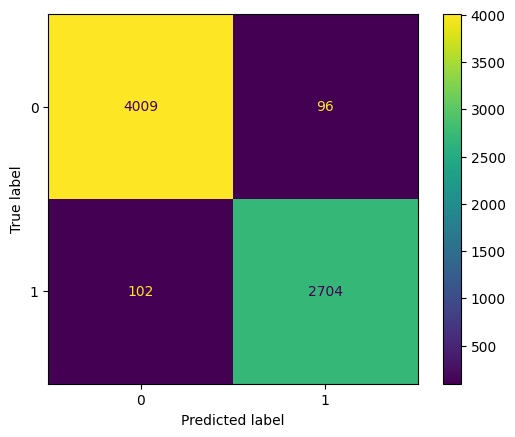

In [129]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import numpy as np

# Flatten predictions and labels
y_true = []
y_pred = []

for batch_images, batch_labels in test_loader:
    predictions = model(batch_images, training=False)
    y_true.extend(np.argmax(batch_labels, axis=1))
    y_pred.extend(np.argmax(predictions, axis=1))

# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap="viridis")
plt.show()


In [1]:
# plt.plot(history.history['accuracy'])
# plt.plot(history.history['val_accuracy'])
# plt.title('Model Accuracy')
# plt.ylabel('accuracy')
# plt.xlabel('epoch')
# plt.legend(['train', 'validation'], loc='upper left')
# plt.show()

In [2]:
# plt.plot(history.history['loss'])
# plt.plot(history.history['val_loss'])
# plt.title('Model Loss')
# plt.ylabel('loss')
# plt.xlabel('epoch')
# plt.legend(['train', 'validation'], loc='upper left')
# plt.show()

In [3]:
# from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score, roc_curve
# import matplotlib.pyplot as plt

# # Assuming Y_pred and Y_true are already defined
# # Y_pred is the output from model.predict, Y_pred_classes is obtained by np.argmax(Y_pred, axis=1)
# Y_true = np.argmax(test_labels, axis=1)  # Make sure y_test is correctly prepared

# # Calculate Precision, Recall, and F1 Score
# precision = precision_score(Y_true, Y_pred_classes)
# recall = recall_score(Y_true, Y_pred_classes)
# f1 = f1_score(Y_true, Y_pred_classes)

# # Calculate the probabilities for the positive class
# Y_pred_probs = Y_pred[:, 1]  # assuming your model outputs probabilities for each class

# # ROC AUC Score
# roc_auc = roc_auc_score(Y_true, Y_pred_probs)

# # Print the metrics
# print(f"Precision: {precision:.2f}")
# print(f"Recall: {recall:.2f}")
# print(f"F1 Score: {f1:.2f}")
# print(f"ROC AUC Score: {roc_auc:.2f}")

In [4]:
# import numpy as np
# from sklearn.metrics import roc_curve, roc_auc_score


# # Generate predictions from the model
# Y_pred = model.predict(test_loader)  # Assuming test_images is the input to the model
# Y_pred_classes = np.argmax(Y_pred, axis=1)  # Get class with the highest probability
# Y_true = np.argmax(test_labels, axis=1)  #  test_labels is one-hot encoded

# # Calculate ROC curve for both classes
# fpr_0, tpr_0, _ = roc_curve(Y_true, Y_pred[:, 0], pos_label=0)
# fpr_1, tpr_1, _ = roc_curve(Y_true, Y_pred[:, 1], pos_label=1)

# # Compute AUC for both classes
# roc_auc_0 = roc_auc_score(Y_true == 0, Y_pred[:, 0])
# roc_auc_1 = roc_auc_score(Y_true == 1, Y_pred[:, 1])

# # Plot ROC curves
# plt.figure(figsize=(8, 6))
# plt.plot(fpr_0, tpr_0, color='blue', lw=2, label=f'Non-cancer (area = {roc_auc_0:.2f})')
# plt.plot(fpr_1, tpr_1, color='red', lw=2, label=f'Cancer (area = {roc_auc_1:.2f})')

# # Diagonal line for random guessing
# plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

# # Labels and title
# plt.xlim([0.0, 1.0])
# plt.ylim([0.0, 1.05])
# plt.xlabel('False Positive Rate')
# plt.ylabel('True Positive Rate')
# plt.title('Receiver Operating Characteristic (ROC) Curve for Both Classes')
# plt.legend(loc="lower right")

# # Show plot
# plt.show()
